In [1]:
from anastruct import SystemElements
from matplotlib import pyplot as plt
import pandas as pd
import math

In [2]:
def adjust_plot(L):
    plt.rcParams.update({"font.size": 12})
    ax = plt.gca()
    ax.set_aspect("equal")
    ax.yaxis.set_visible(False)
    ax.set_xlim(-0.5, L + 0.5)

def plot_structure(ss, L):
    # Plot structure
    ss.show_structure(show=False, figsize=(15, 5))
    adjust_plot(L)
    plt.show()


def plot_reaction_force(ss):
    # Plot sturcture with reaction forces
    ss.show_reaction_force(show=False, figsize=(15, 5))
    adjust_plot(L)
    plt.show()


def plot_bending_moment(ss):
    # Plot sturcture with bending moment
    ss.show_bending_moment(show=False, figsize=(15, 5))
    adjust_plot(L)
    plt.show()


def plot_shear_force(ss):
    # Plot sturcture with shear force
    ss.show_shear_force(show=False, figsize=(15, 5))
    adjust_plot(L)
    plt.show()


def plot_displacement(ss):
    # Plot sturcture with displacement
    ss.show_displacement(show=False, figsize=(15, 5))
    adjust_plot(L)
    plt.show()

def read_csv(filename, section):
    df = pd.read_csv(filename, sep=';')
    return df[df['Profil'] == section]

Beams = [
            "HE100B",
            "HE120B",
            "HE140B",
            "HE160B",
            "HE180B",
            "HE200B",
            "HE220B",
            "HE240B",
            "HE260B",
            "HE280B",
            "HE300B",
            "HE320B",
            "HE340B",
            "HE360B",
            "HE400B",
            "HE450B",
            "HE500B",
            "HE550B",
            "HE600B",
            "HE650B",
            "HE700B",
            "HE800B",
            "HE900B",
            "HE1000B",
]

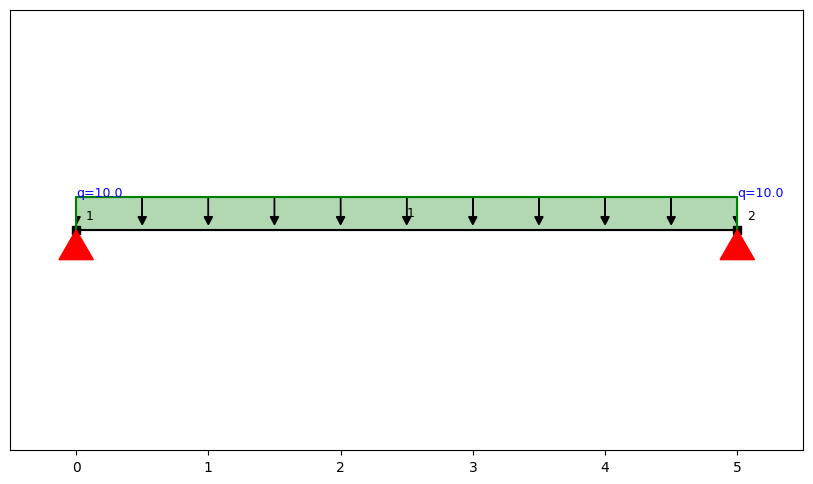

,shear,moment,reaction,displacement
0,26.5 kN,33.11 kNm,-26.5 kN,91.09 mm


In [3]:
# Simpel understøttet bjælke 

parametre = {
    "E": 210000,  # MPa
    "I": 4500000,  # mm^4
    "A": 2600,  # m^2
    "L": 5,  # m
    "q": -10,  # kN/m
    "g": 0.6  # kN/m
}

def simpel_bjælke(params: dict):
    ss = SystemElements()
    E = params["E"] / 1e6 # Omregning til korrekt SI enhed
    I = params["I"] / 1e6 # Omregning til korrekt SI enhed
    A = params["A"] / 1e3 # Omregning til korrekt SI enhed
    L = params["L"]
    q = params["q"]
    g = params["g"]
    
    # Tilføj bjælke element
    ss.add_element(location = [[0, 0], [L, 0]],
                   EI = E * I,
                   EA = E * I,
                   g = g
                   )
    
    # Tilføj understøtninger
    ss.add_support_hinged(node_id=1)
    ss.add_support_hinged(node_id=2)
    
    # Tilføj last
    ss.q_load(element_id=1, q=q)
    
    # Beregn system
    
    ss.solve()
    
    plot_structure(ss, L)
    
    results = {
        "shear": ss.get_element_result_range("shear", "max")[0],
        "moment": ss.get_element_result_range("moment")[0],
        "reaction": ss.get_node_results_system(node_id=1)["Fy"],
        "displacement": ss.get_element_results(element_id=1)["wmin"]
    }

    results_df = pd.DataFrame({
        "shear": [f"{round(results['shear'], 2)} kN"],
        "moment": [f"{round(results['moment'], 2)} kNm"],
        "reaction": [f"{round(results['reaction'], 2)} kN"],
        "displacement": [f"{round(results['displacement'], 2)} mm"]
    })
    display(results_df)
    
    
    return results

simpel_bjælke(params=parametre);

C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

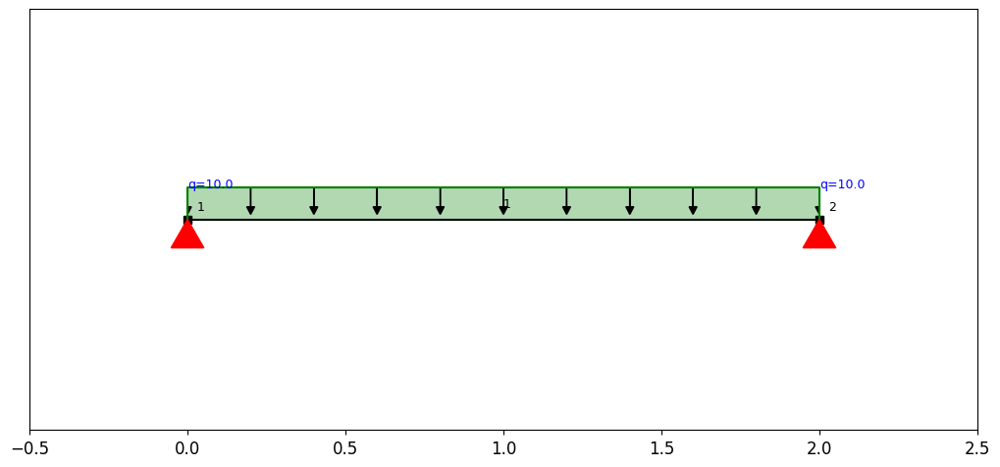

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

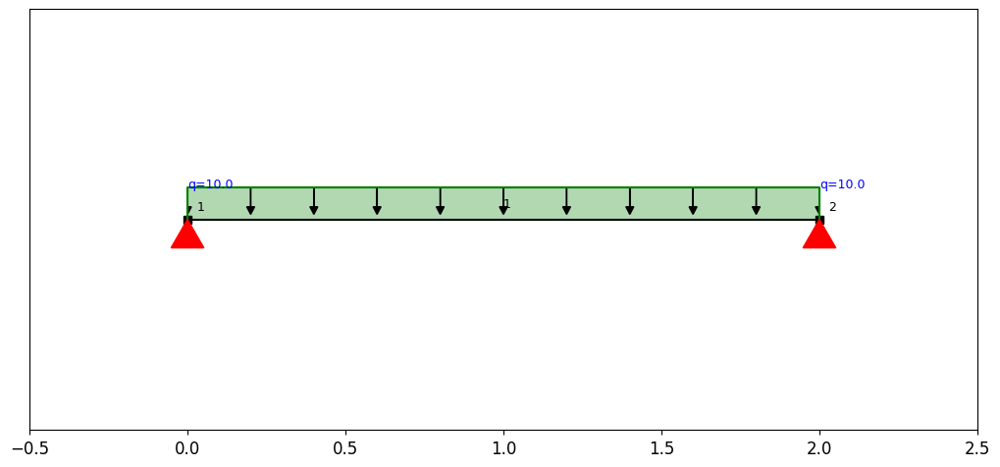

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


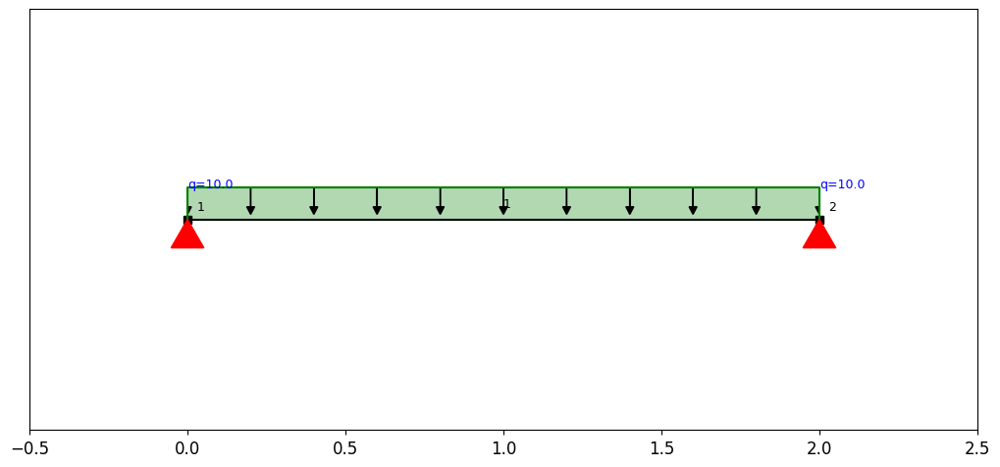

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

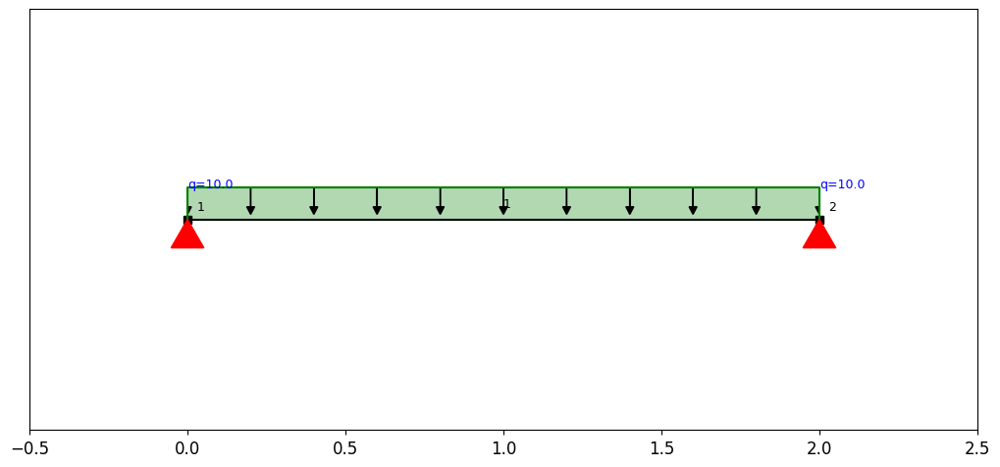

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

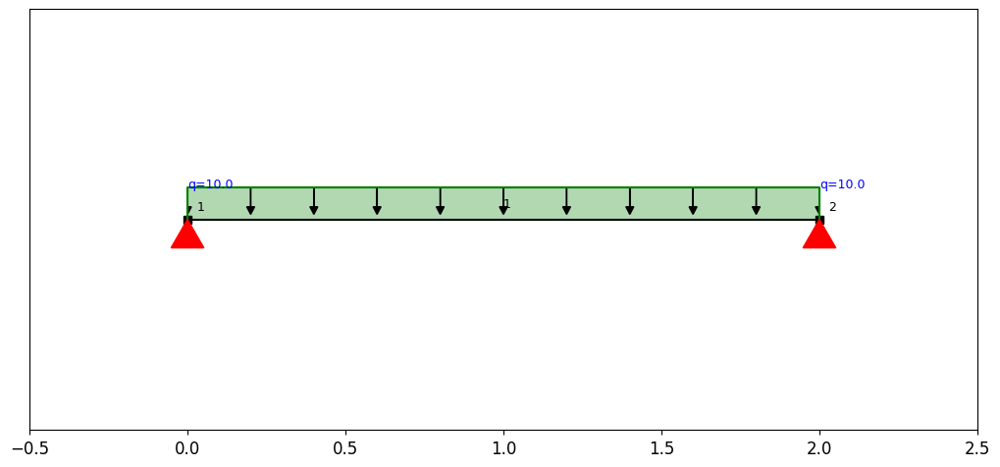

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

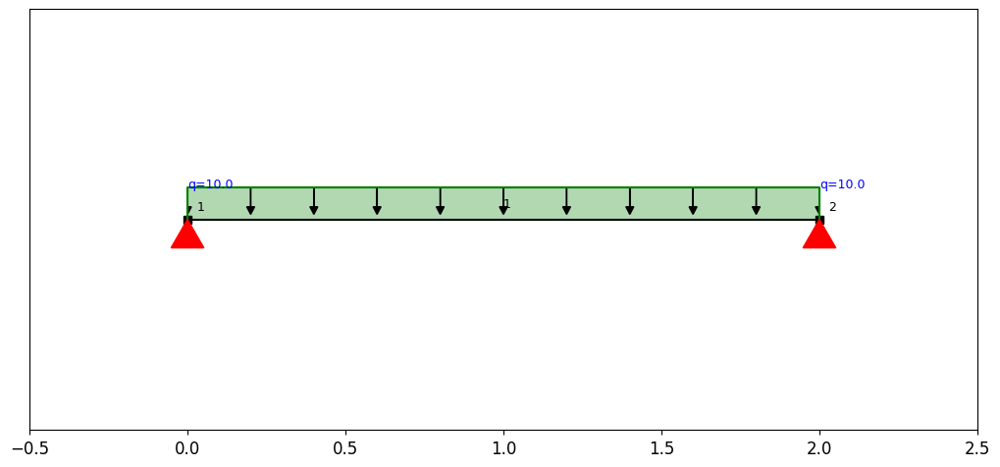

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

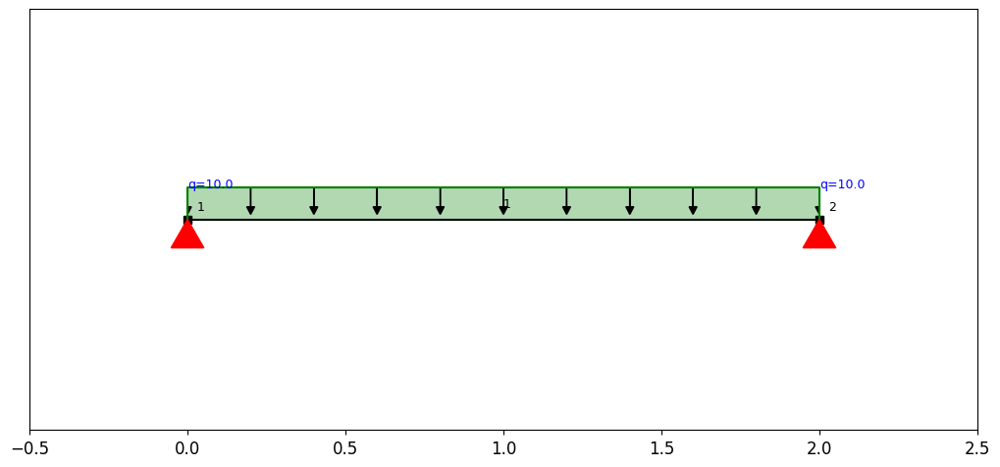

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

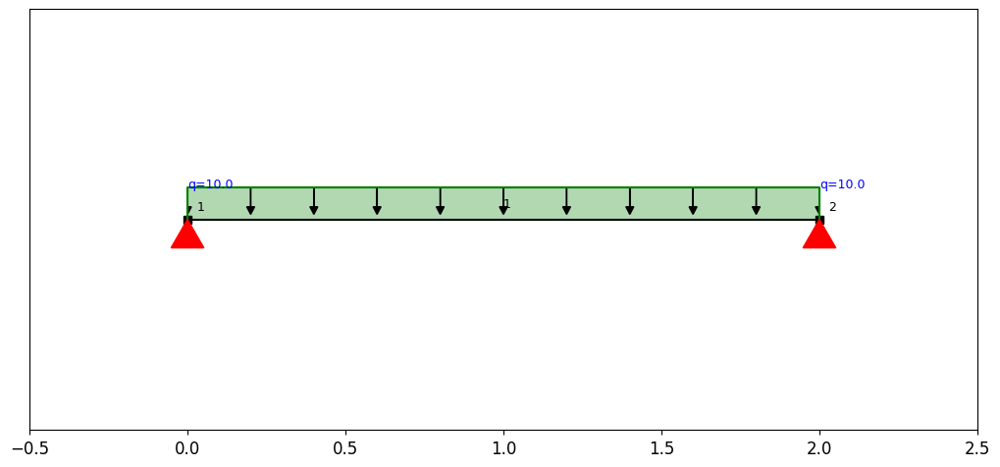

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


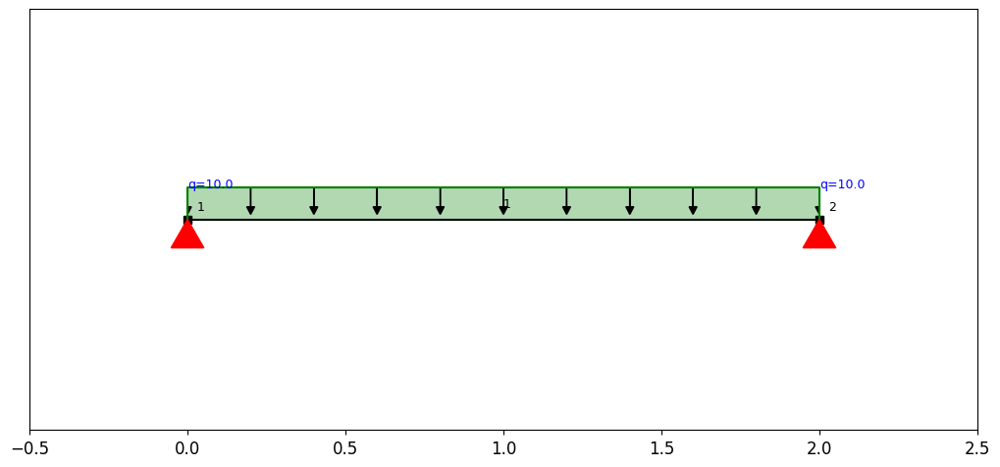

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

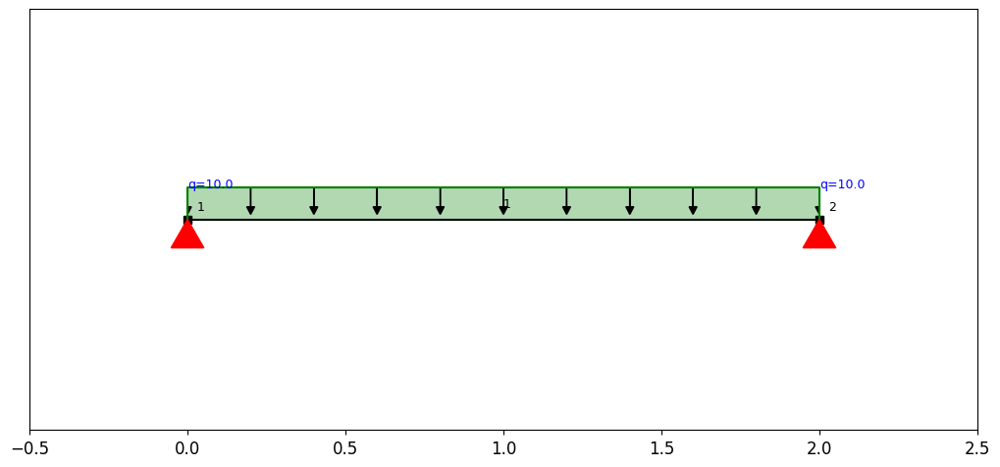

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

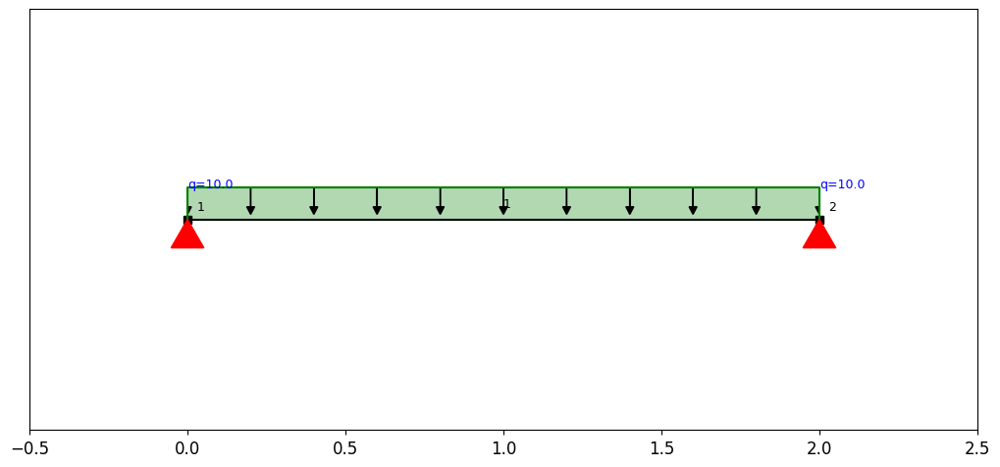

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

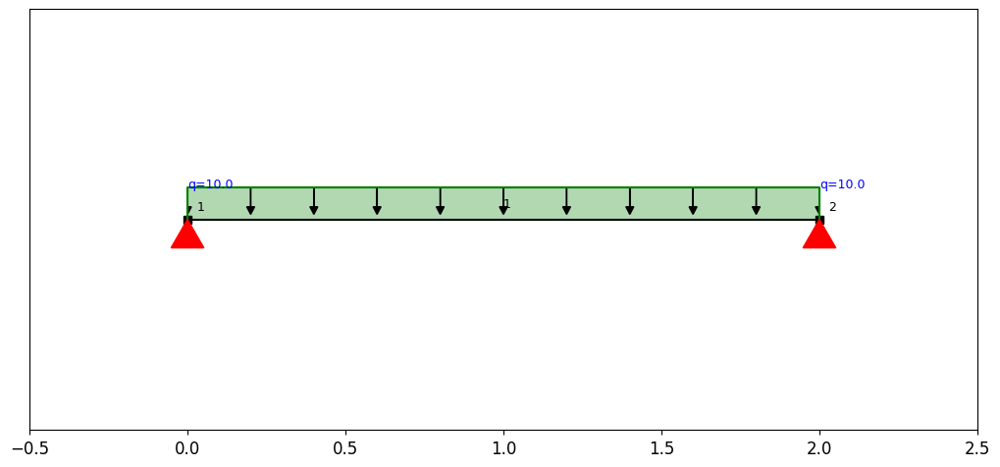

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

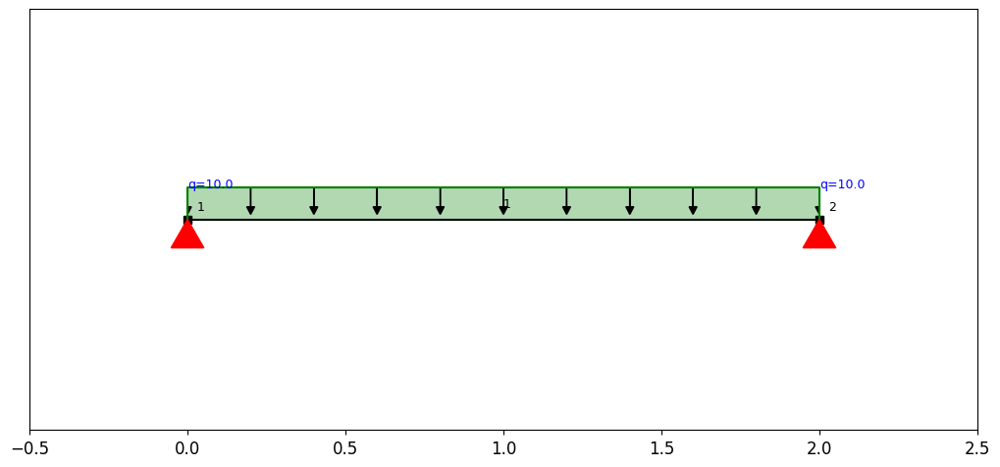

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

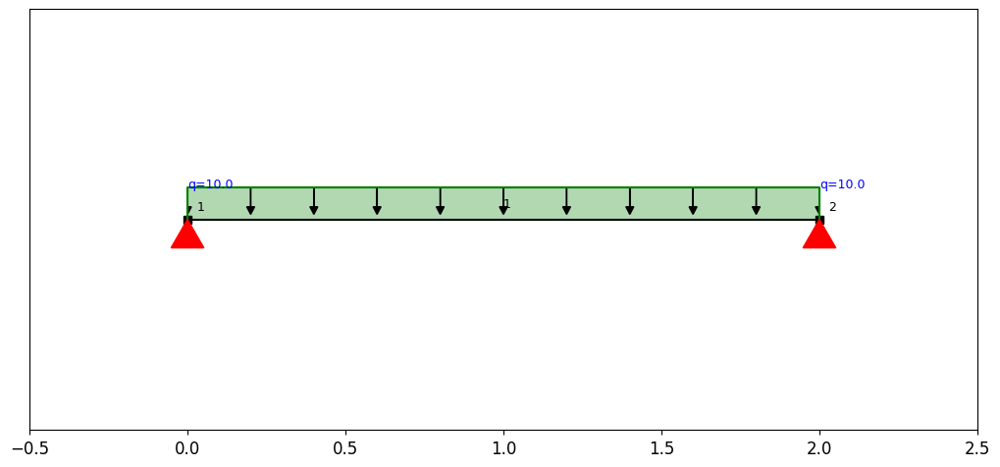

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

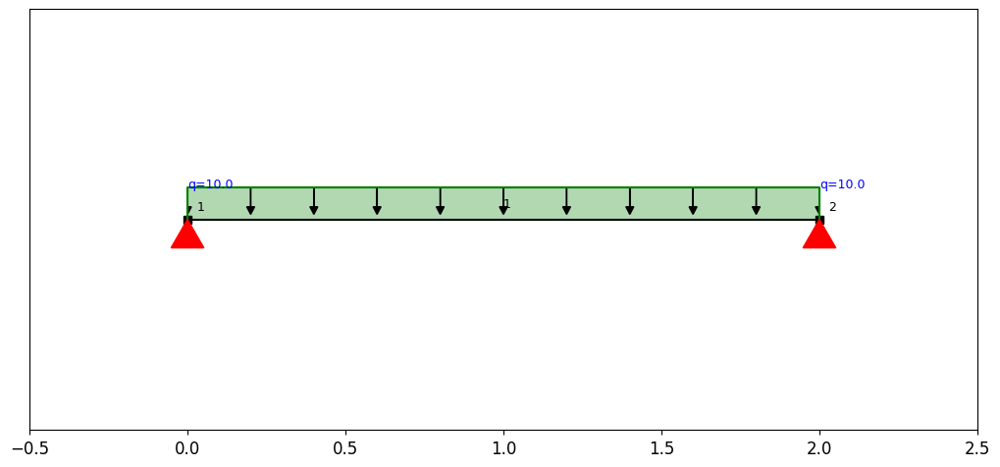

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

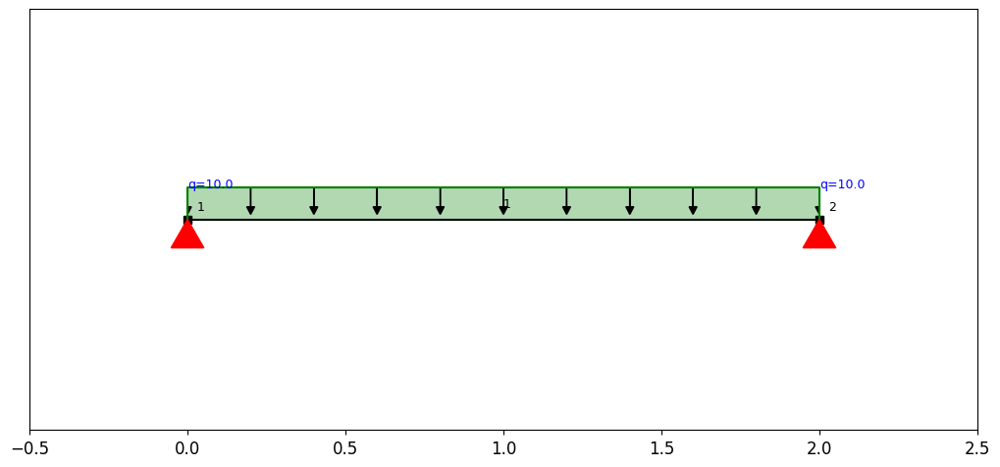

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

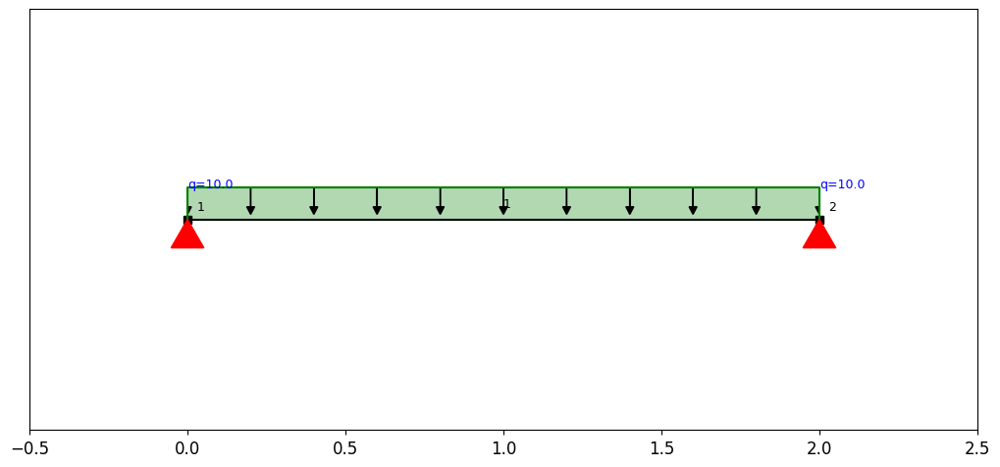

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

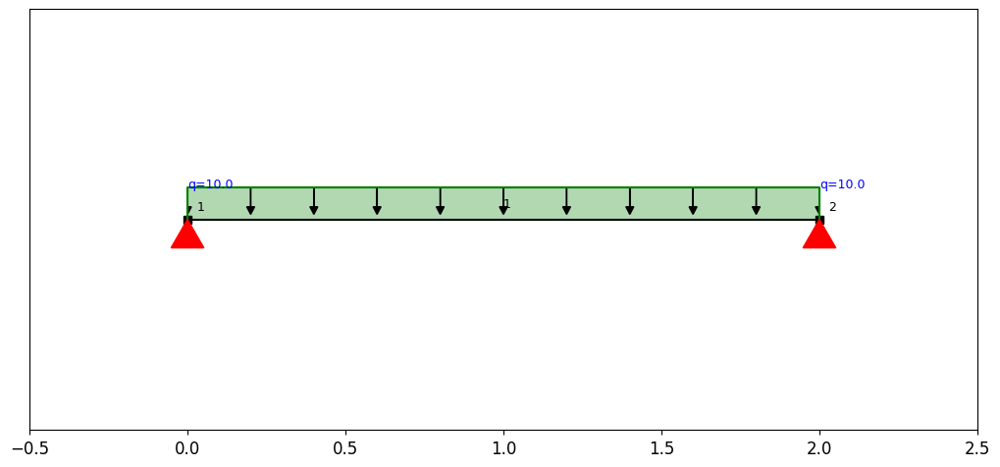

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

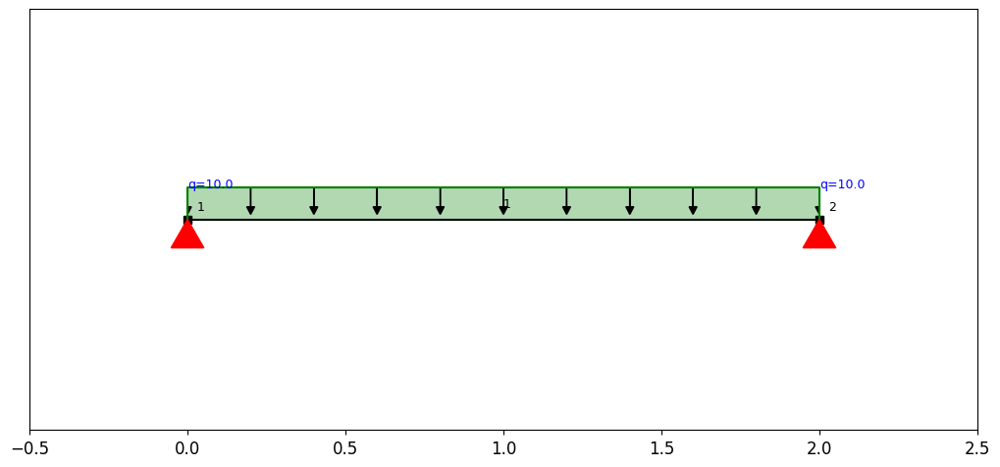

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

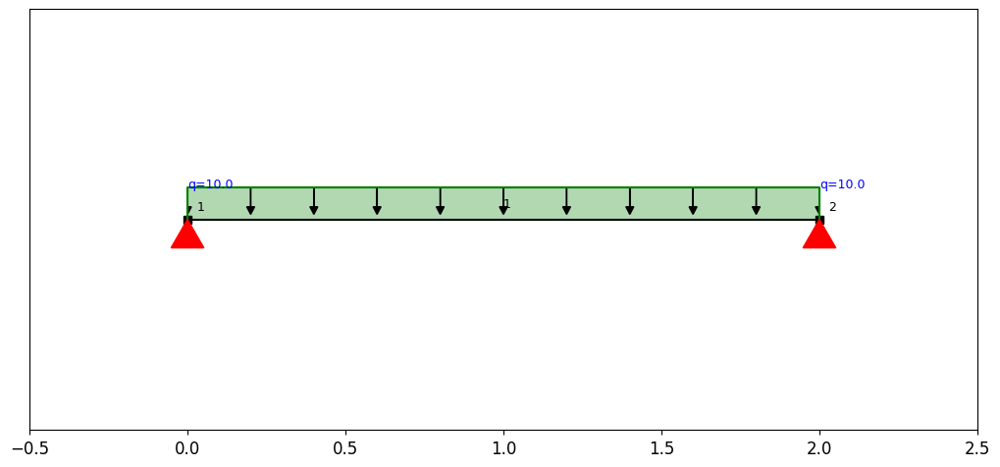

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


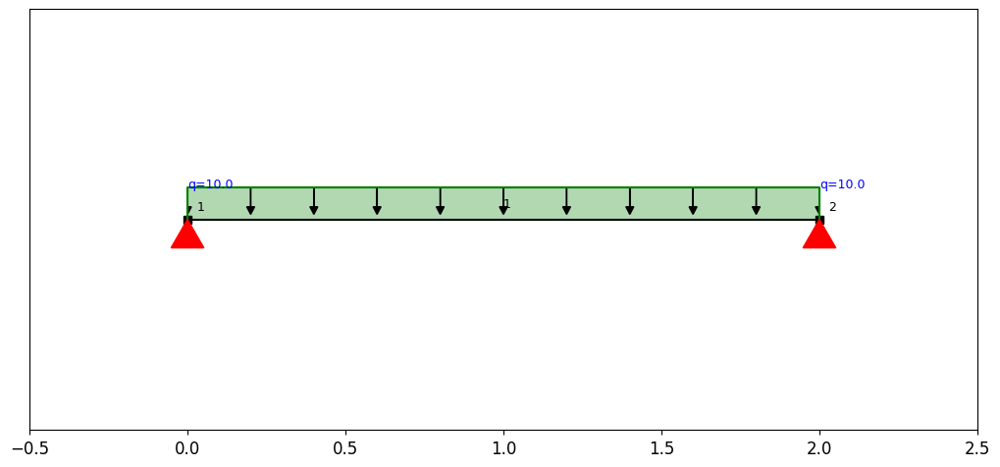

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

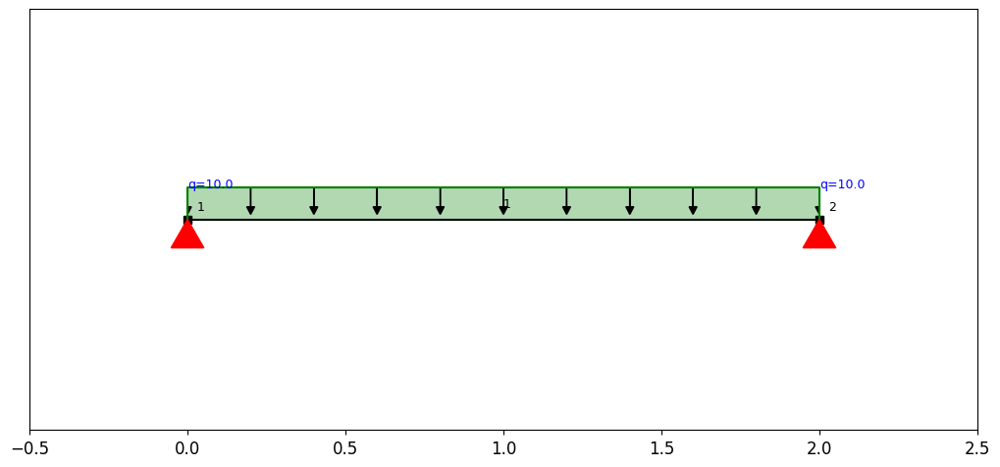

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

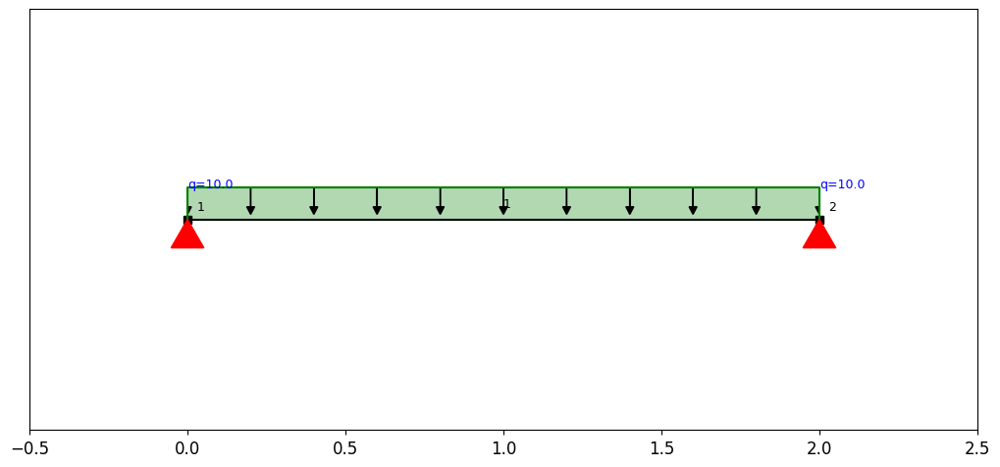

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

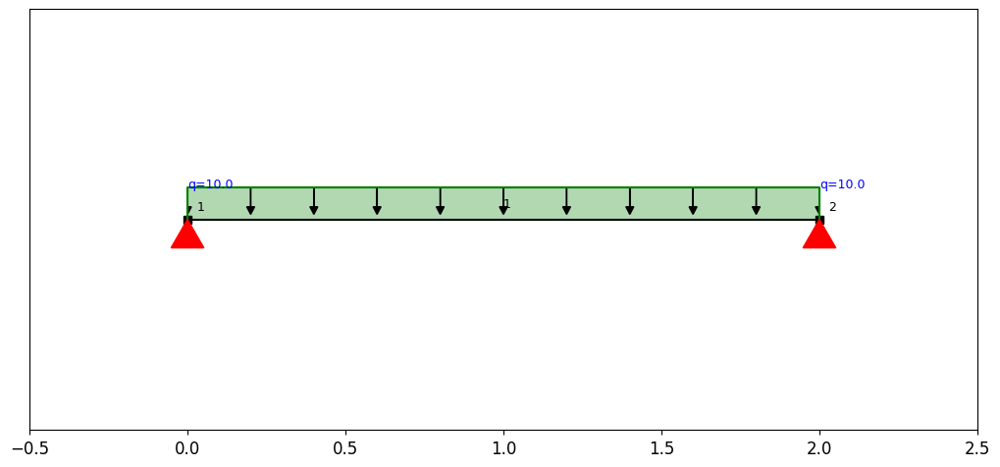

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

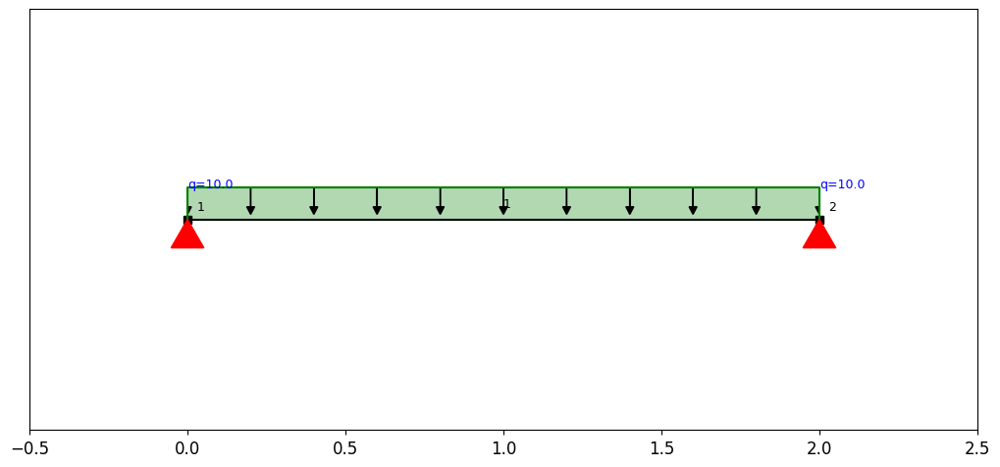

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

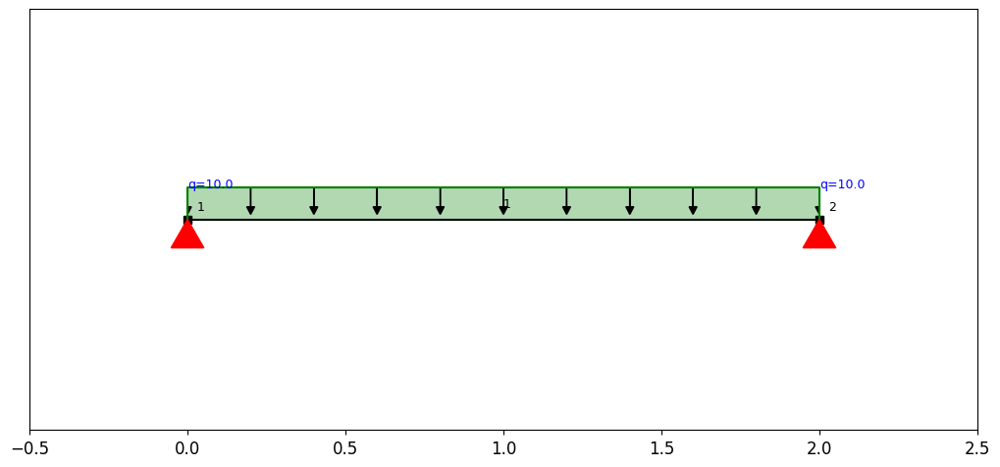

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

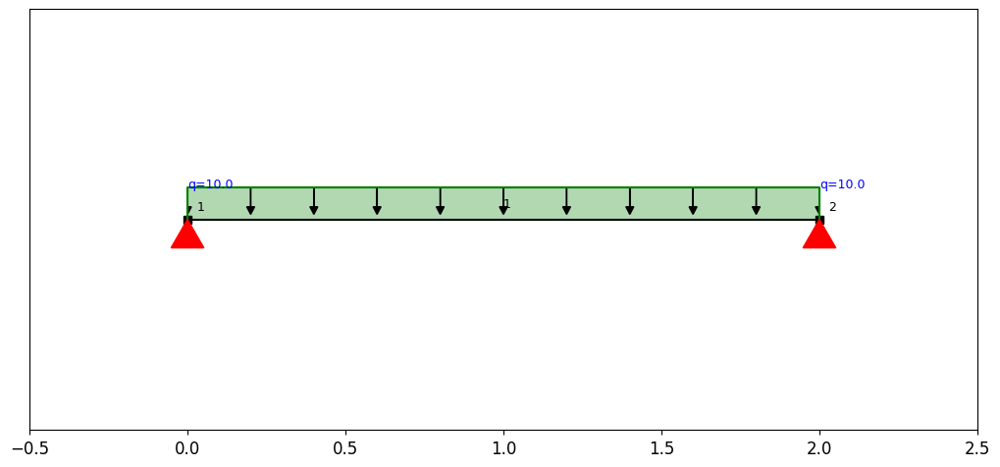

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


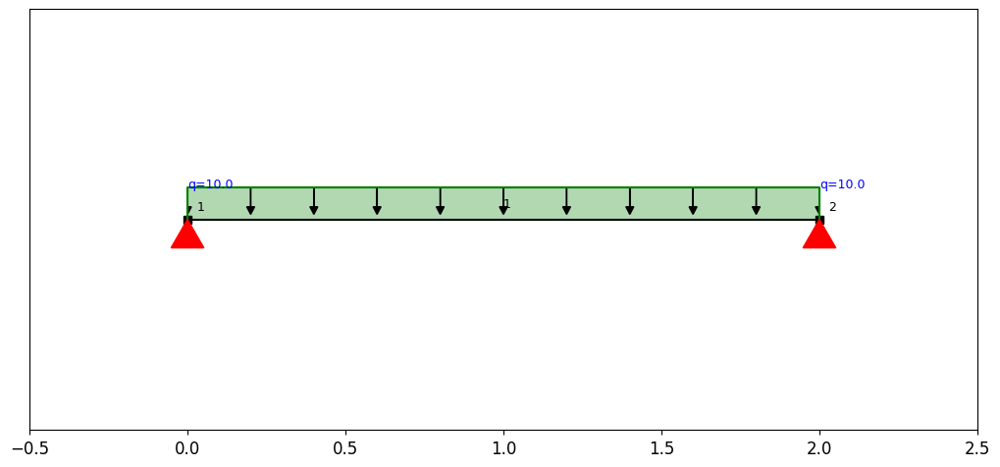

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

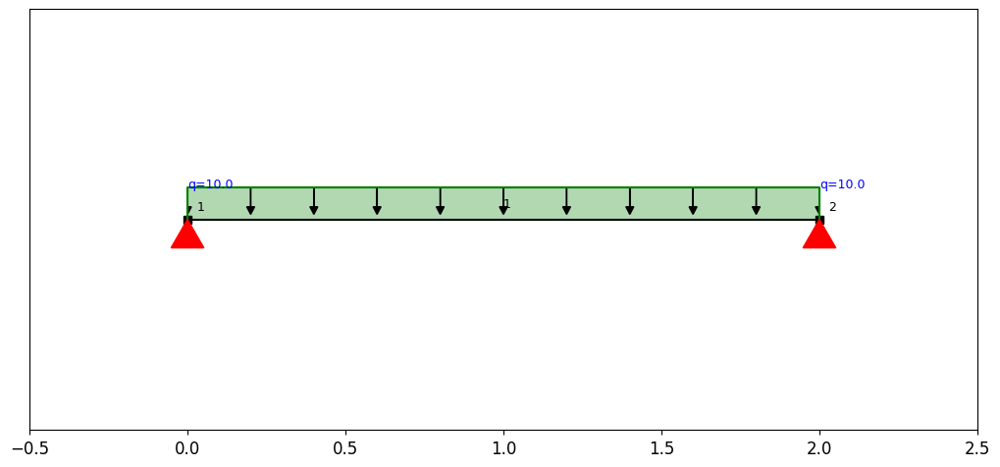

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

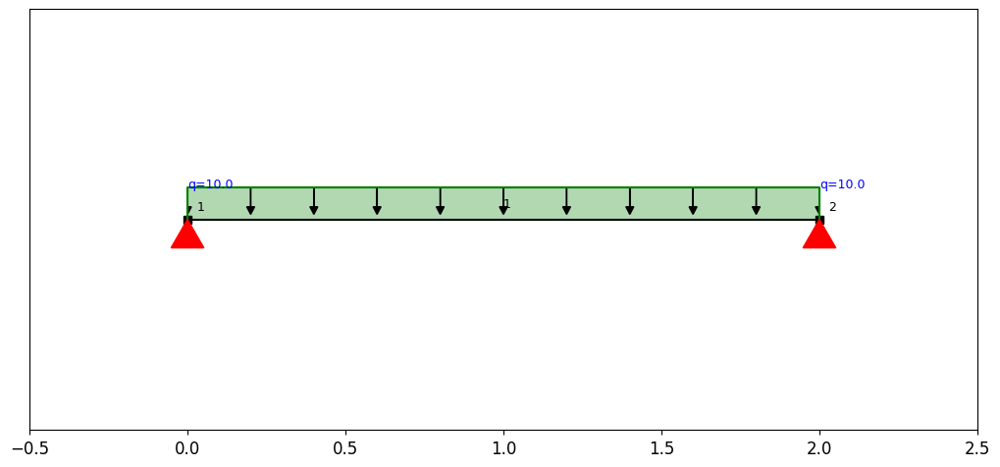

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

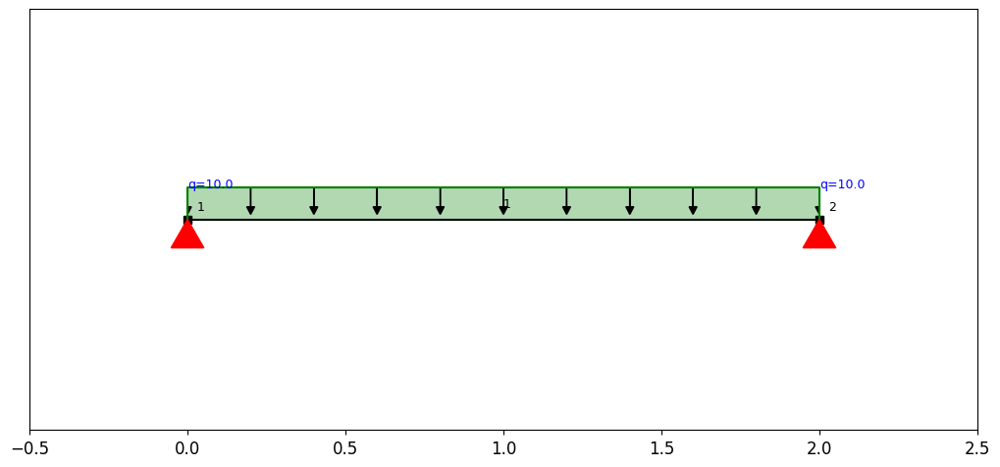

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

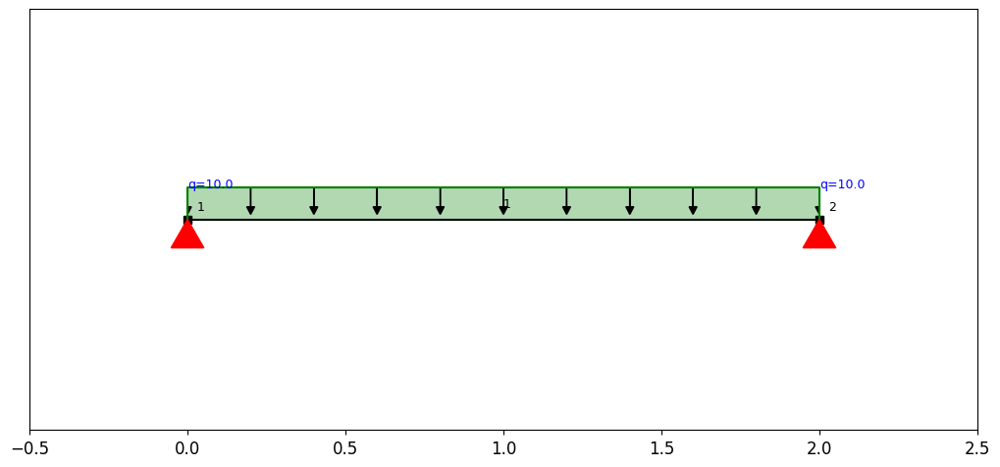

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

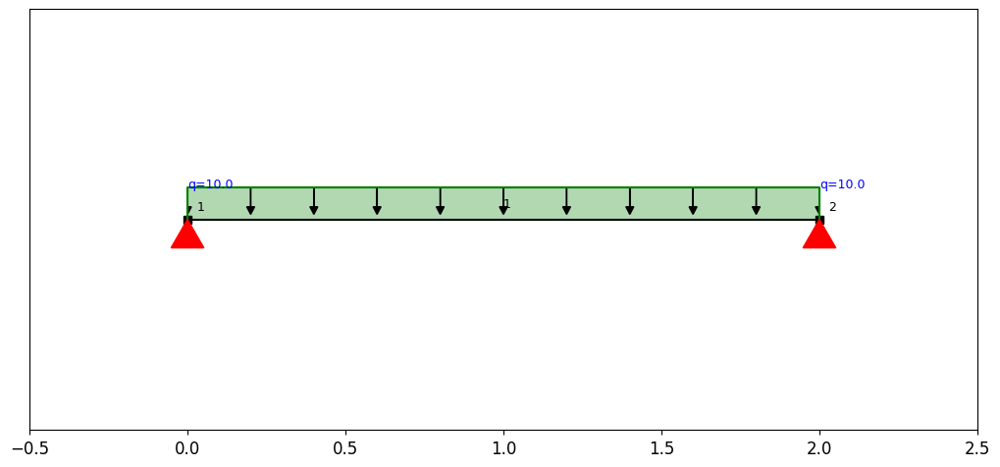

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

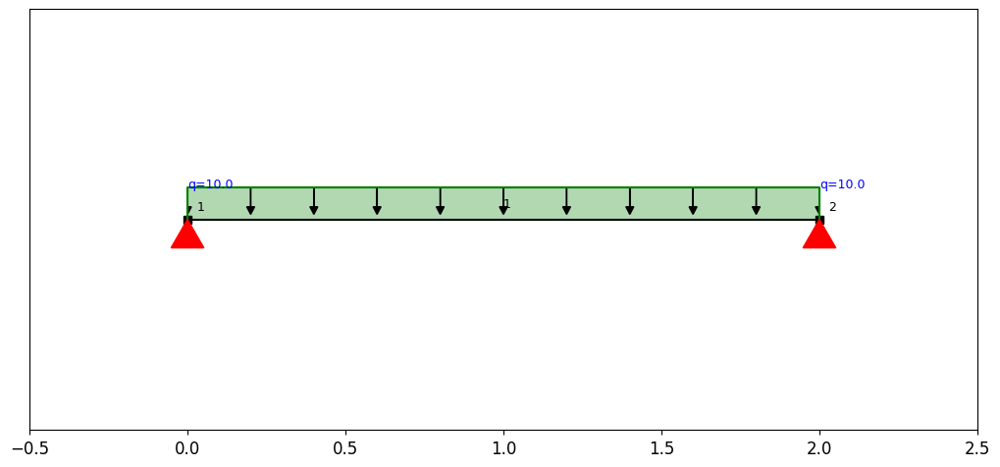

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

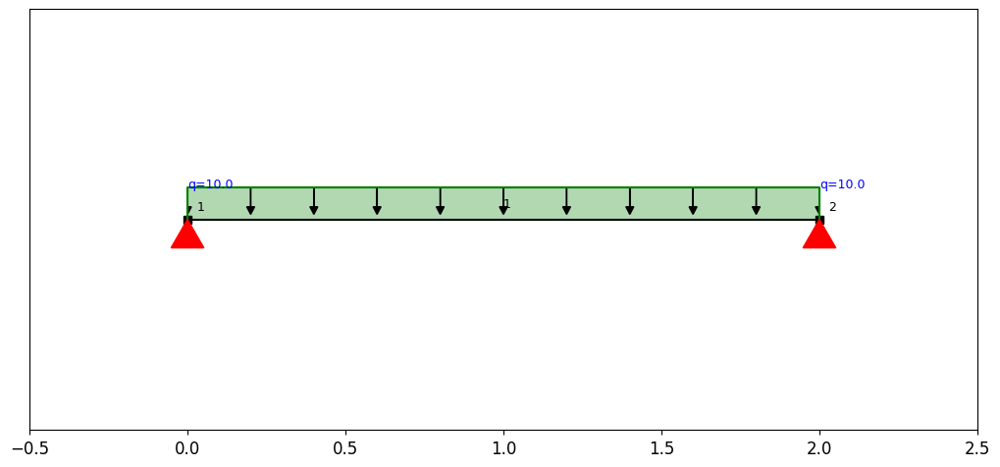

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

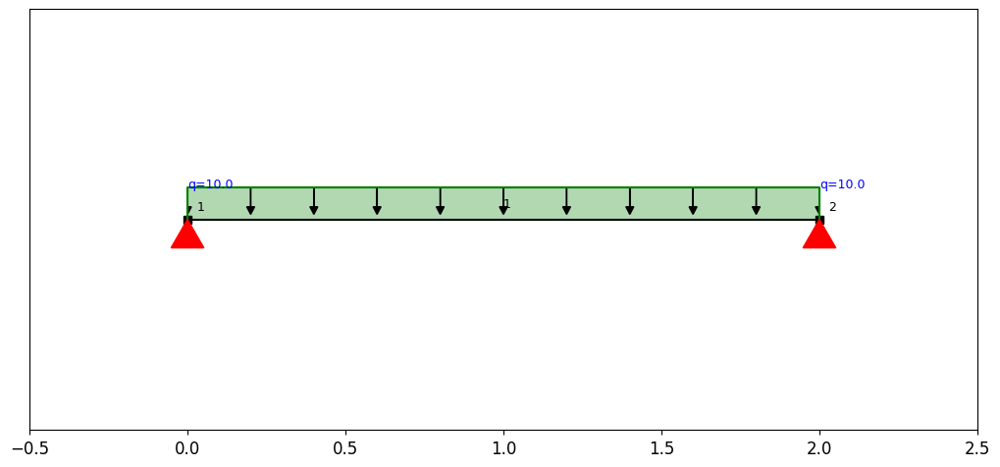

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

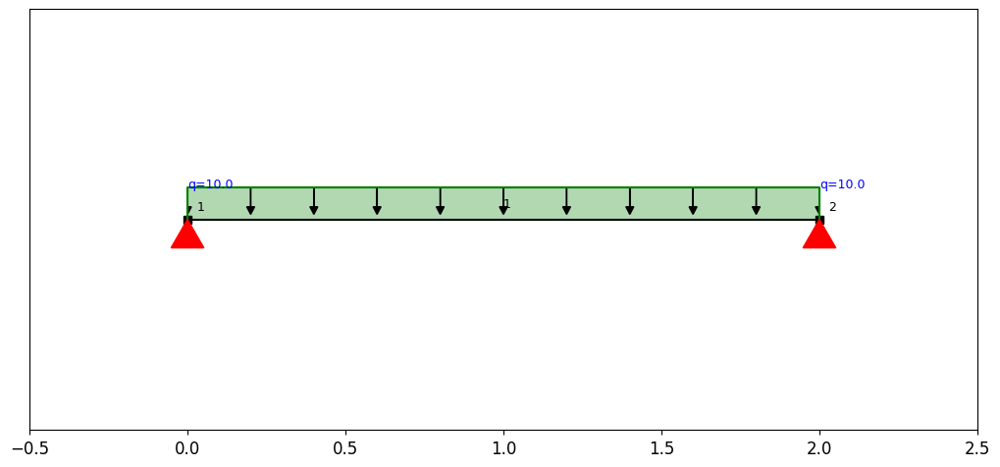

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

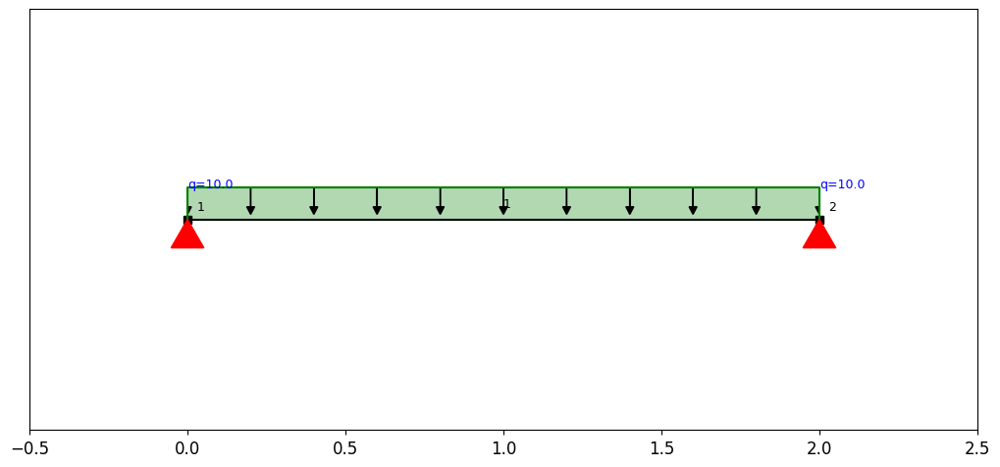

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

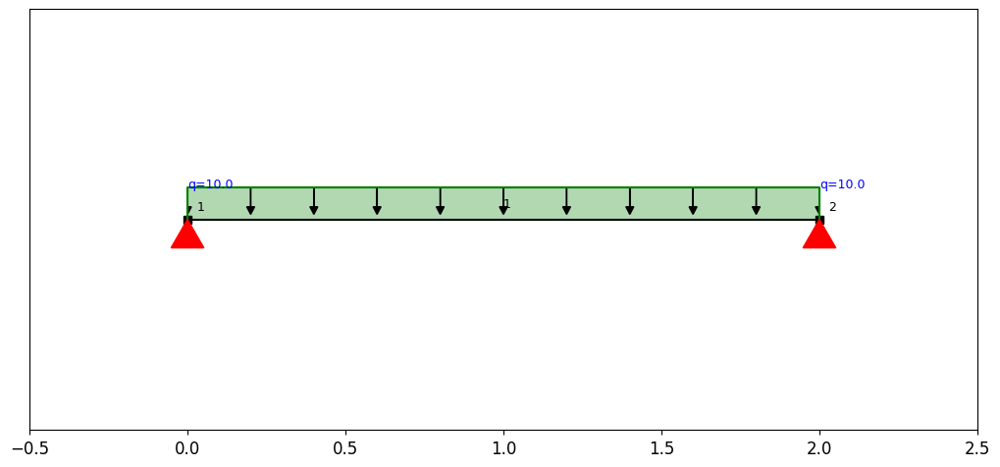

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


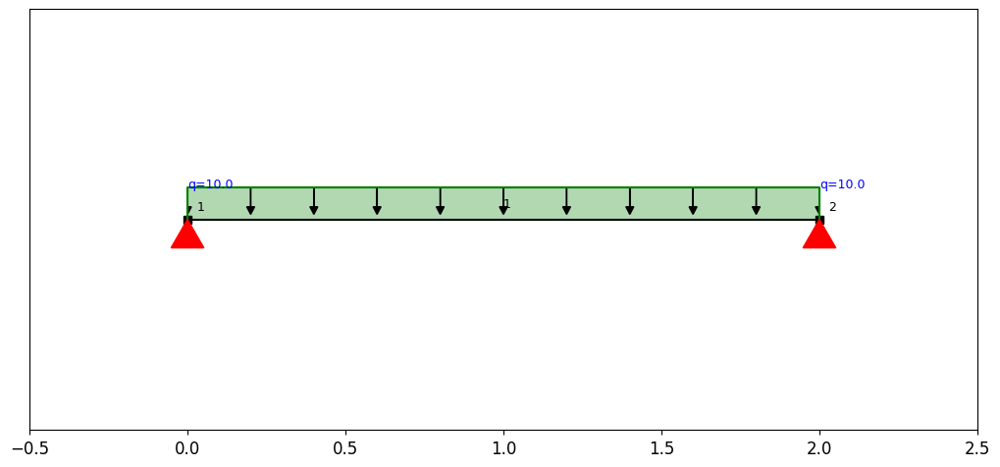

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

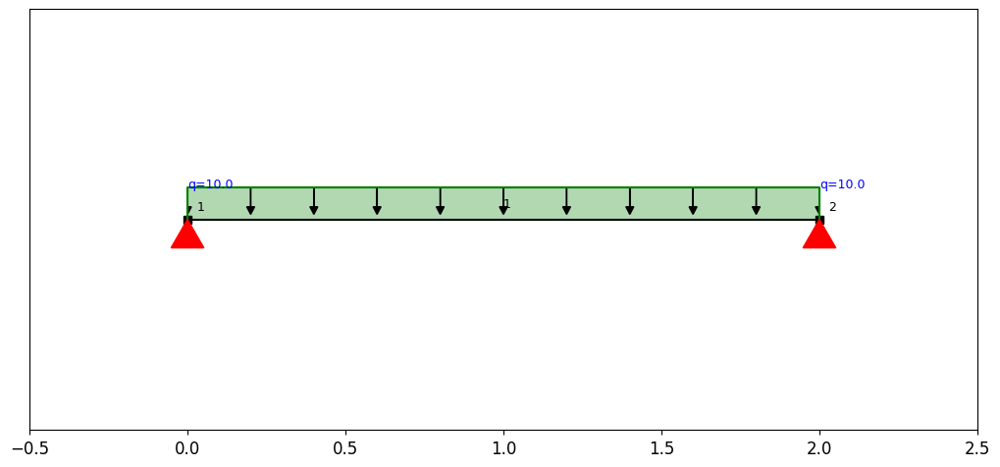

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

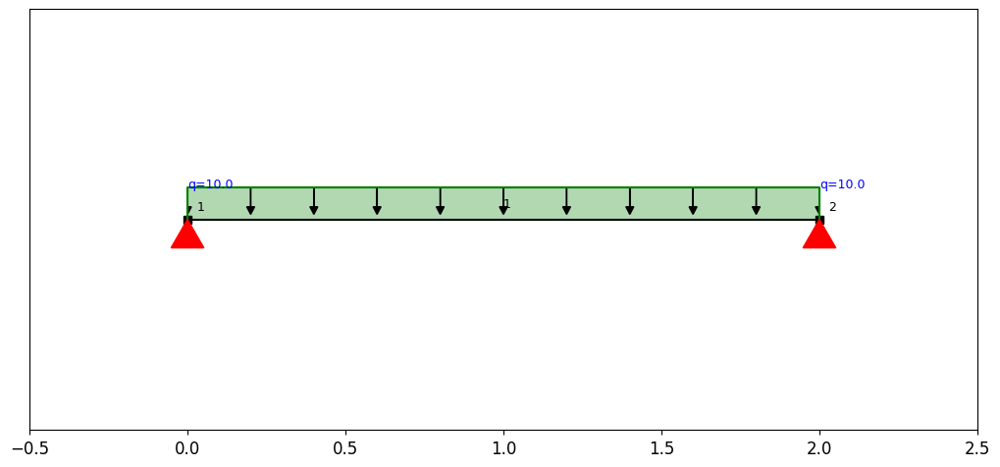

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


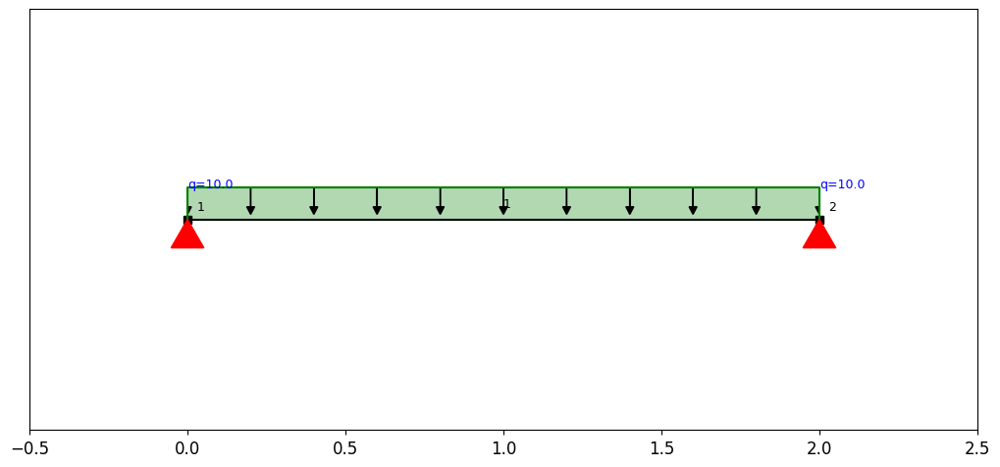

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

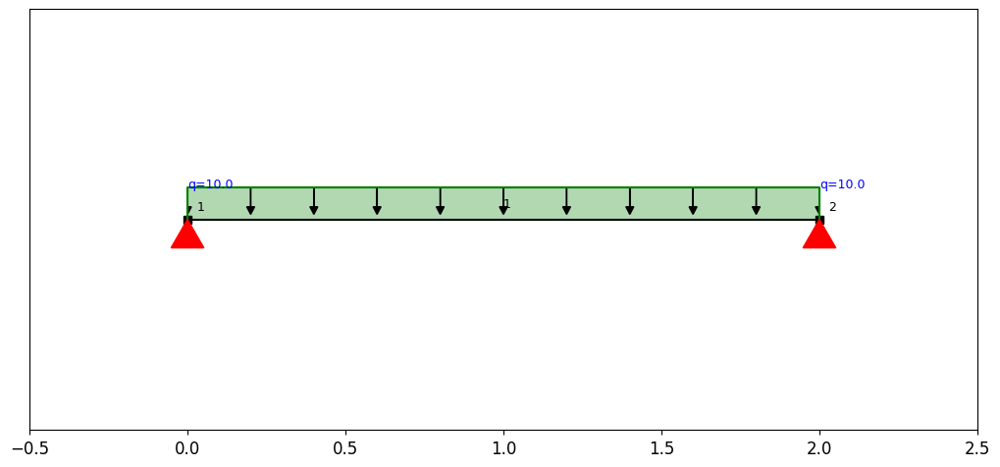

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

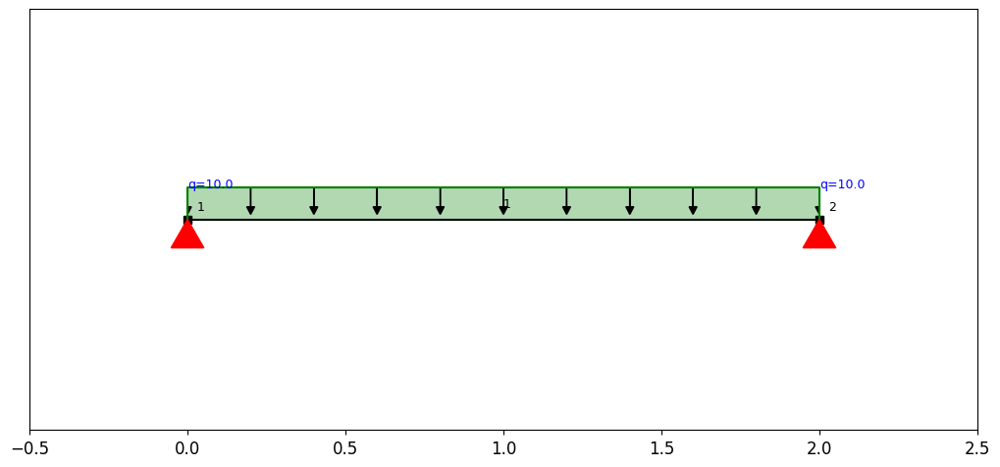

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

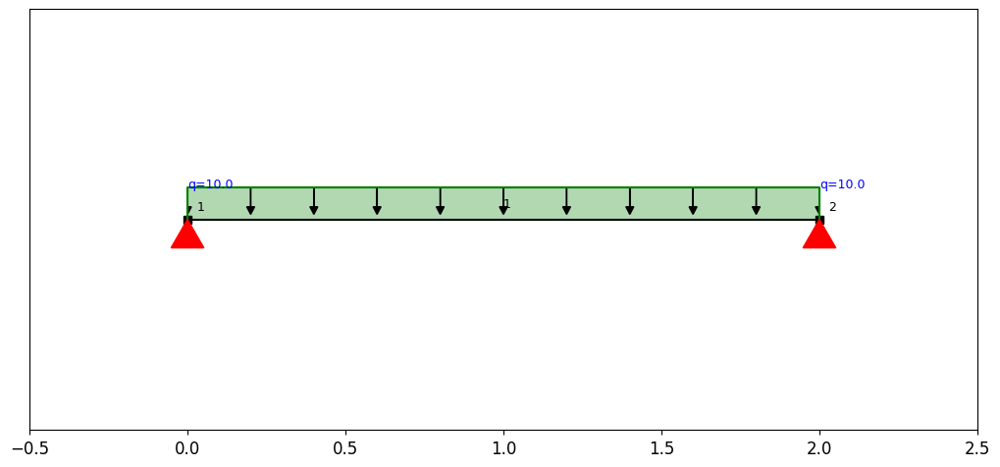

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

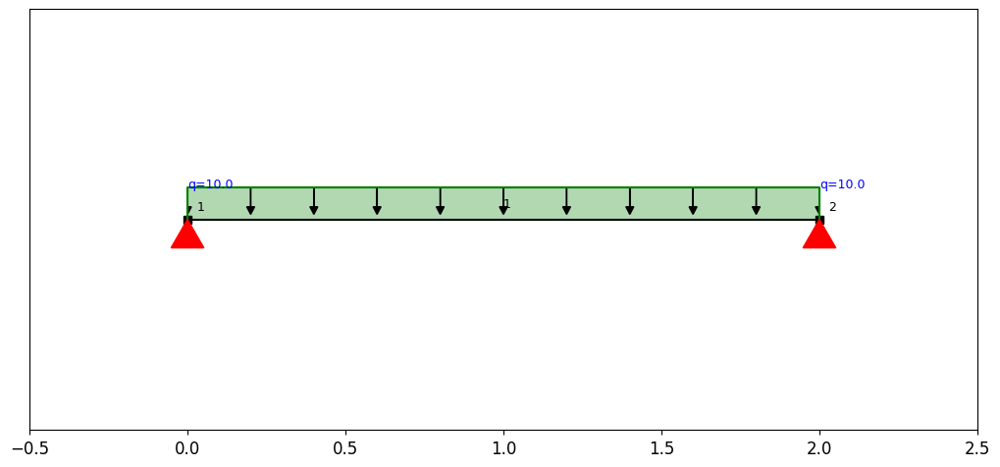

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

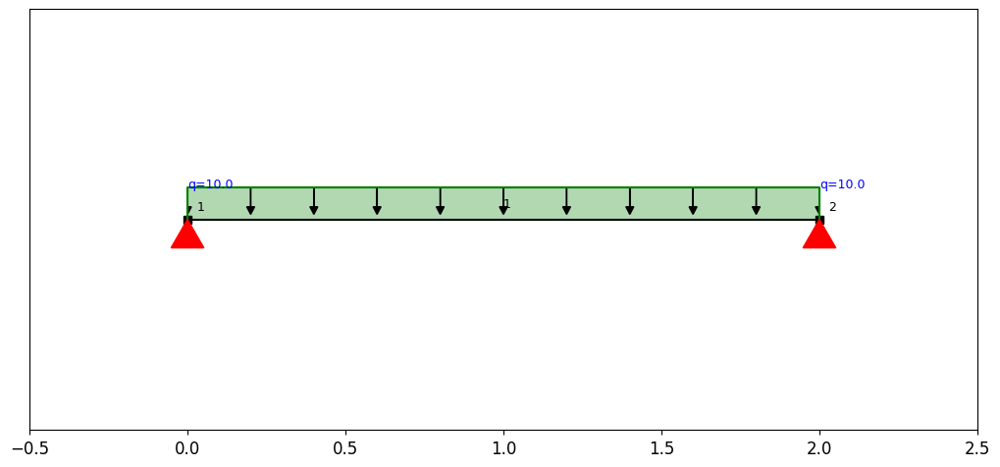

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

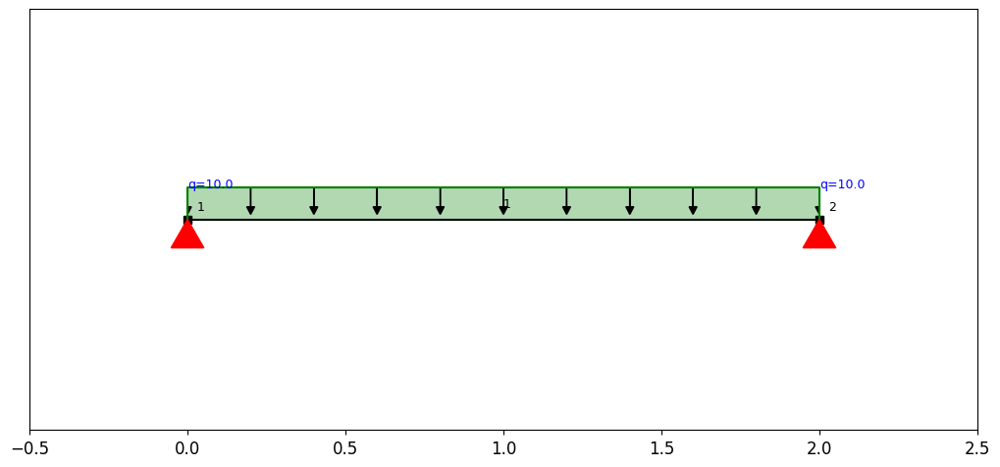

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


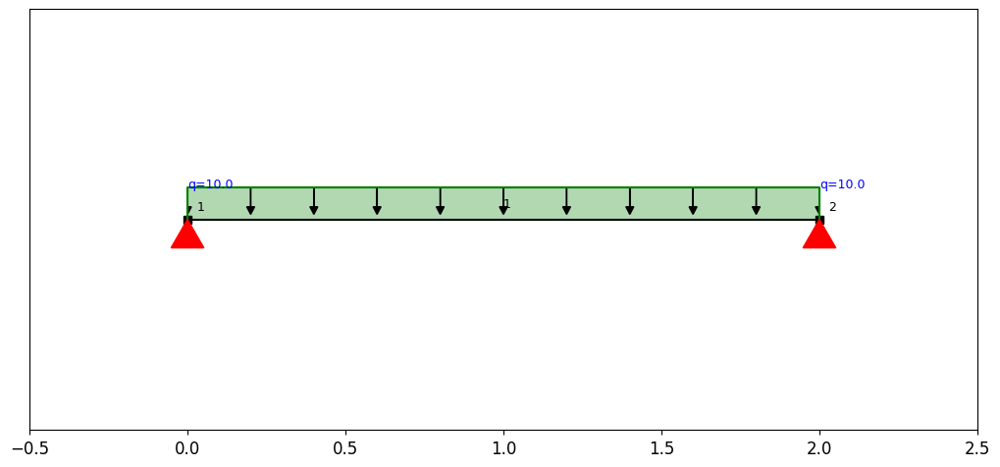

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

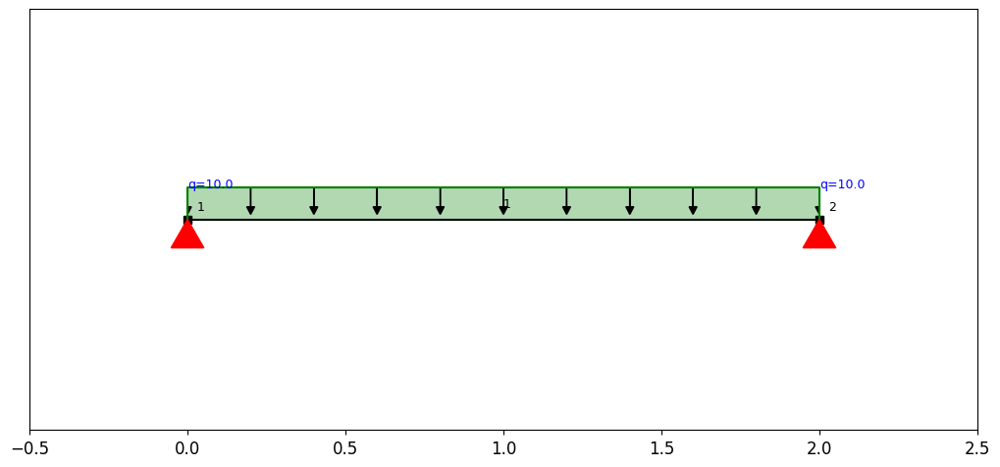

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


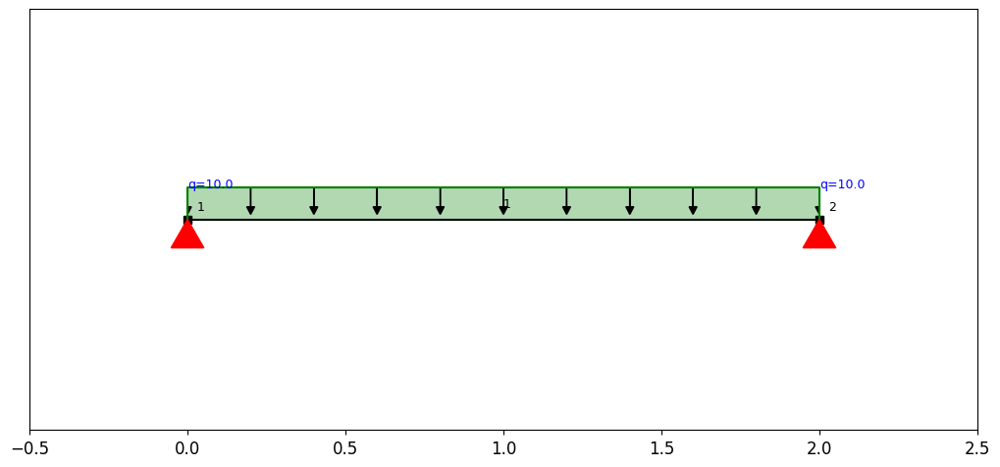

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

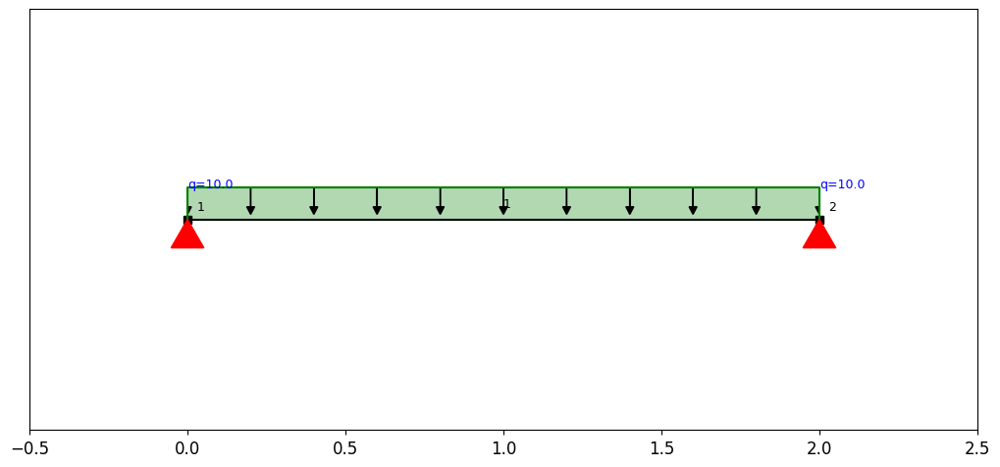

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

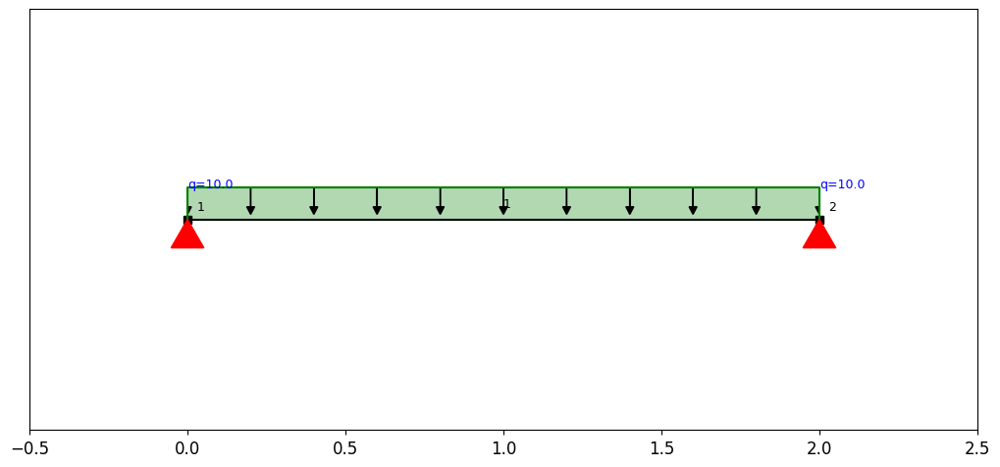

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

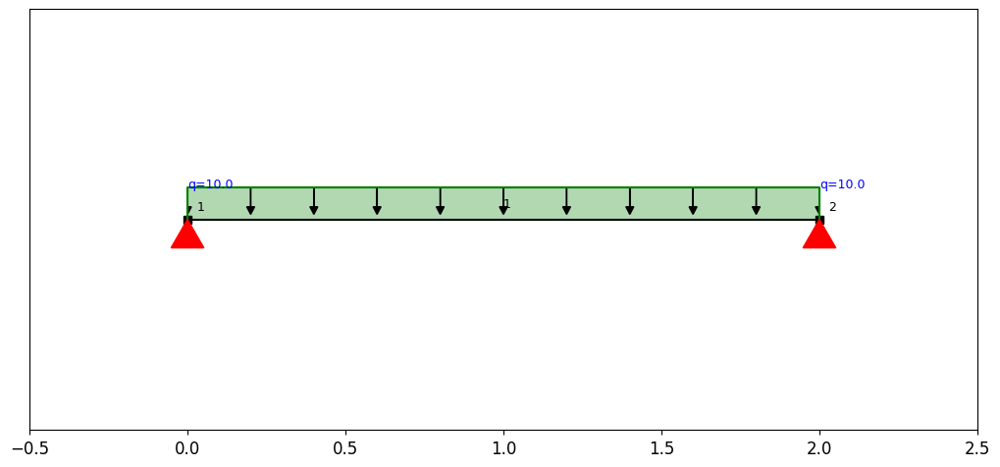

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

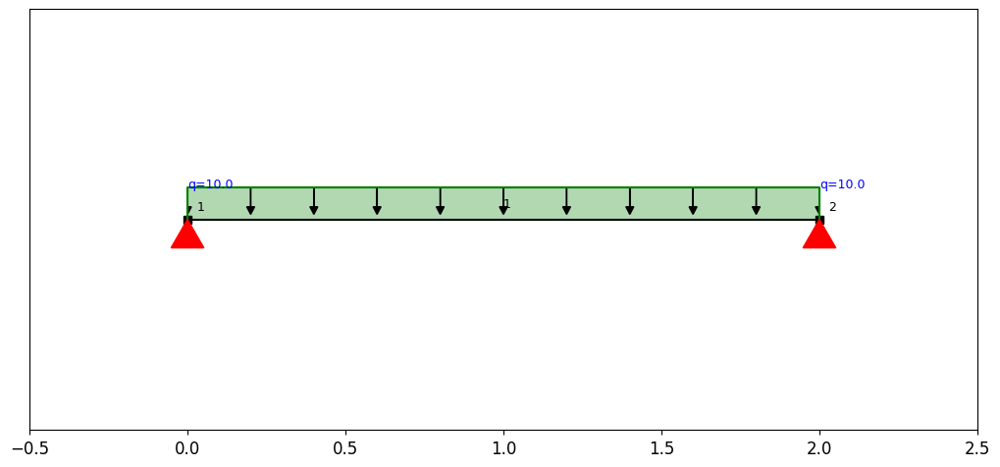

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

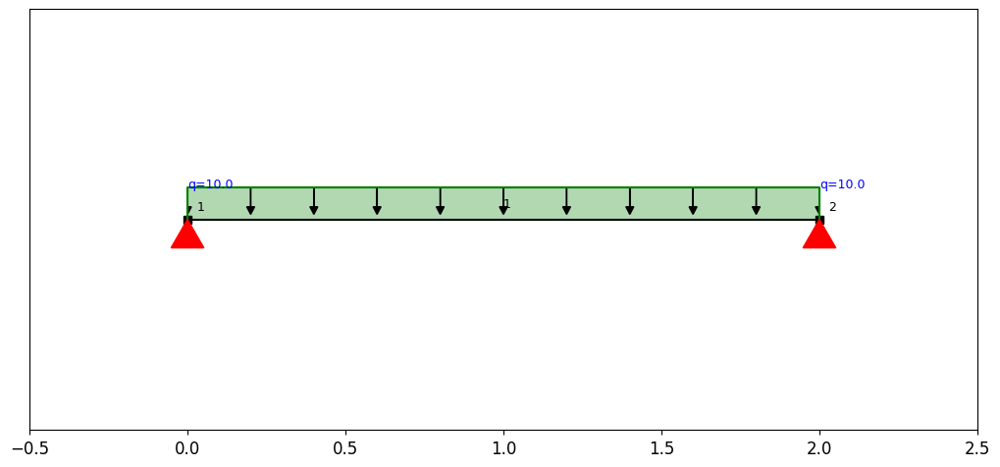

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

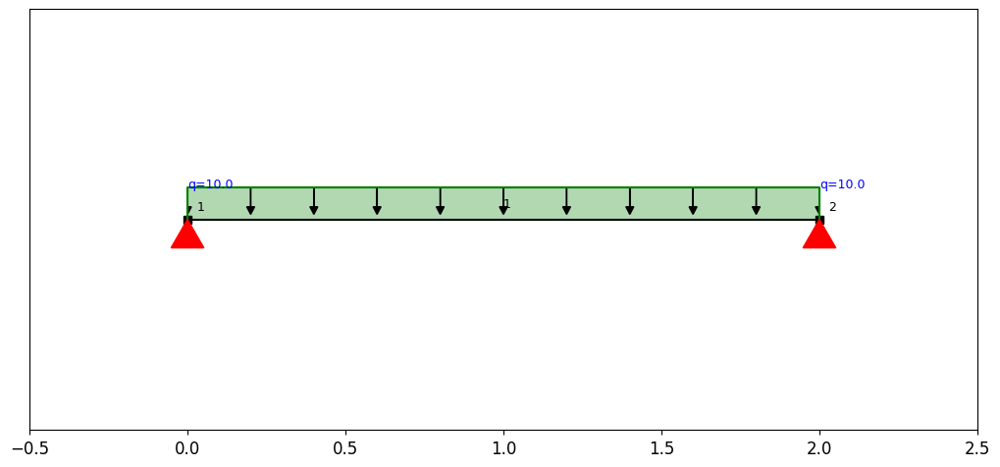

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

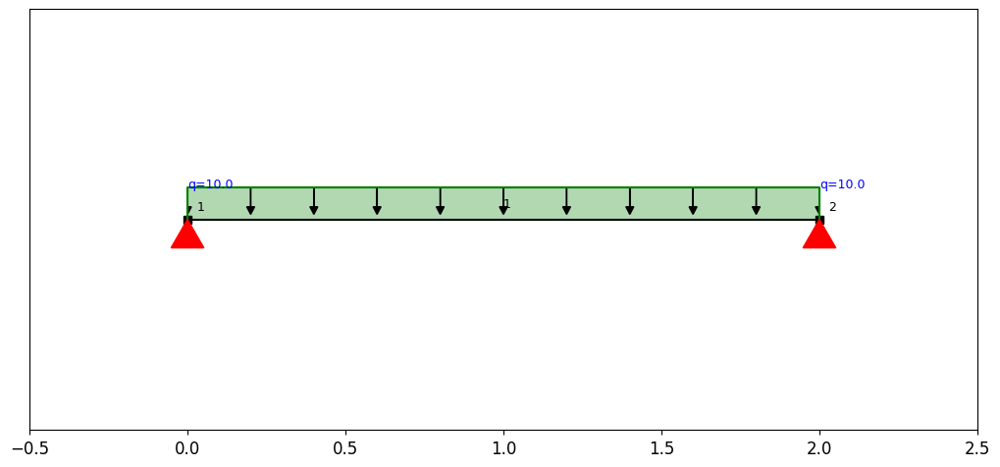

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

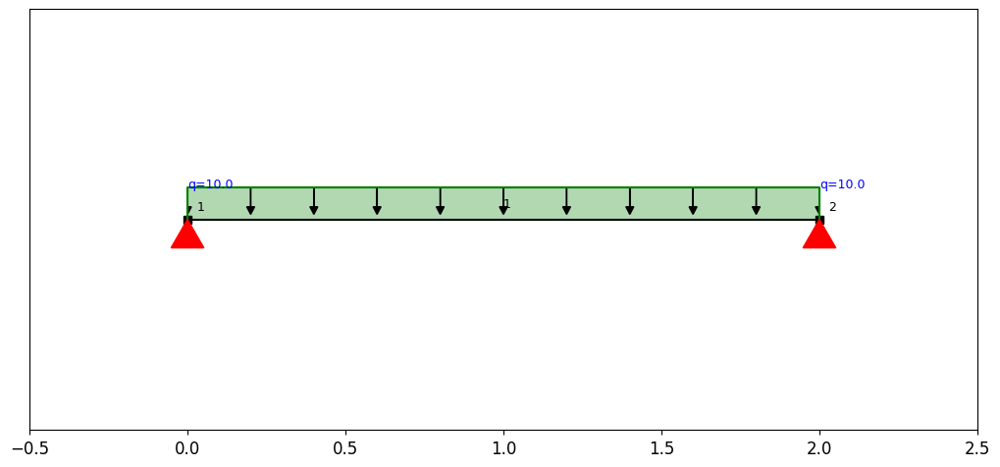

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

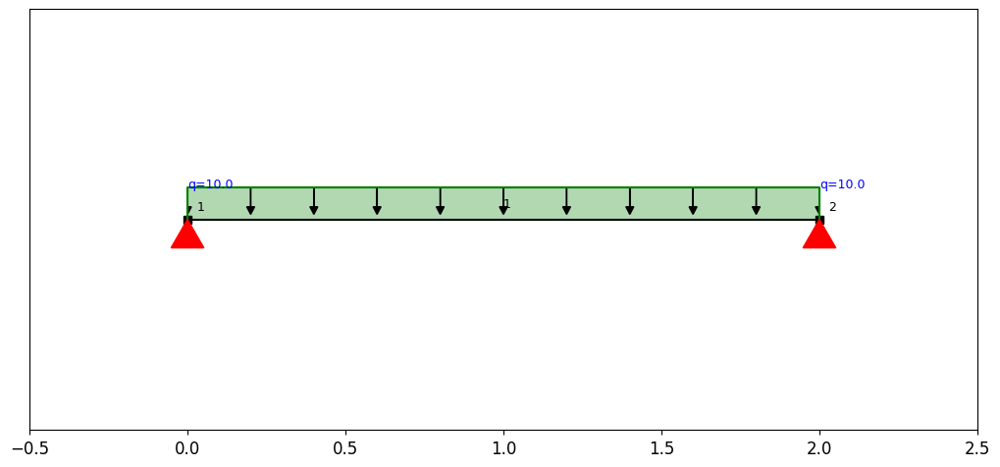

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

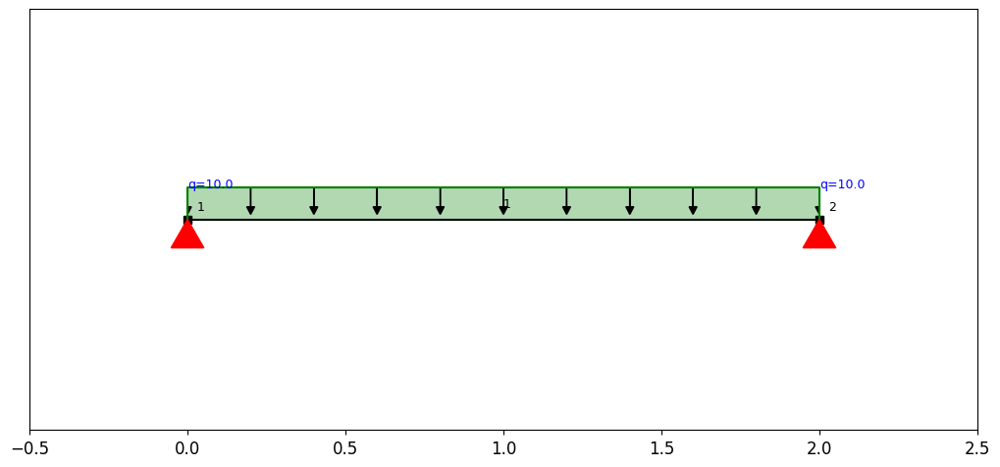

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


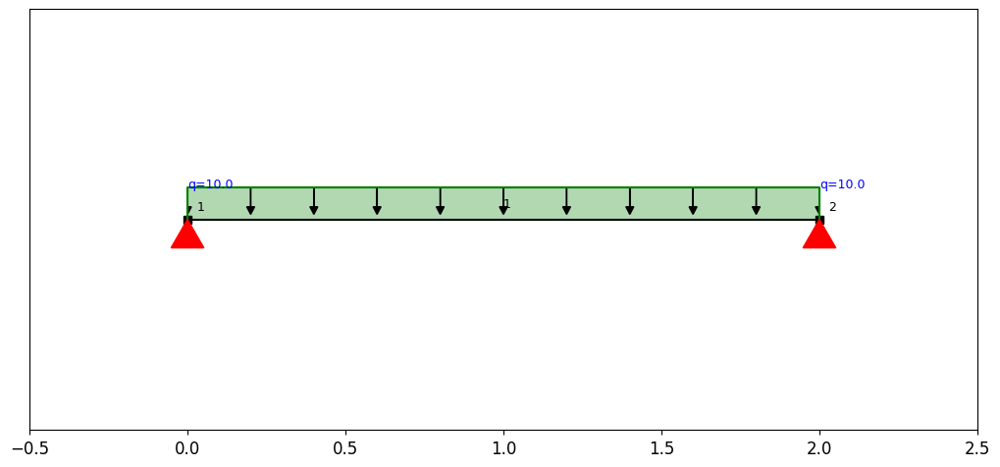

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

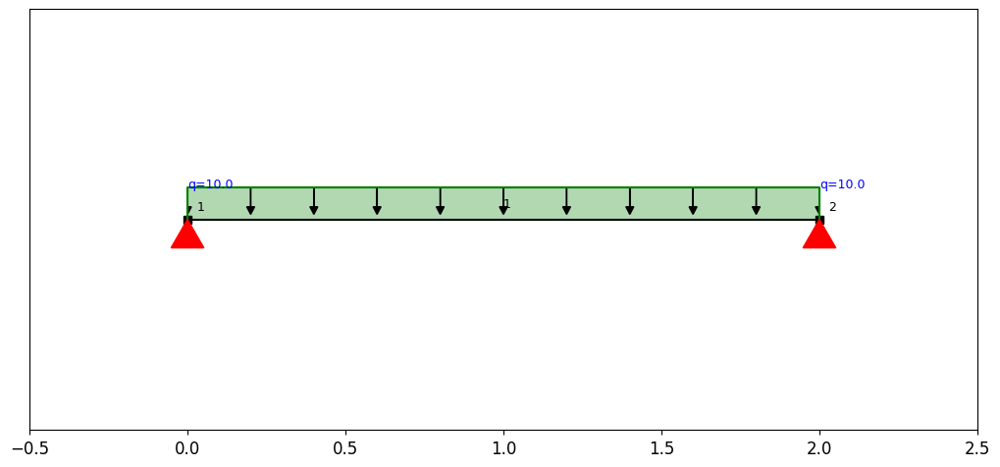

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

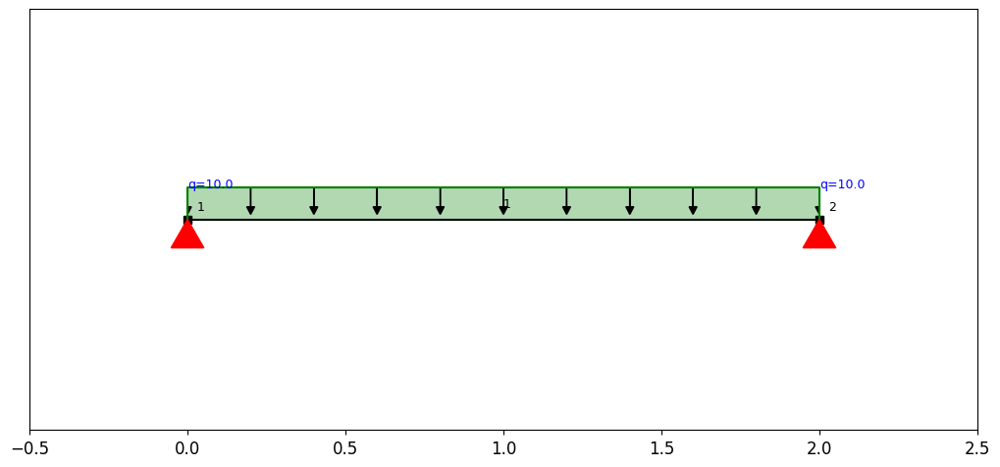

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


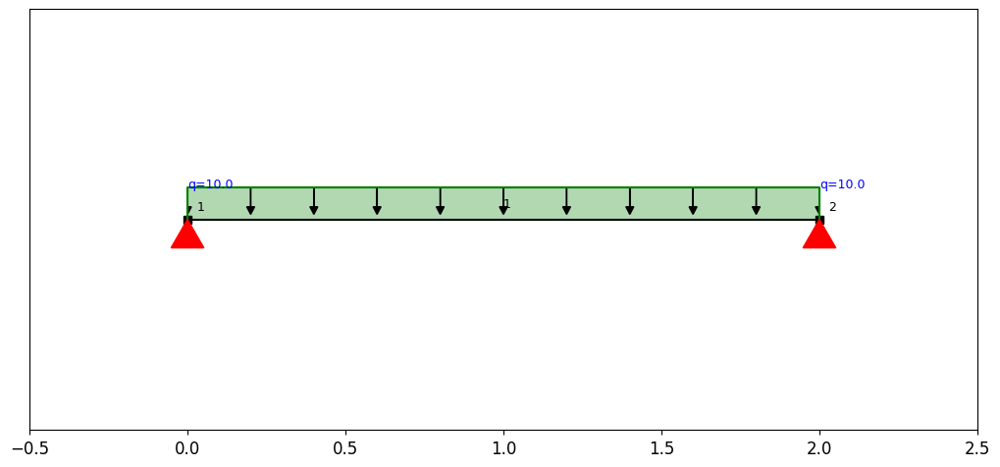

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

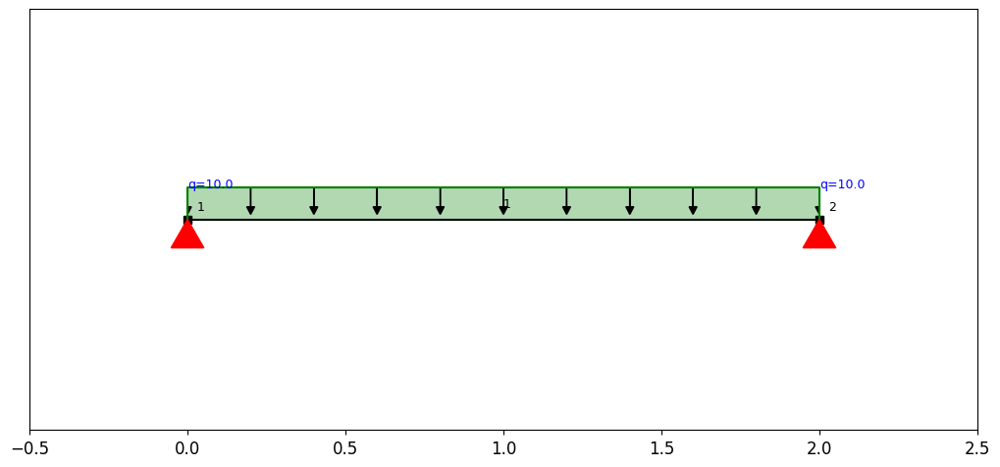

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

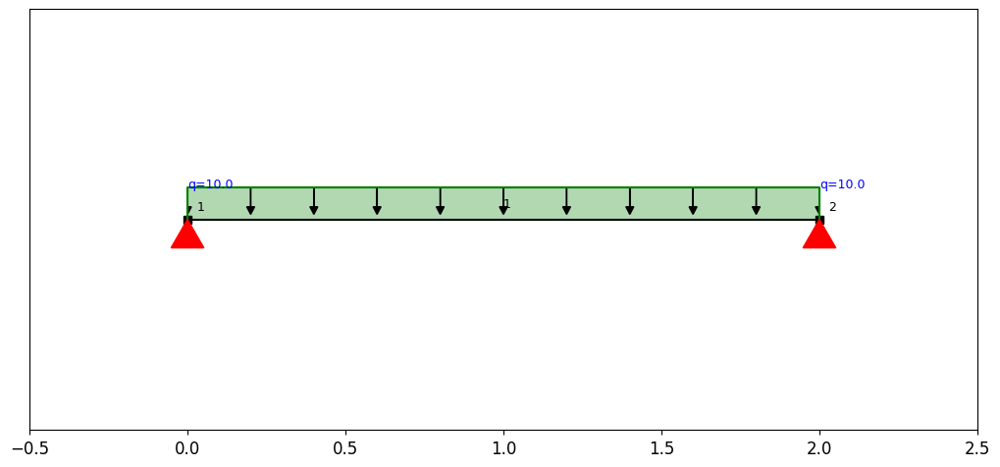

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

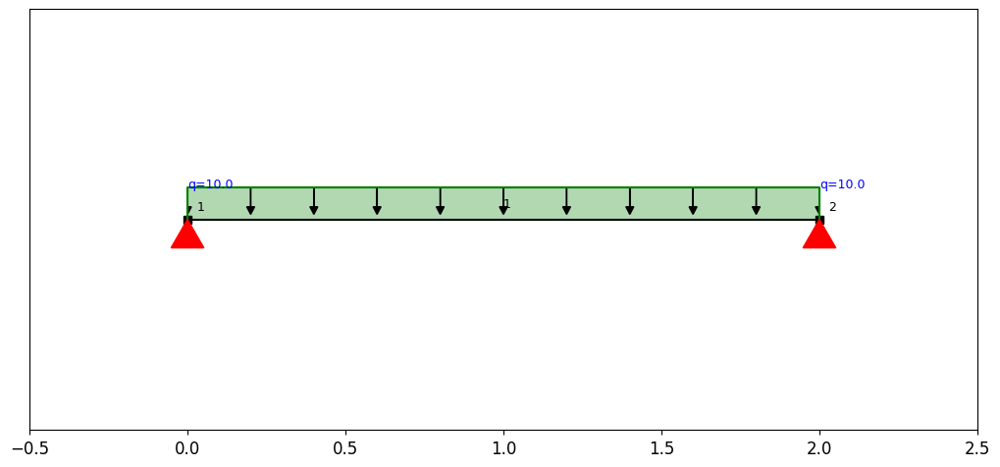

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


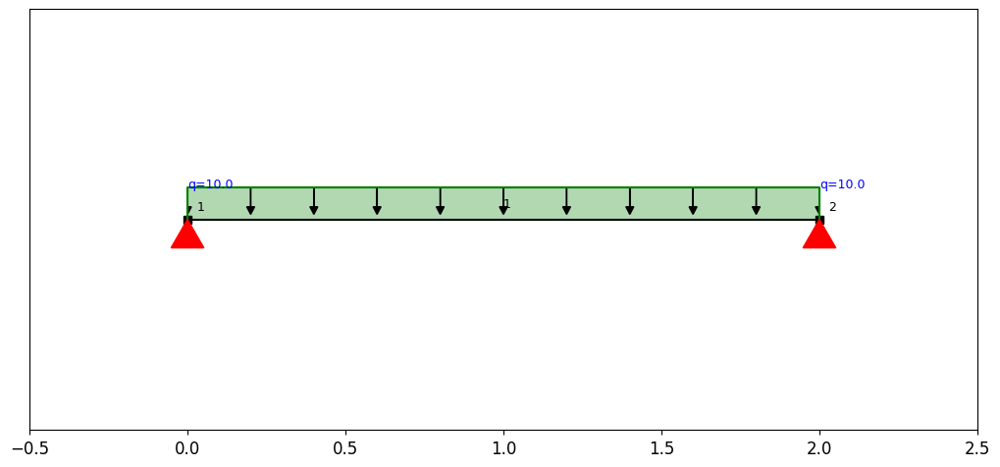

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

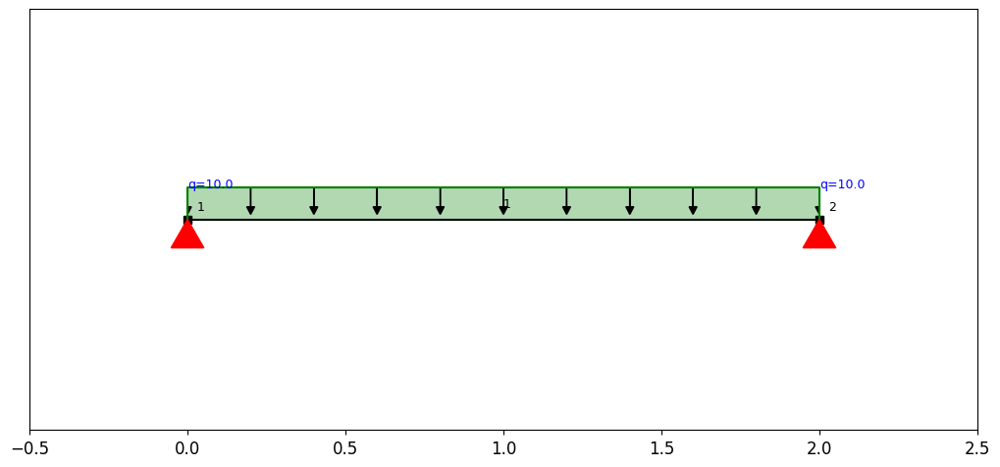

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

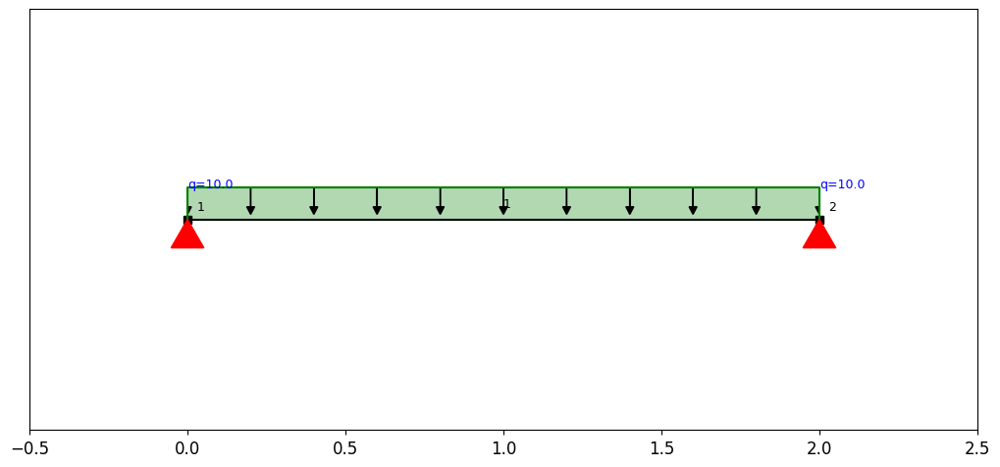

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

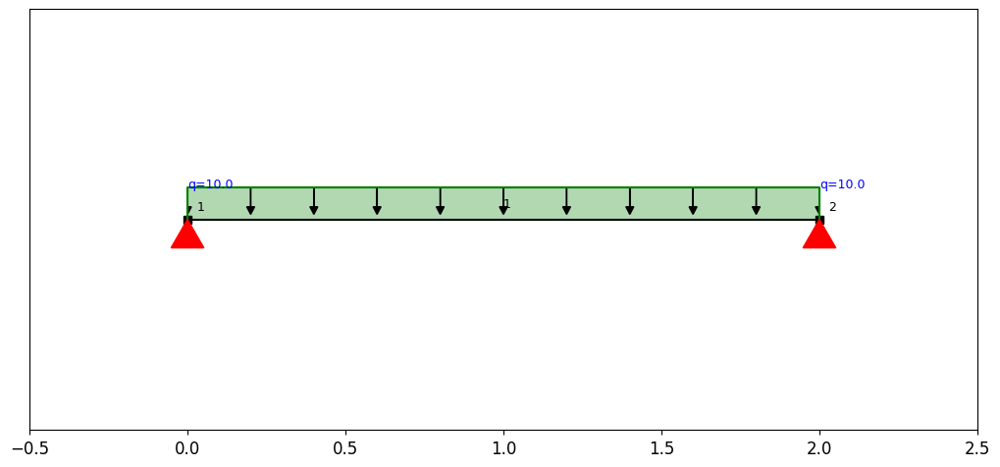

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

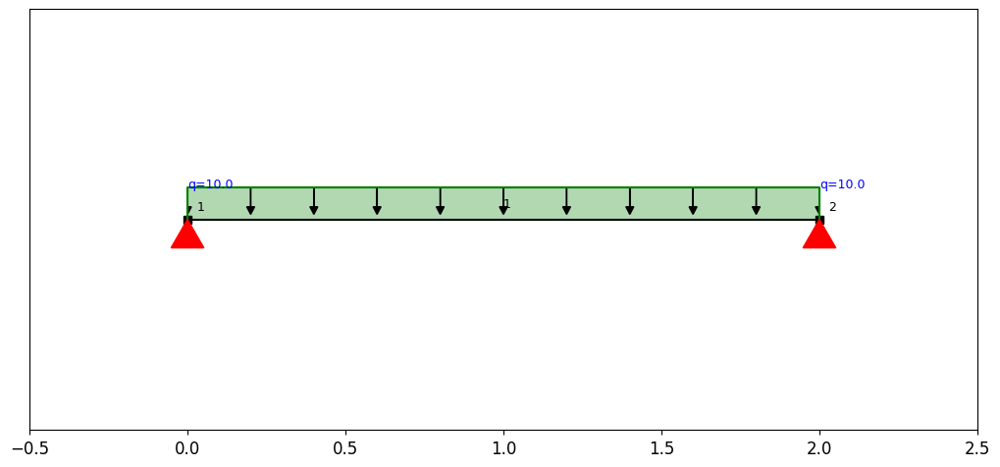

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

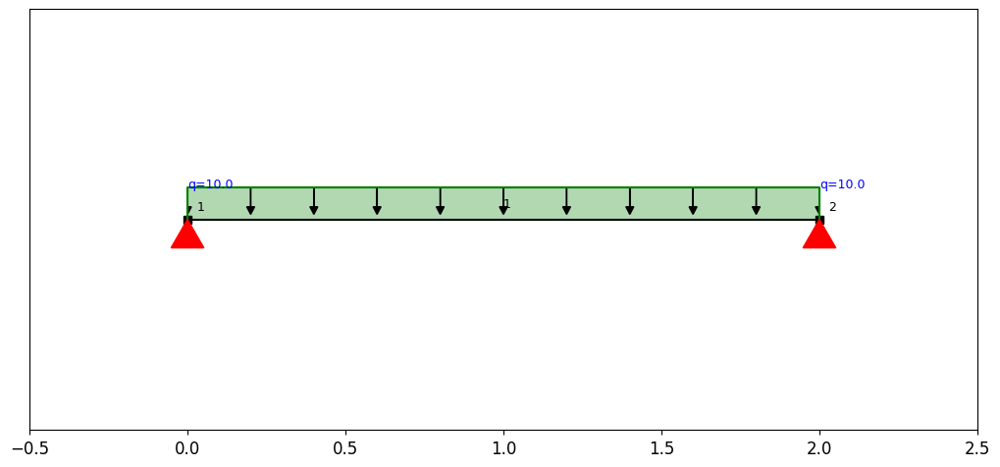

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

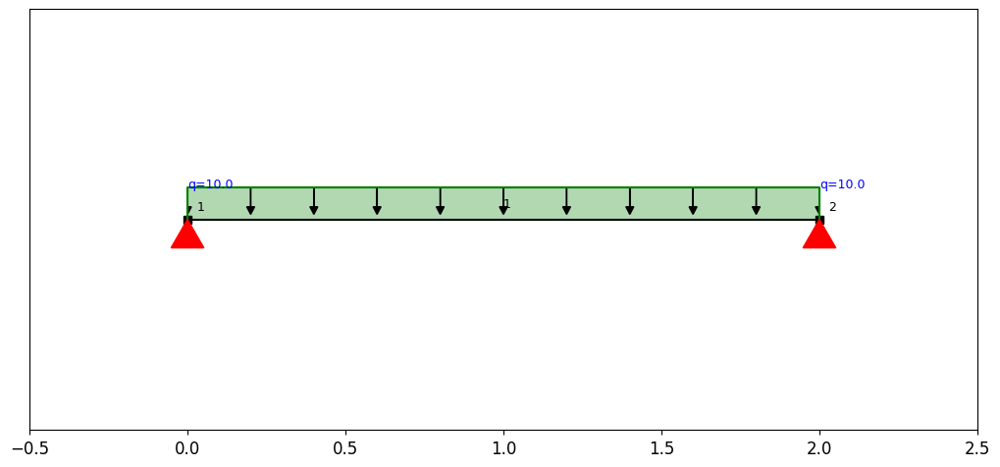

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

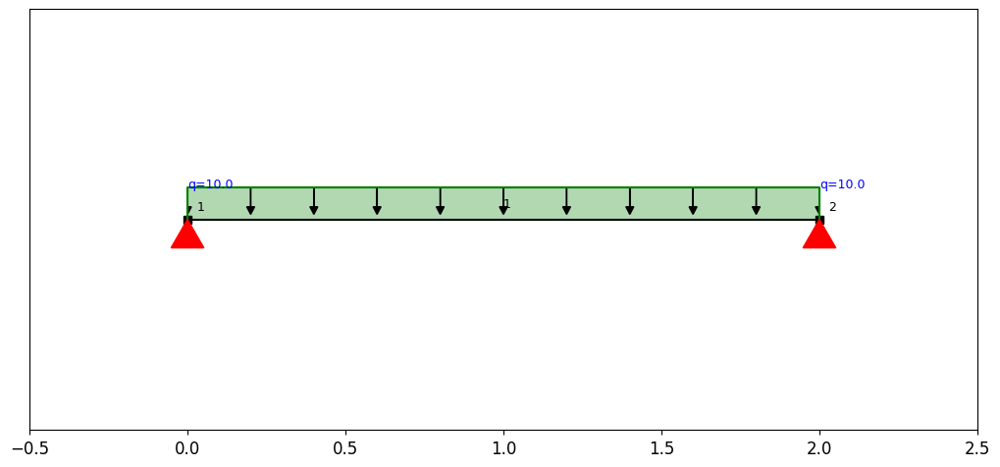

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

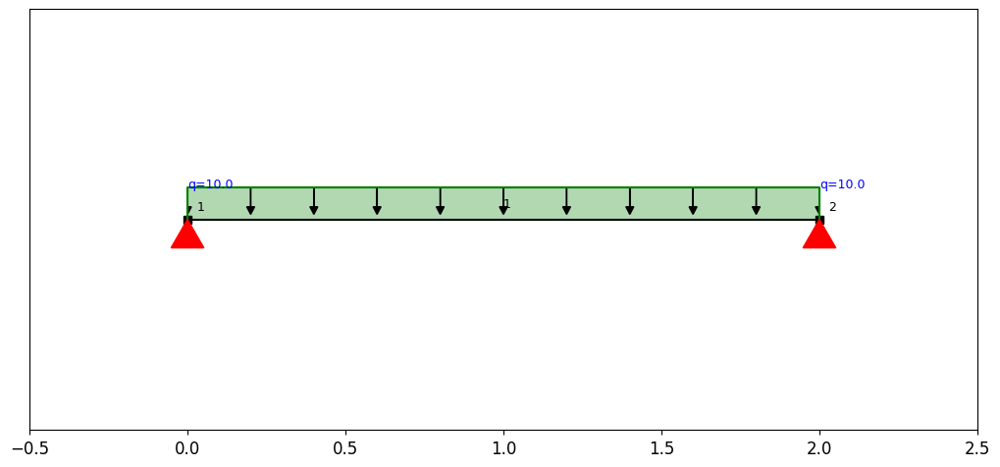

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


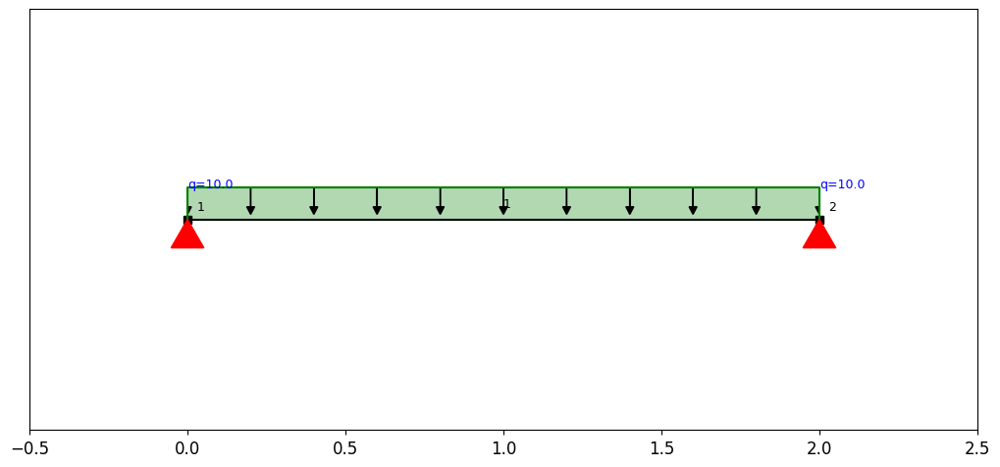

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

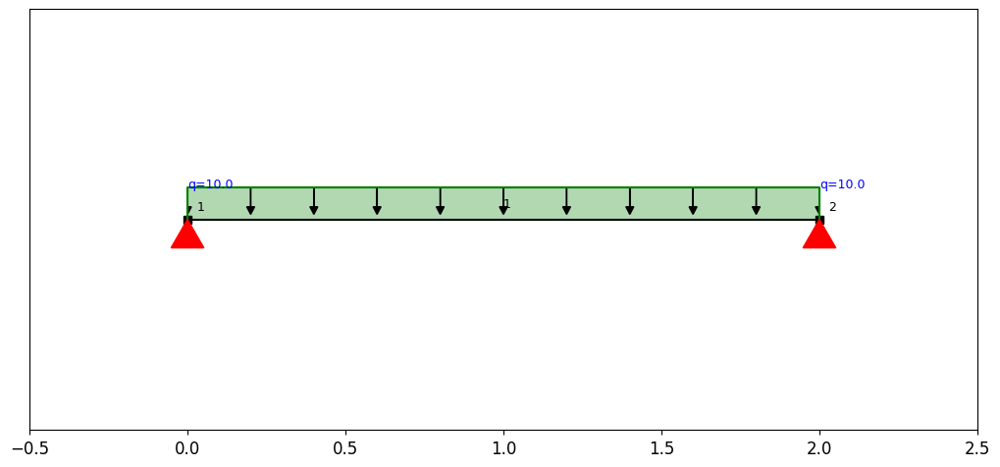

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

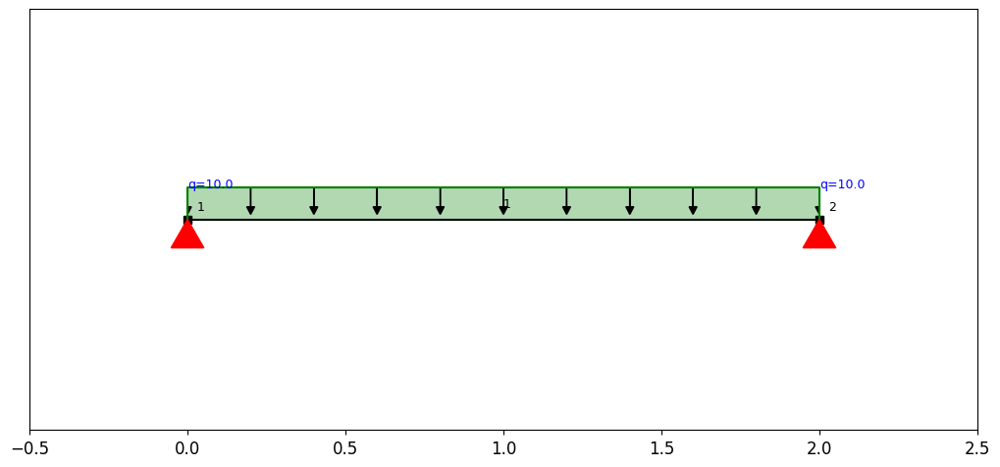

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

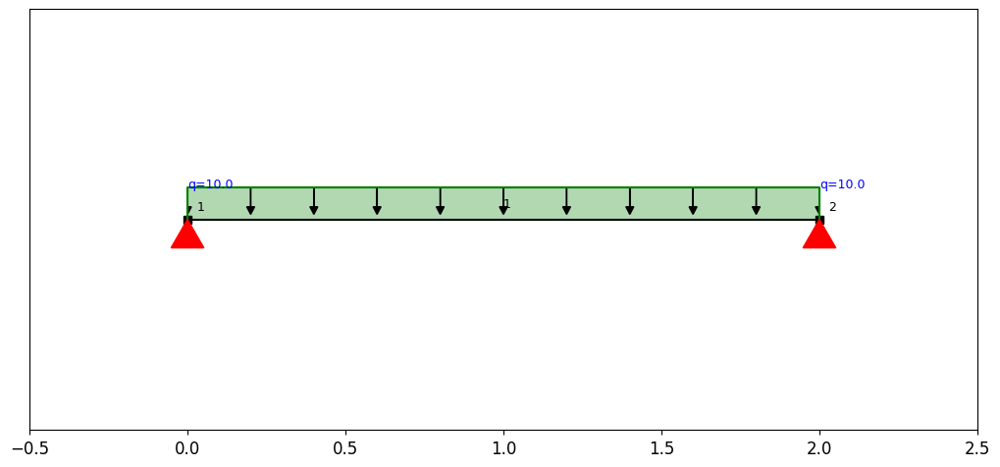

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

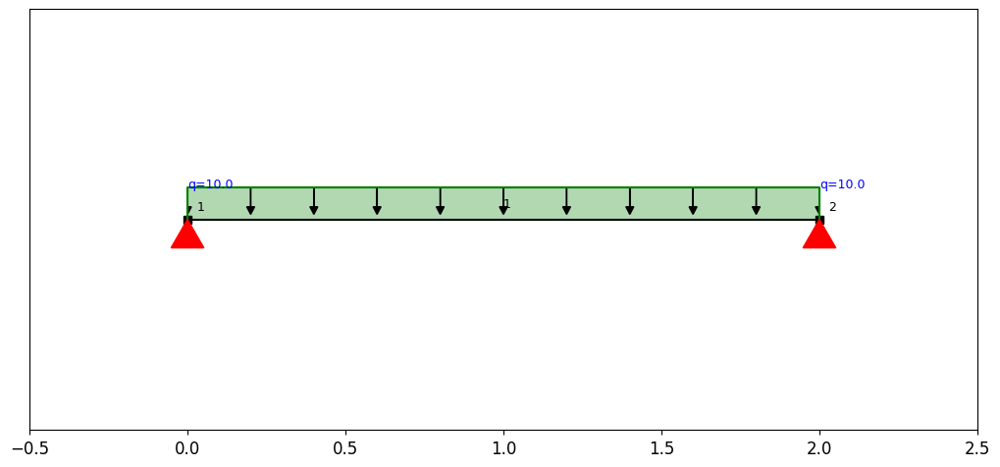

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

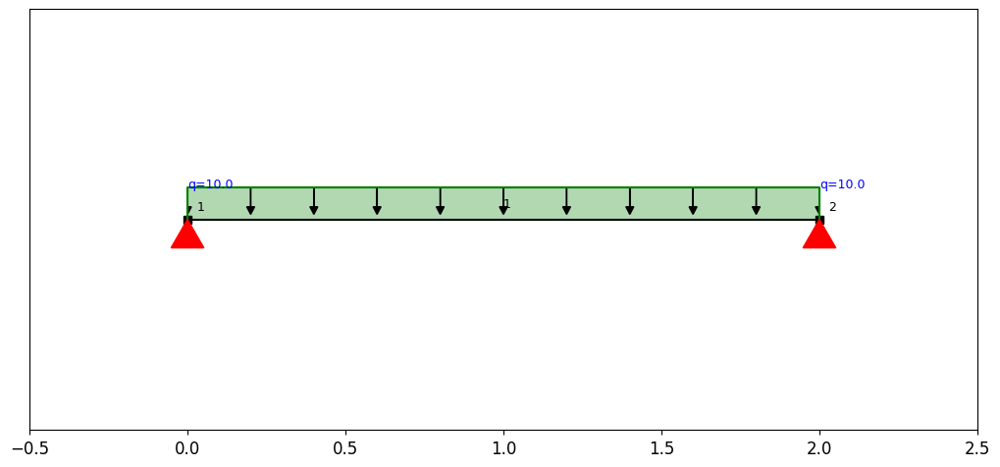

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

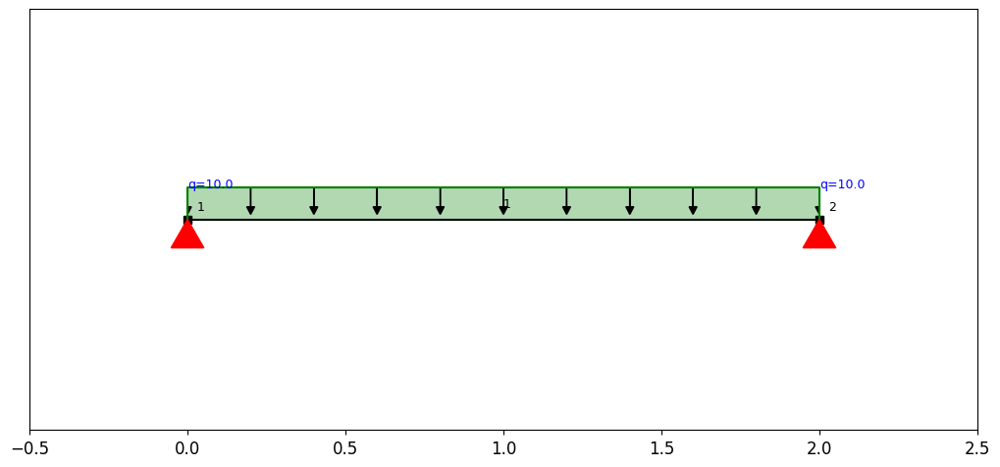

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

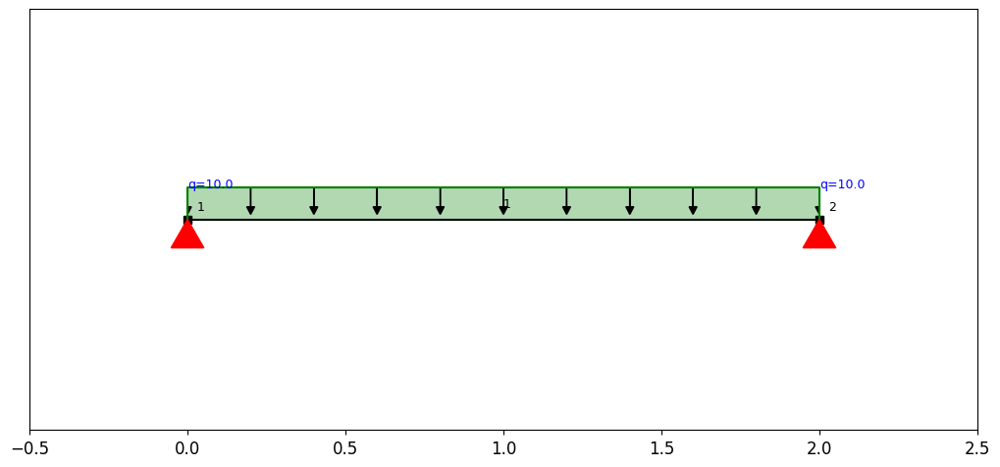

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

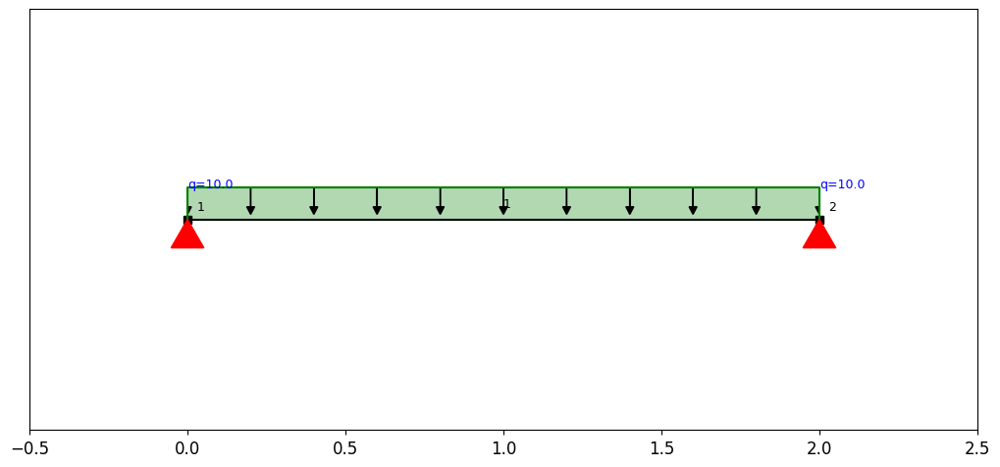

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


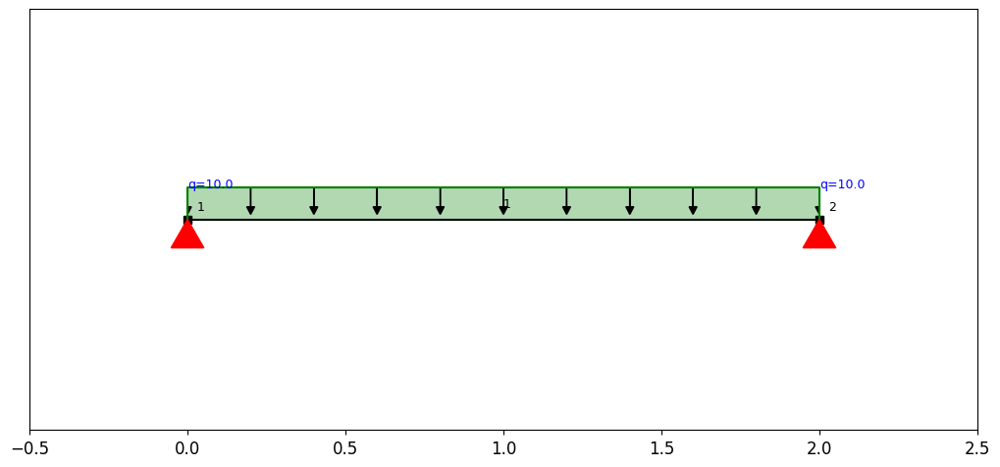

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


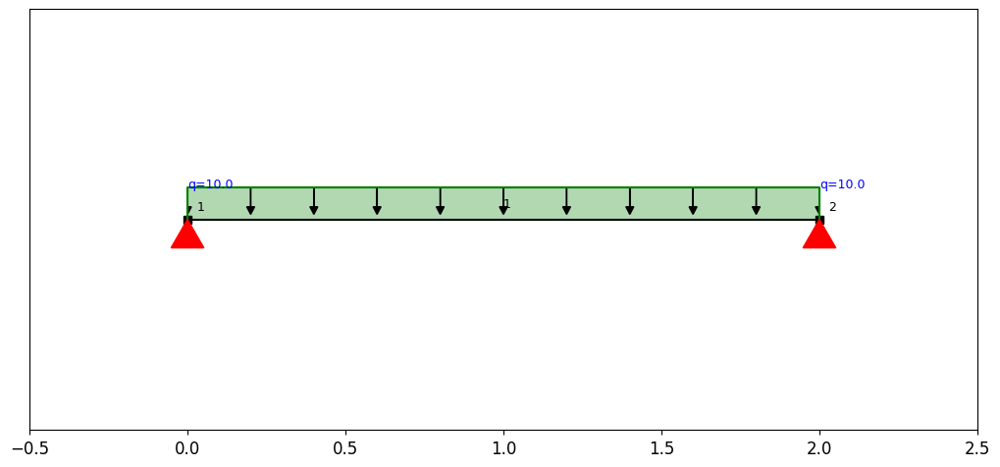

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

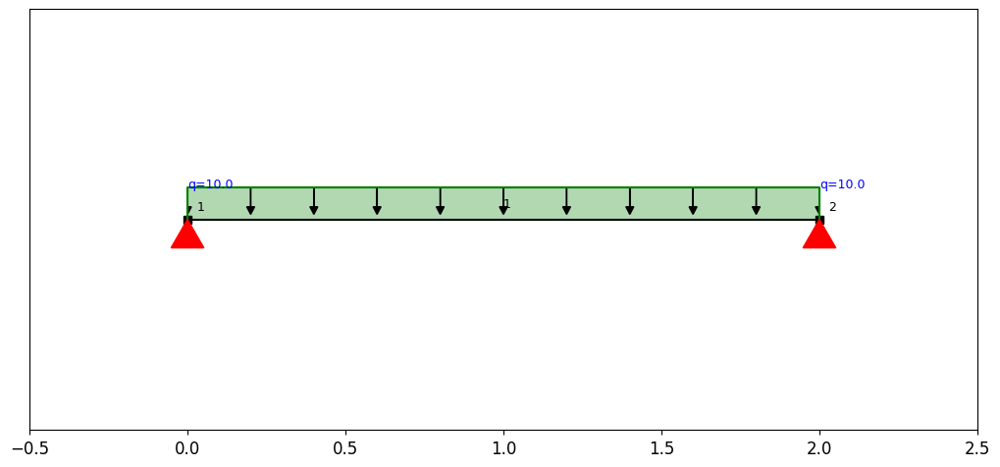

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


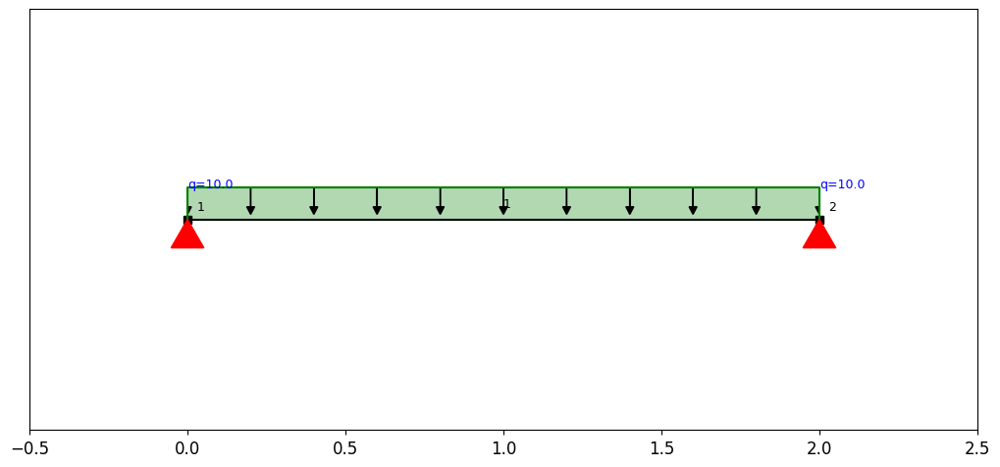

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


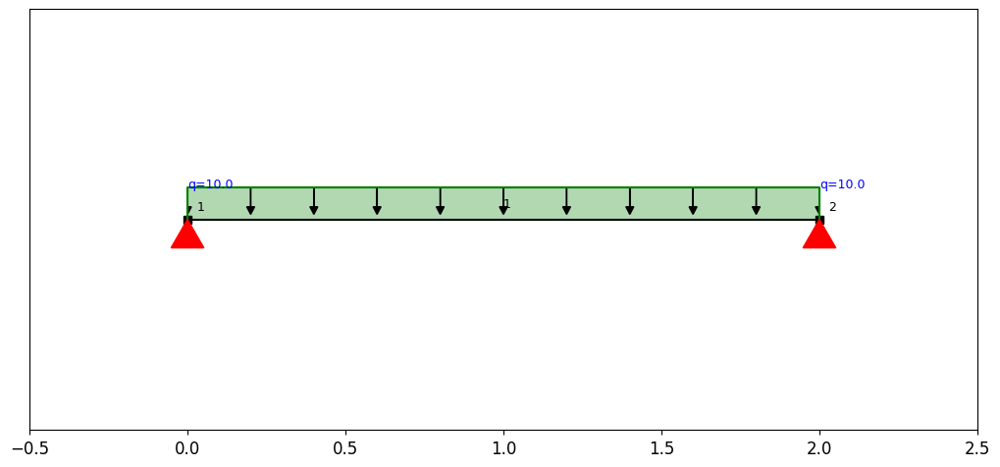

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


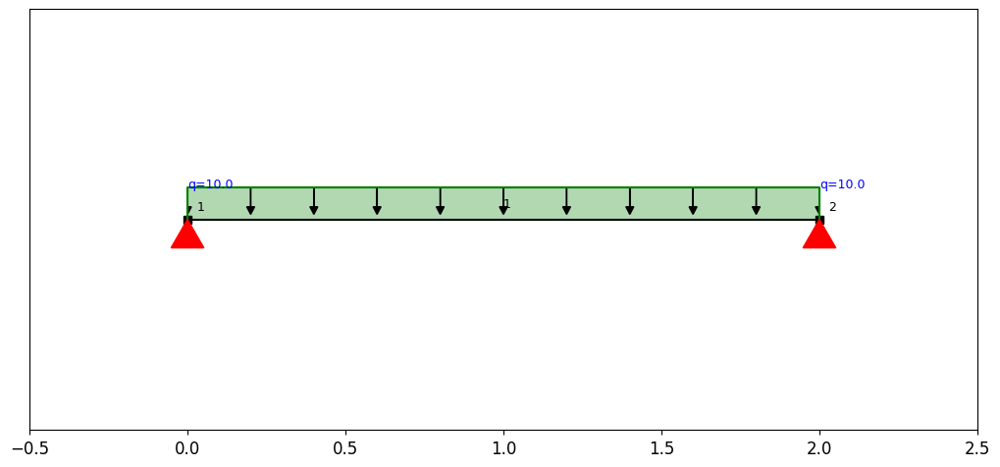

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

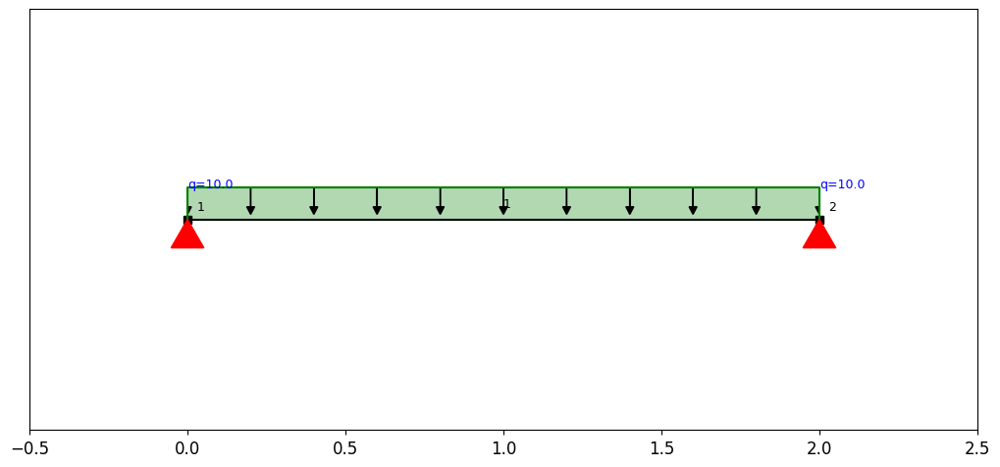

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


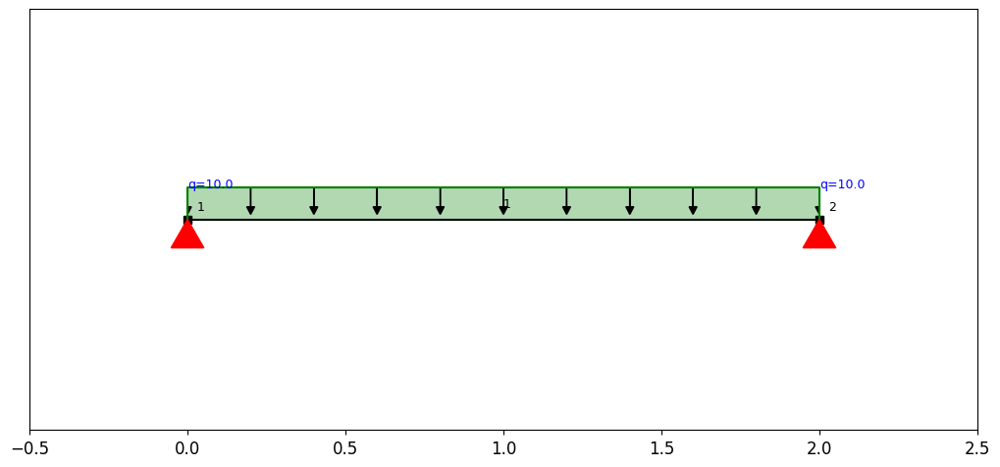

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


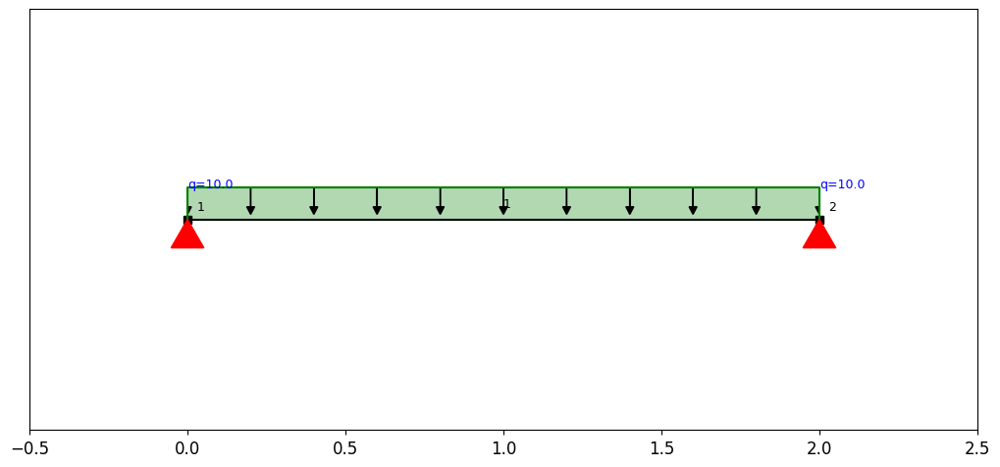

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

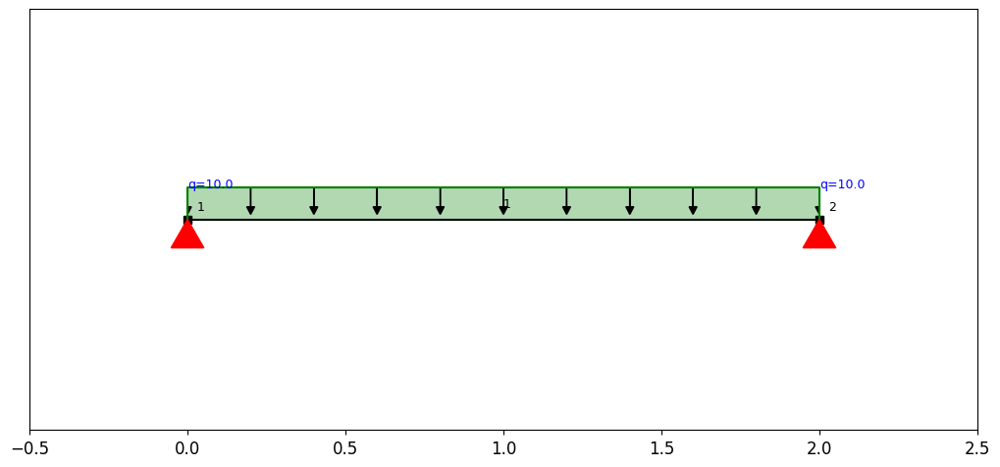

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

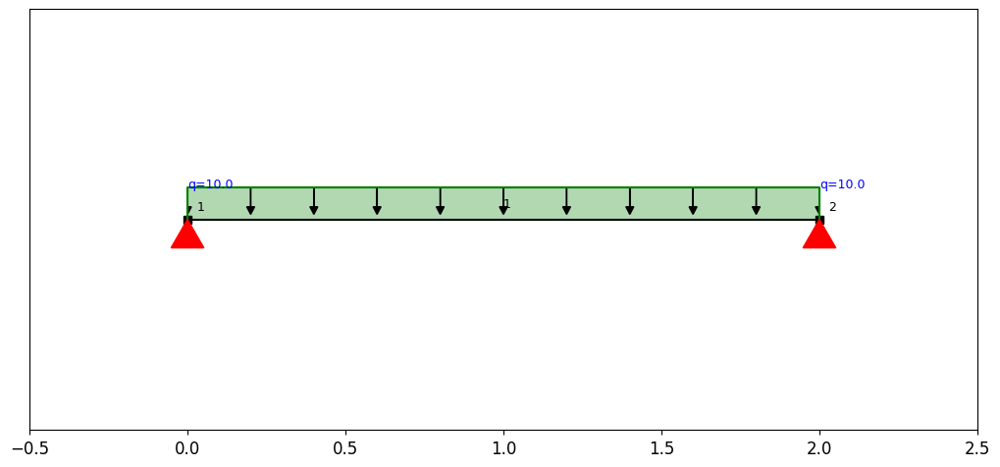

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


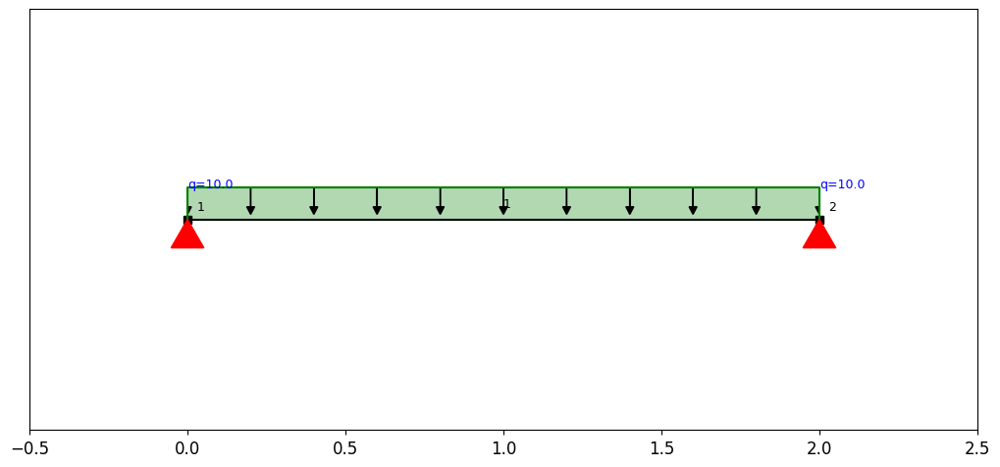

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

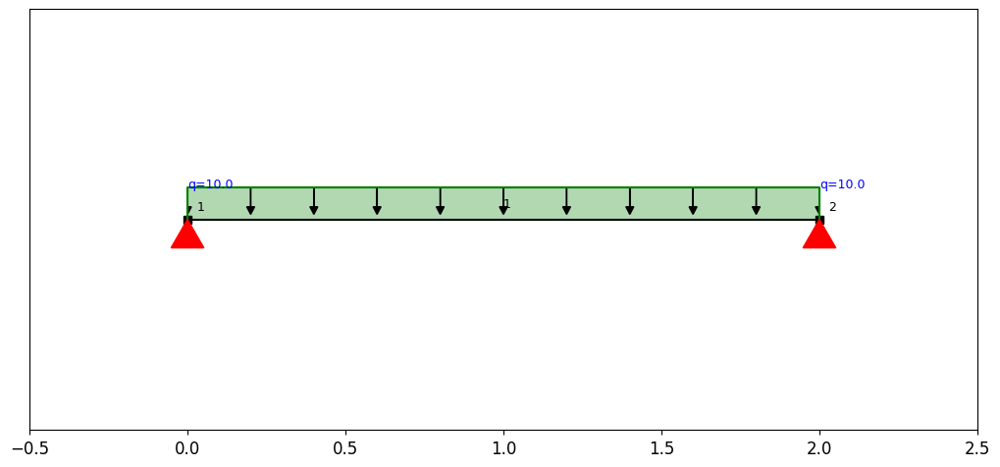

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

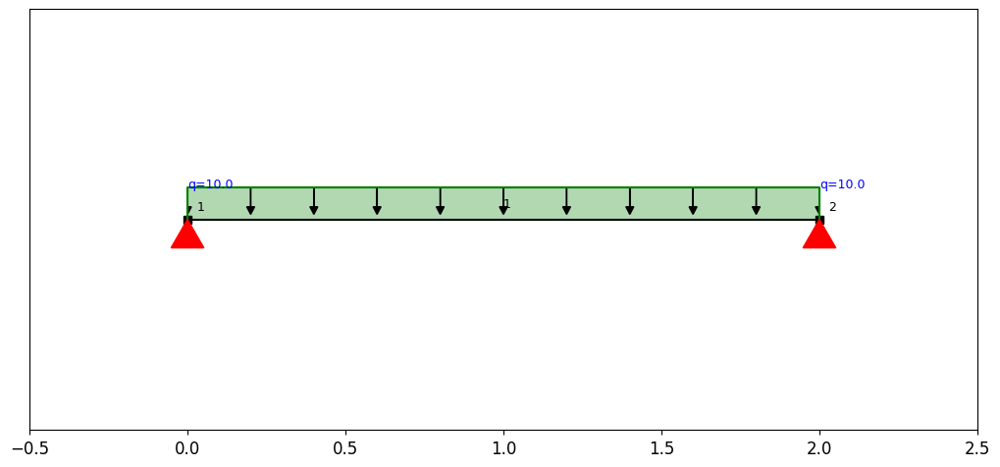

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


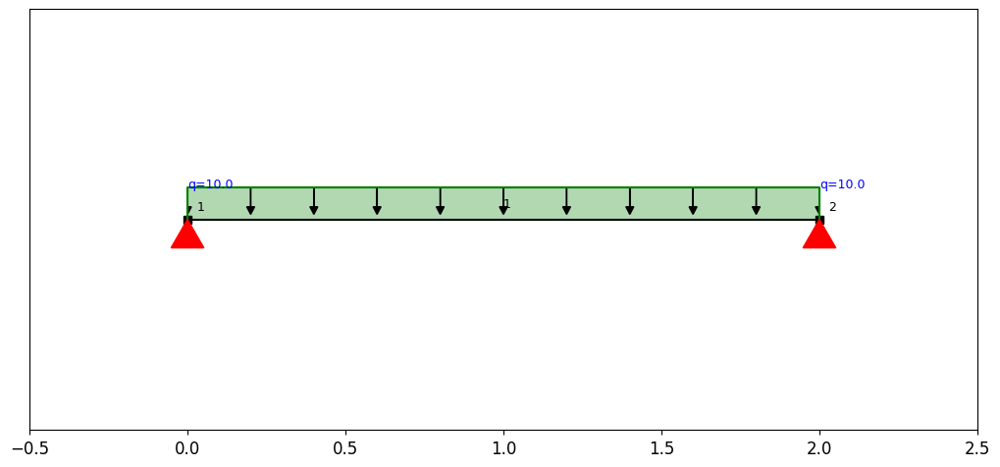

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

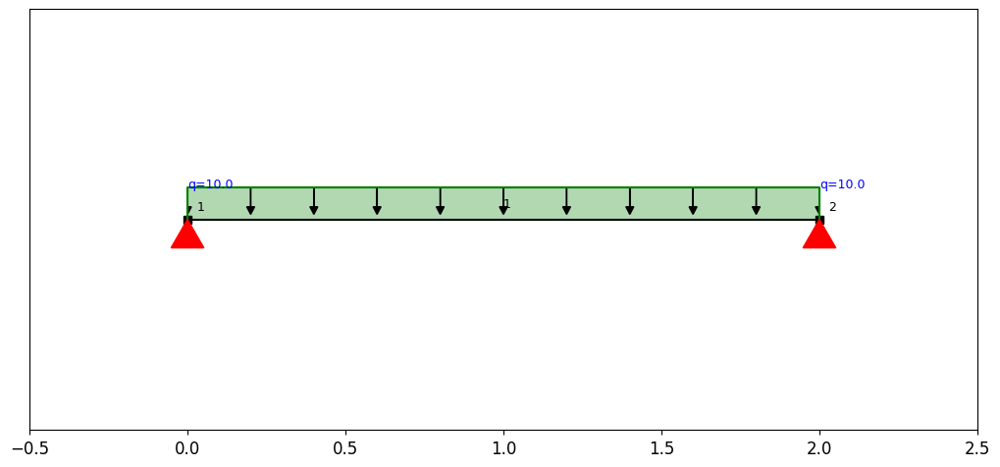

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


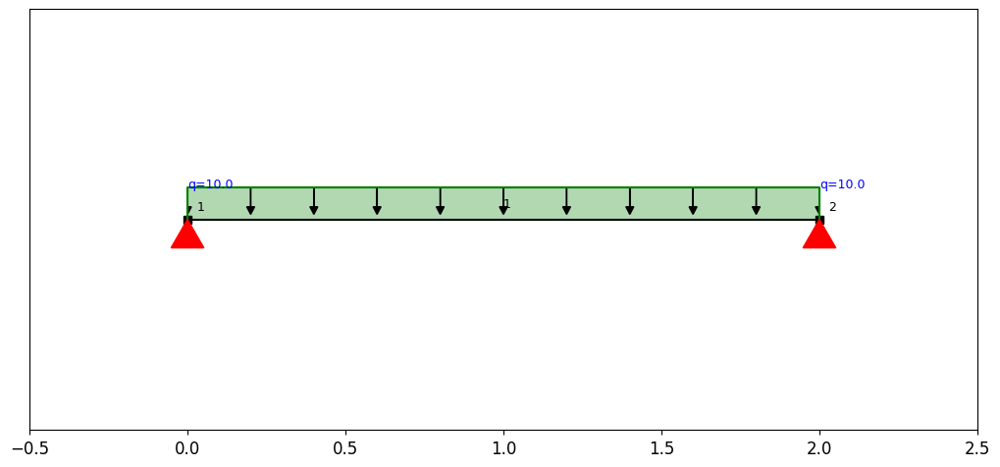

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

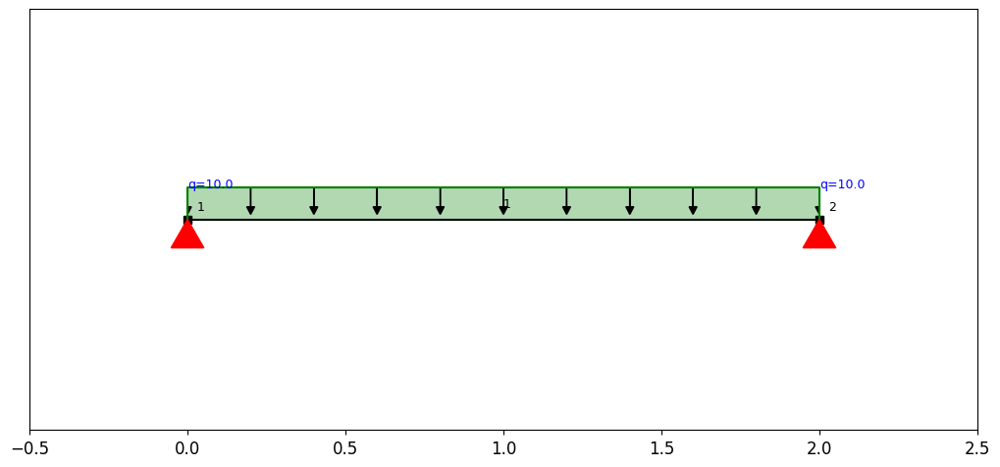

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

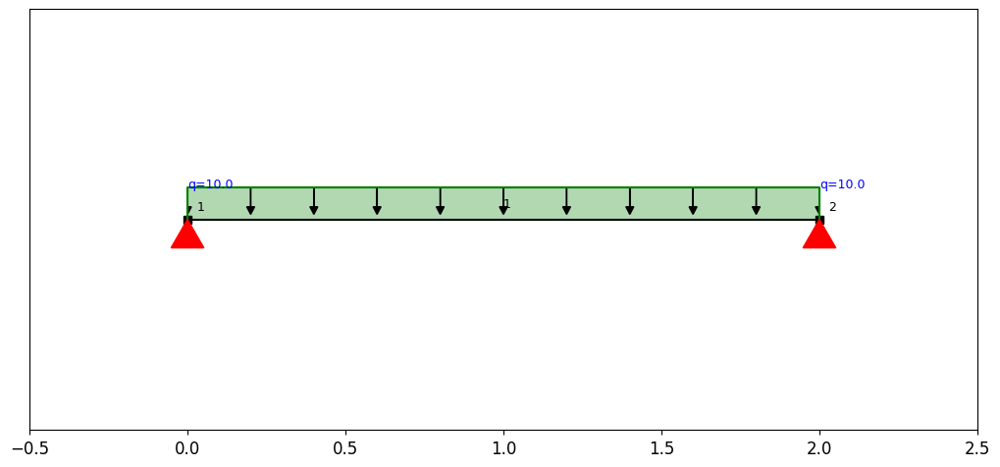

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


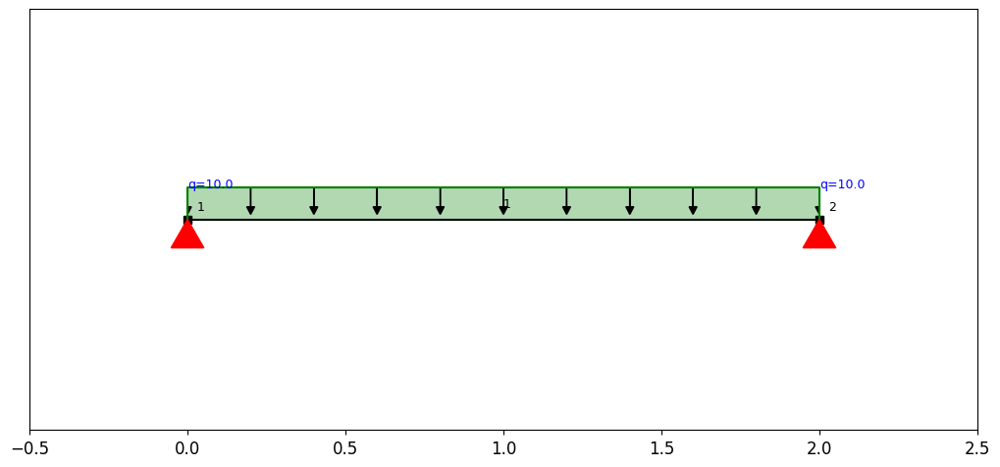

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

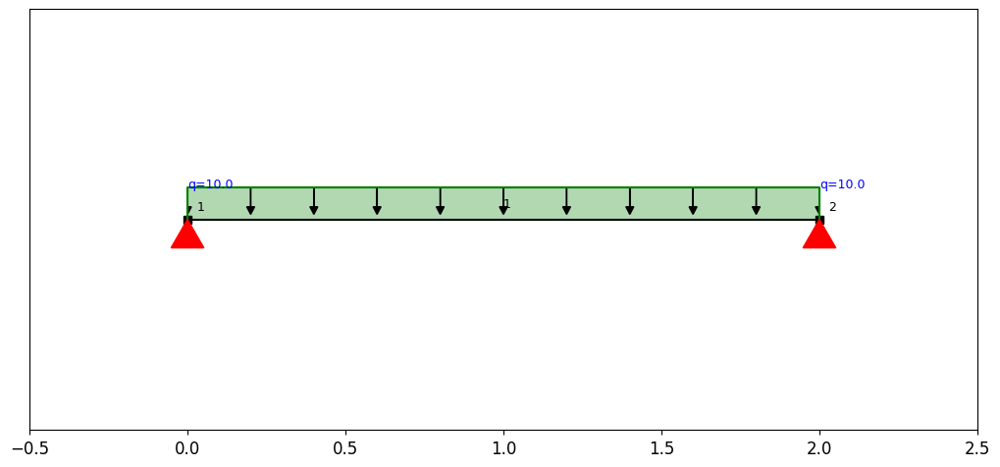

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


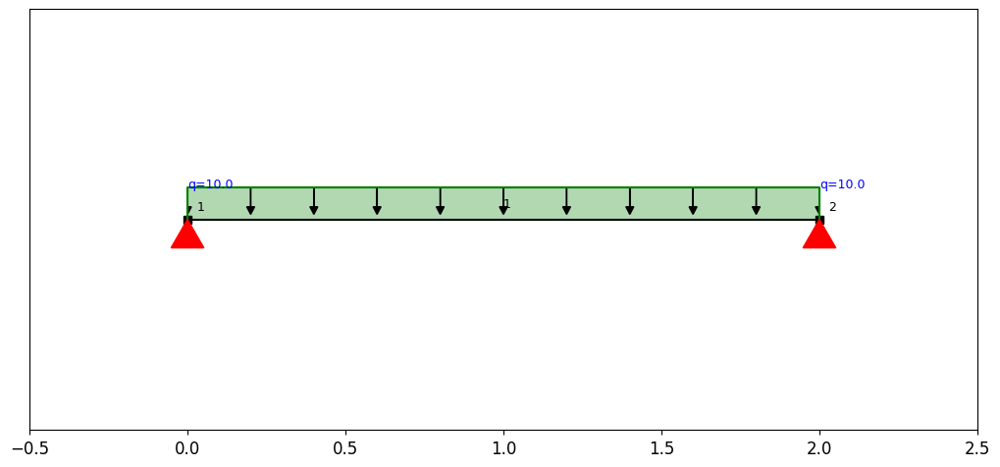

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

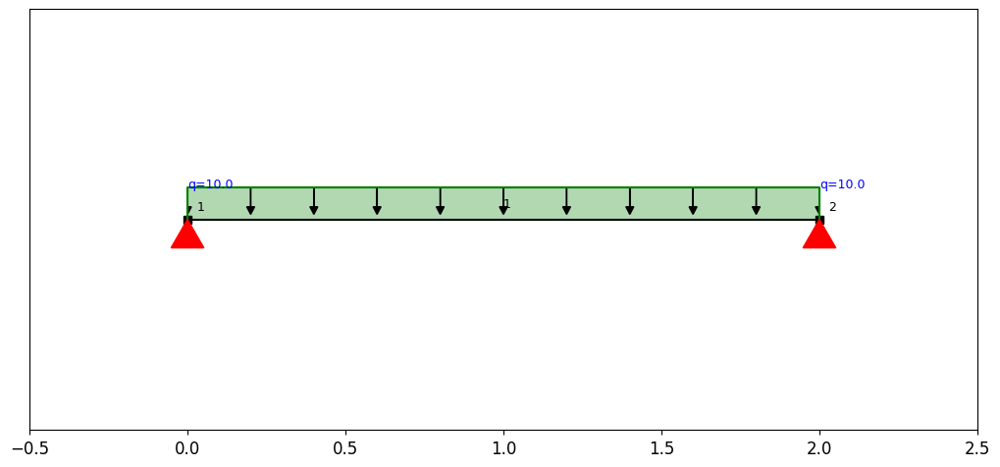

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

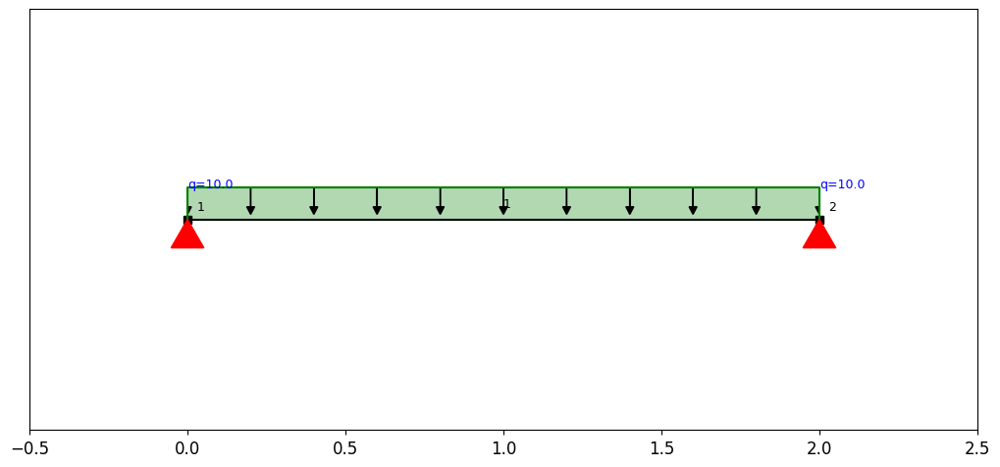

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


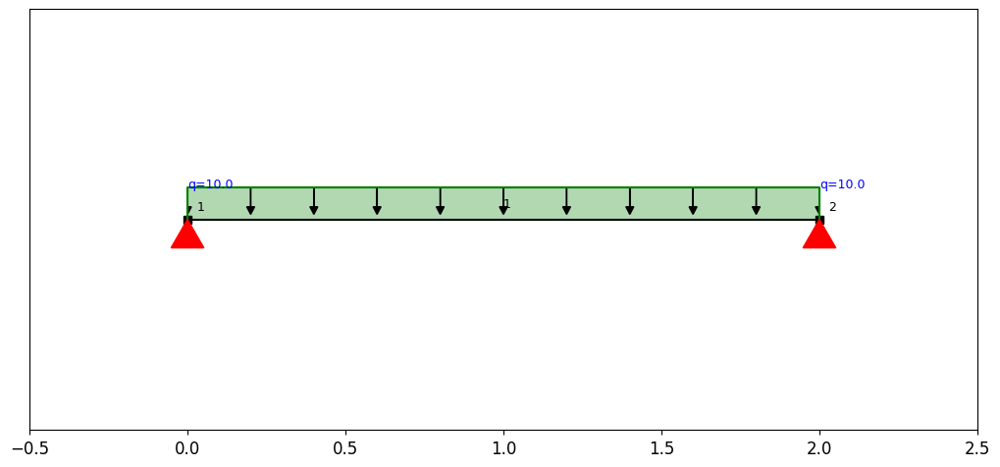

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

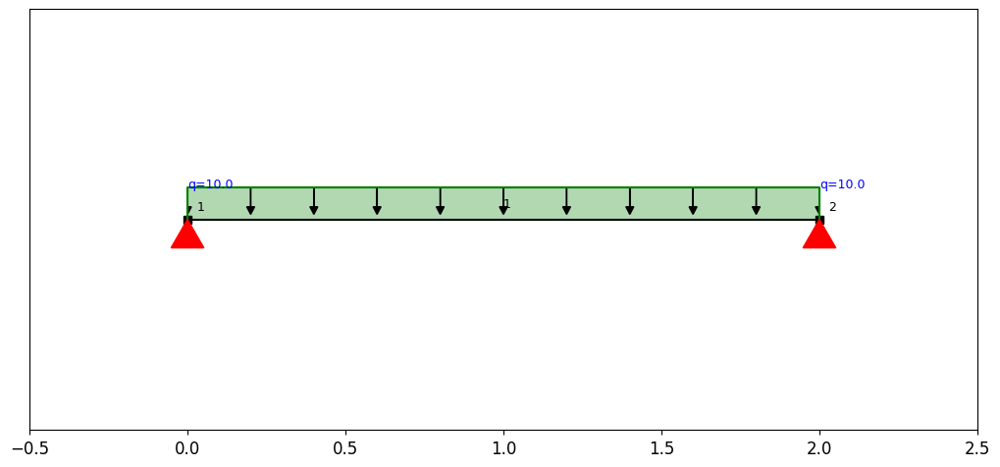

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

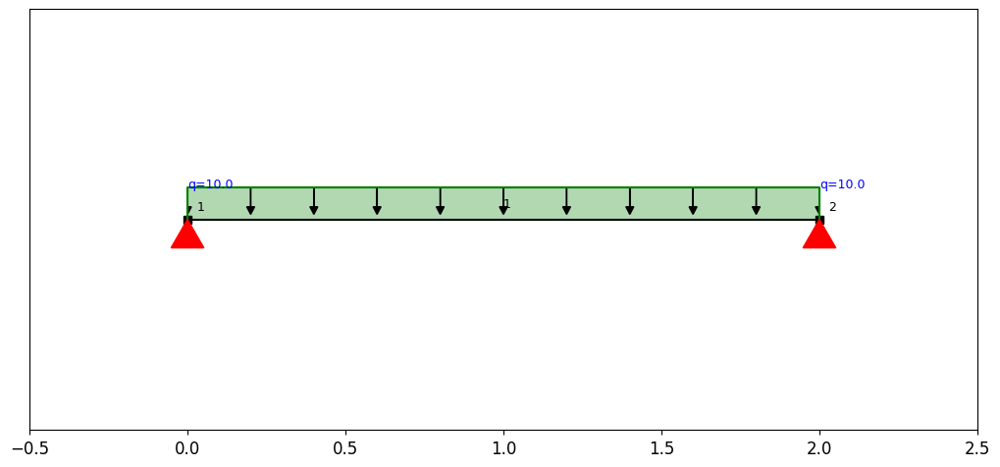

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

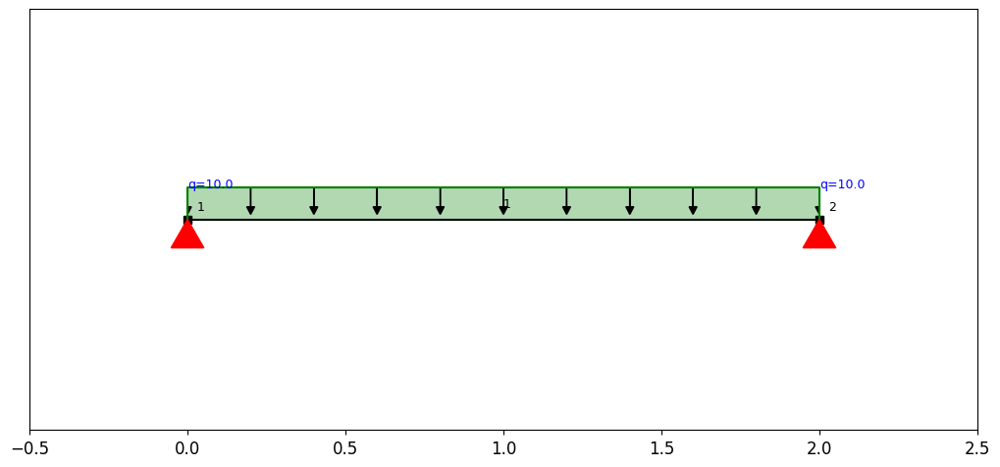

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


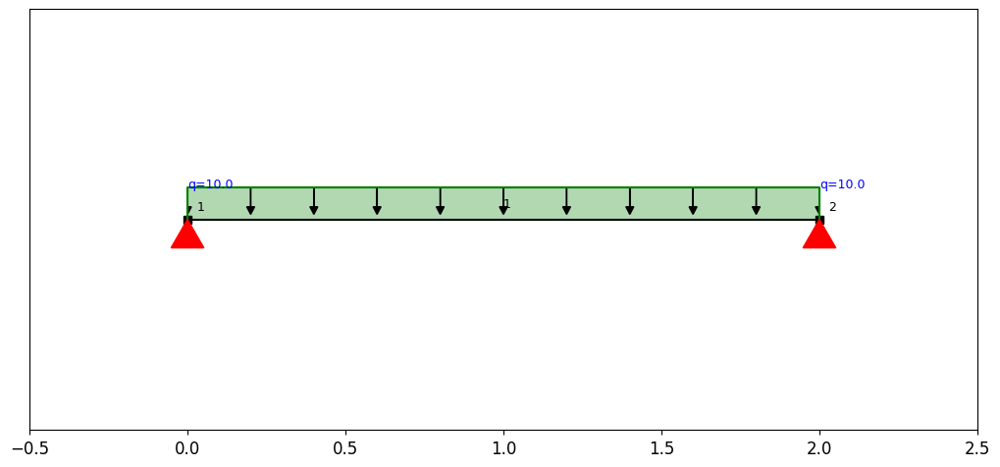

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


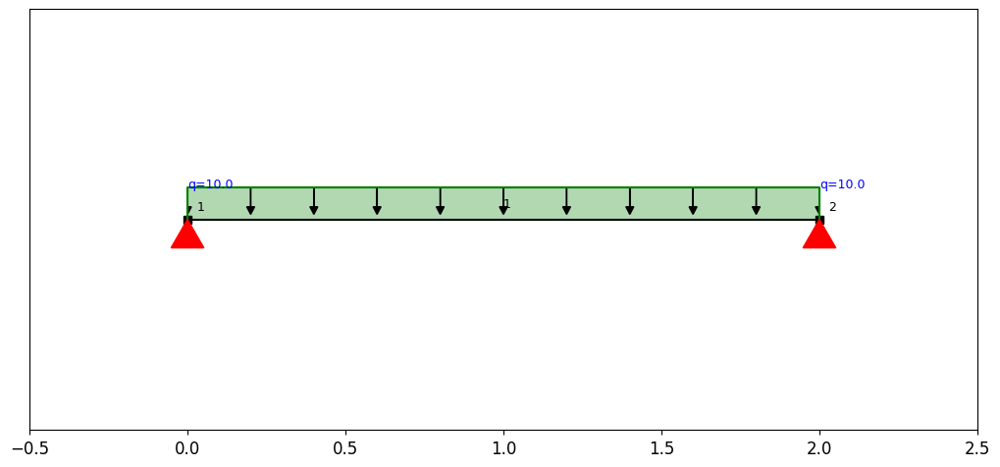

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

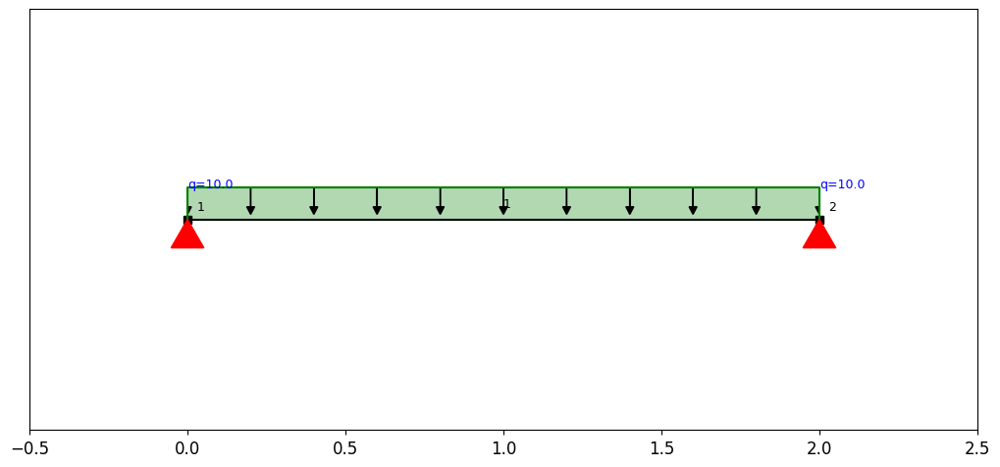

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

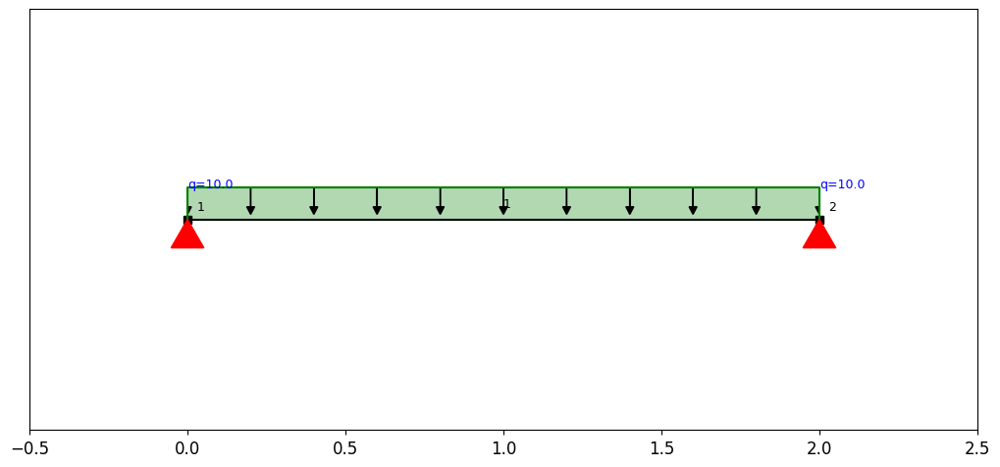

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

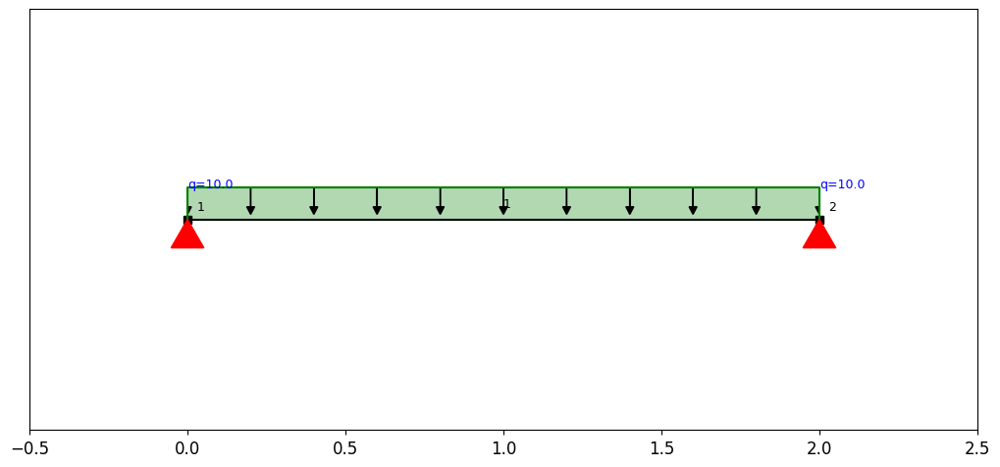

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

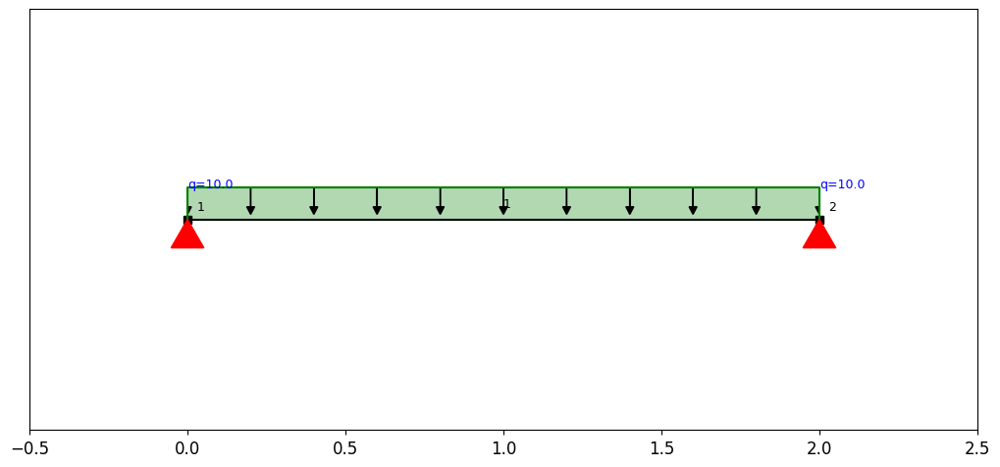

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

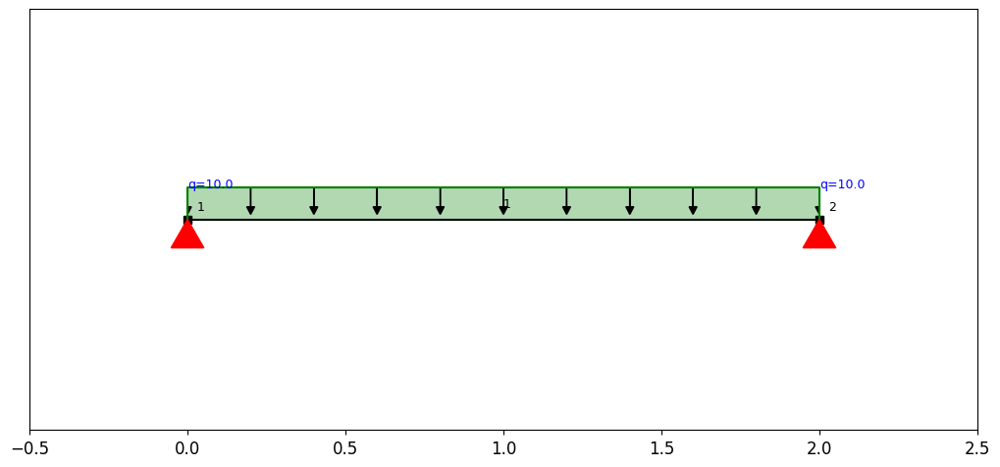

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

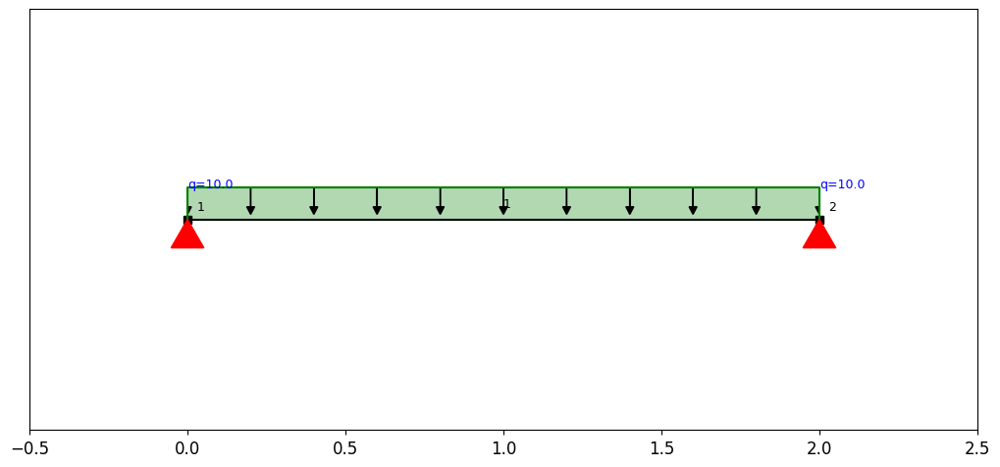

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


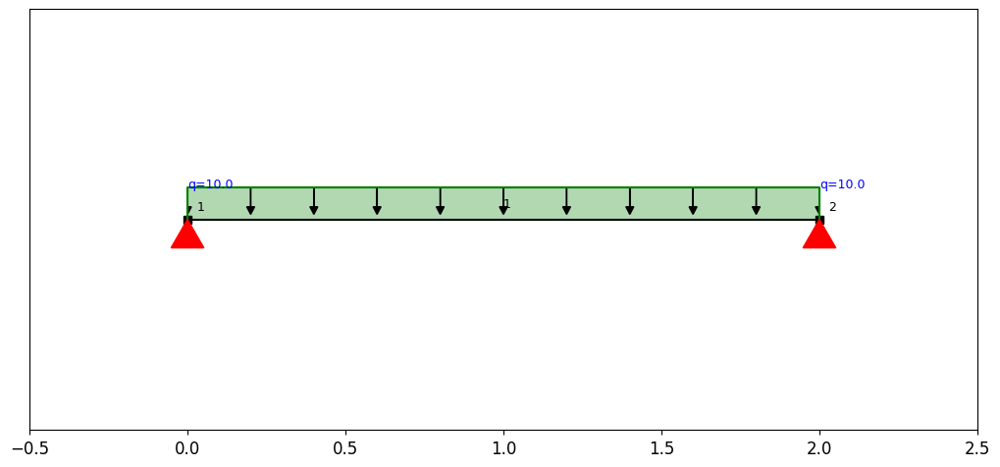

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

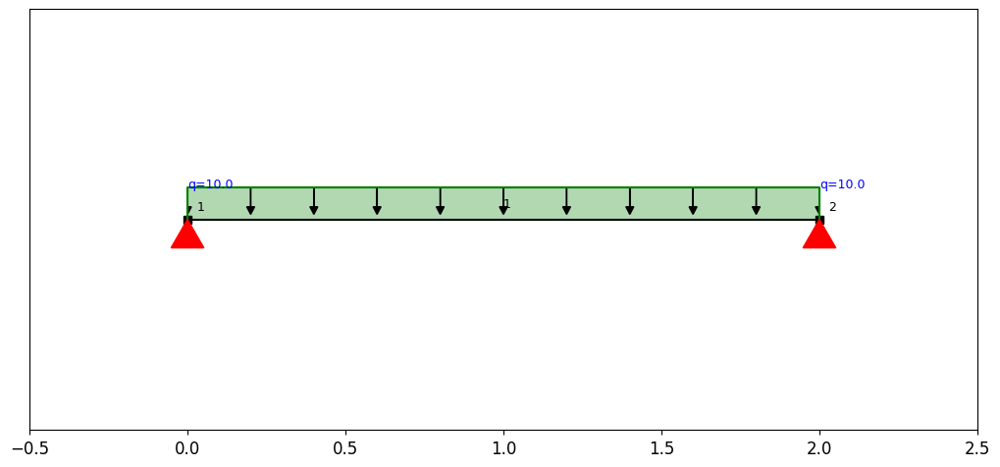

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

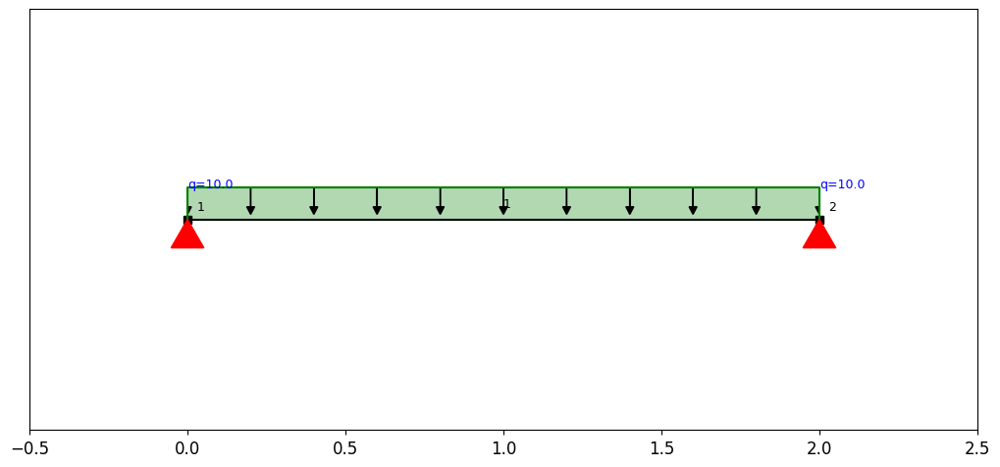

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

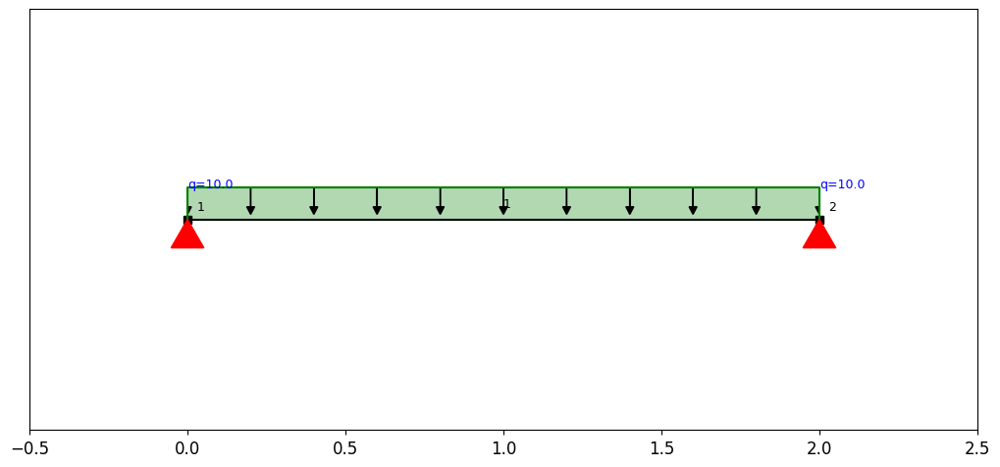

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


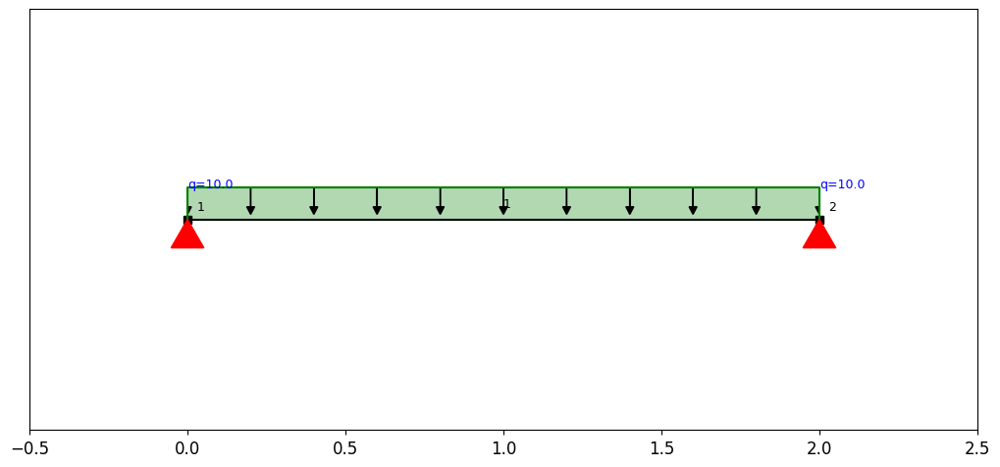

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

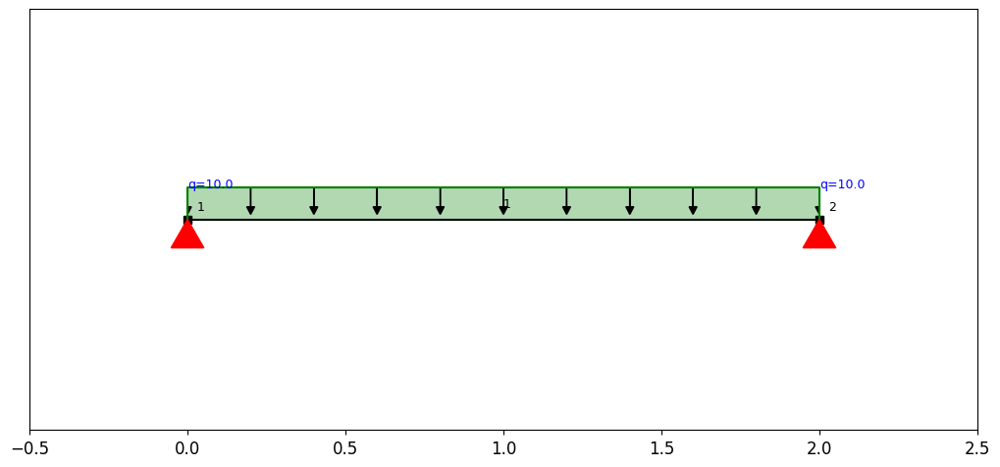

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

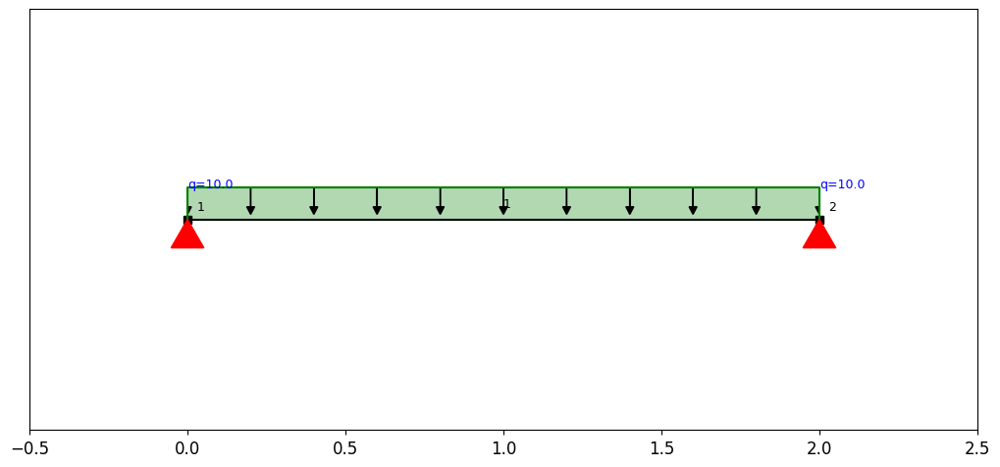

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

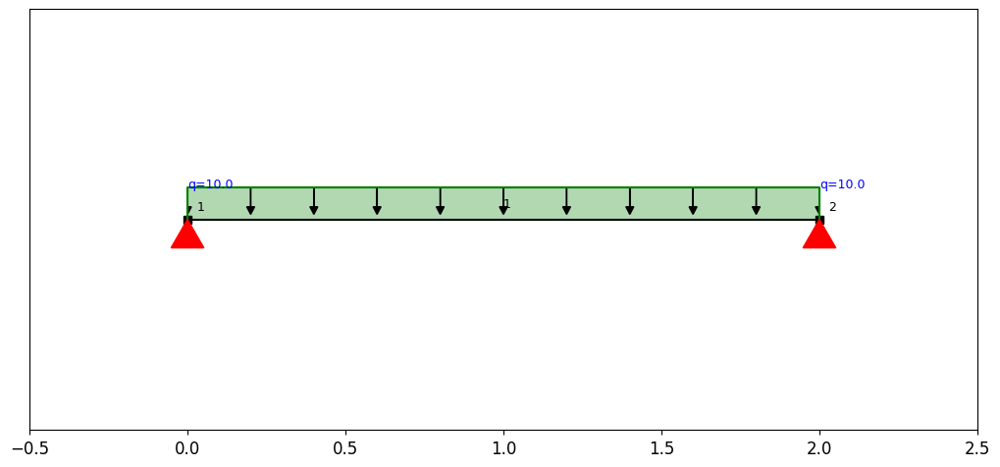

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

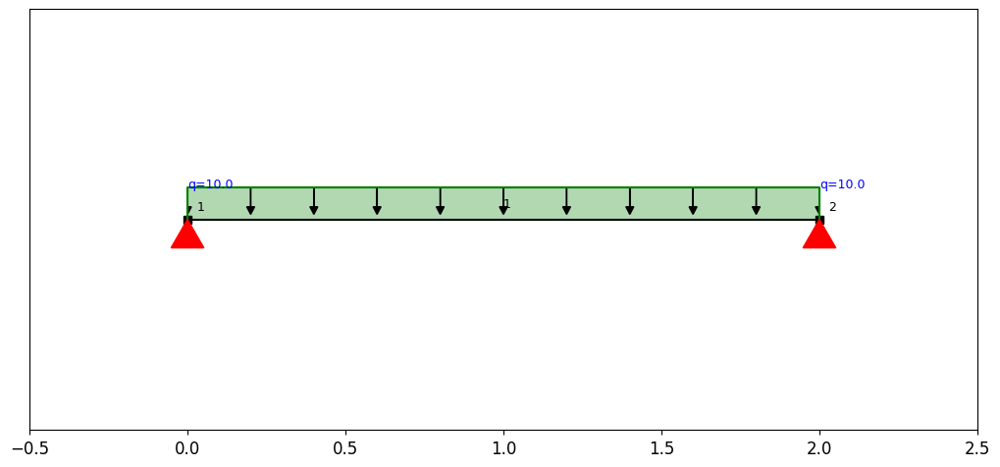

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

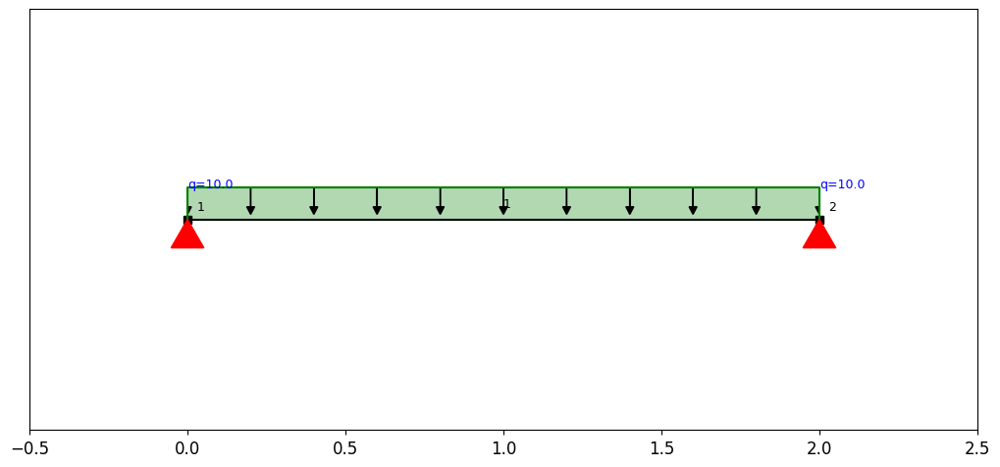

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

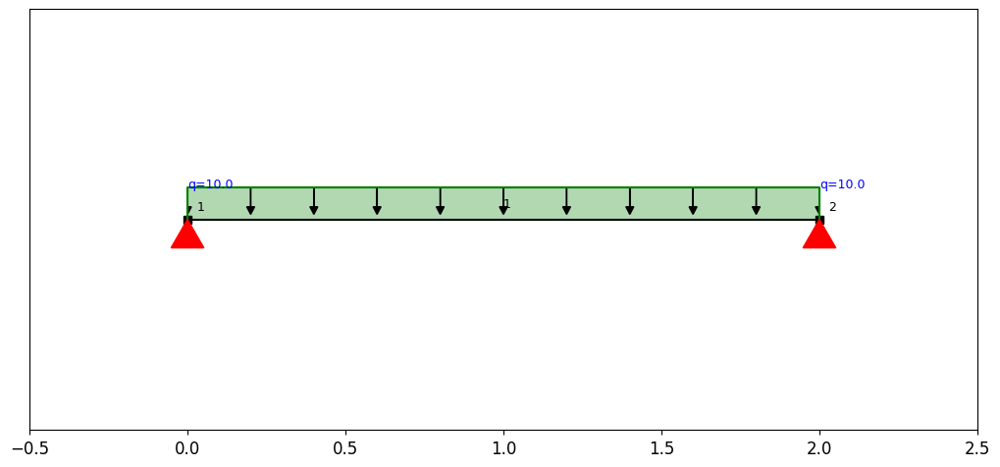

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

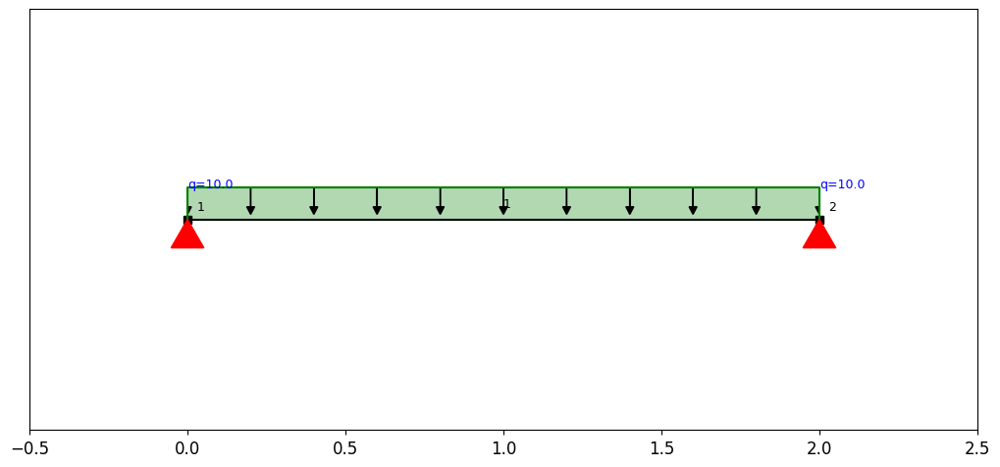

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

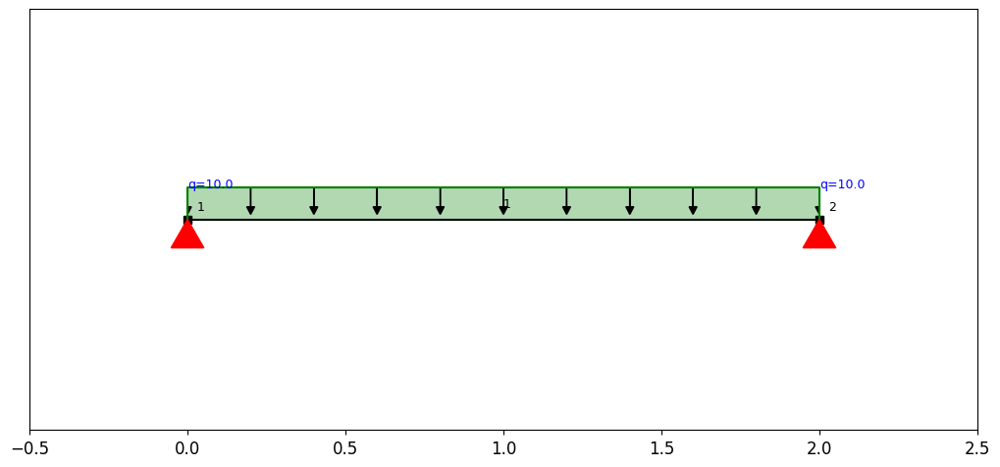

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

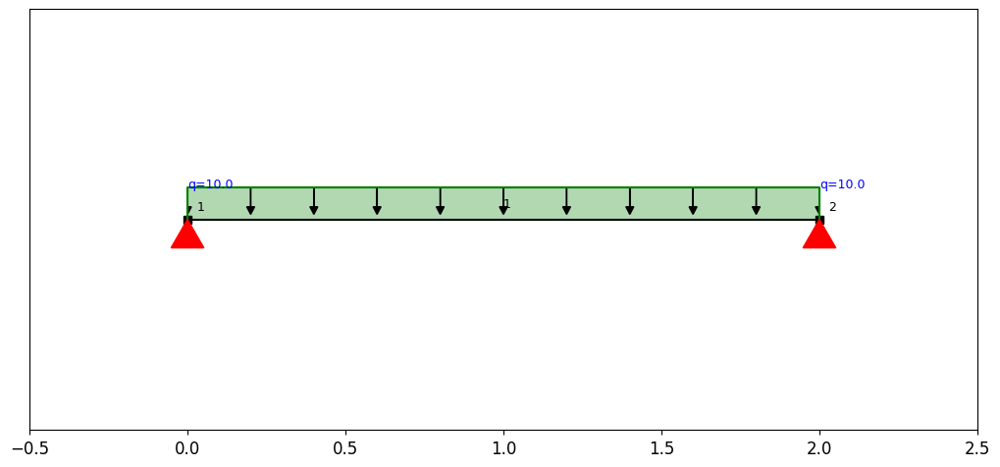

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

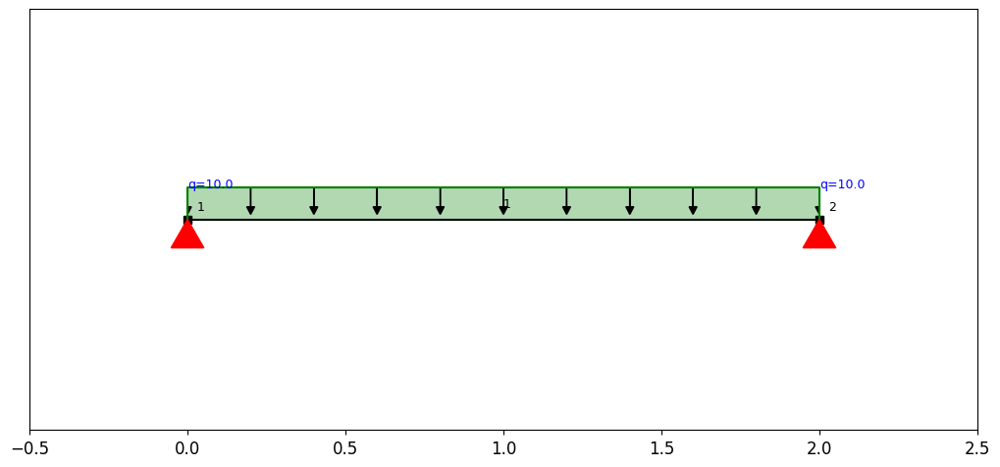

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

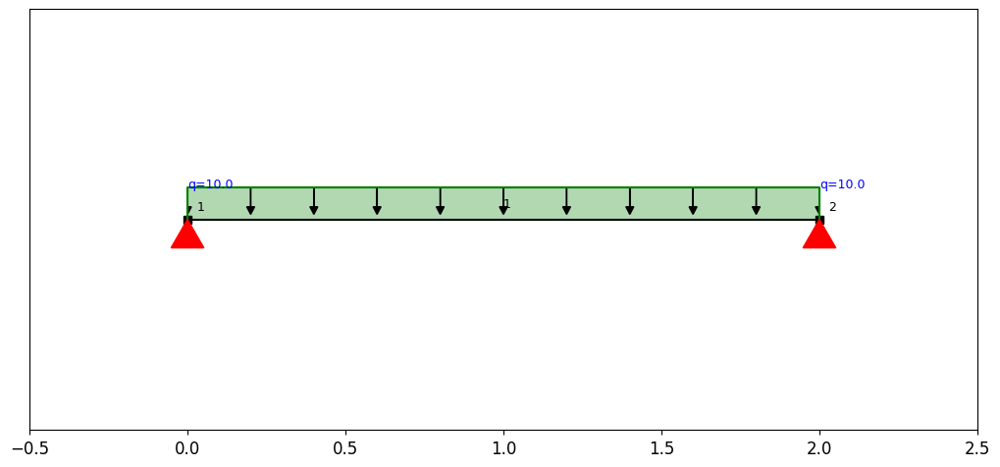

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

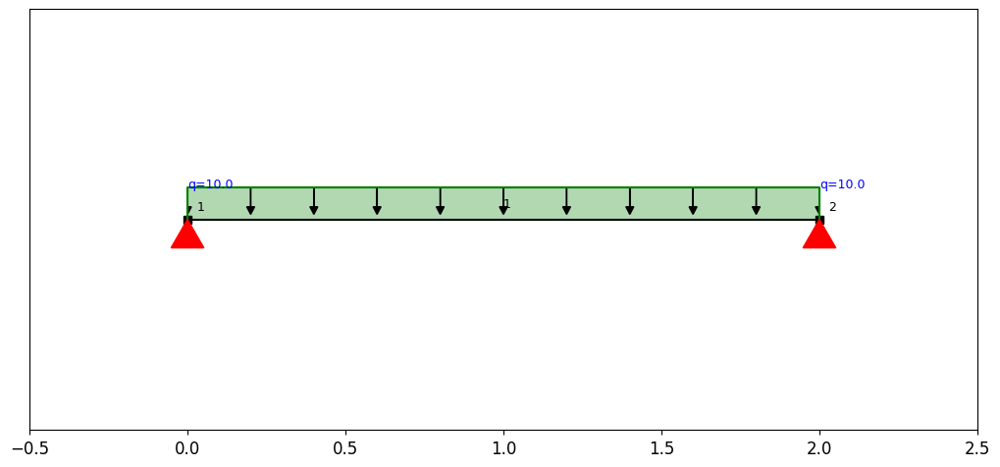

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

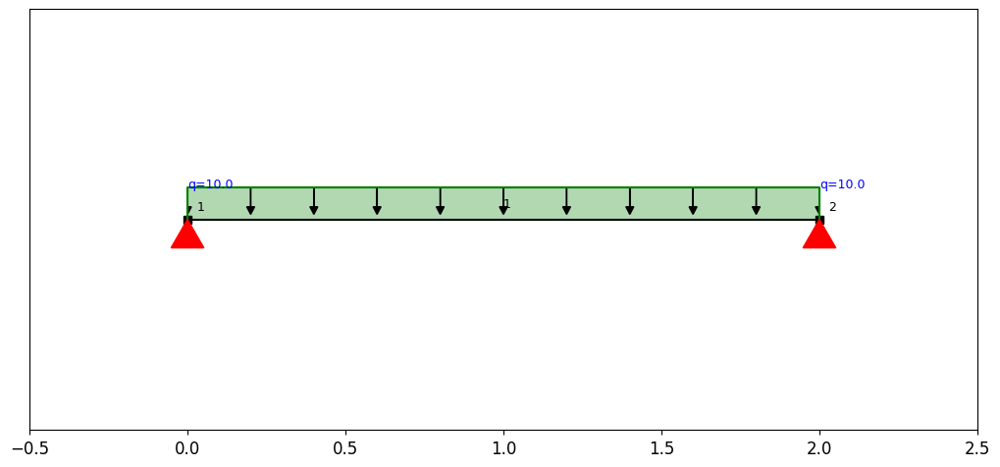

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

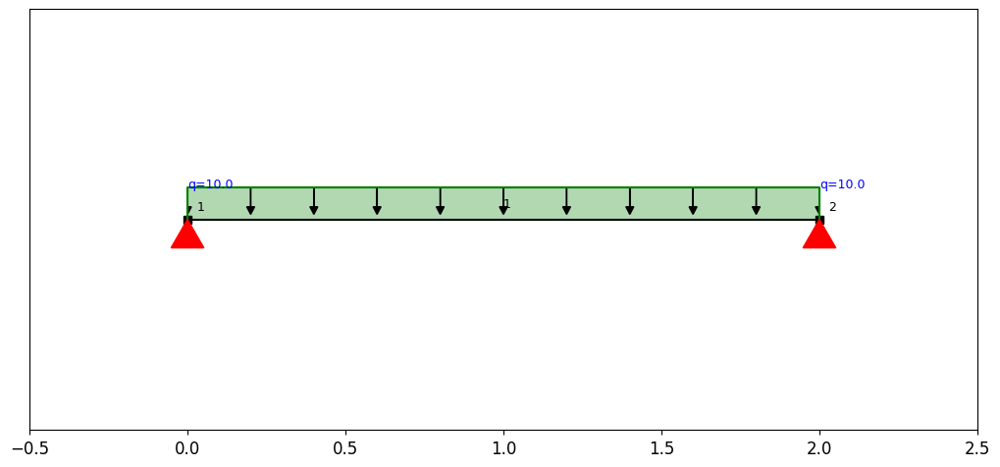

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

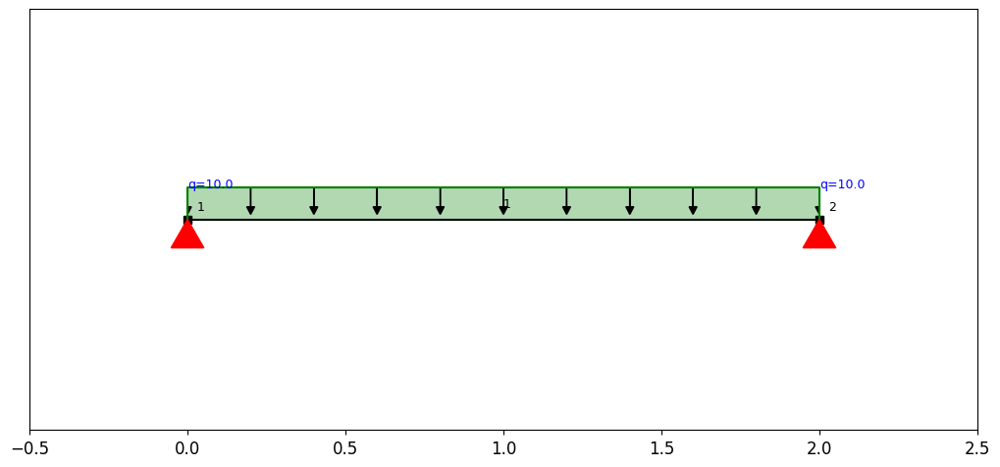

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

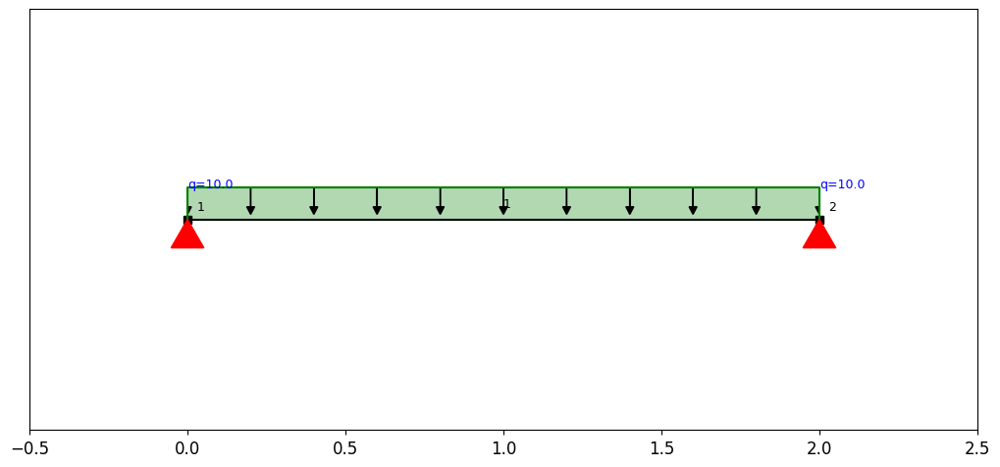

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

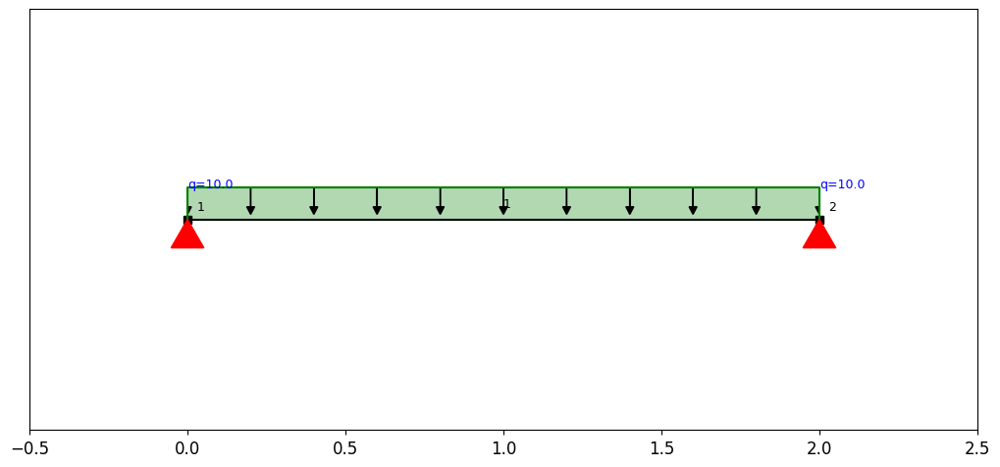

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

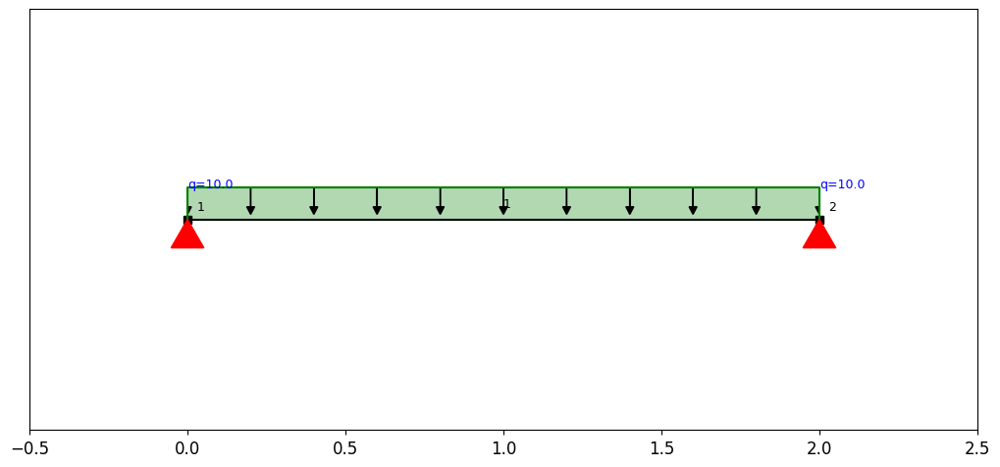

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

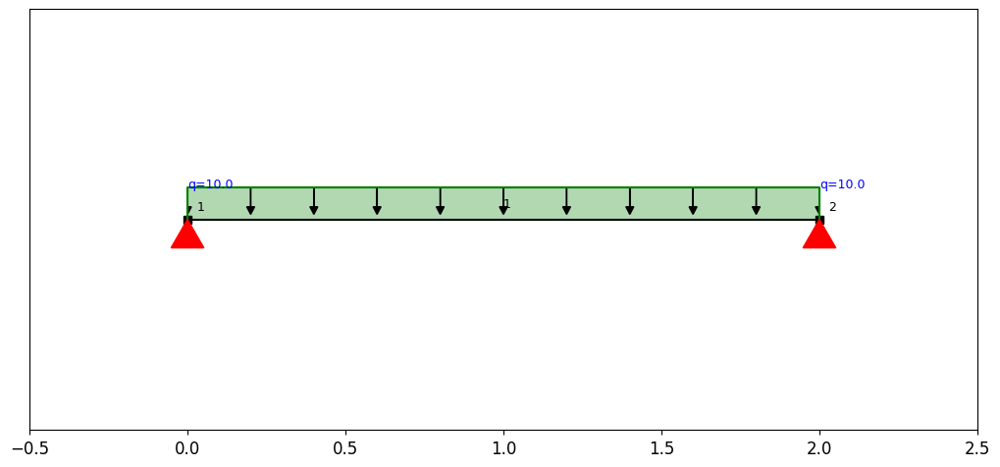

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

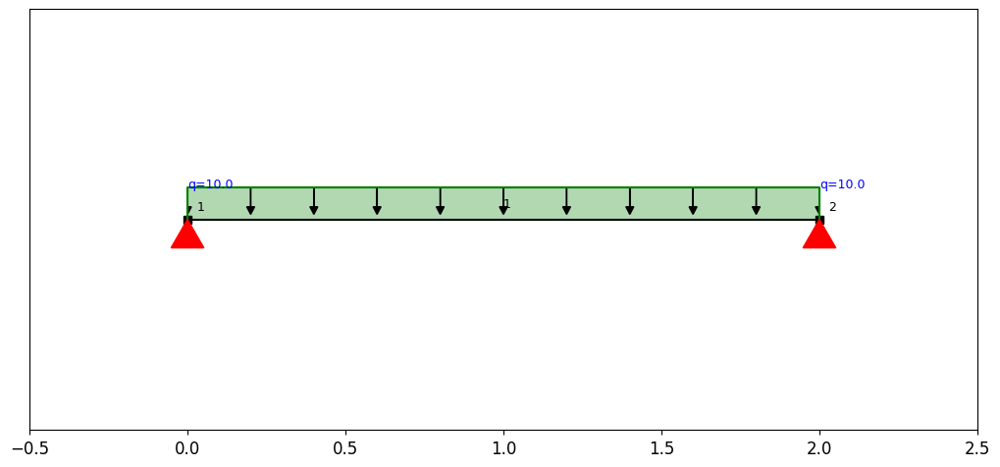

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


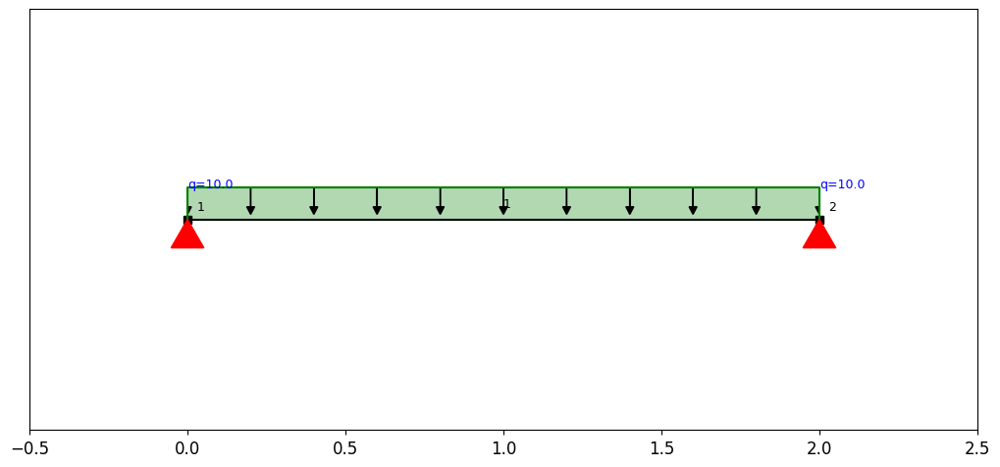

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

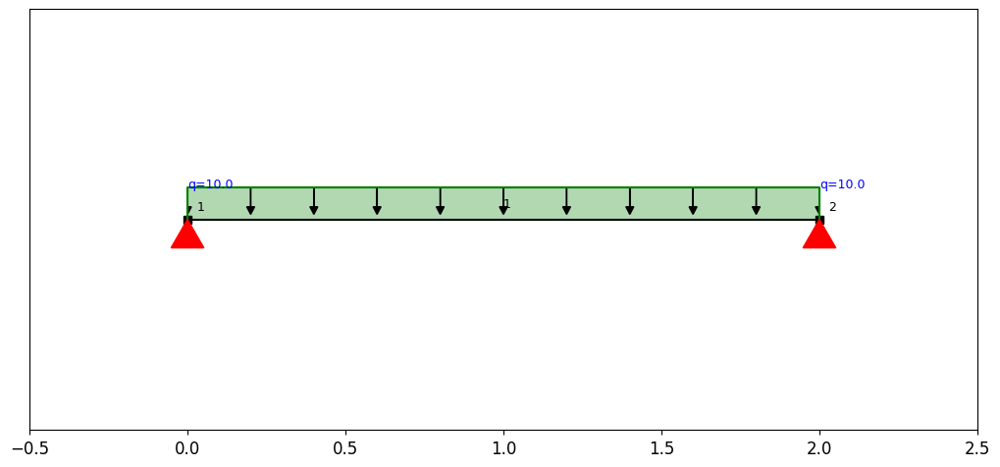

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

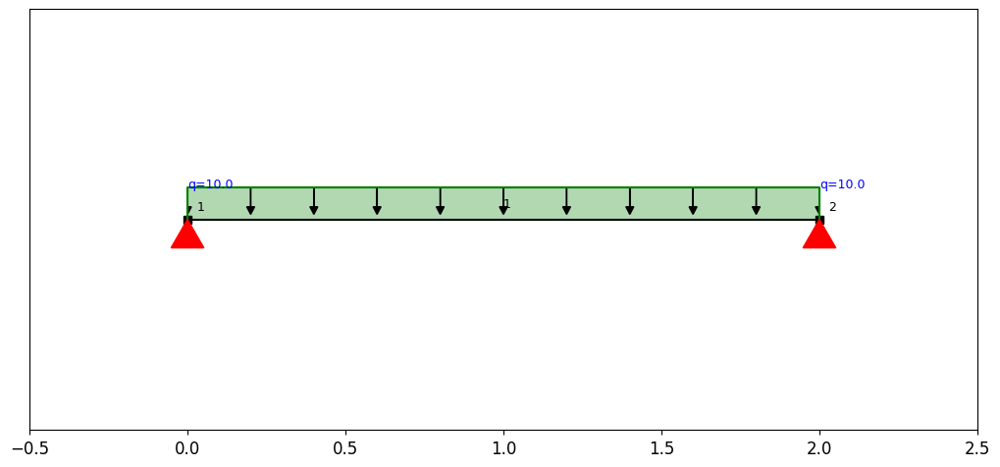

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

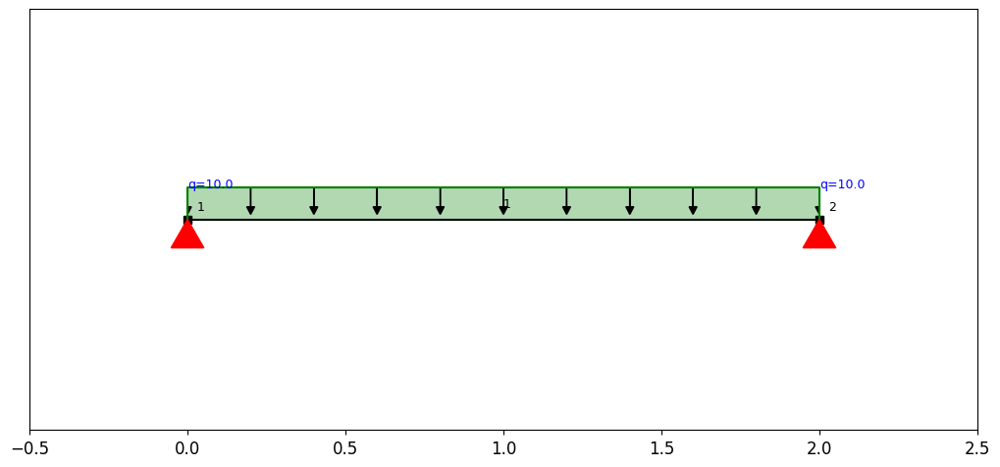

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


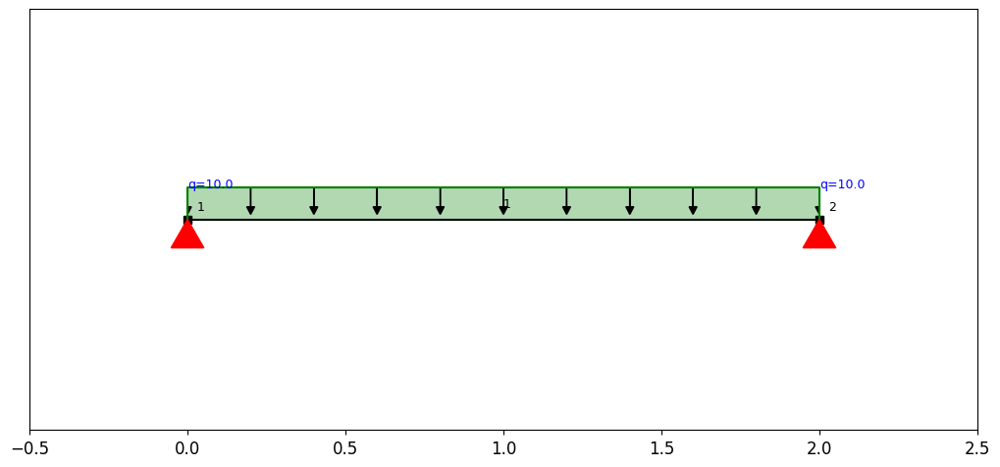

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

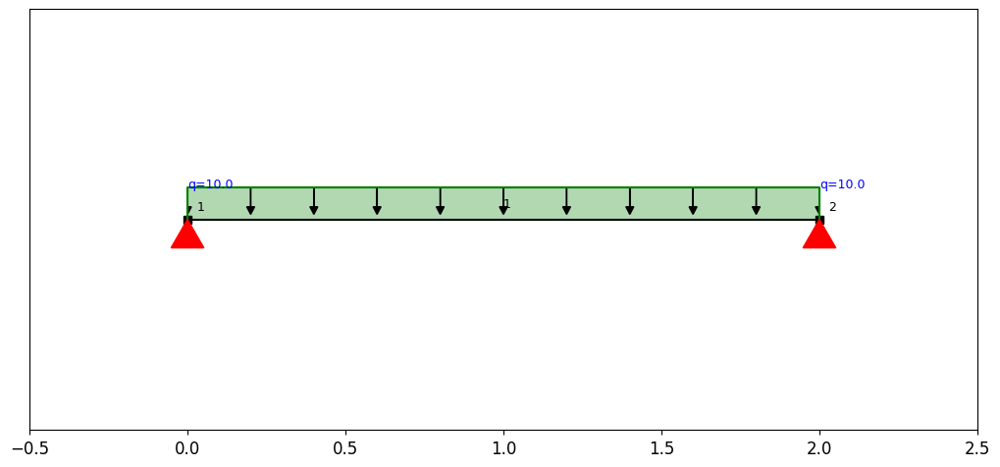

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

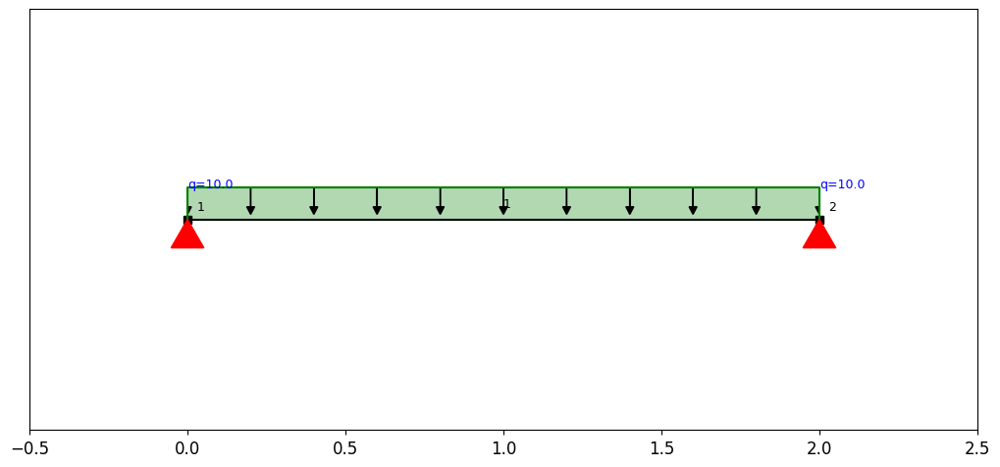

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

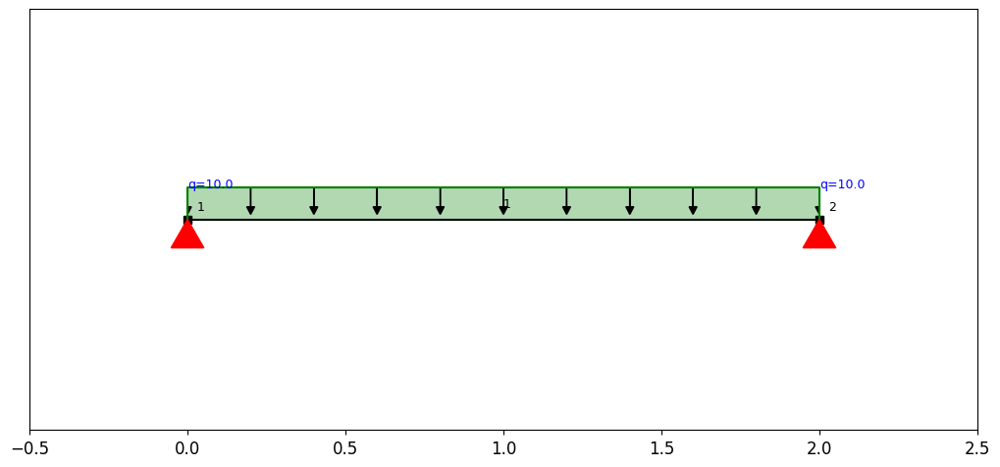

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


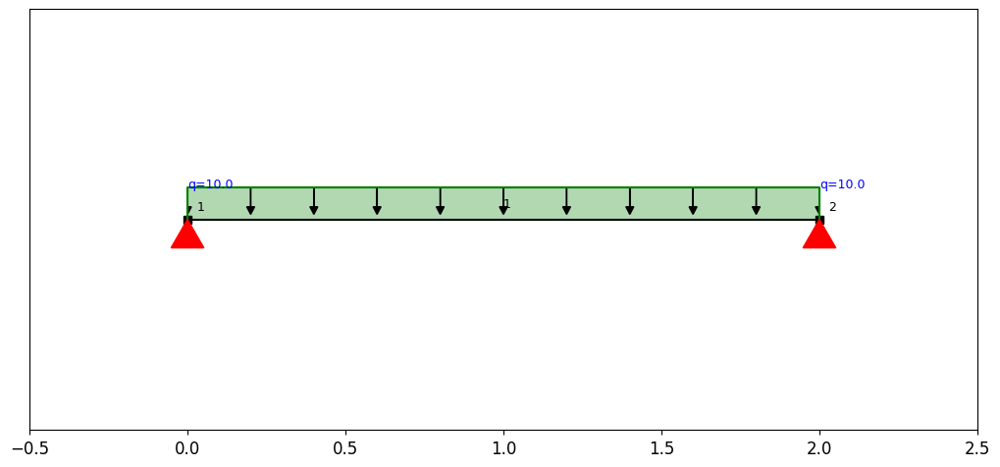

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


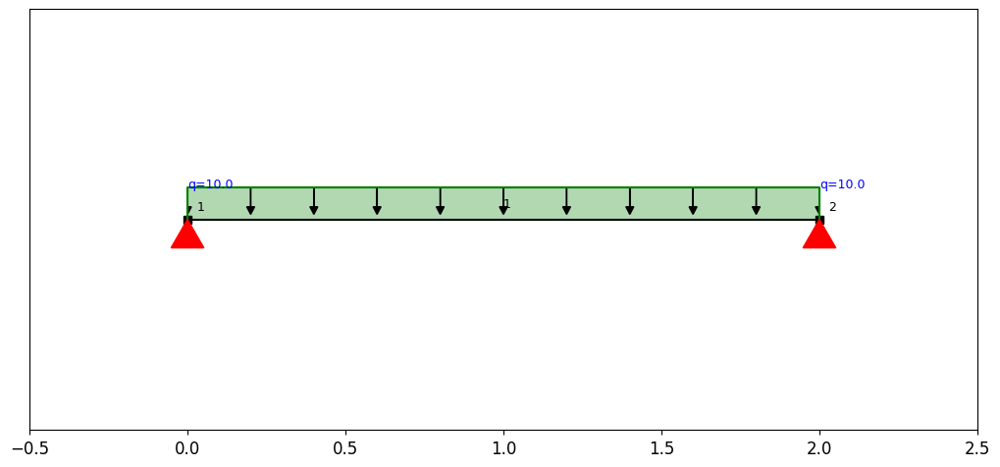

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

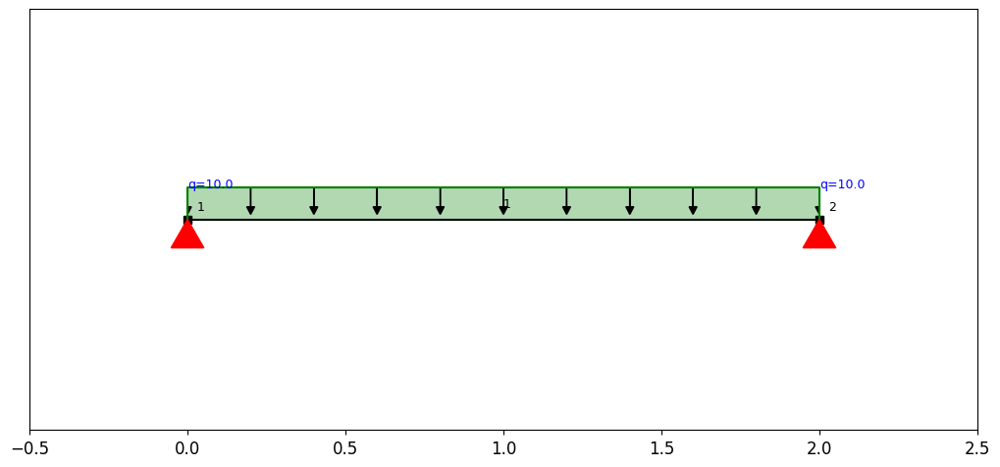

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

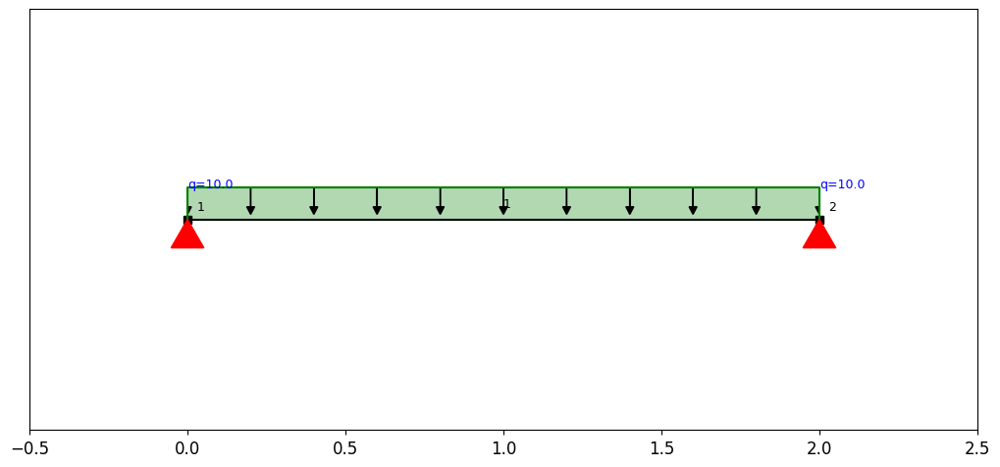

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

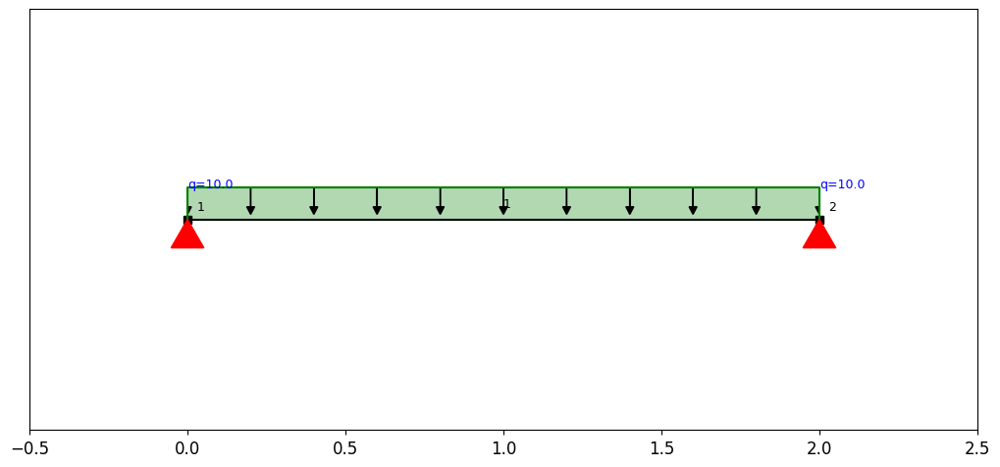

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

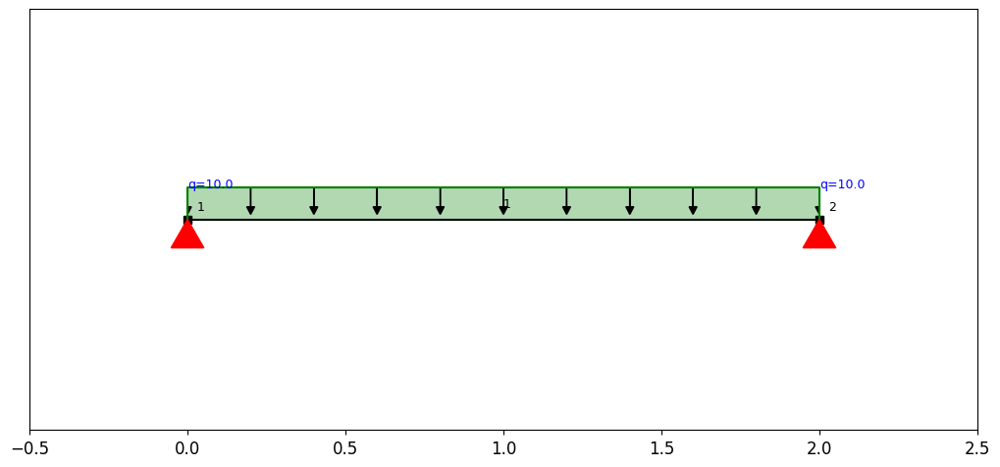

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

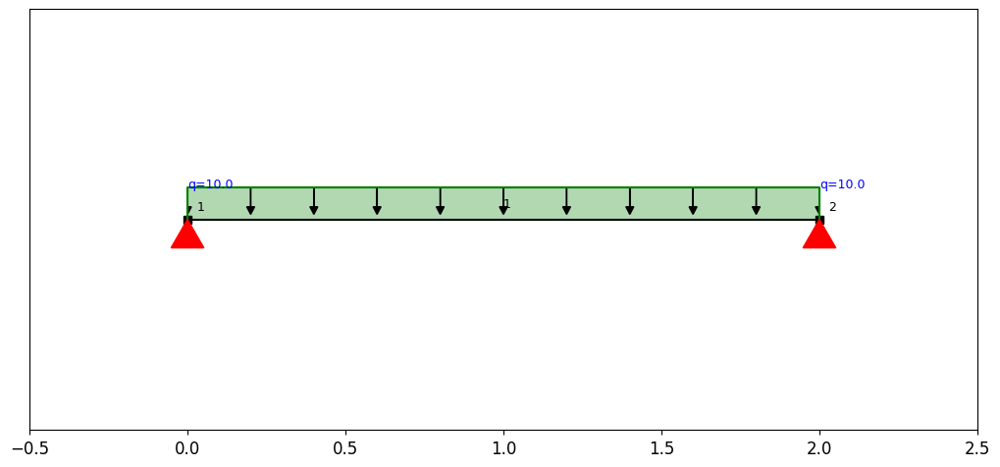

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


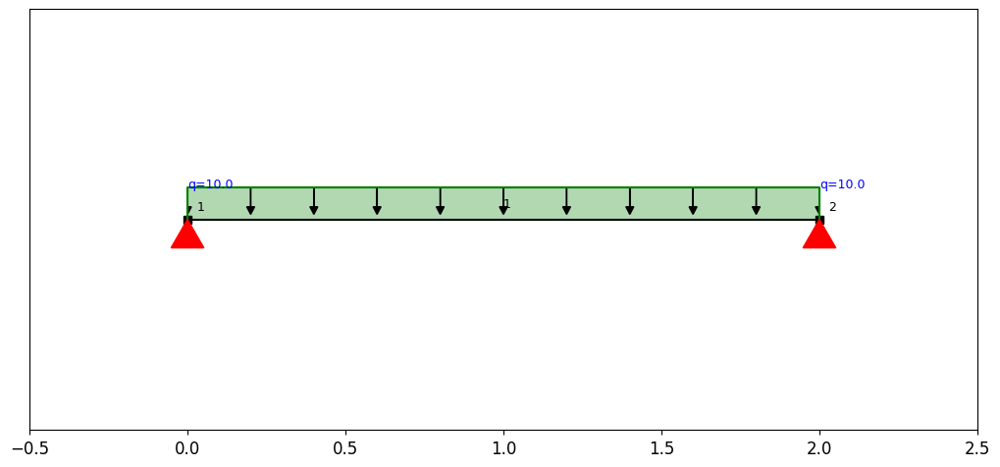

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

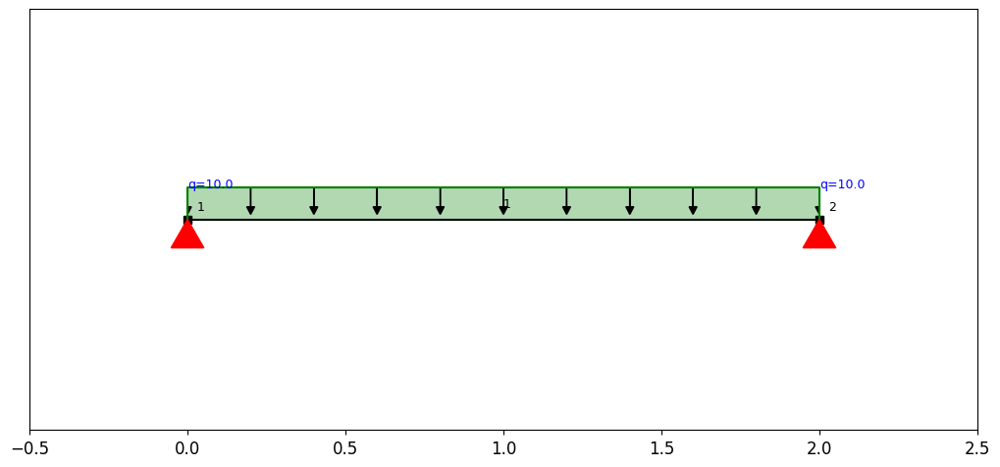

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


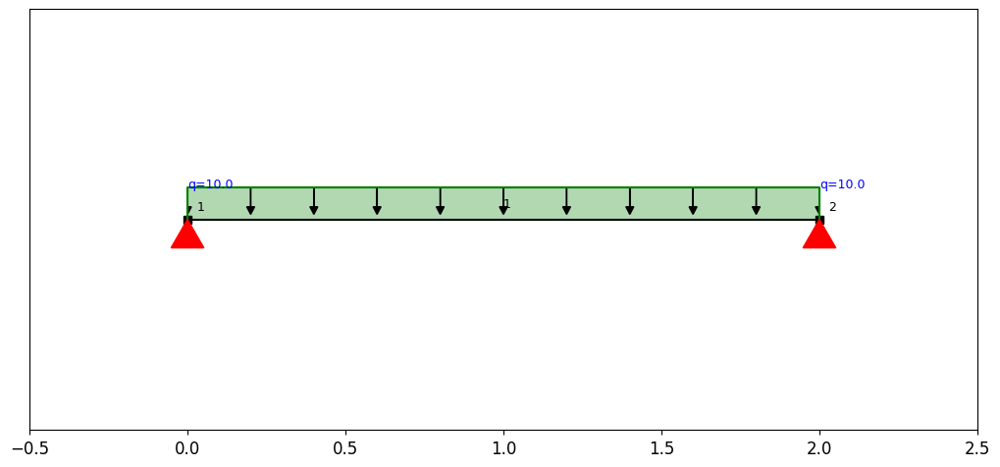

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

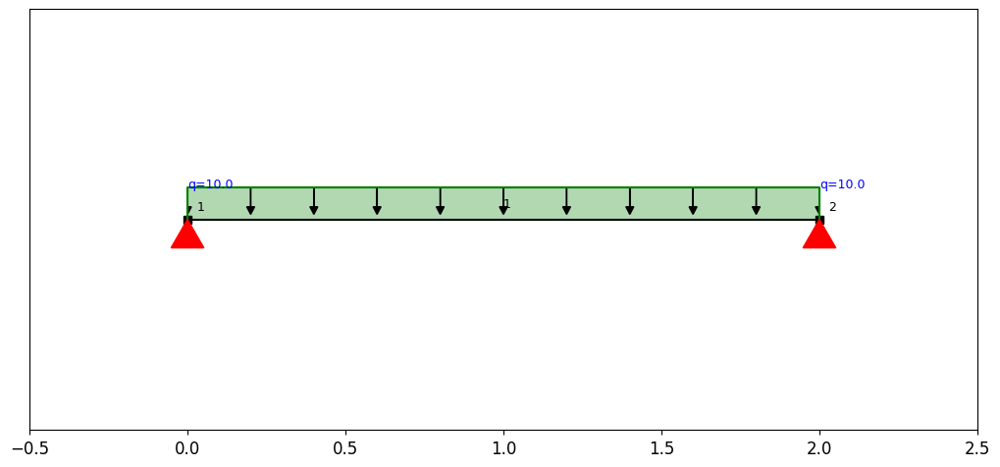

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


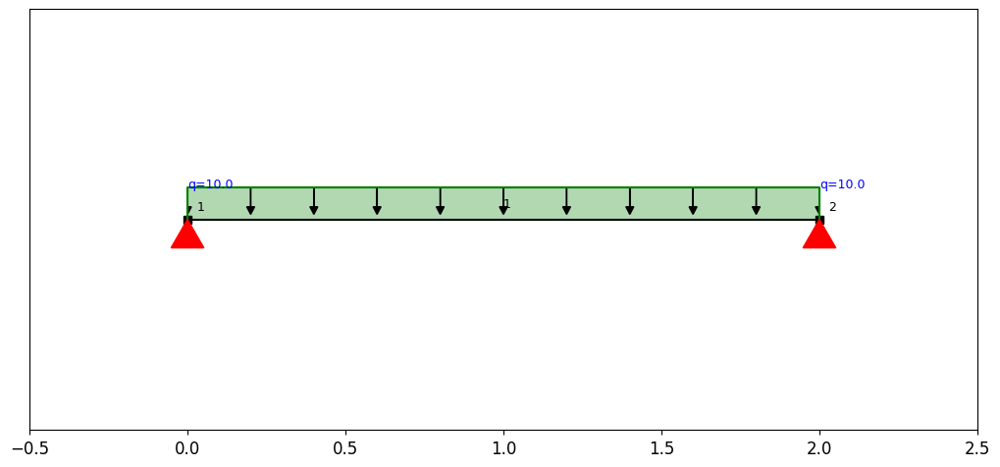

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

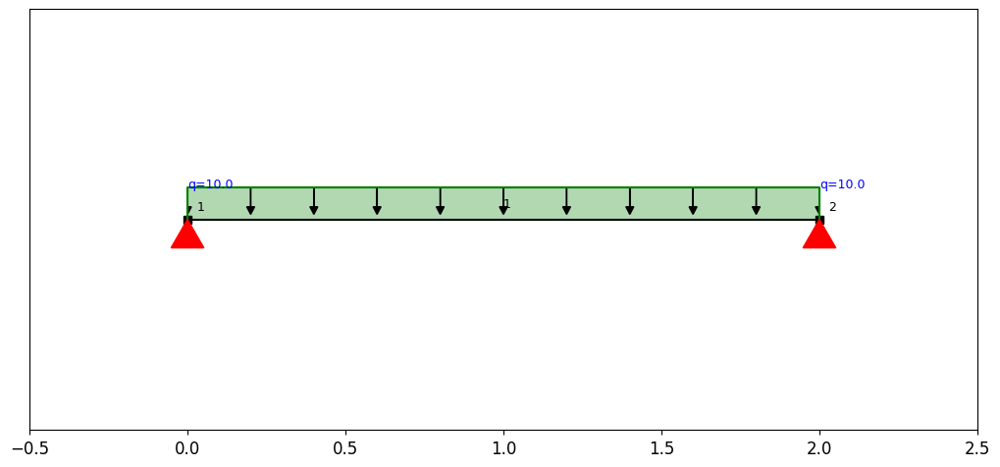

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

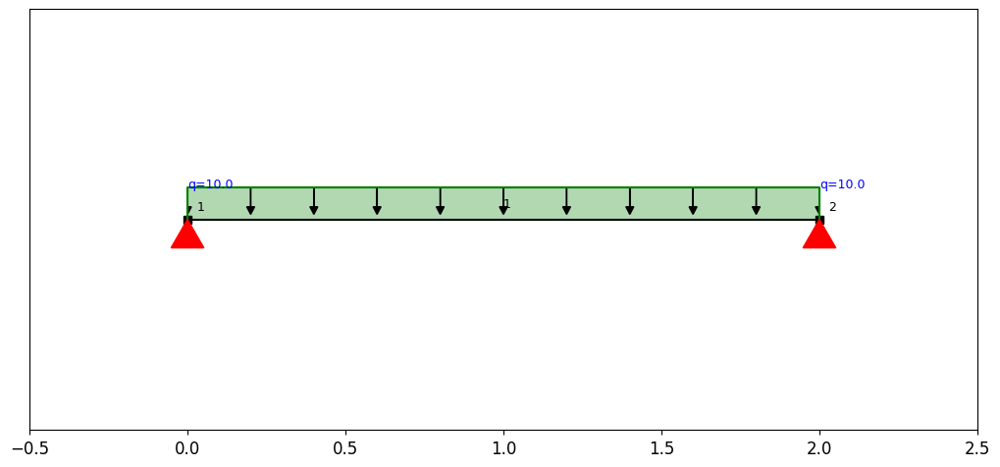

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

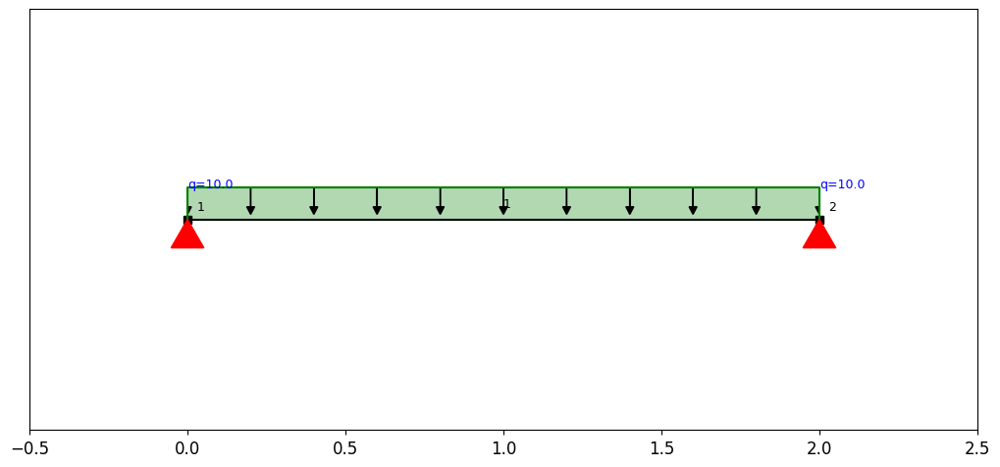

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

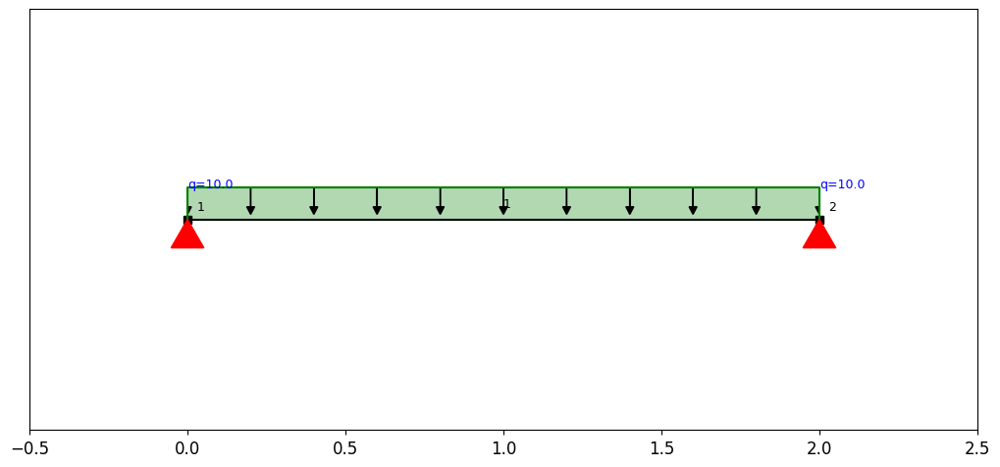

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

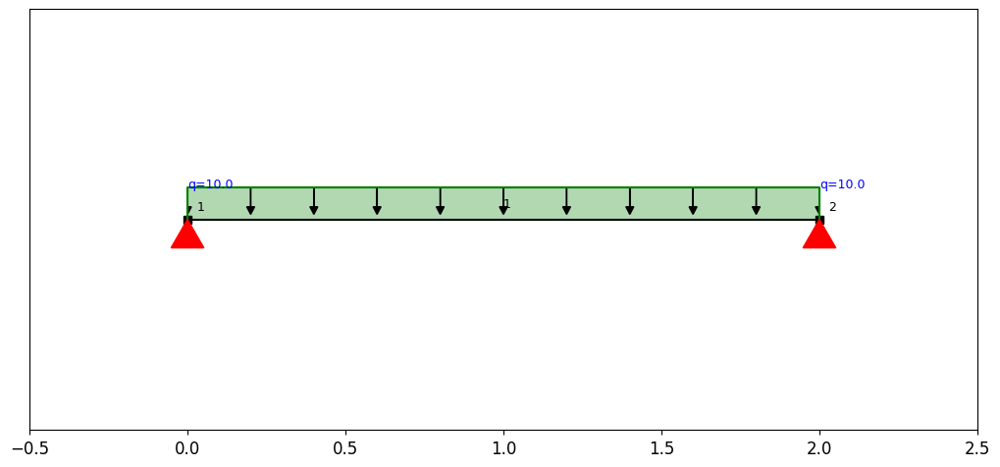

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

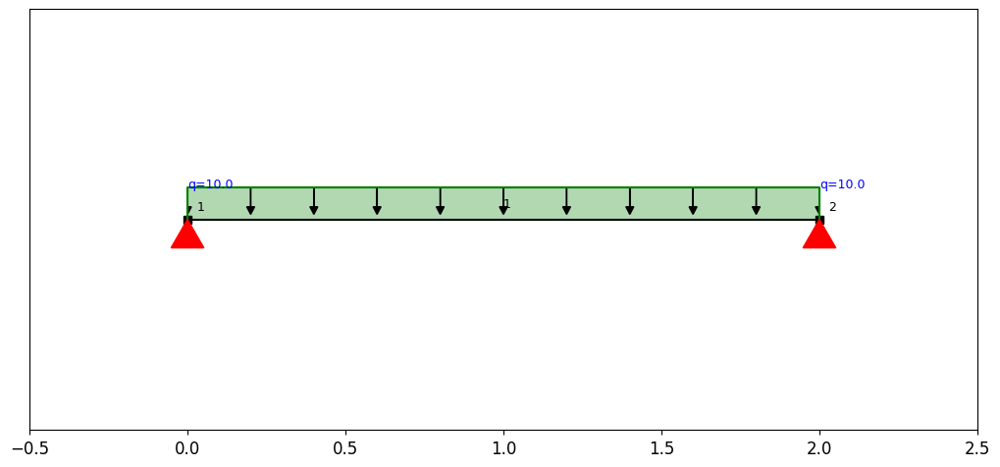

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

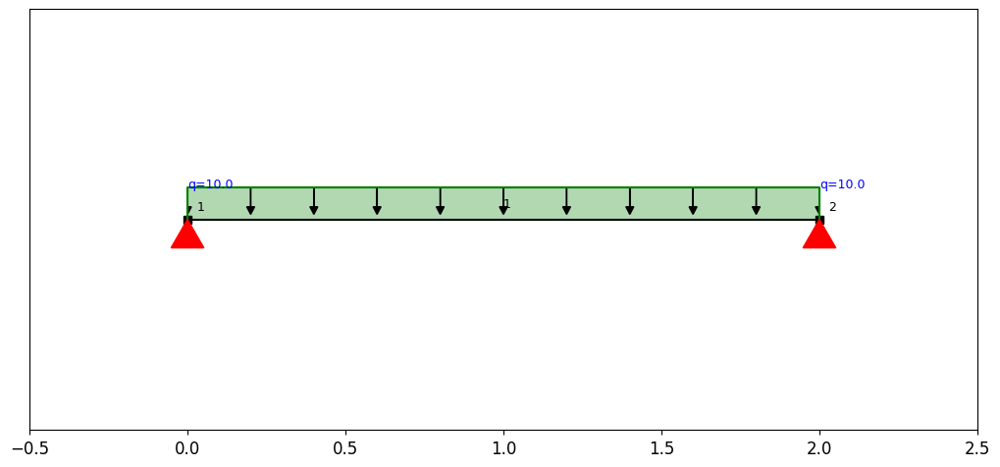

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


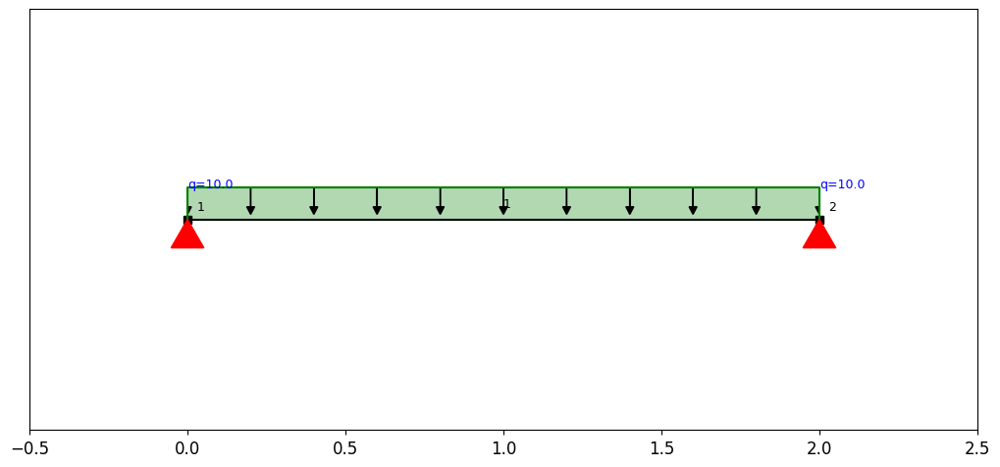

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


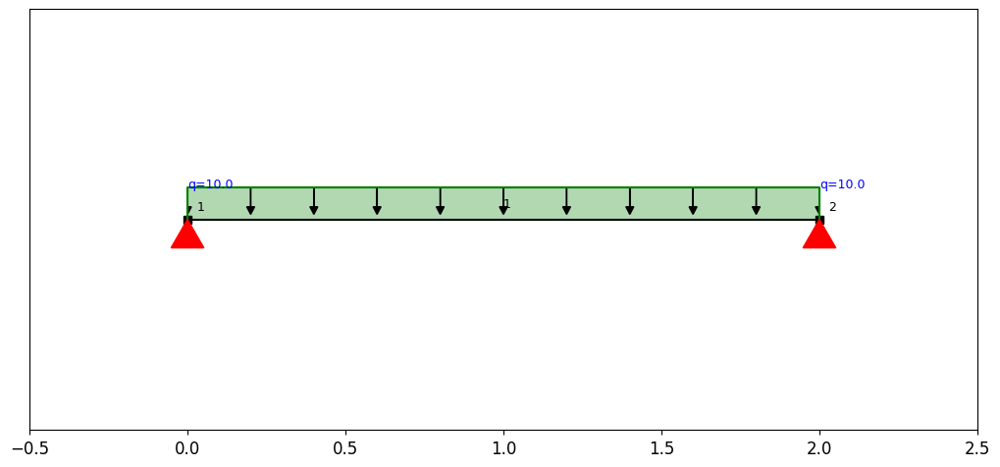

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

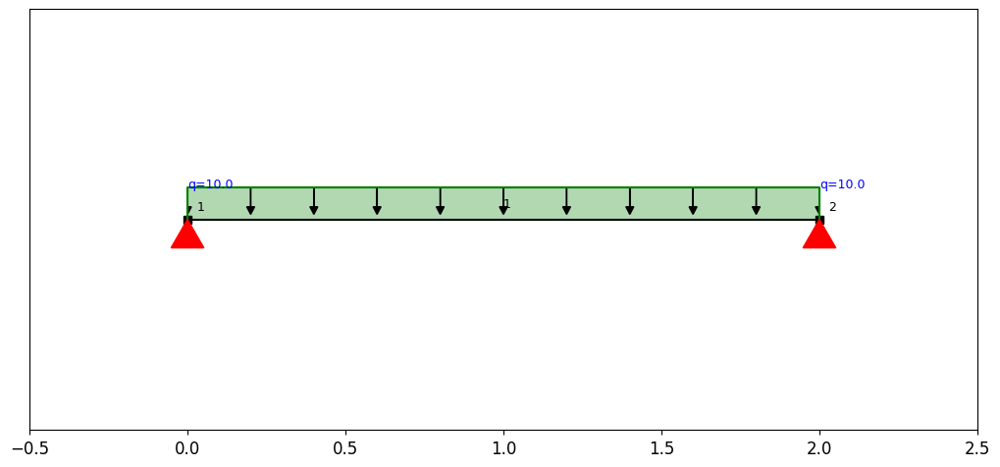

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

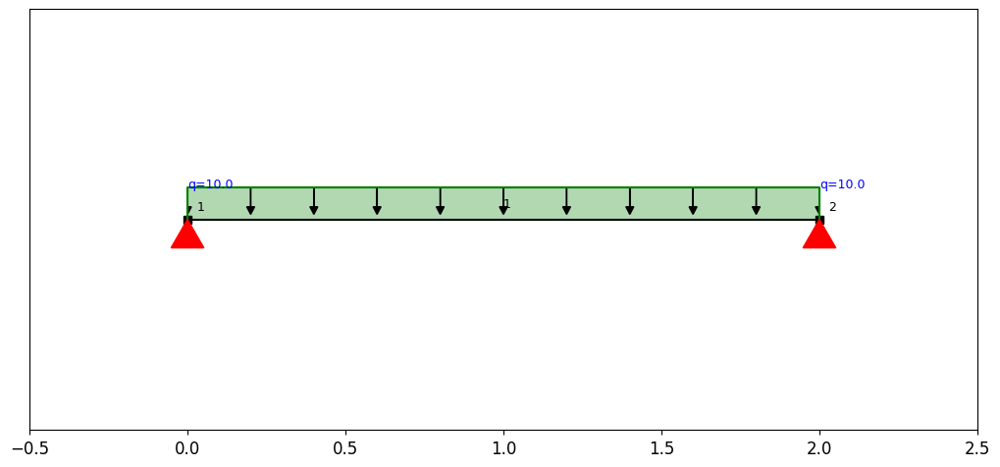

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

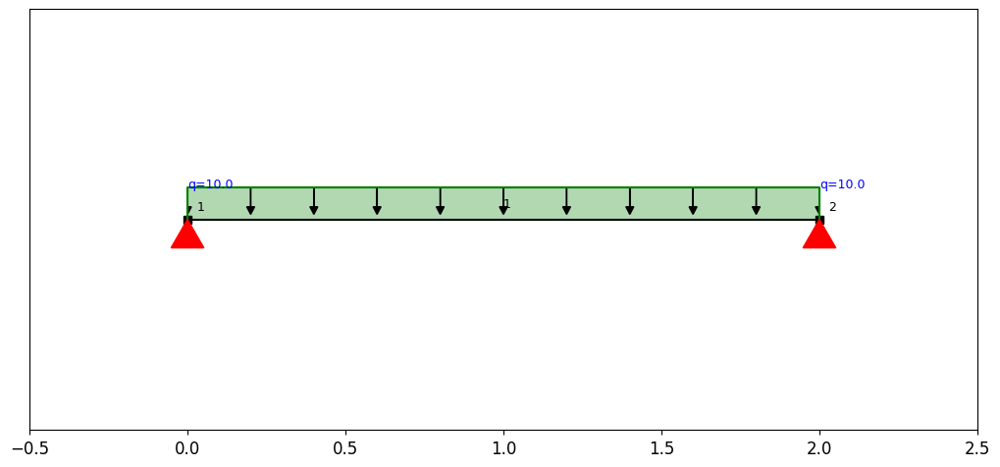

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

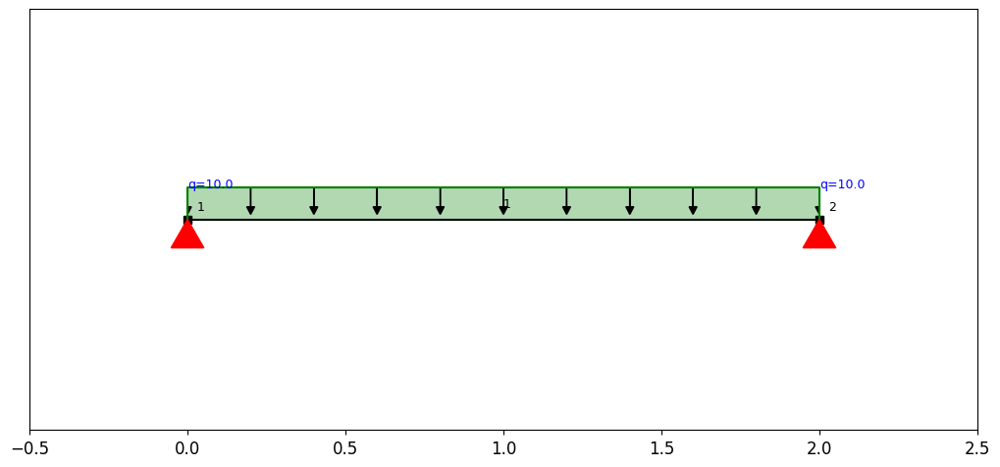

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

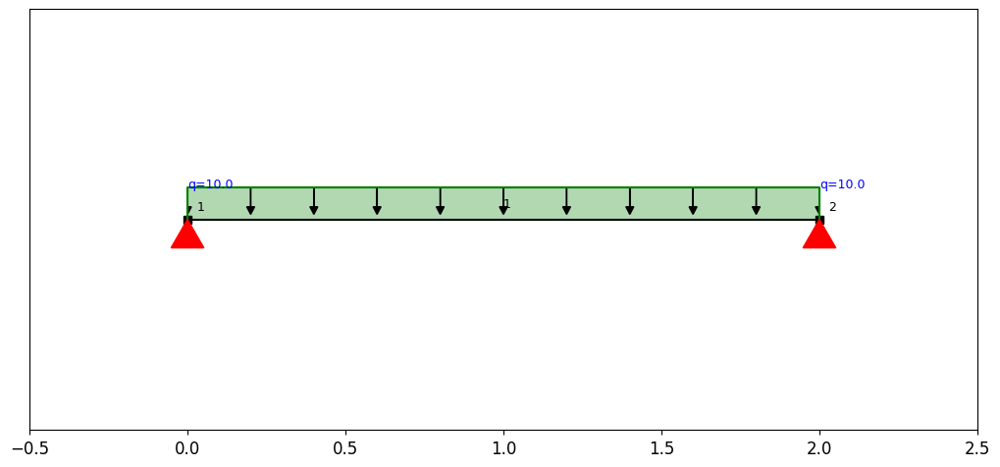

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

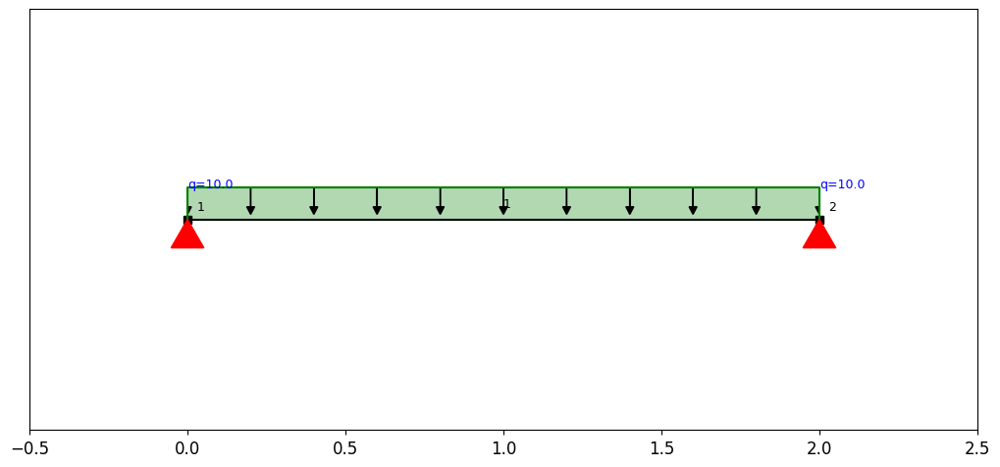

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

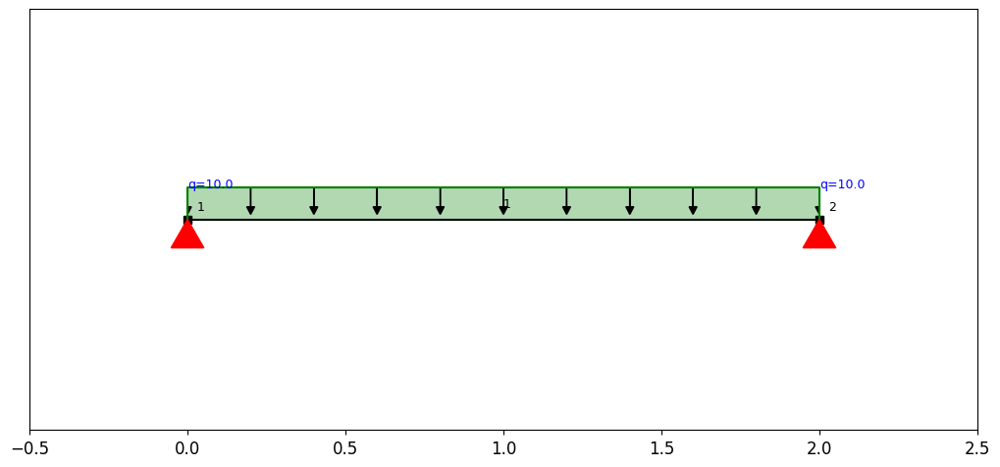

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

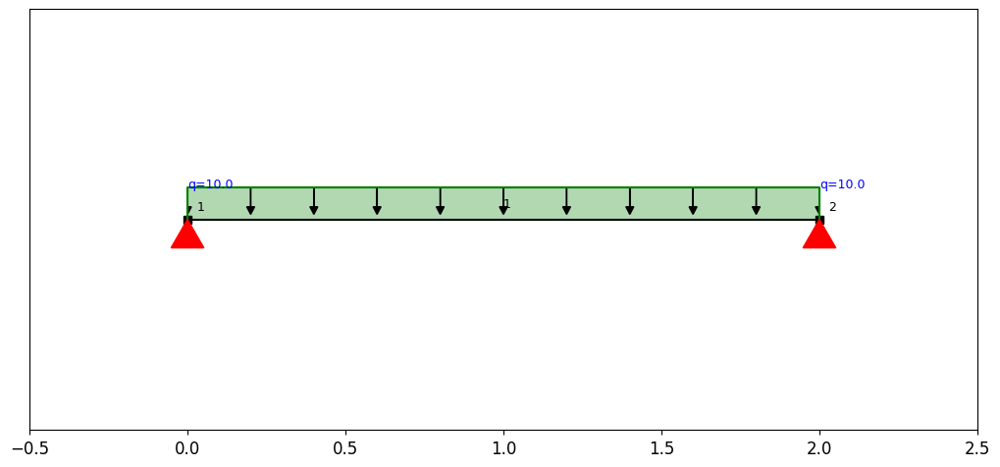

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

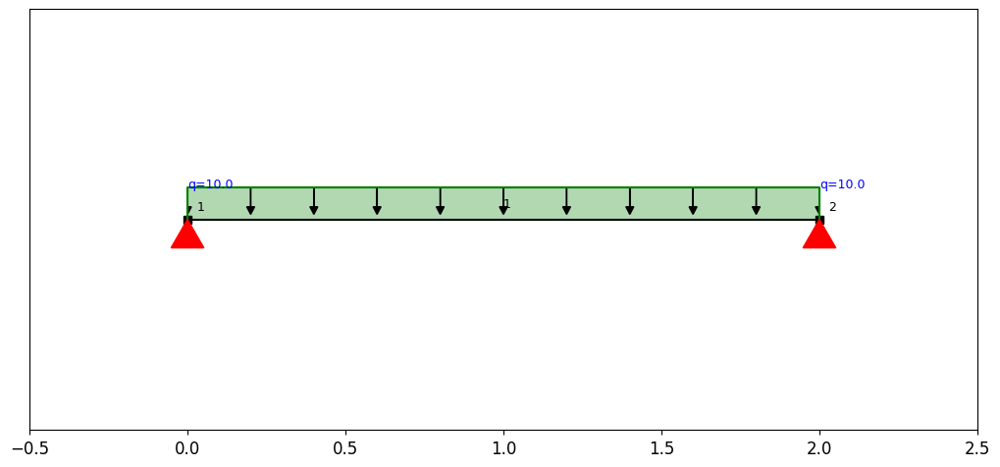

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

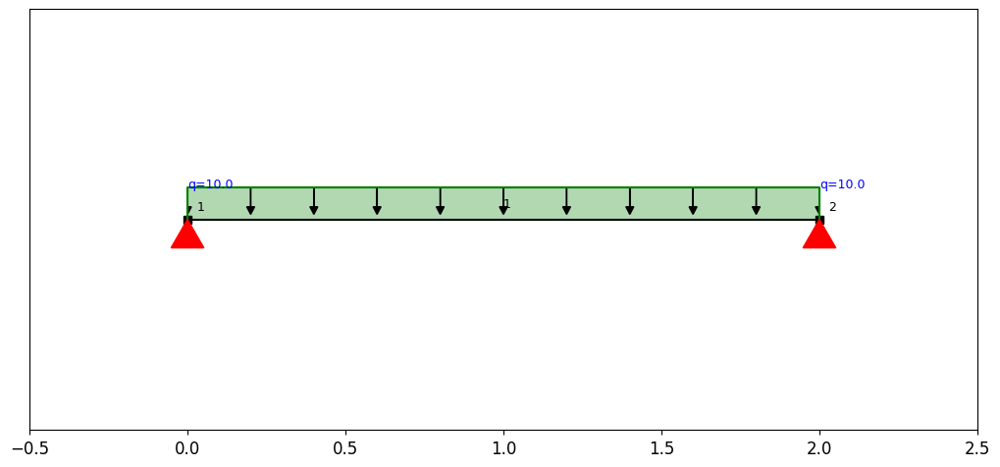

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

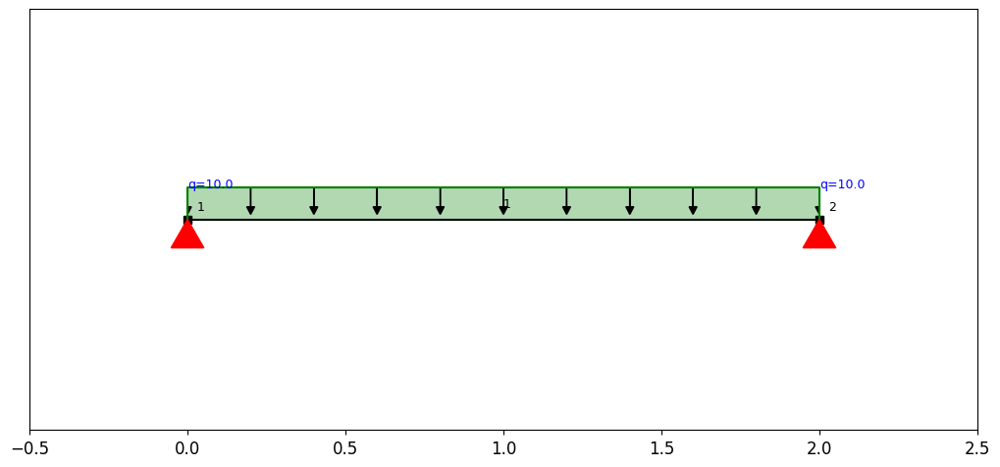

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

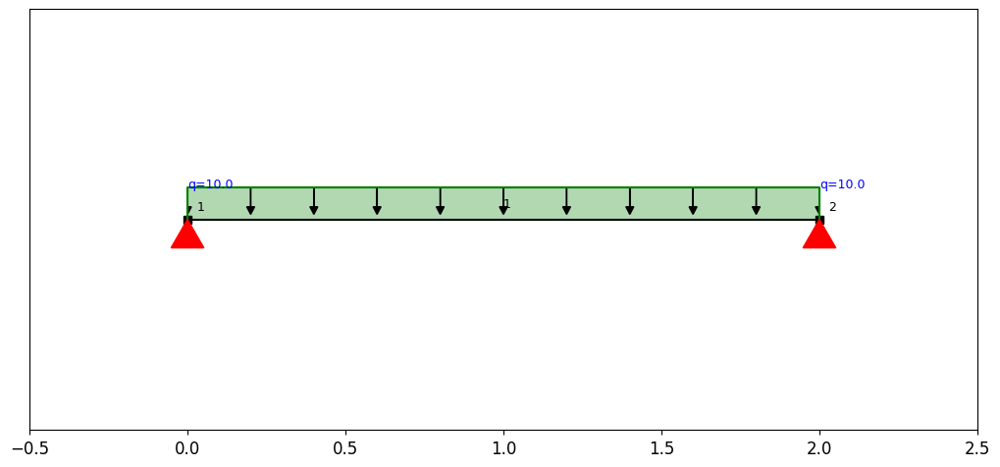

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

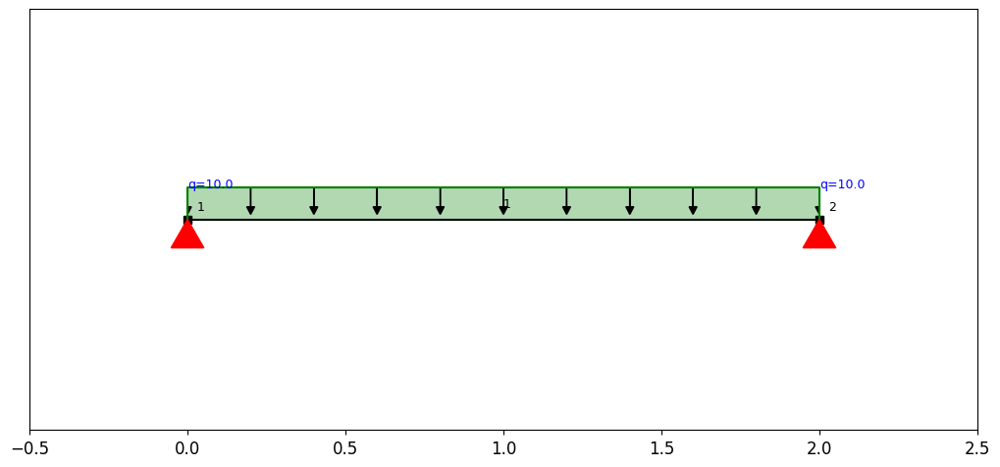

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


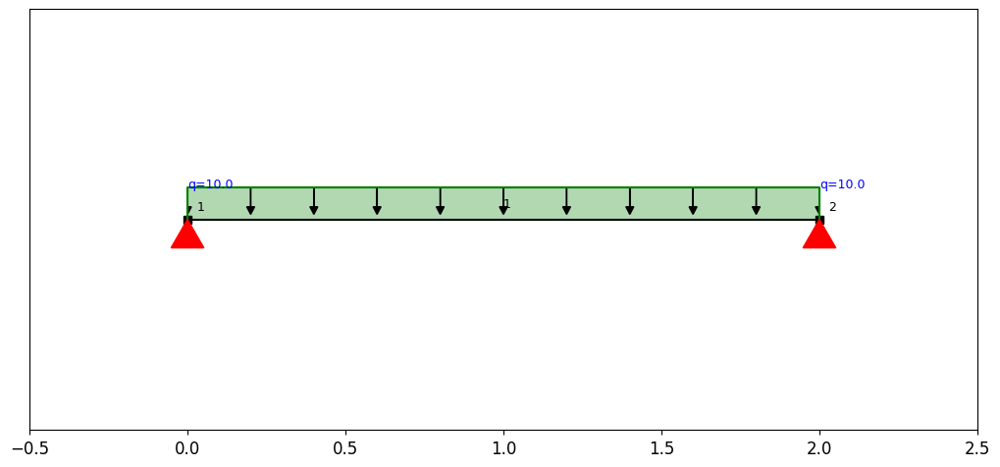

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

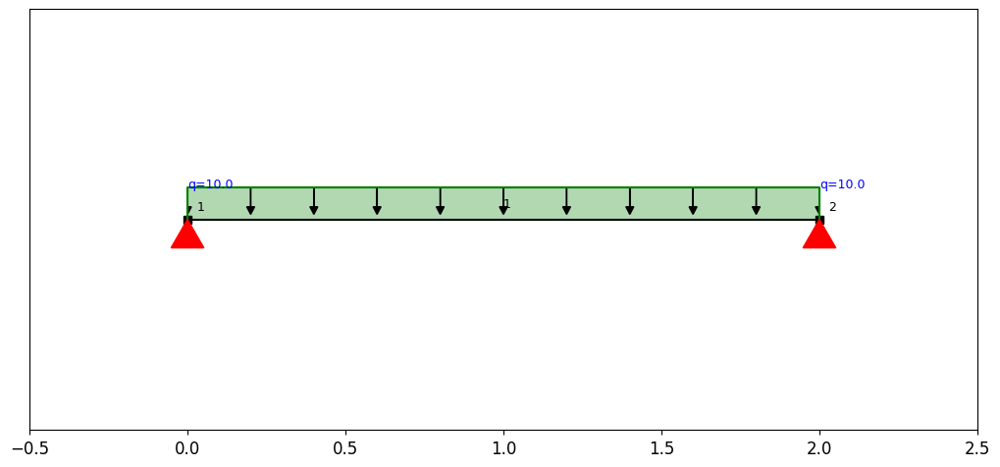

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

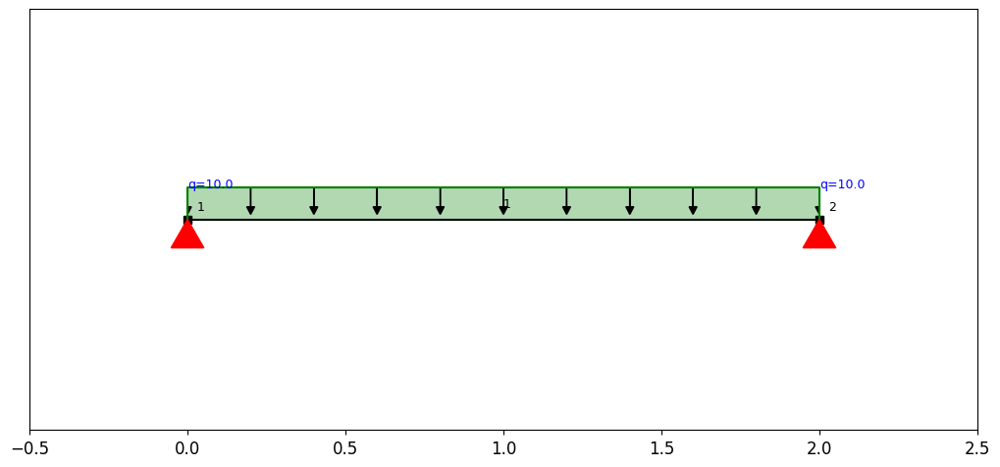

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


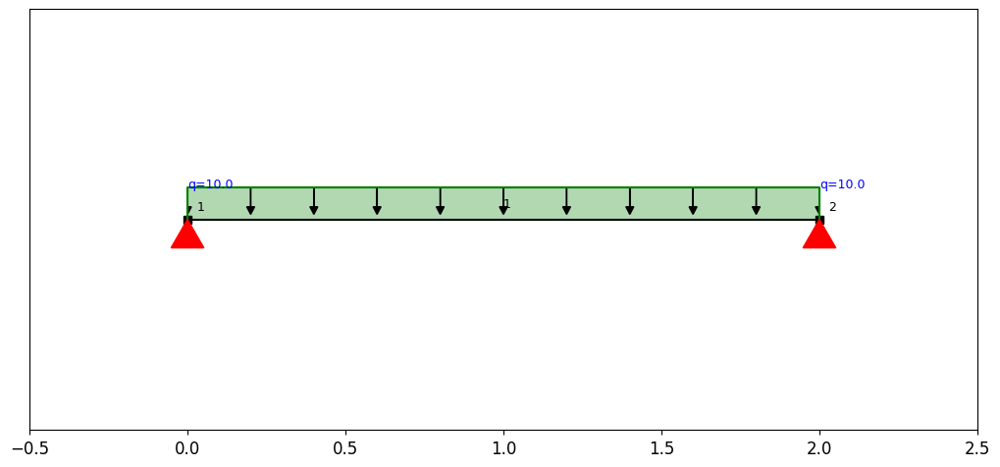

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


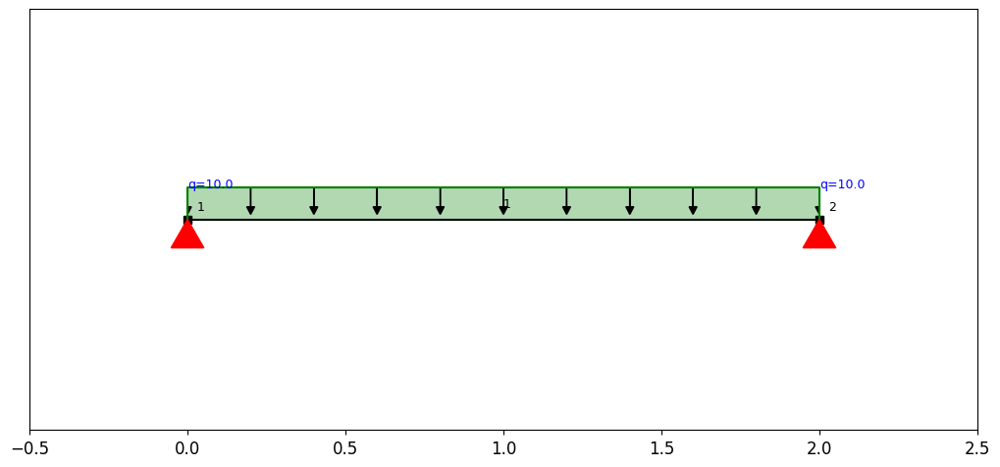

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

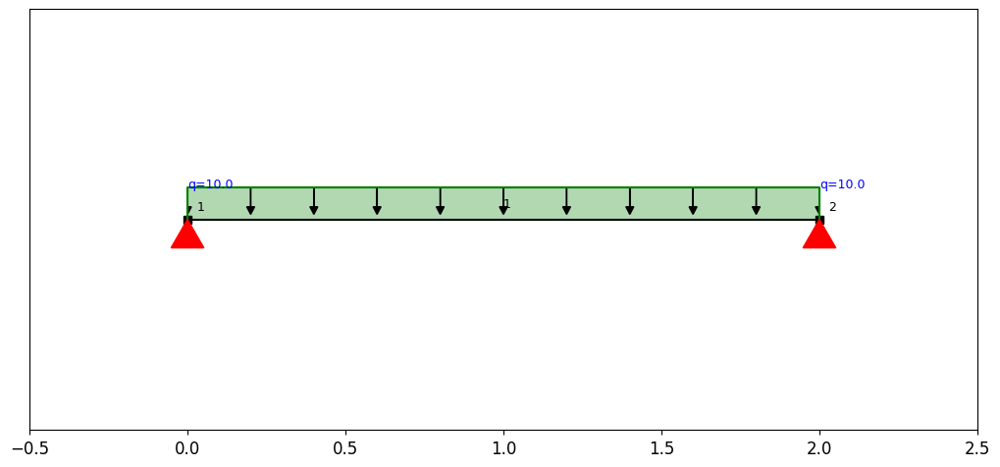

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


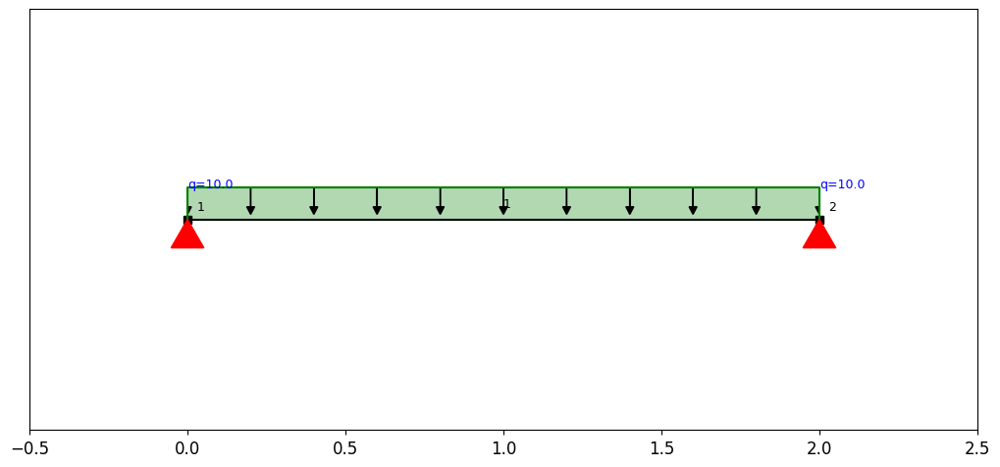

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

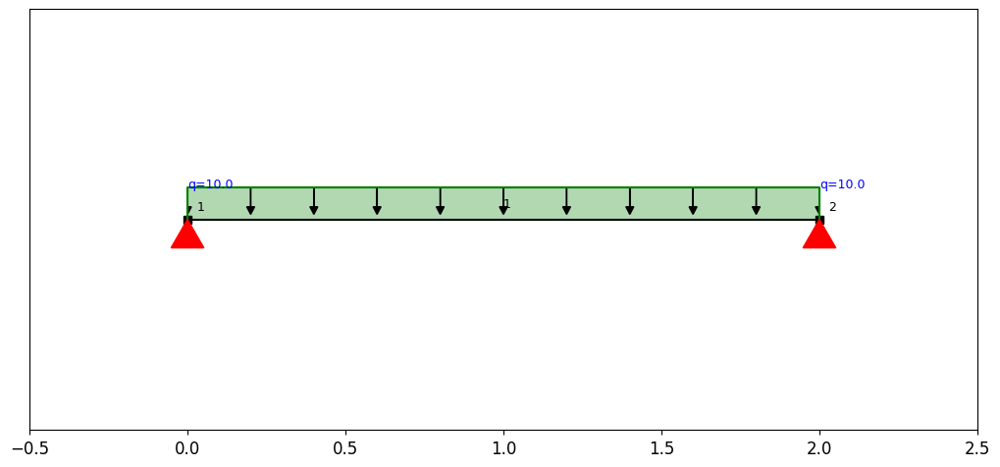

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

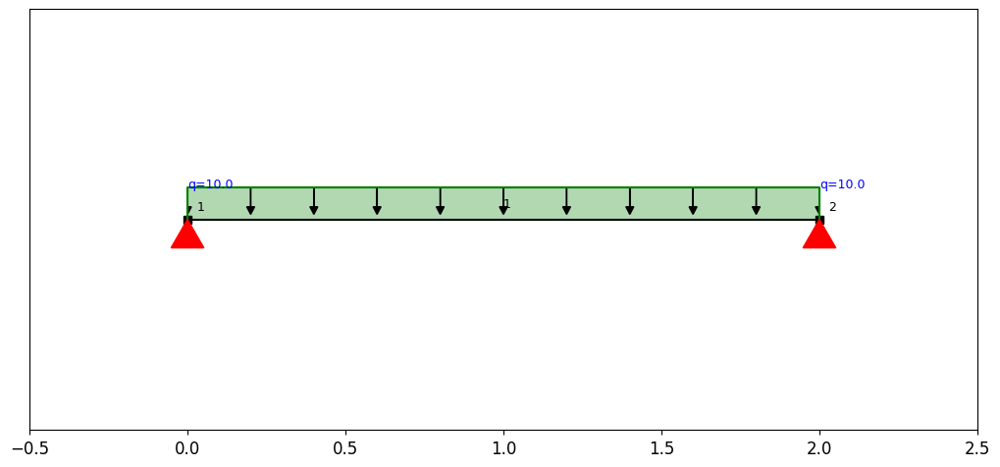

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

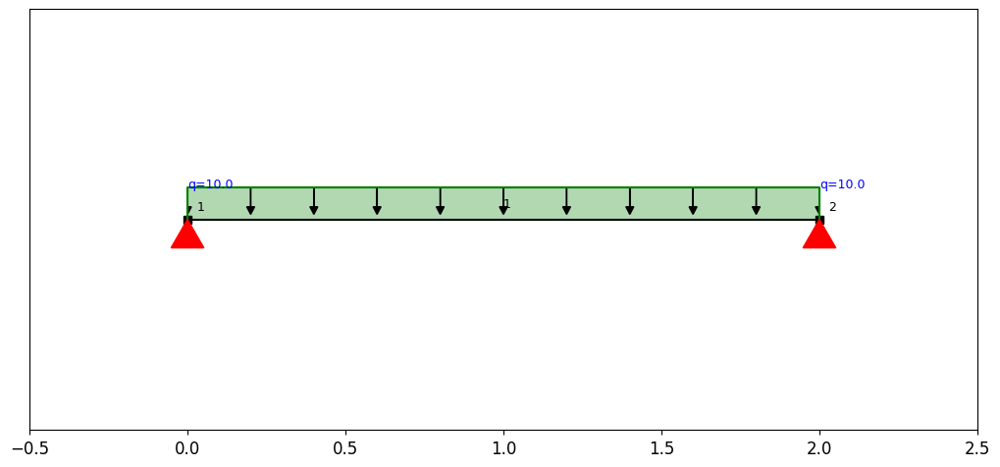

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


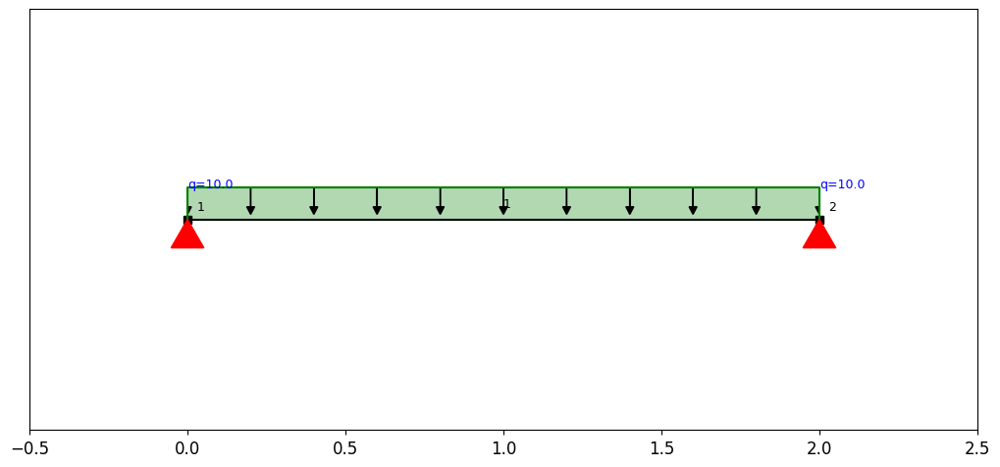

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

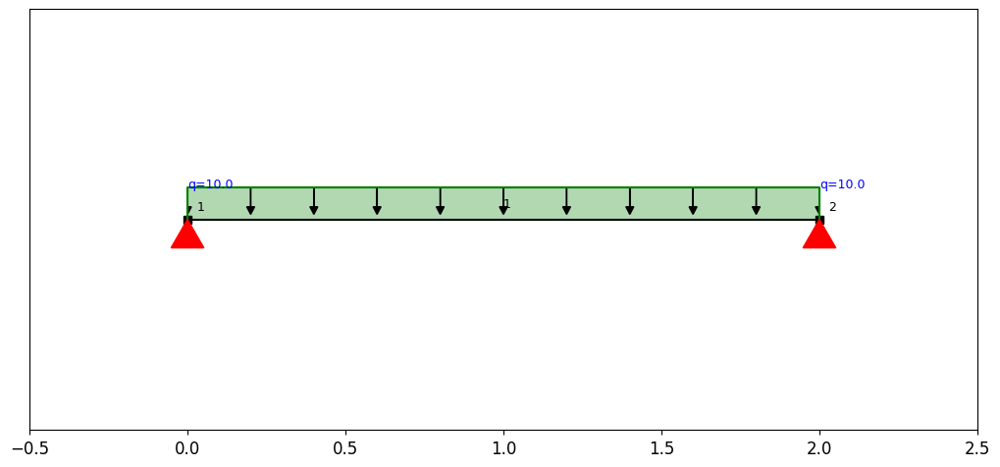

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


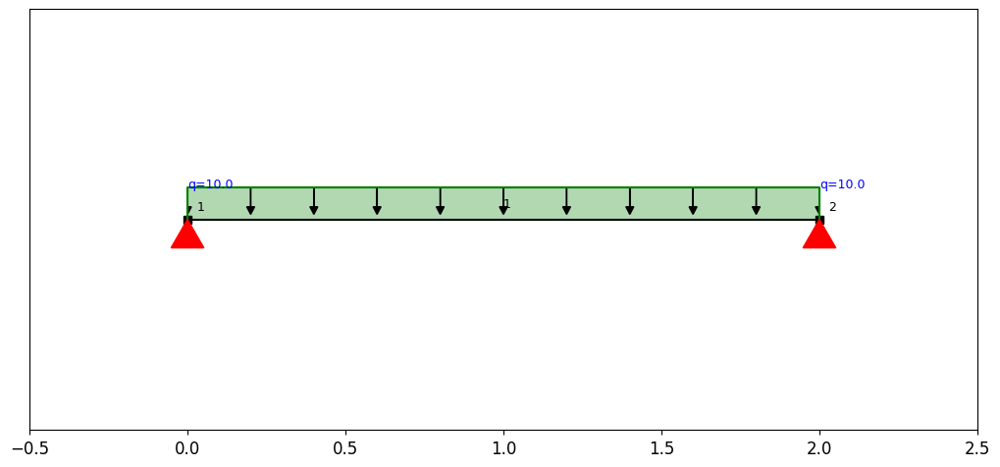

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

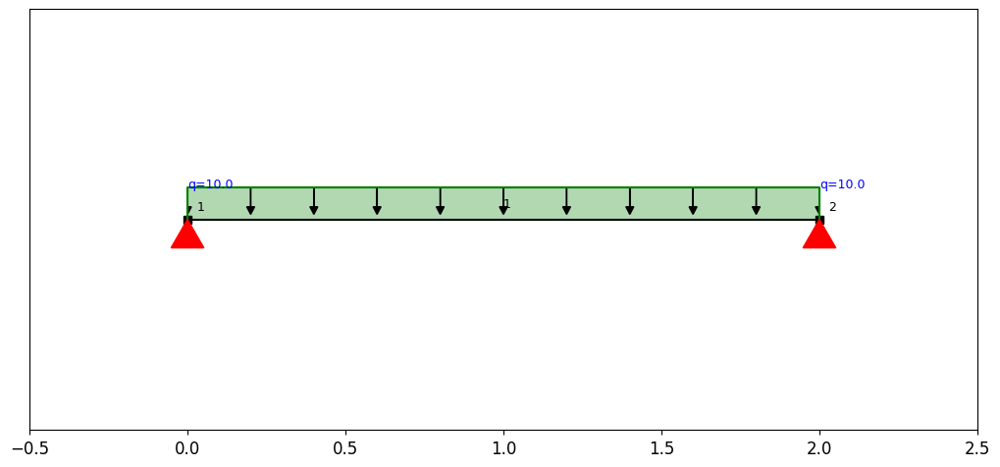

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

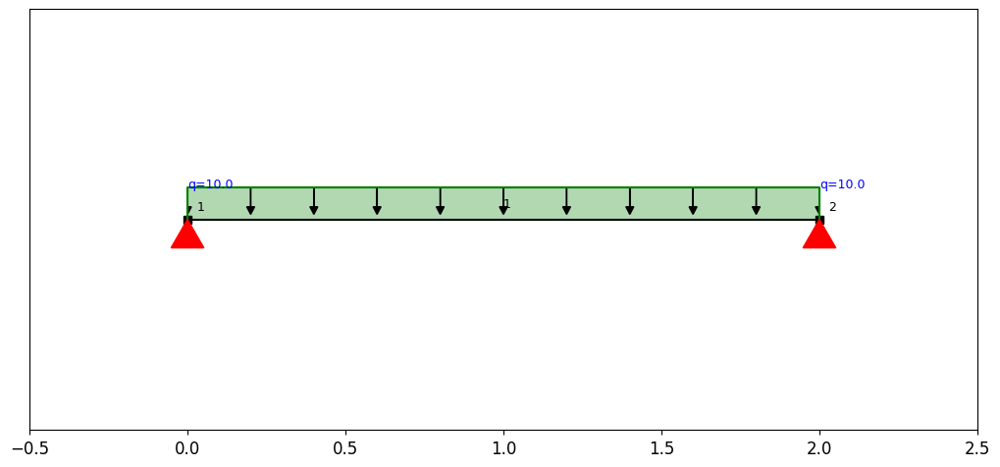

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

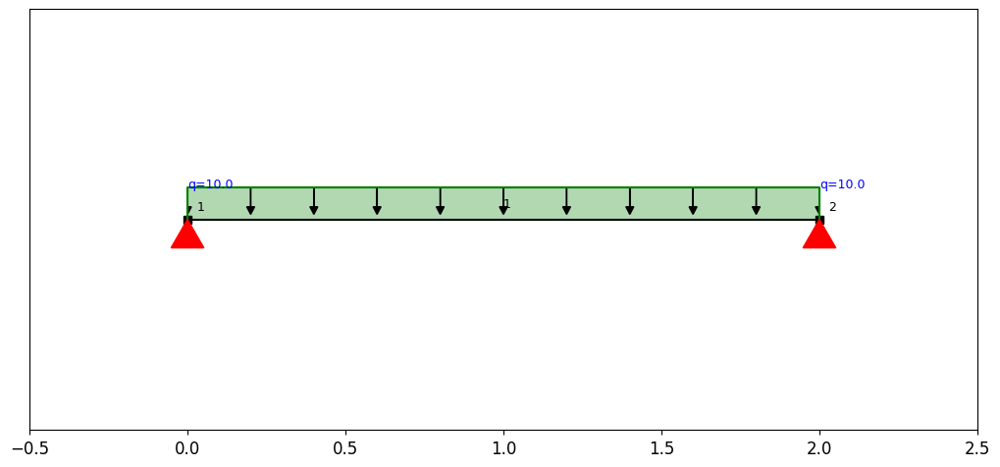

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

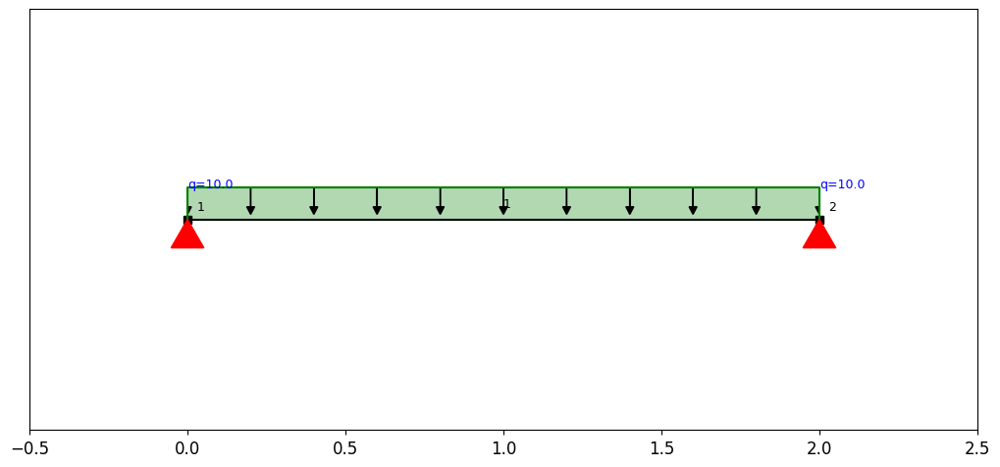

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

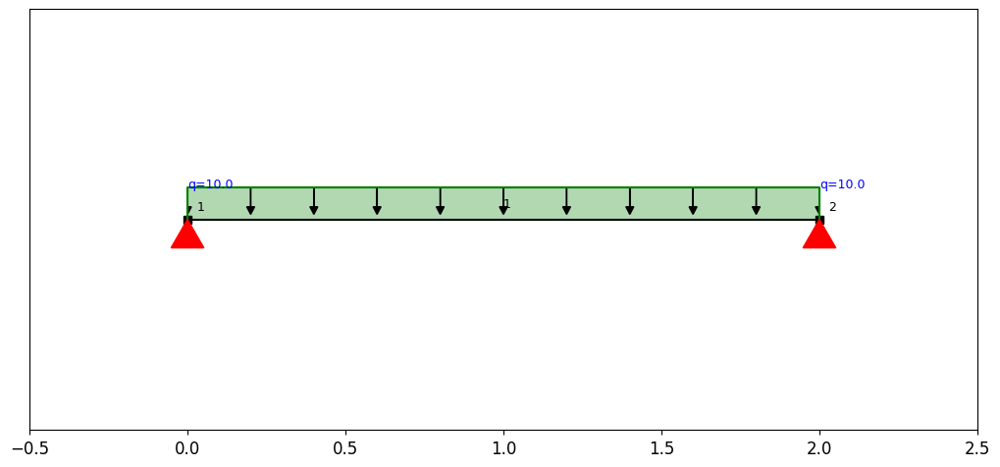

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

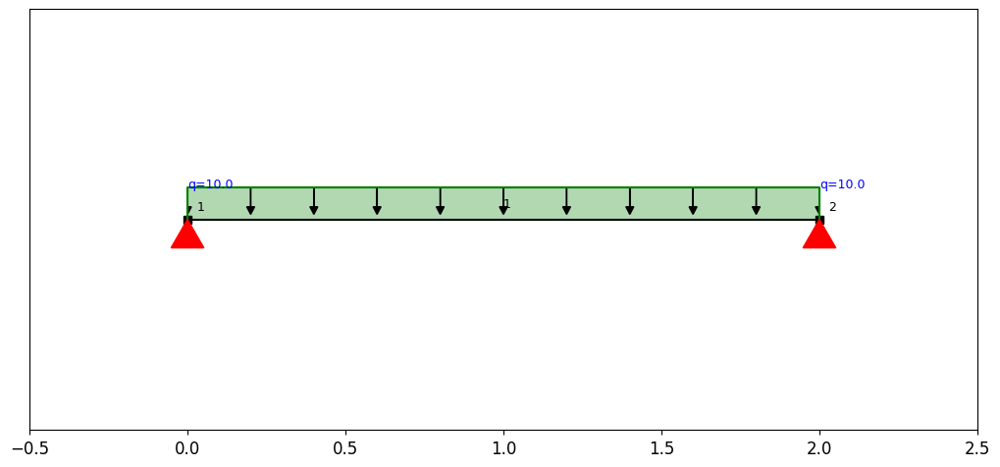

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

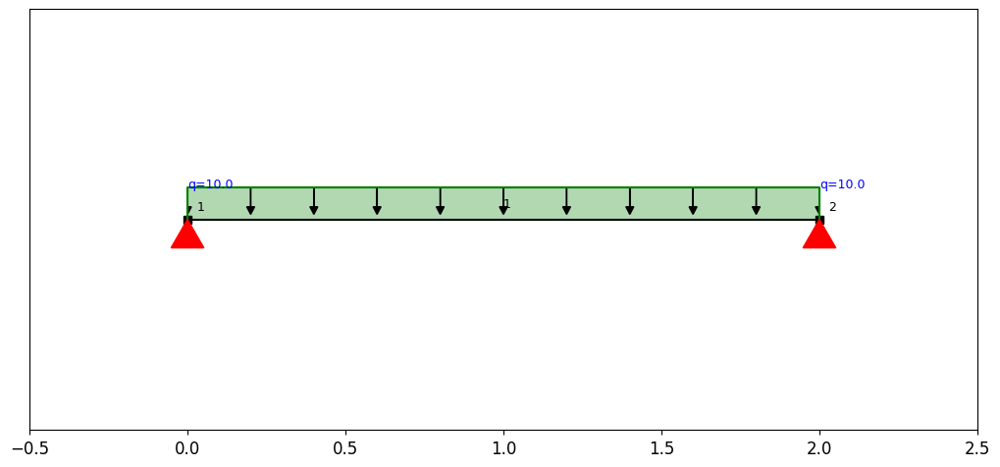

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

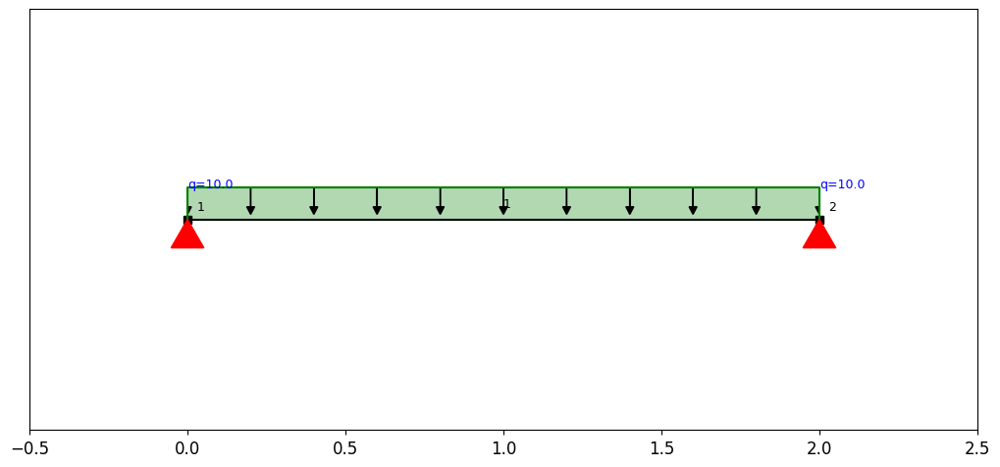

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

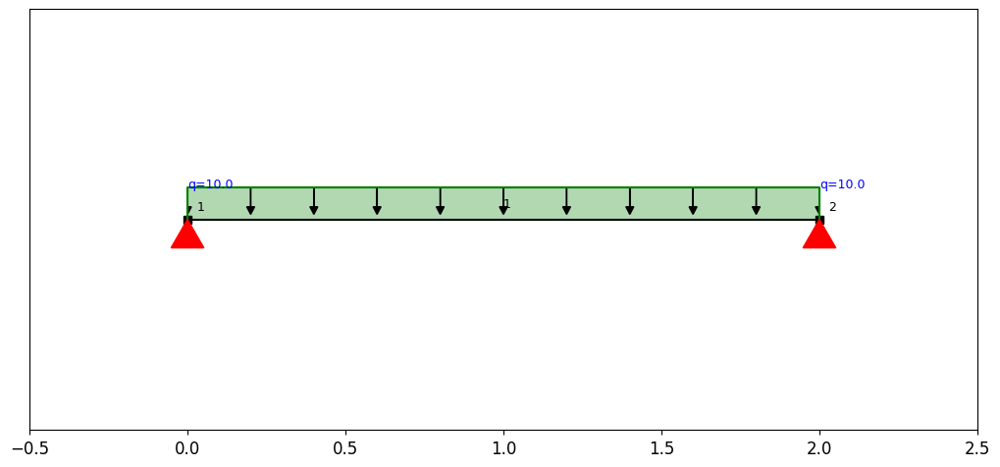

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

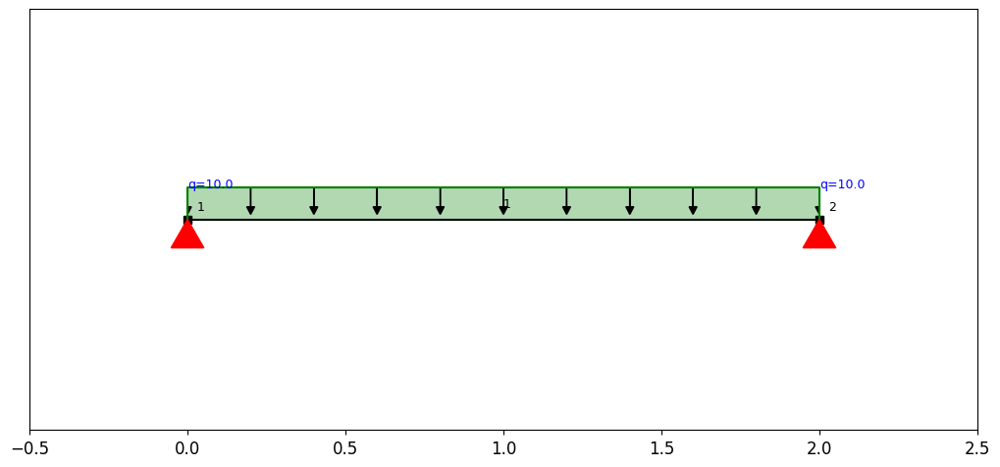

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


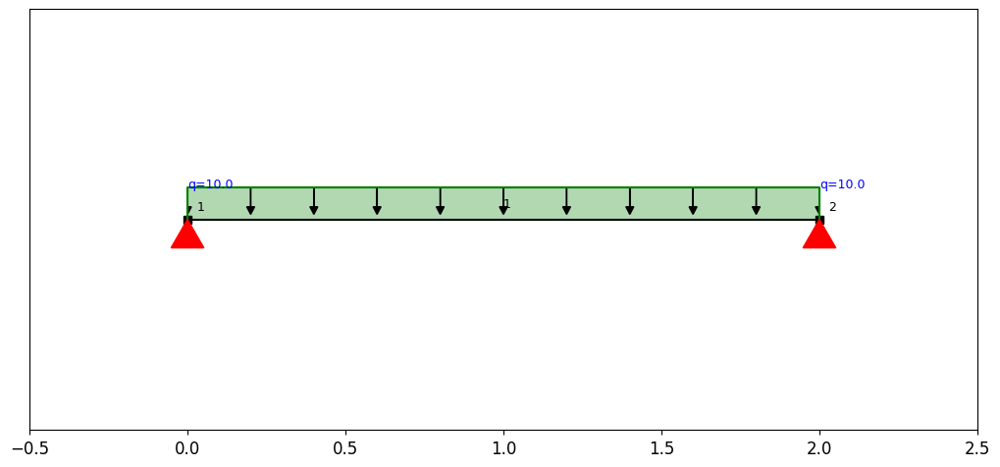

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

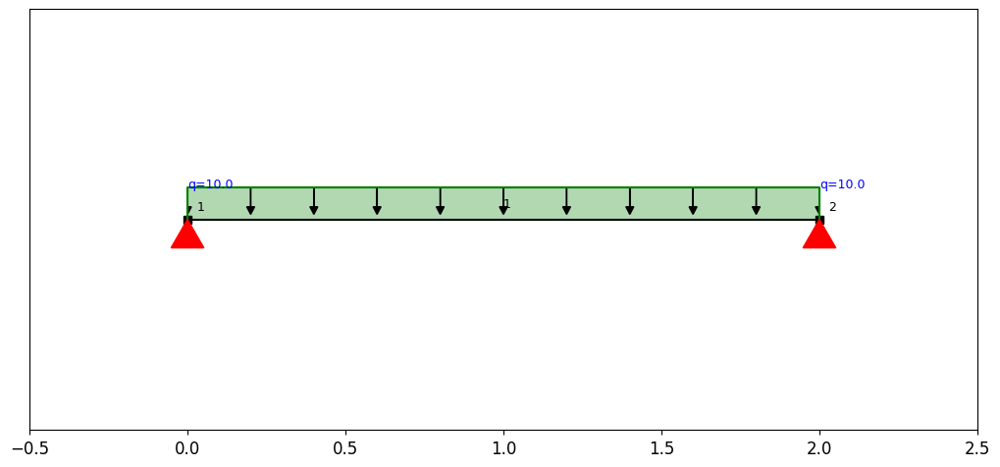

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

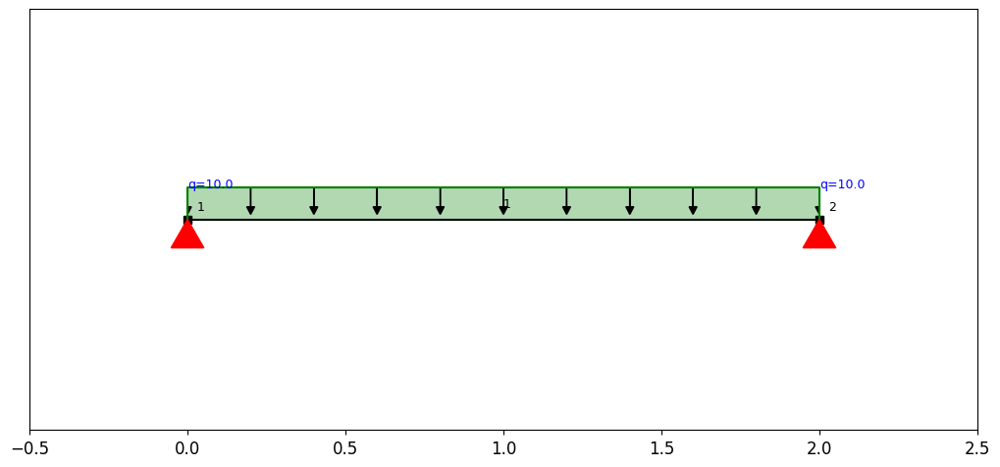

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

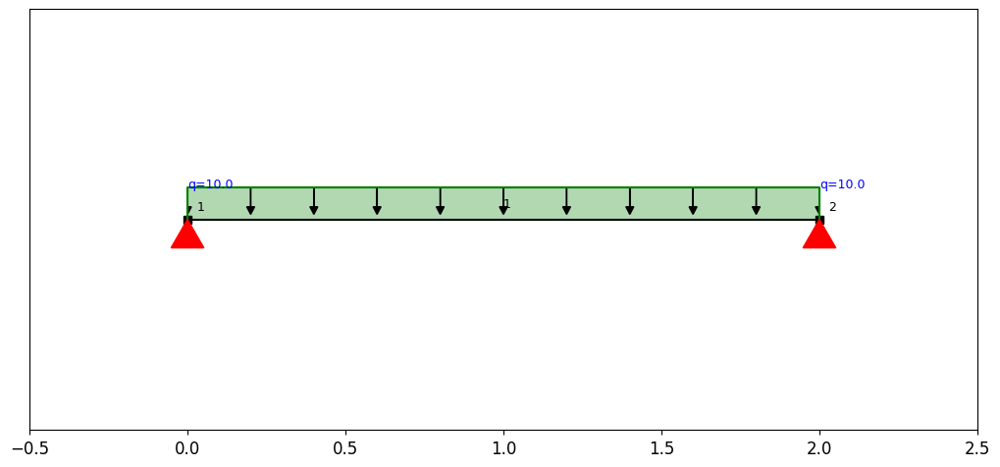

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


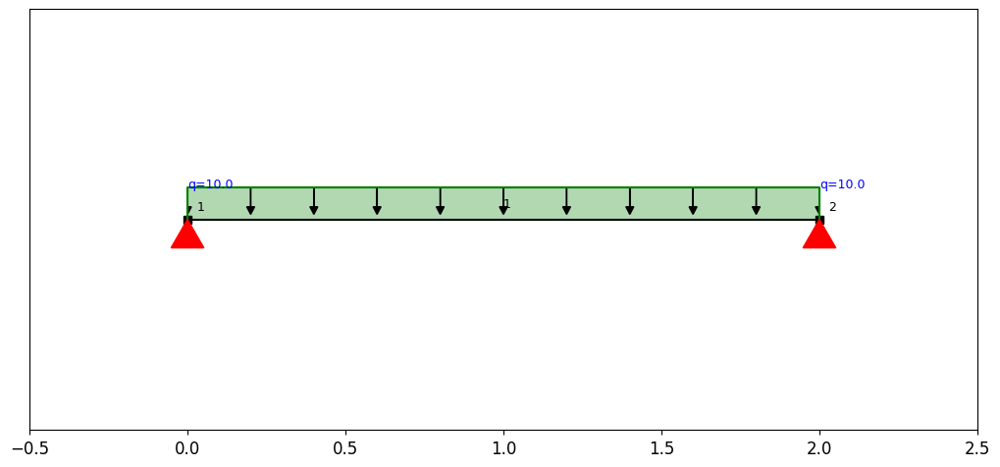

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

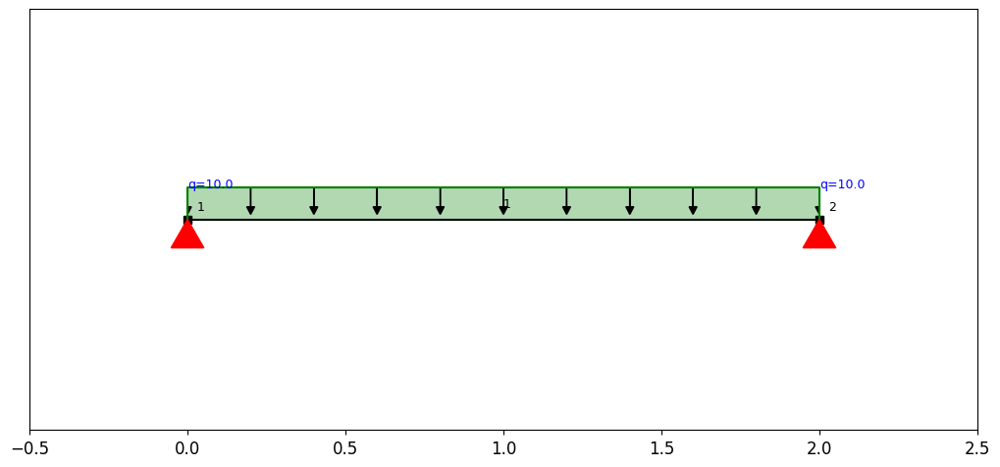

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e6
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:25: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Avy = float(section["Avy"

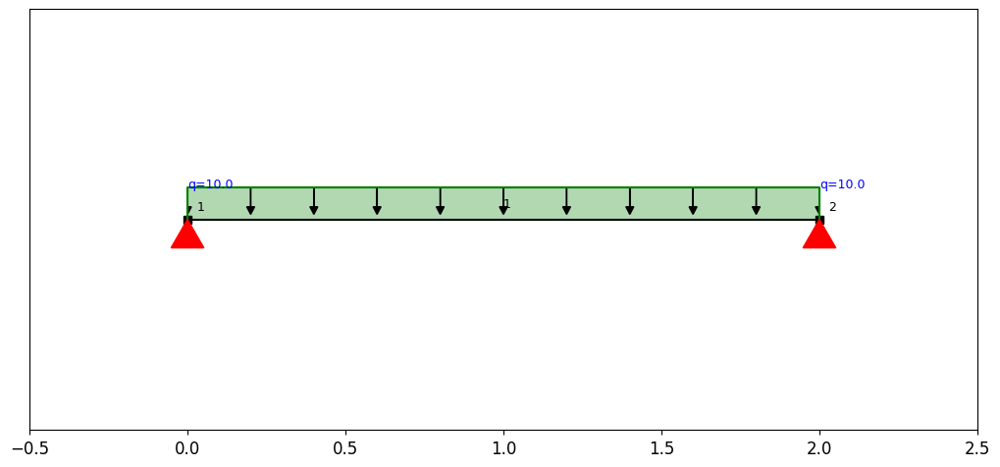

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

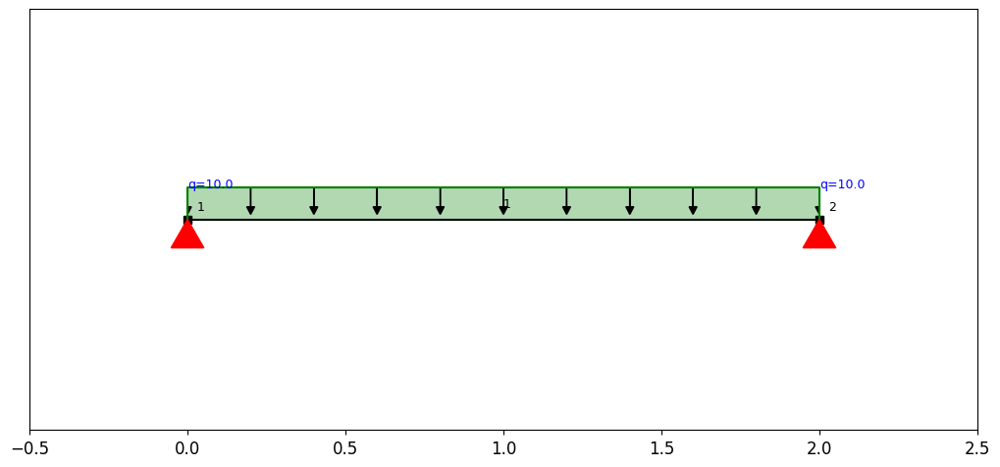

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

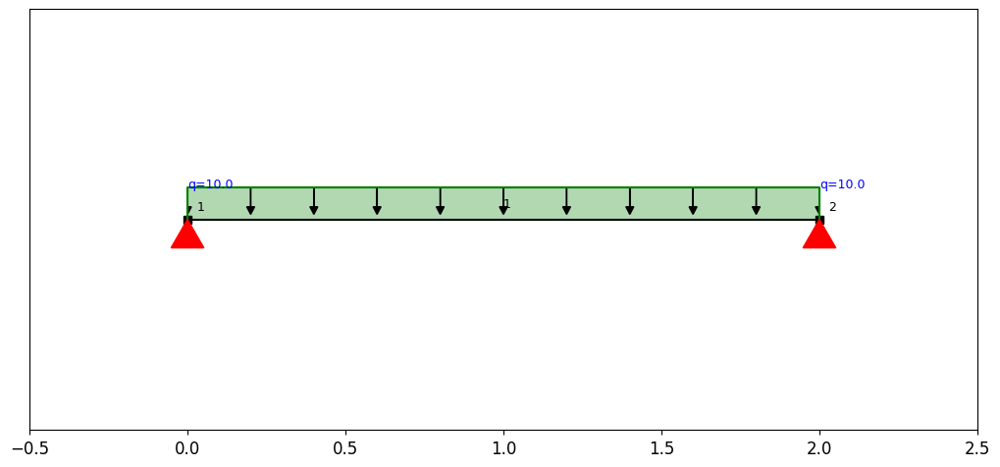

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

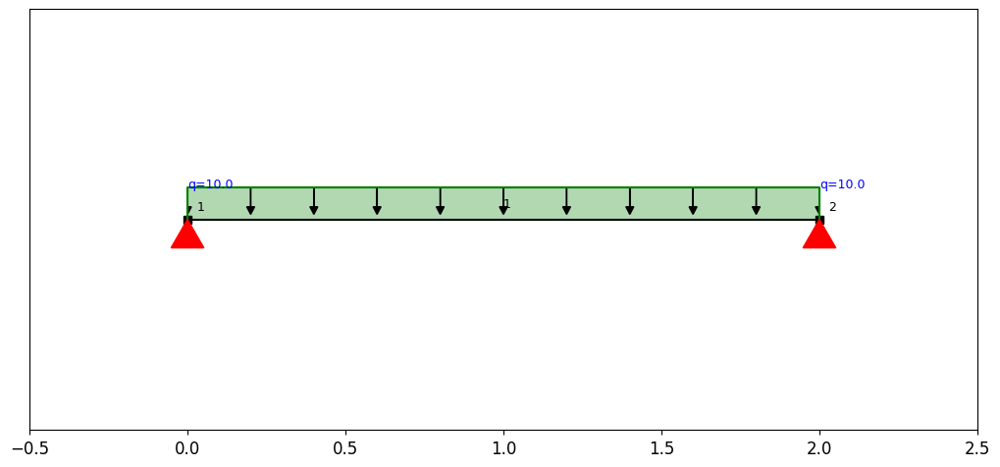

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

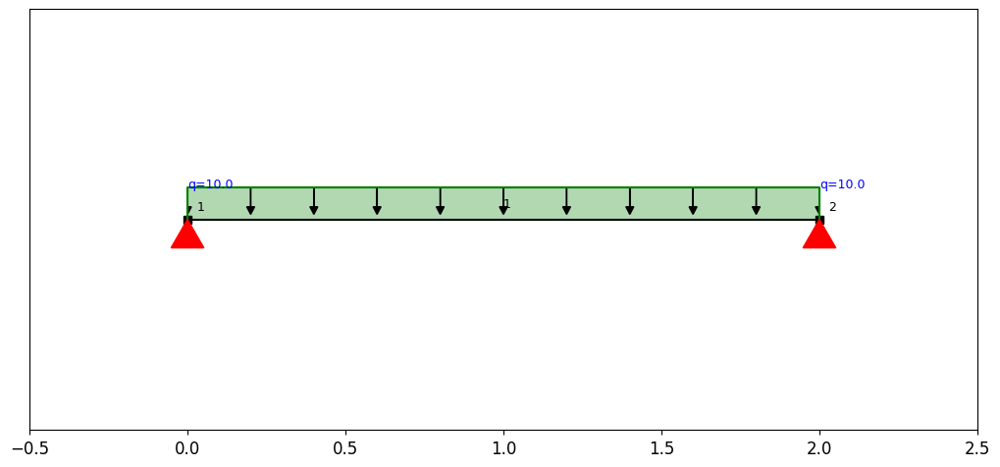

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

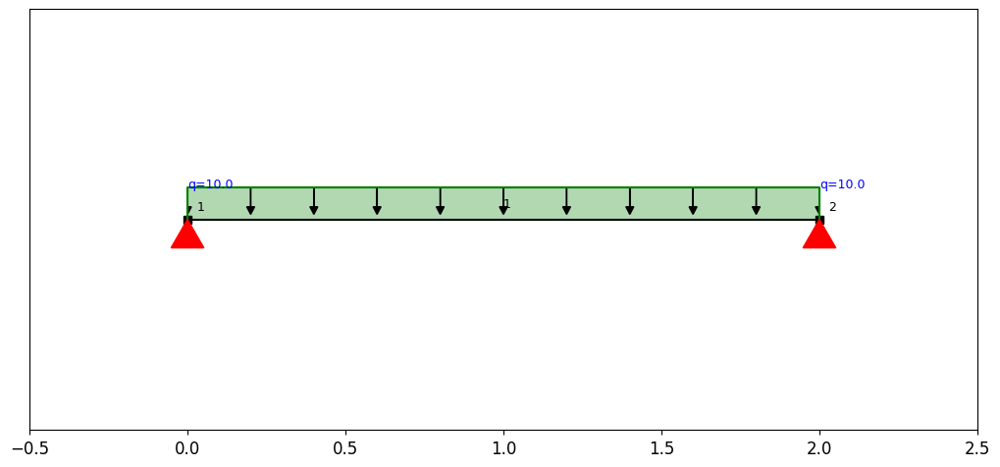

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

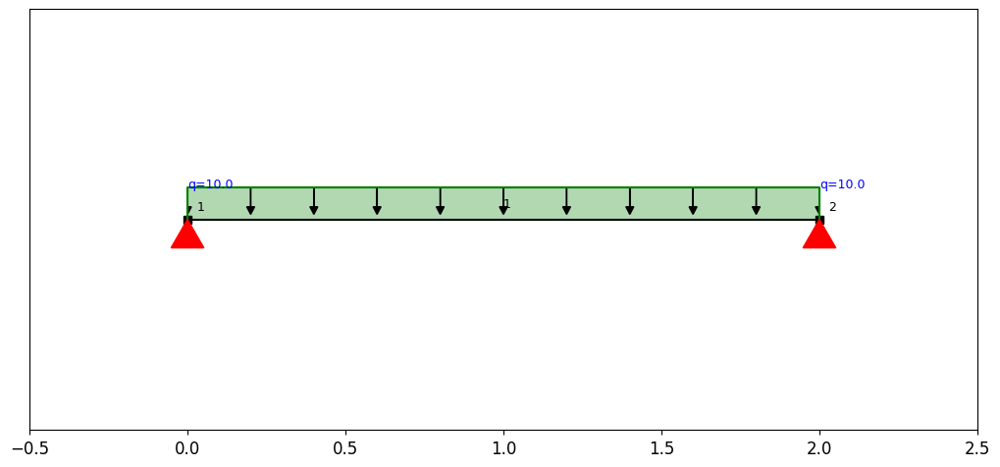

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


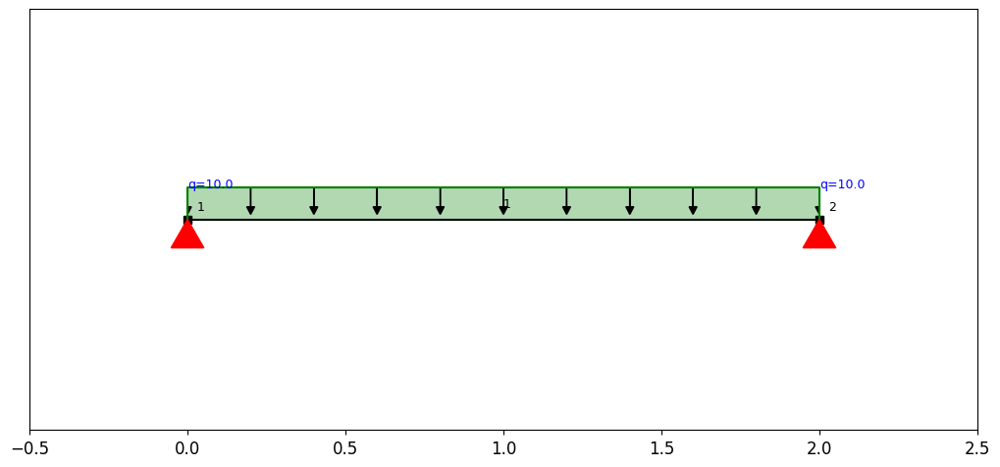

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

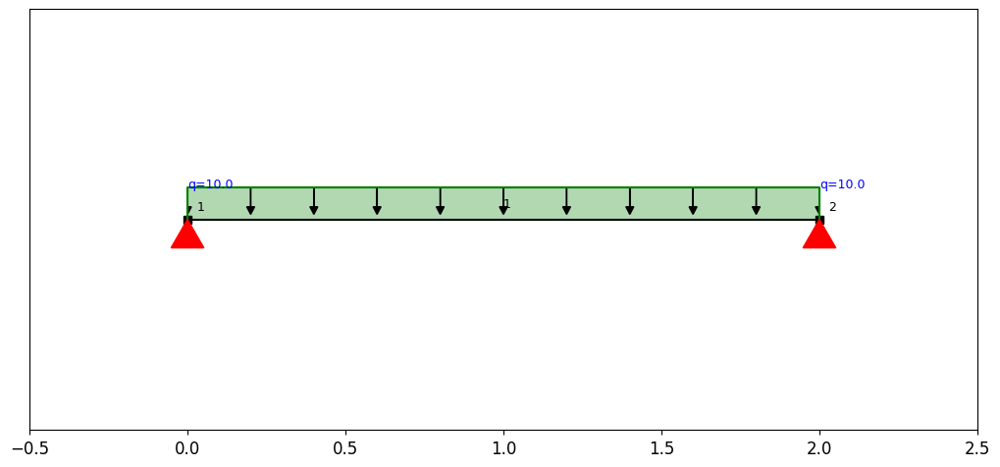

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

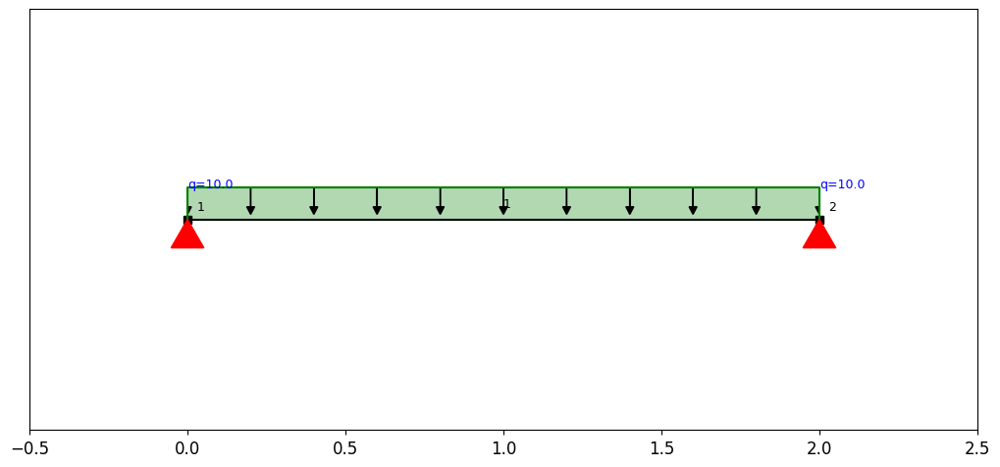

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

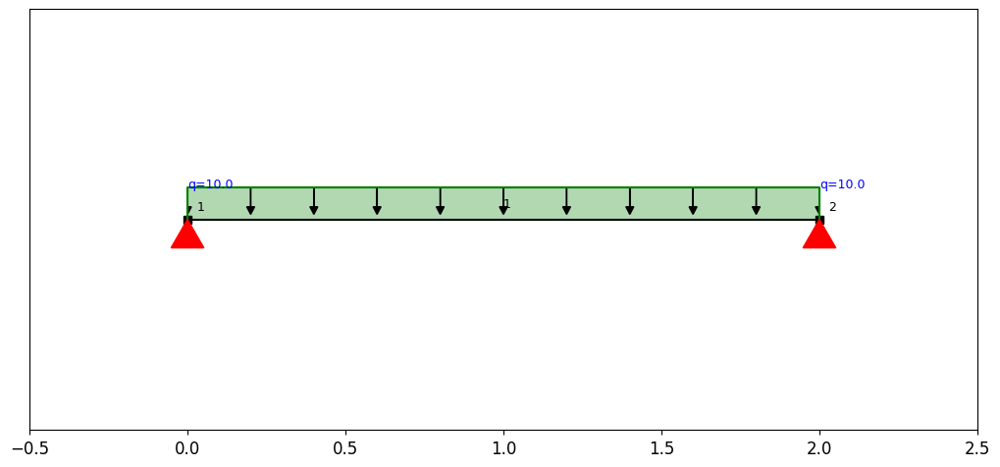

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

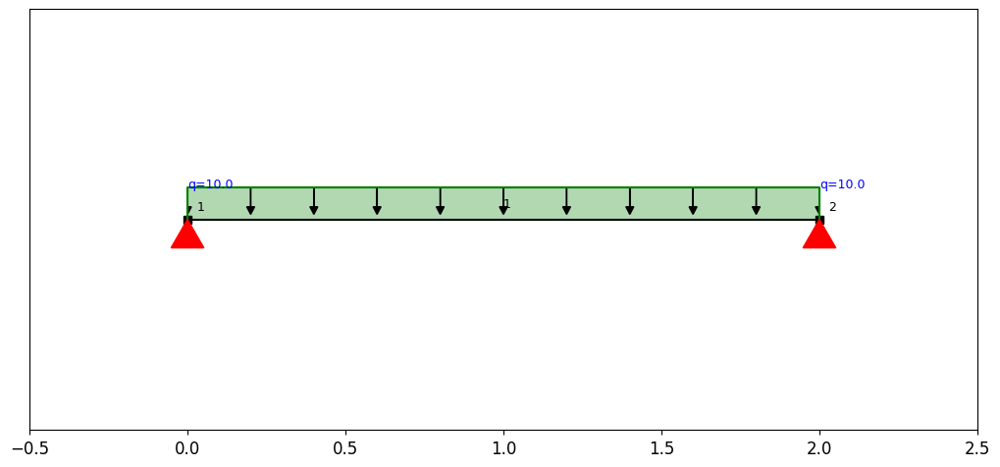

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


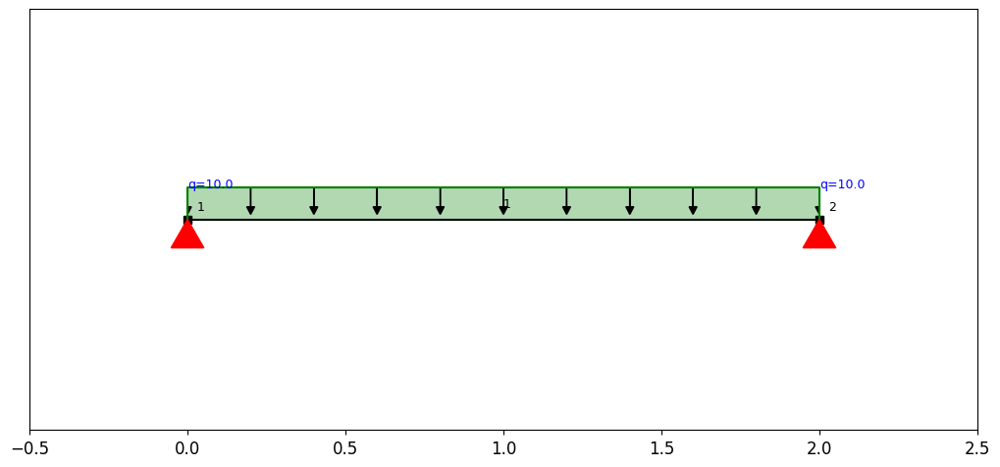

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


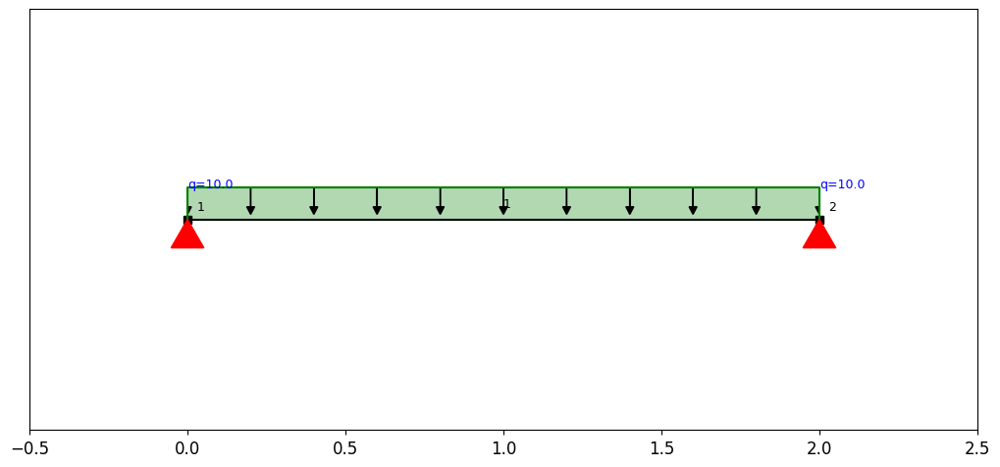

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


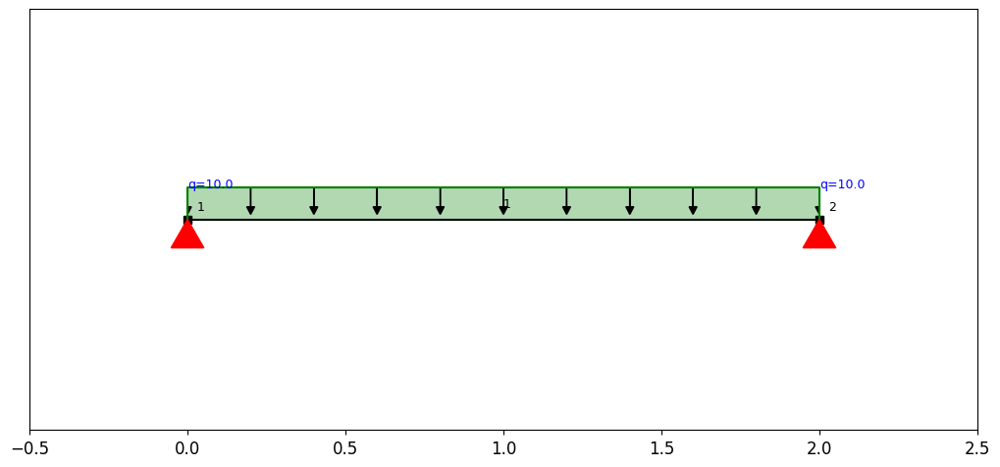

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

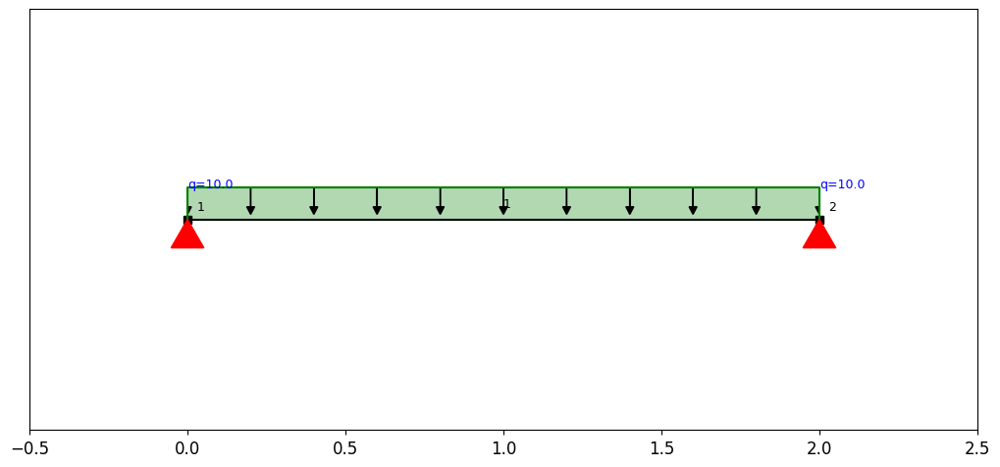

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

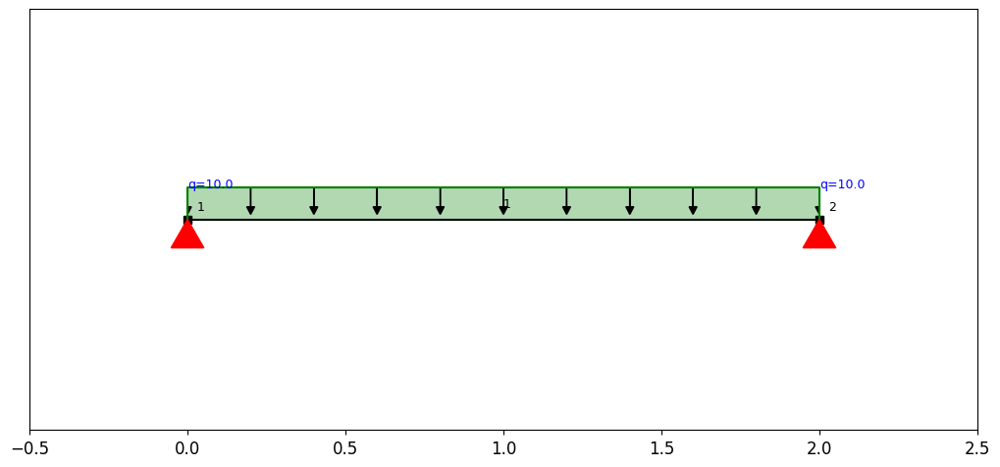

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

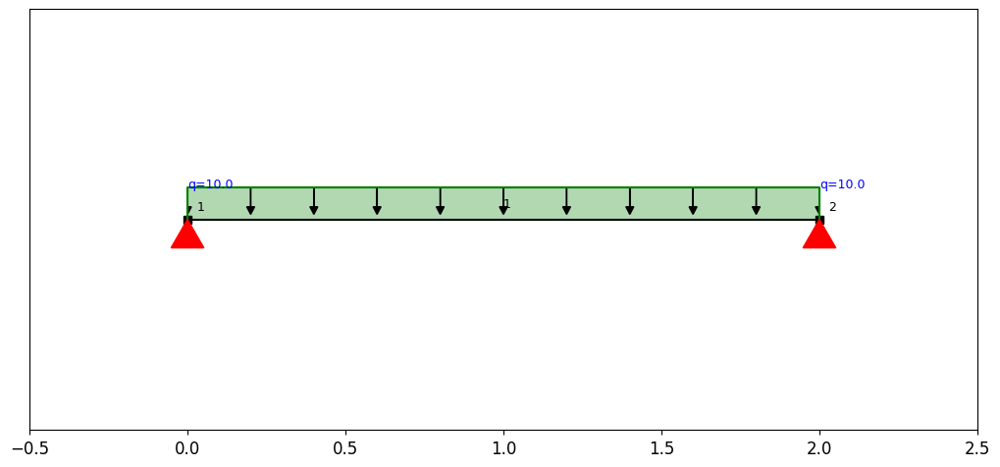

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

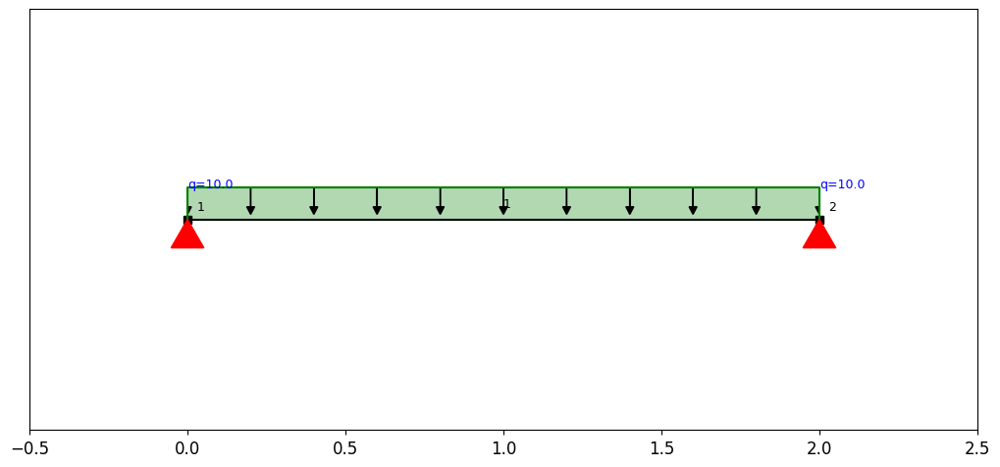

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

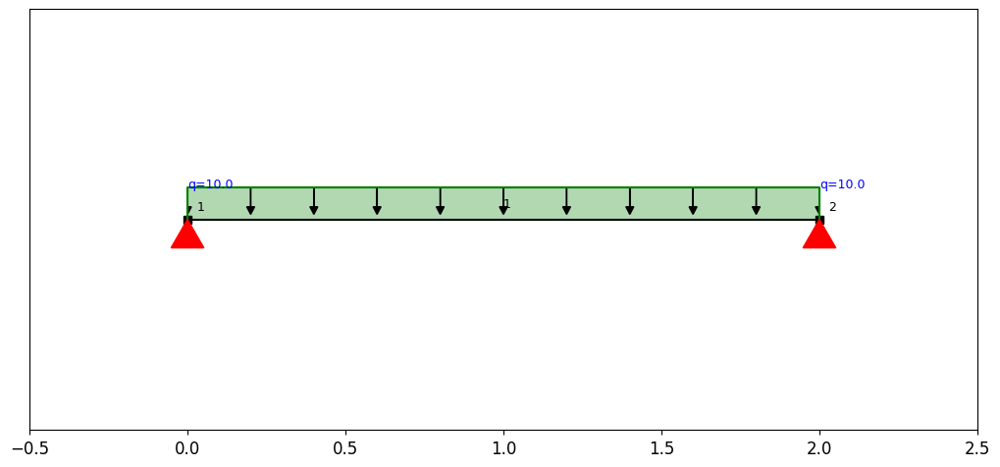

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

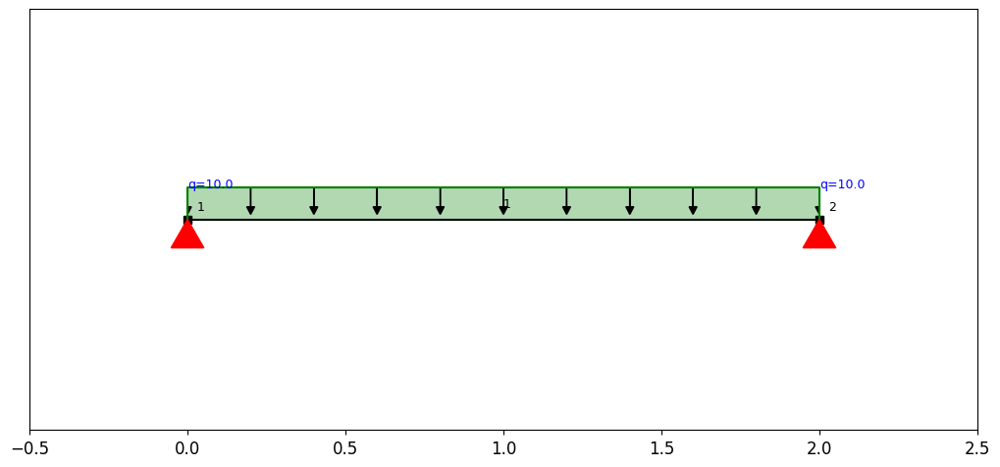

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

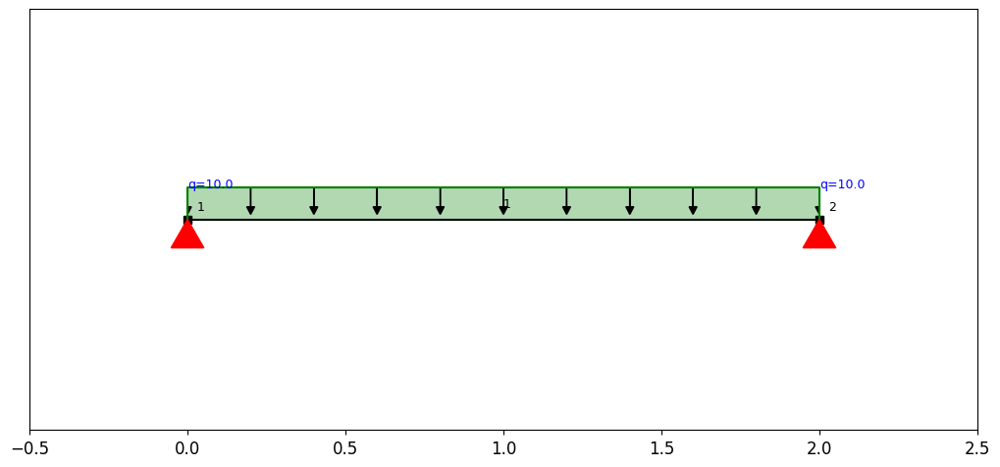

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

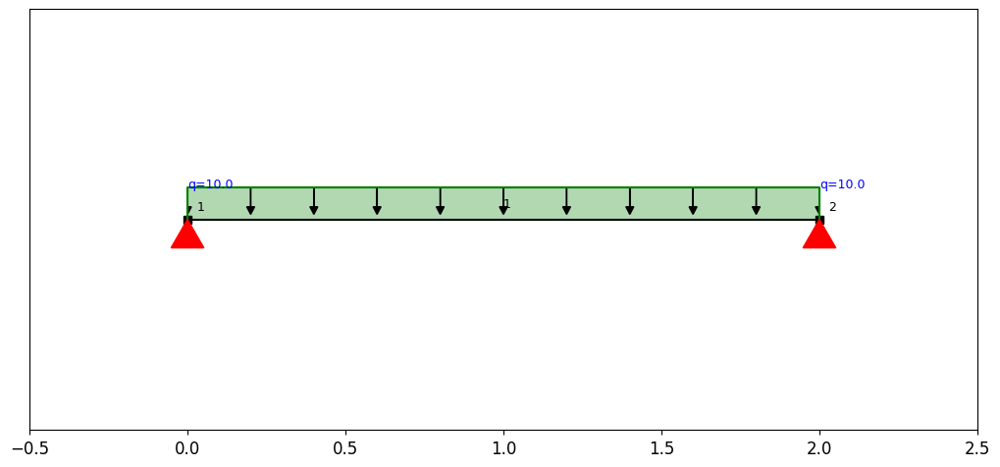

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

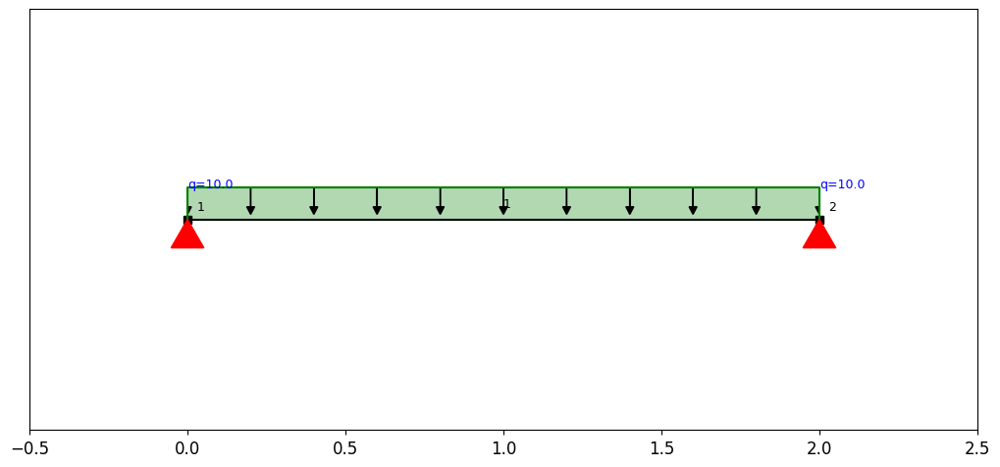

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

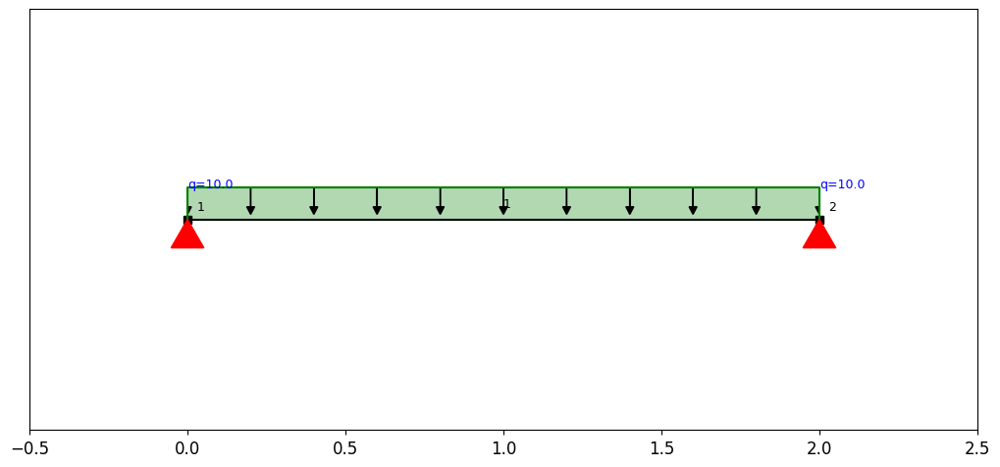

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

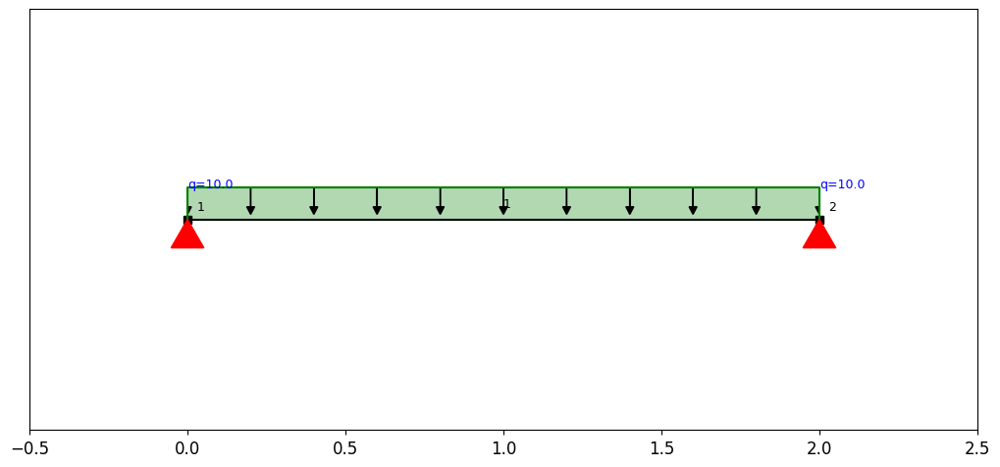

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

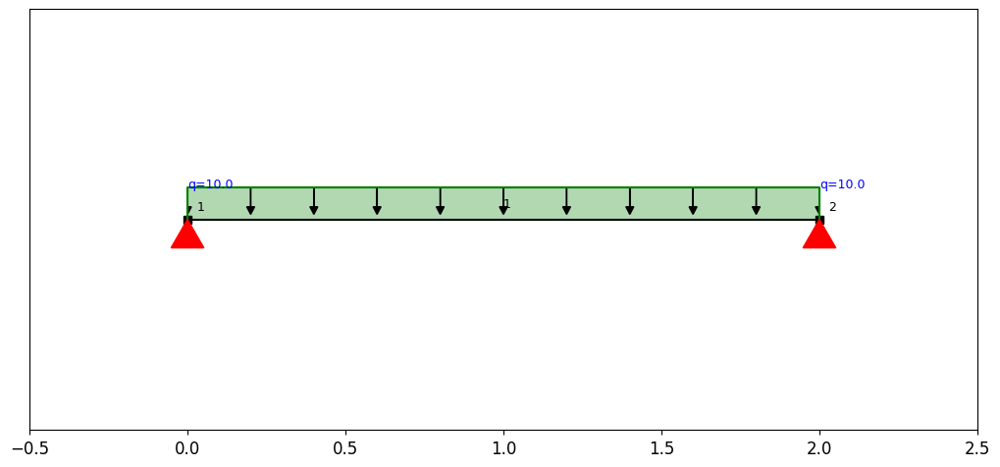

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

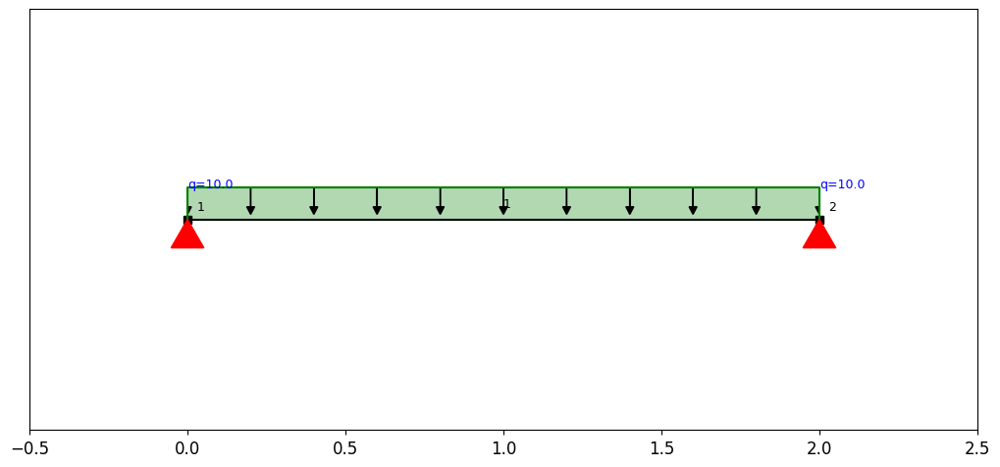

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


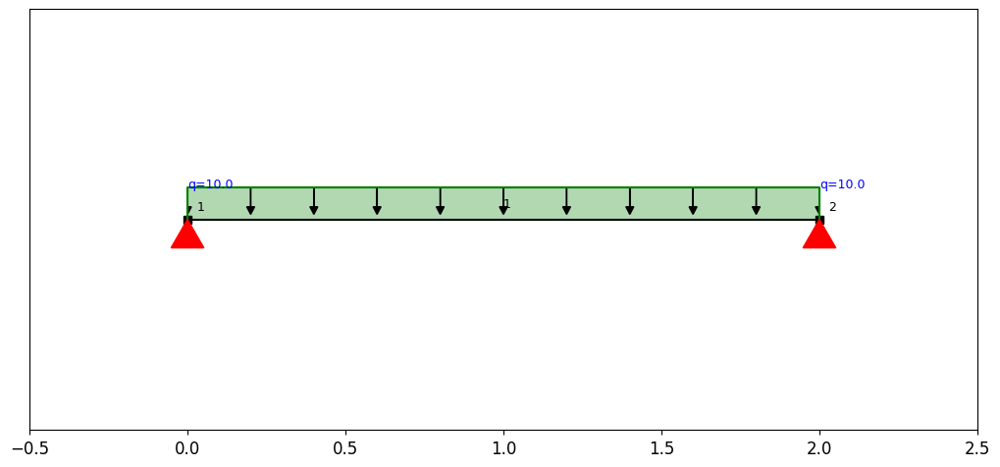

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


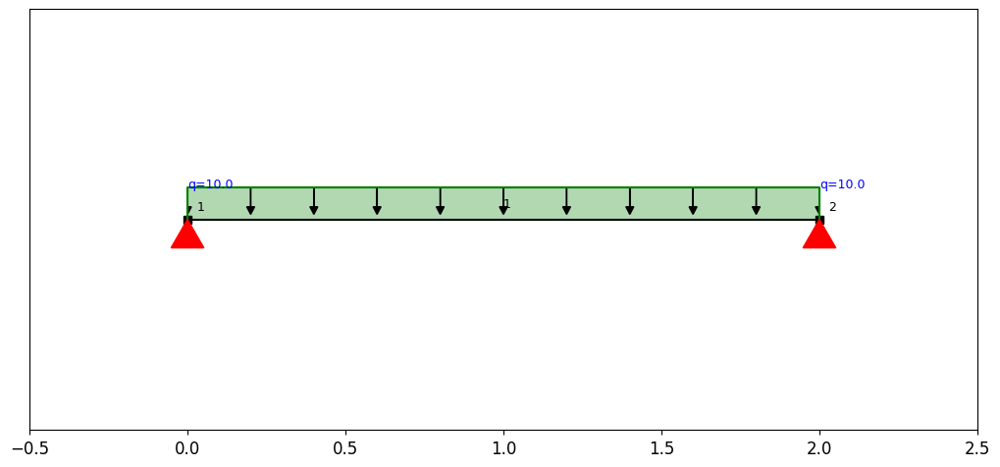

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

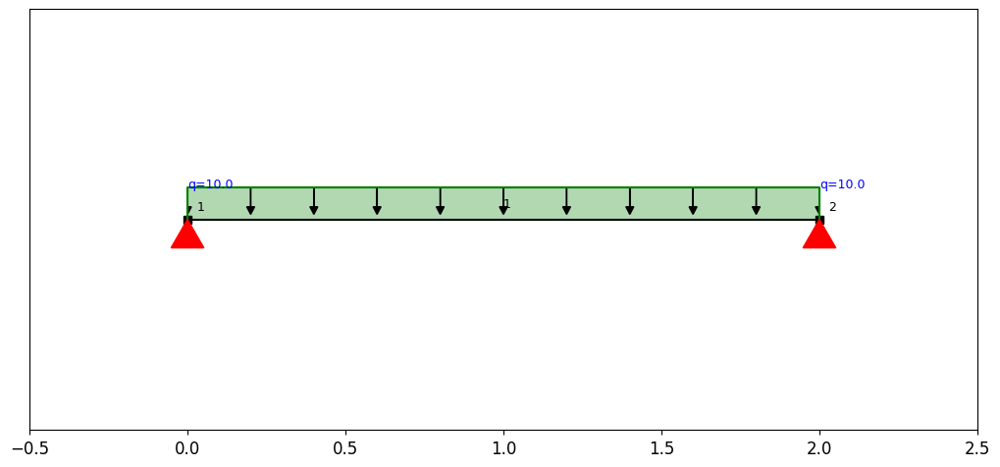

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

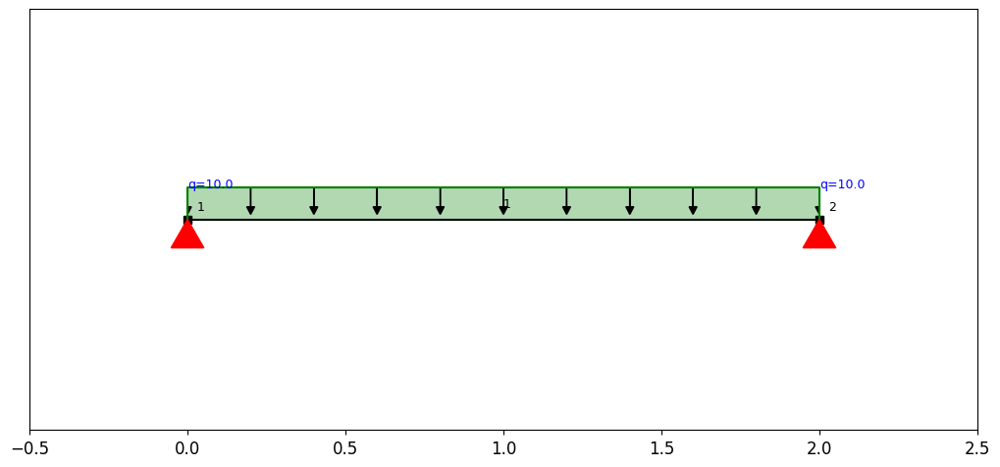

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

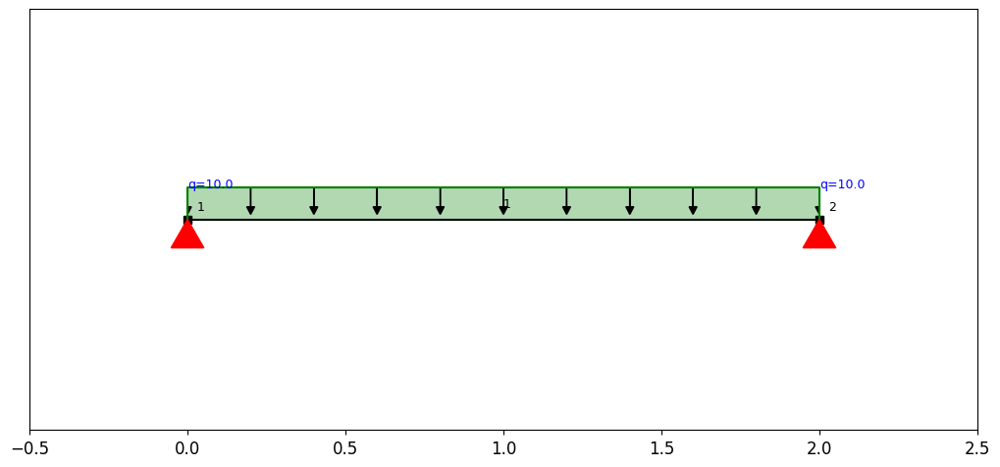

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

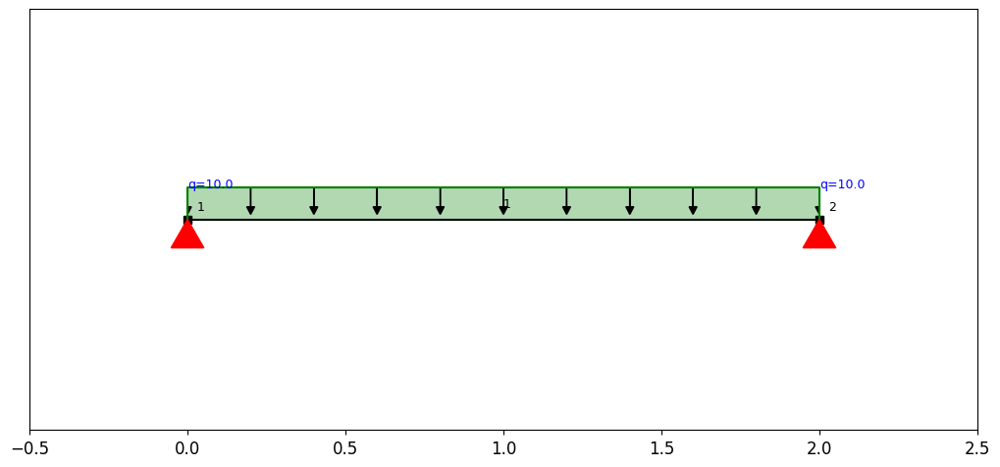

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

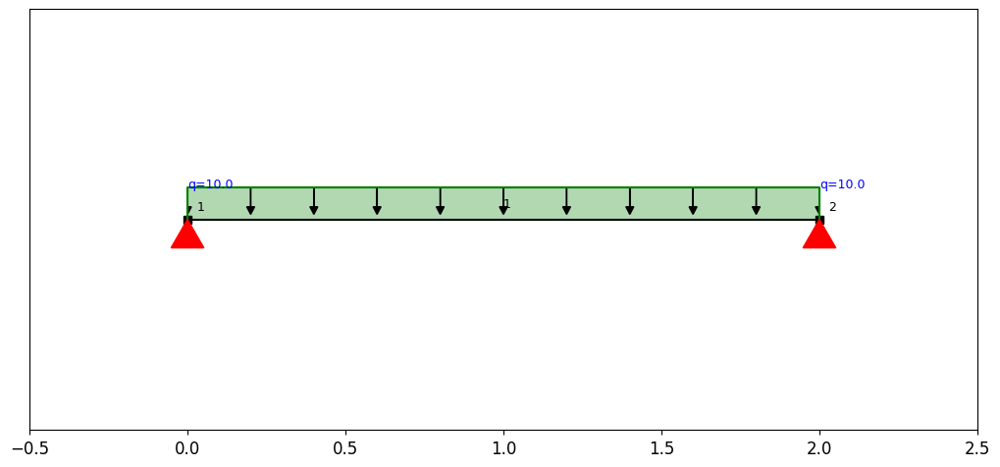

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

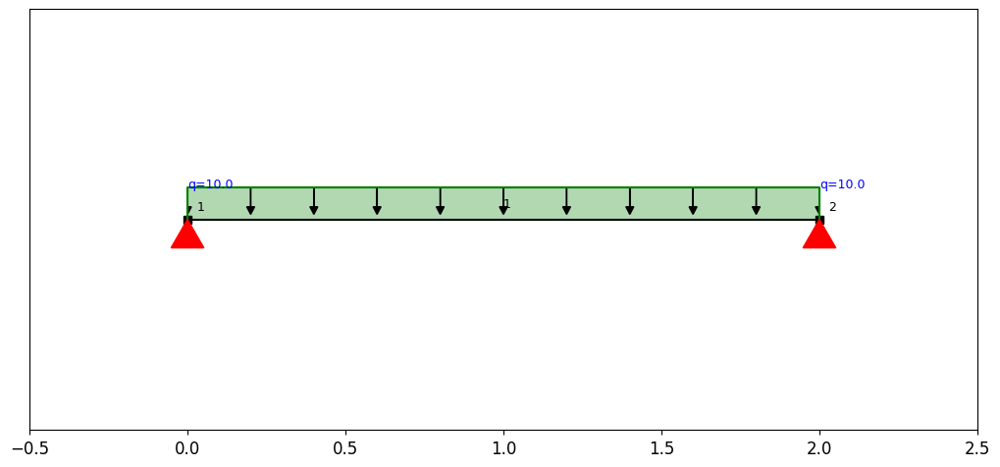

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

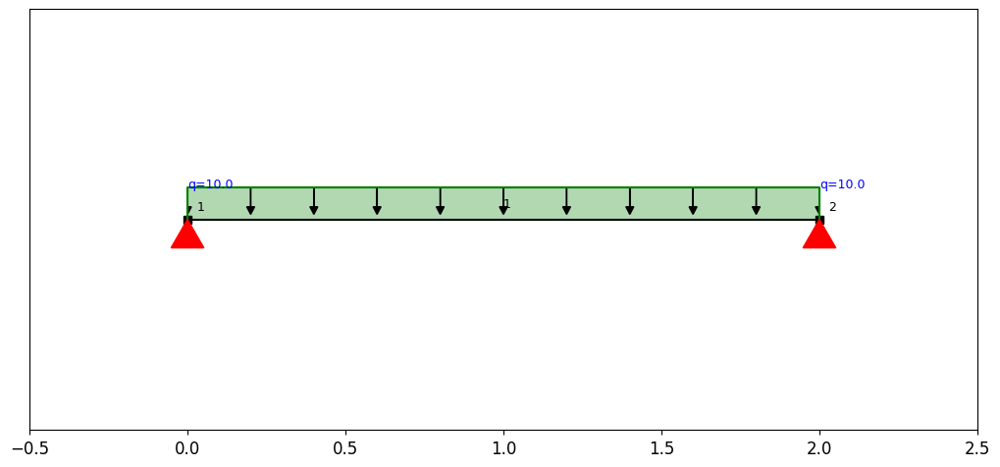

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

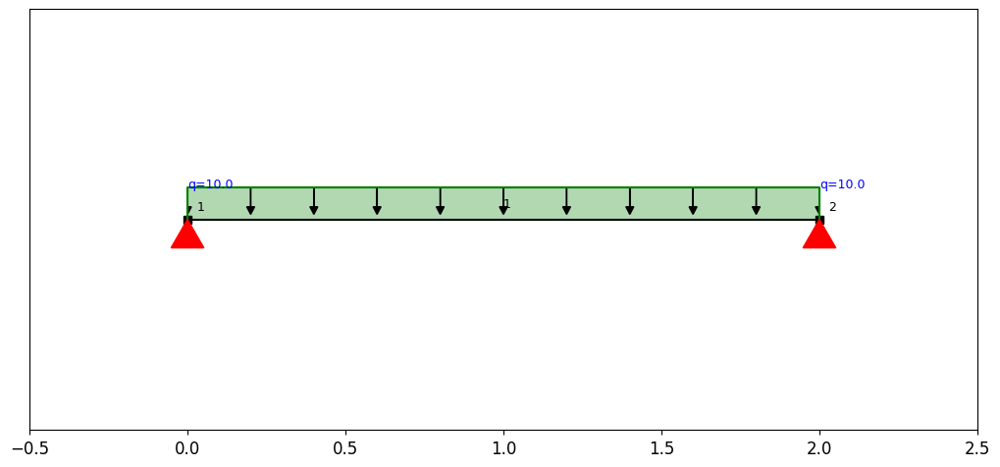

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

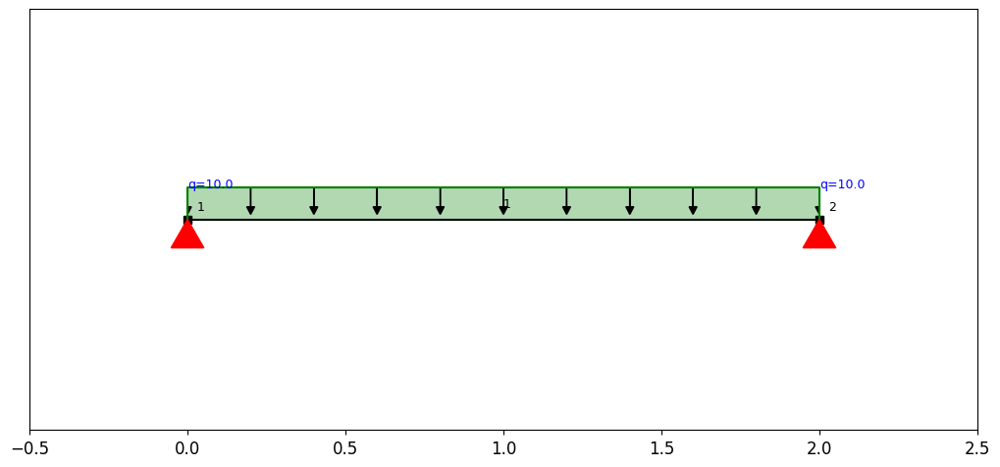

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

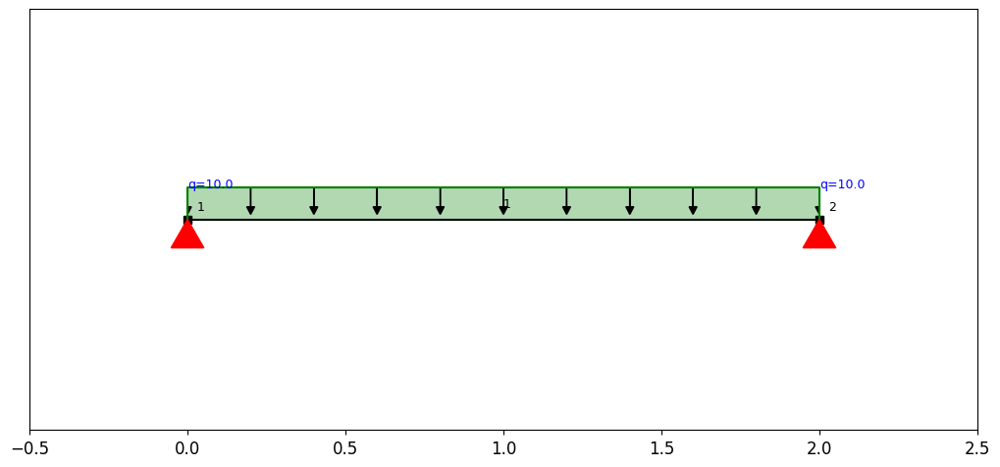

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

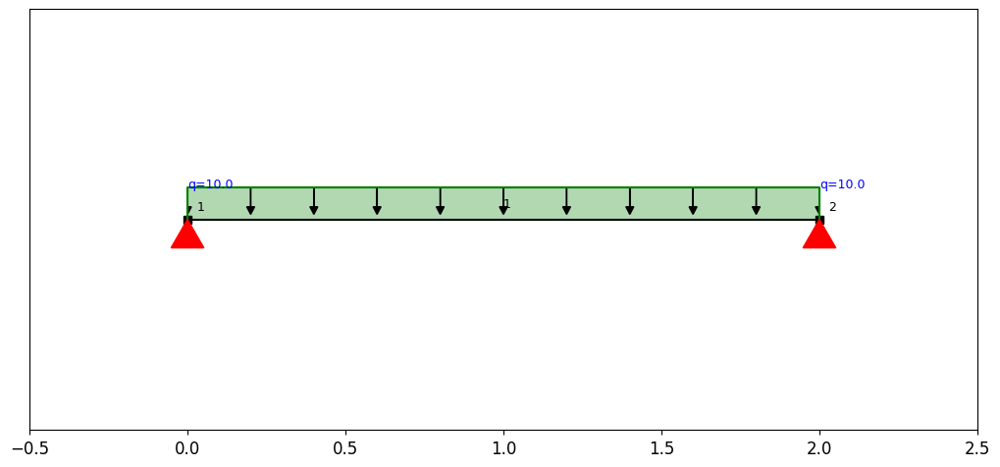

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

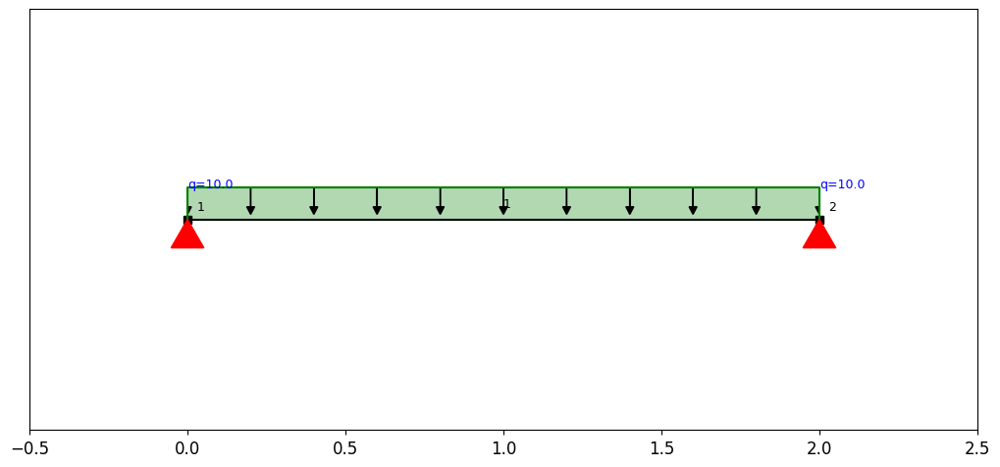

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

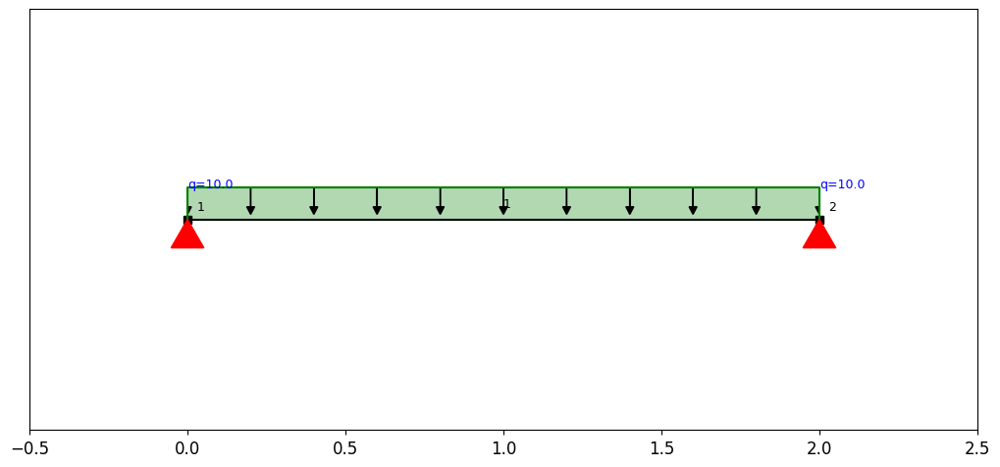

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

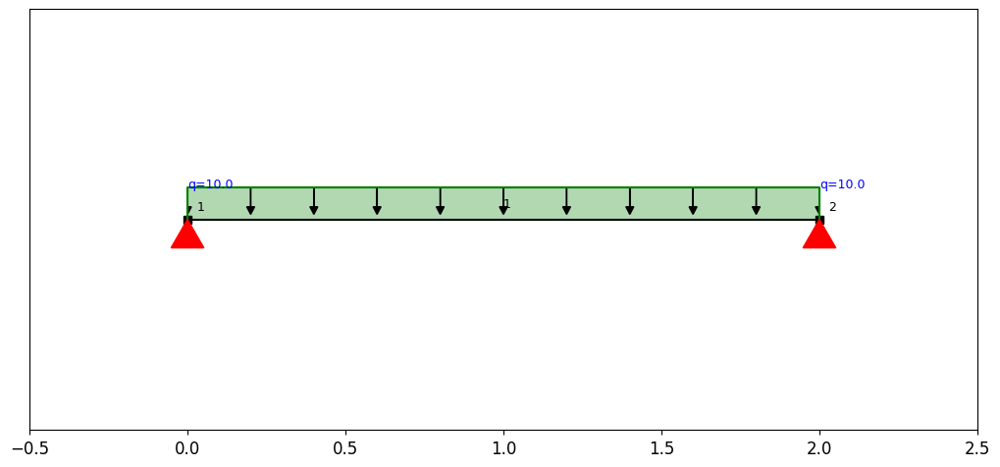

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

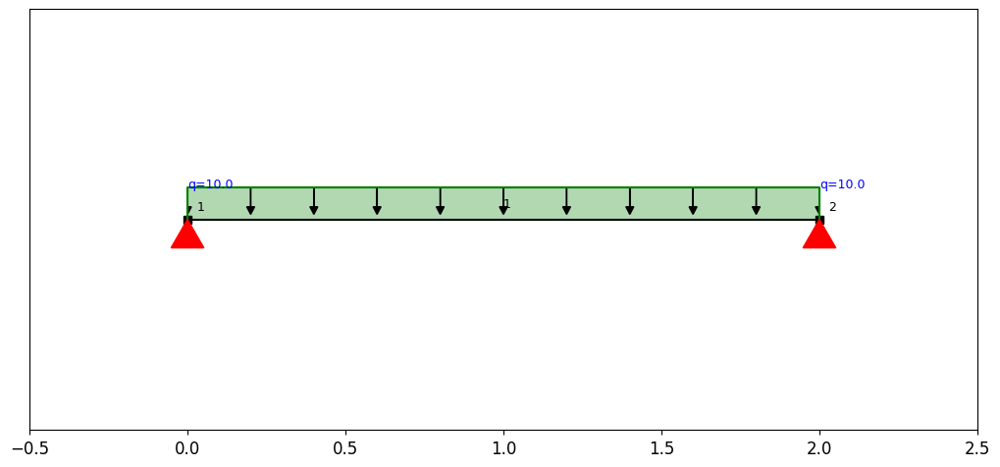

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

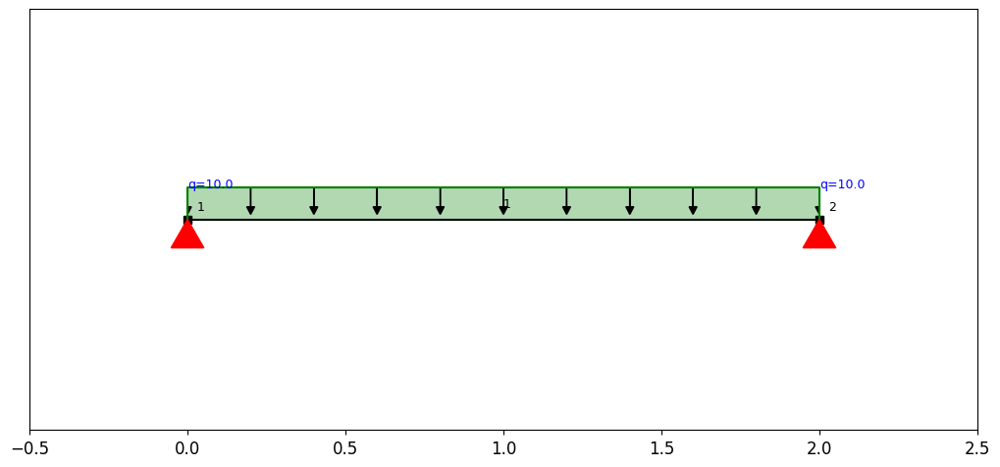

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

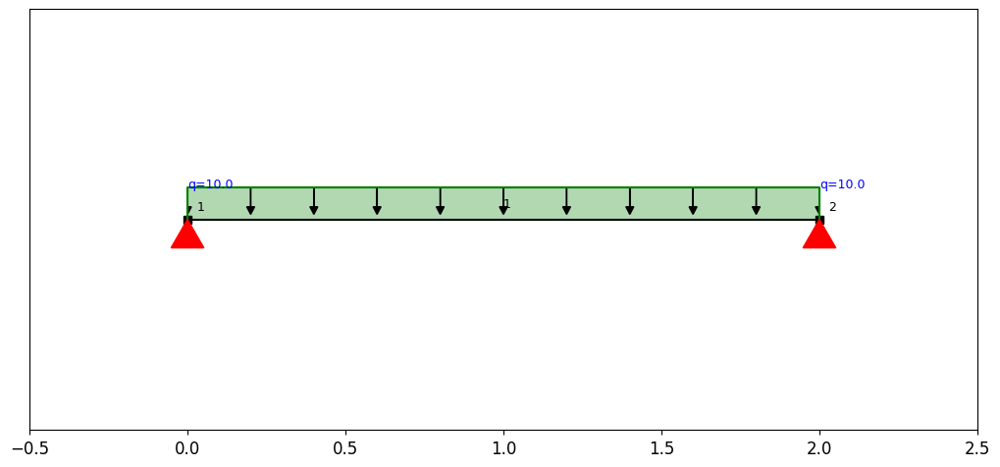

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

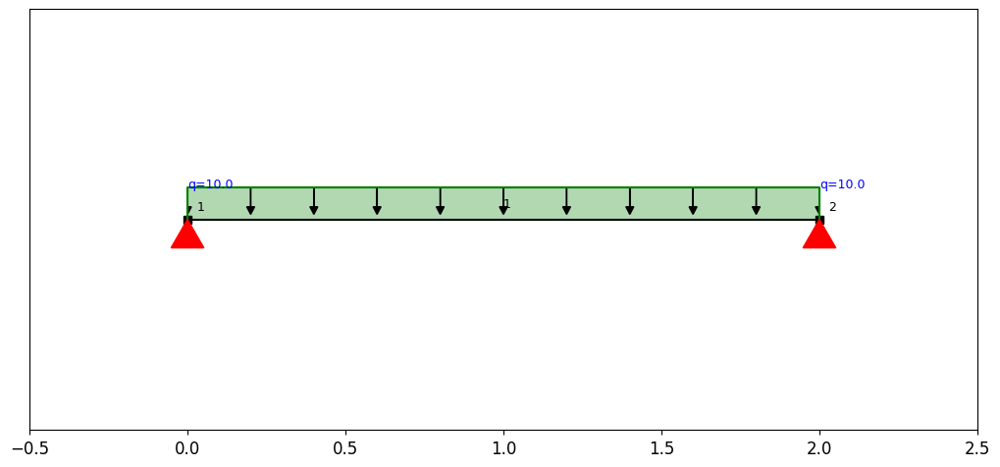

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

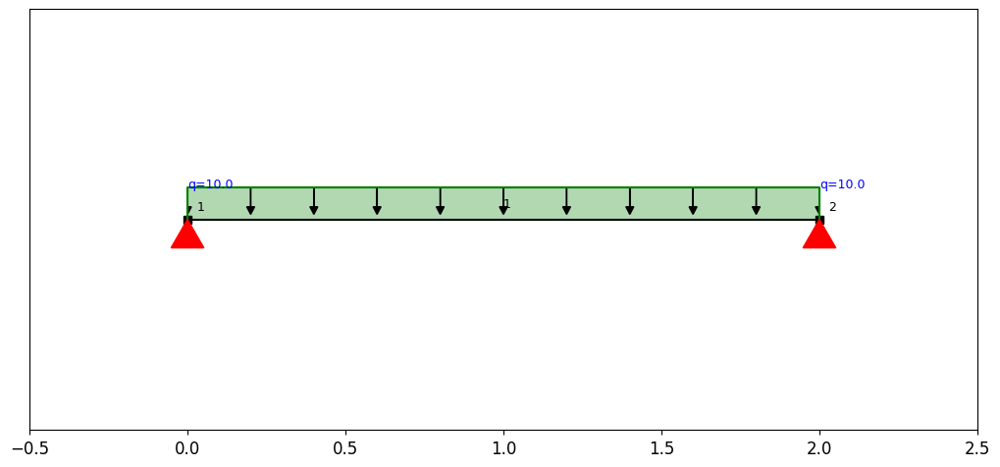

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

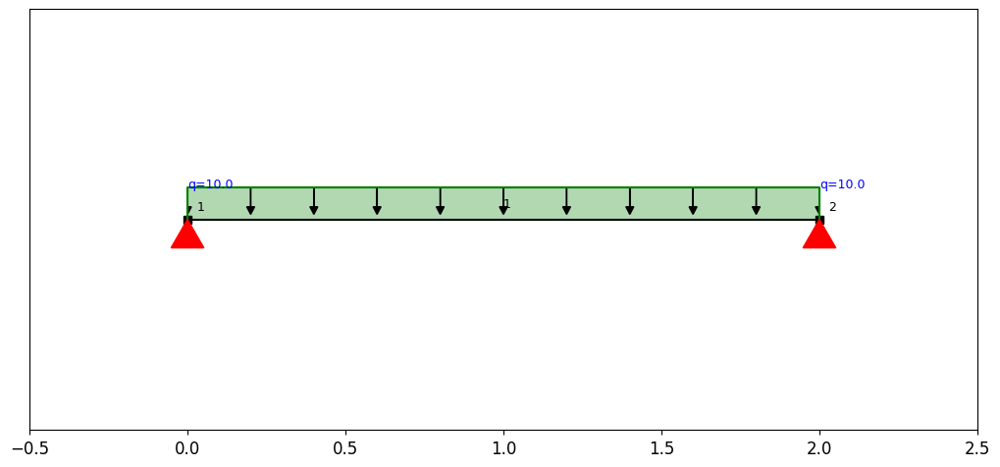

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

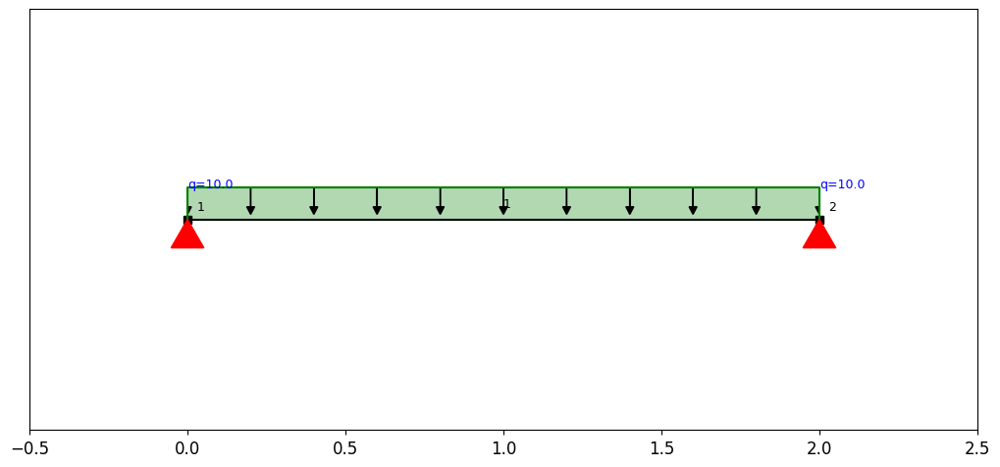

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

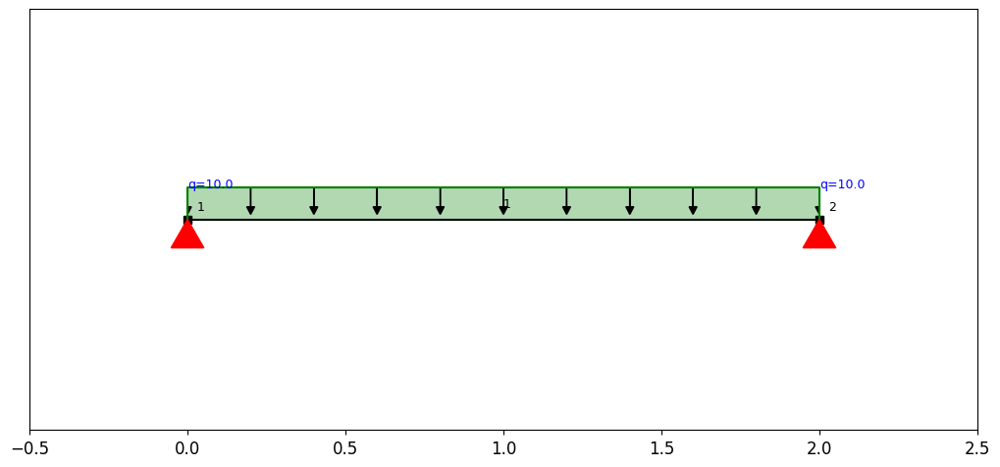

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

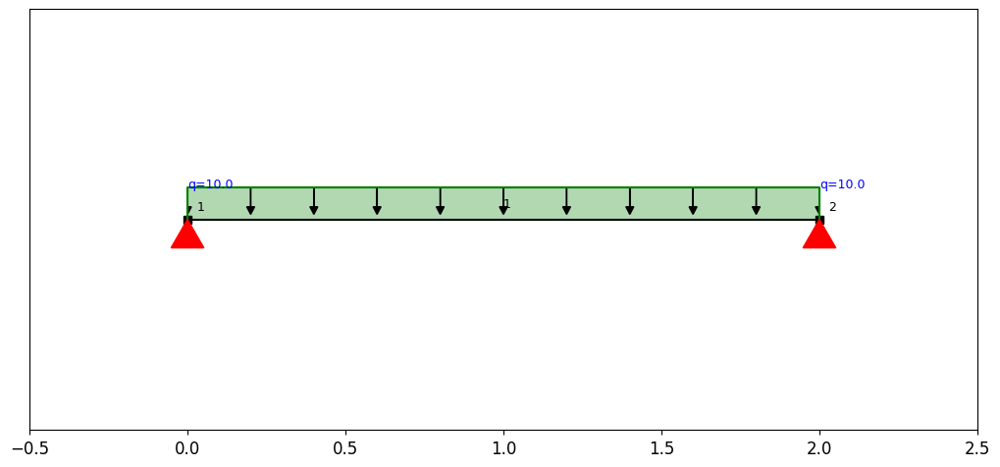

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

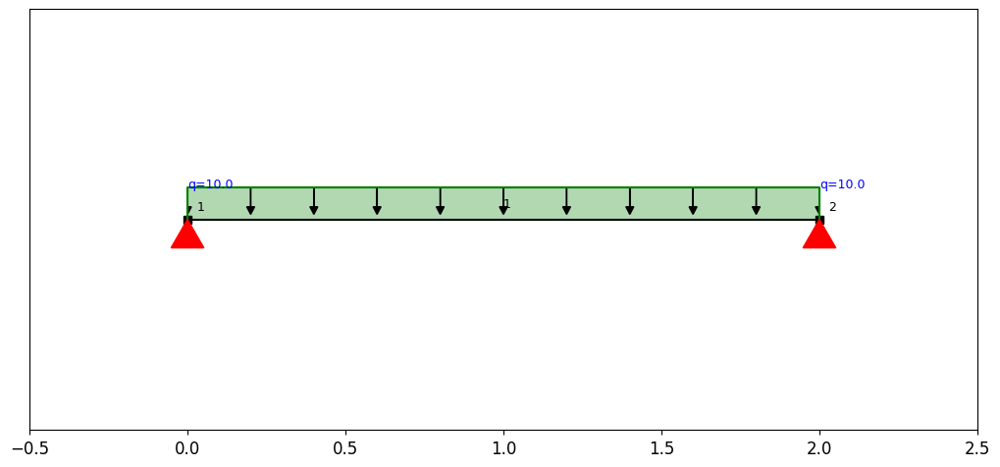

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

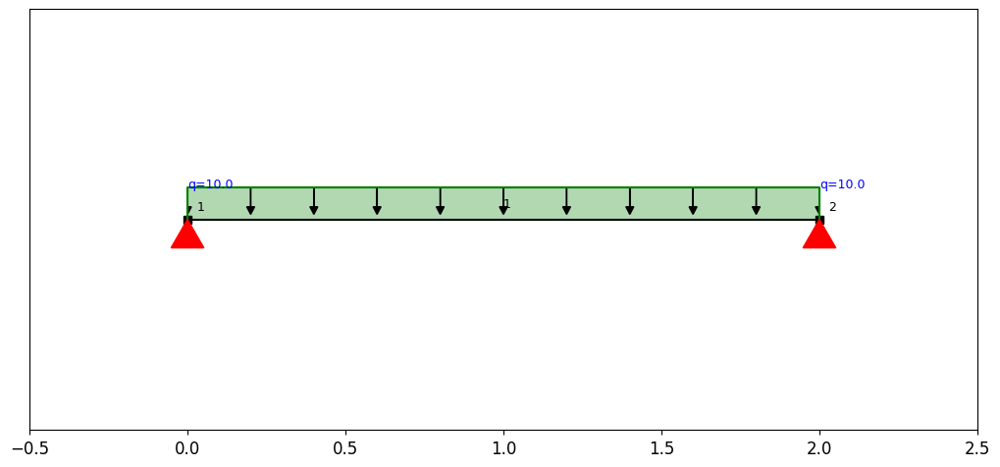

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

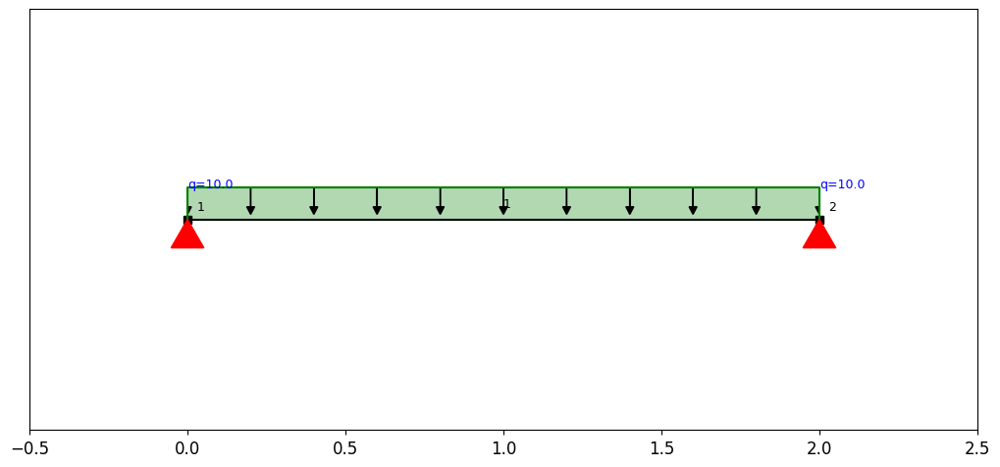

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

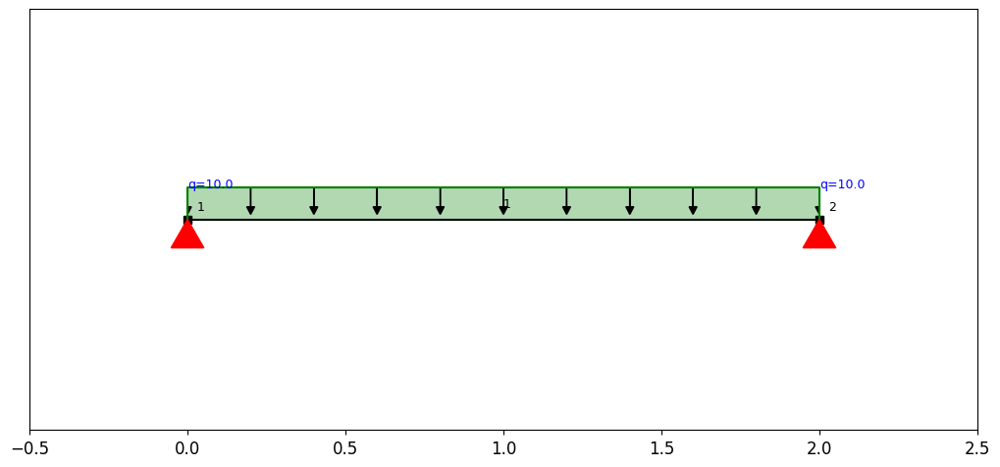

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


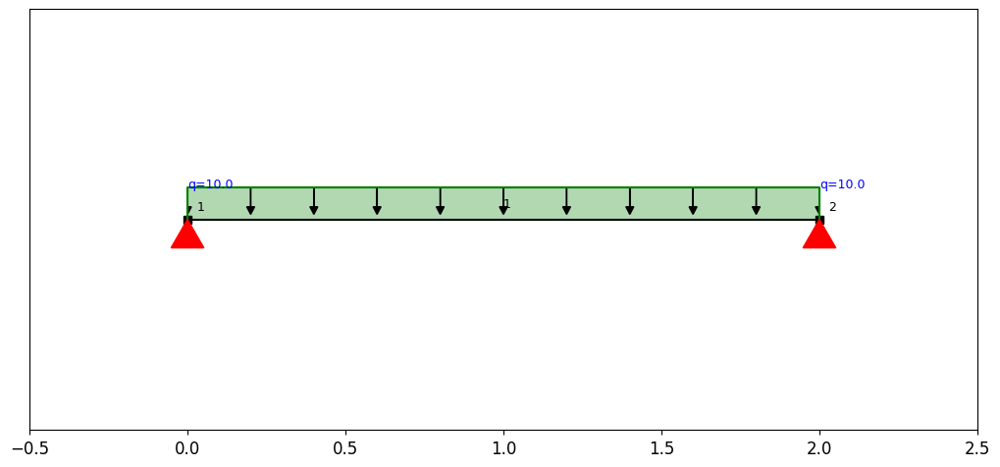

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

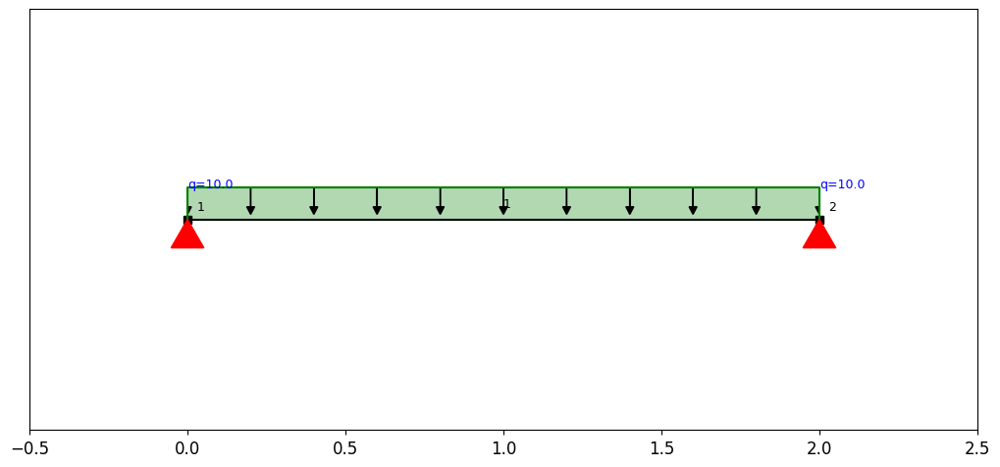

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

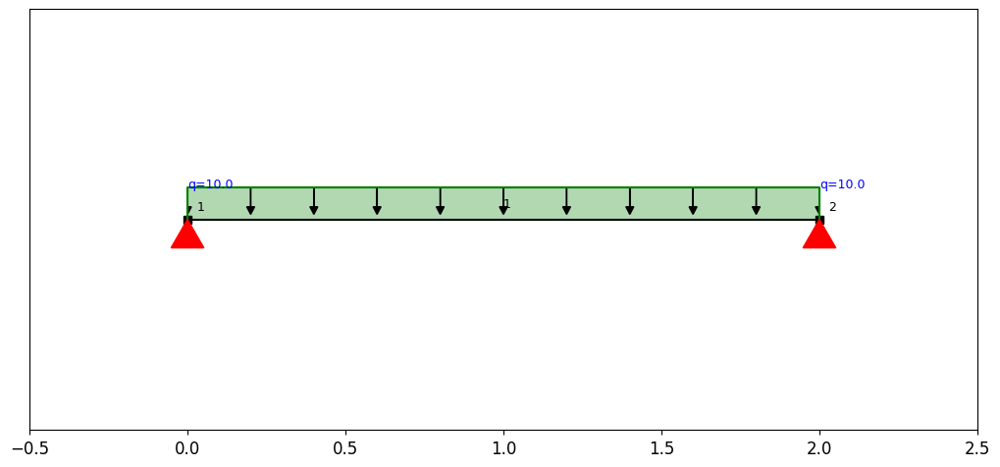

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

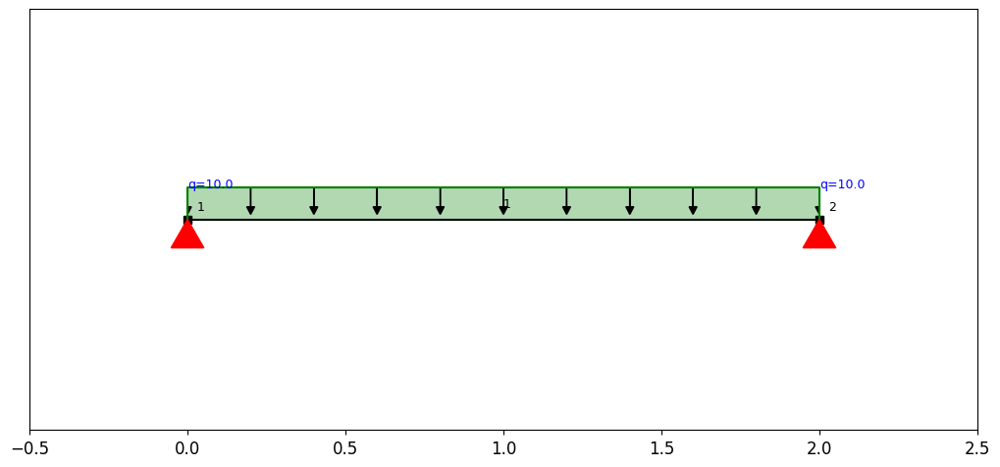

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


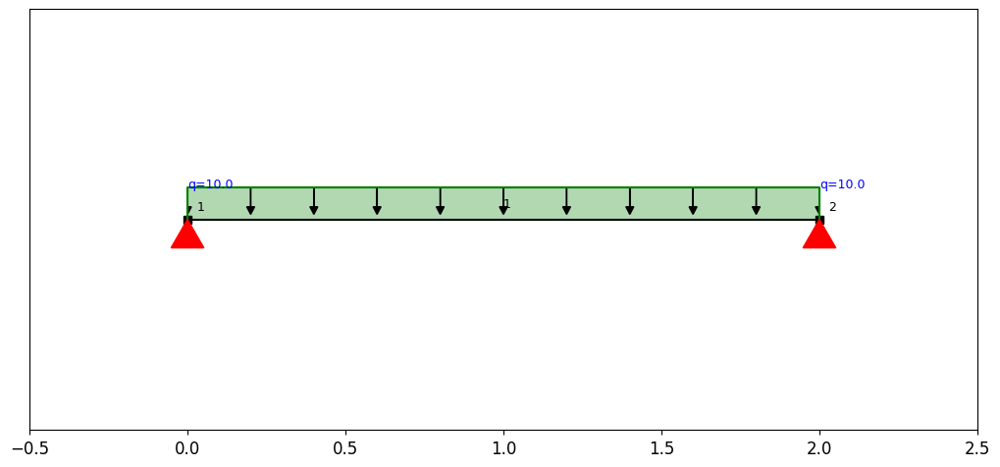

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

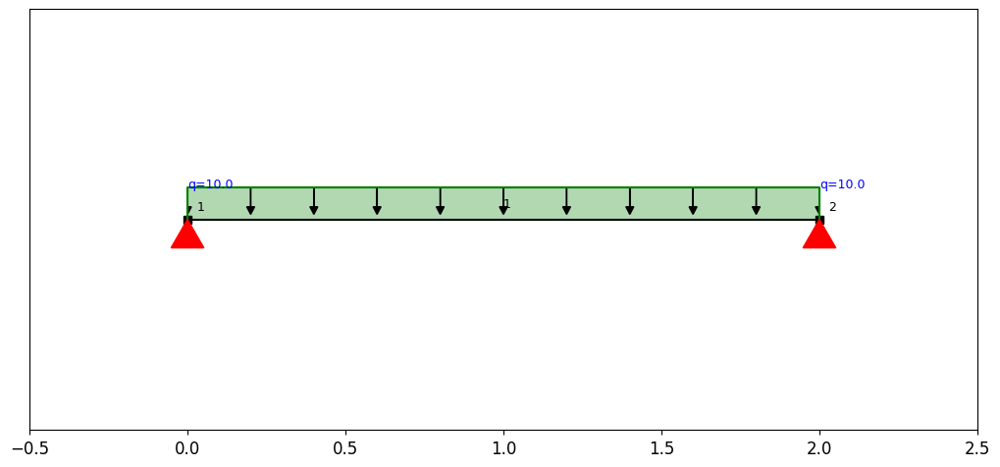

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

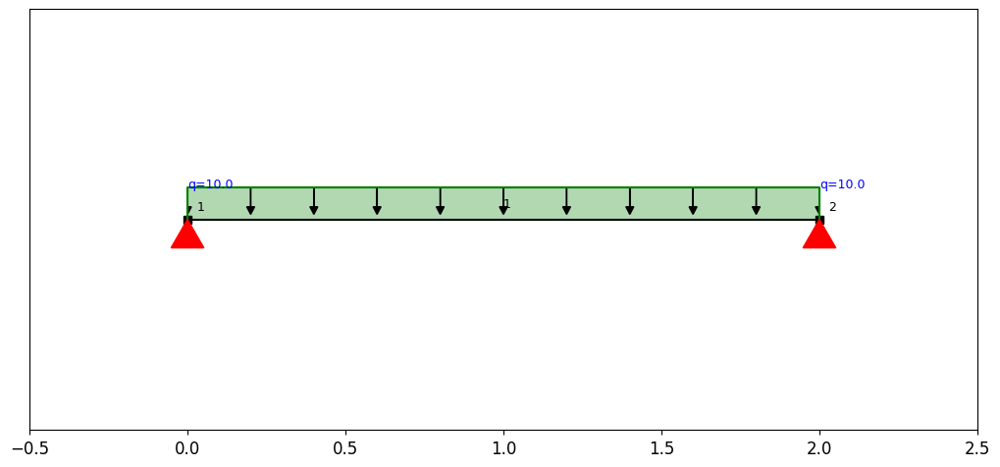

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

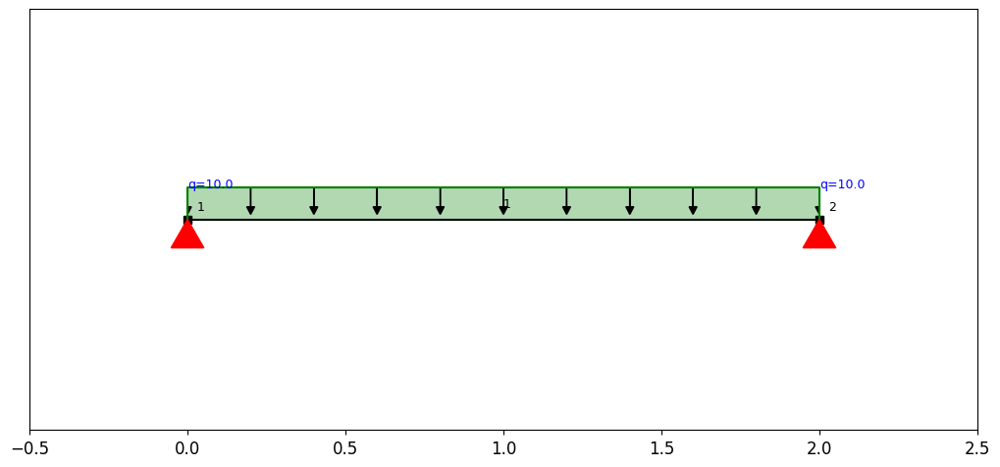

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

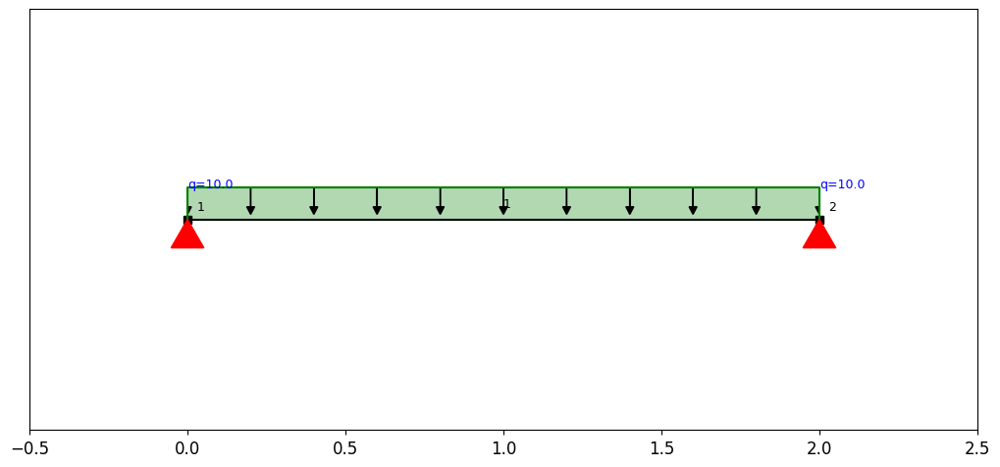

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

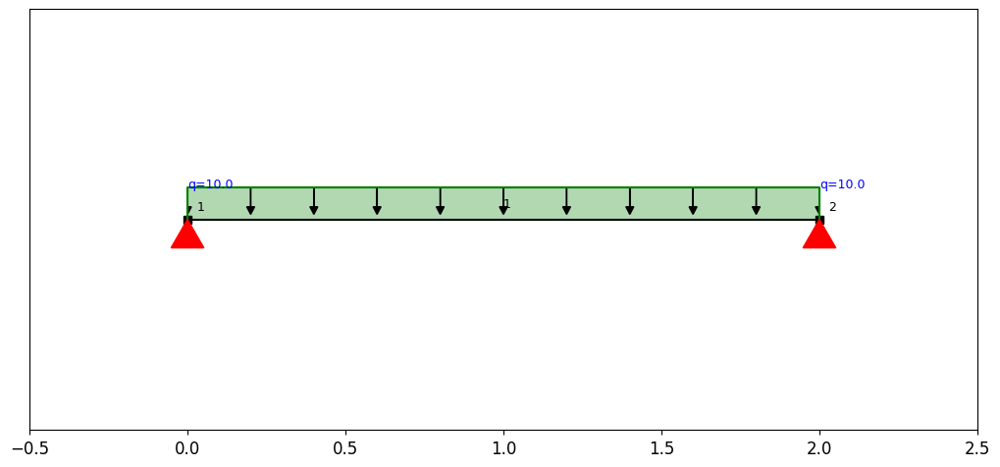

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

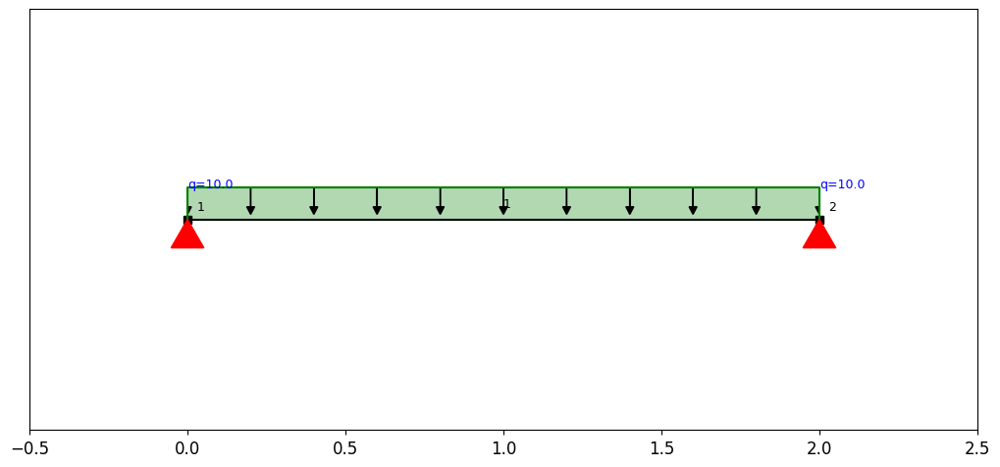

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

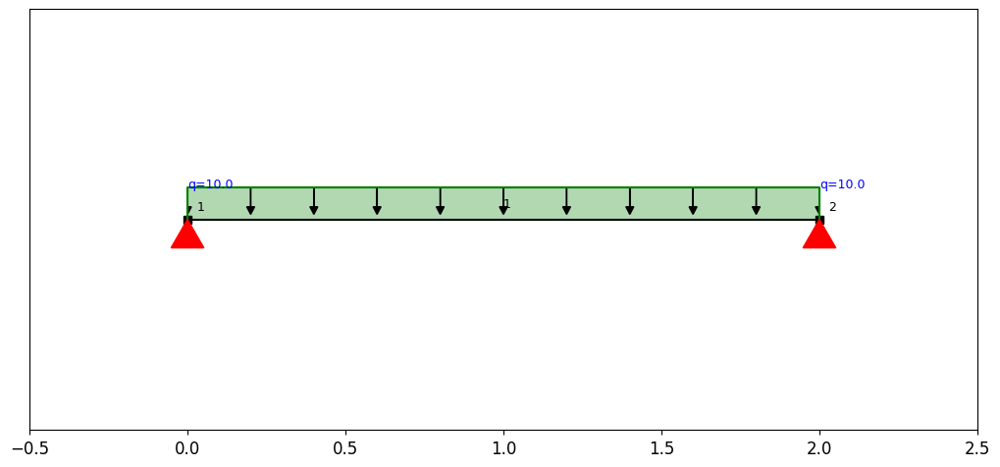

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

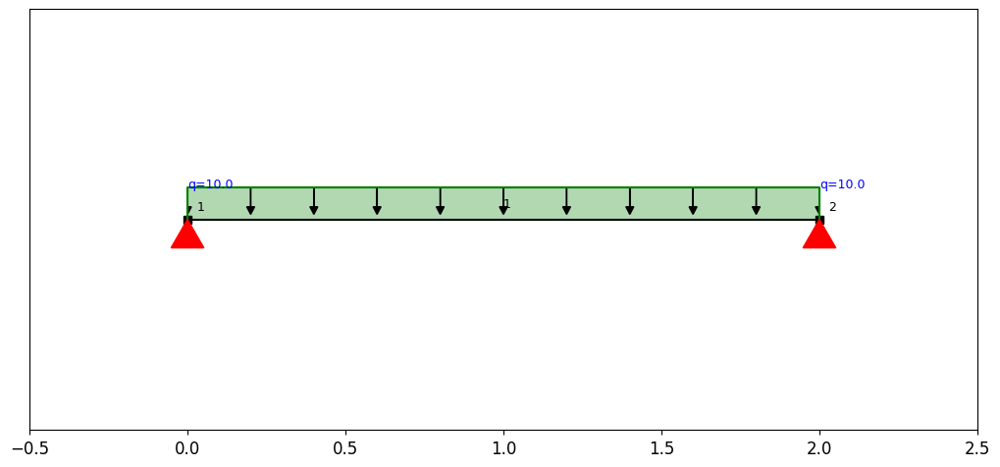

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

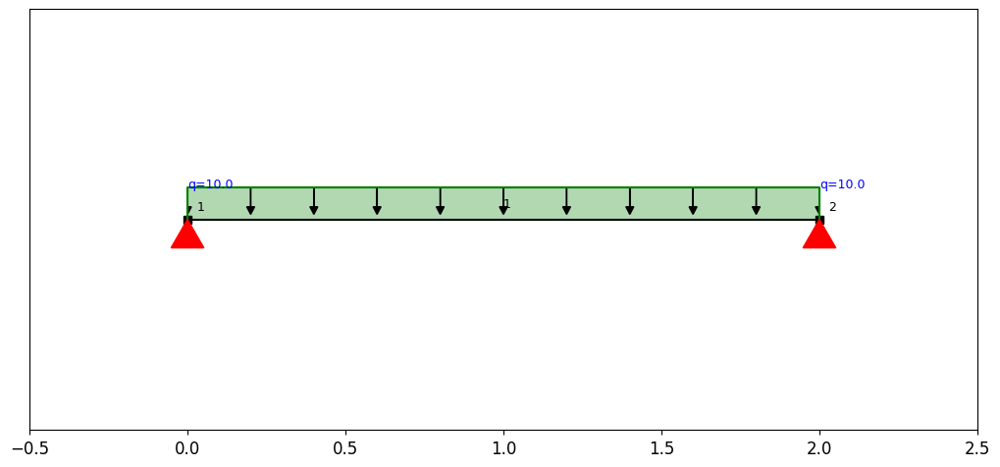

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

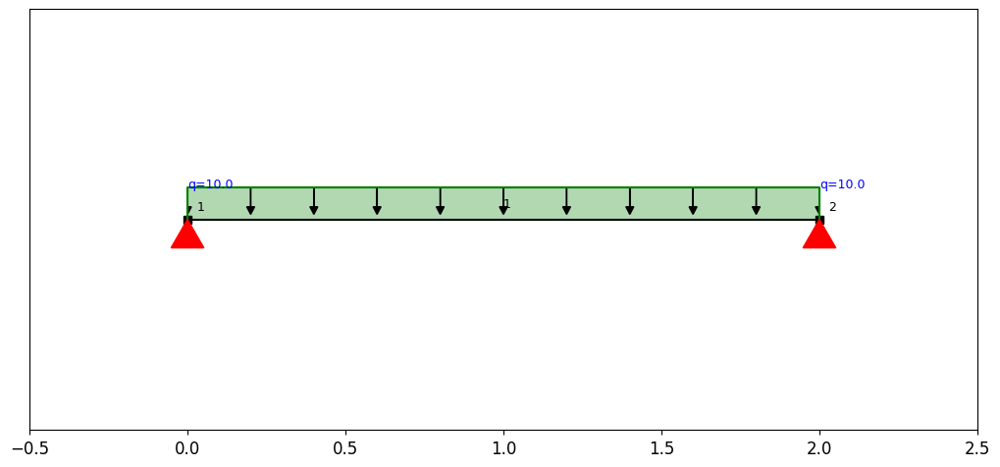

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

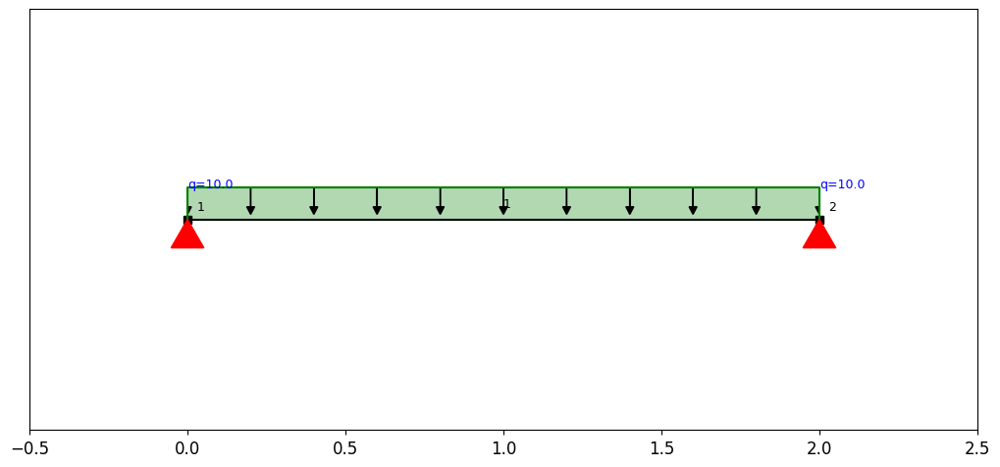

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


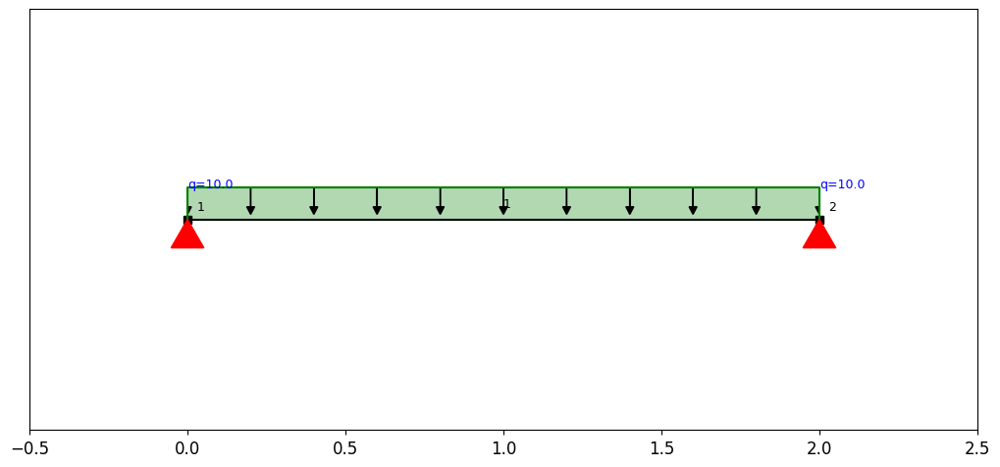

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

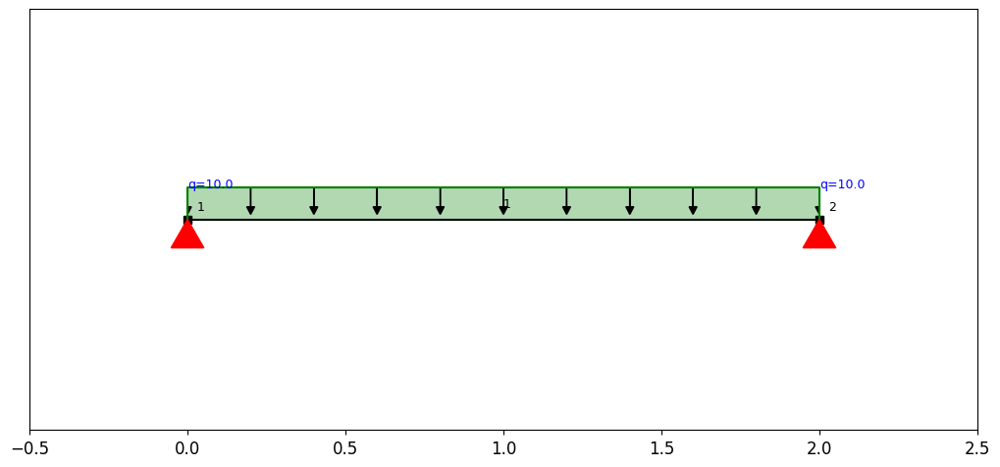

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


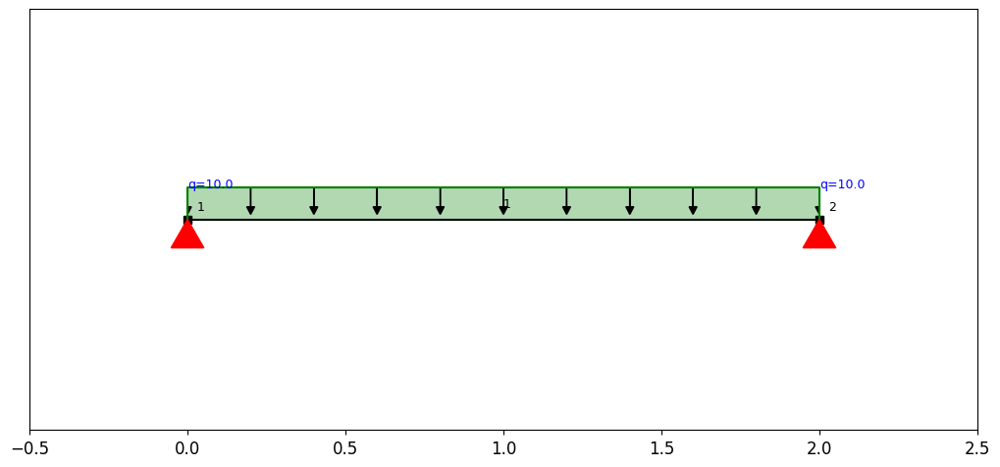

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

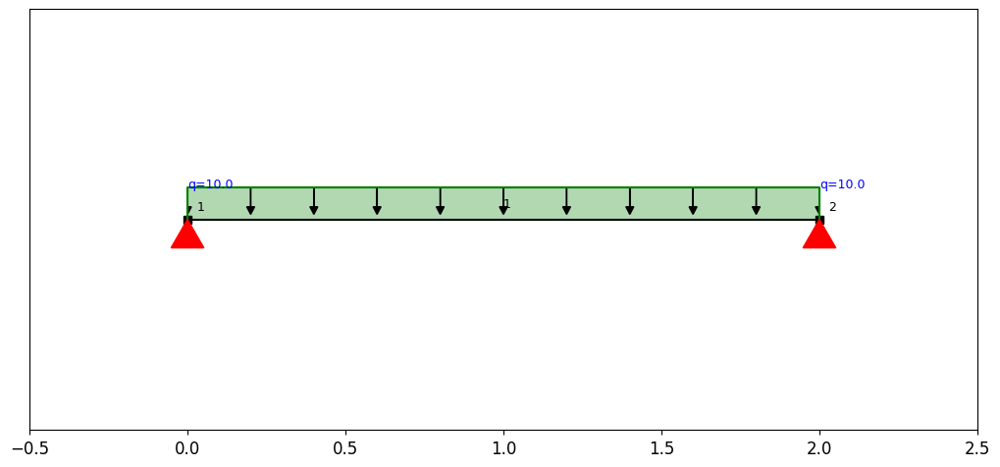

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

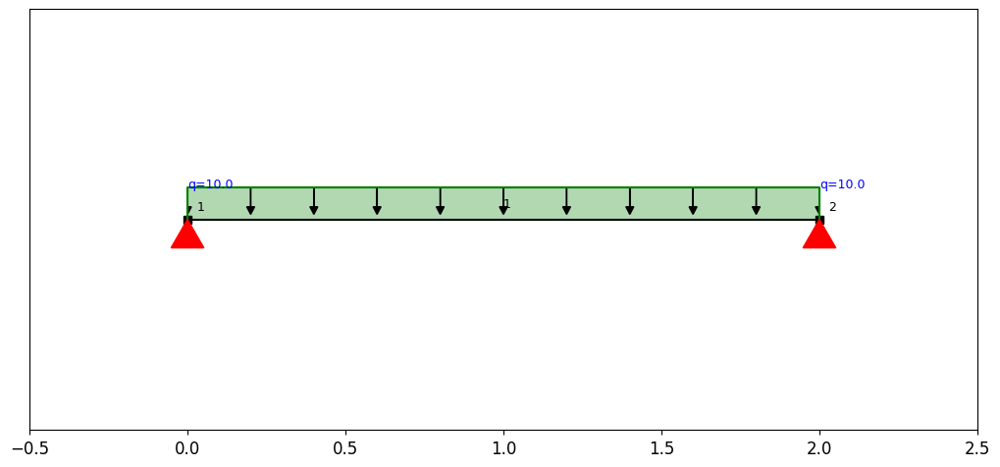

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

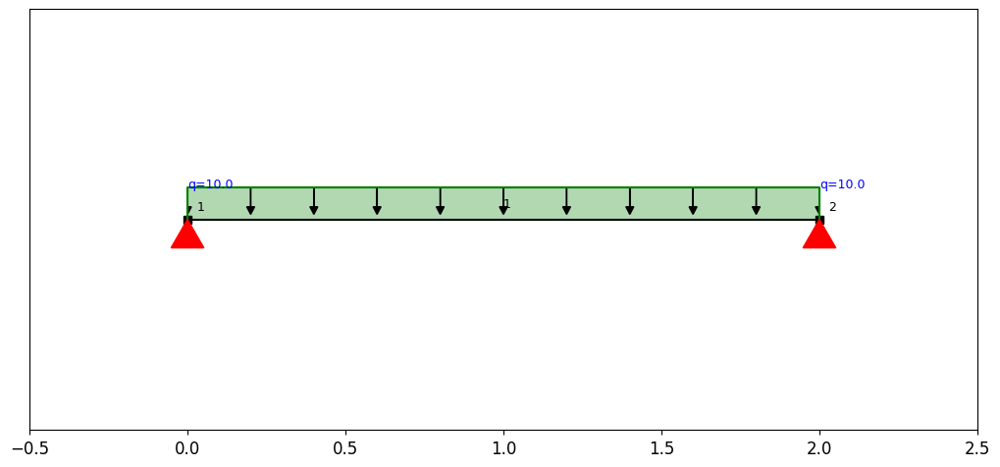

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

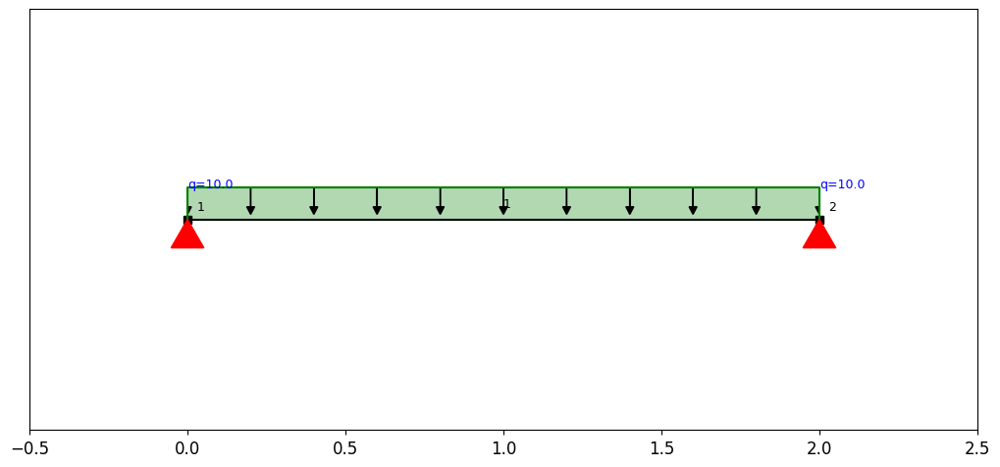

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

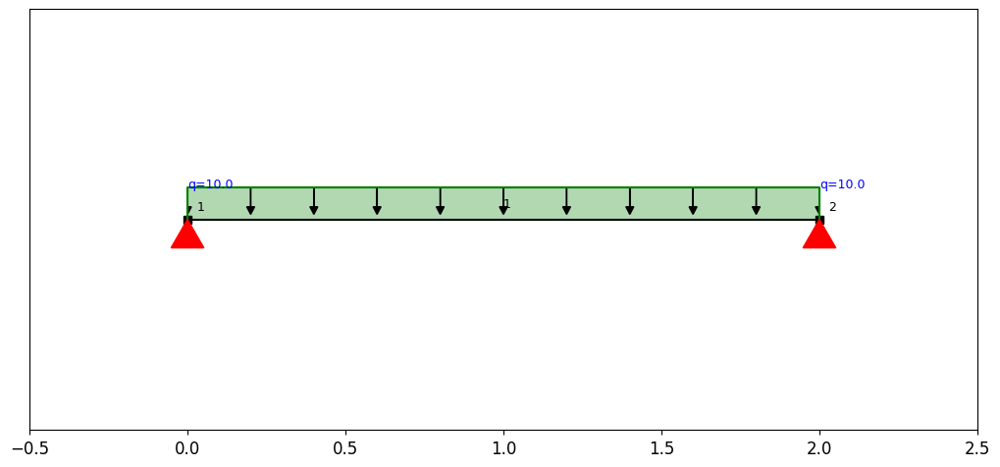

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


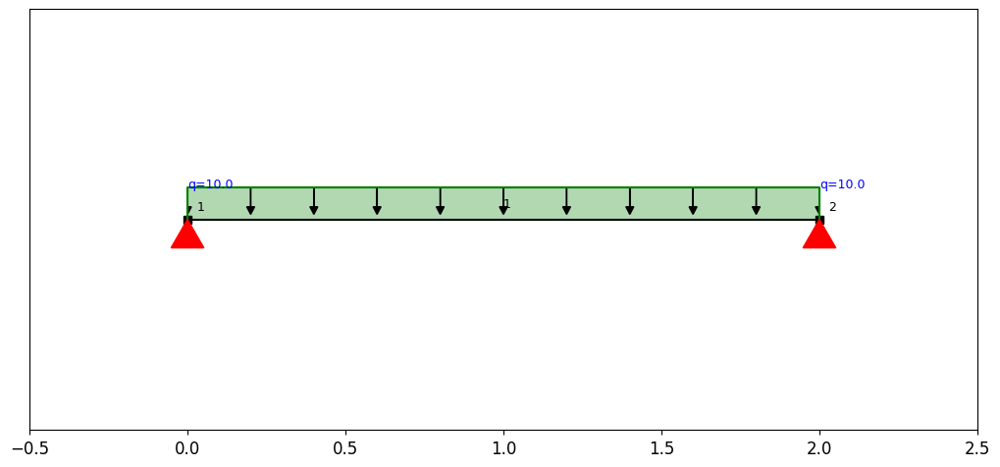

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

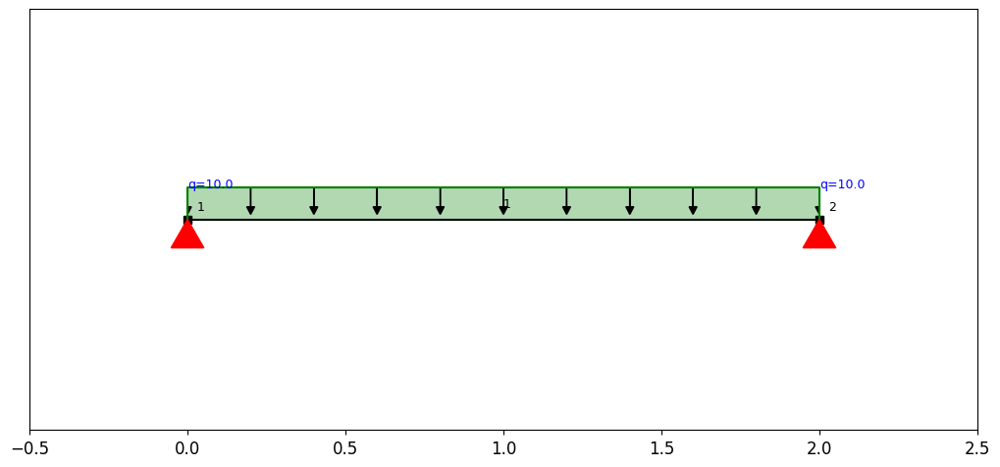

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


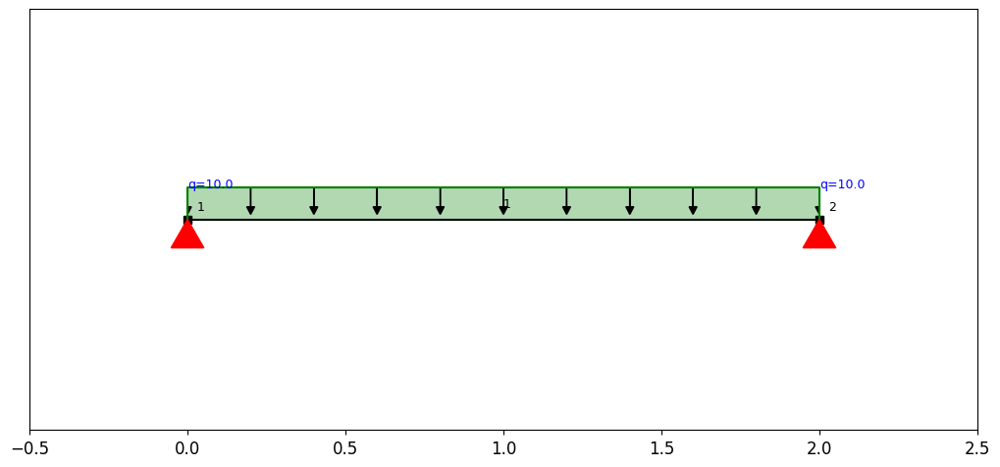

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

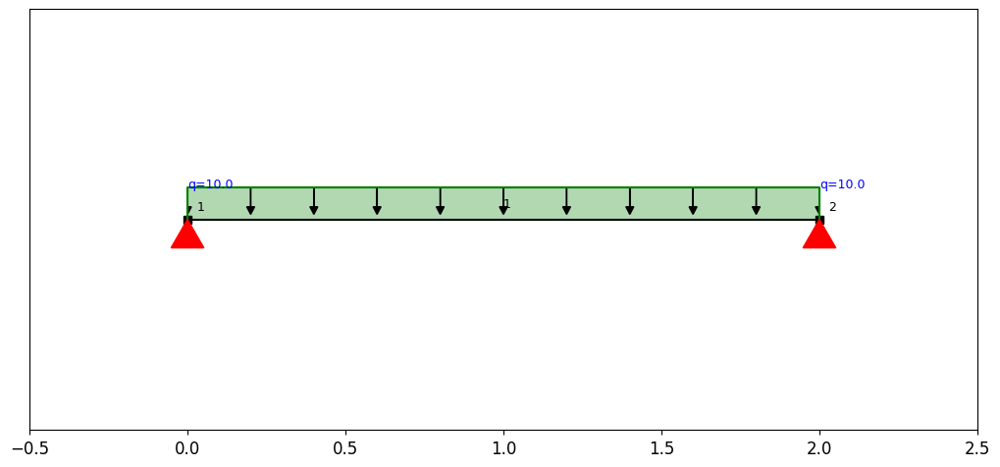

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

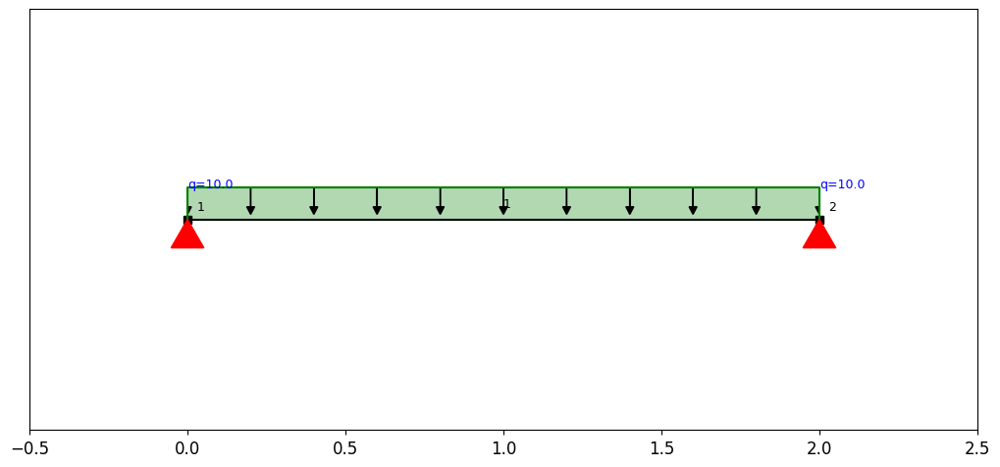

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

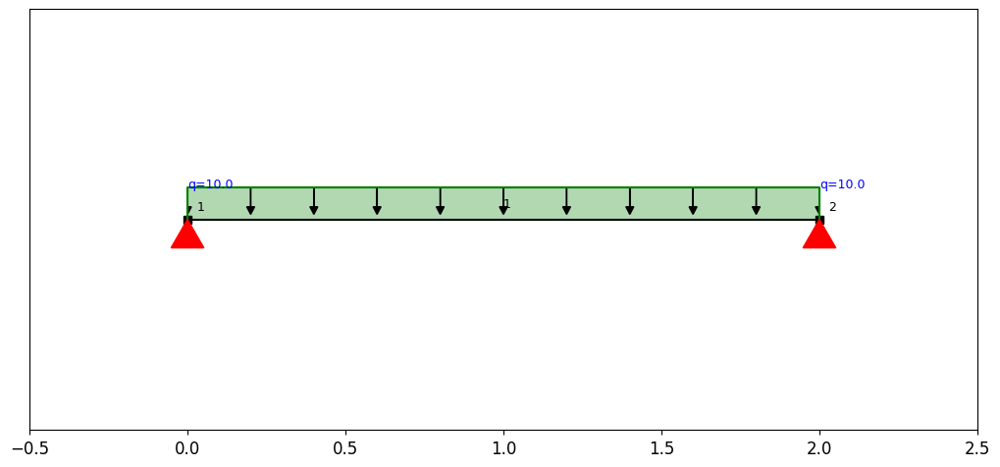

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


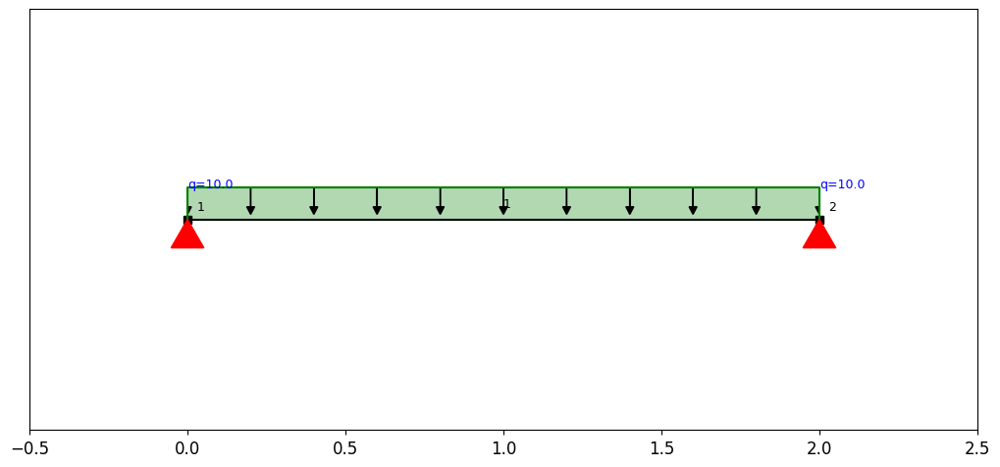

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


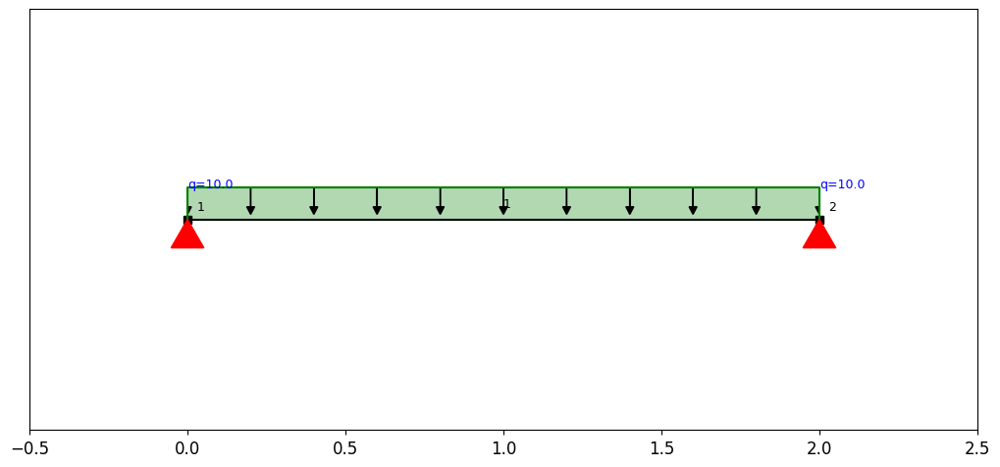

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


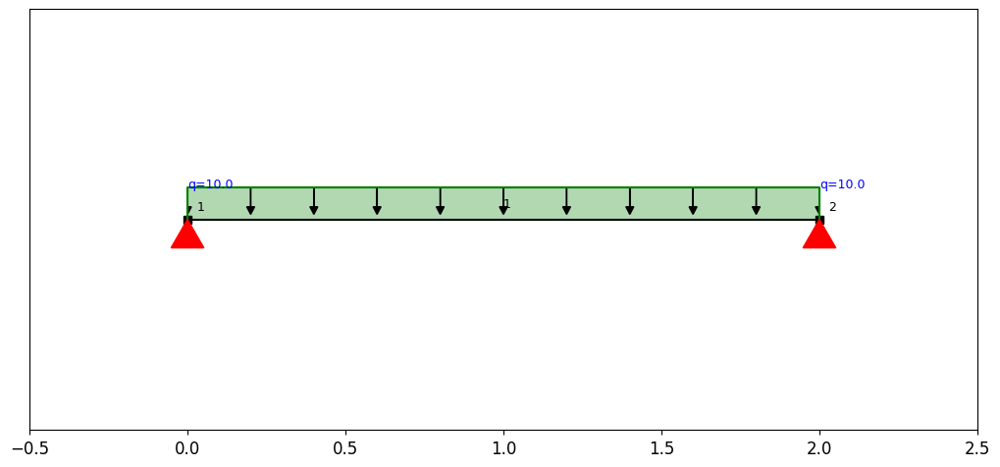

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

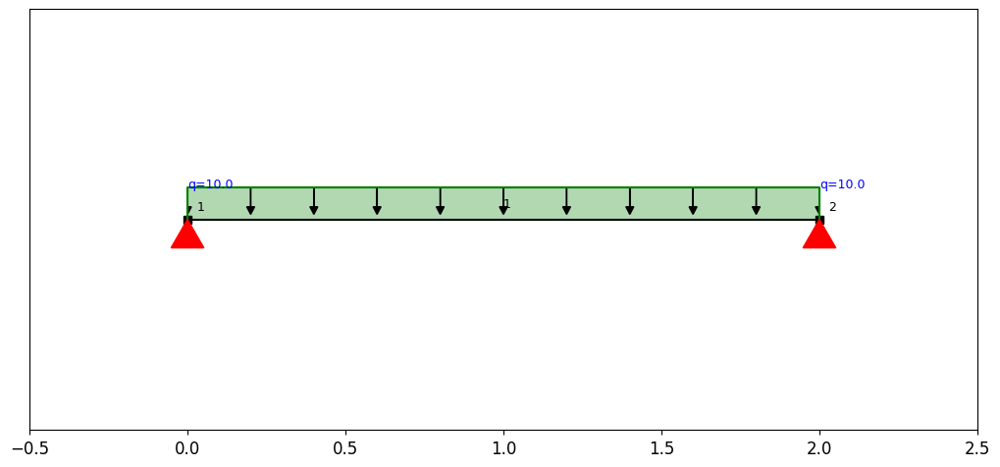

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


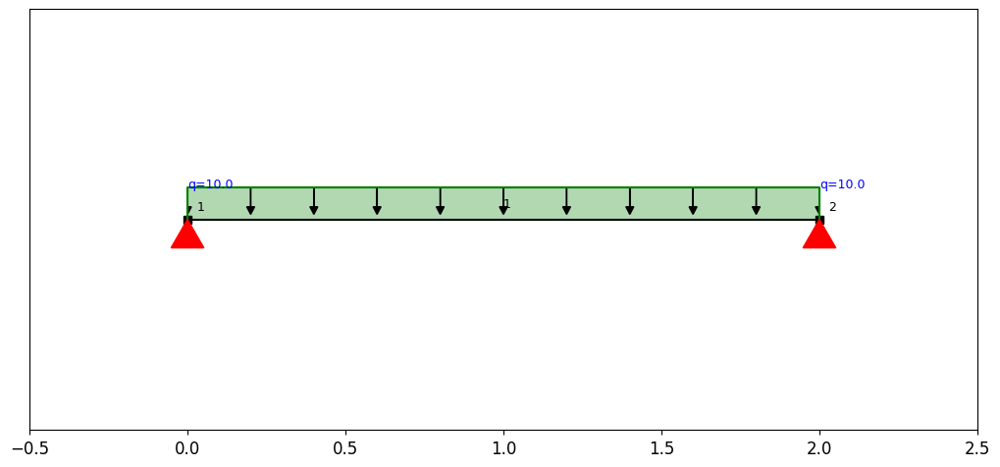

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

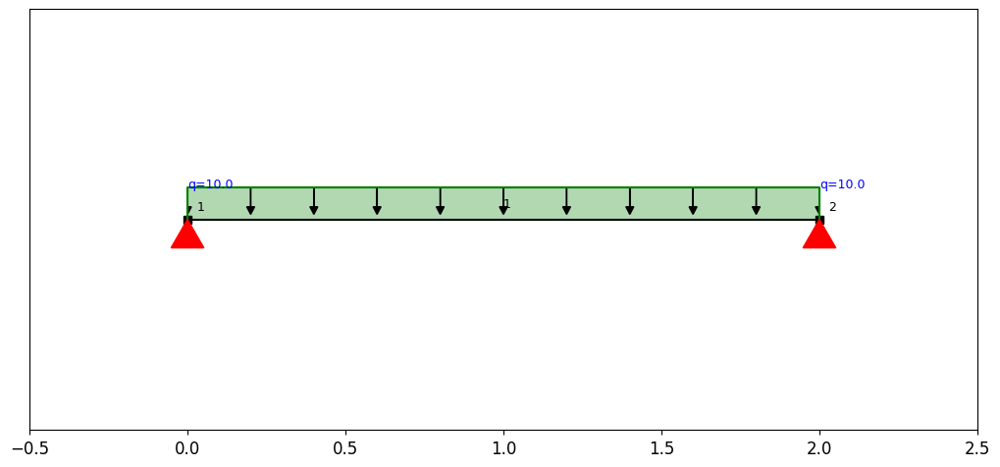

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


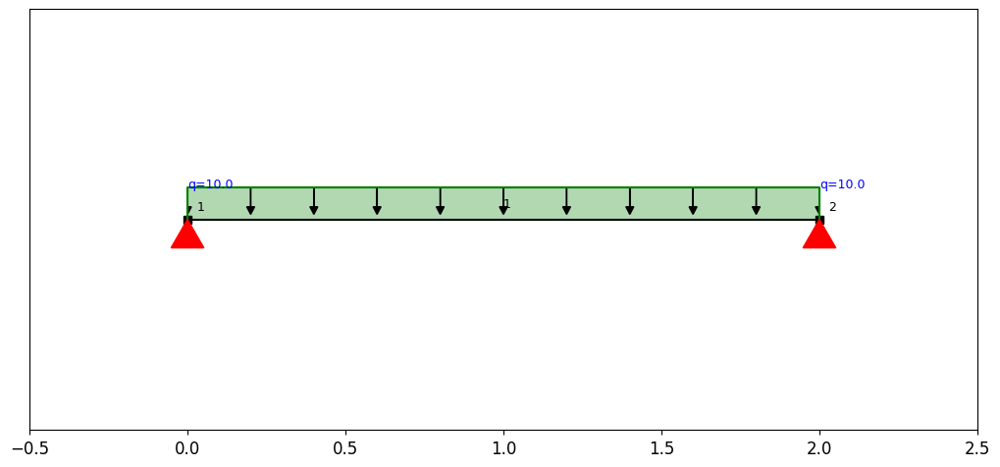

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

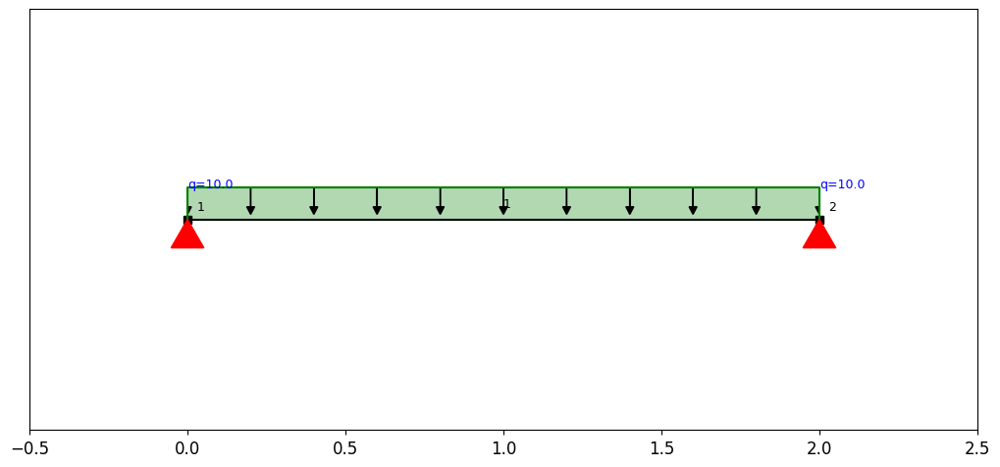

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

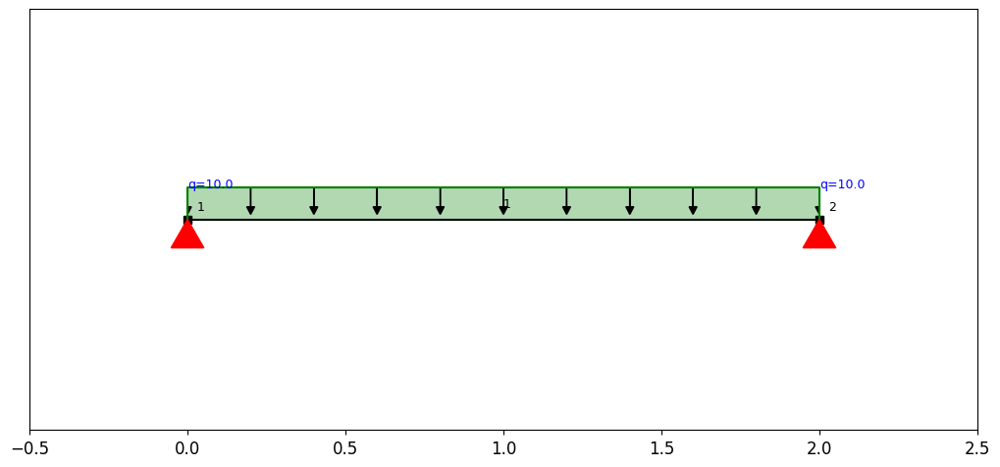

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

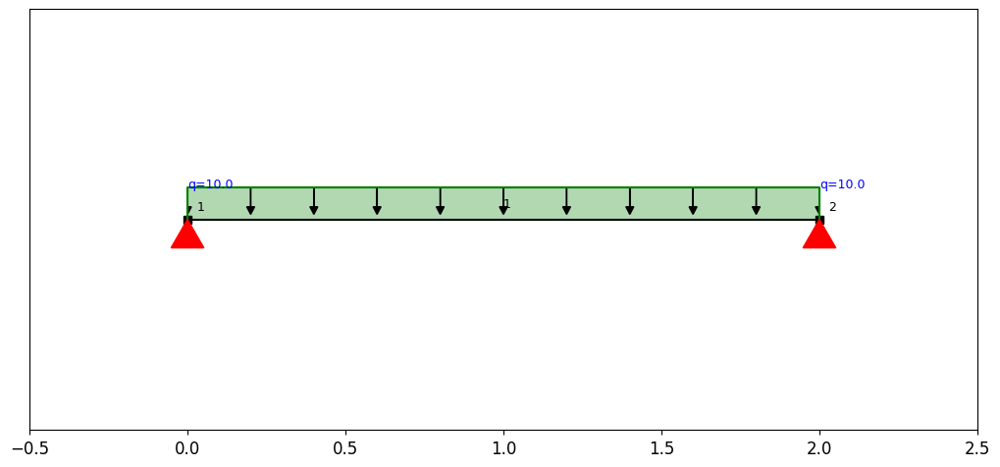

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

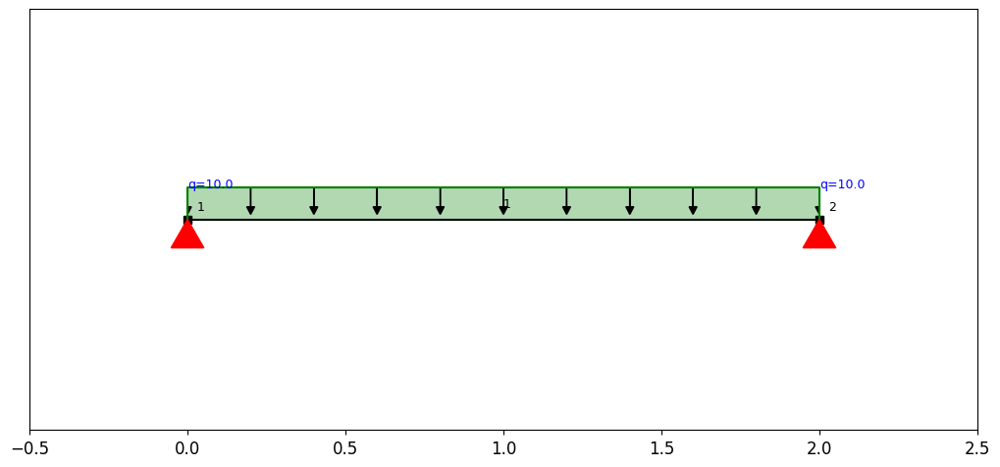

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

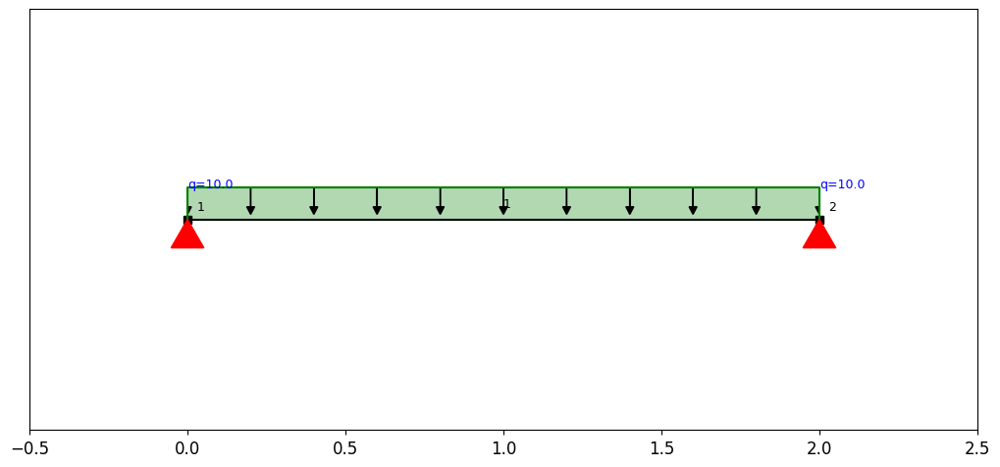

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

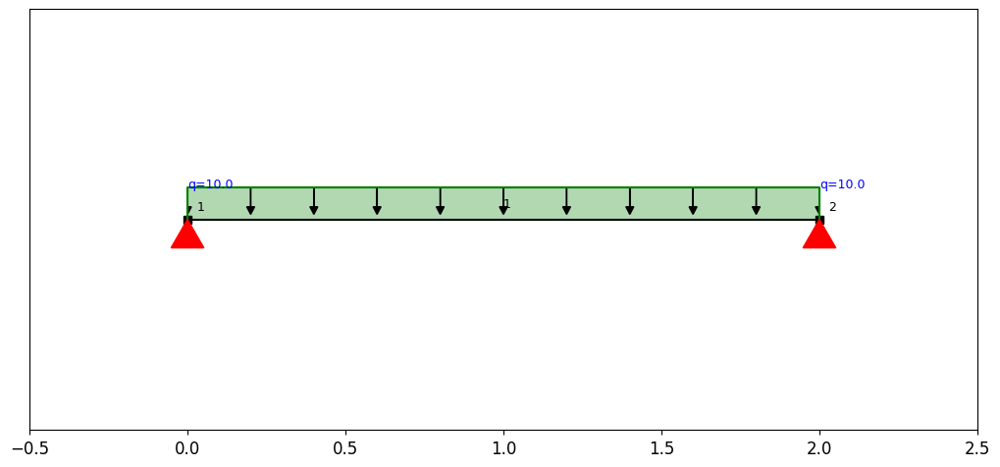

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

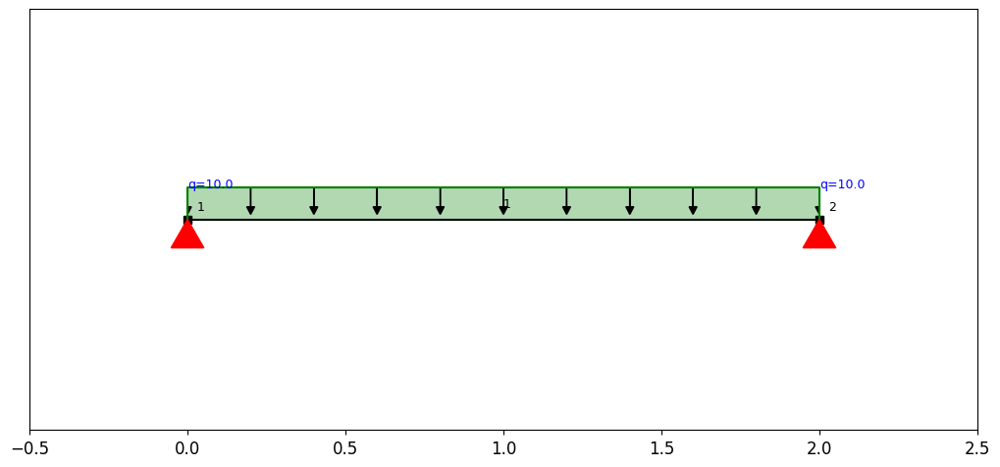

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


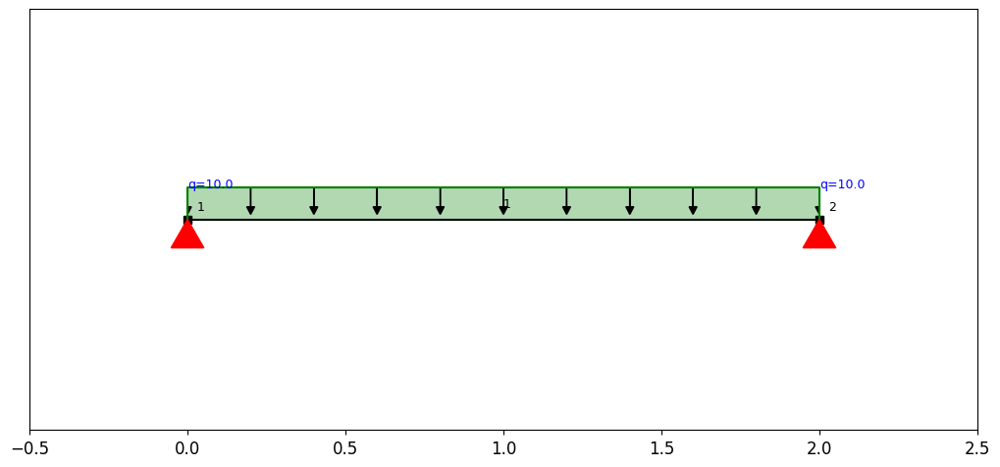

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

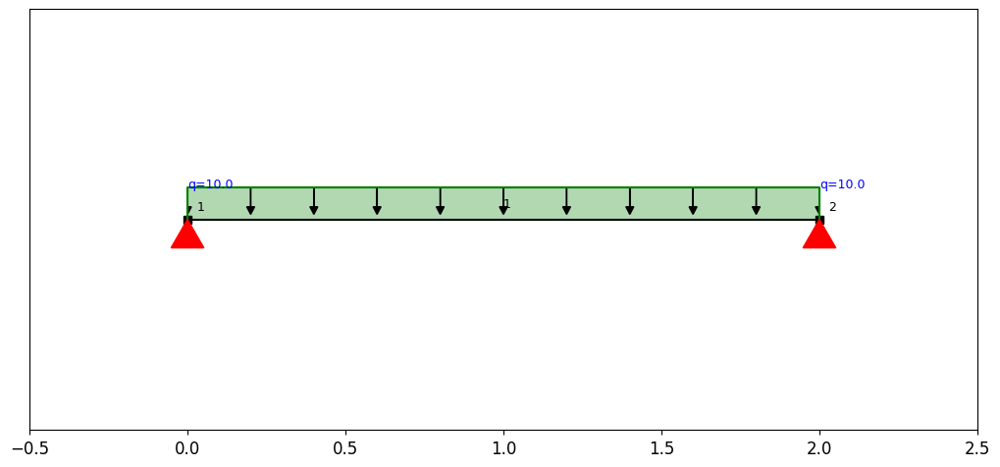

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

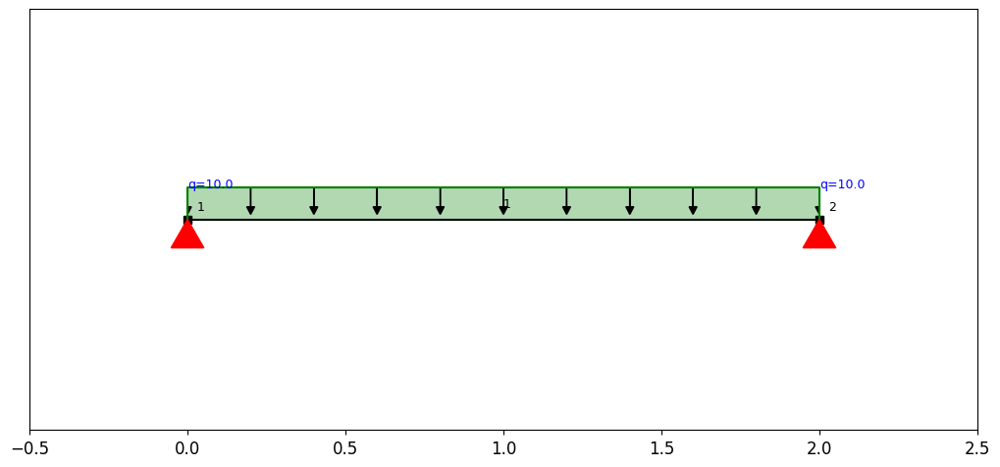

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


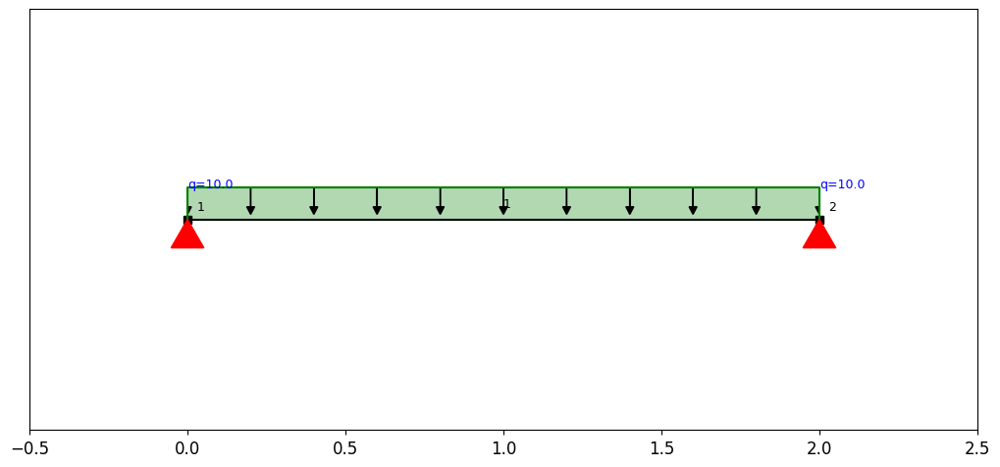

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

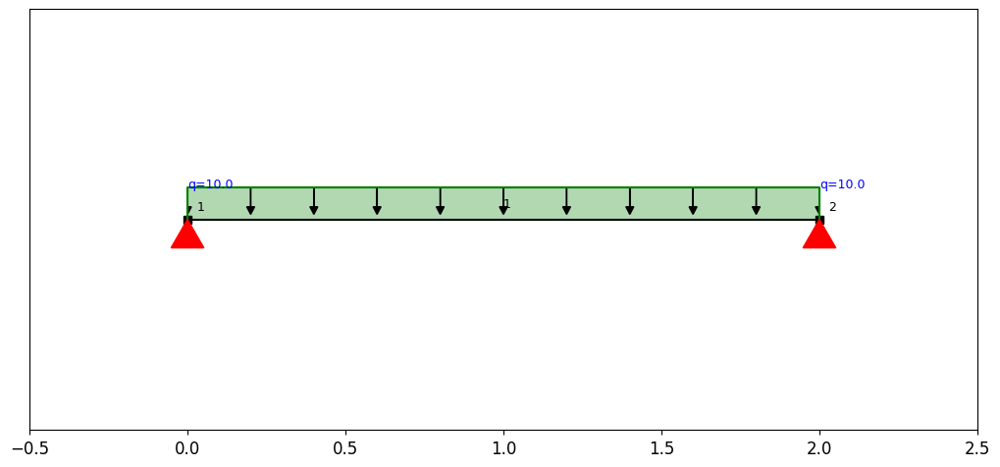

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

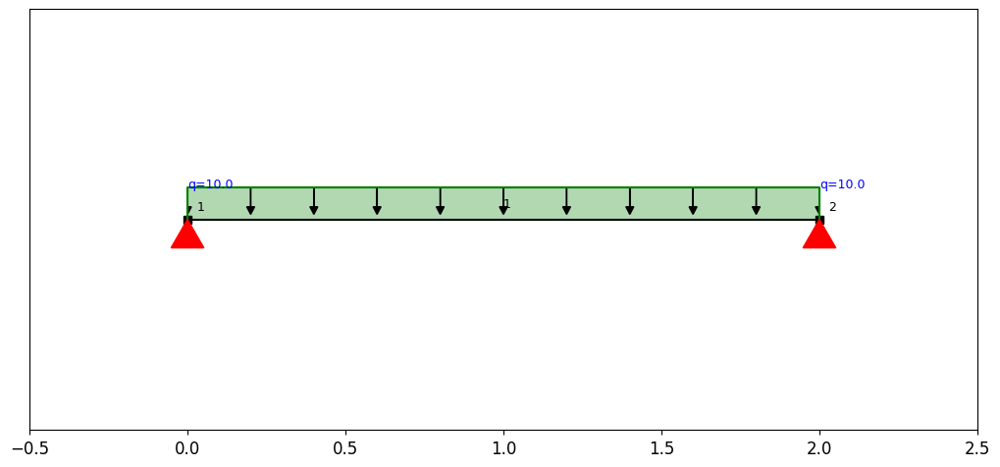

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

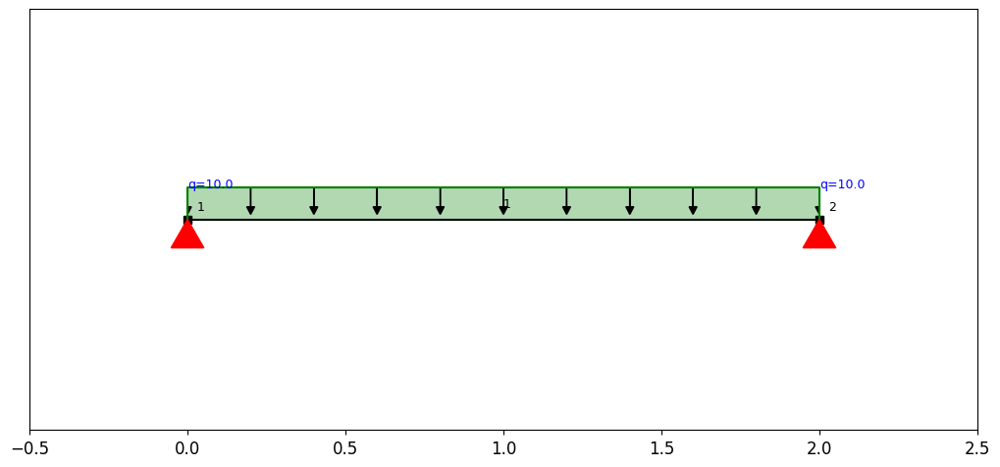

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

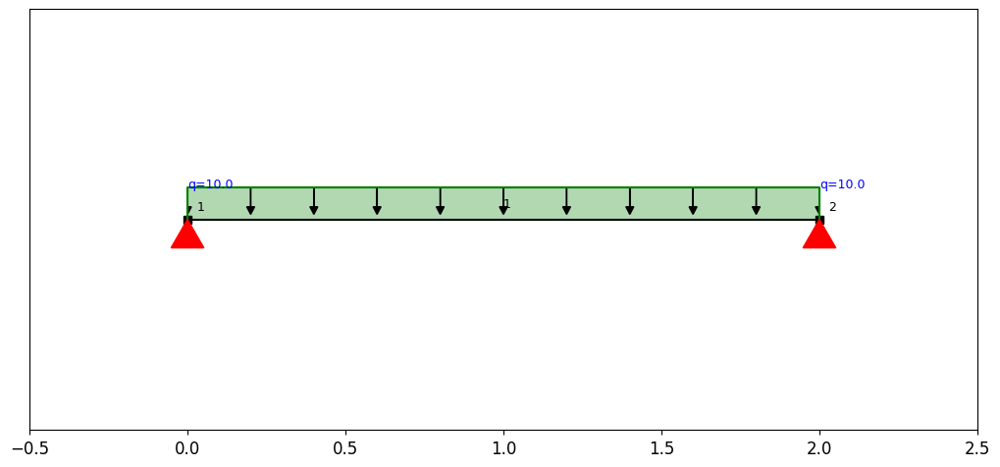

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

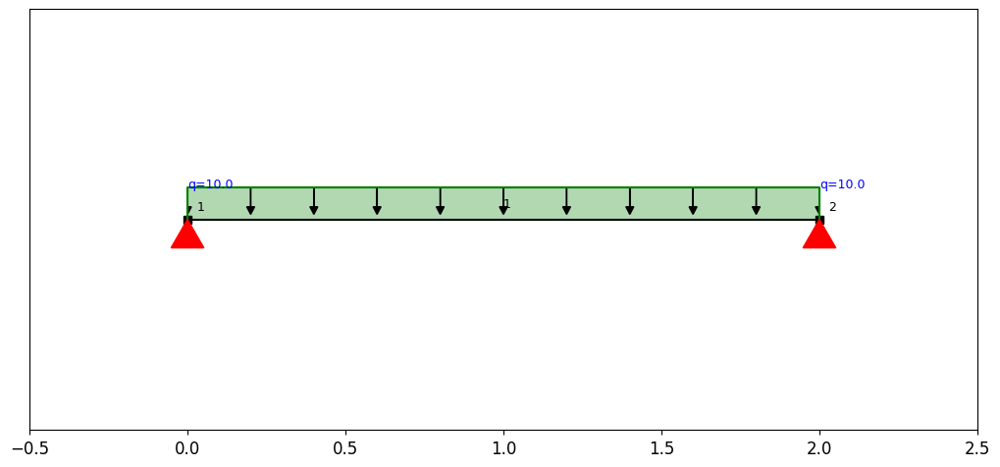

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

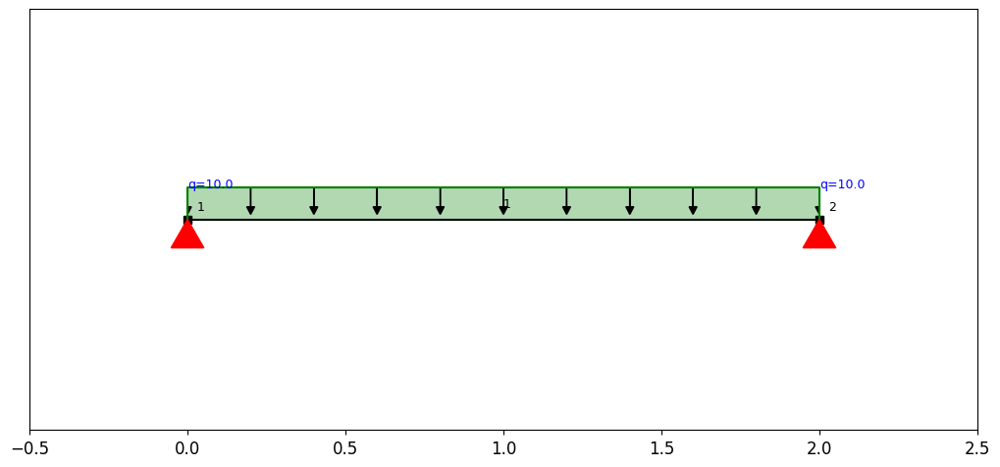

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

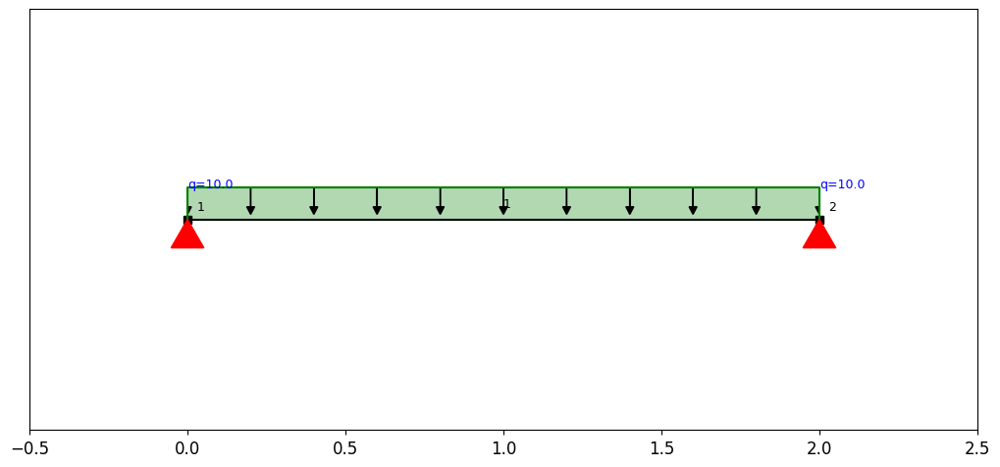

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

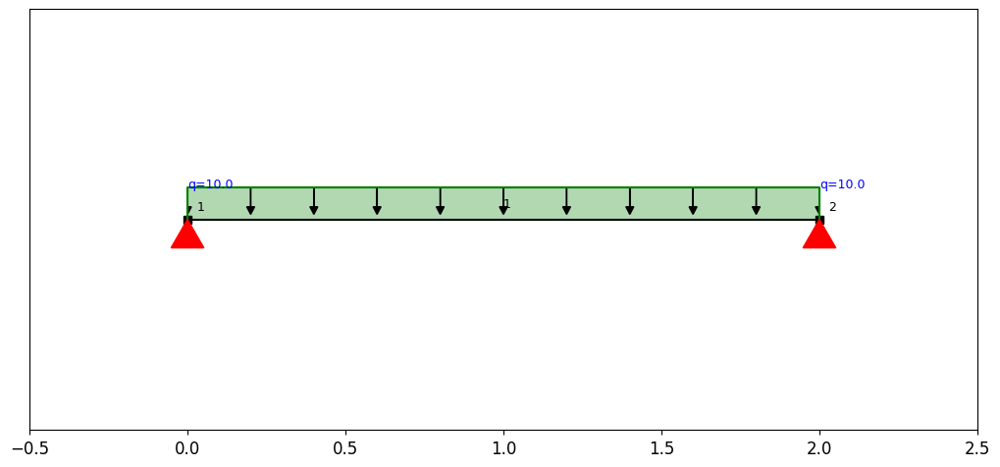

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

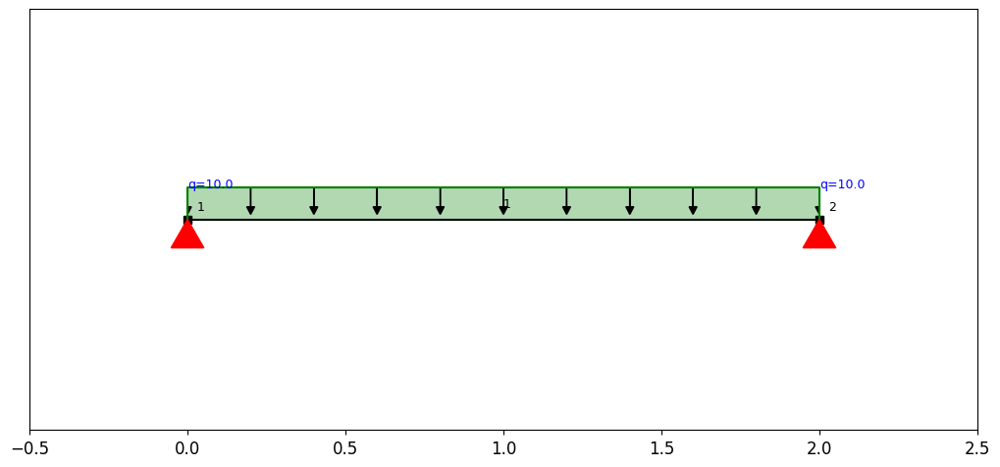

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

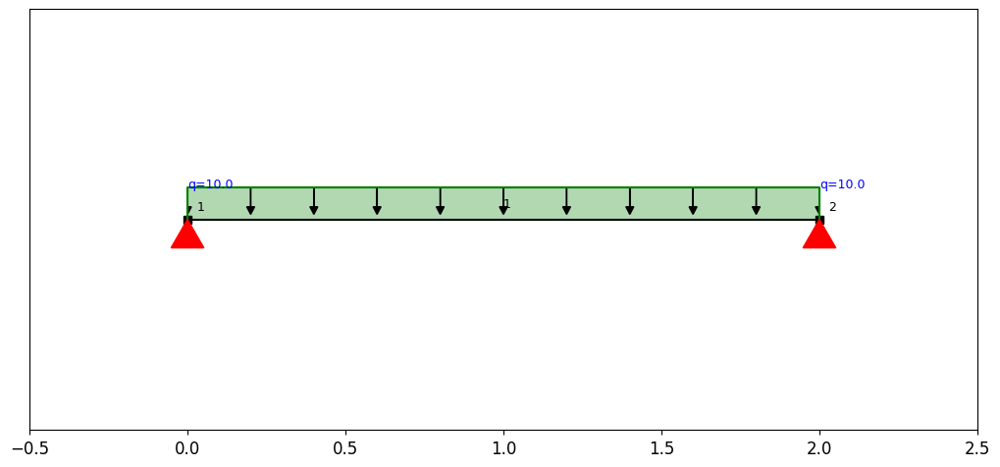

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

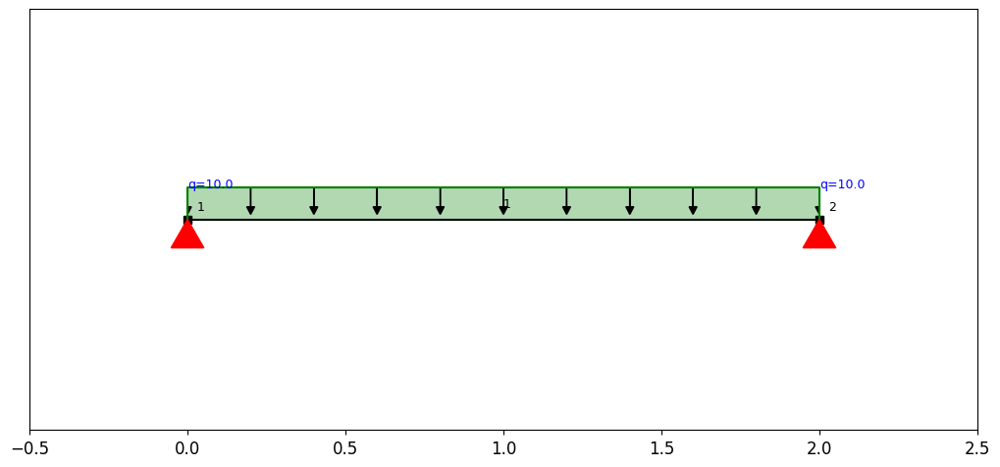

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


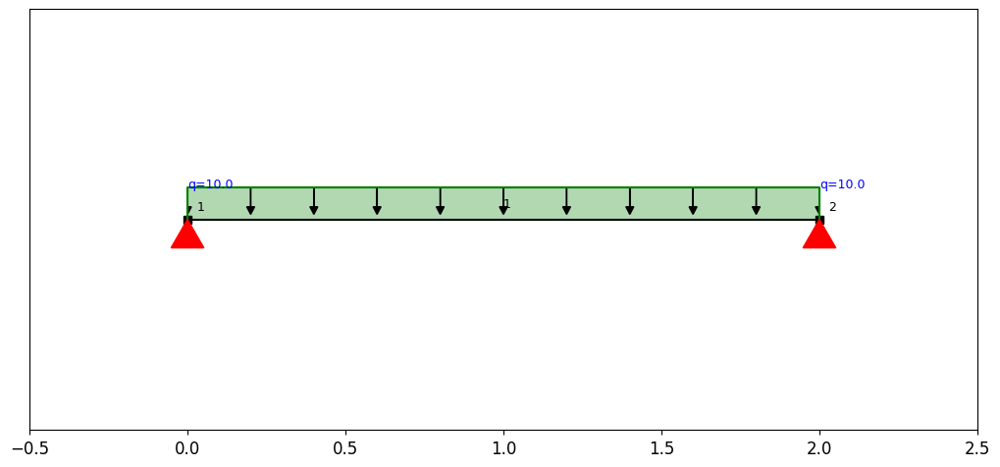

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


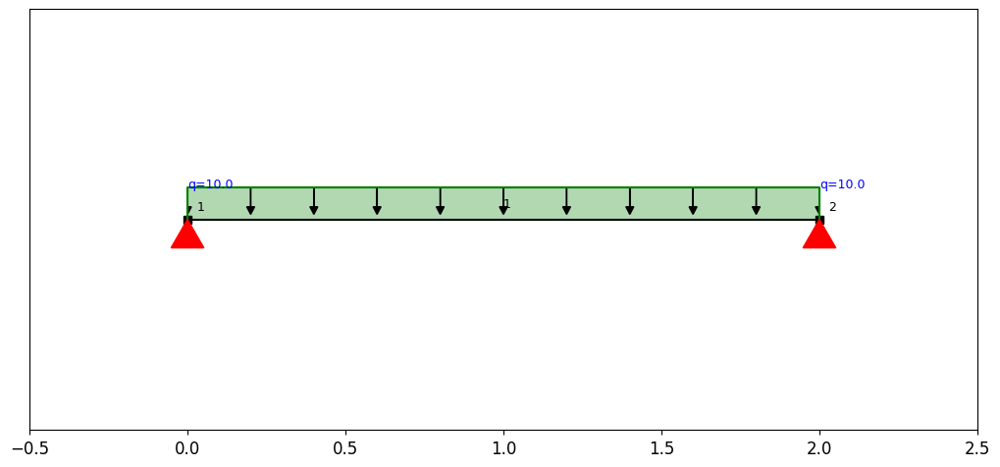

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

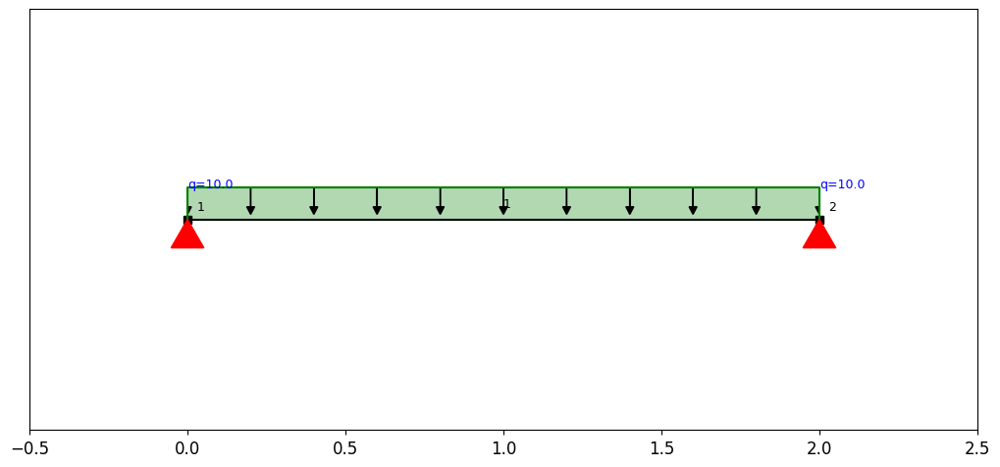

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

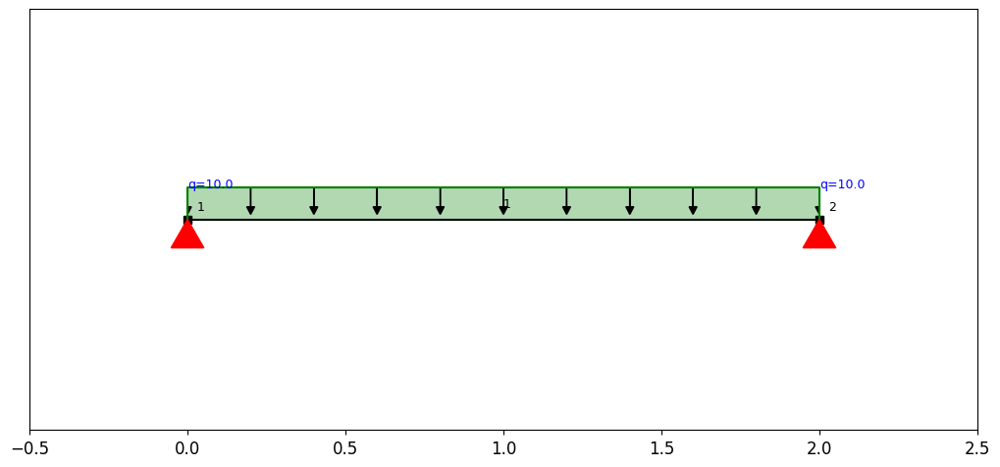

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

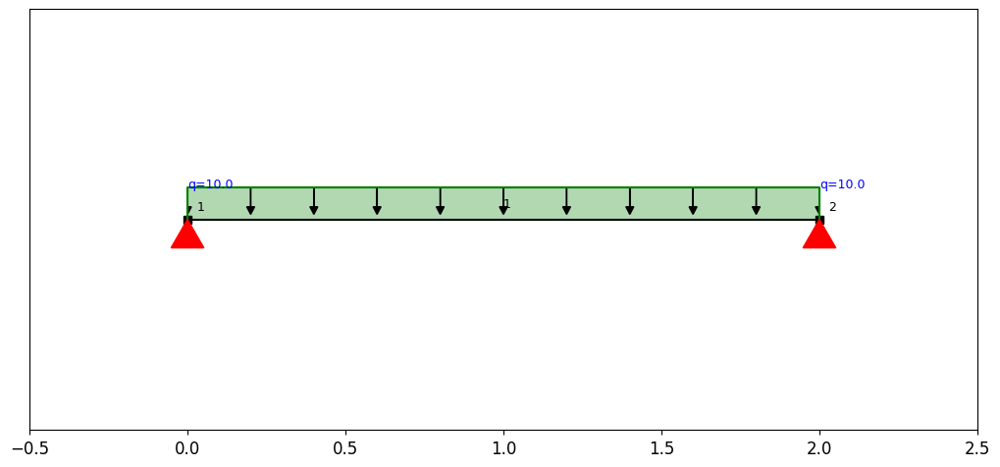

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

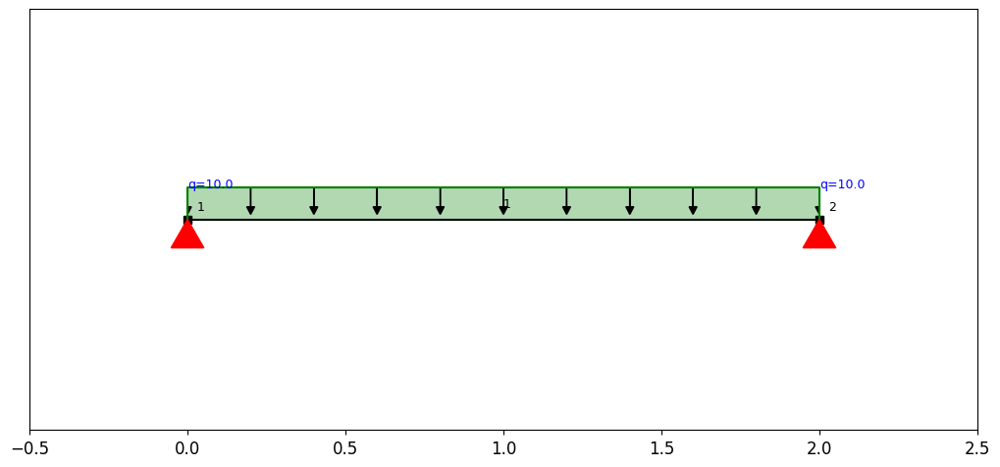

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

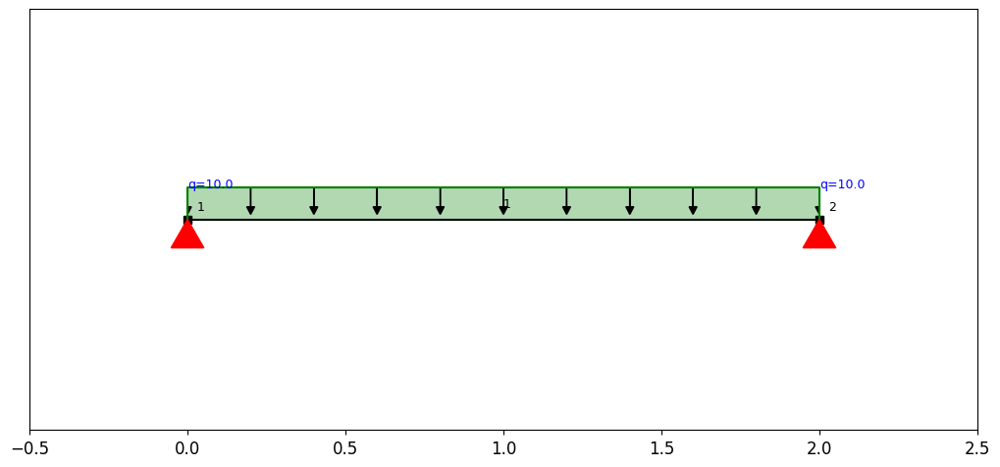

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

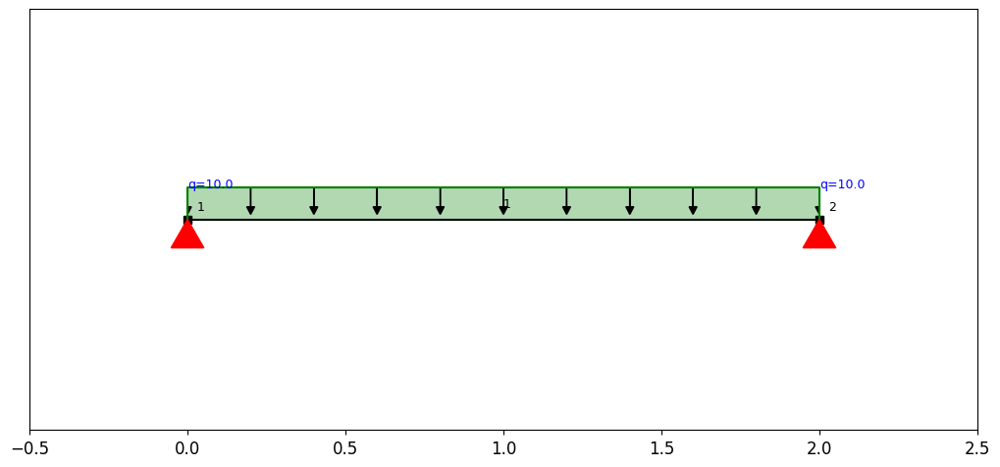

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

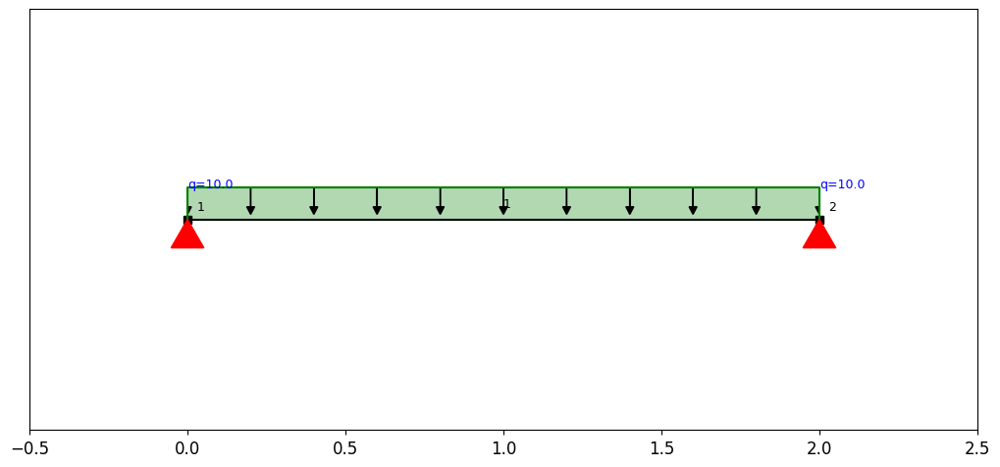

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

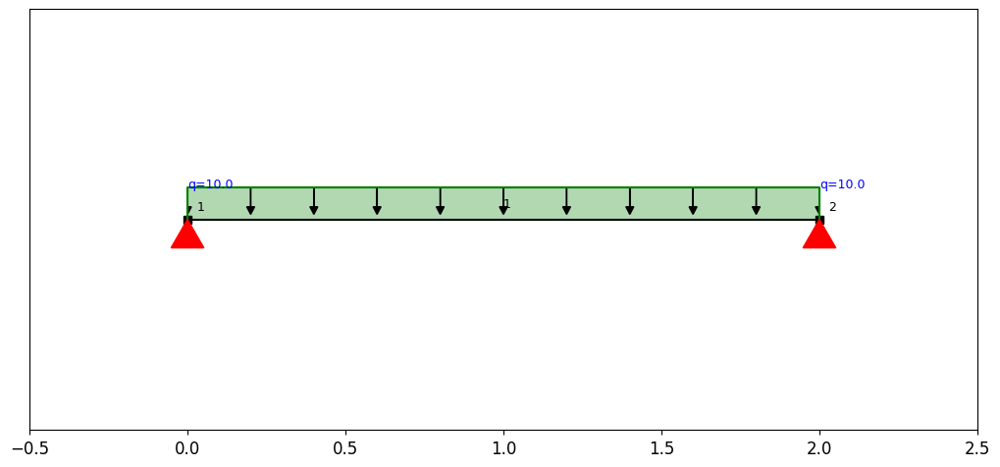

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


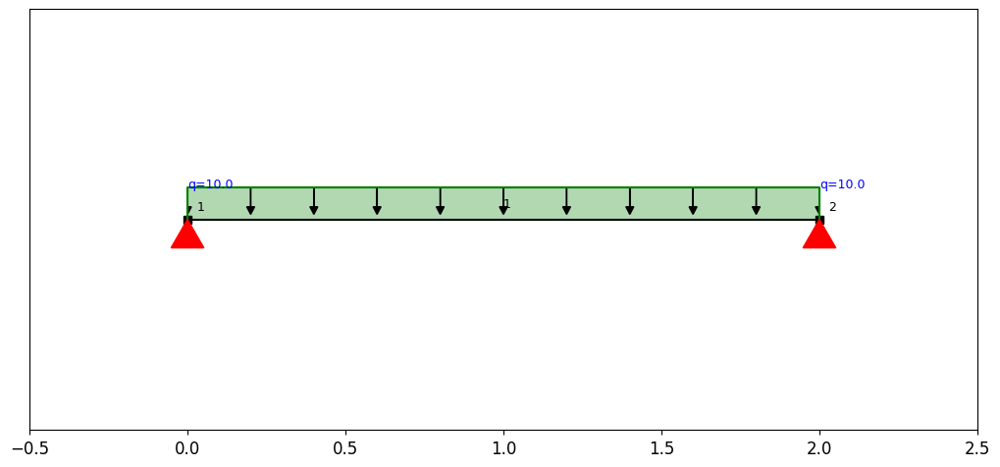

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

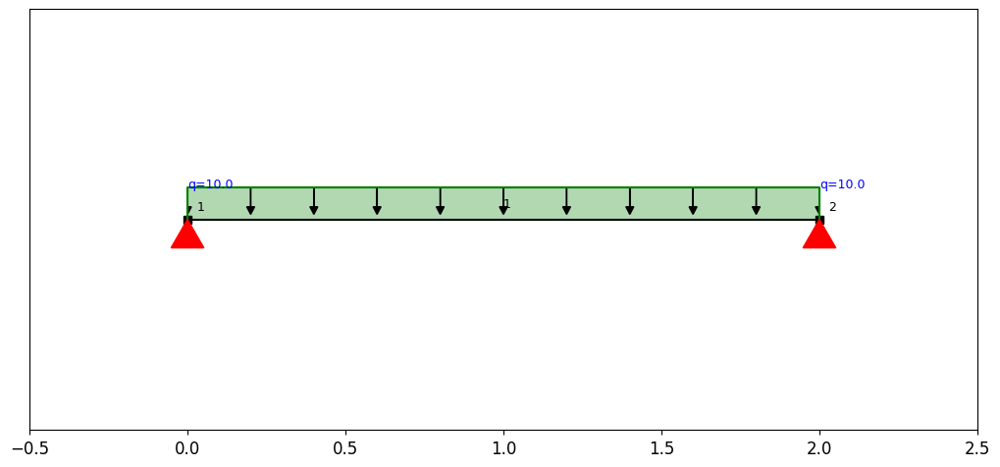

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

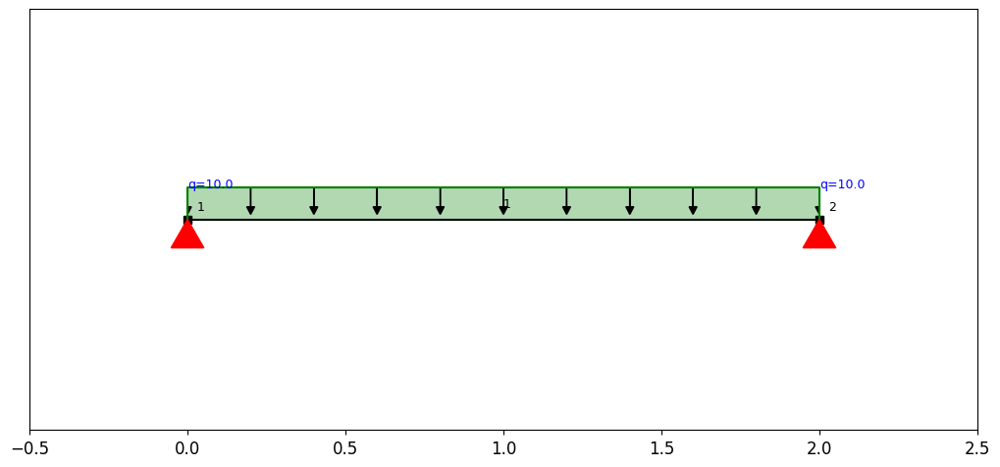

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

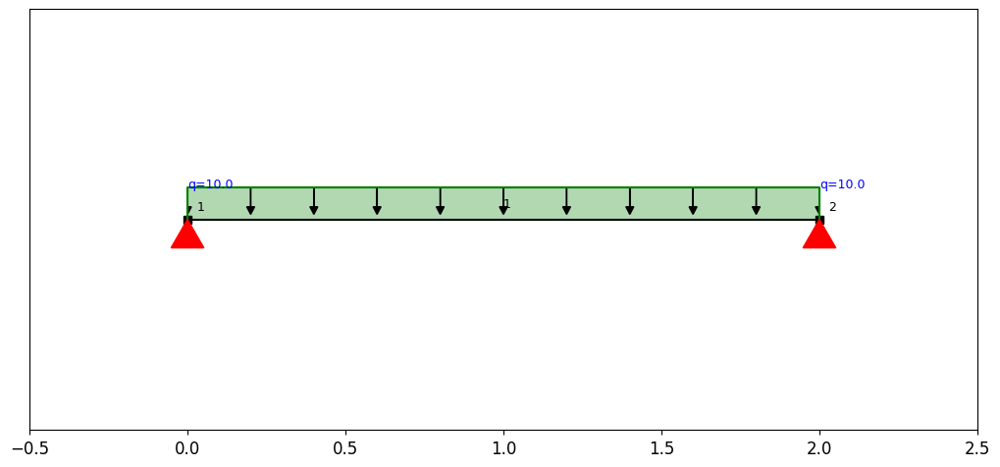

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

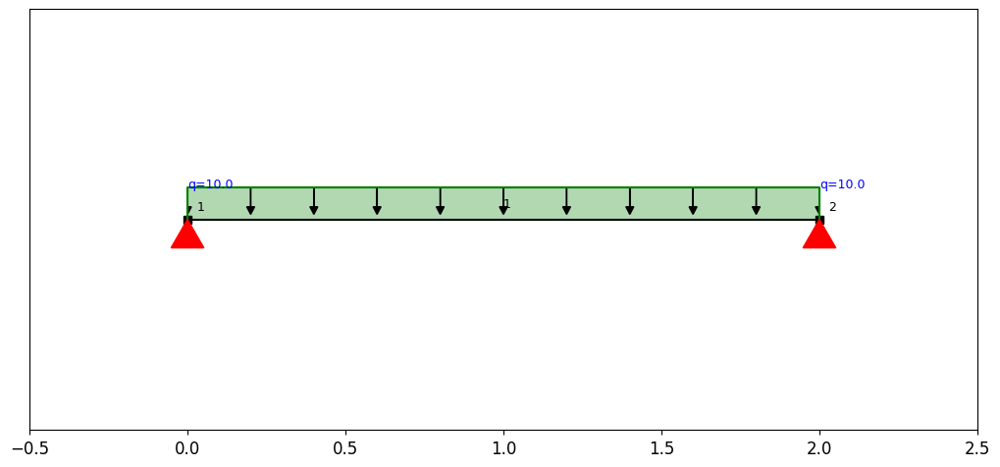

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

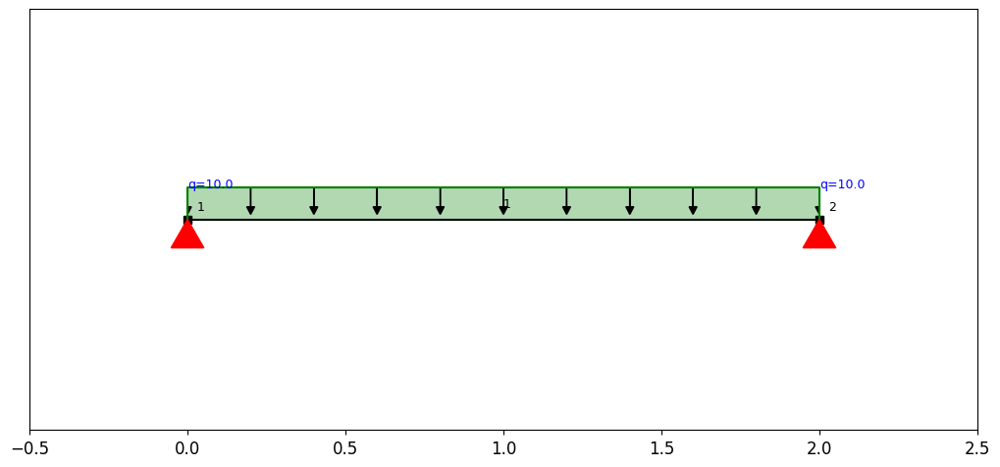

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

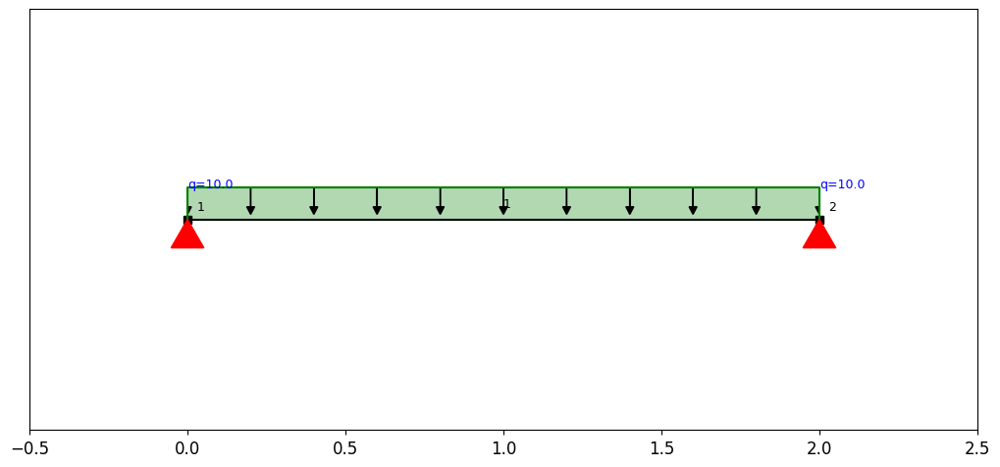

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

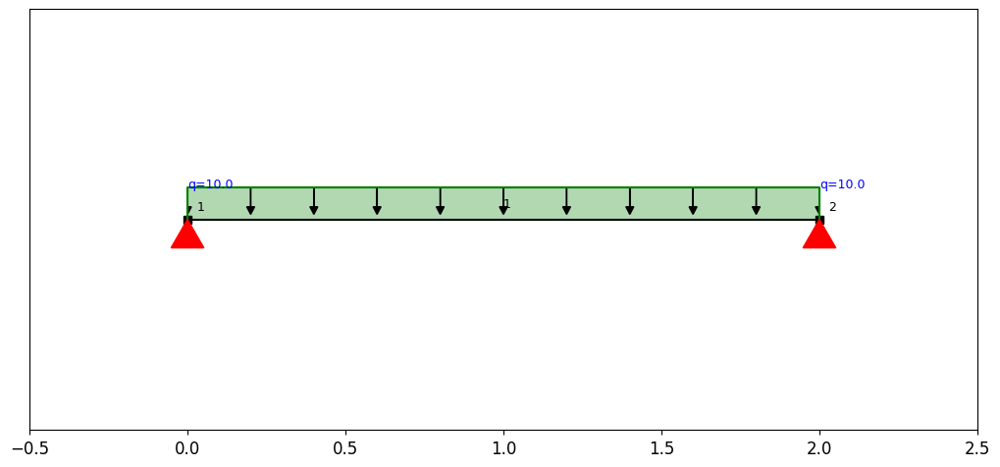

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

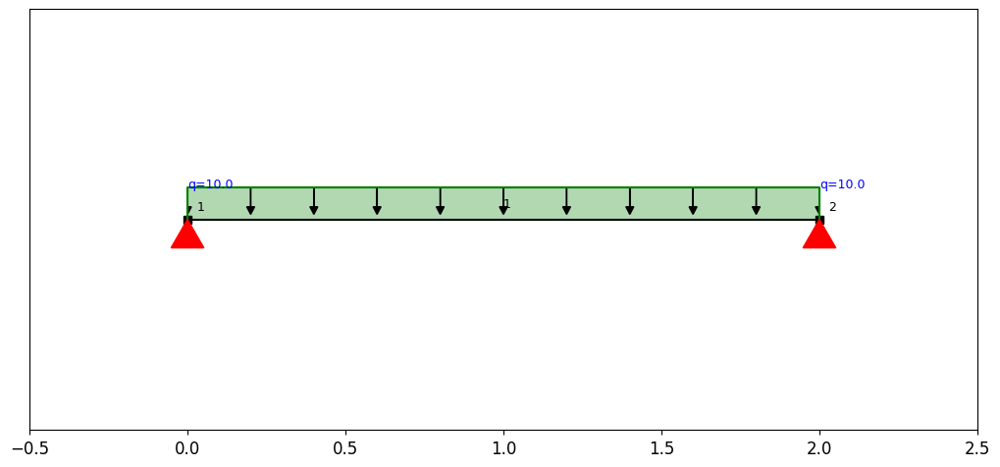

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

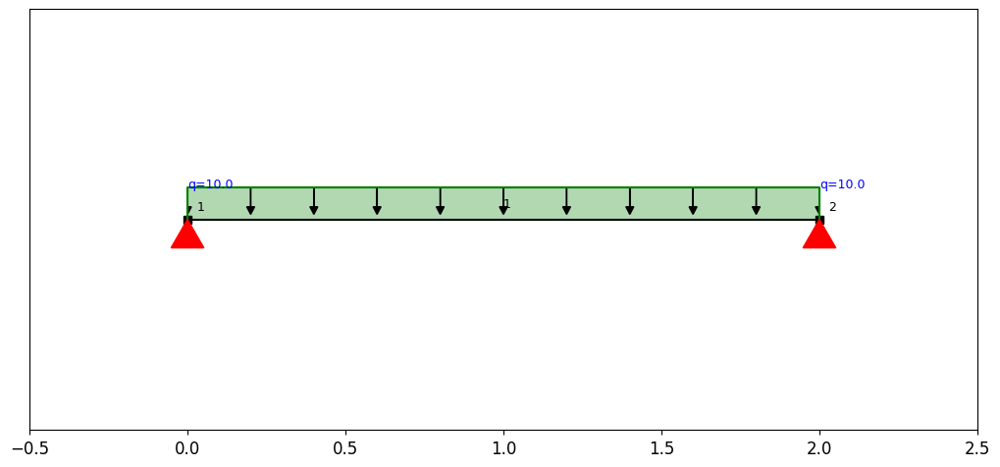

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


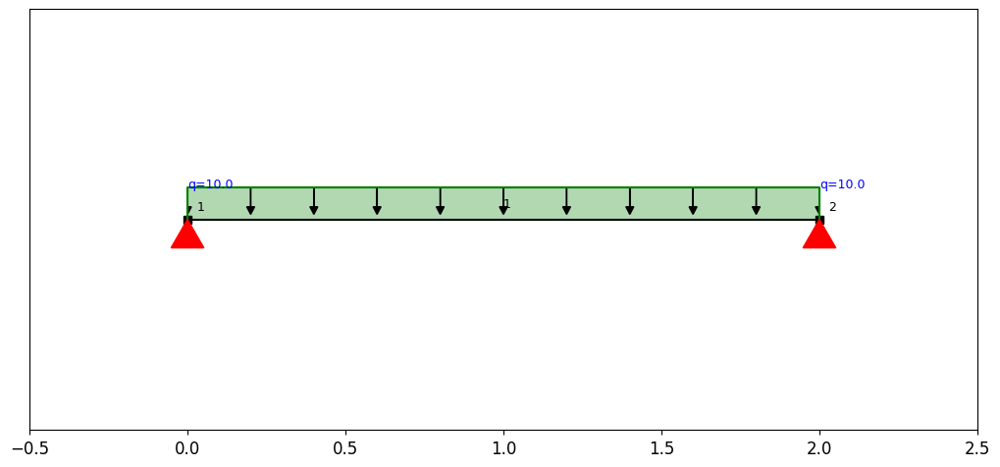

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

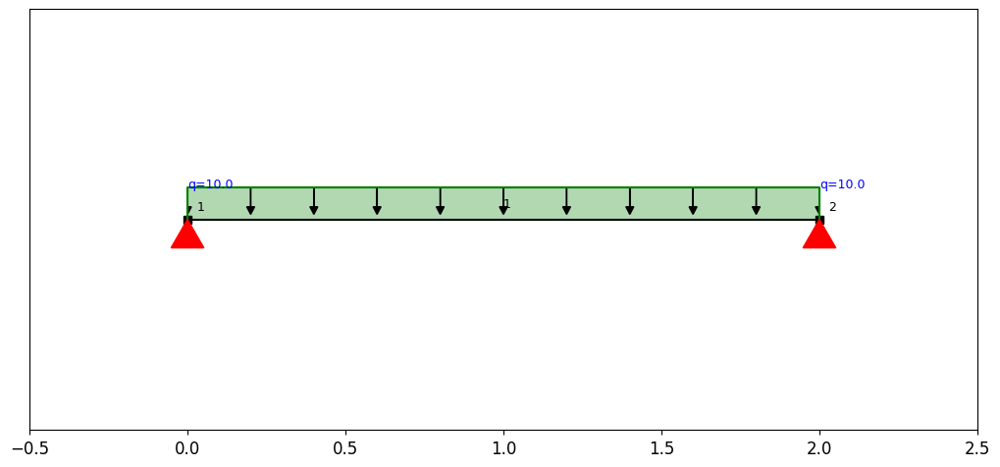

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

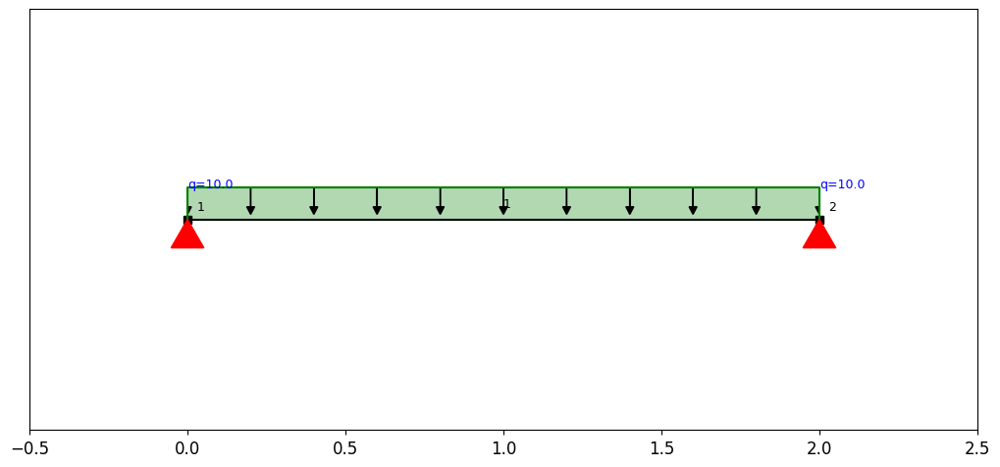

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

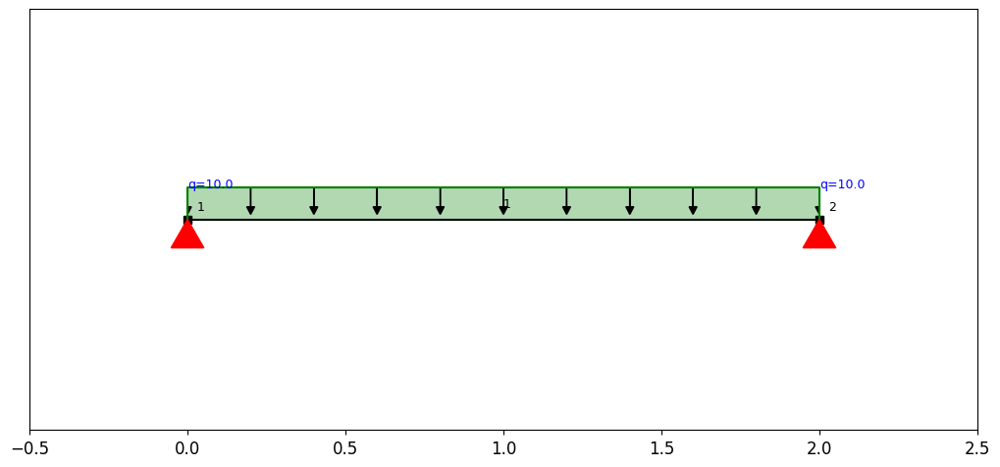

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

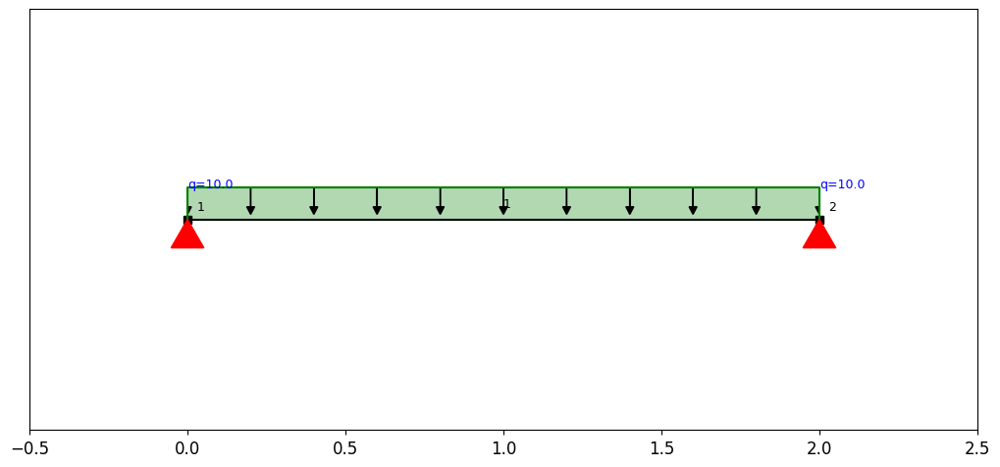

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

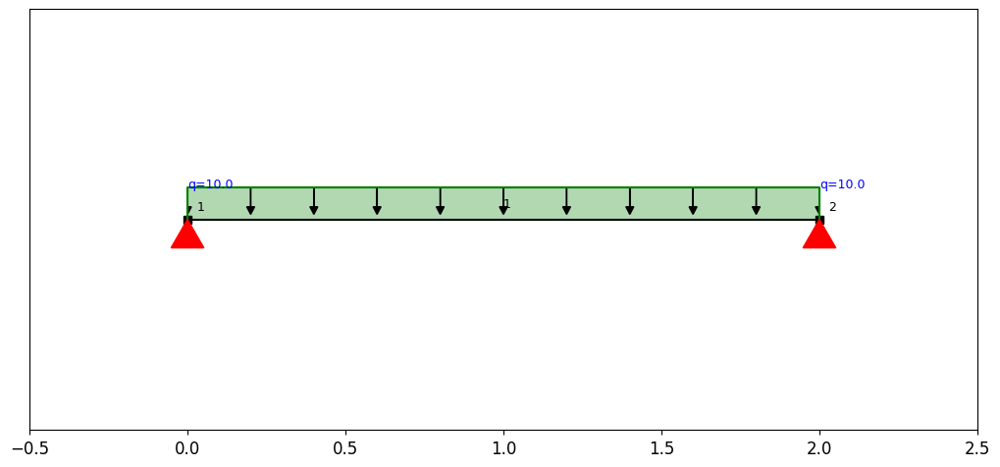

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

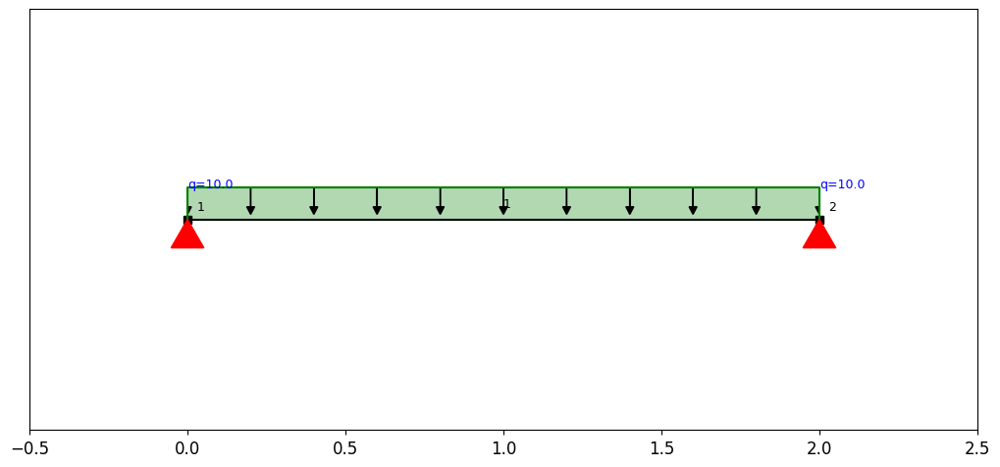

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

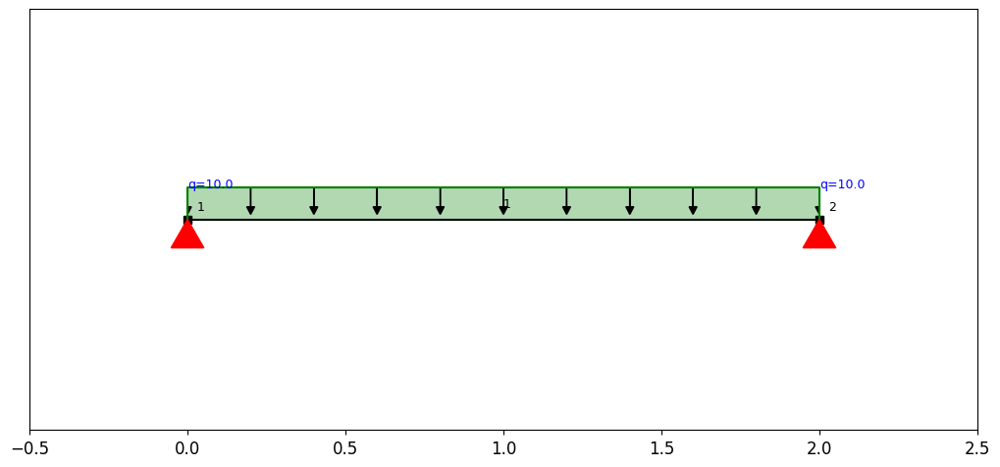

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

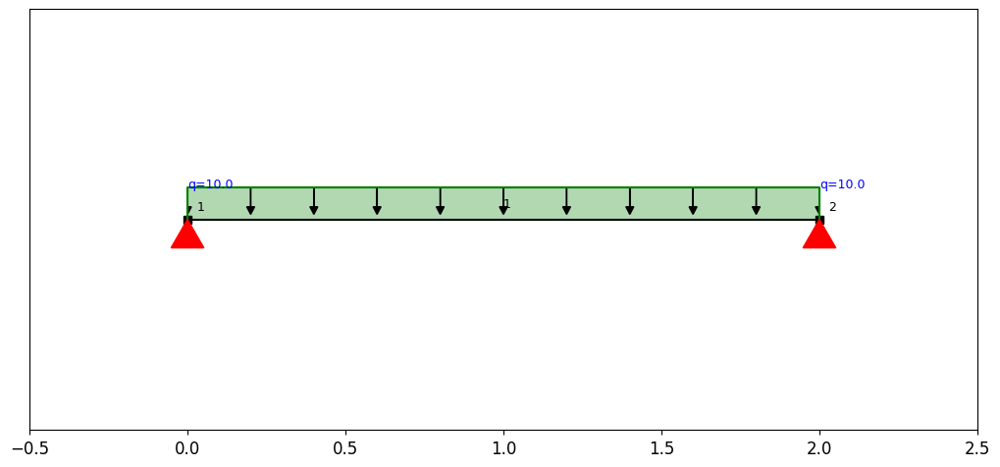

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

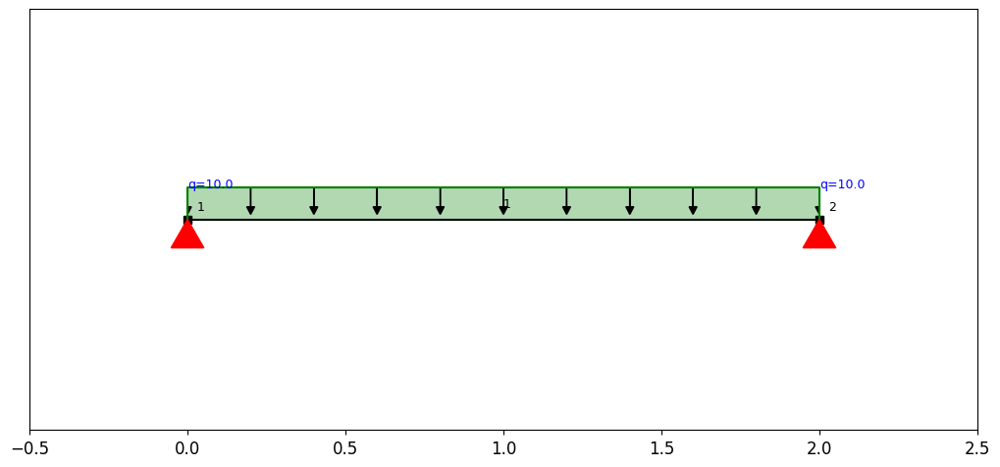

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

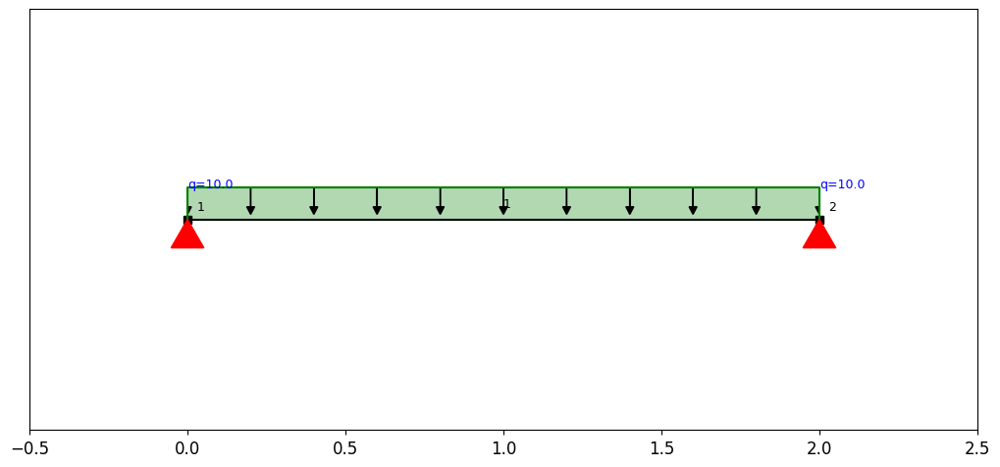

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

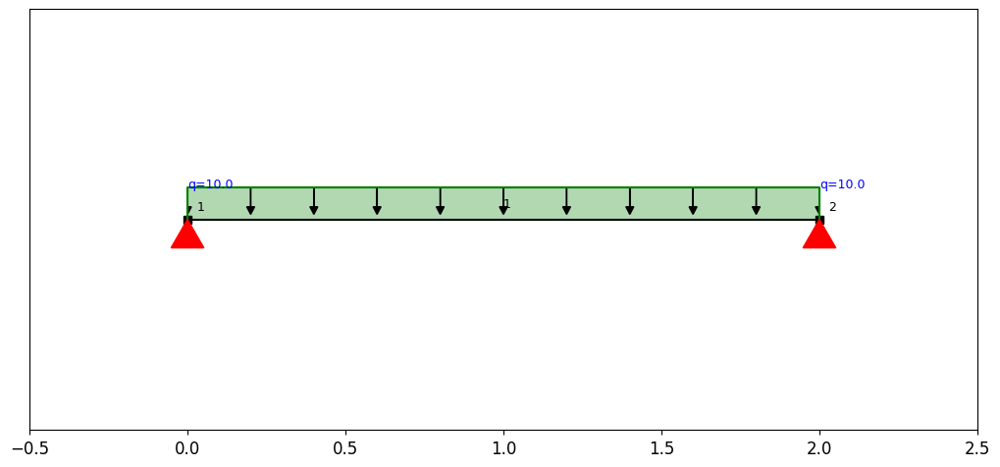

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


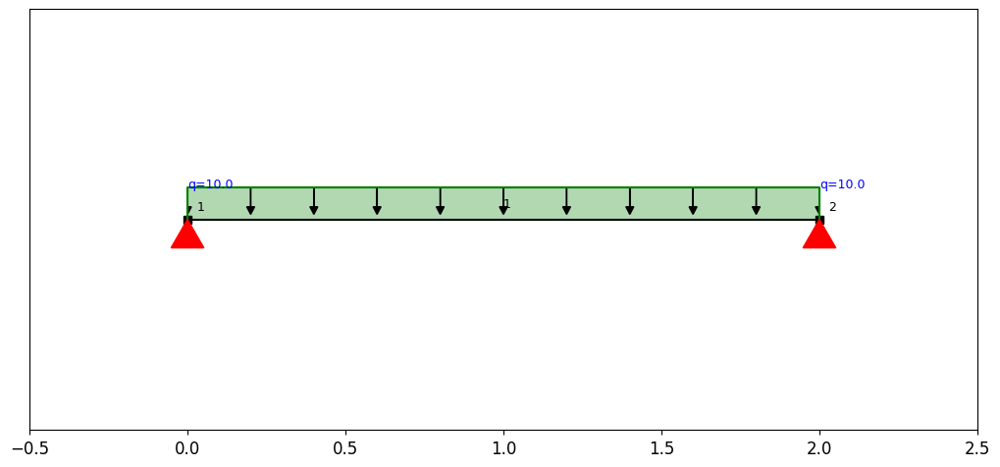

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

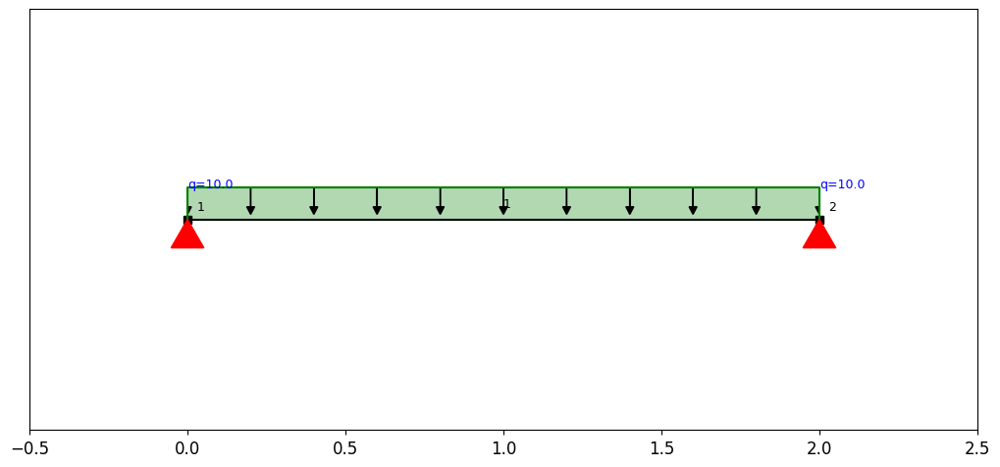

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

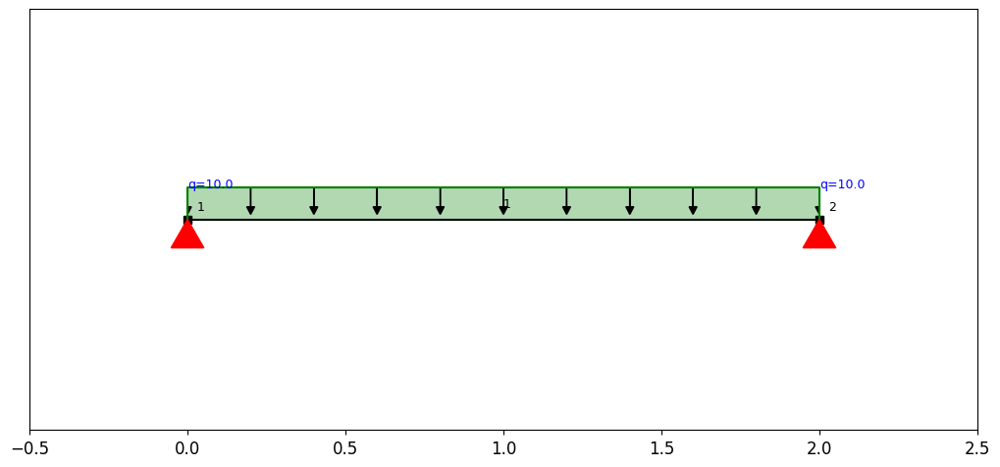

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


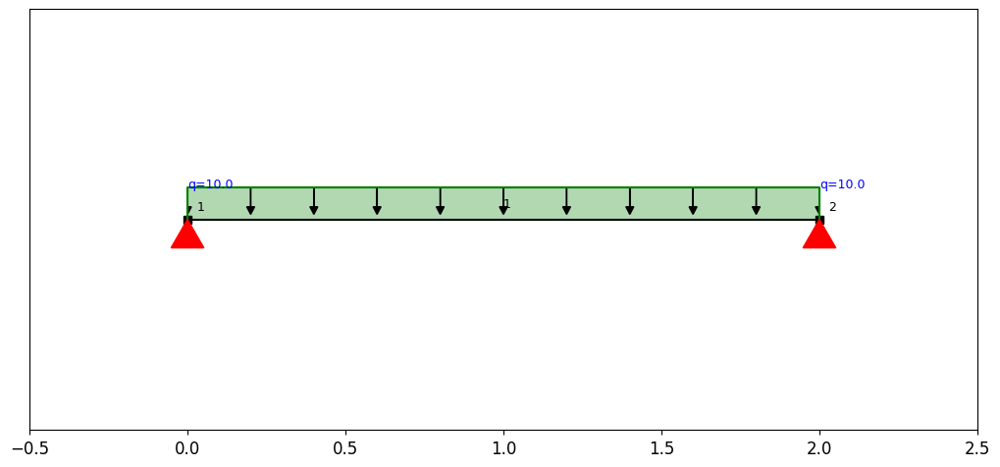

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

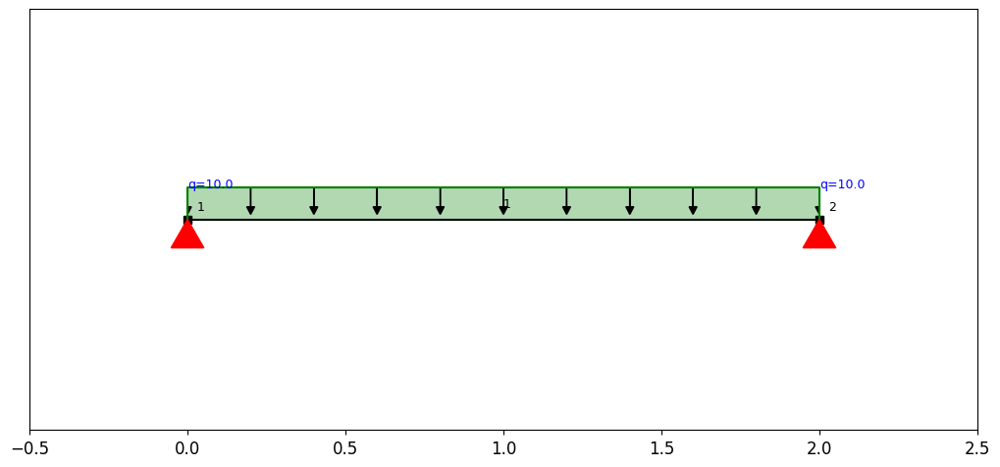

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

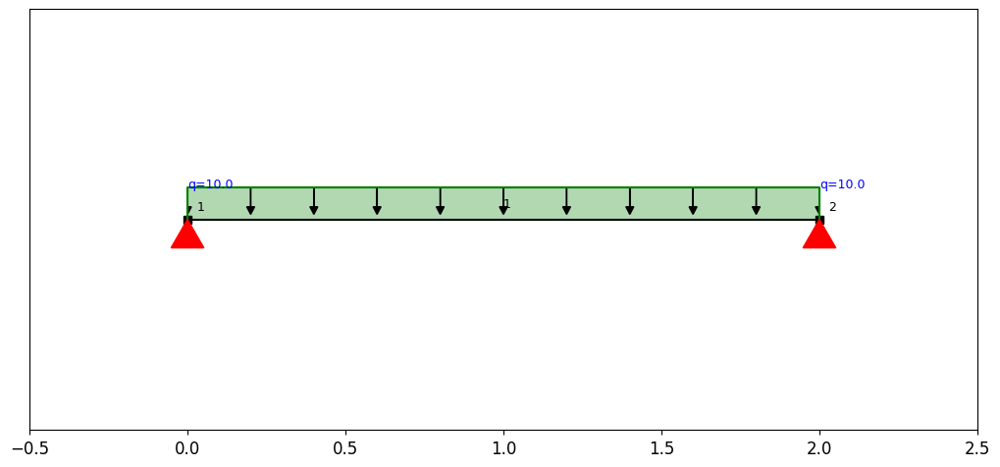

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

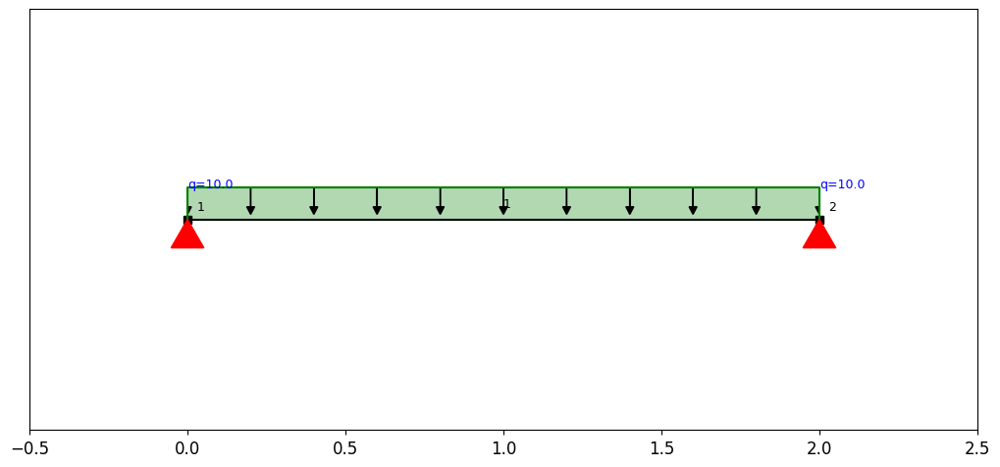

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

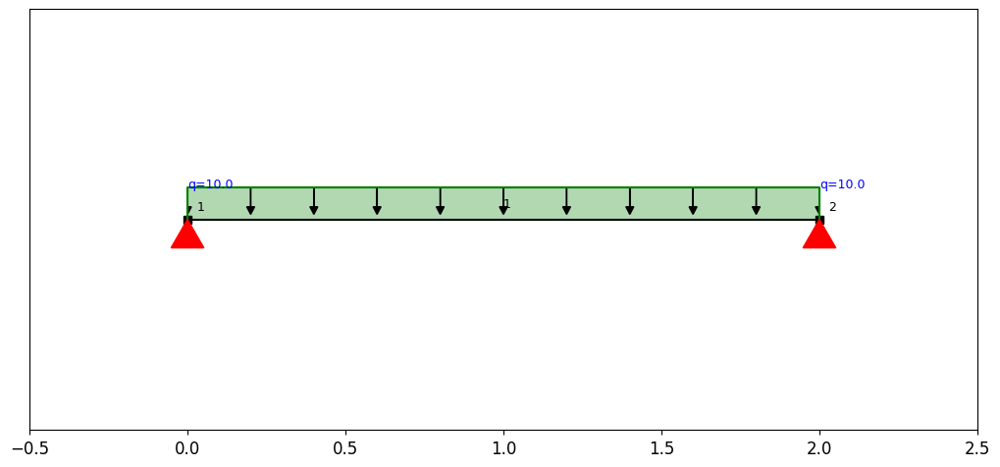

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

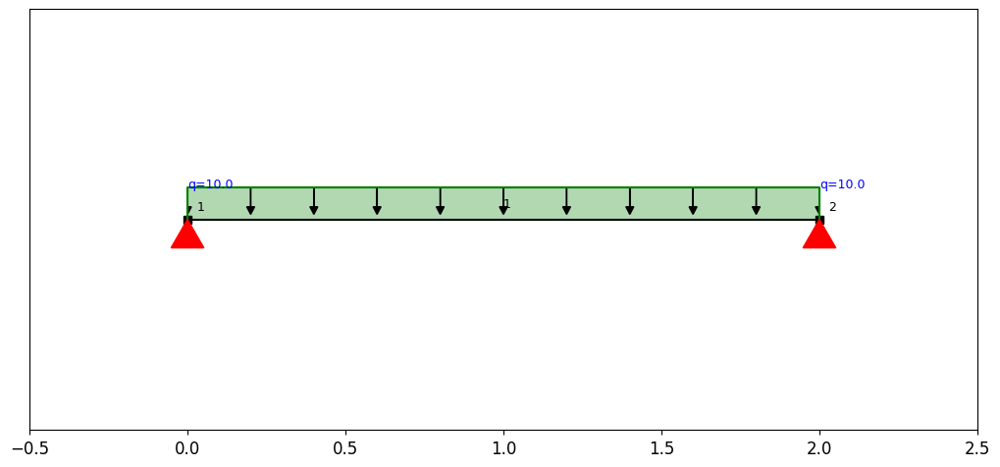

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


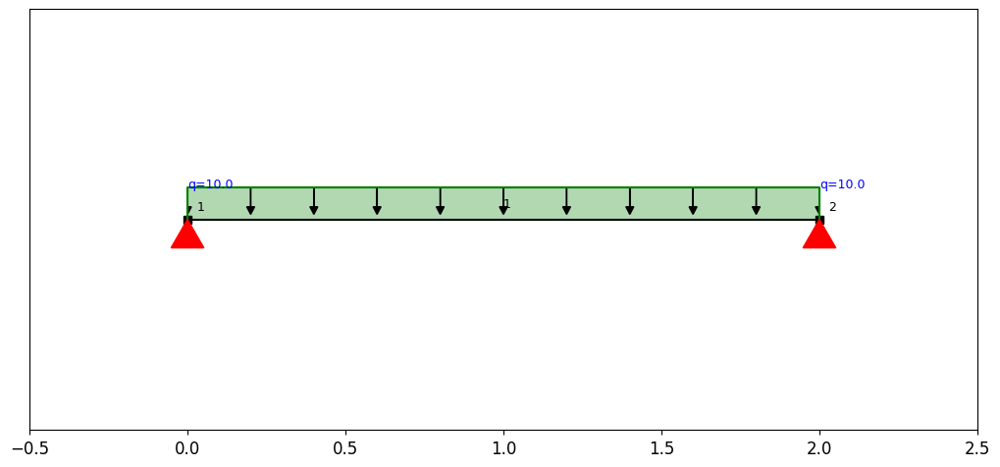

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

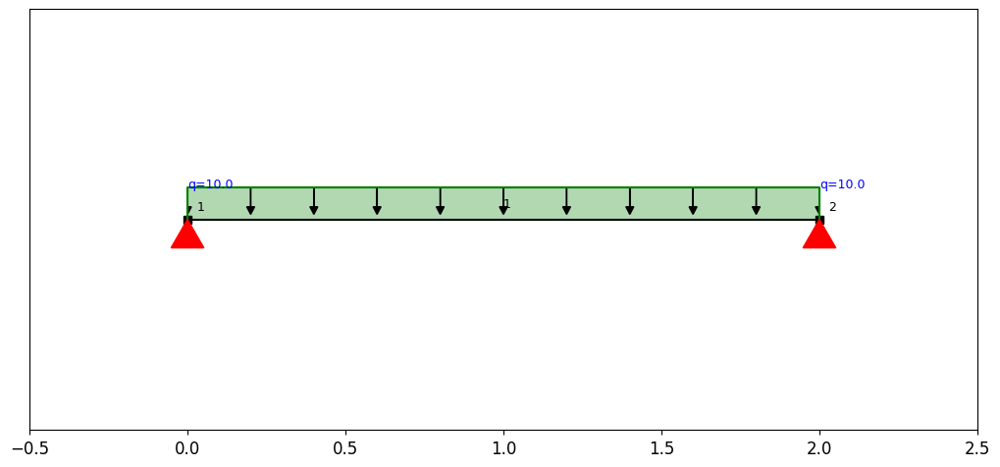

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

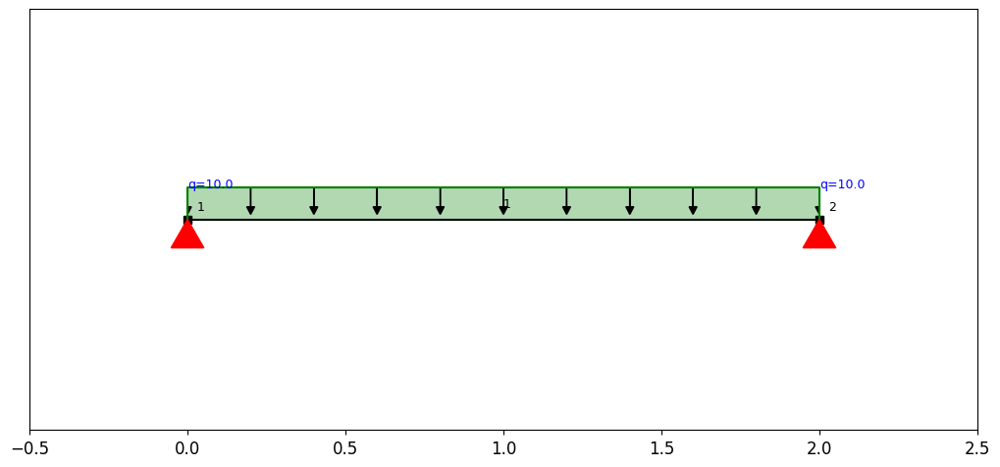

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


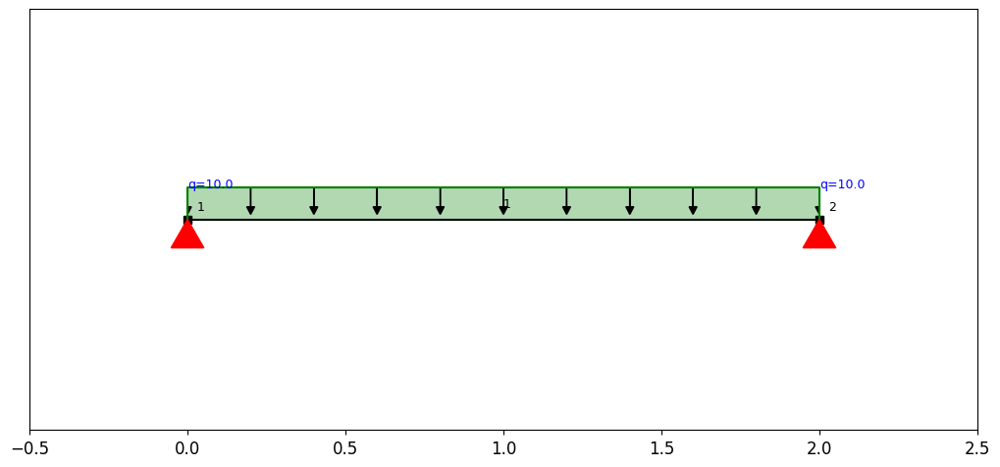

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


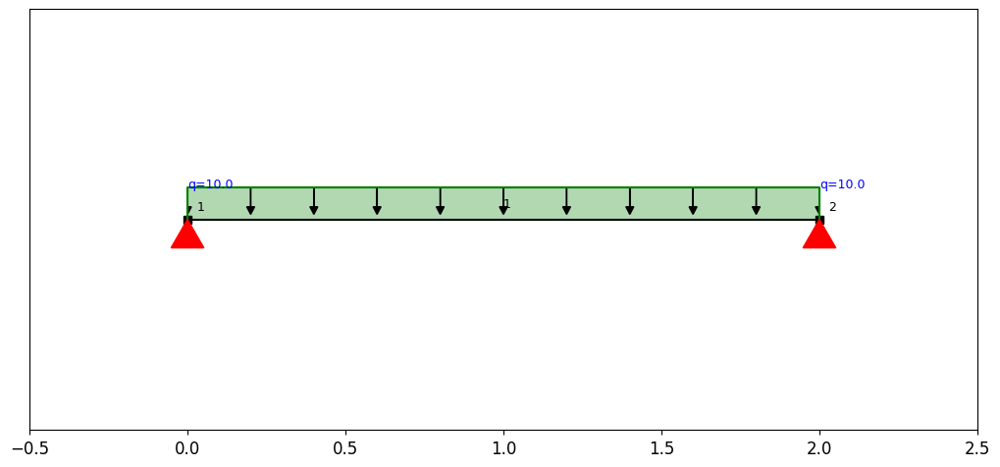

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

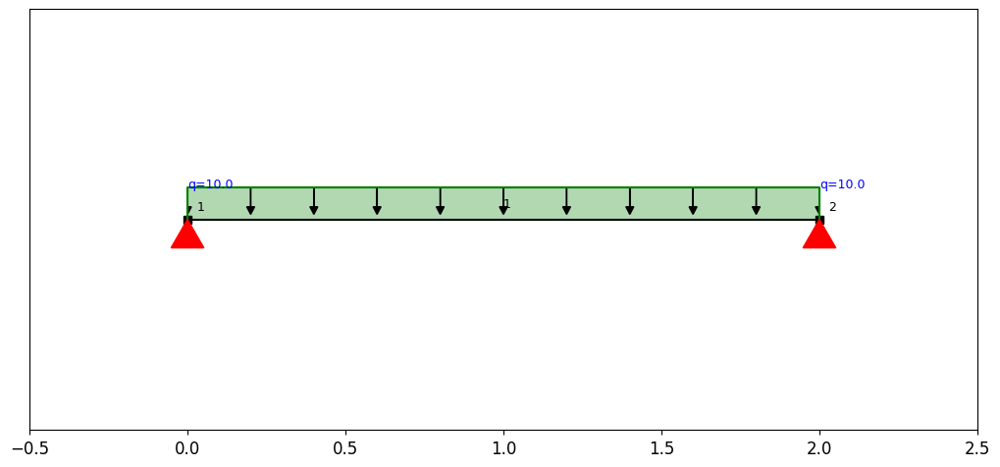

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

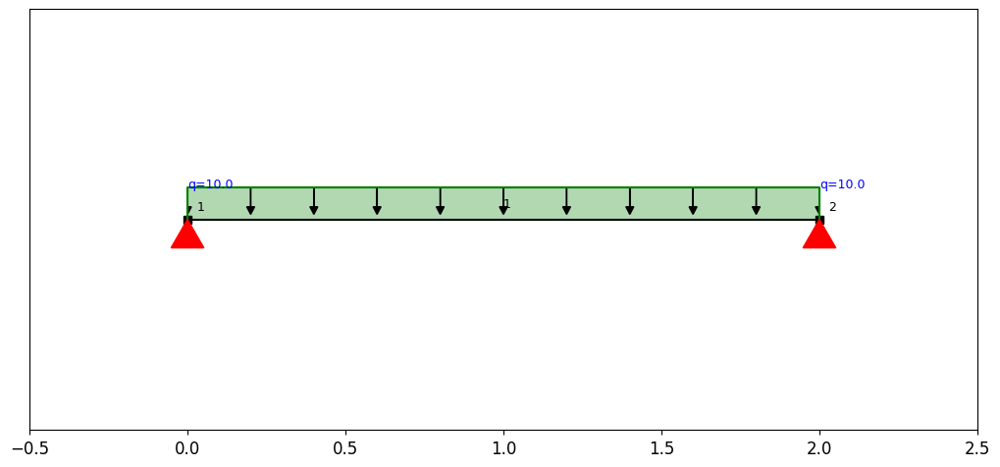

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

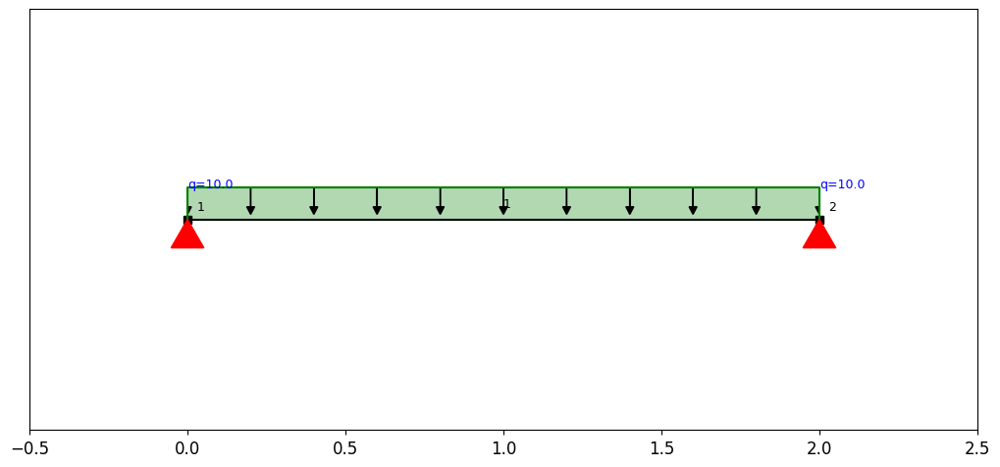

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


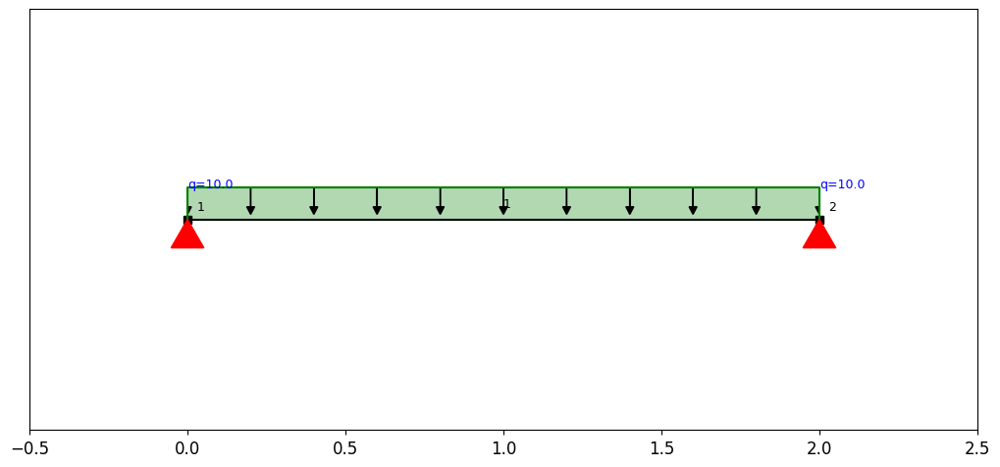

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

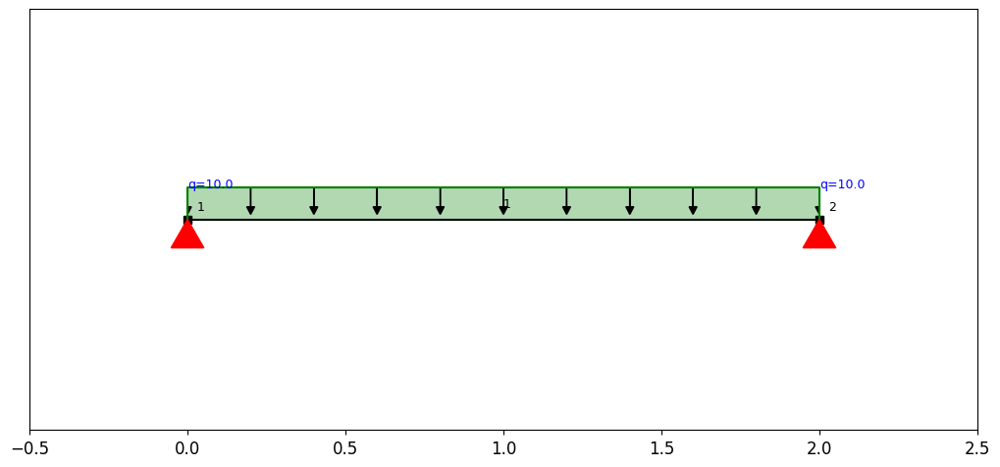

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

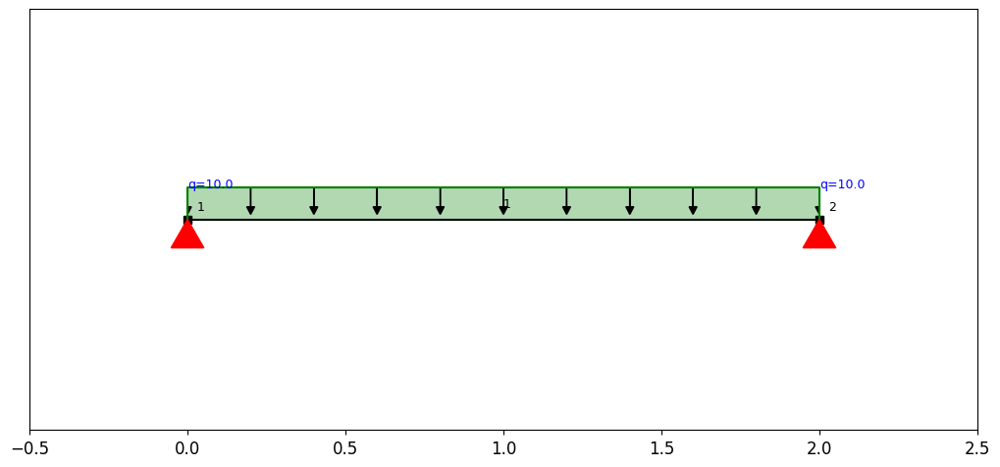

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

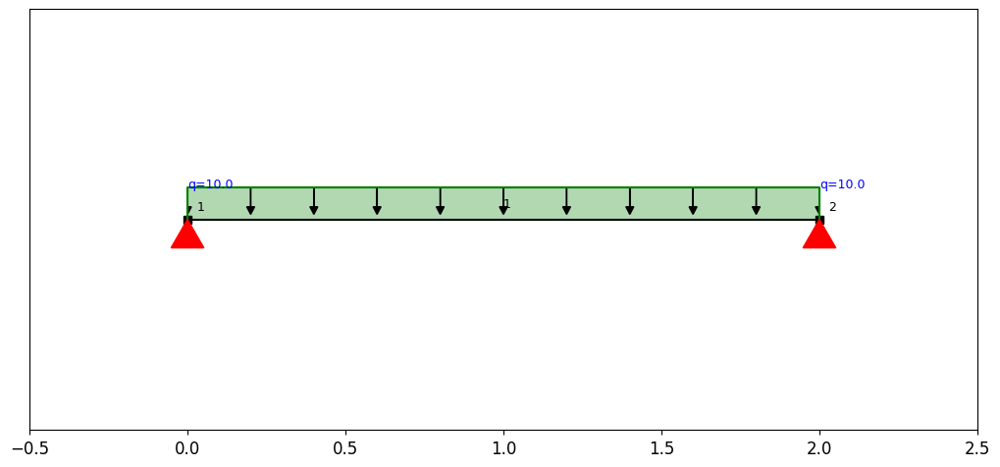

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

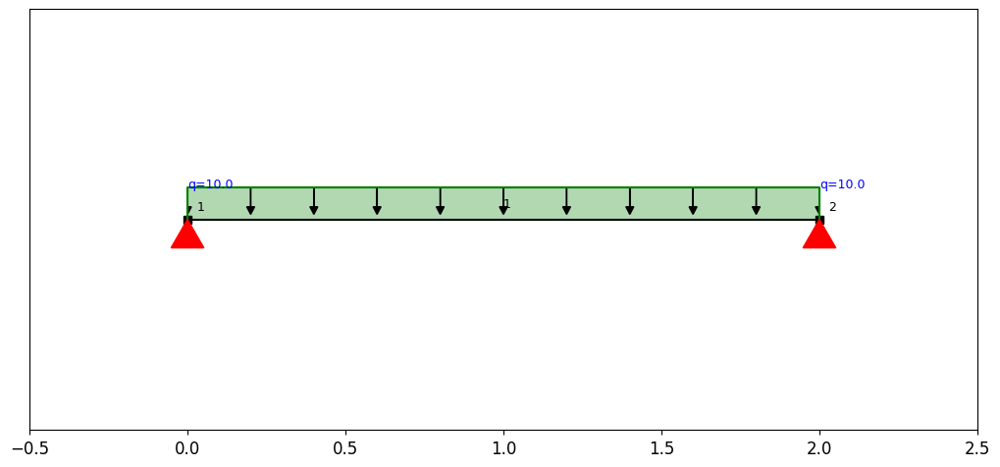

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

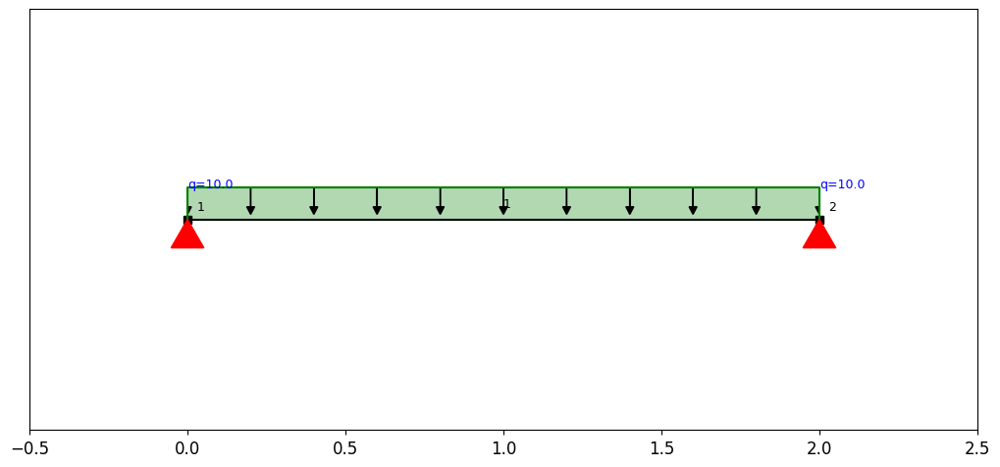

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

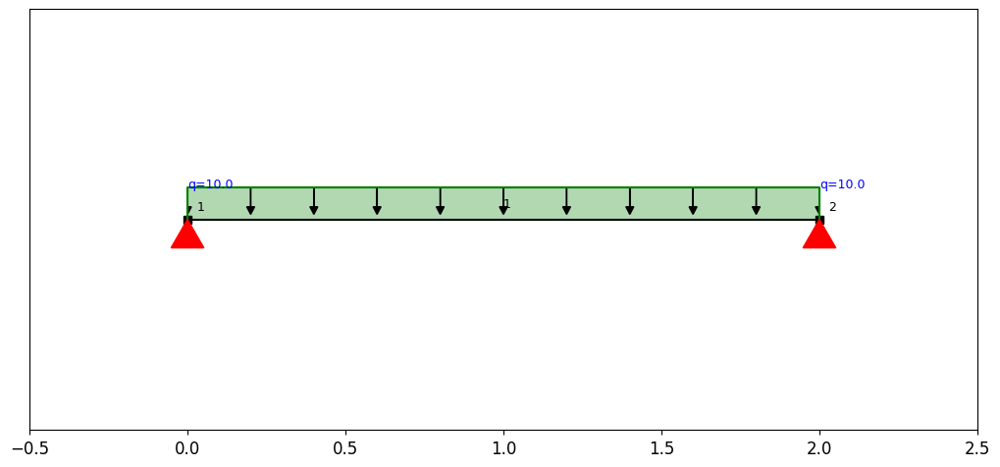

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

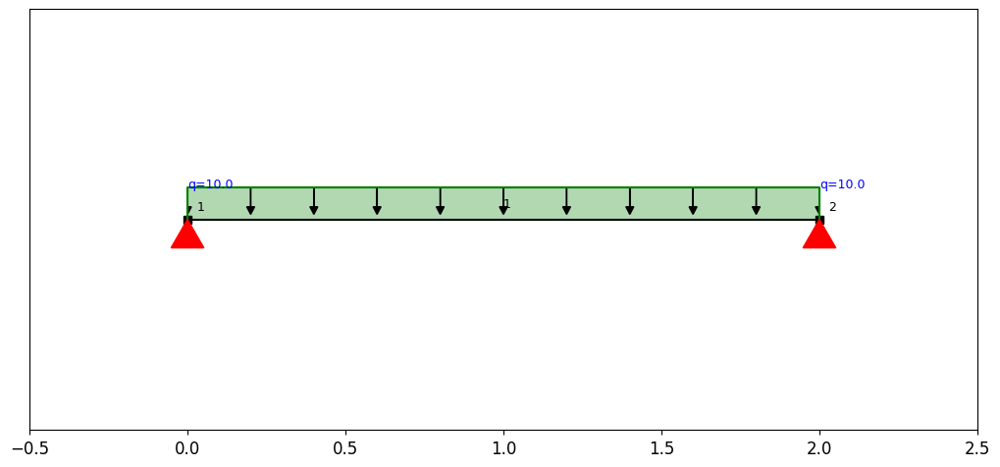

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

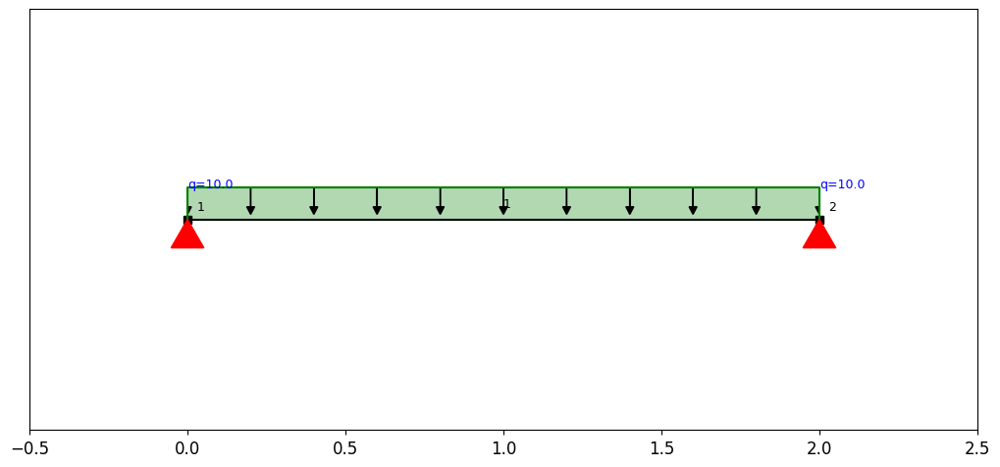

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

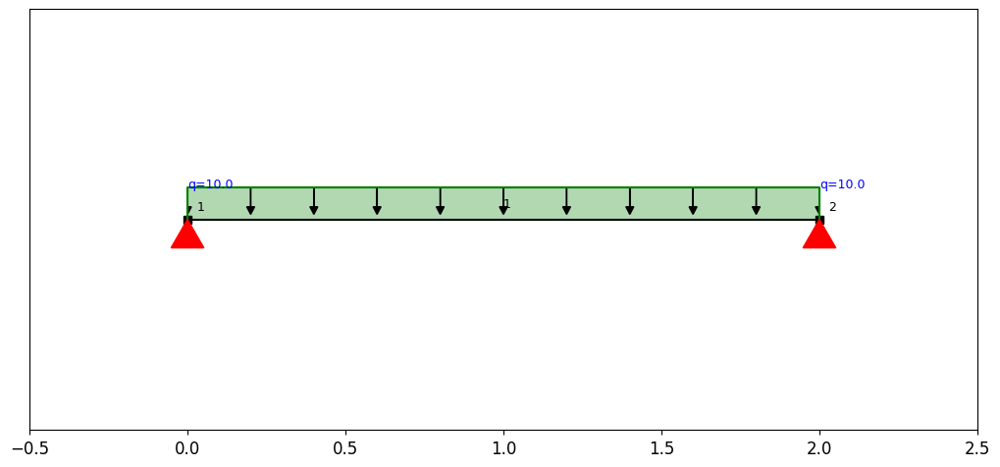

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


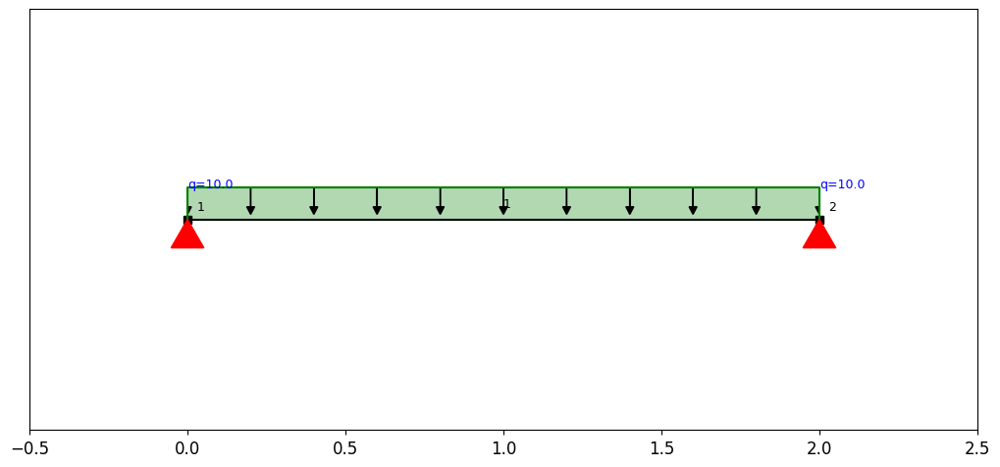

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

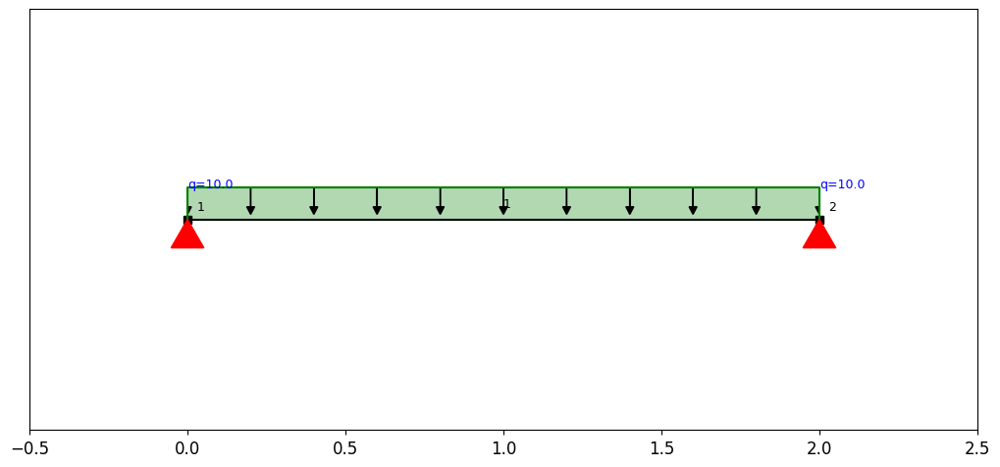

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

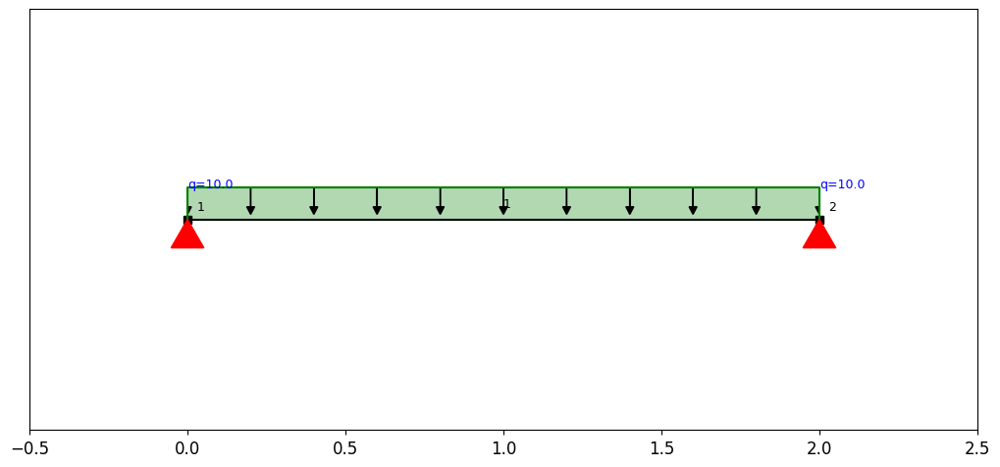

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

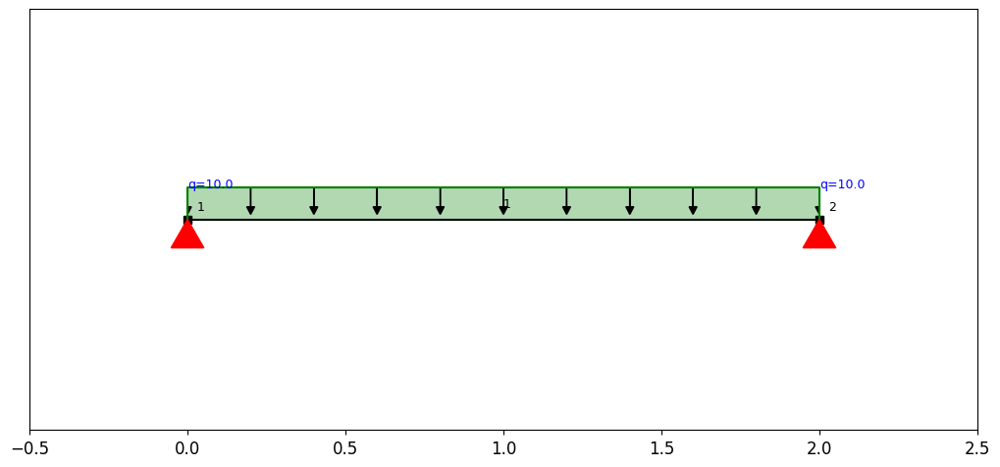

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

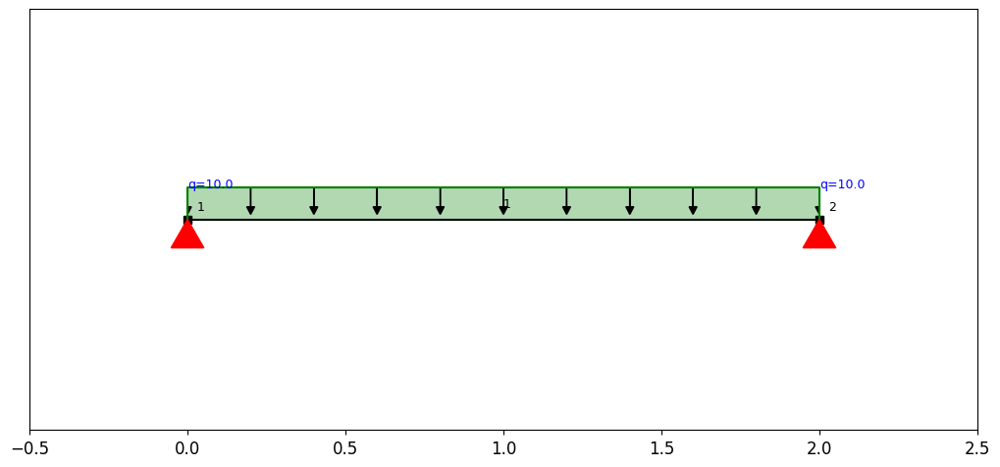

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

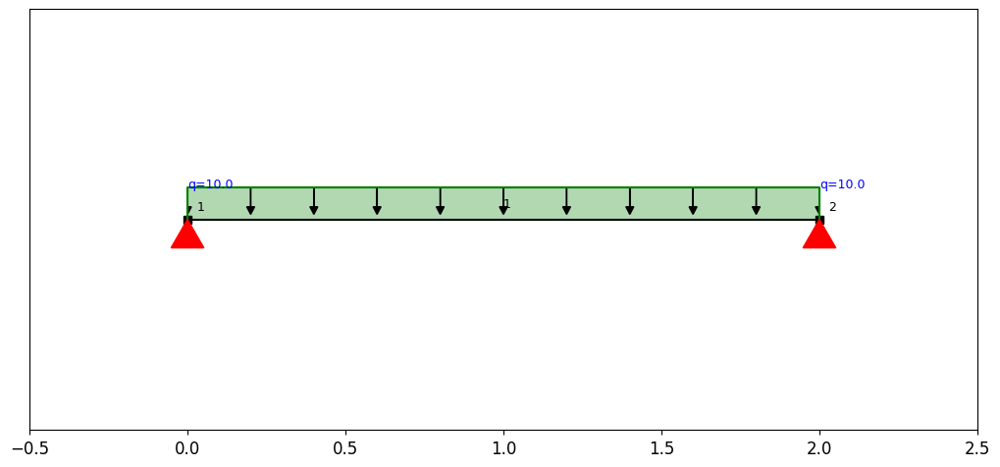

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

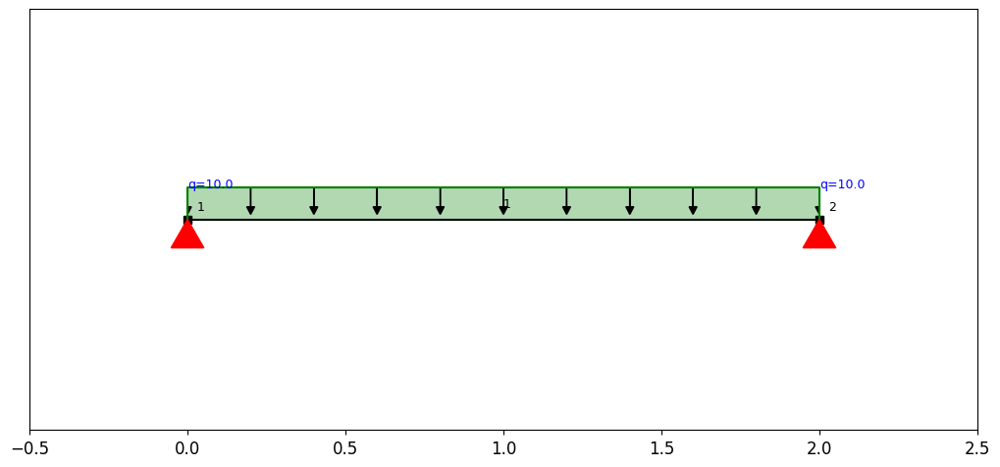

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

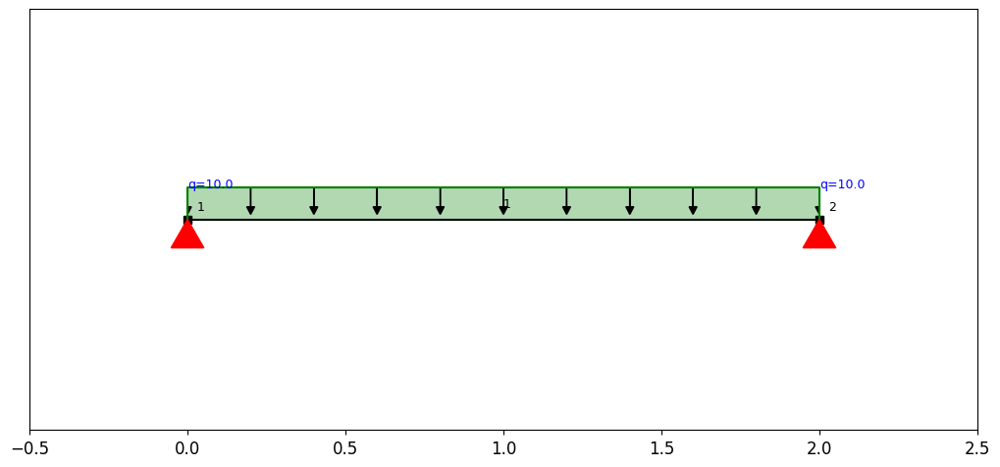

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

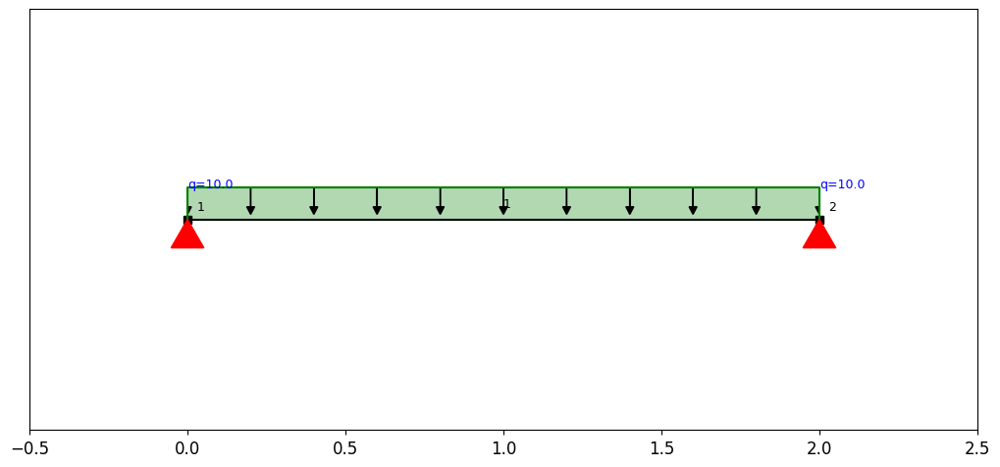

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

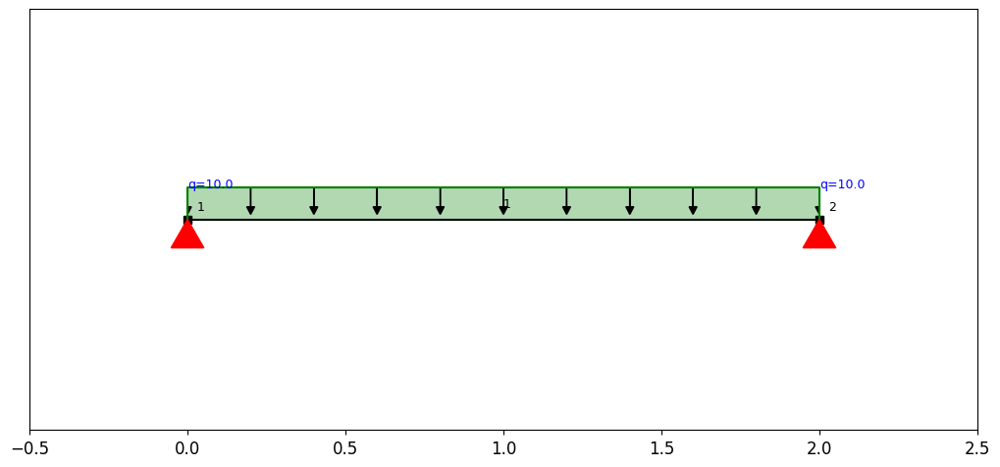

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

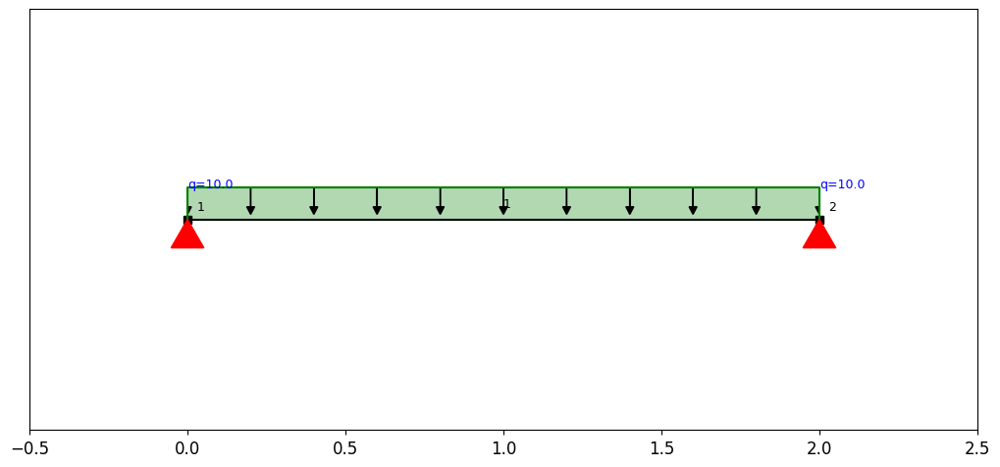

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

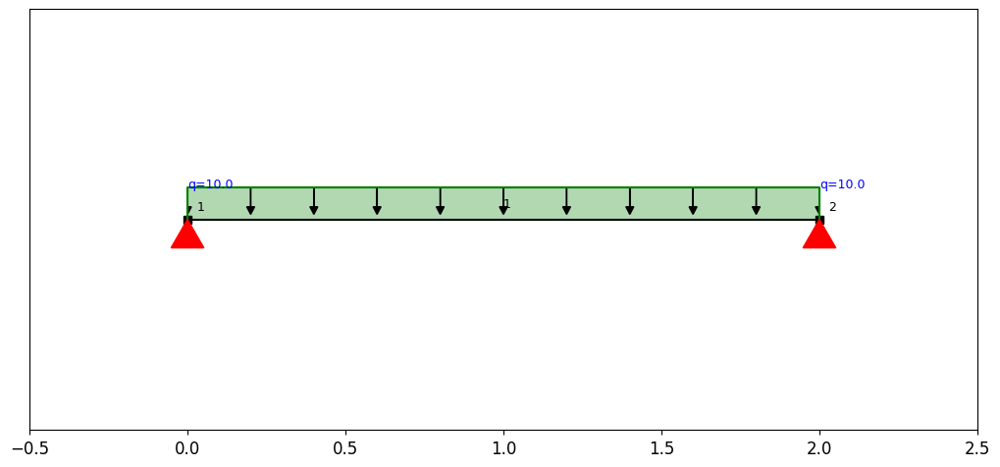

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

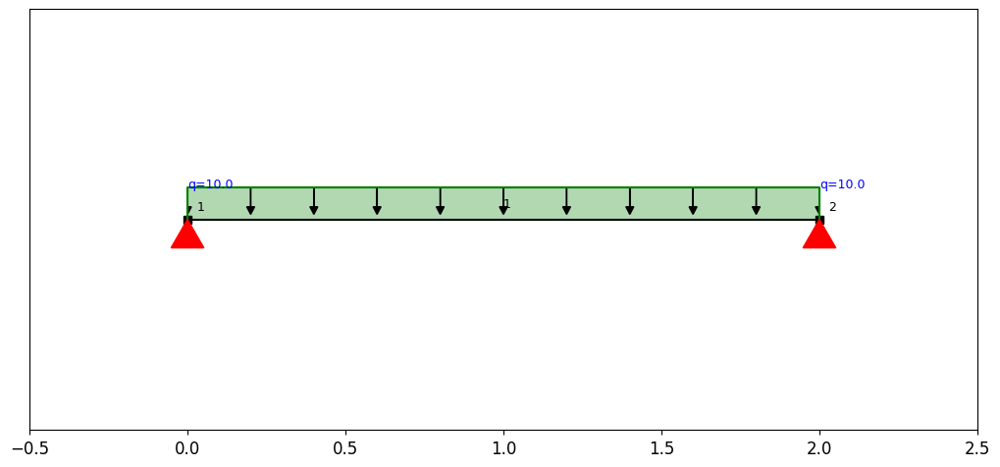

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

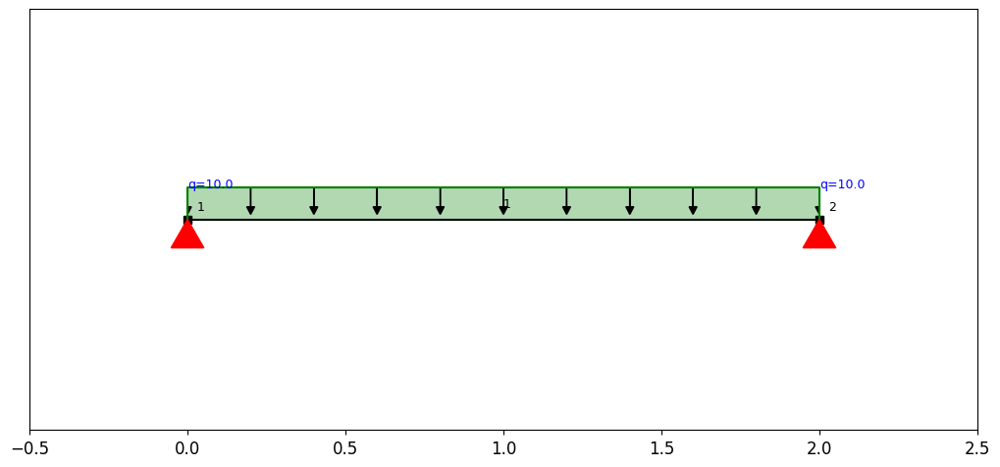

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

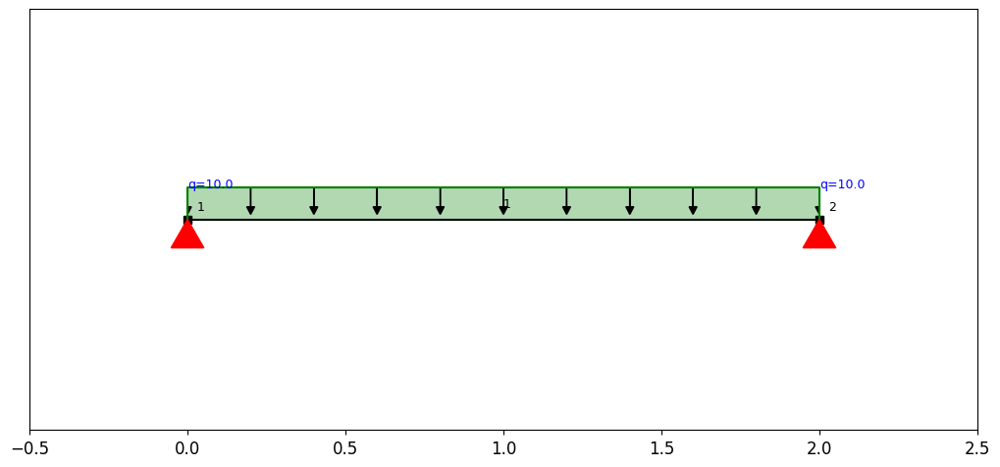

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

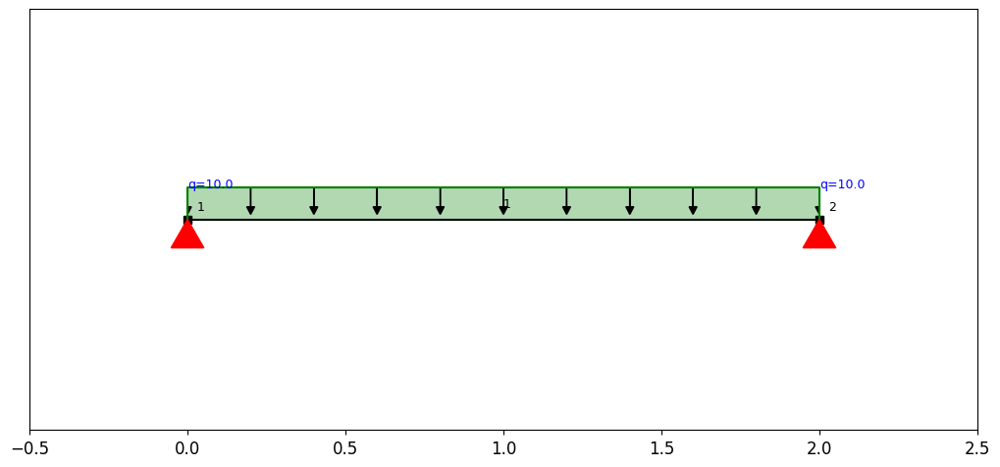

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

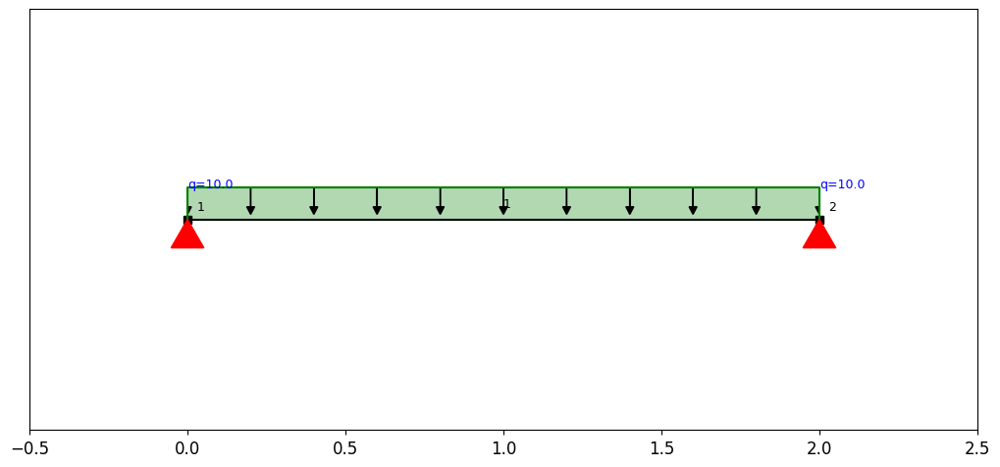

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


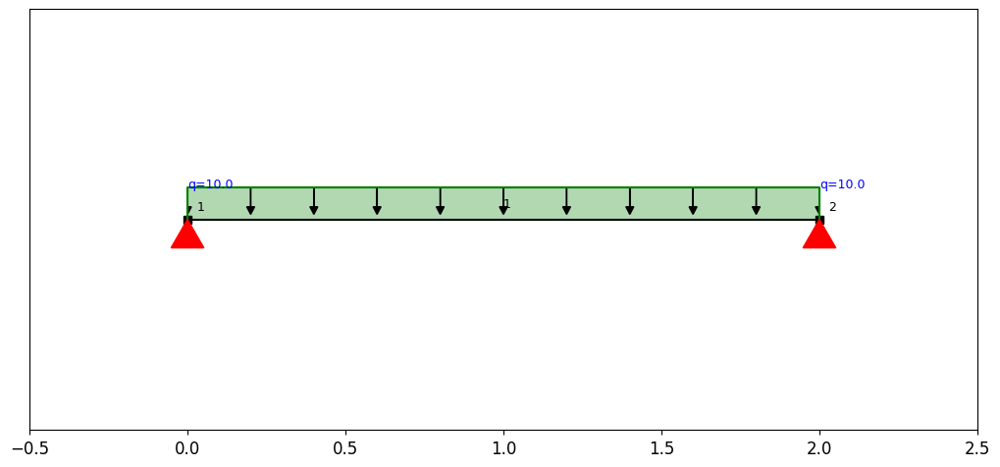

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

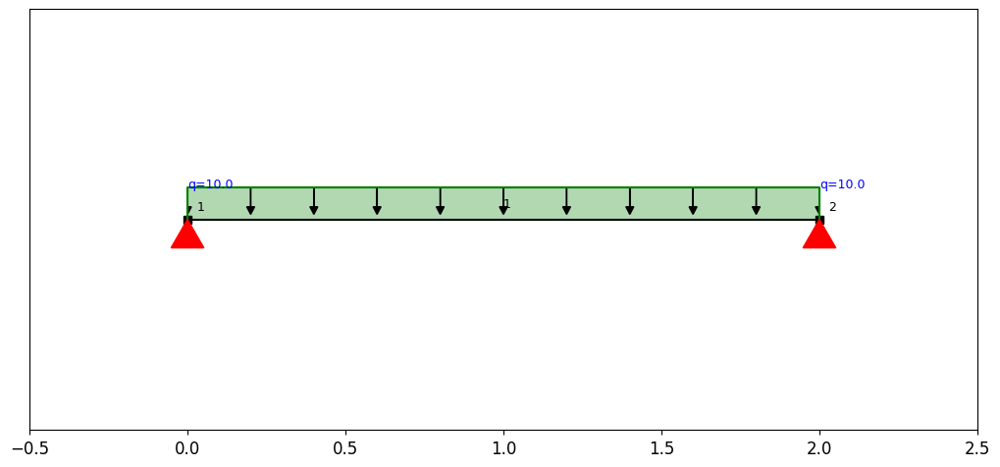

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


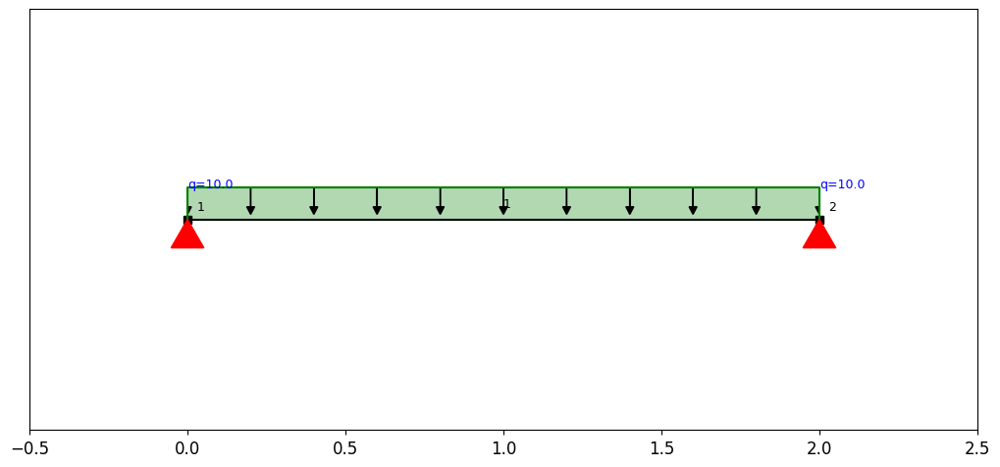

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


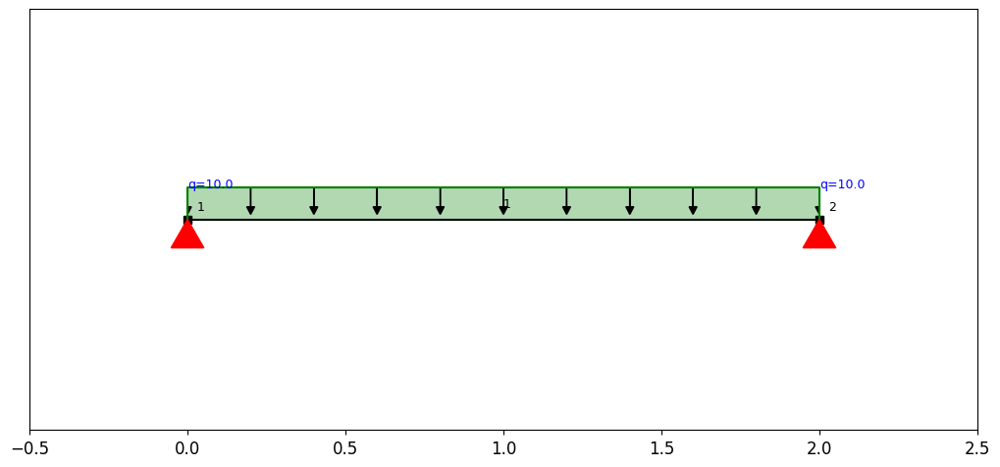

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

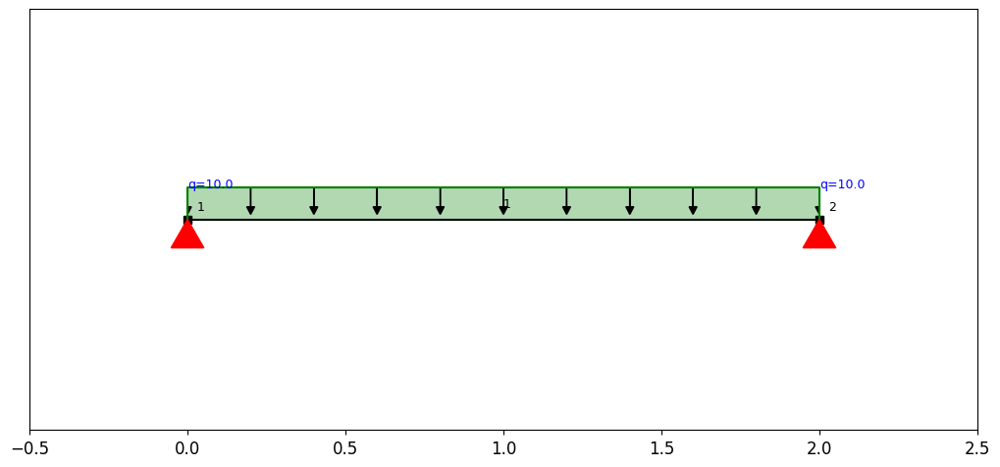

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

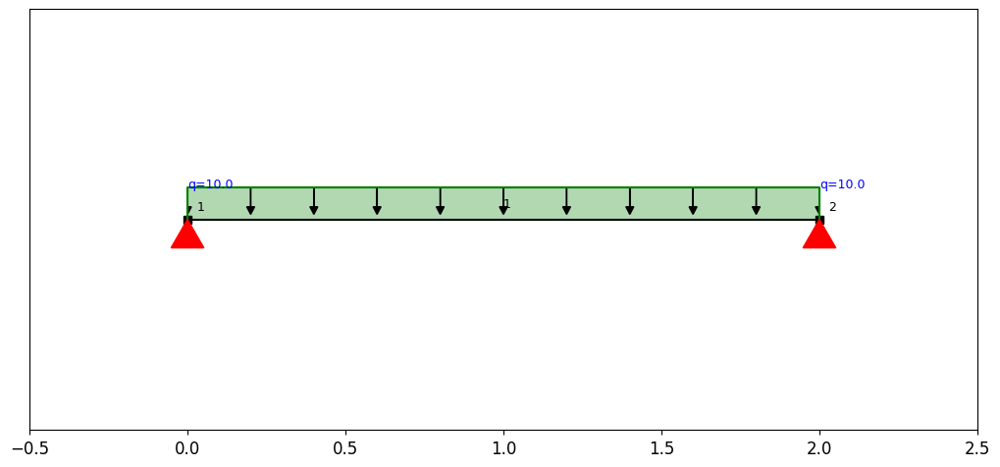

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

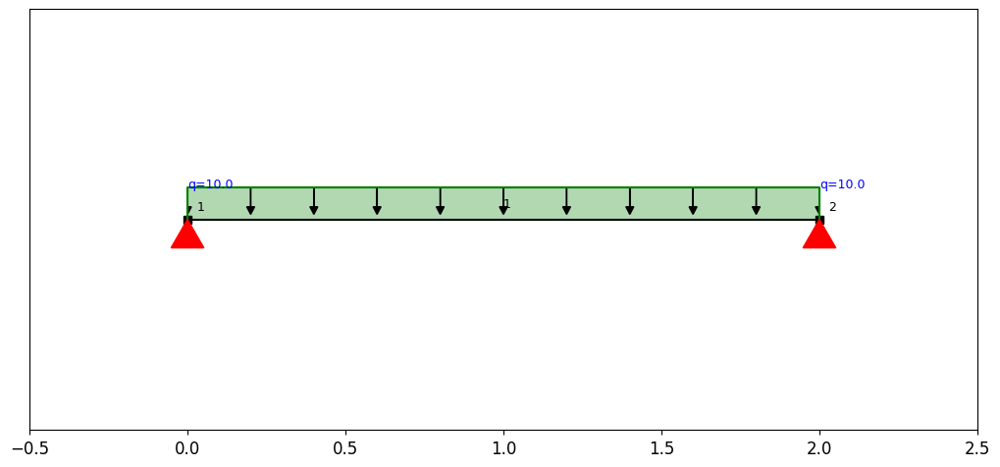

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

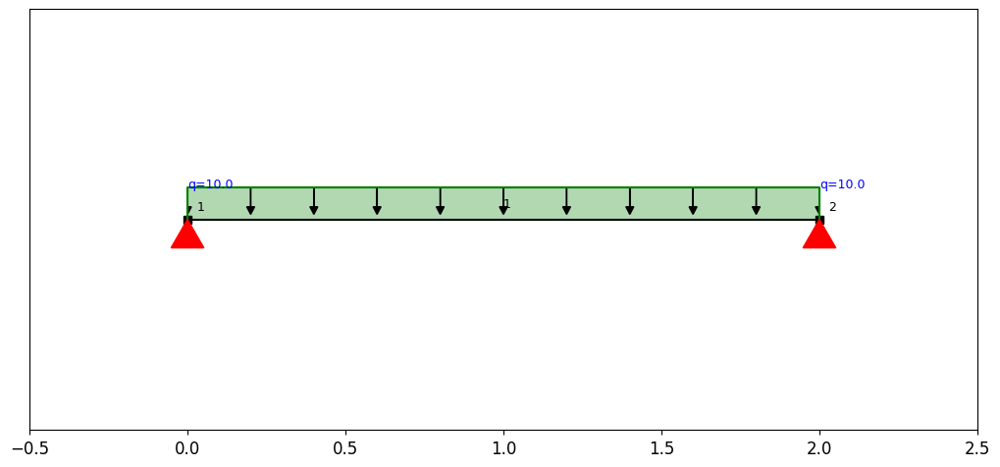

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

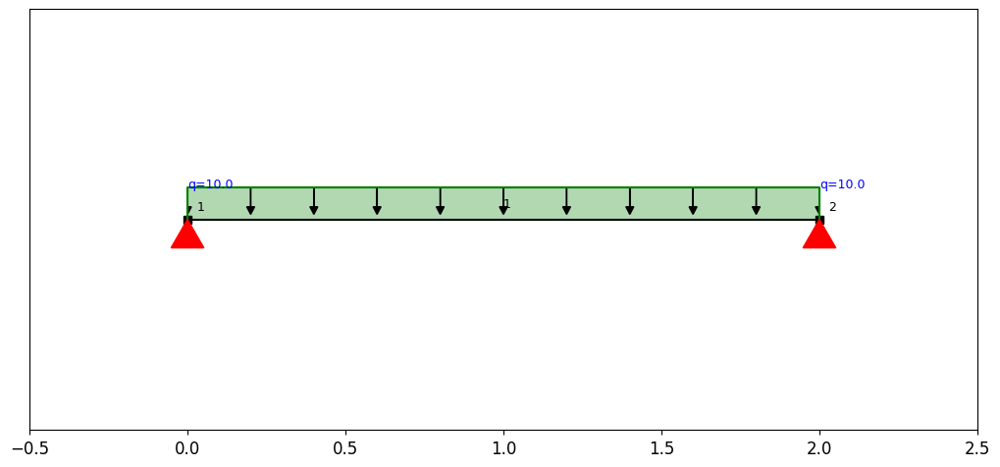

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

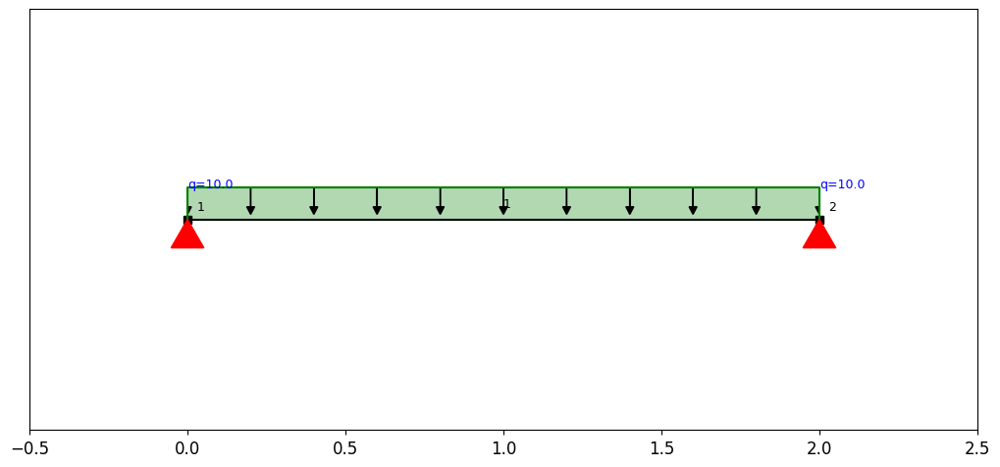

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

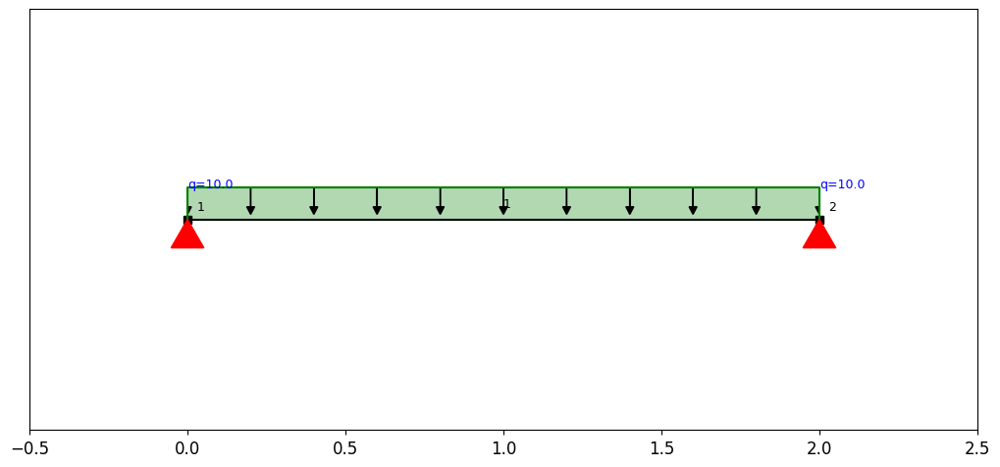

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

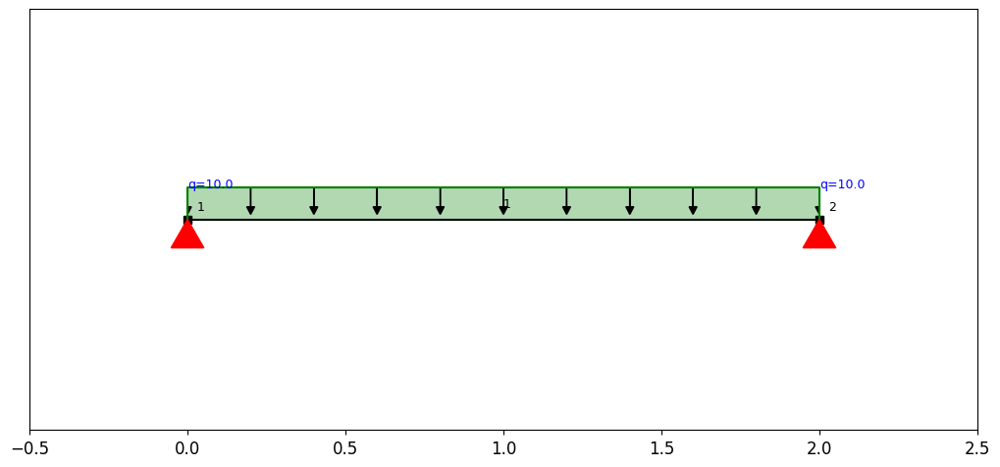

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

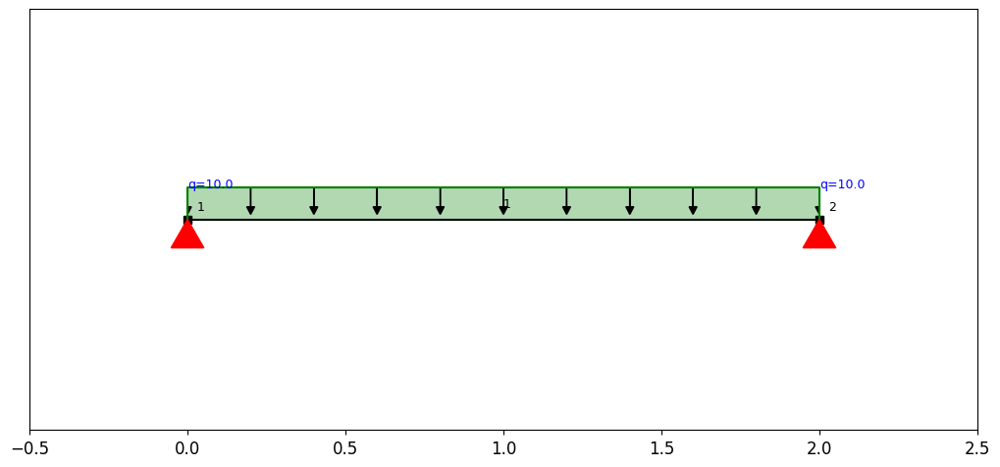

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

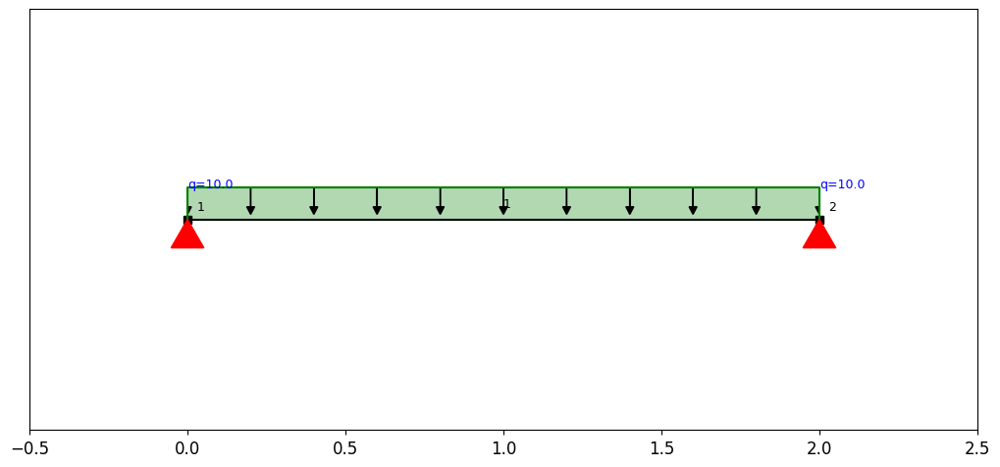

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


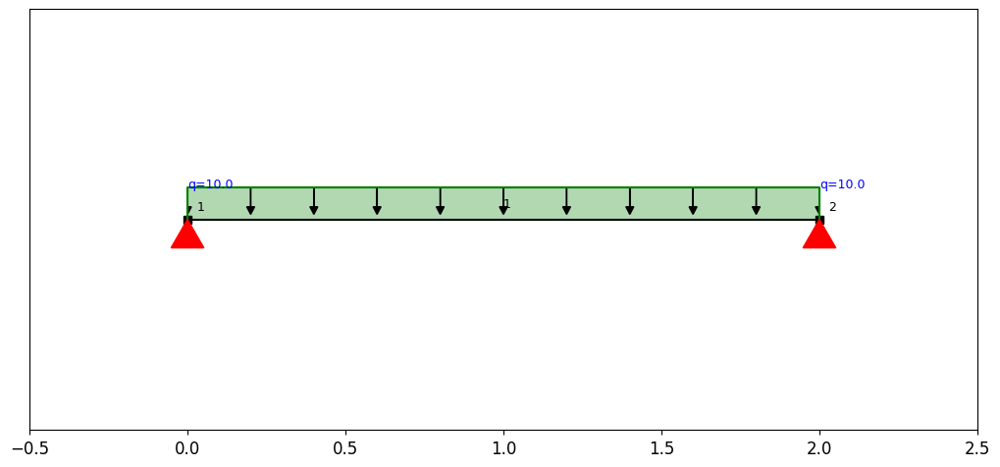

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


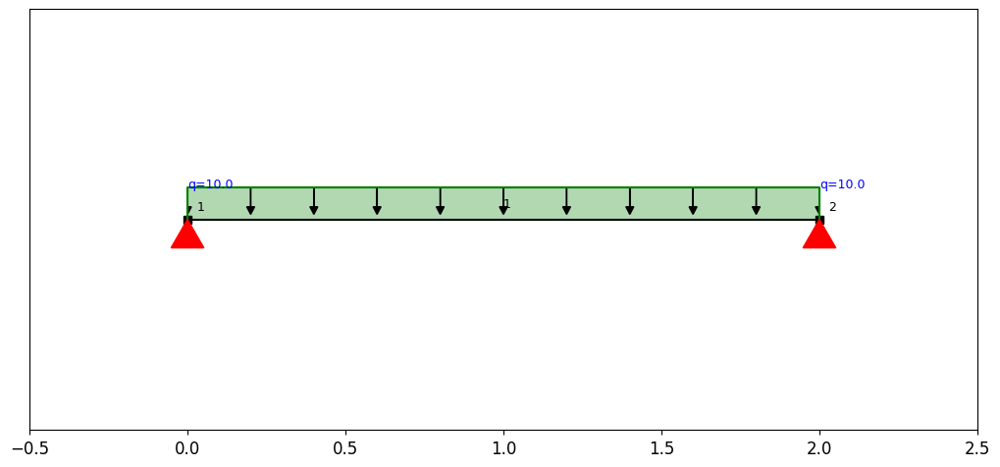

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

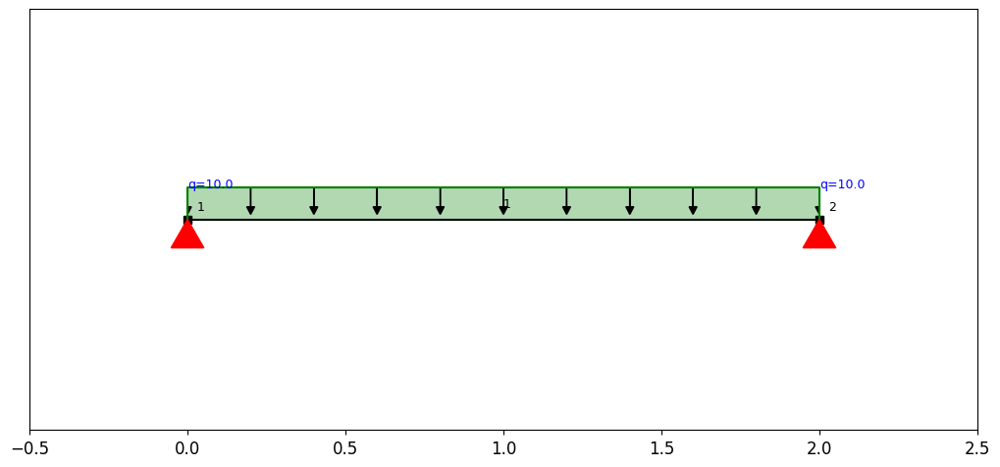

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

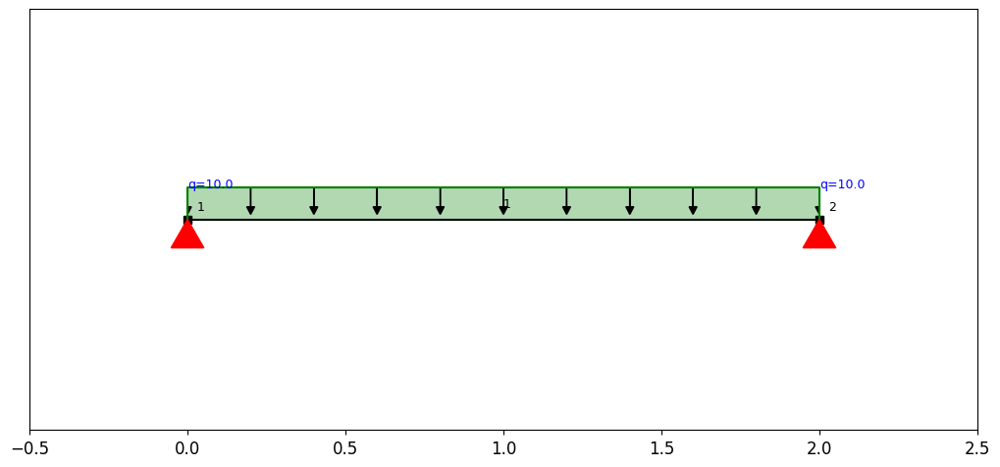

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

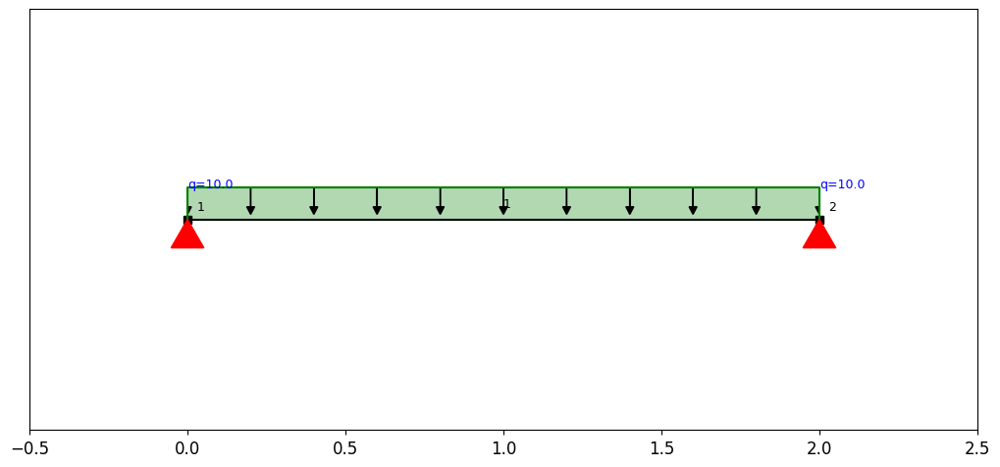

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

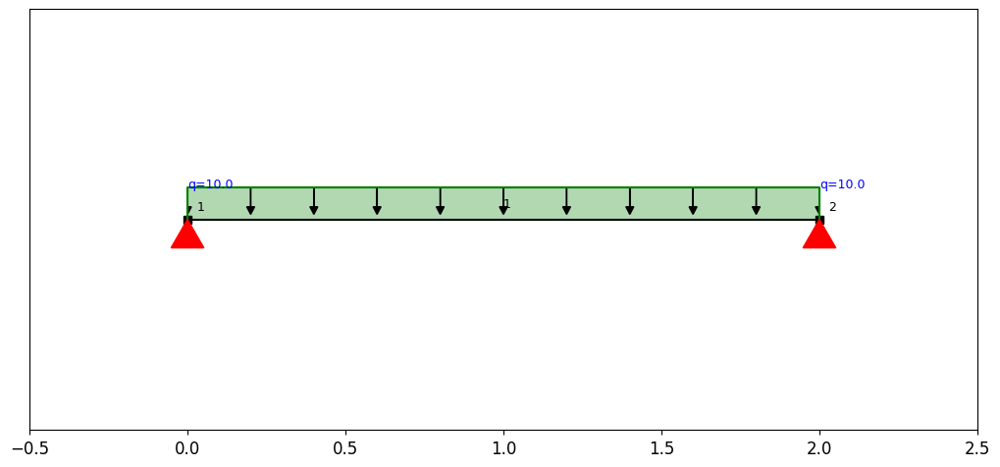

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

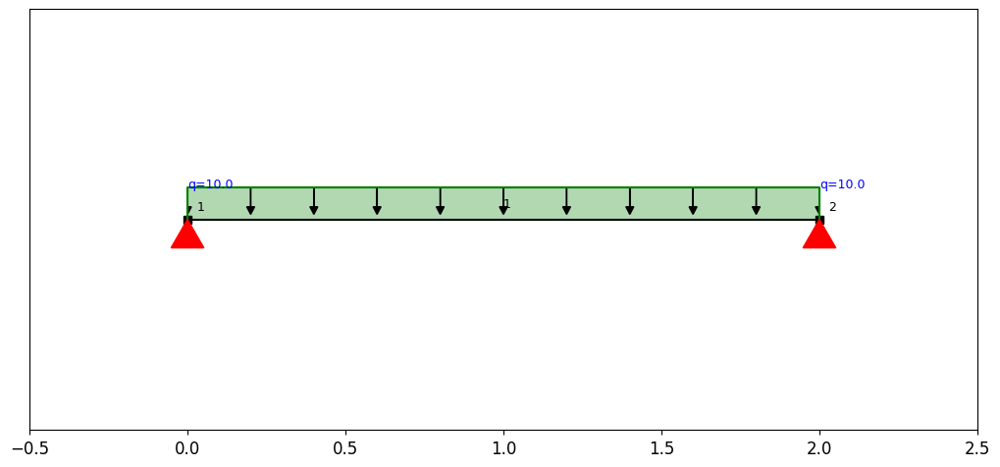

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

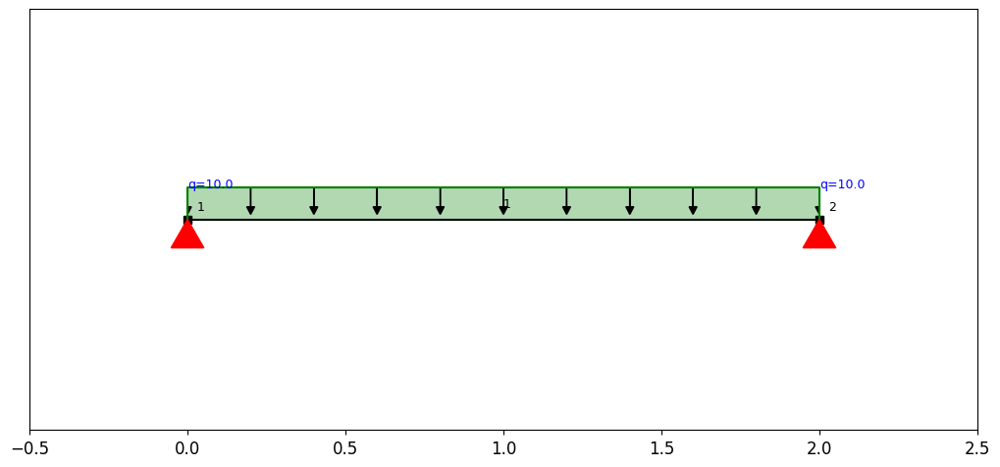

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

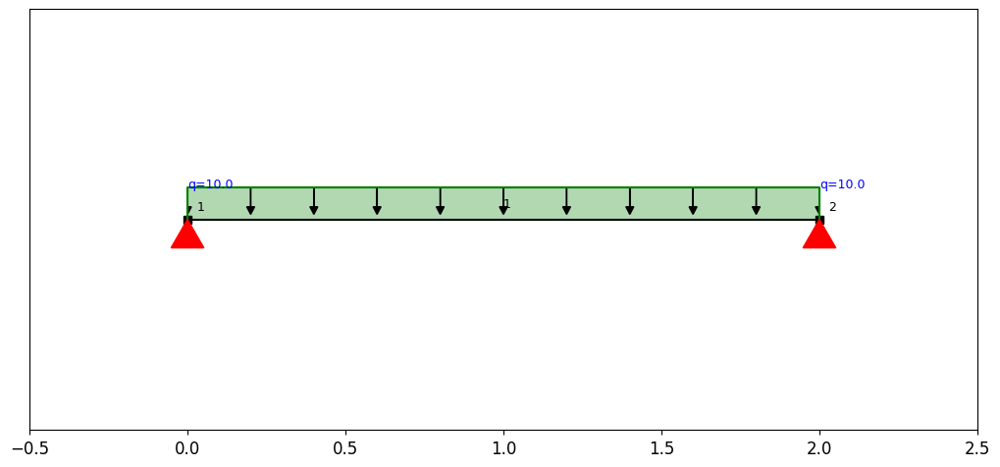

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

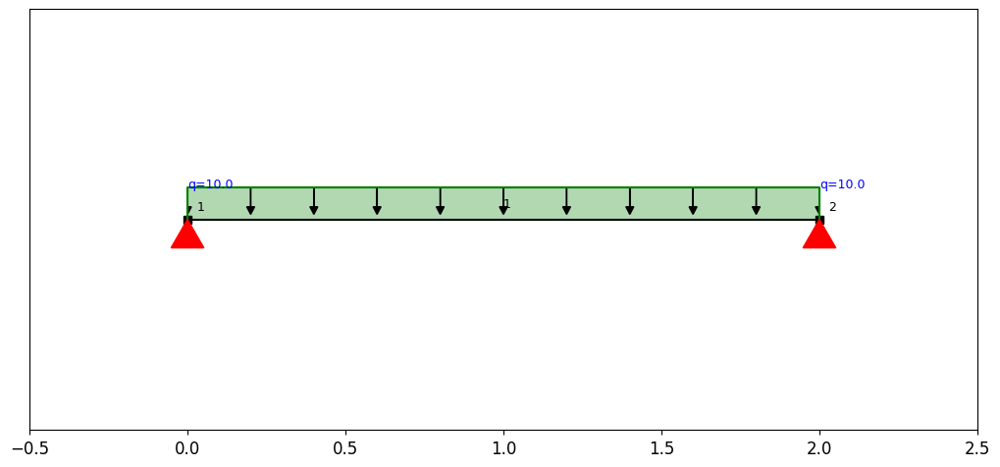

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

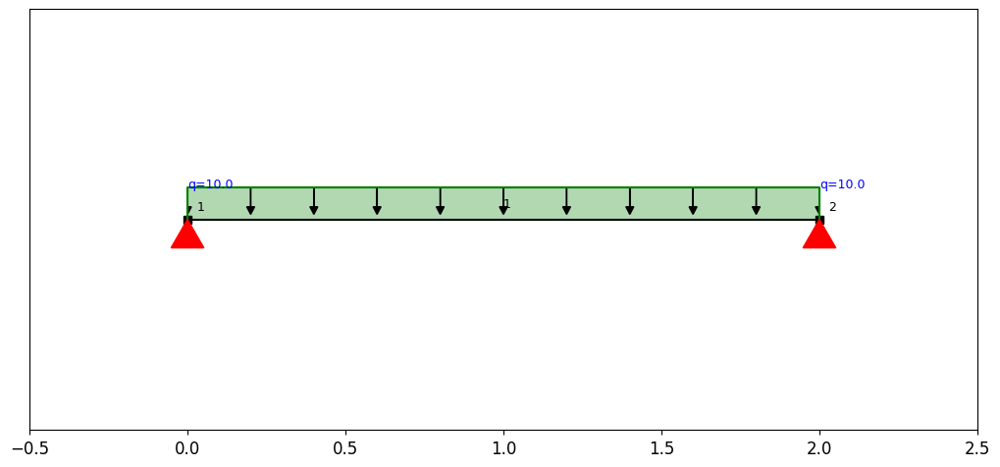

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

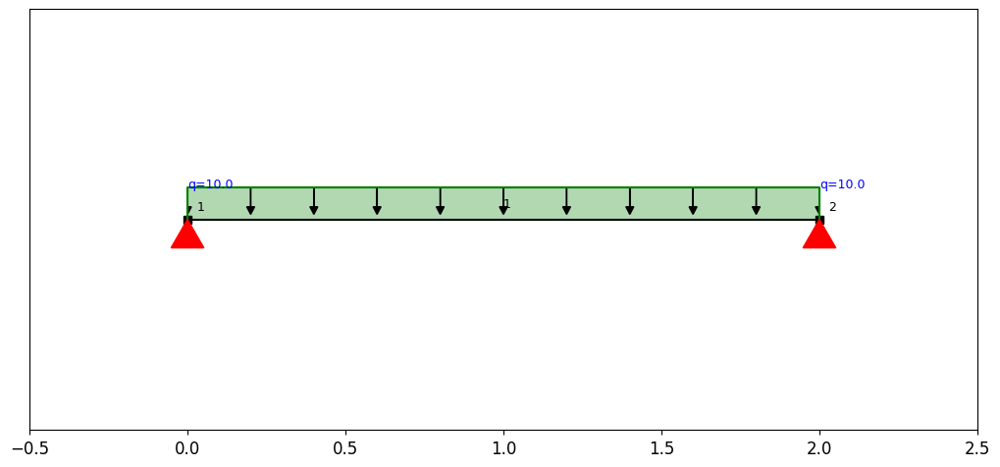

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

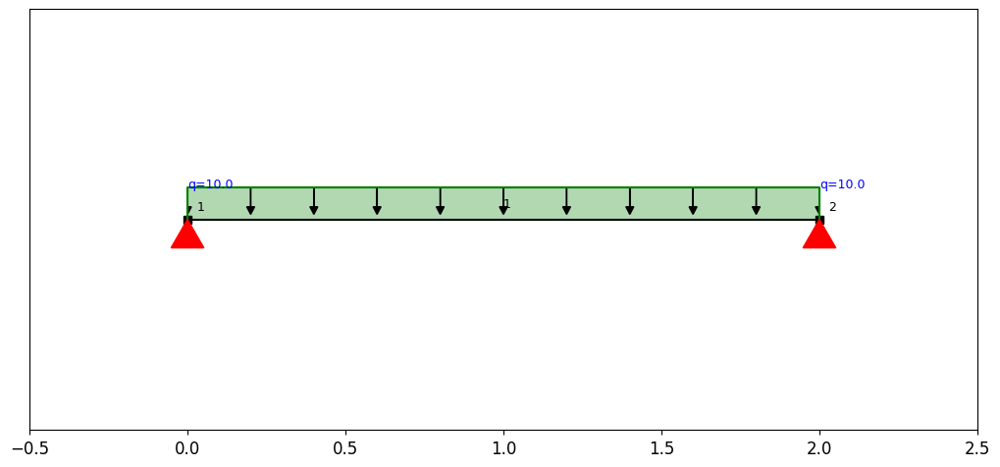

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

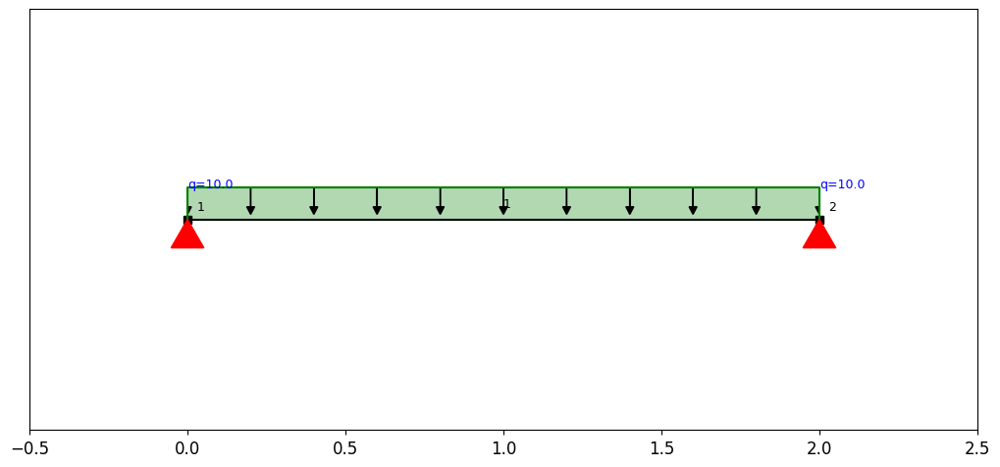

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

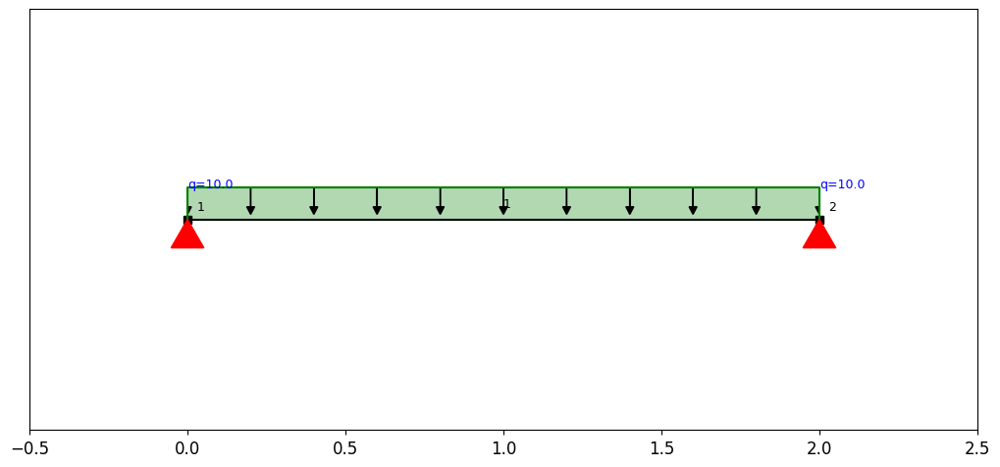

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


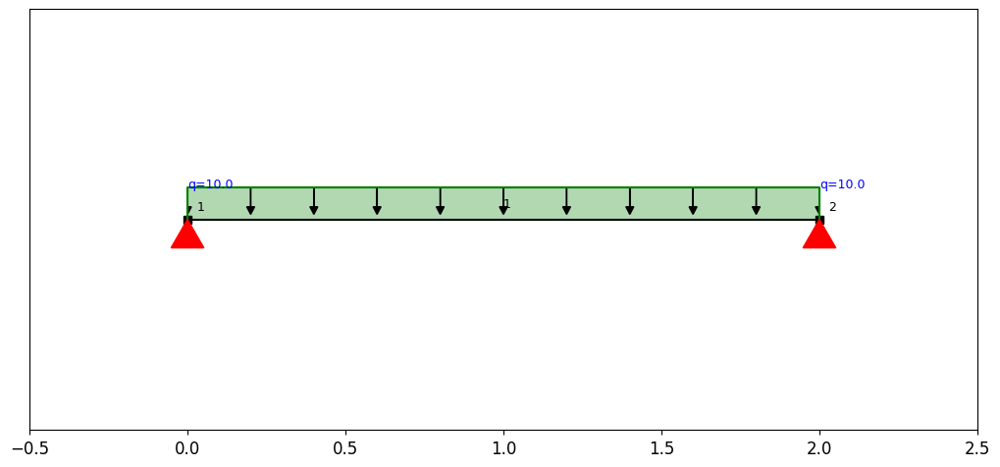

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

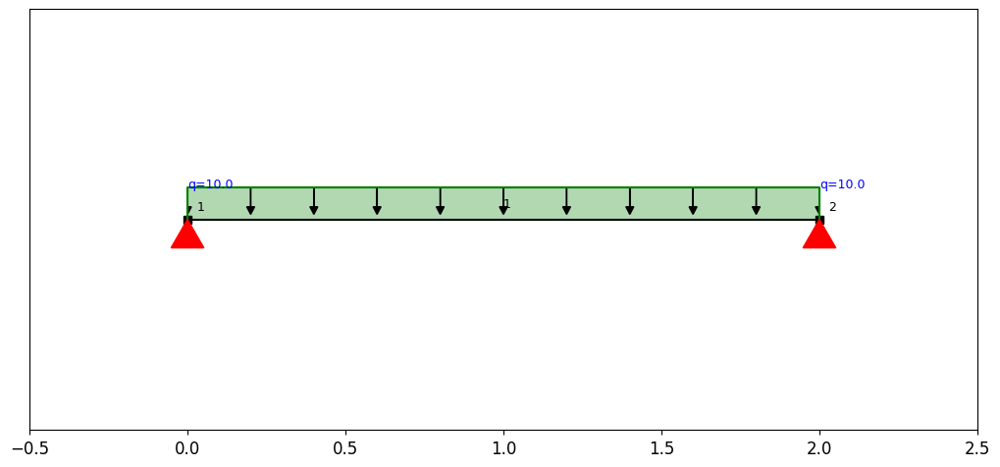

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

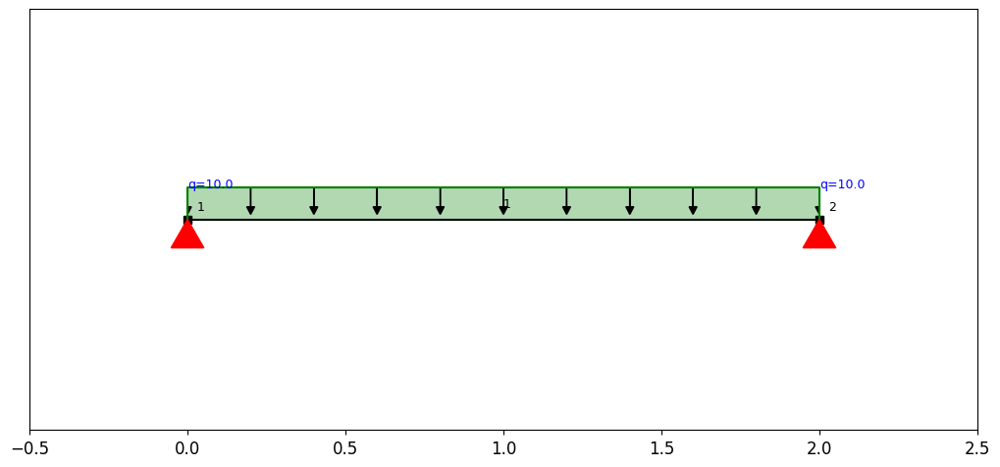

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


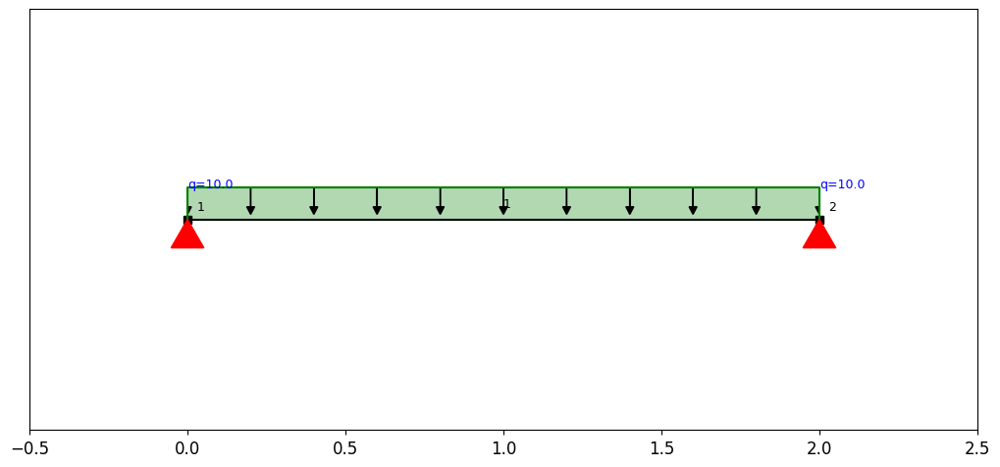

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

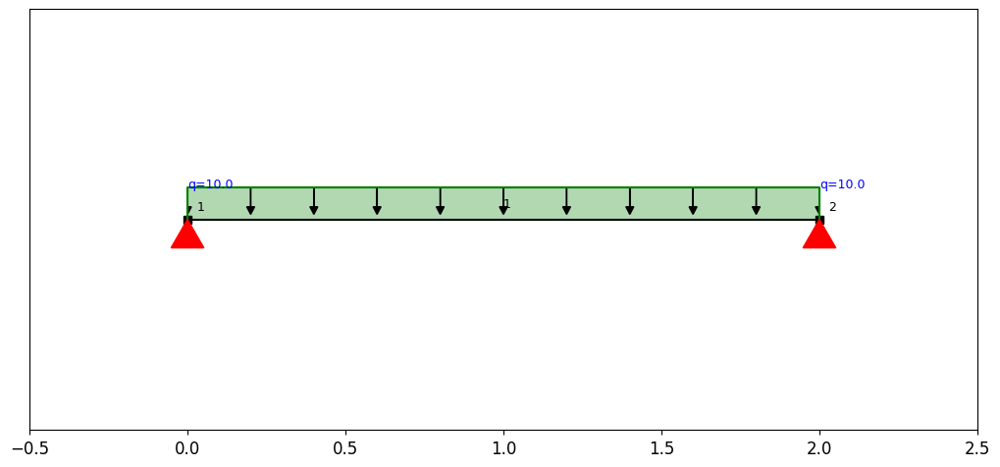

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

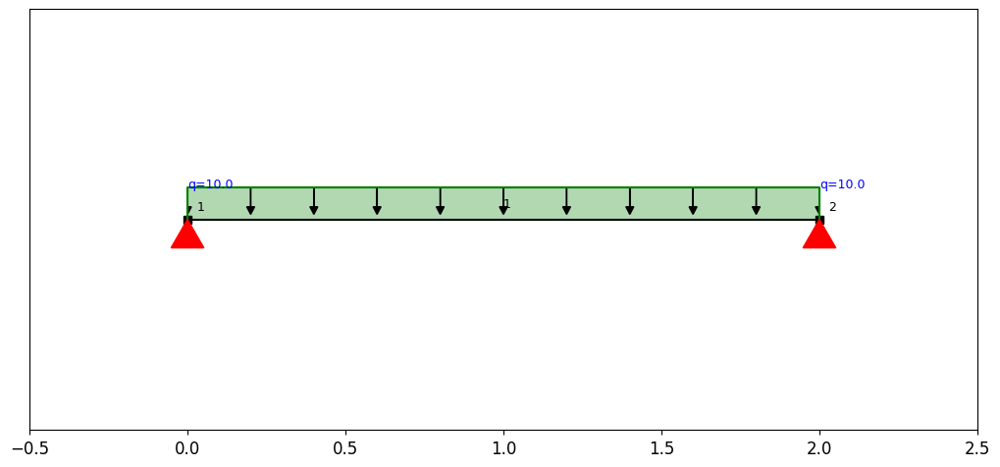

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

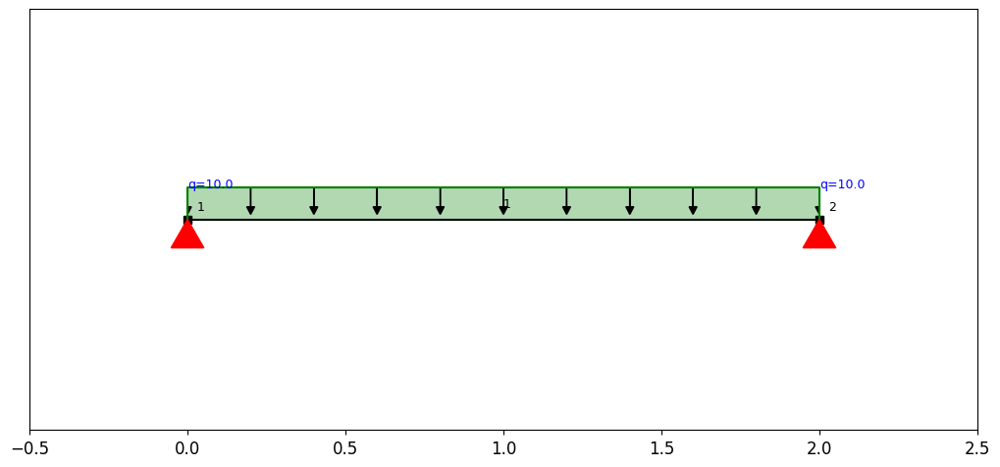

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

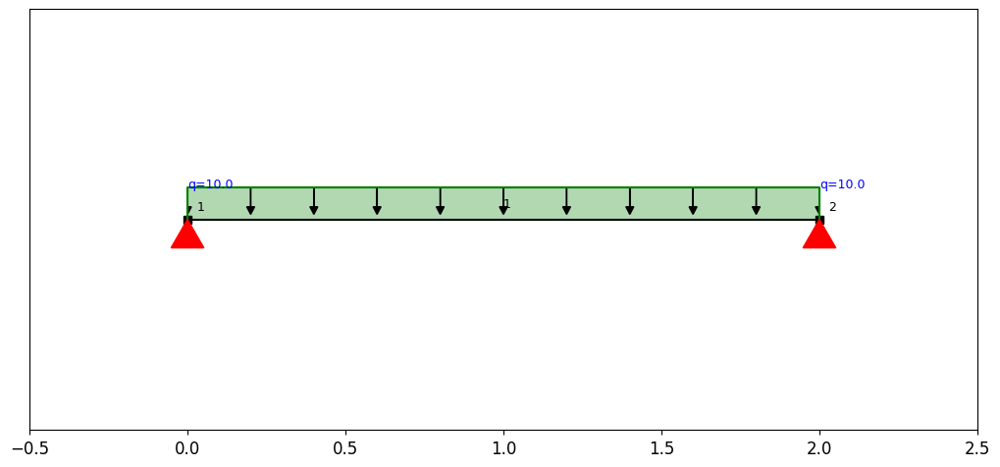

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


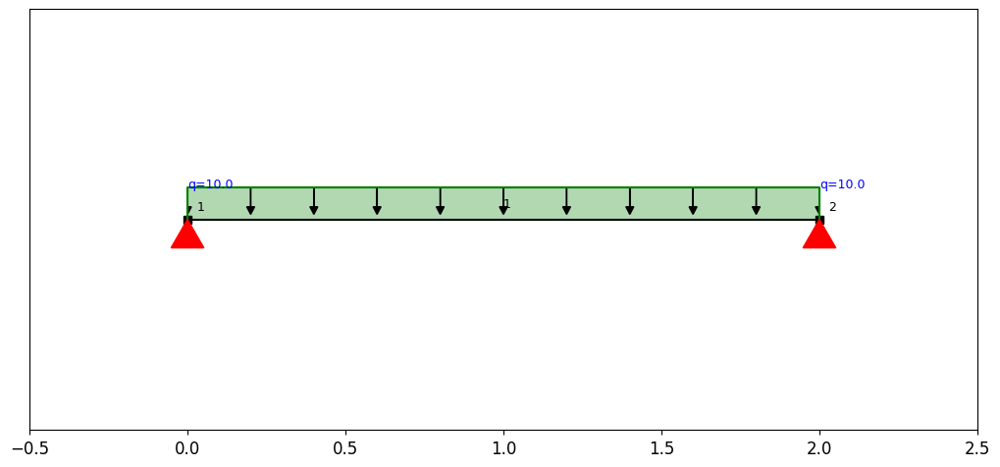

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

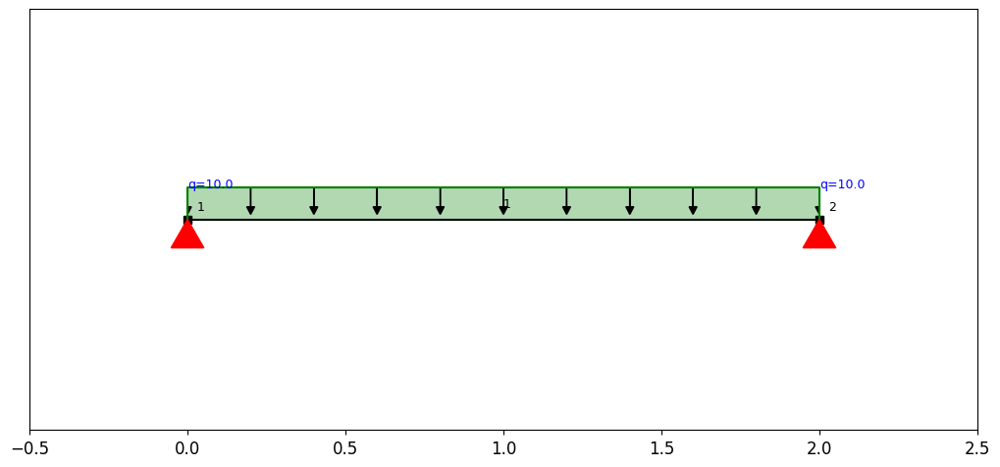

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

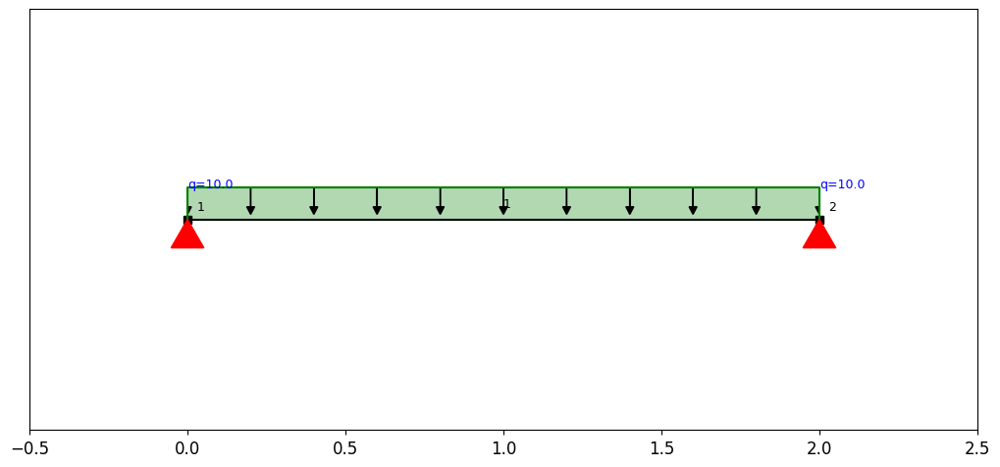

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

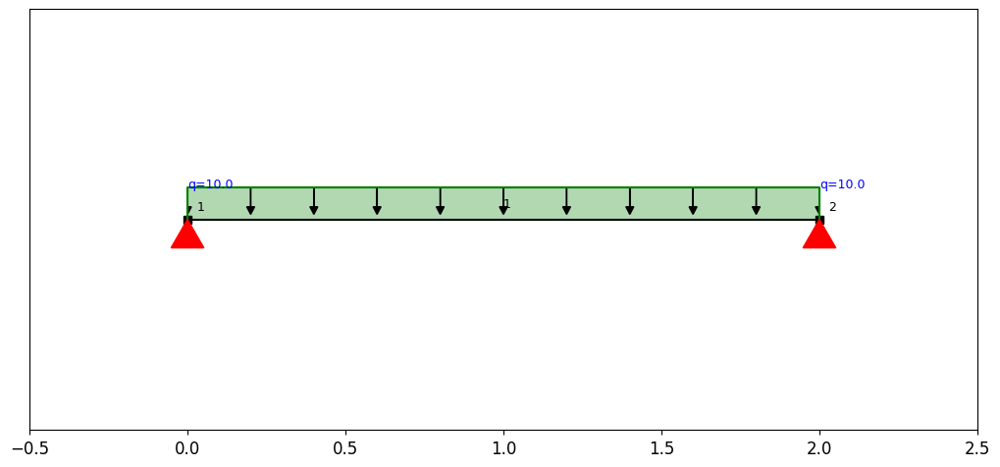

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

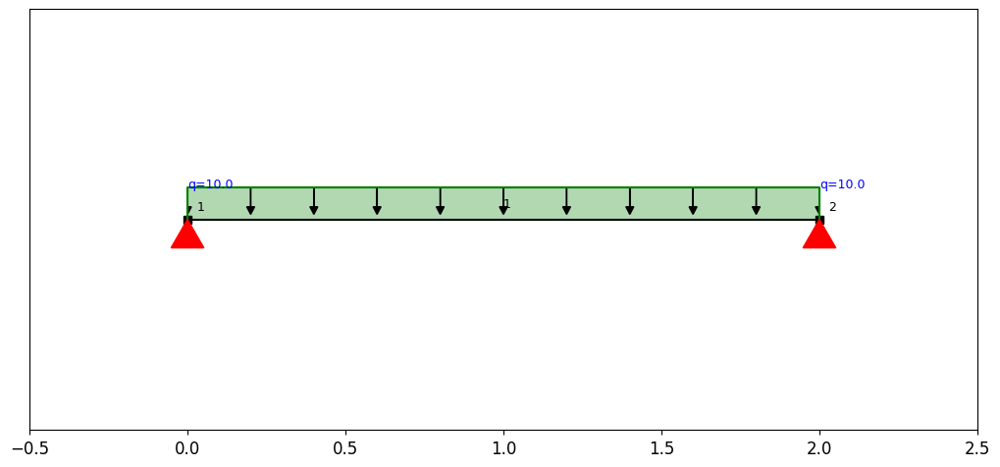

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

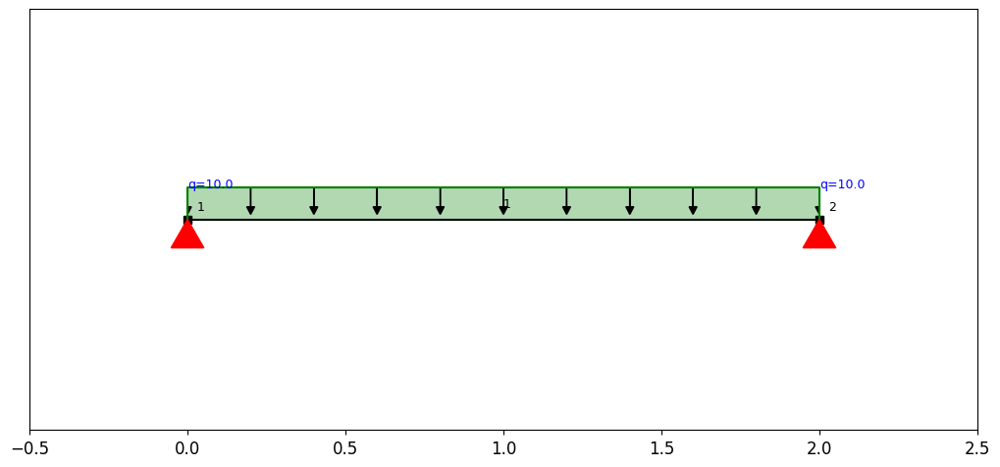

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

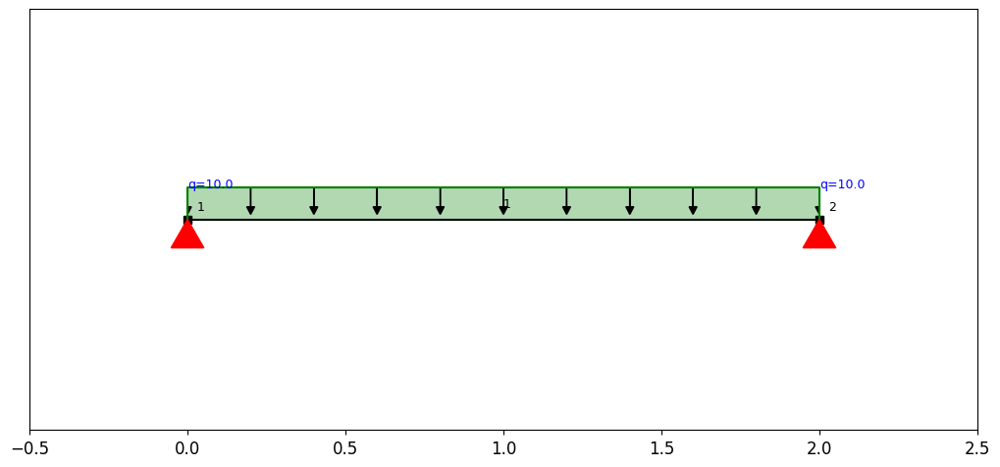

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


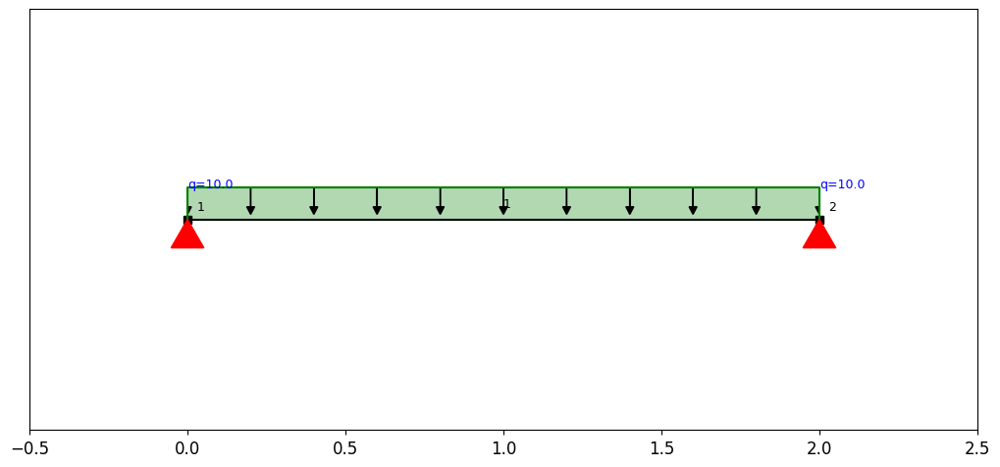

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

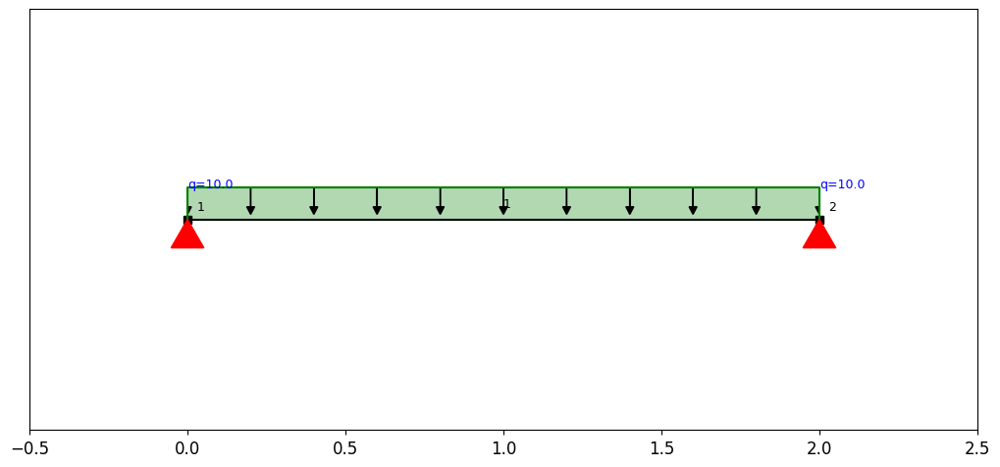

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

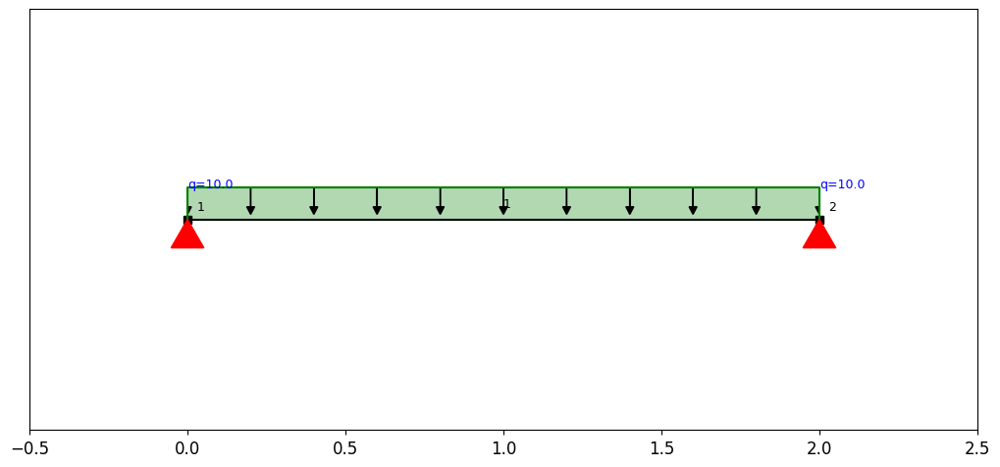

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

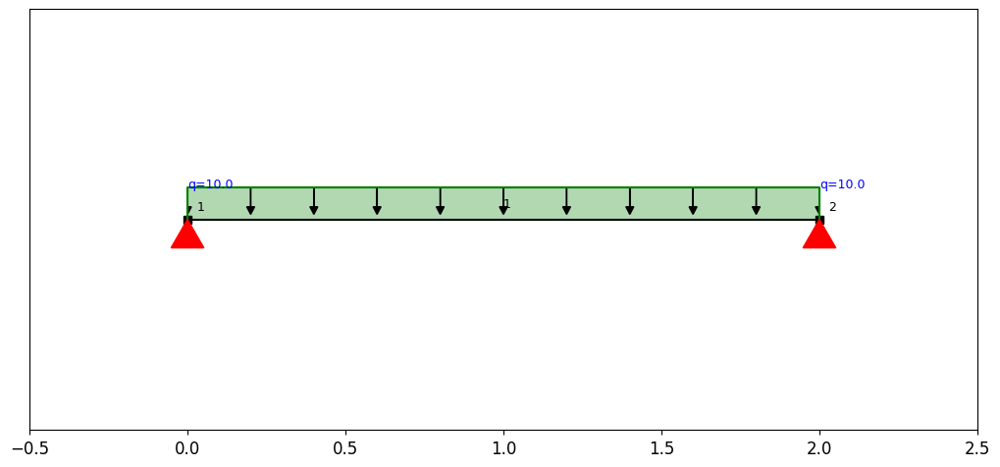

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

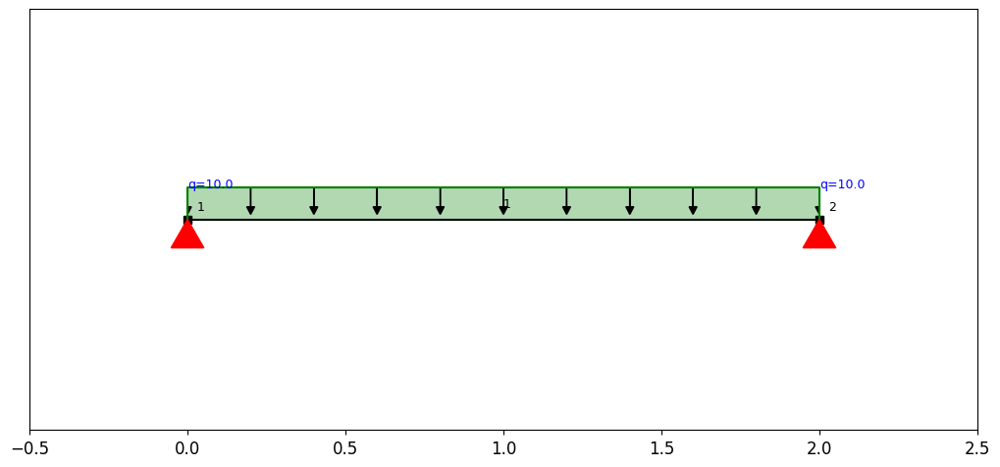

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

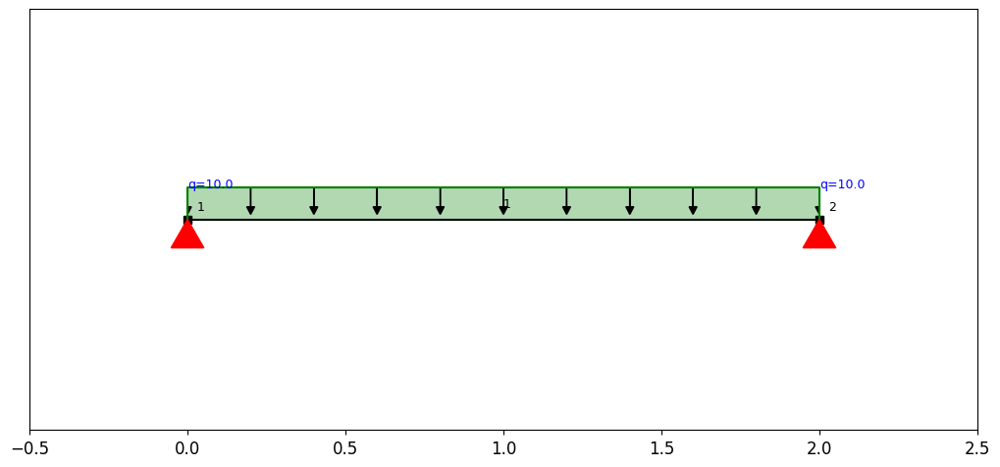

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

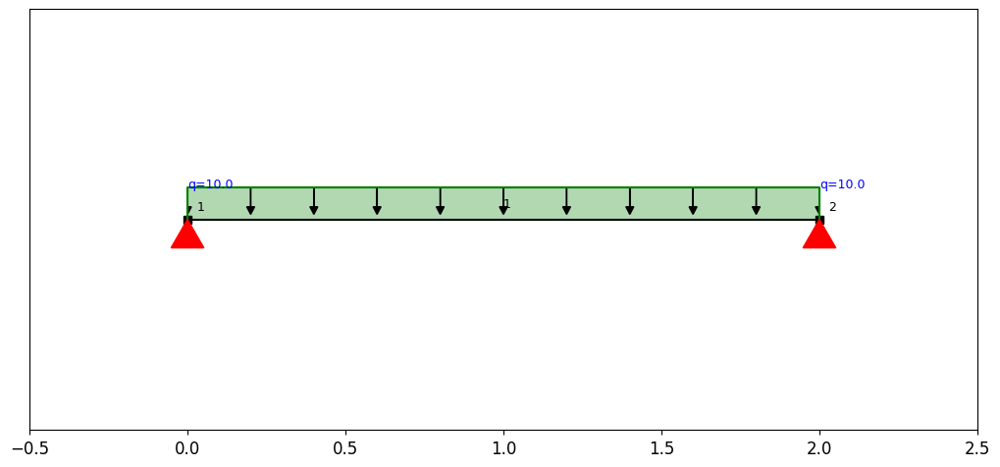

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

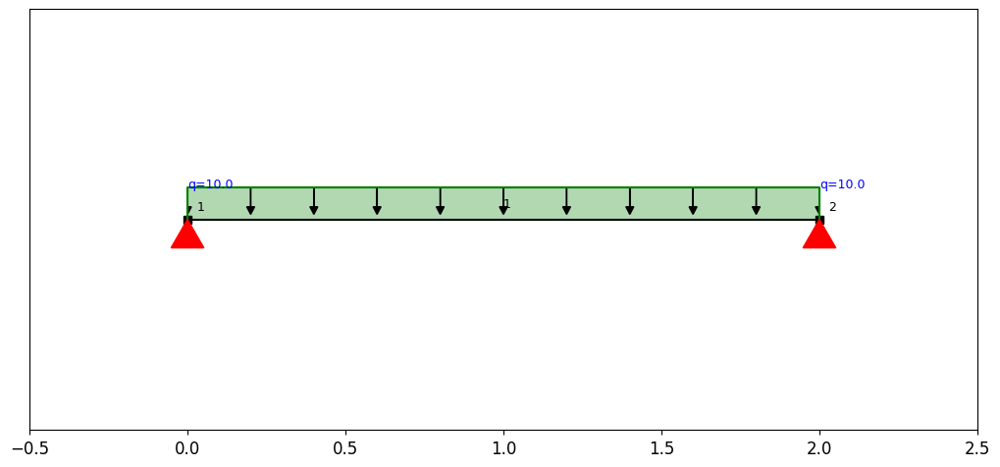

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

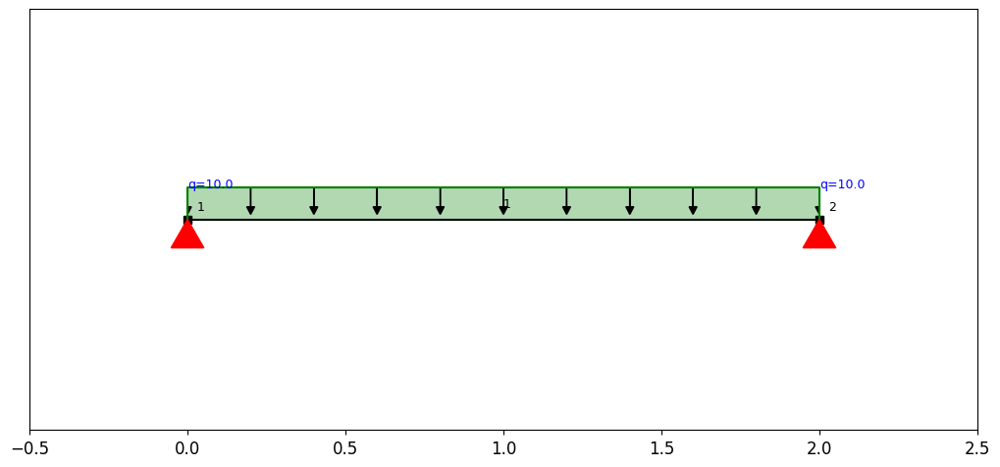

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


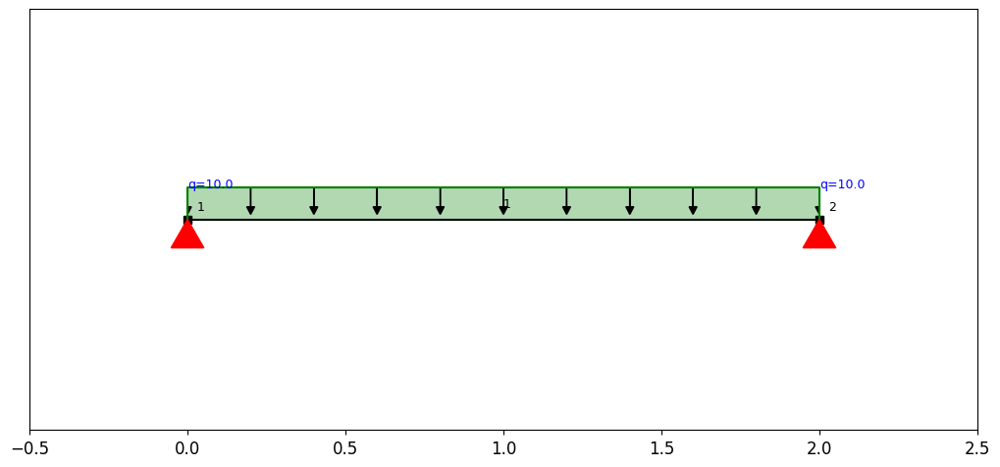

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

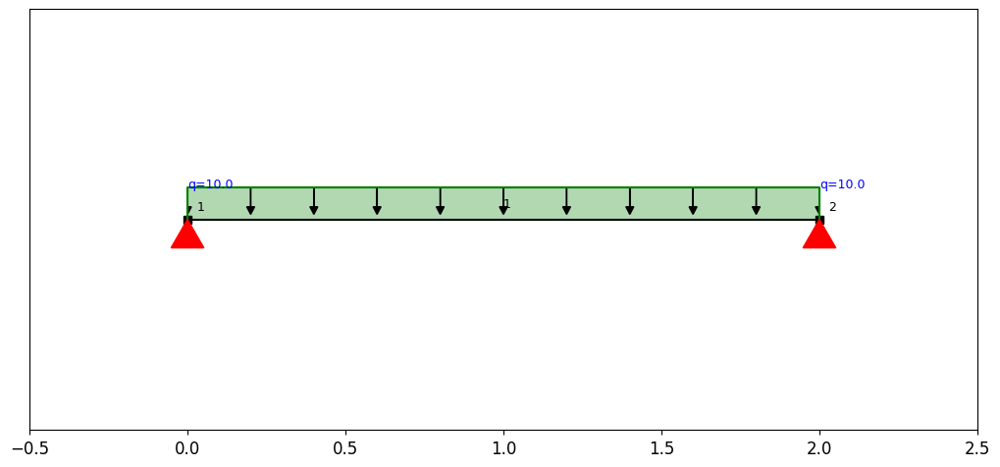

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

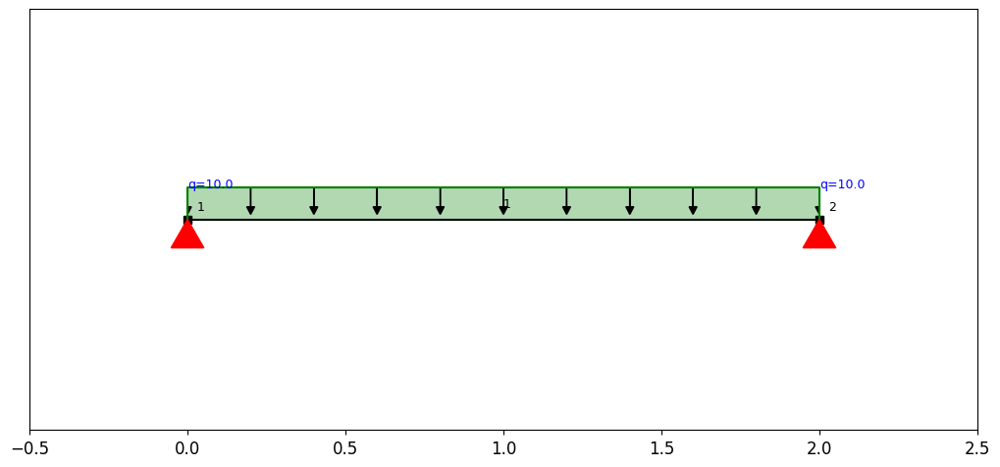

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

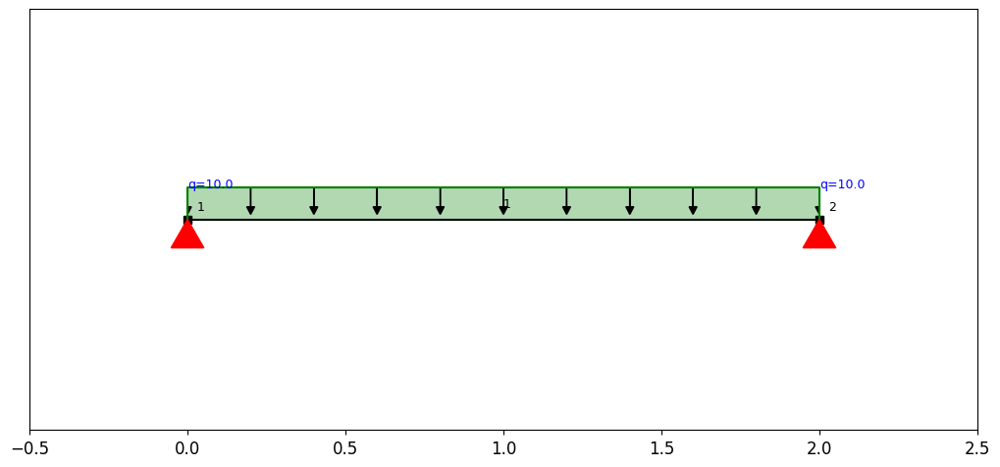

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

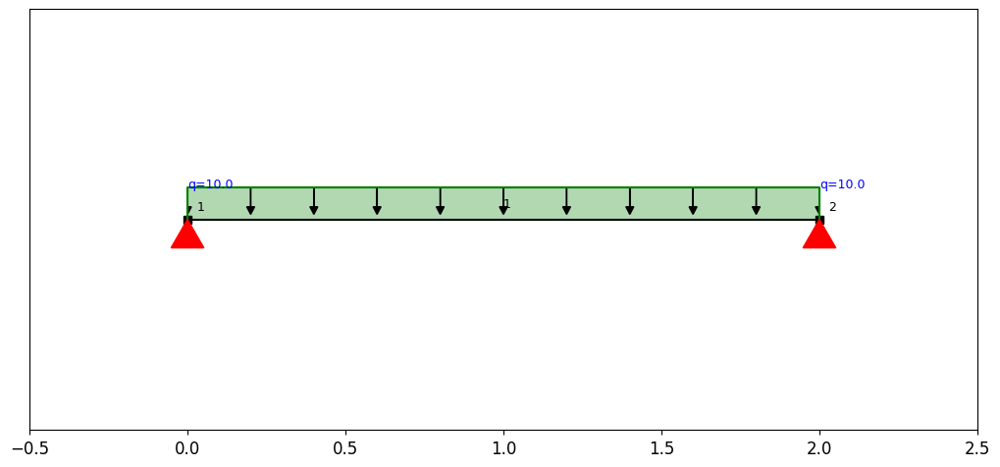

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

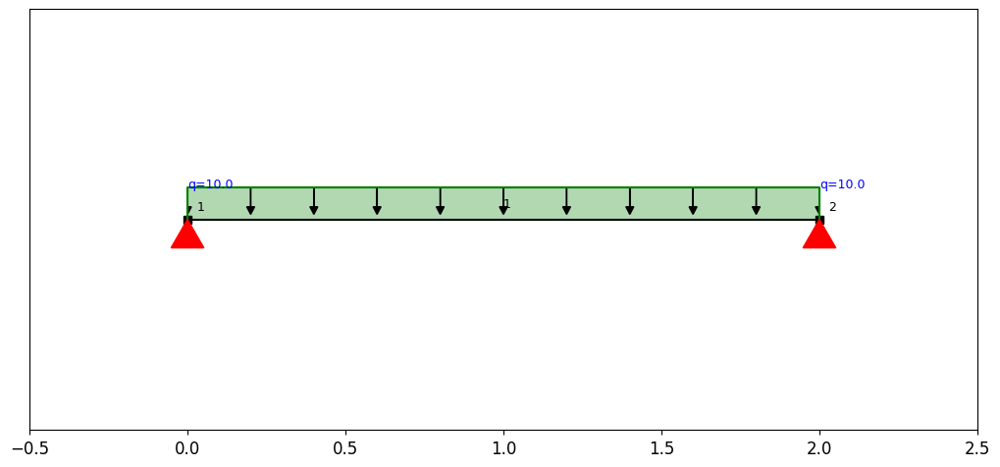

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

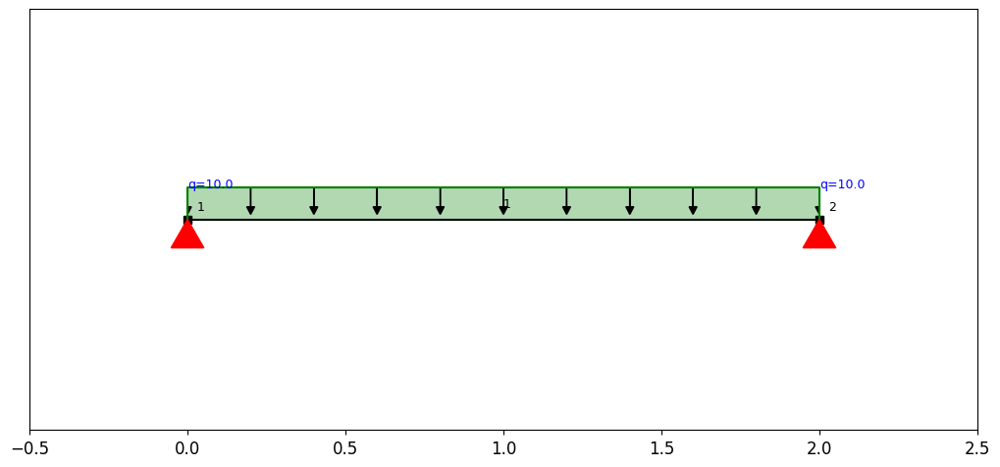

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

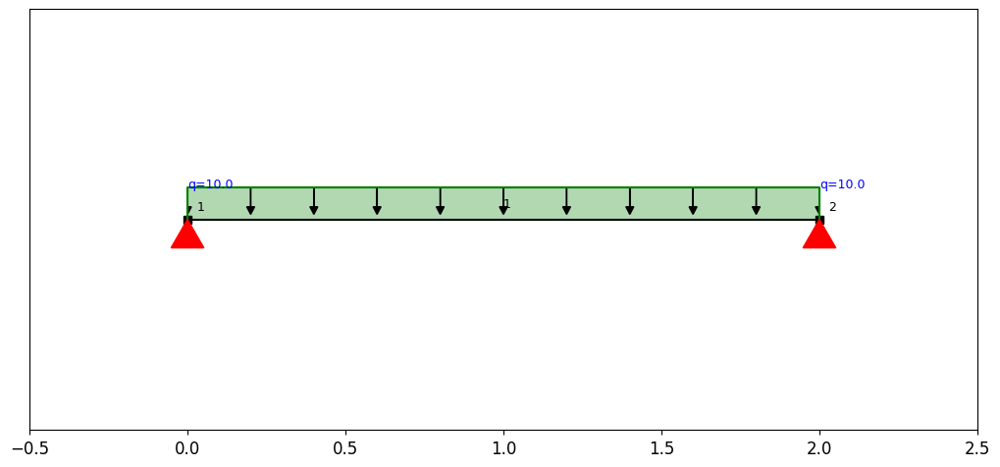

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


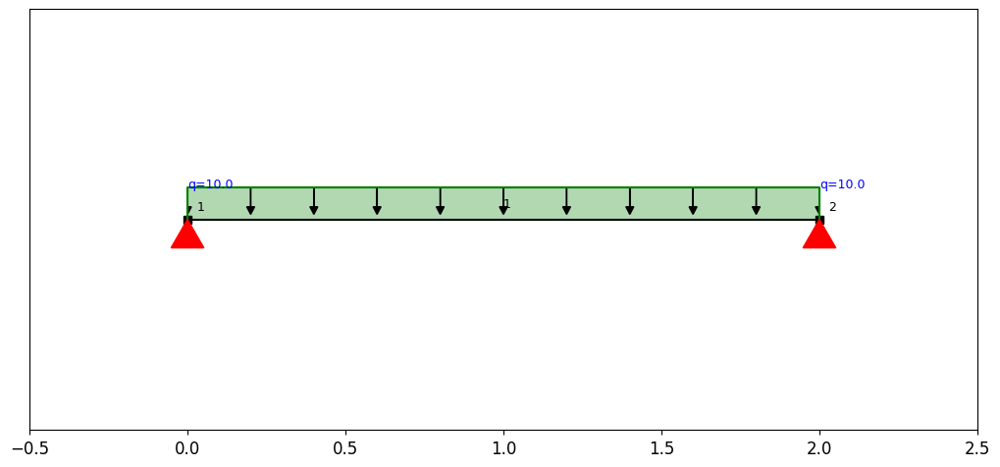

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

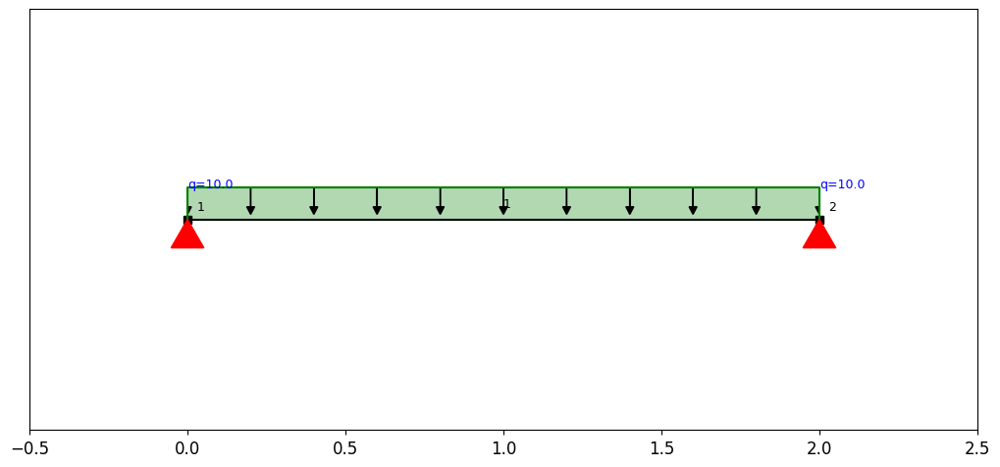

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


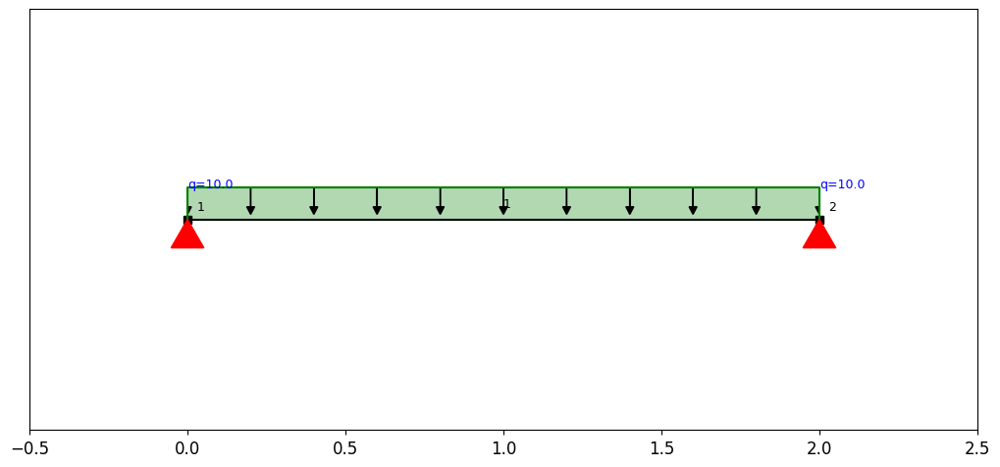

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


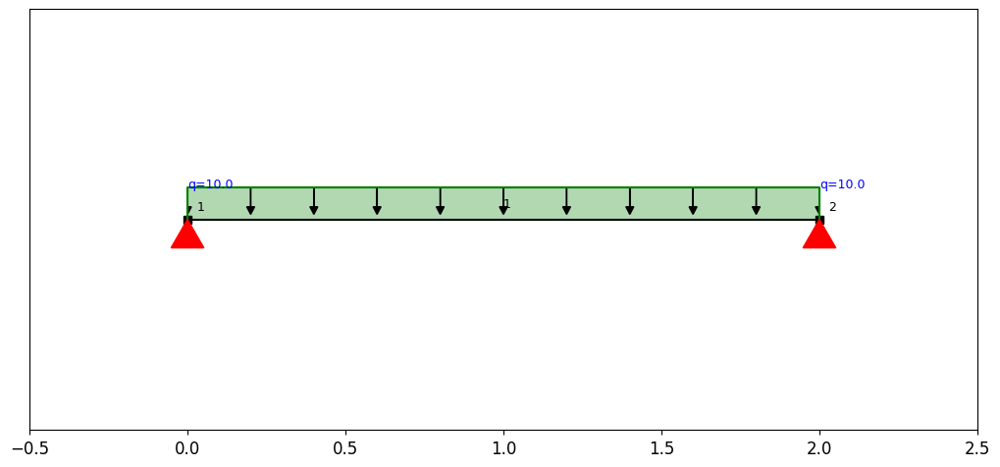

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

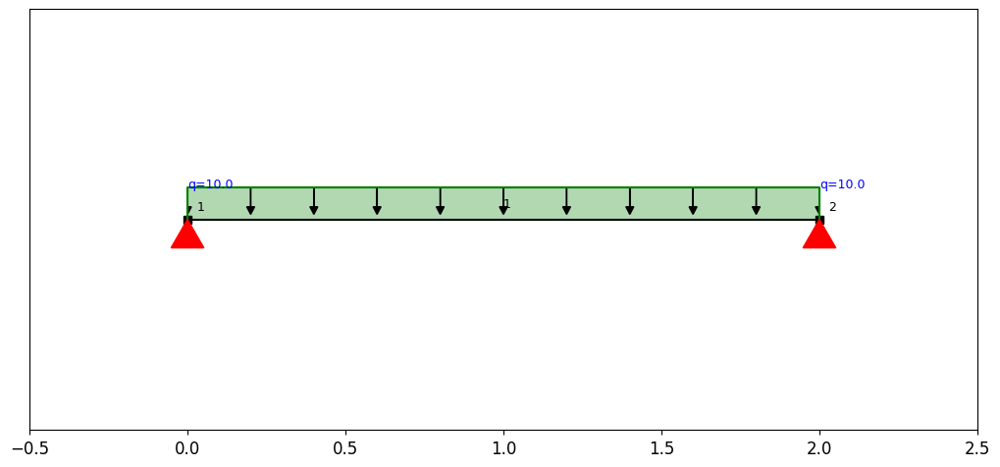

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

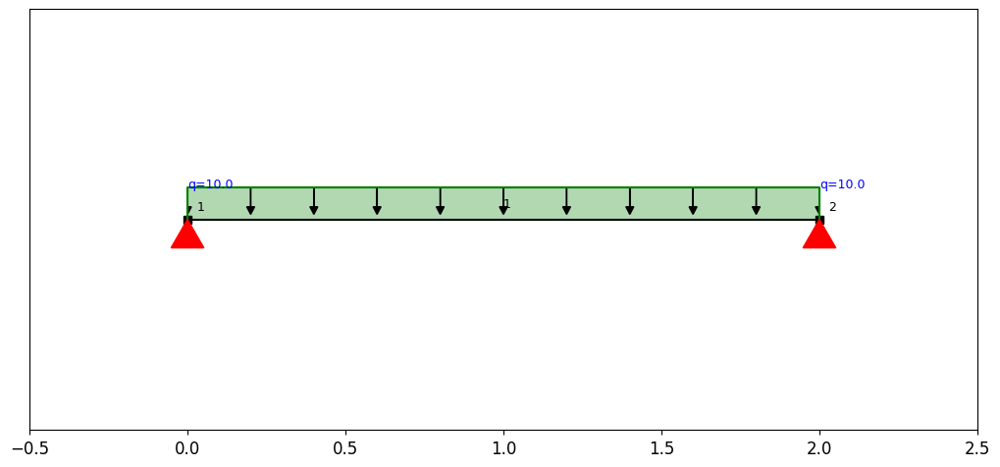

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

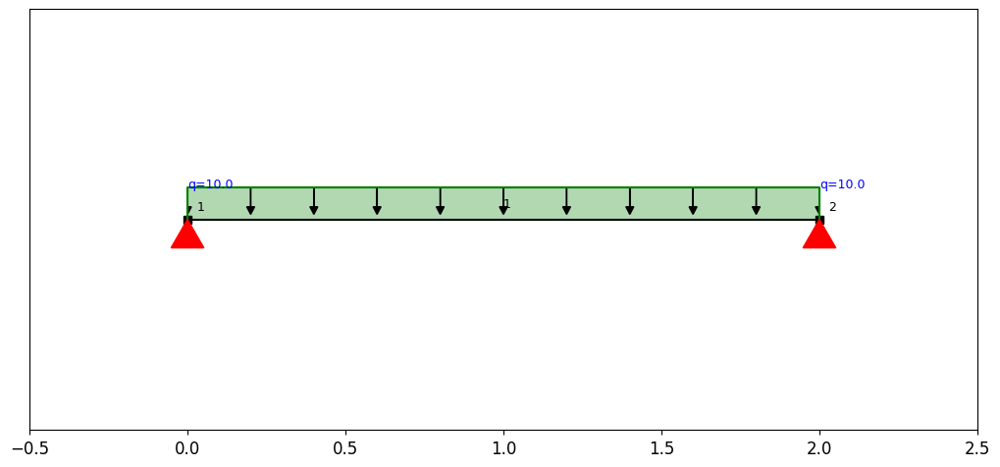

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

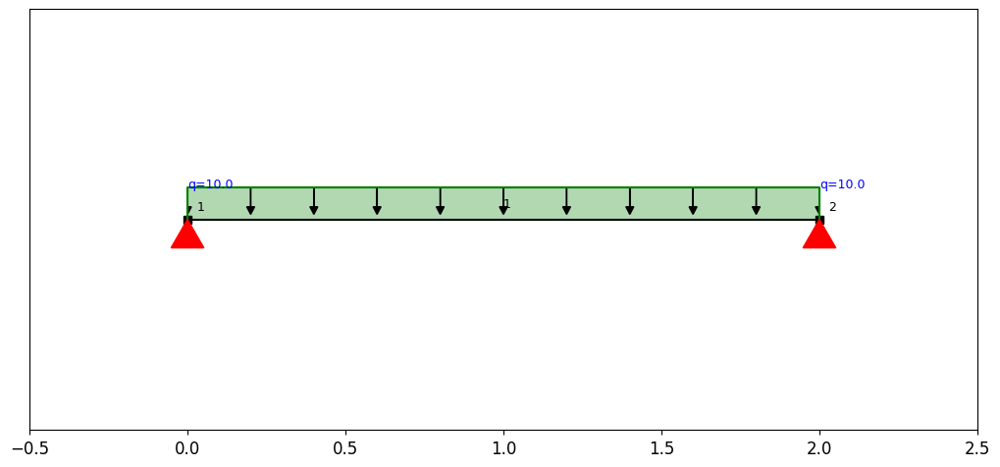

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

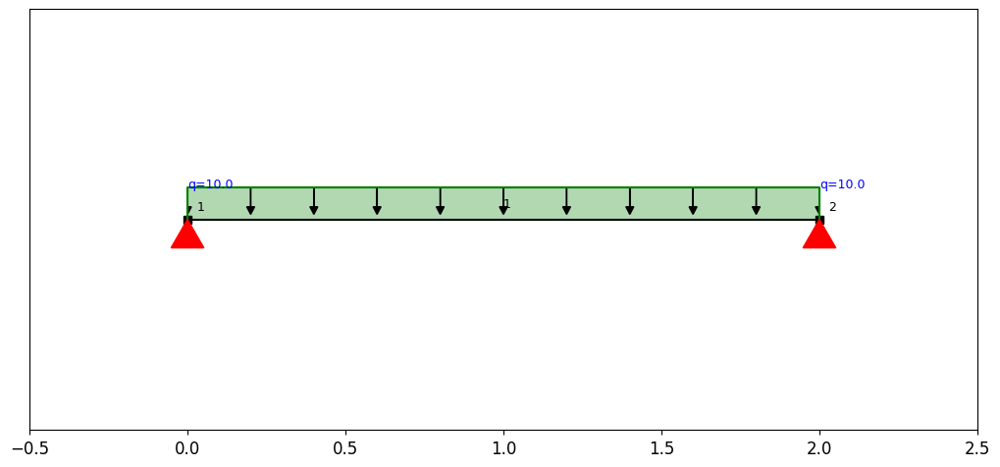

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


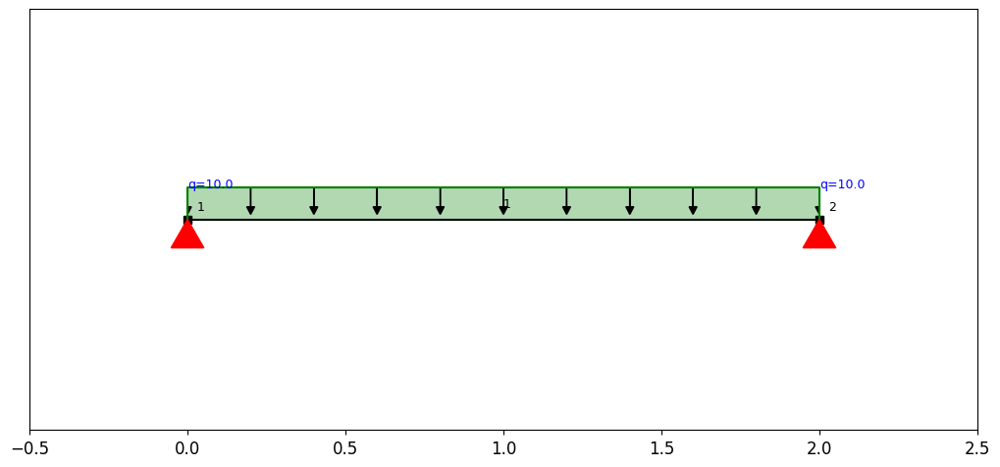

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

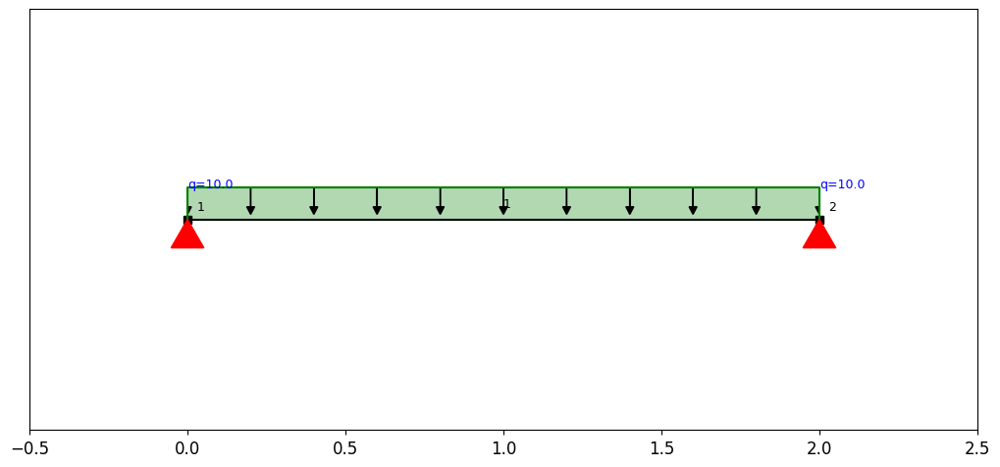

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

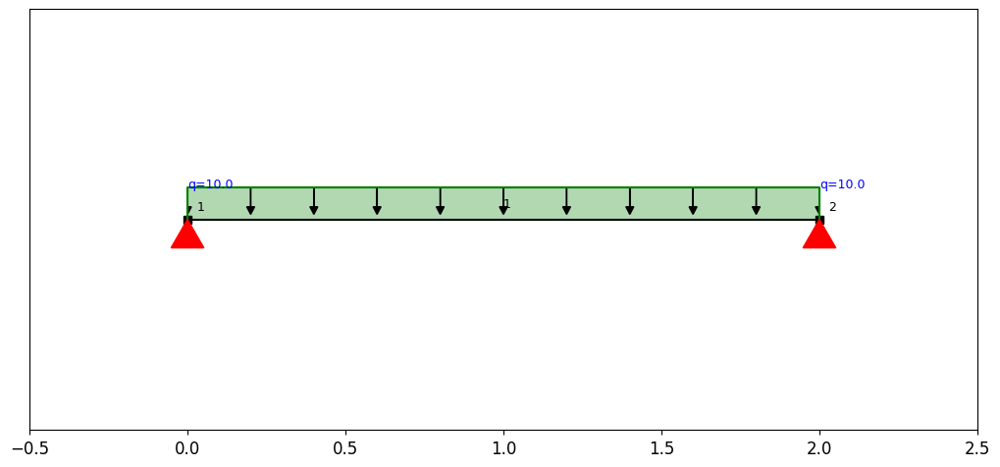

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

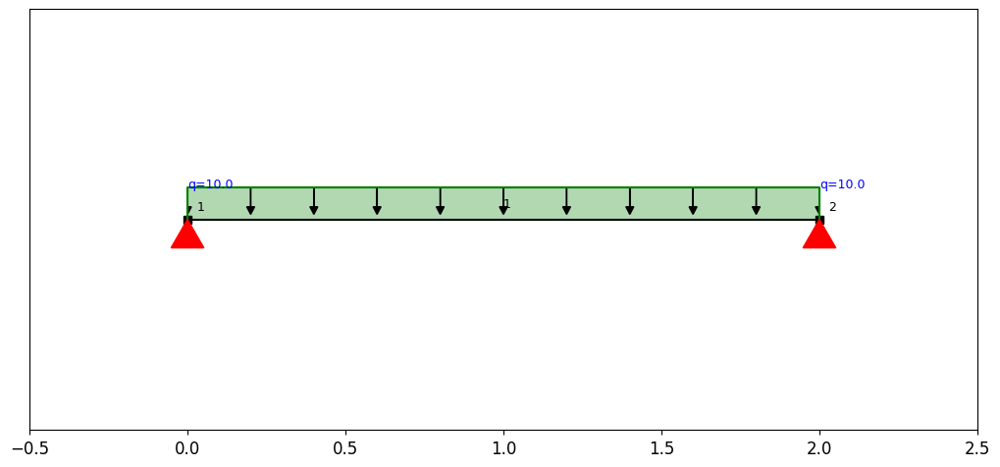

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

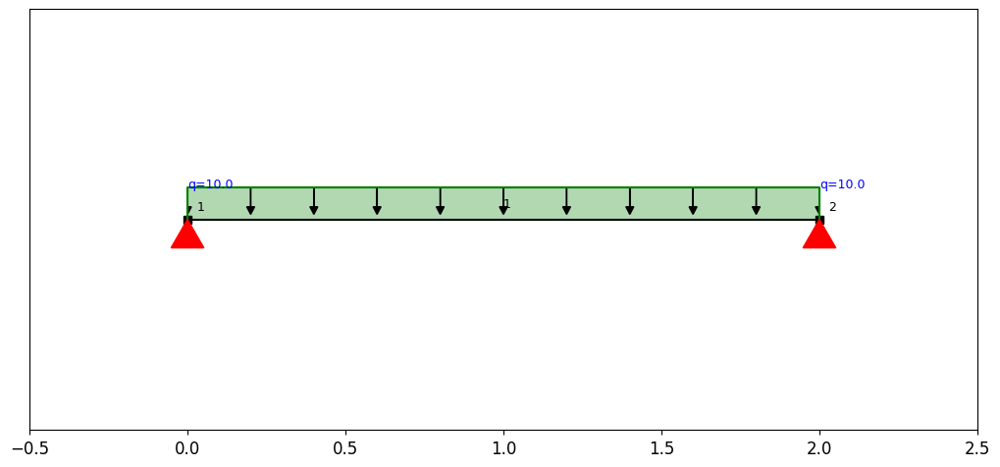

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

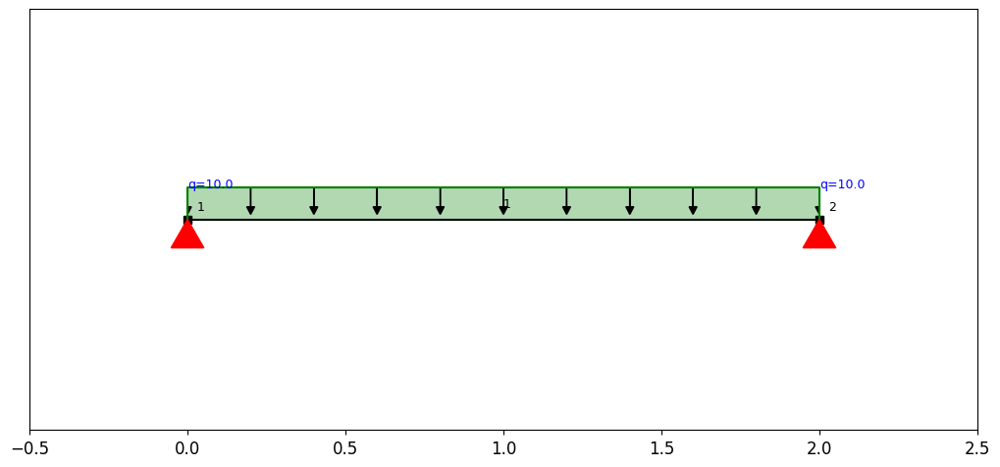

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


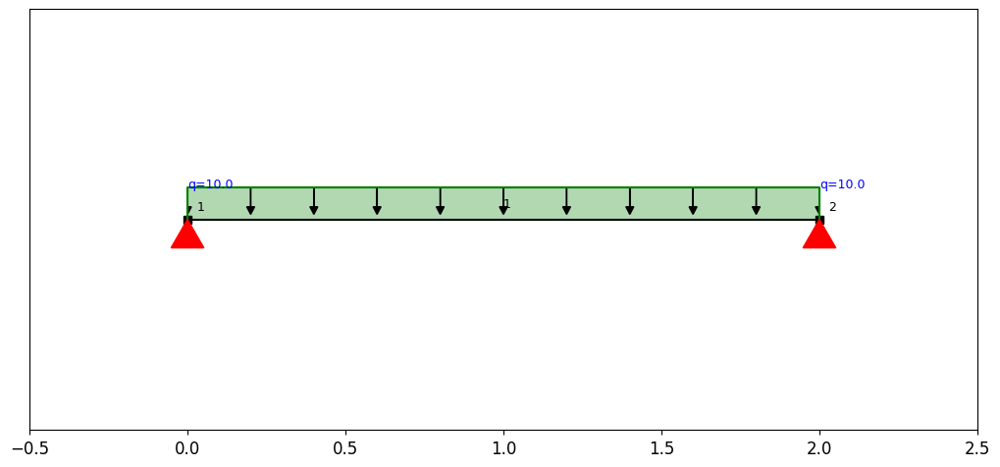

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

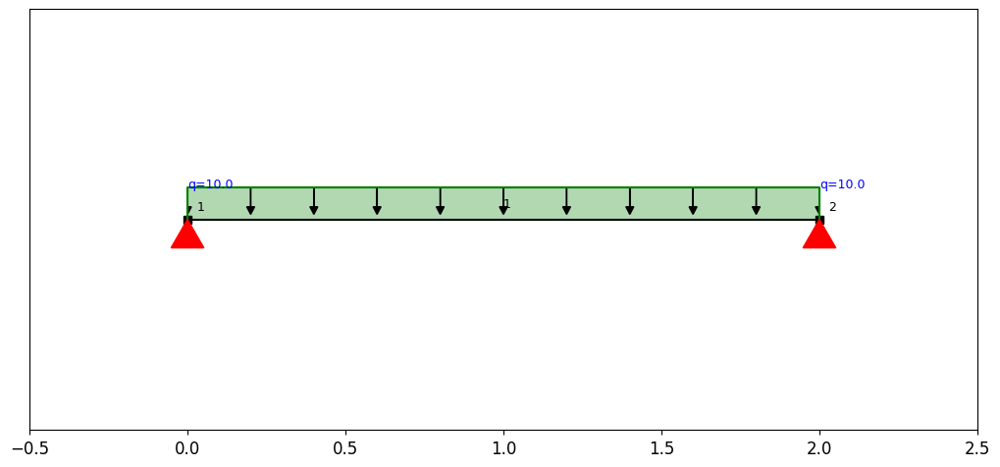

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


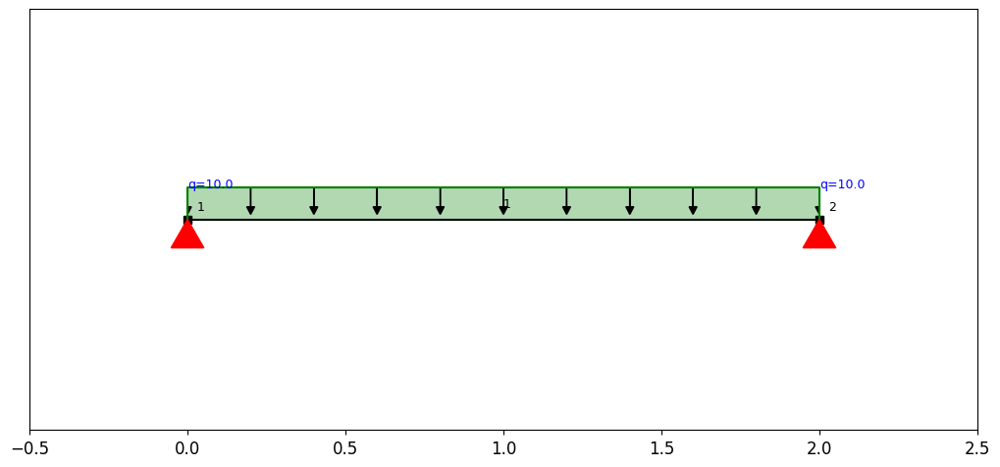

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

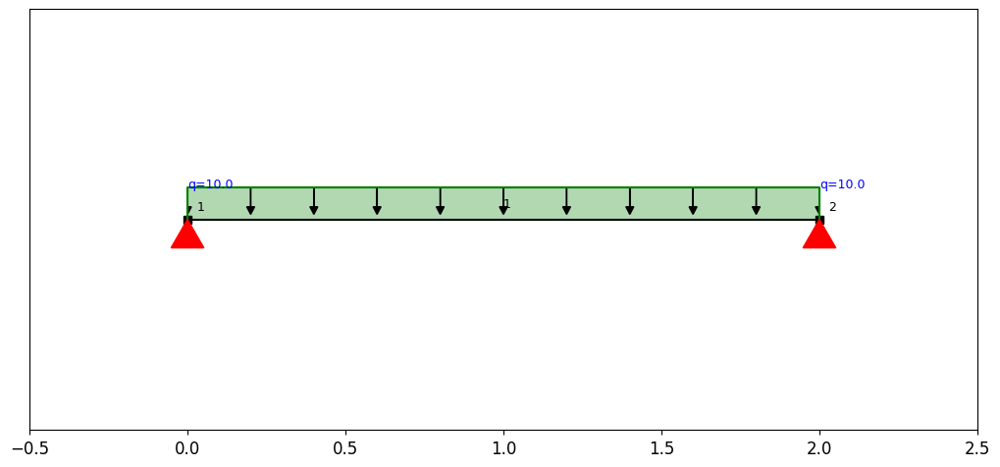

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

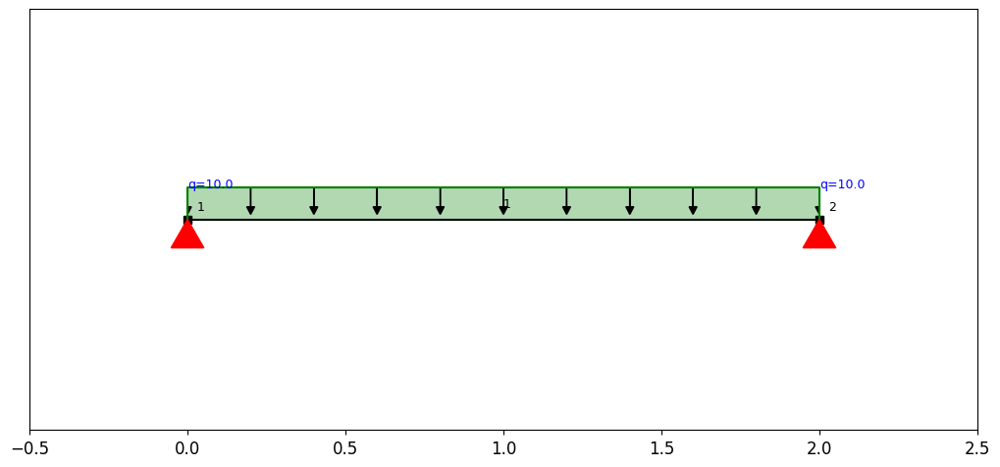

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

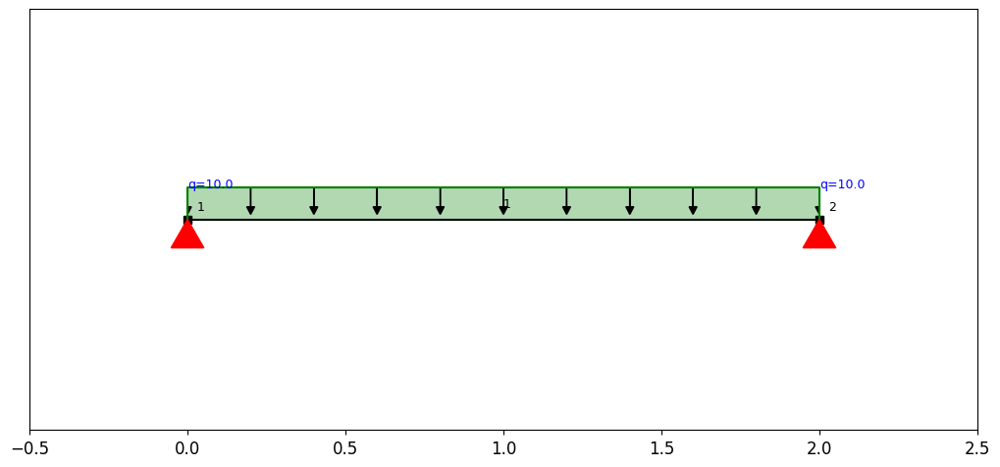

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

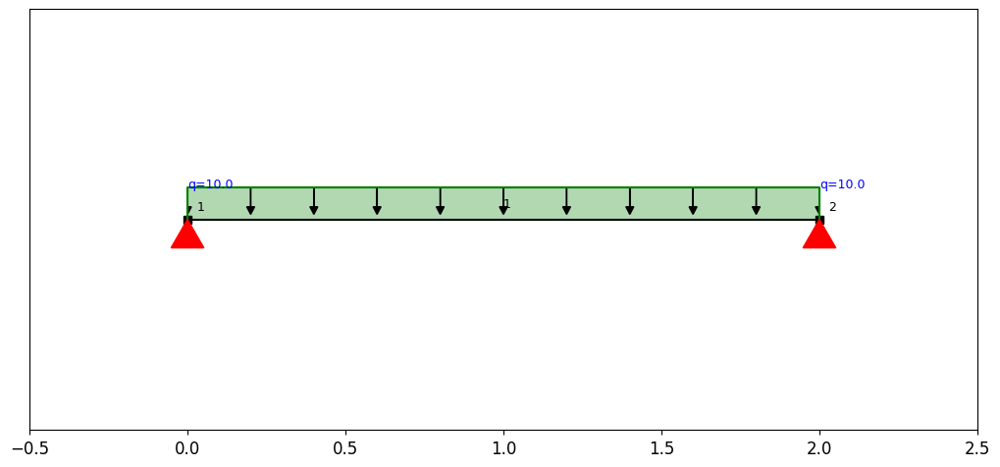

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

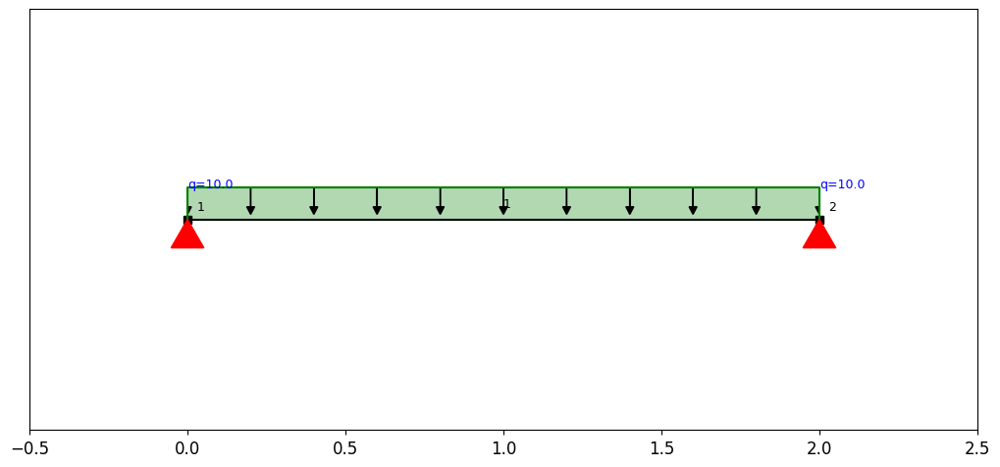

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

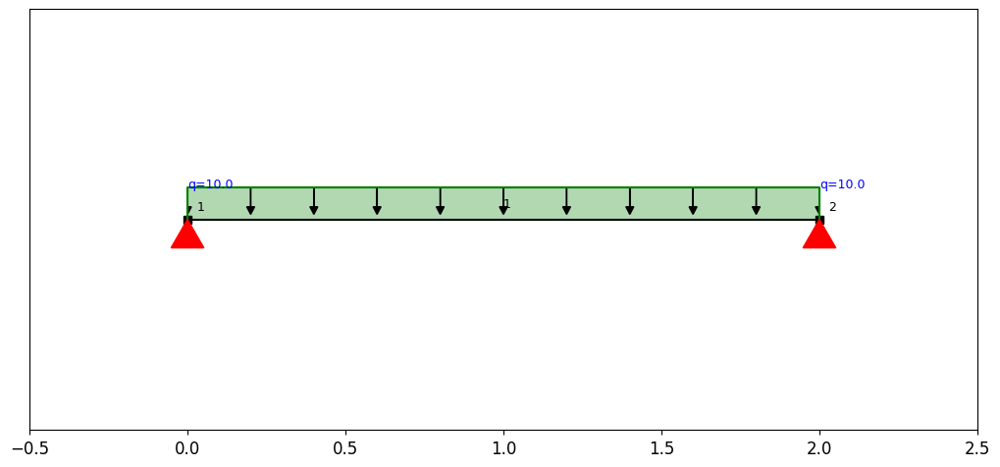

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

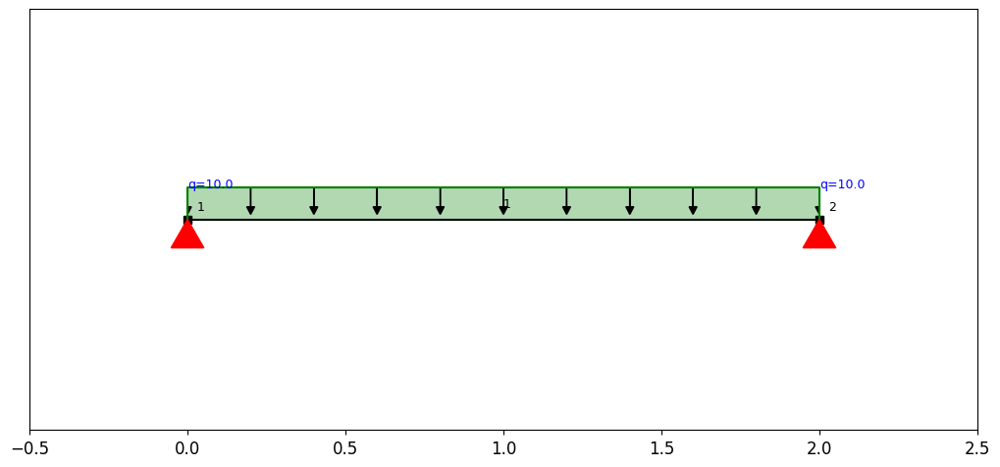

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

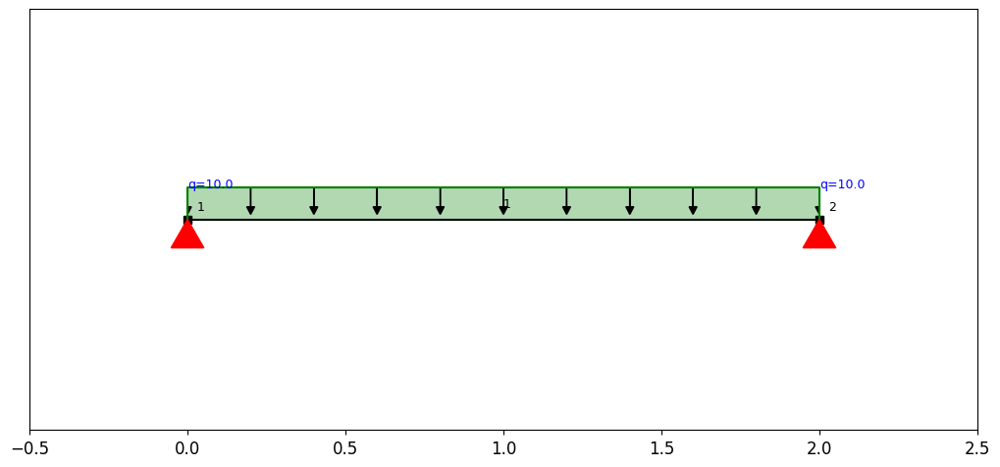

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

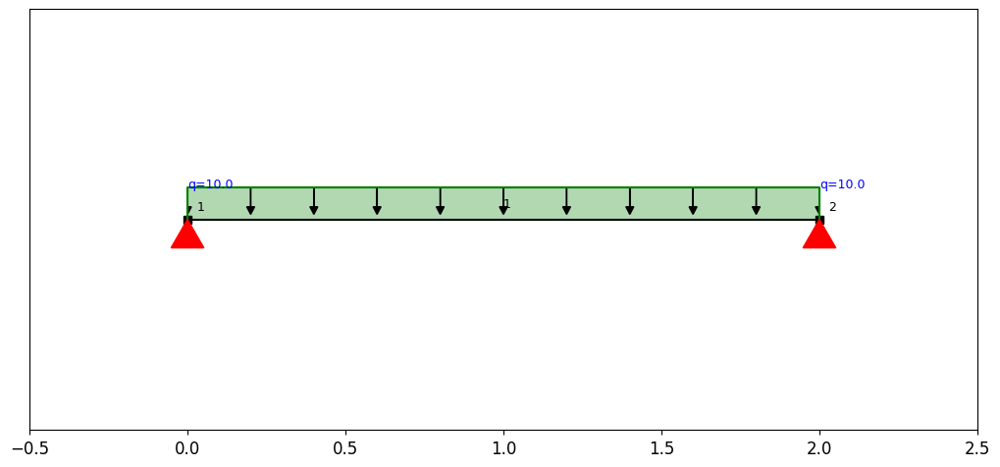

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

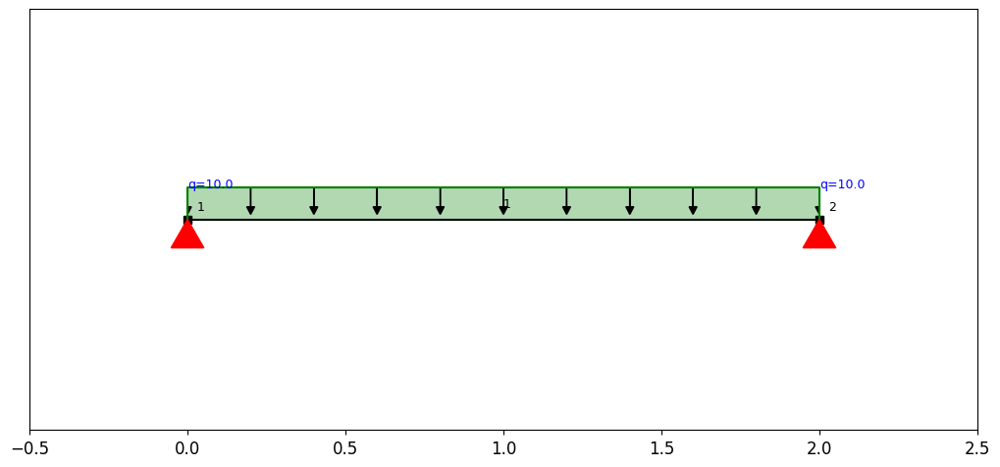

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

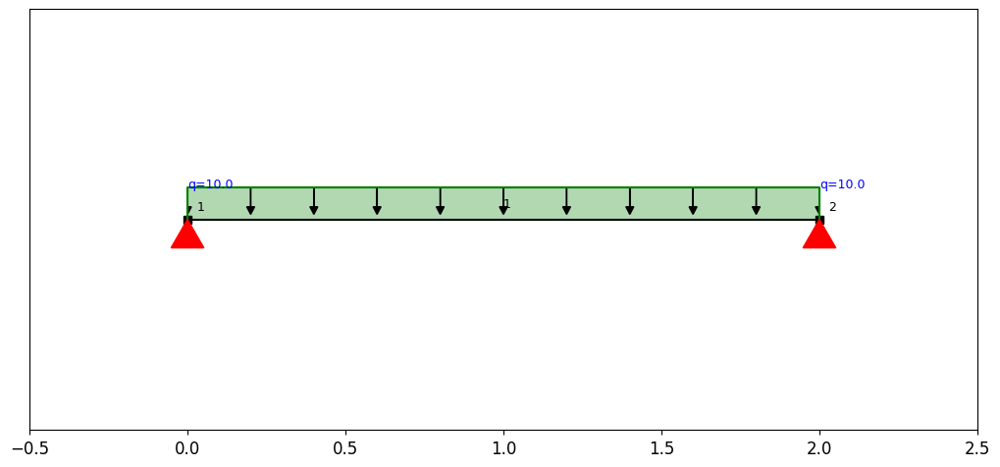

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


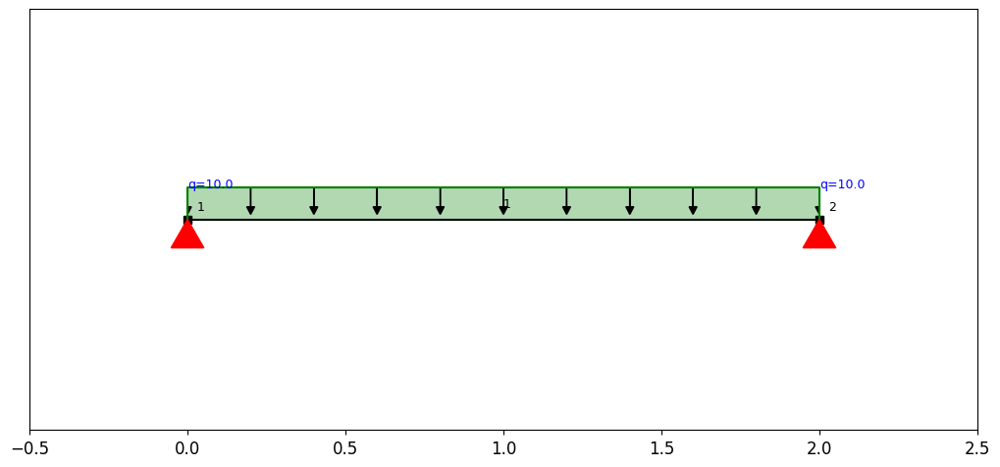

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

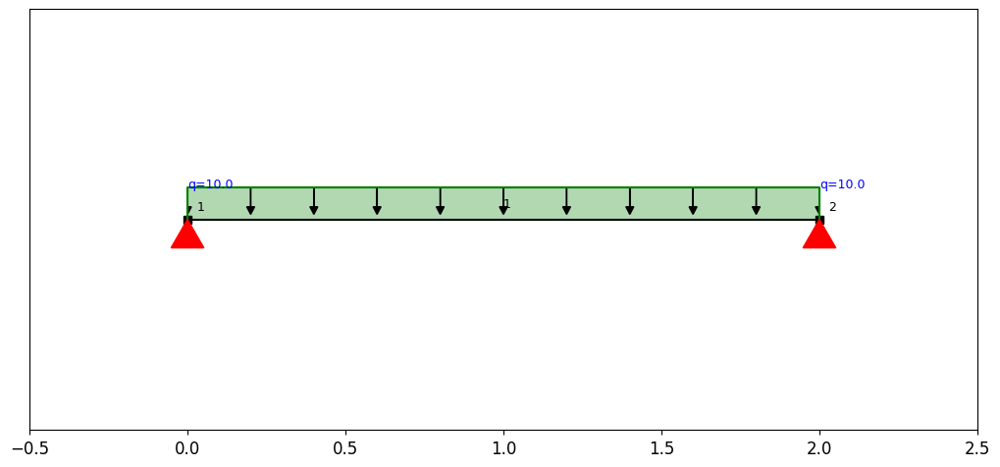

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

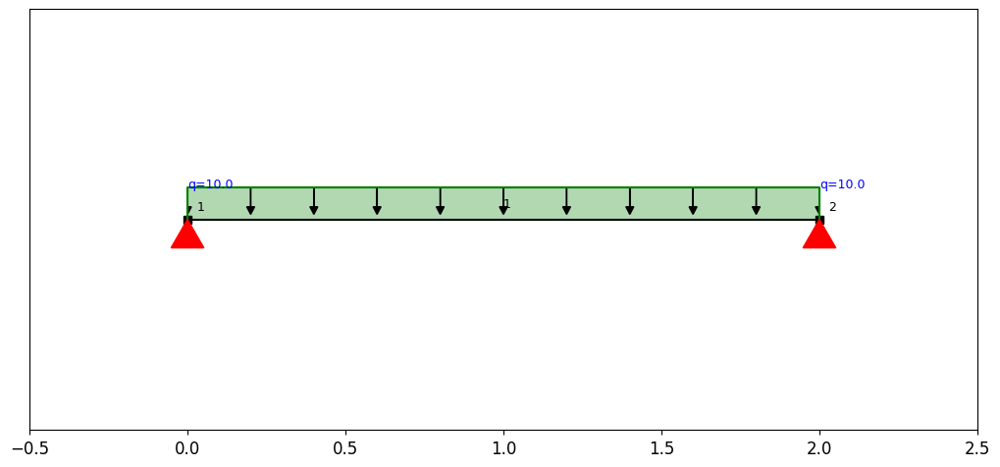

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

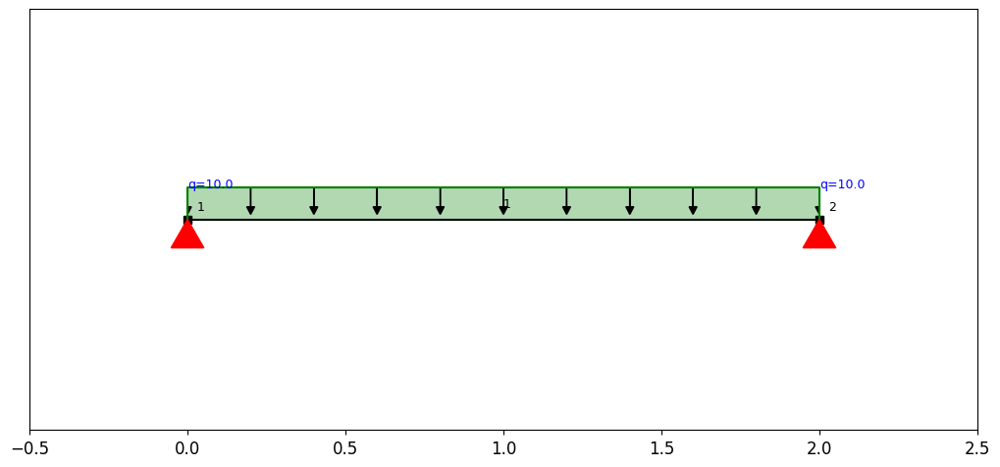

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

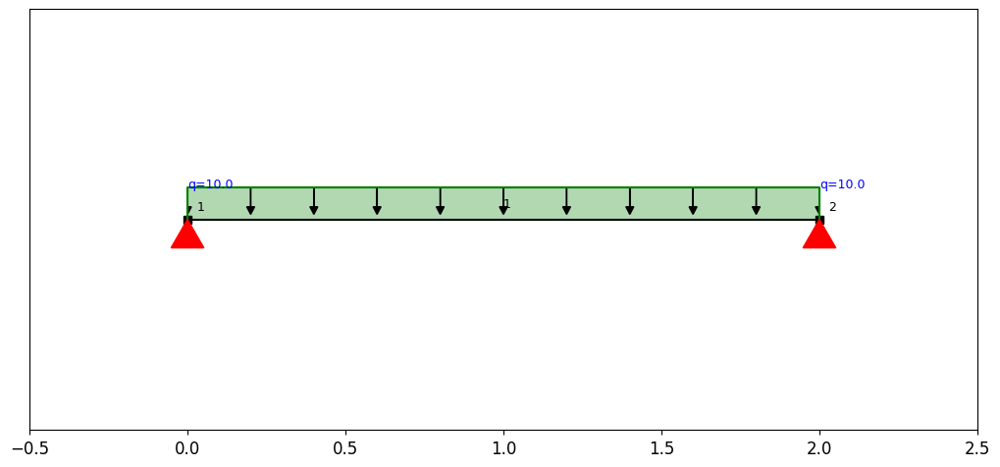

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

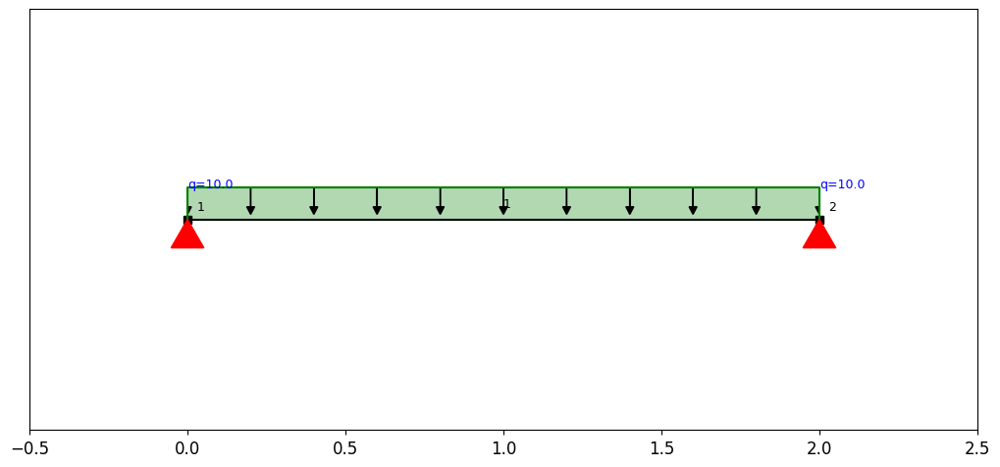

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

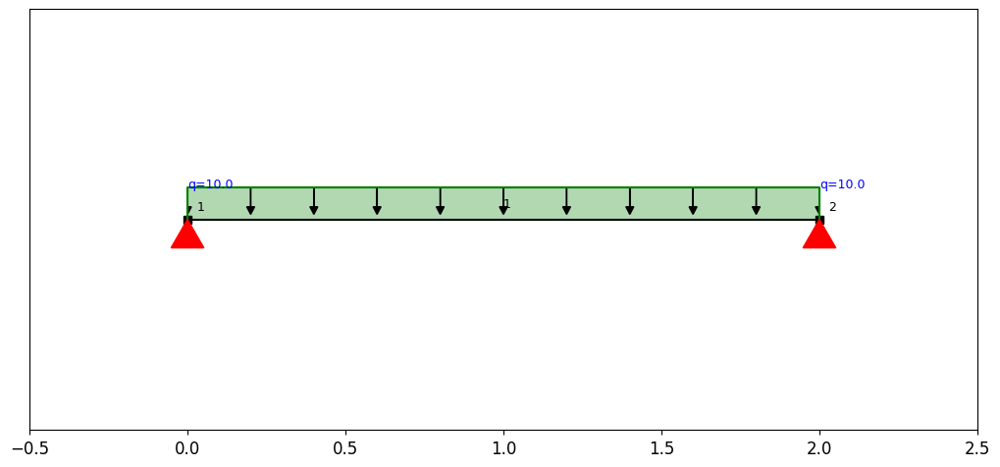

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


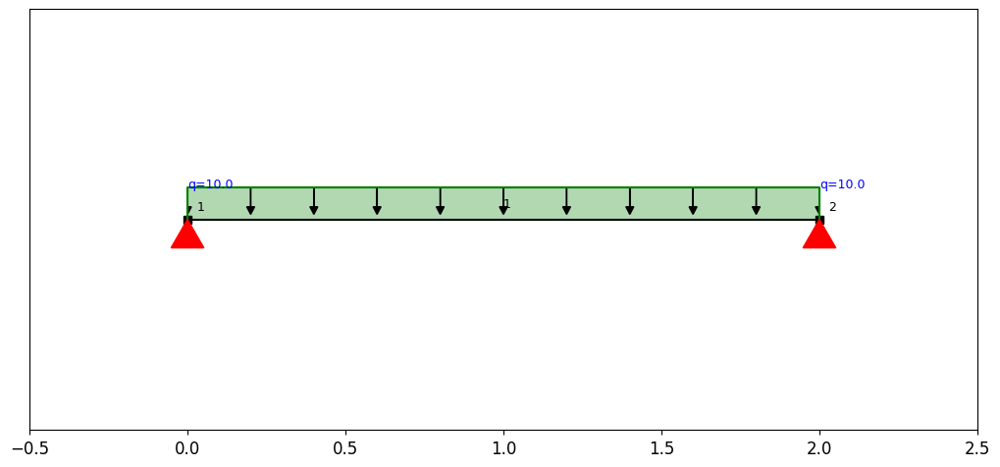

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

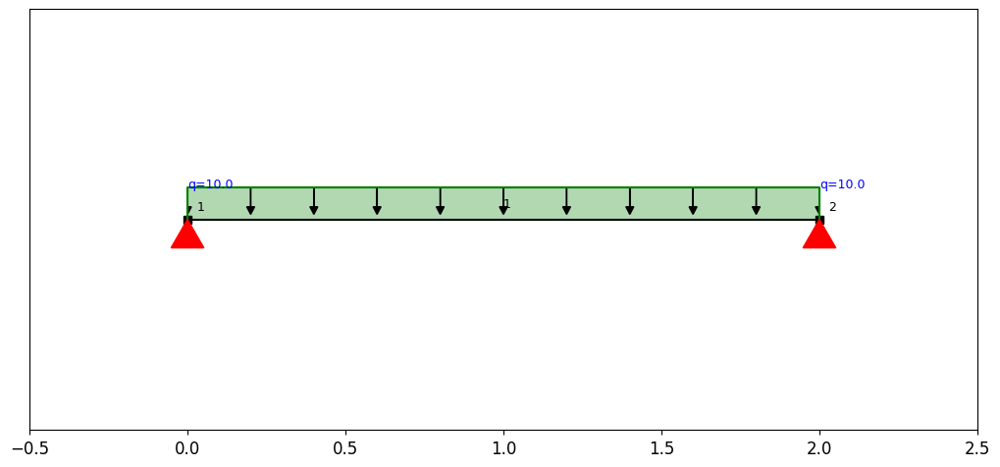

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

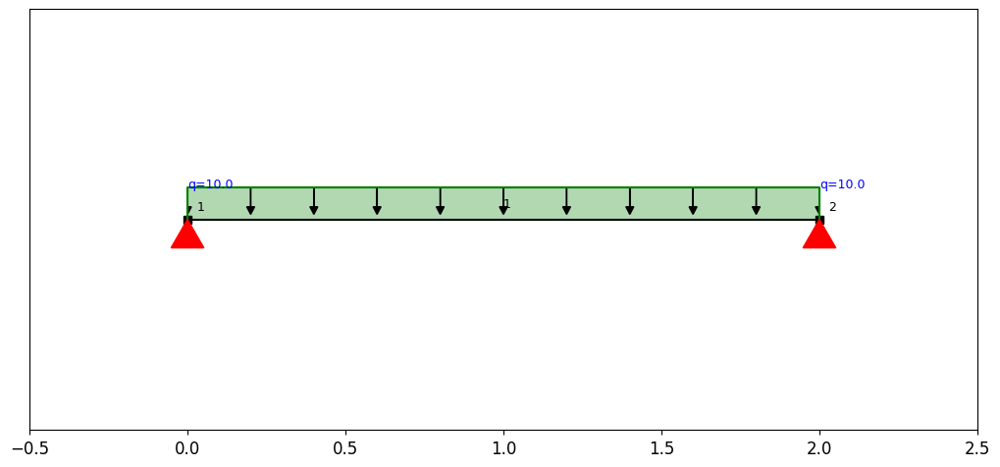

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

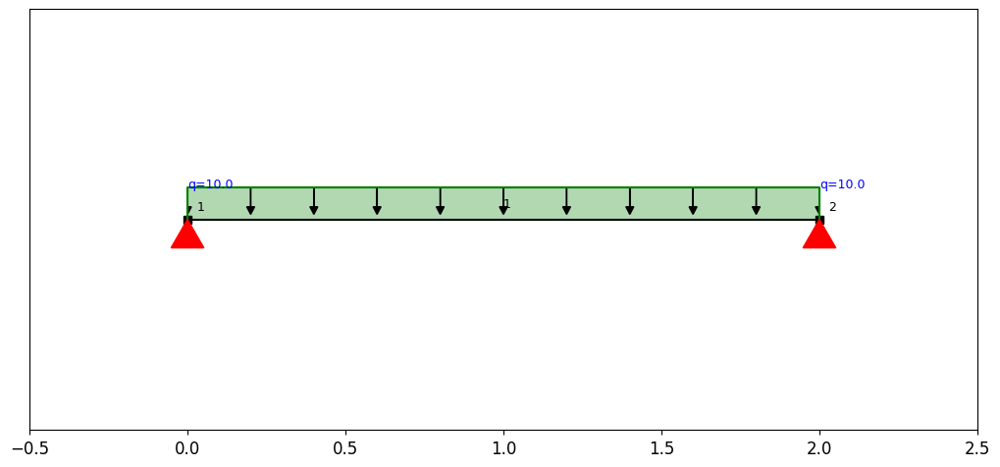

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

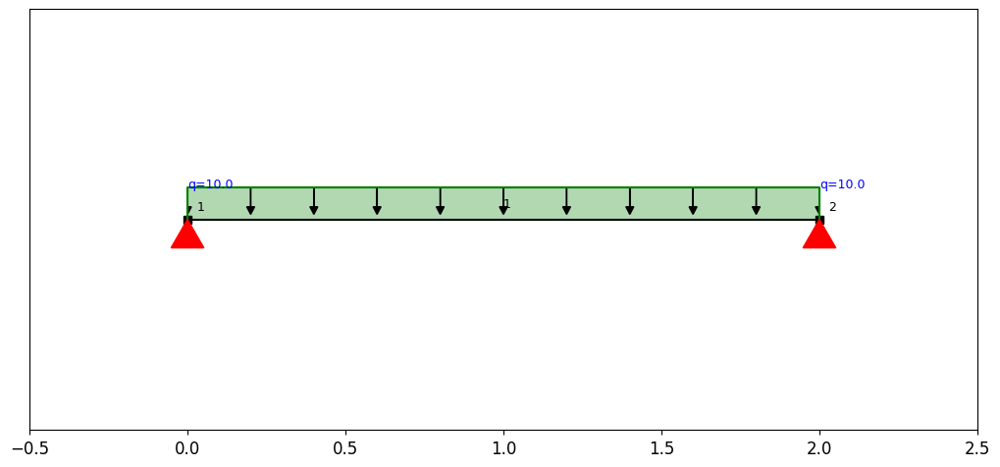

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

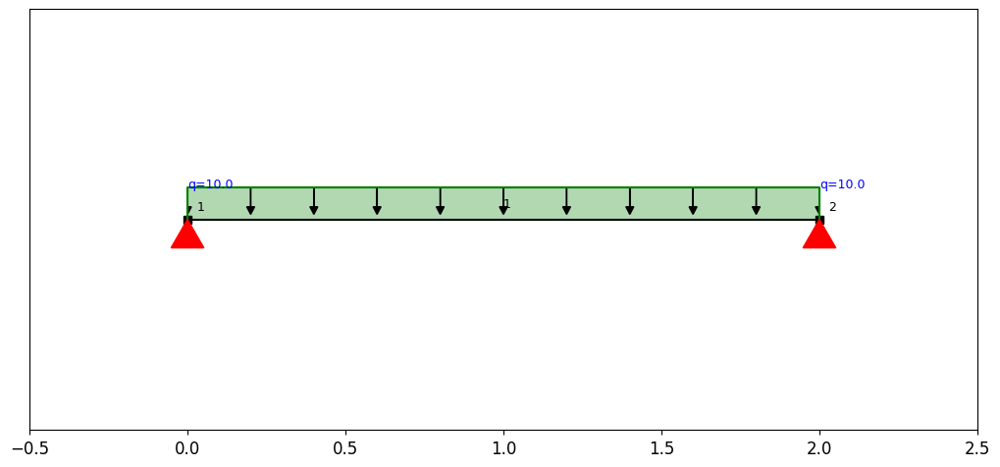

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

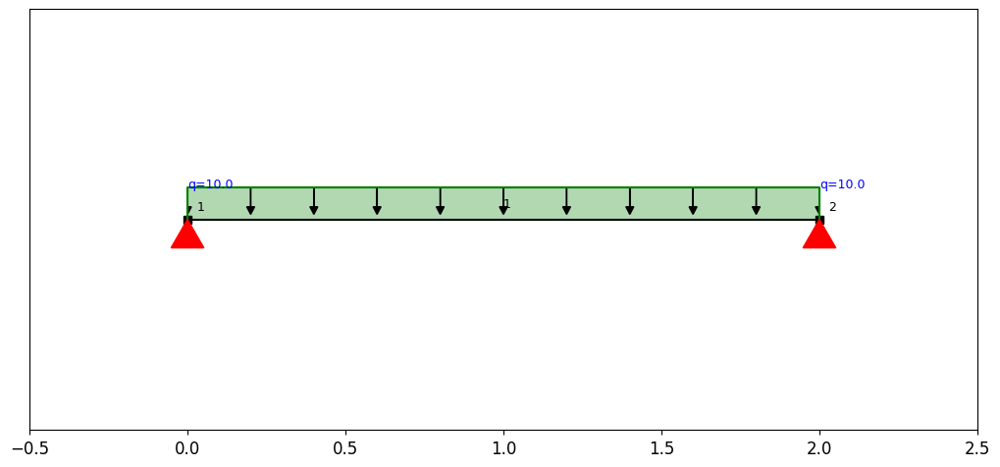

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

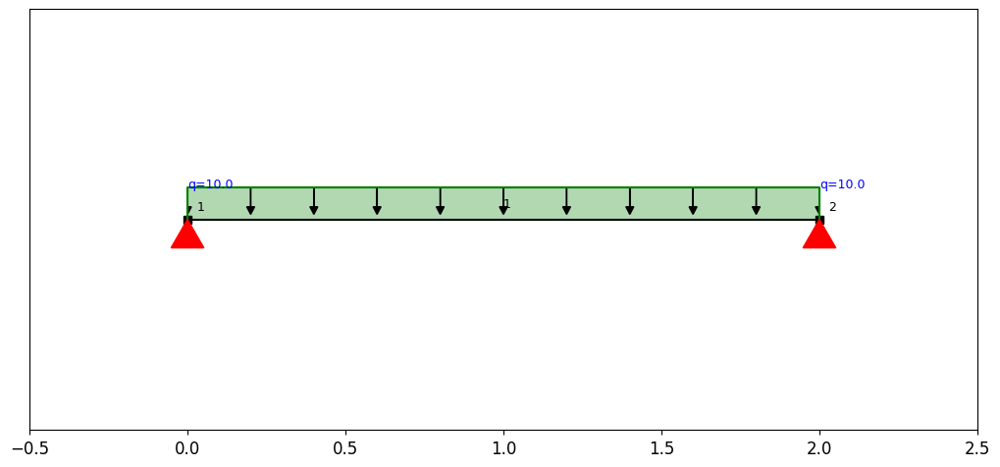

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

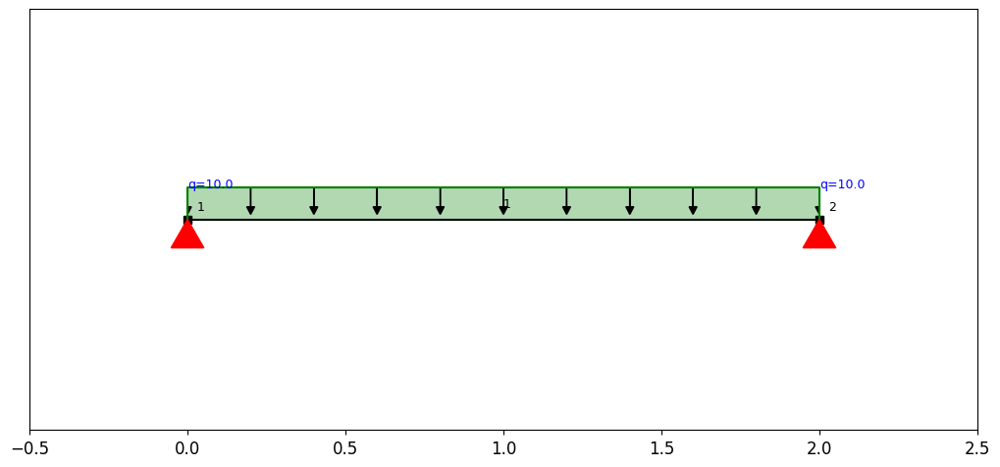

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

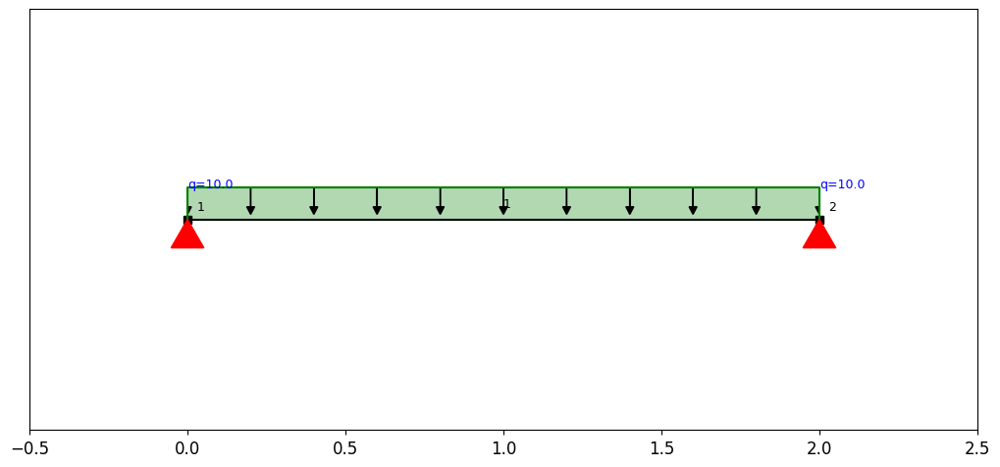

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

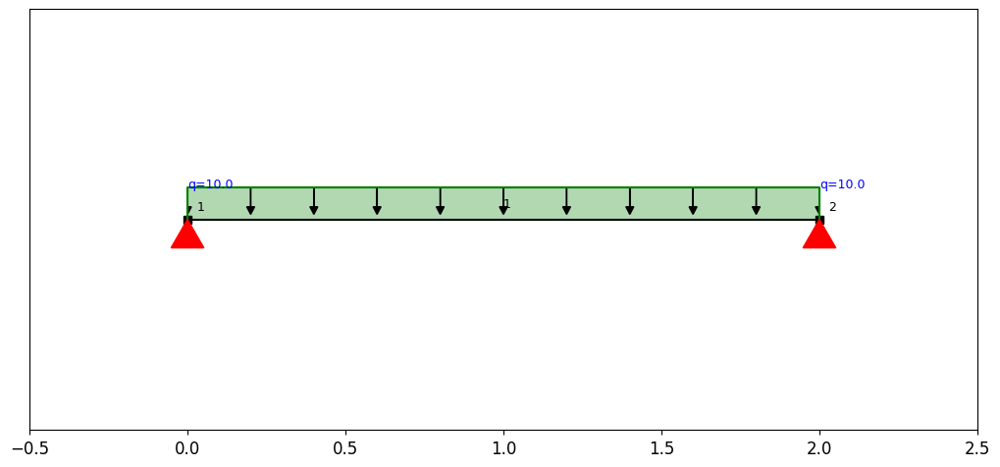

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


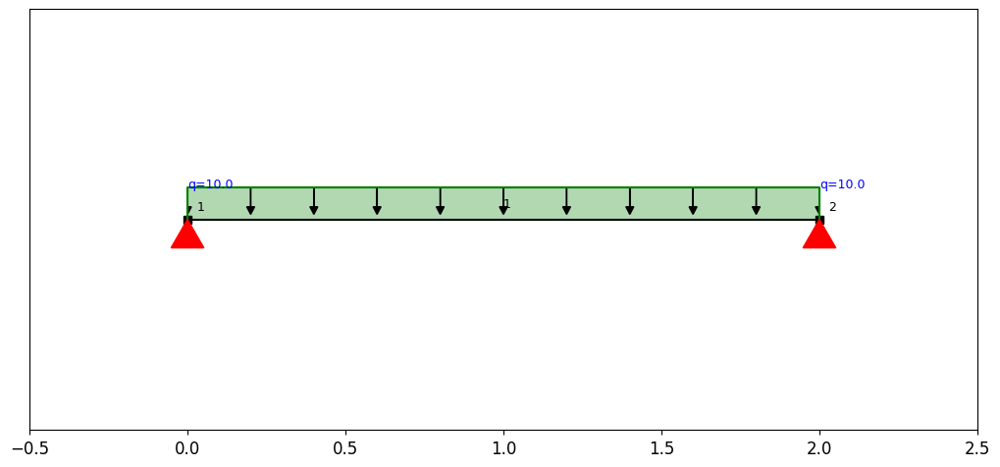

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

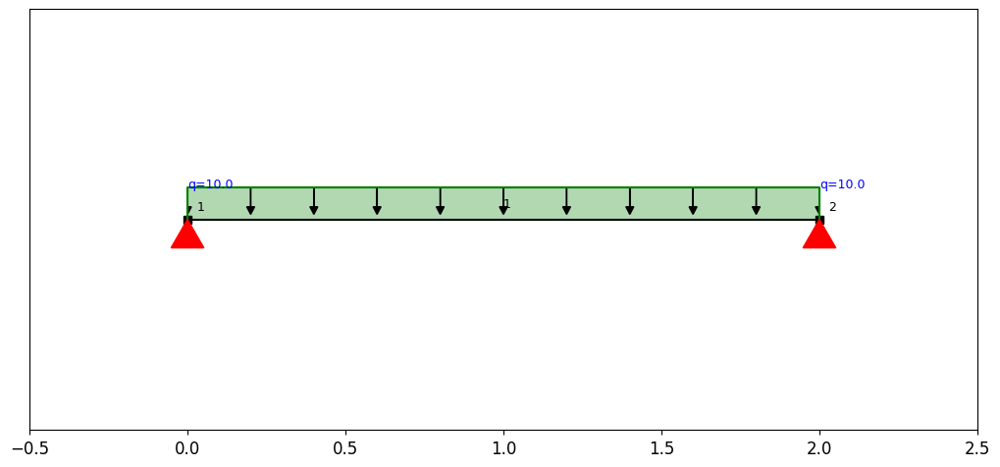

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

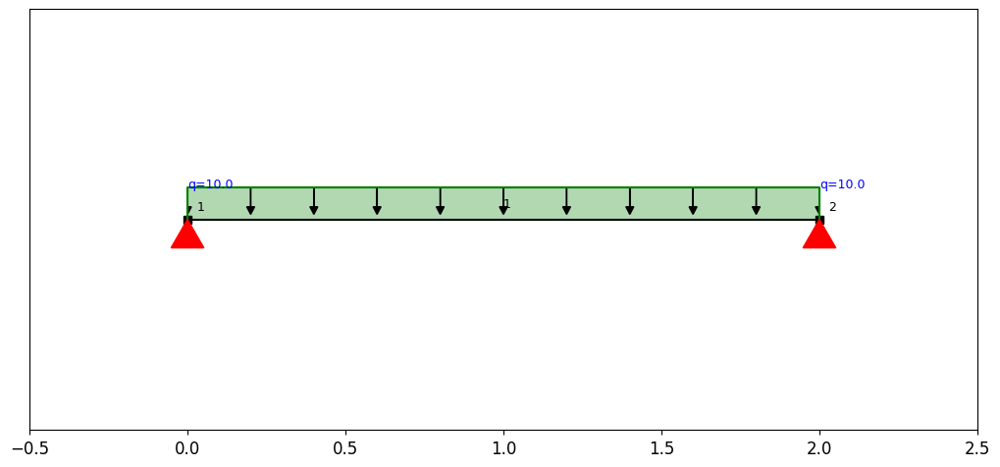

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

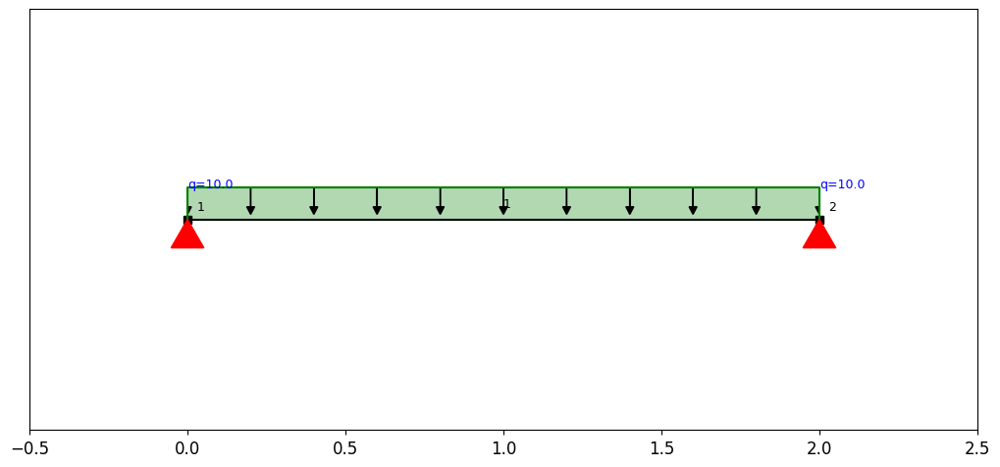

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

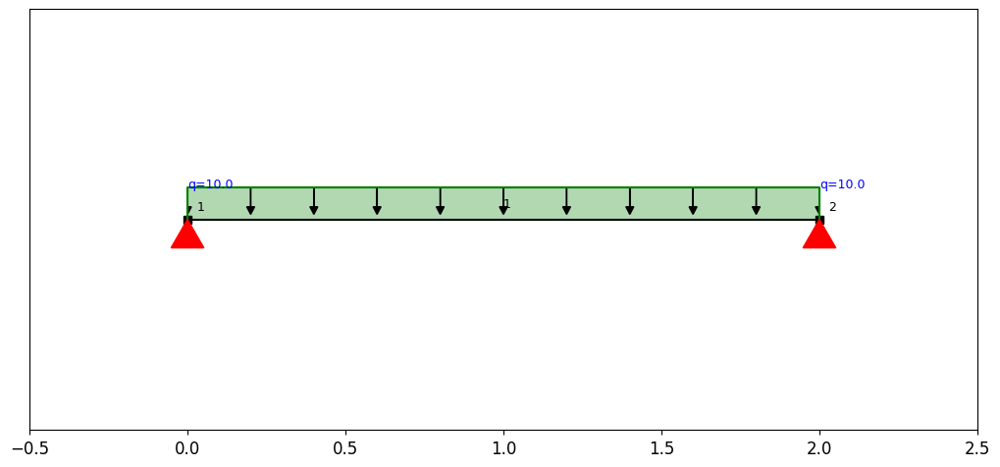

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

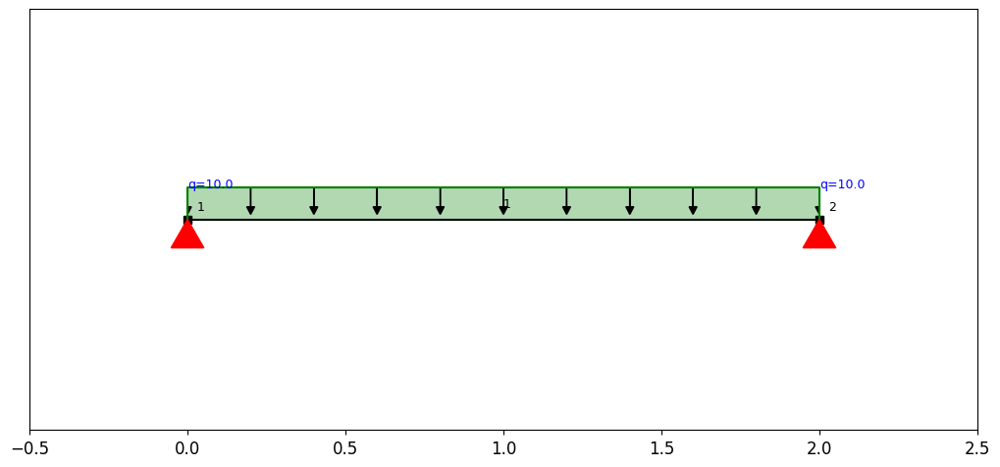

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

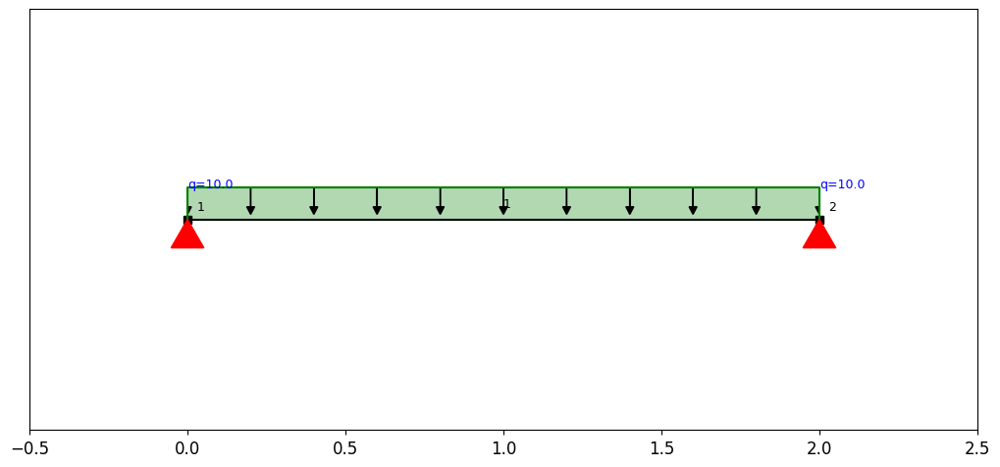

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

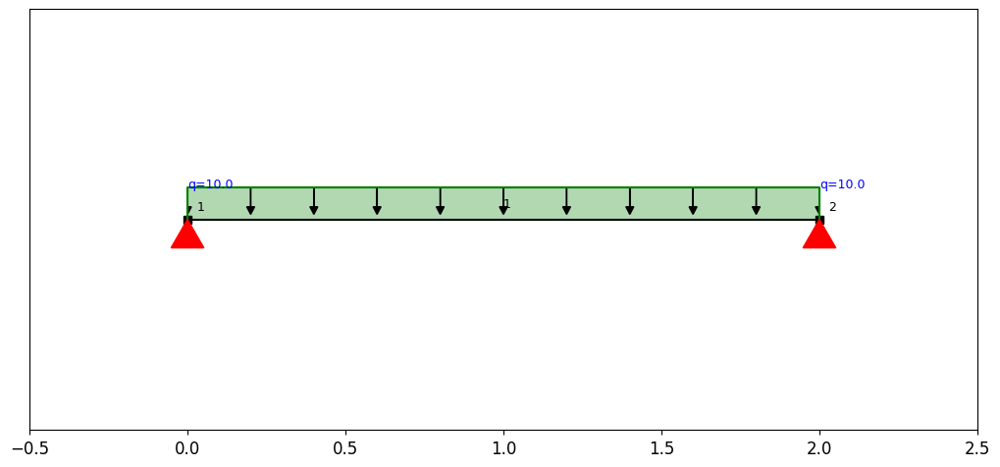

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

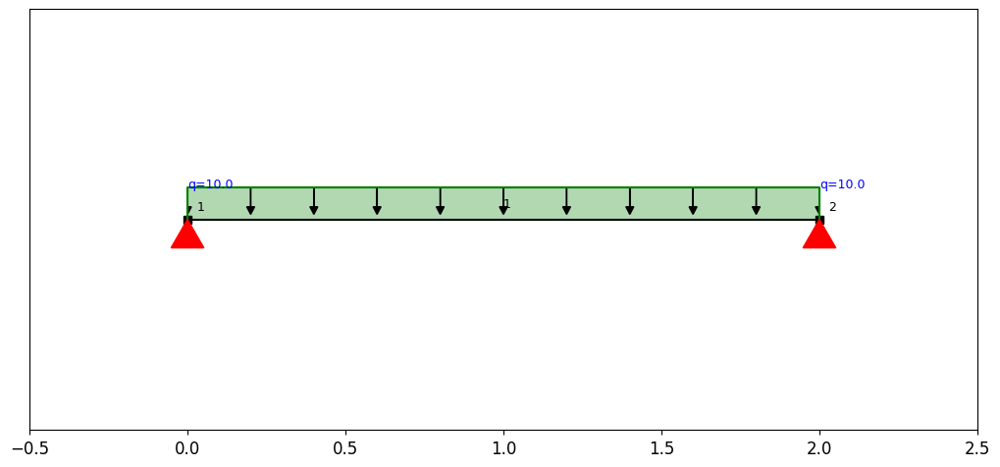

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

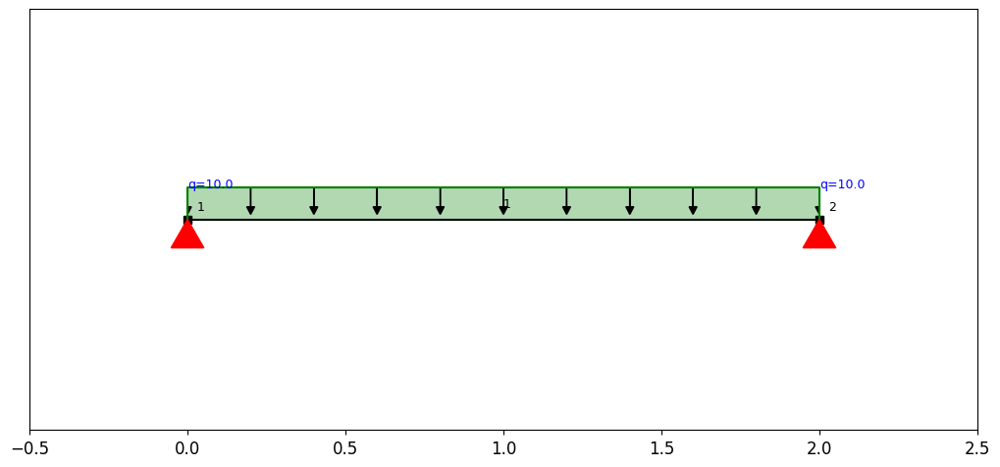

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

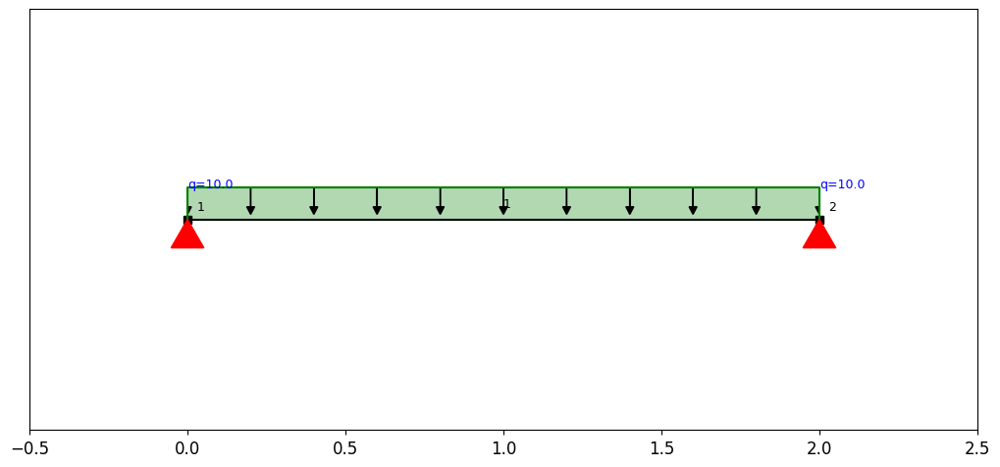

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

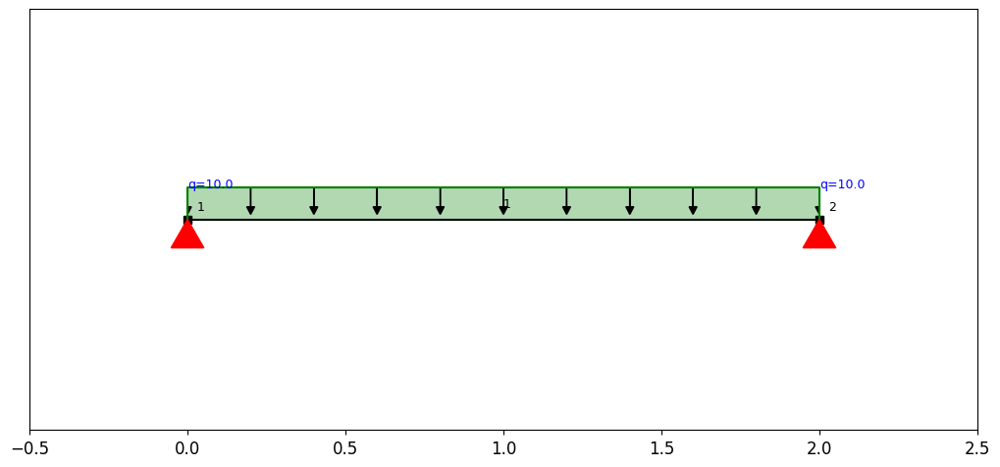

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

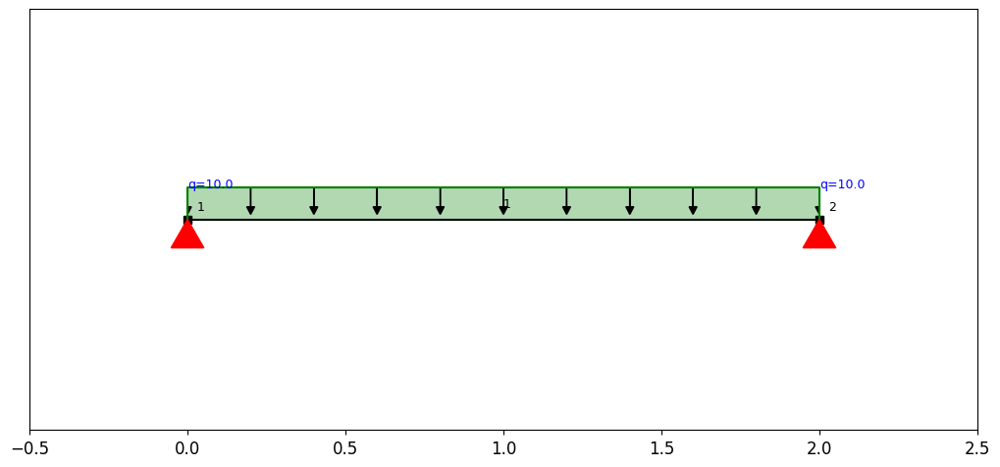

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

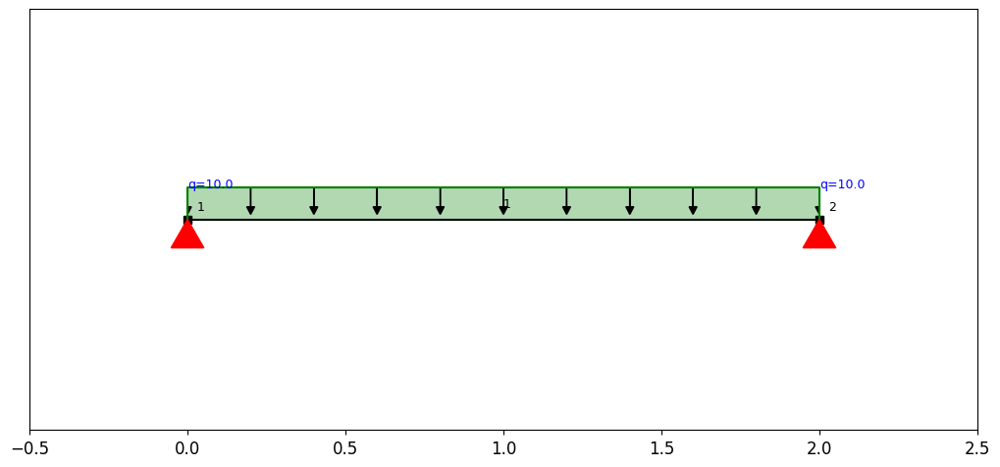

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

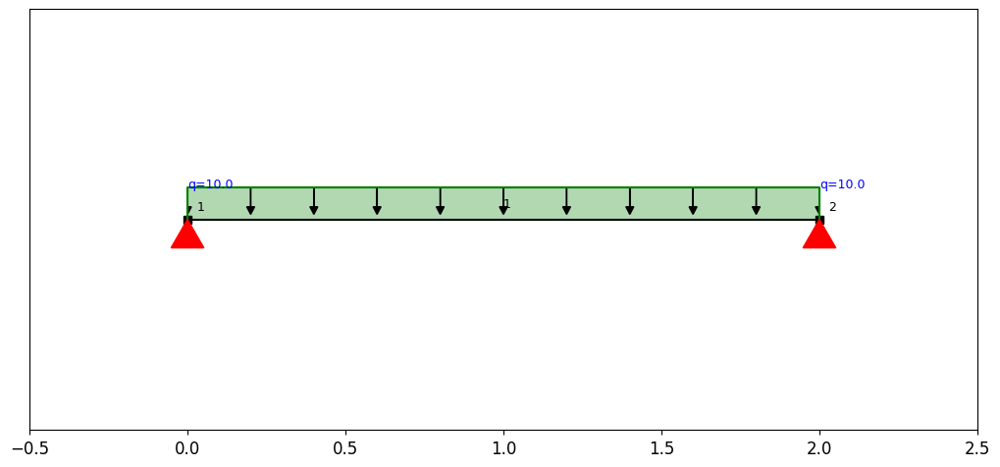

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

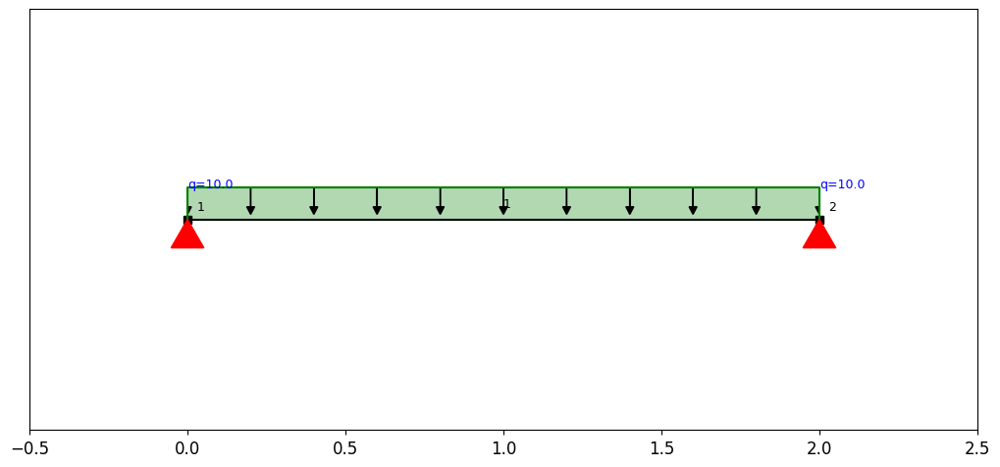

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

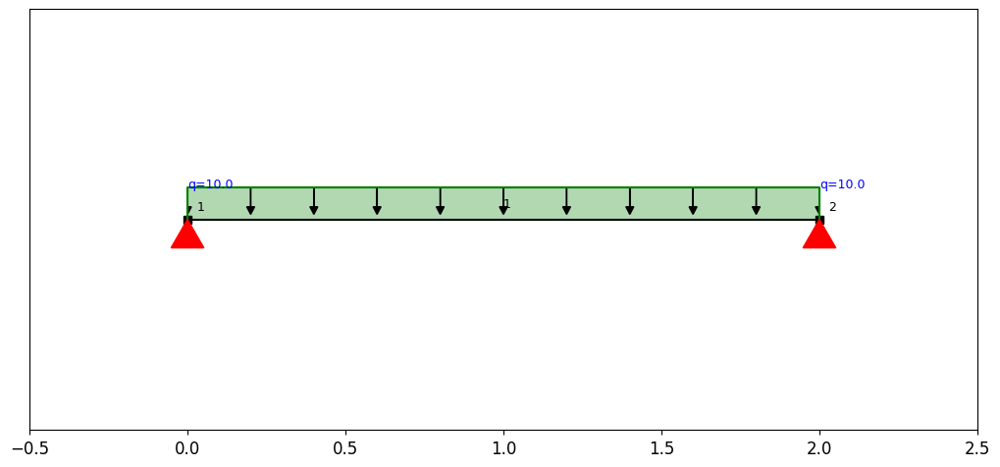

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

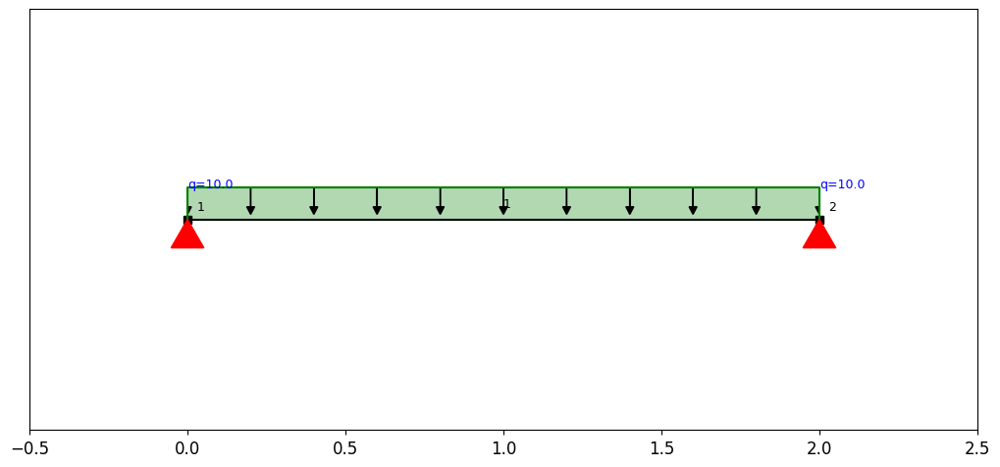

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

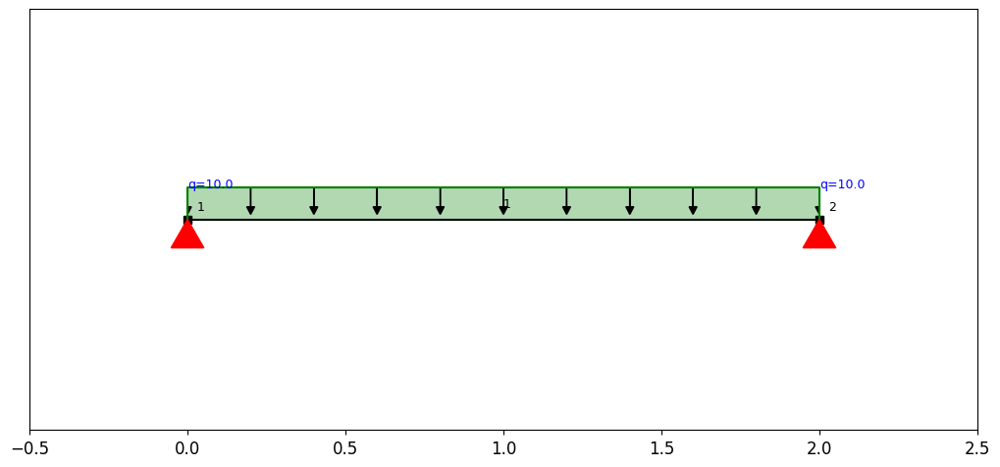

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

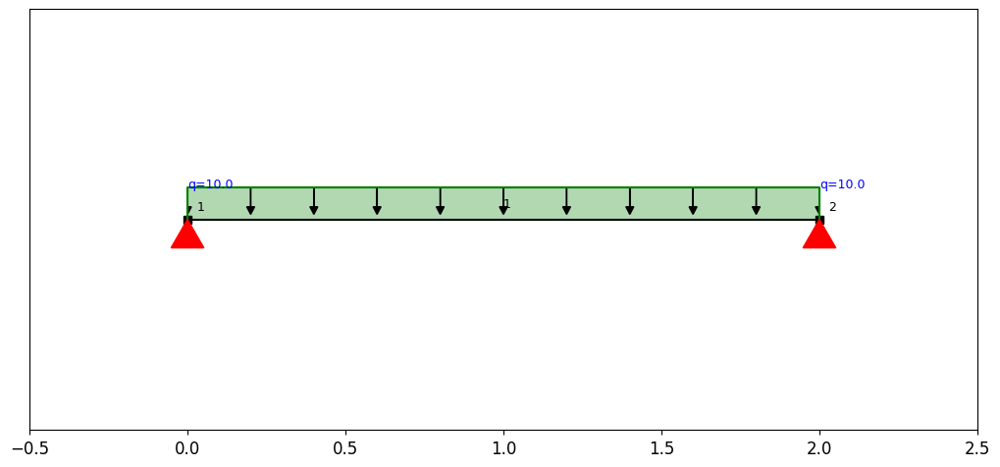

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


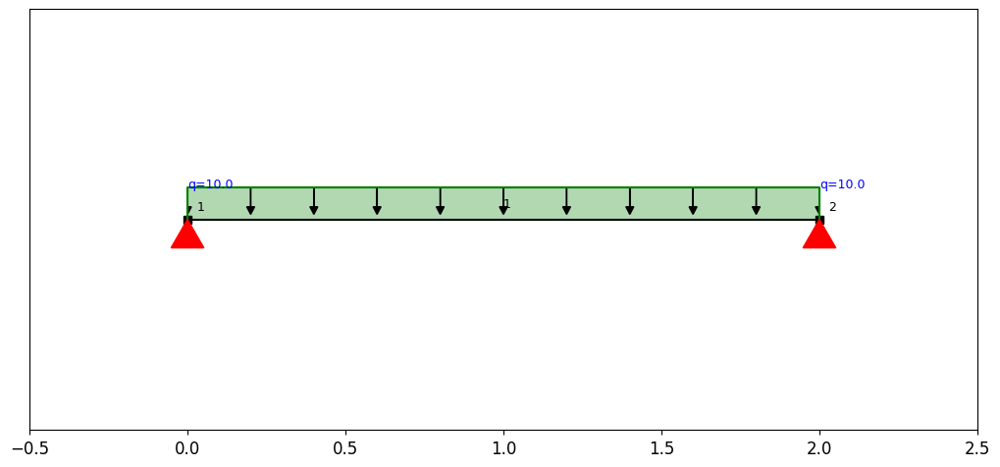

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

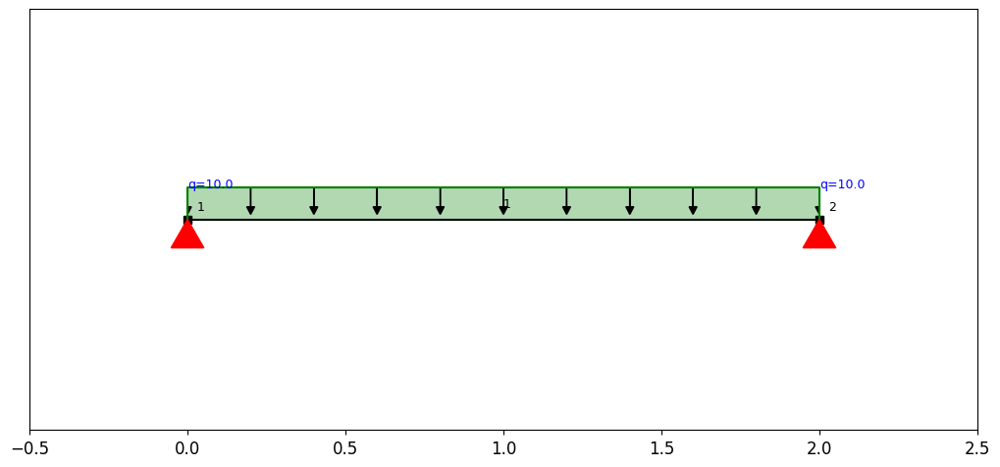

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

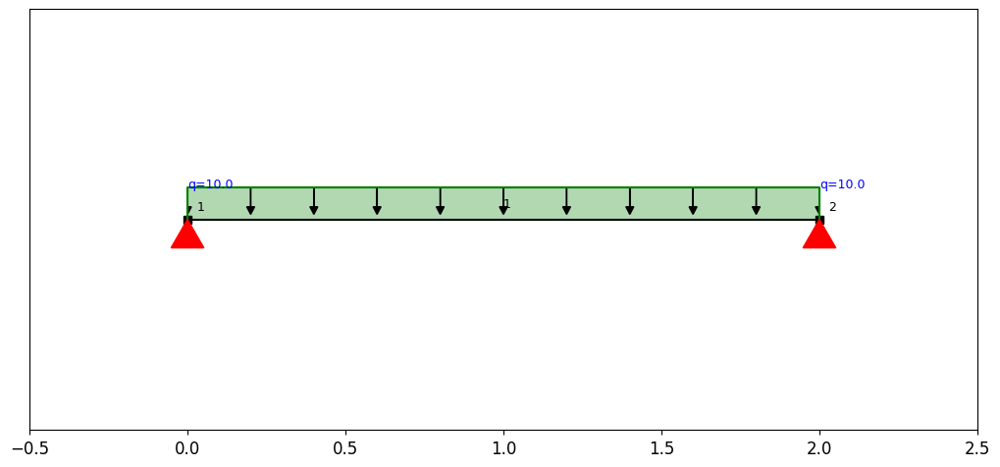

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

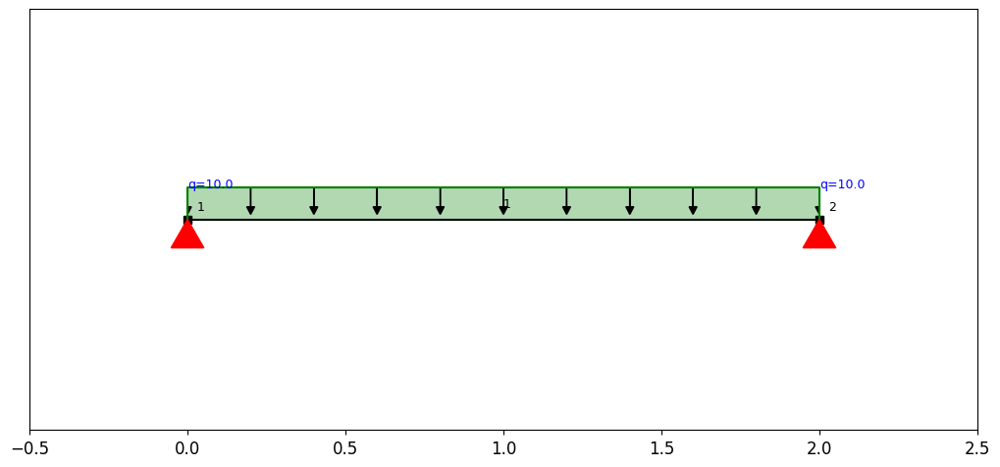

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

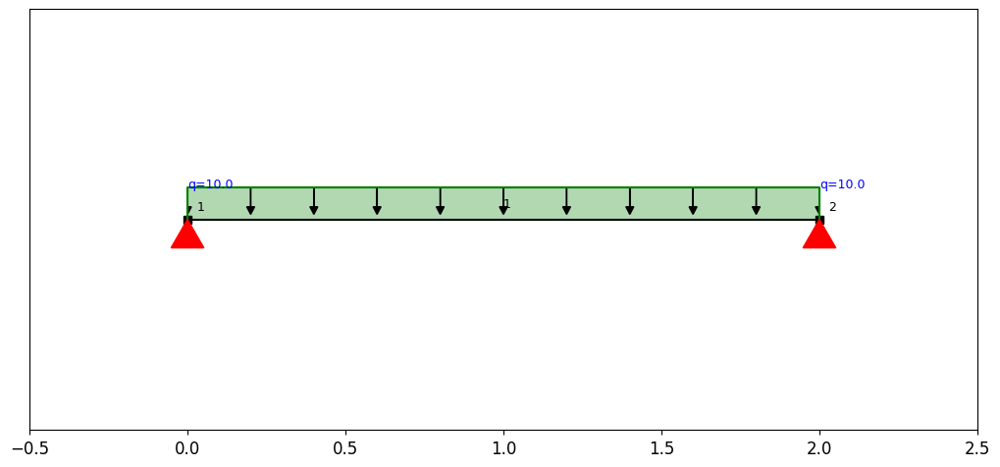

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

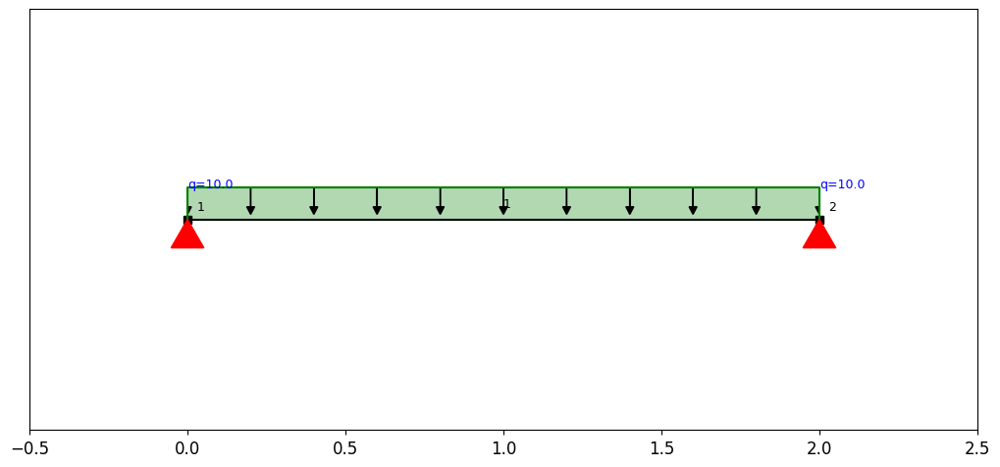

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


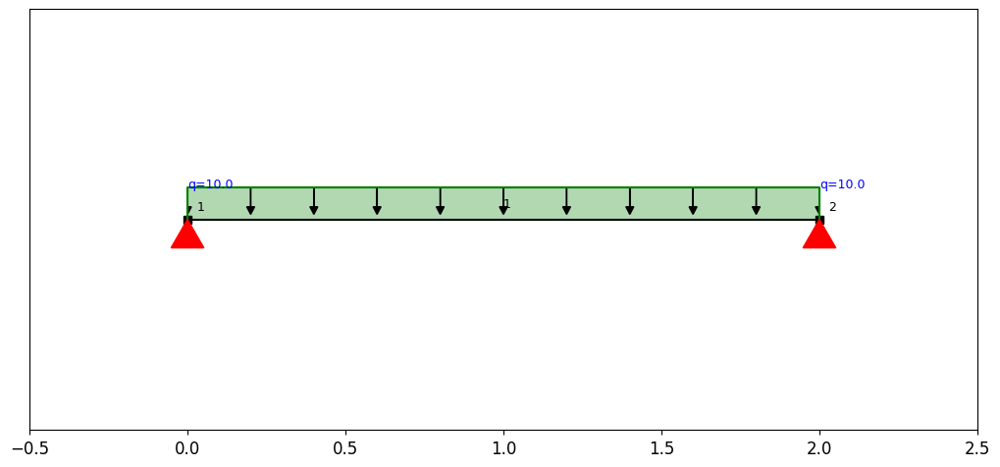

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

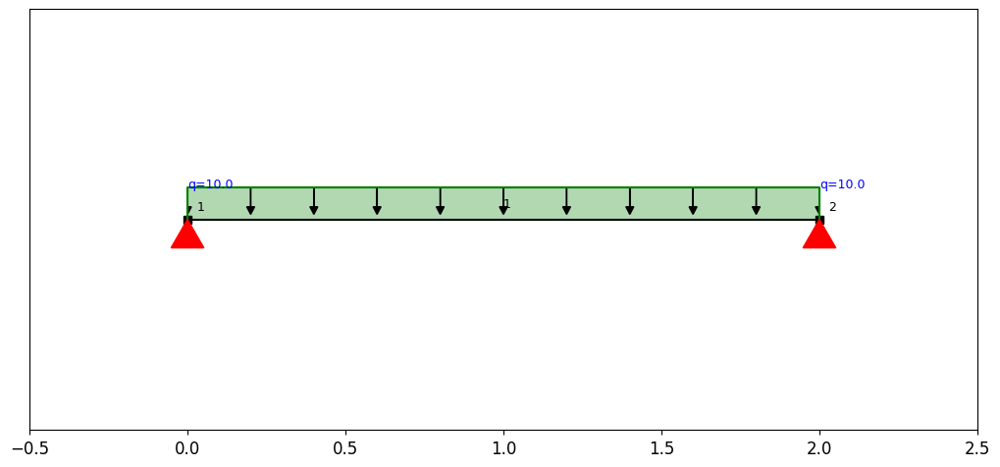

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

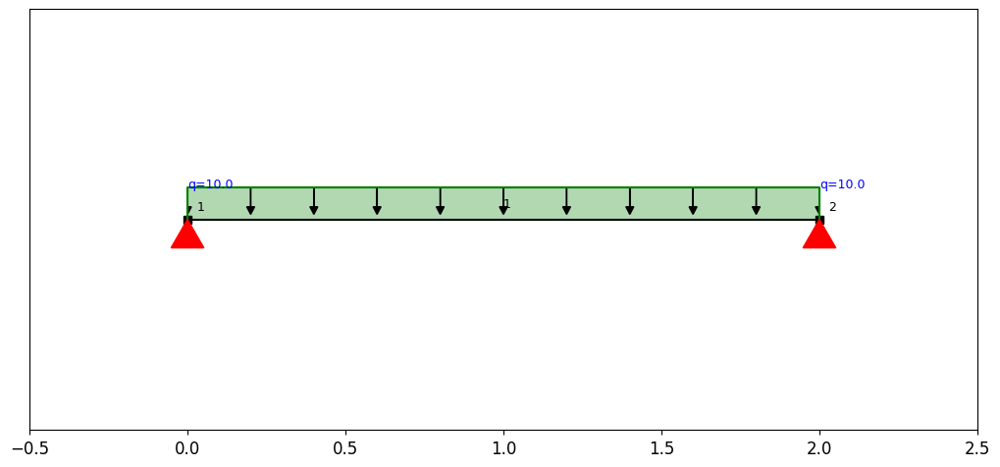

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

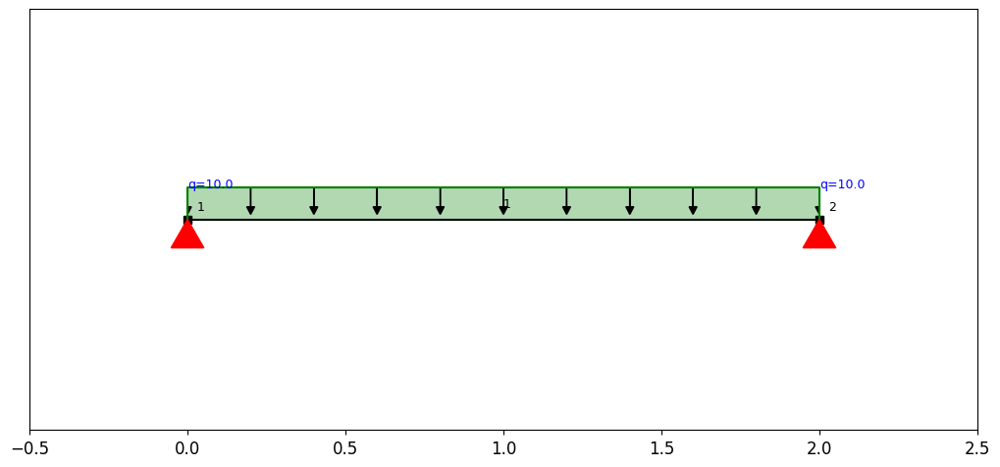

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


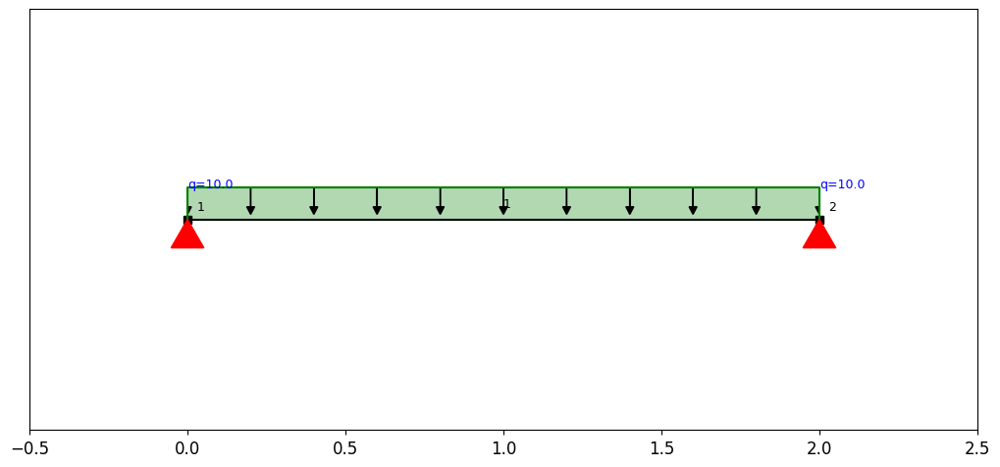

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

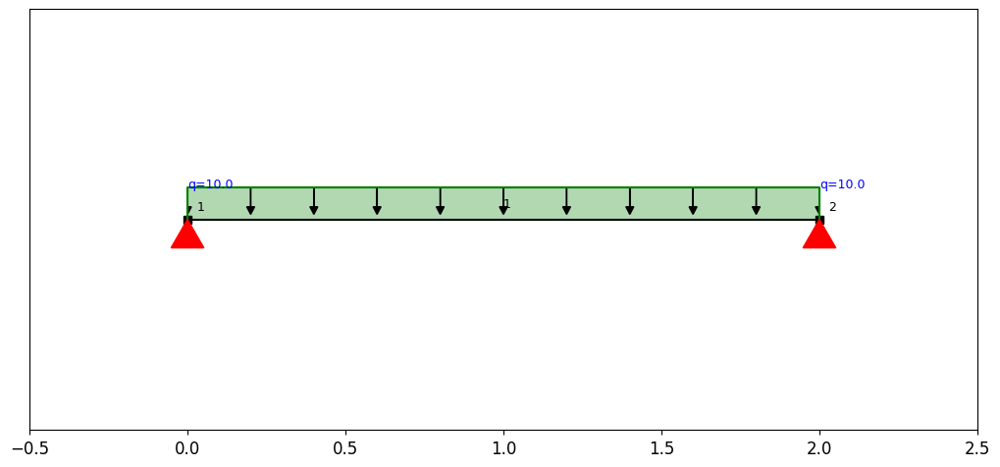

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

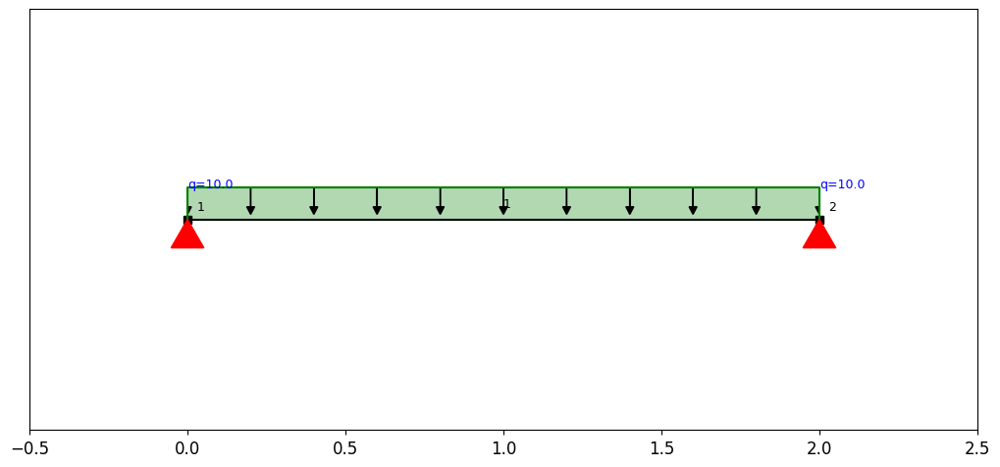

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

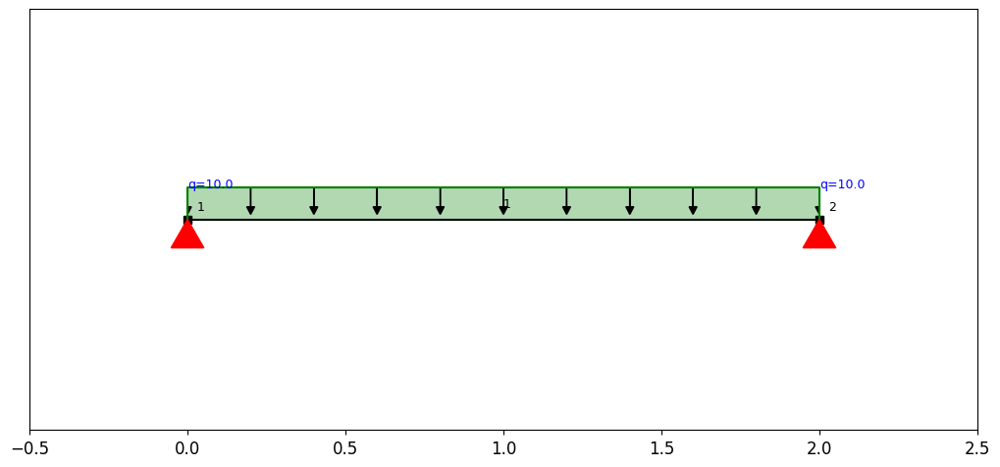

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

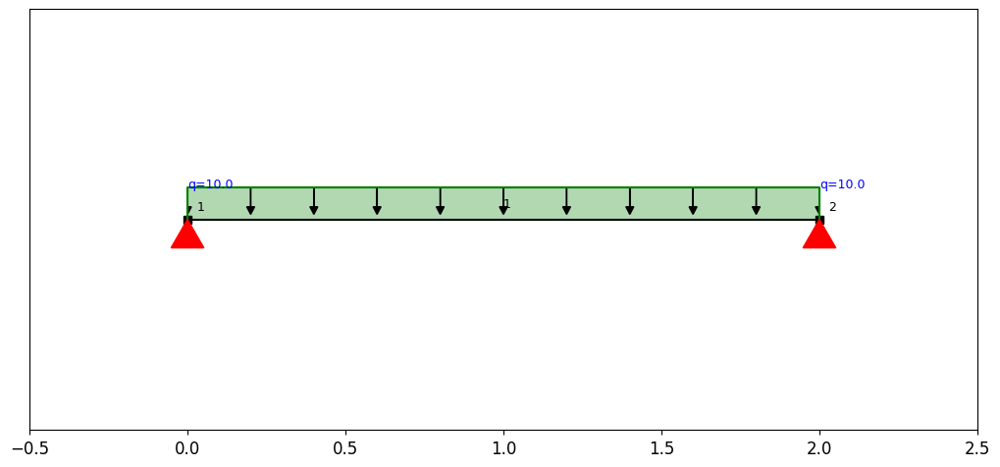

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

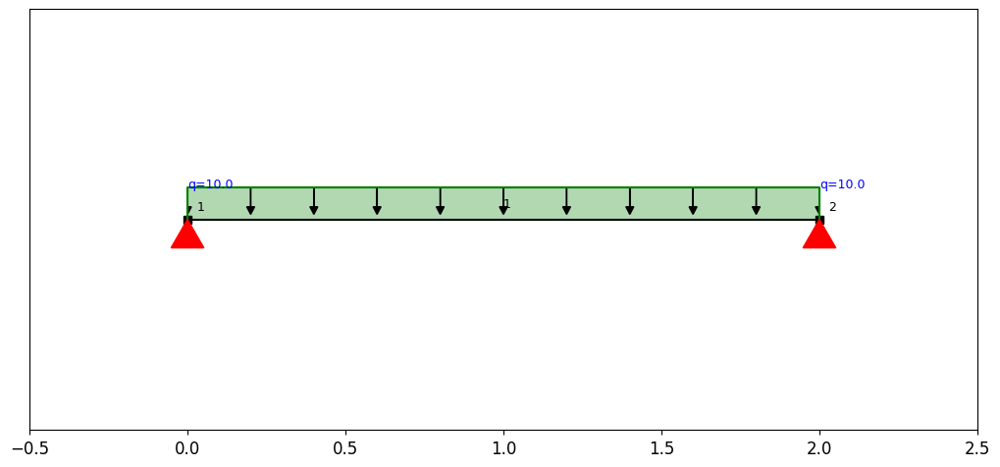

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

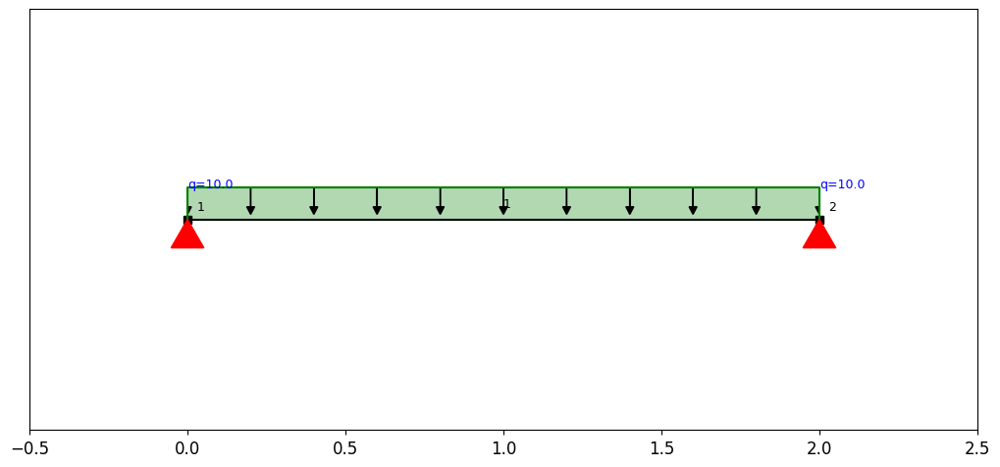

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

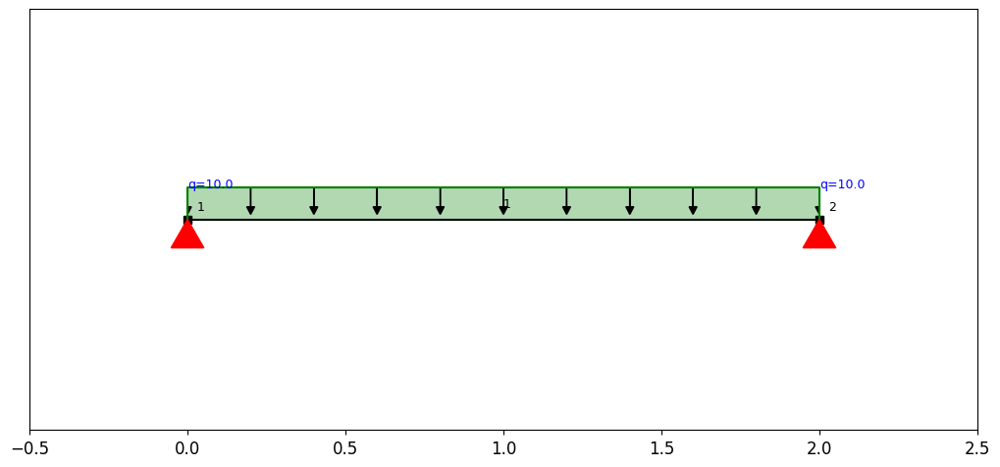

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

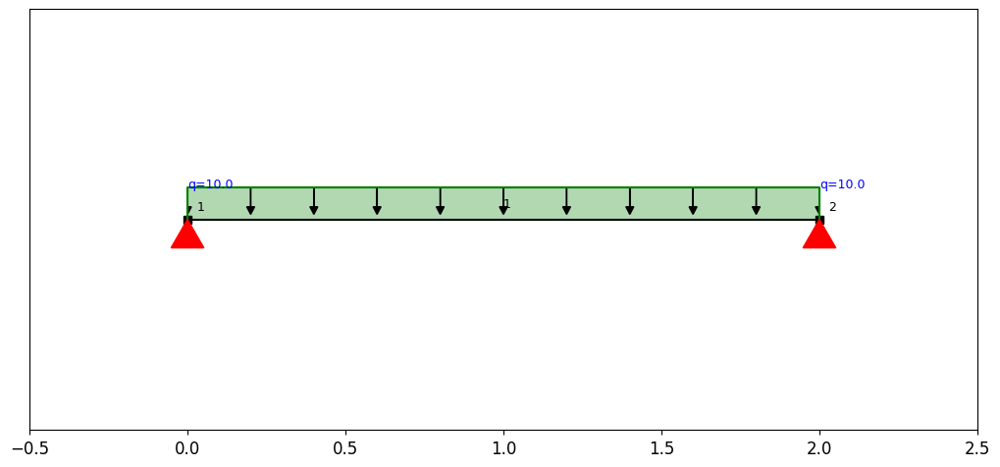

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

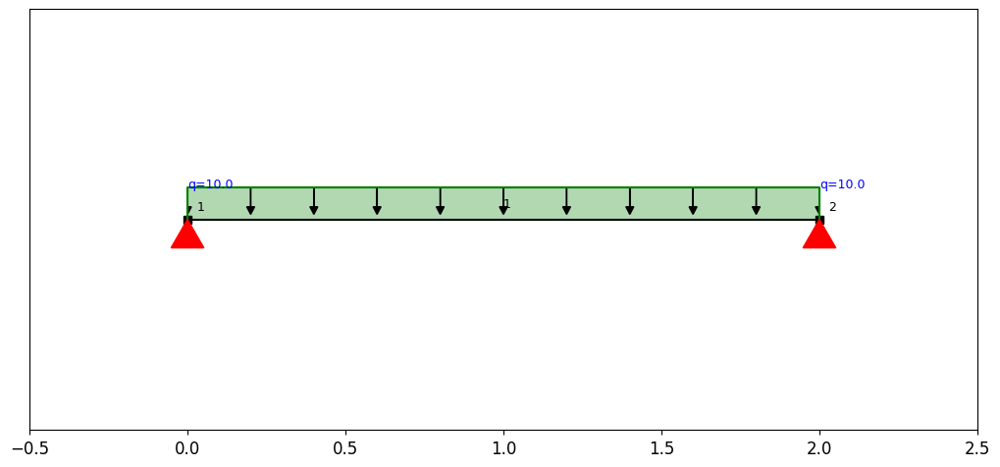

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

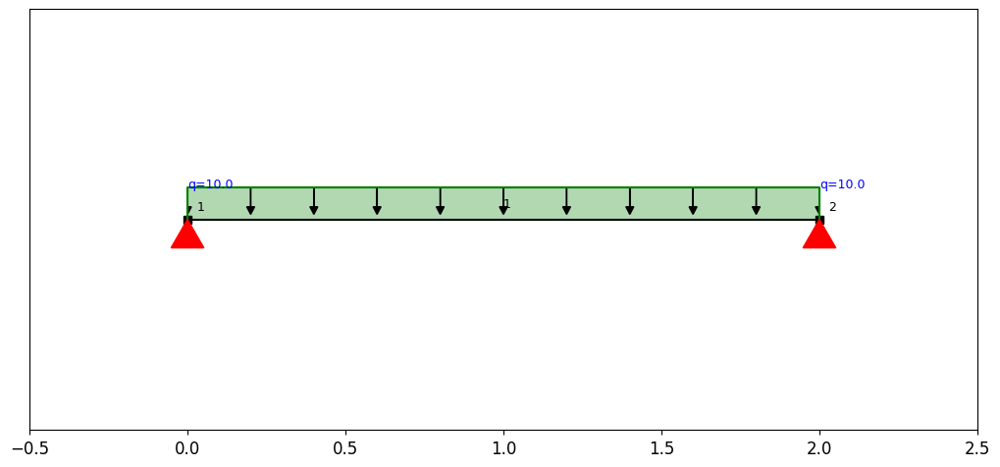

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

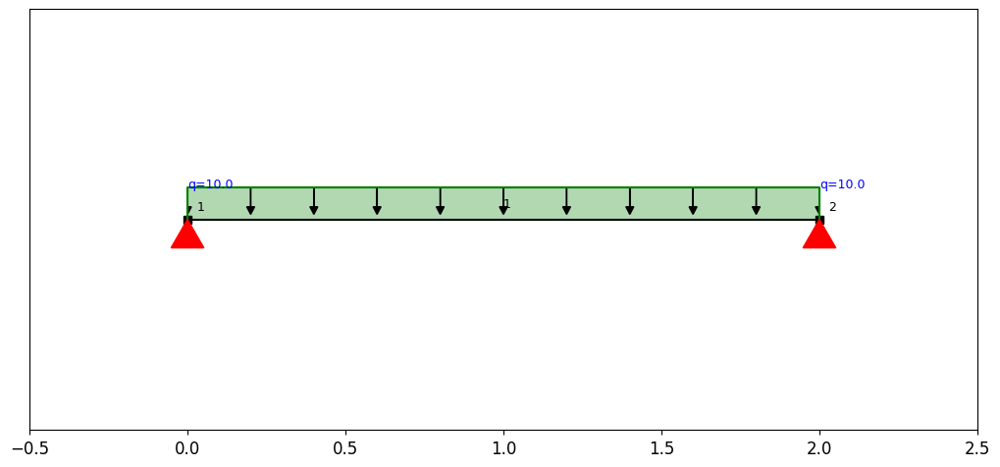

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


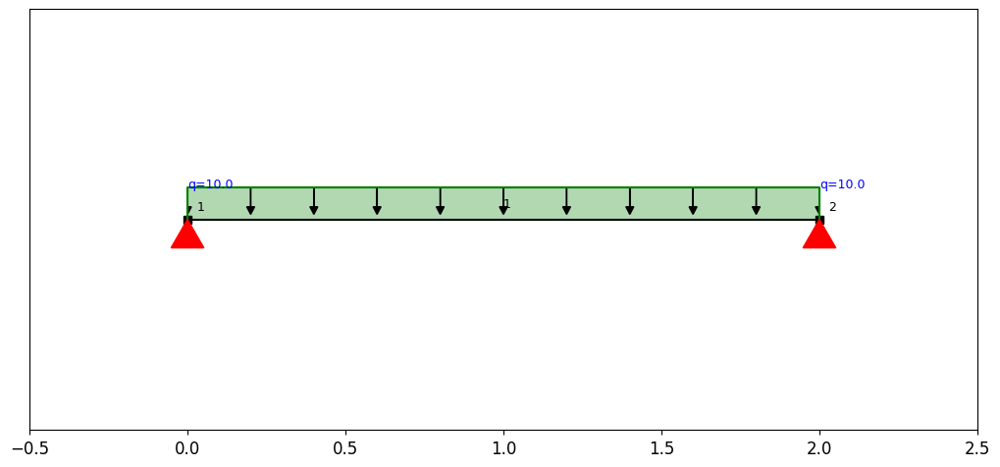

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

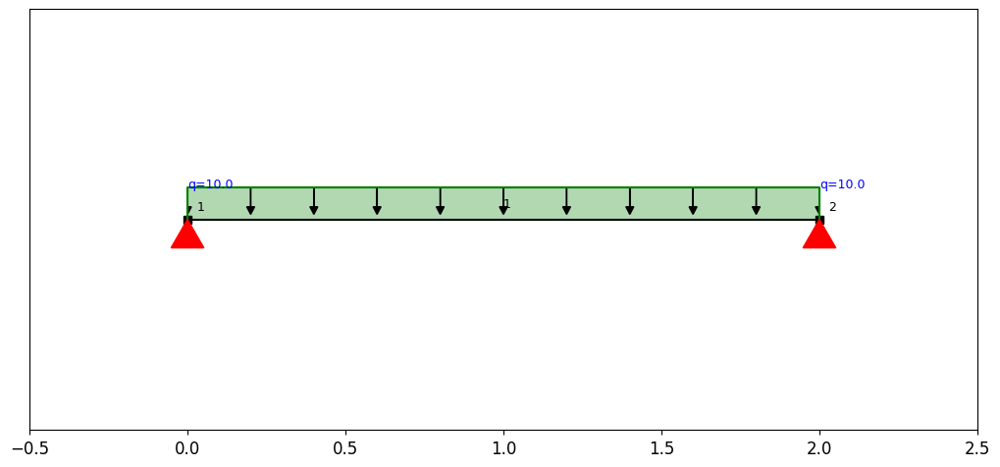

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

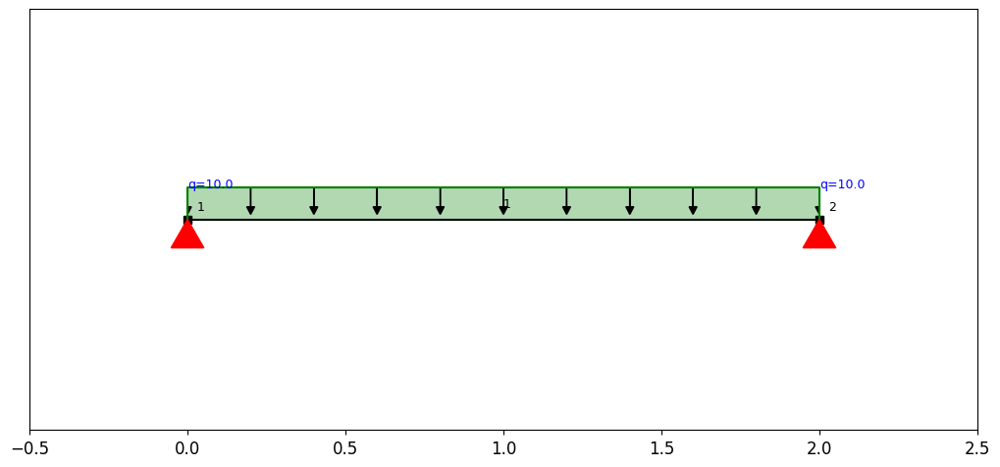

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

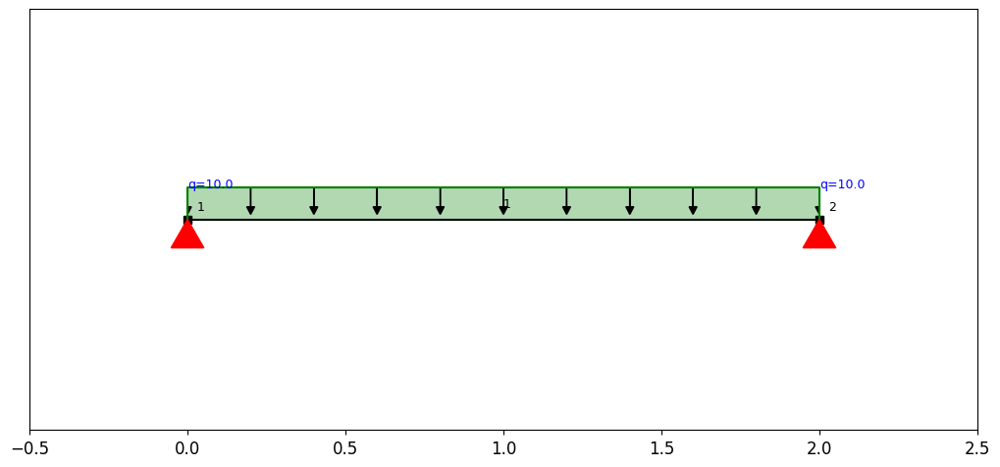

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

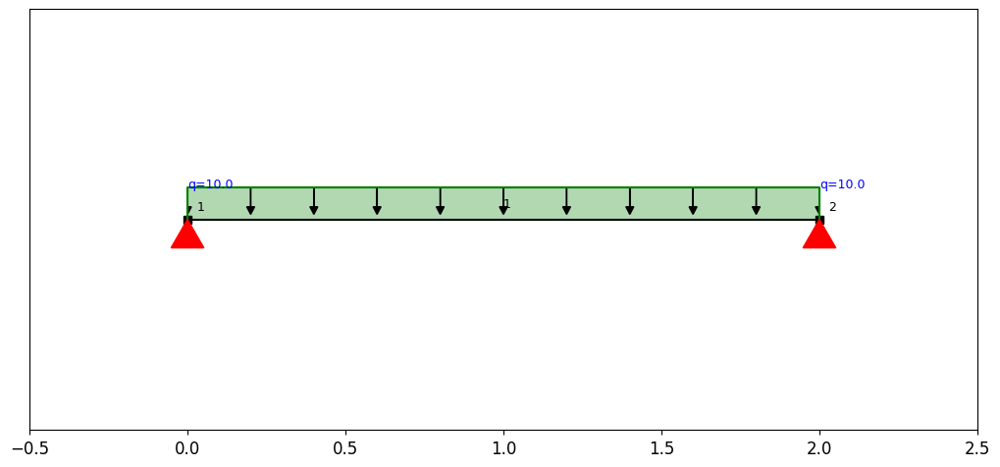

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

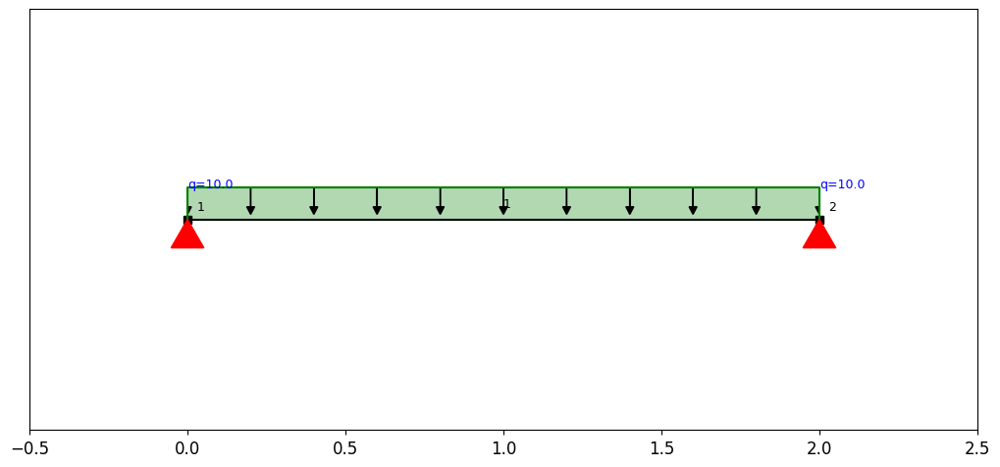

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

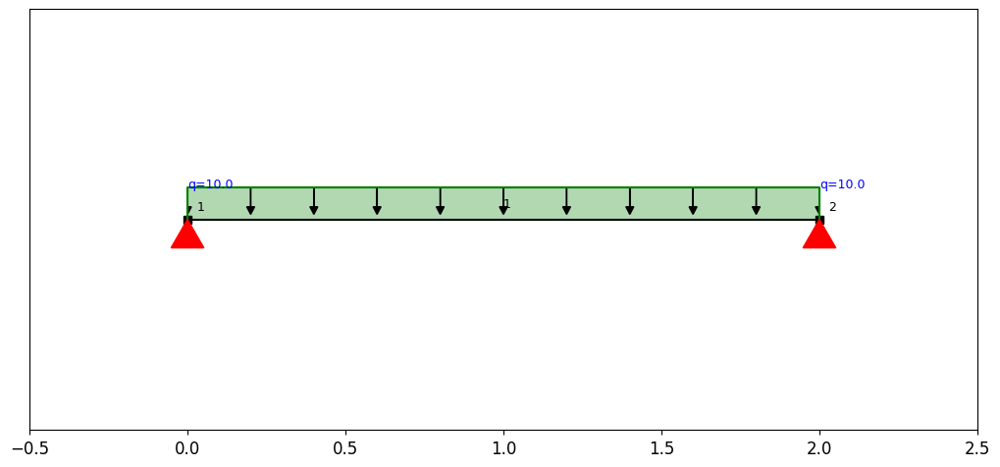

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e6
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:25: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Avy = float(section["Avy"

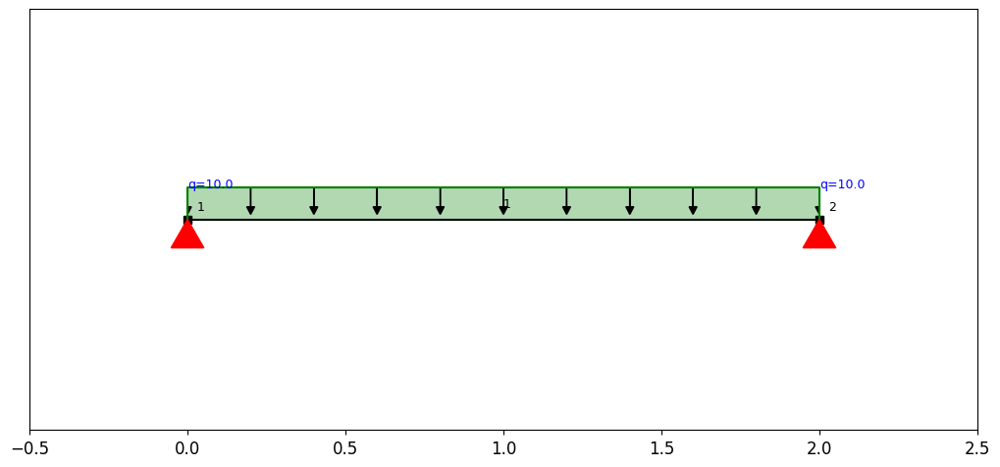

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

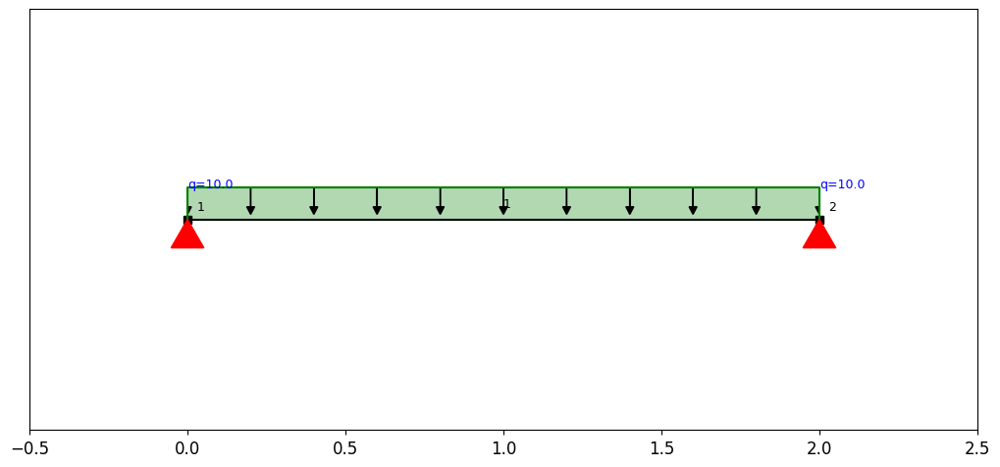

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

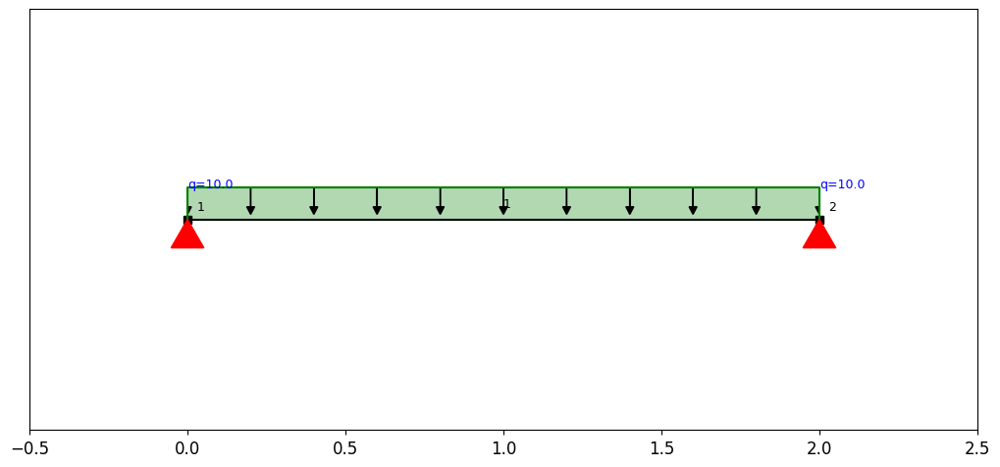

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

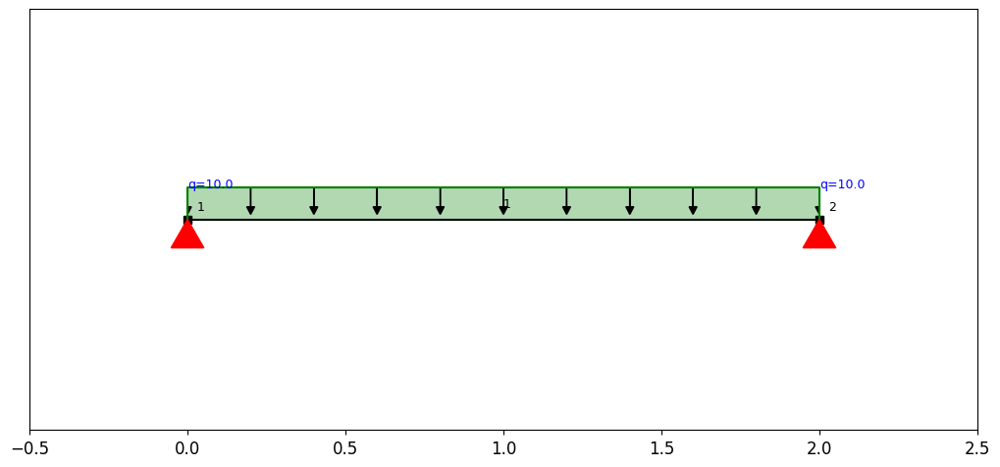

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

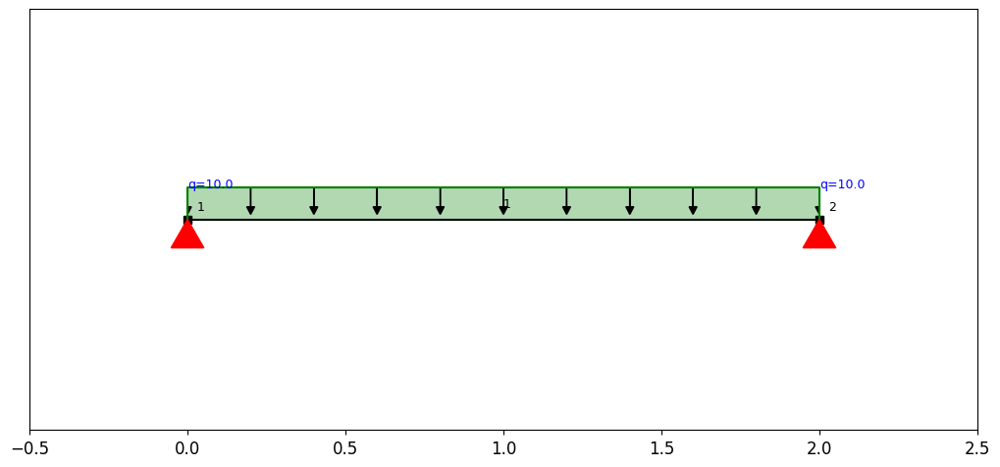

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

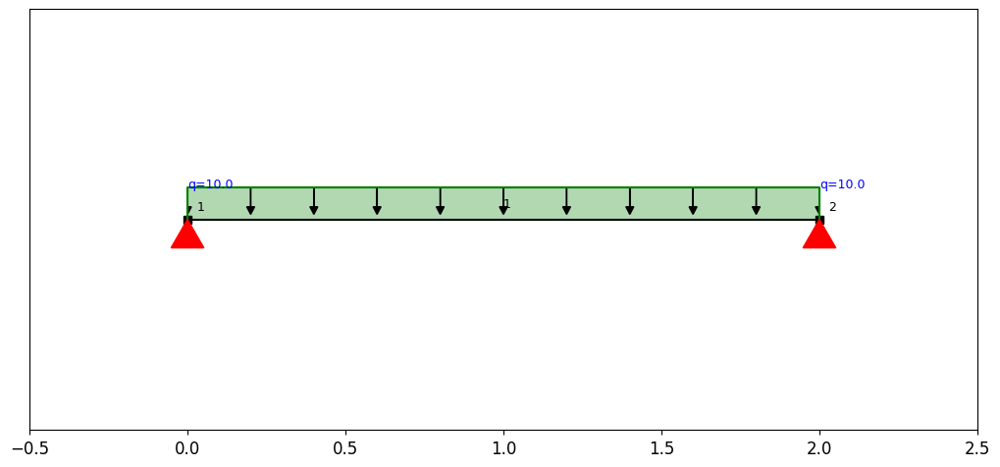

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

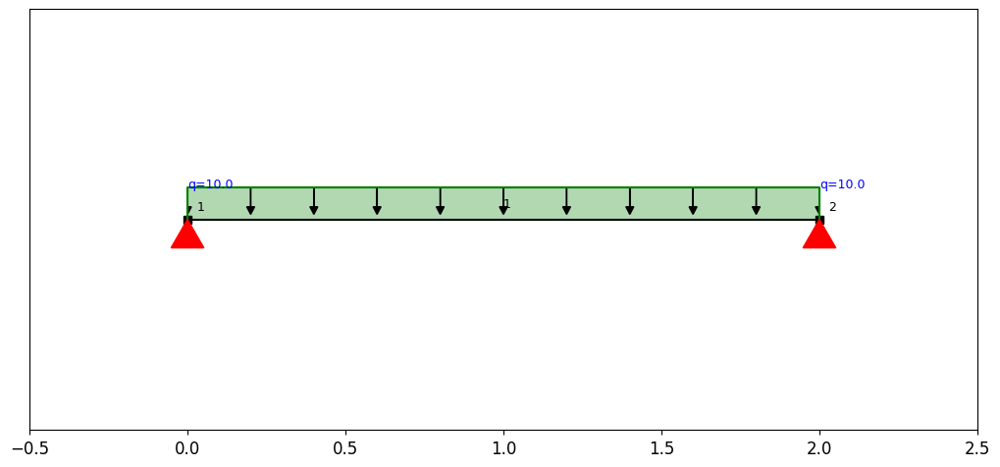

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


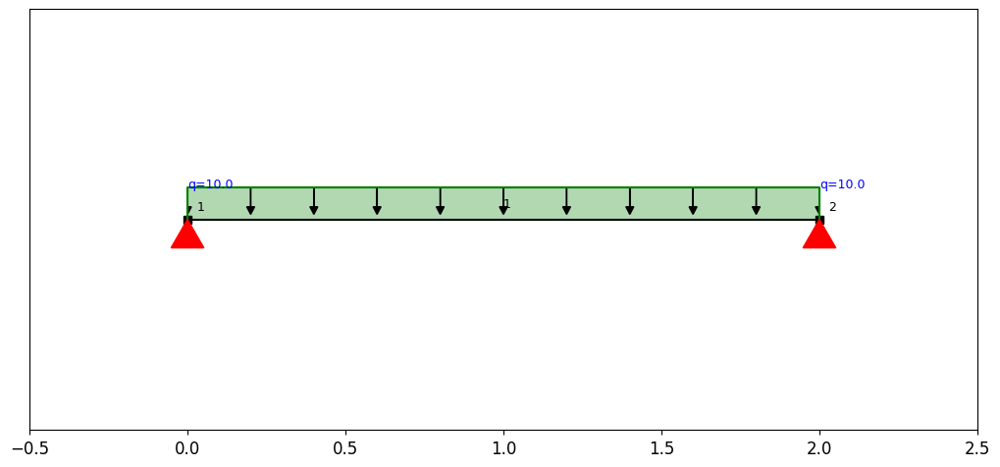

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


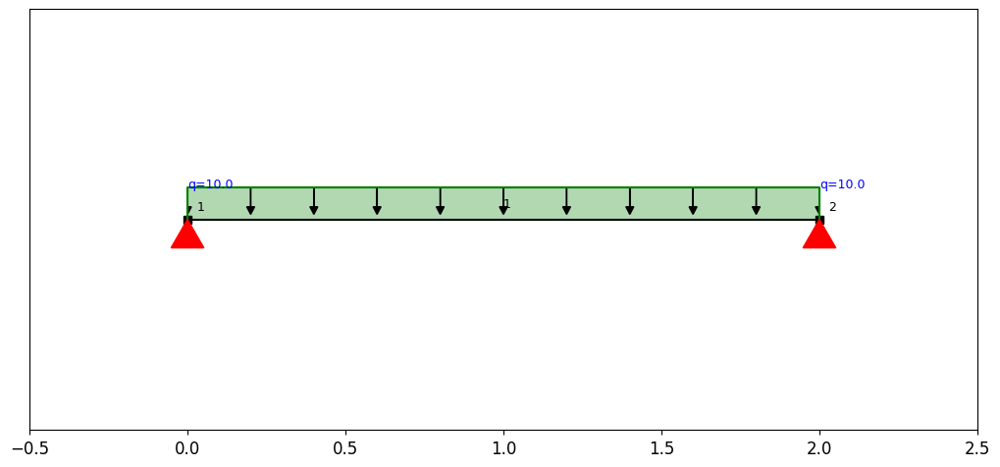

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

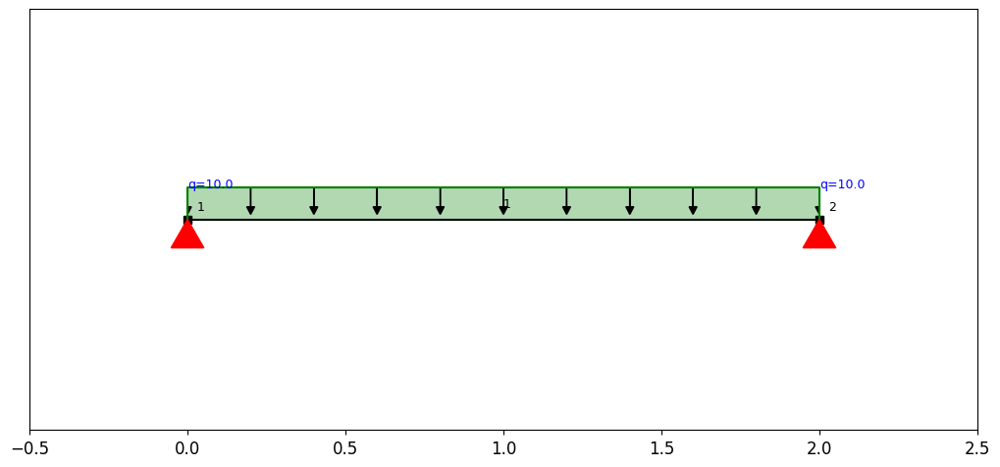

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


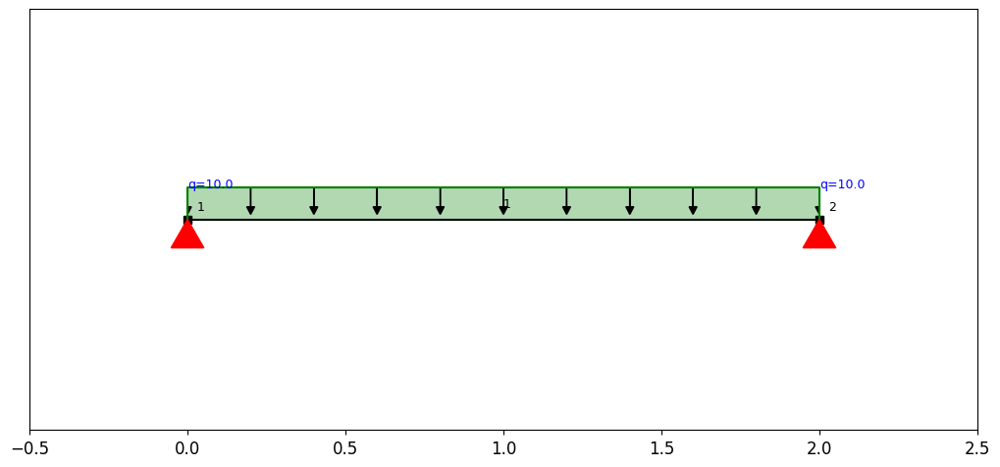

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

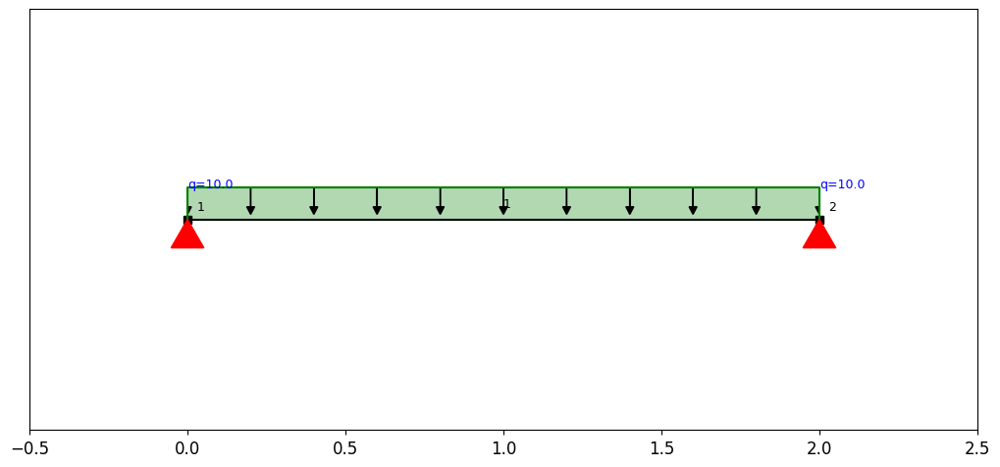

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


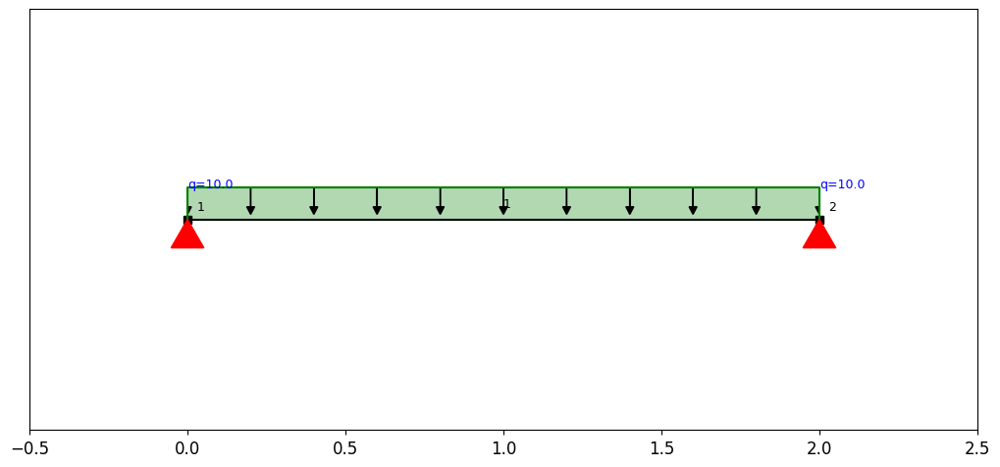

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

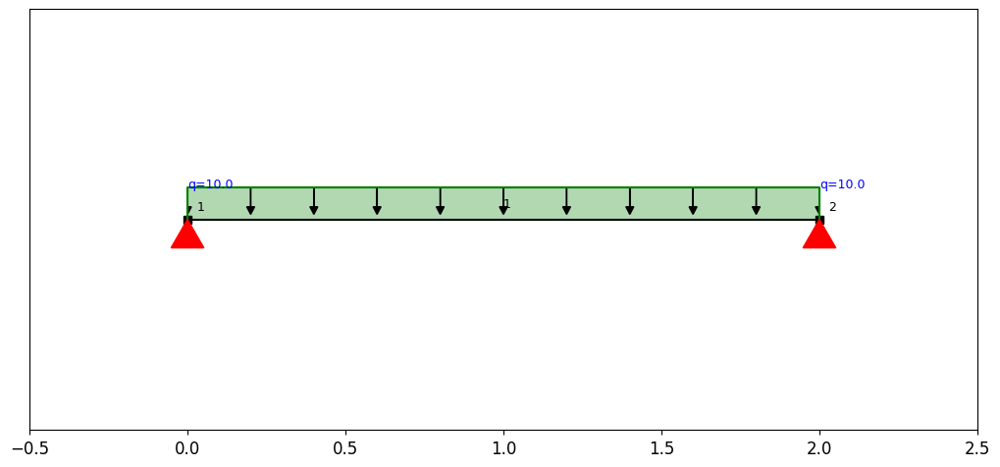

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


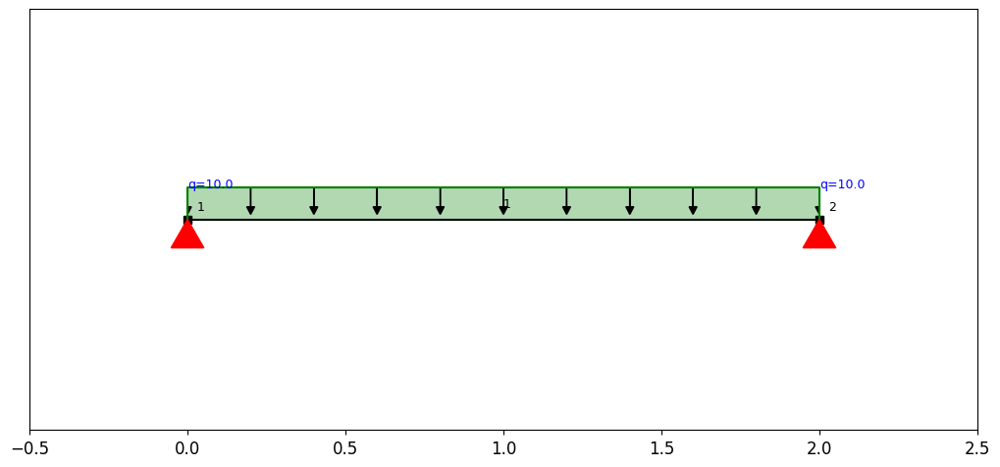

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

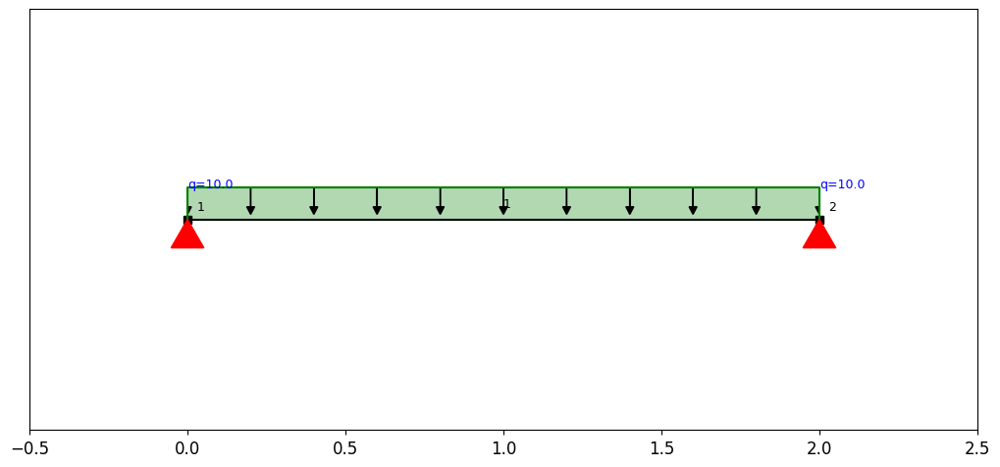

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

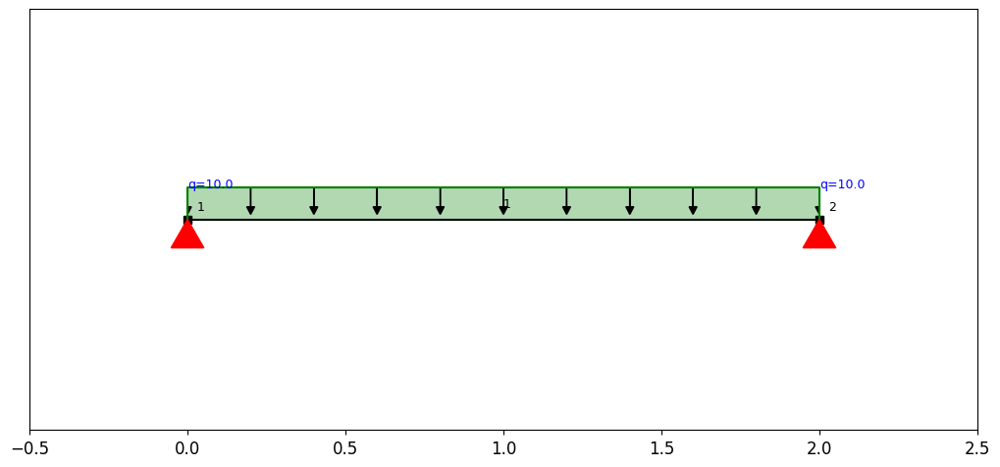

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

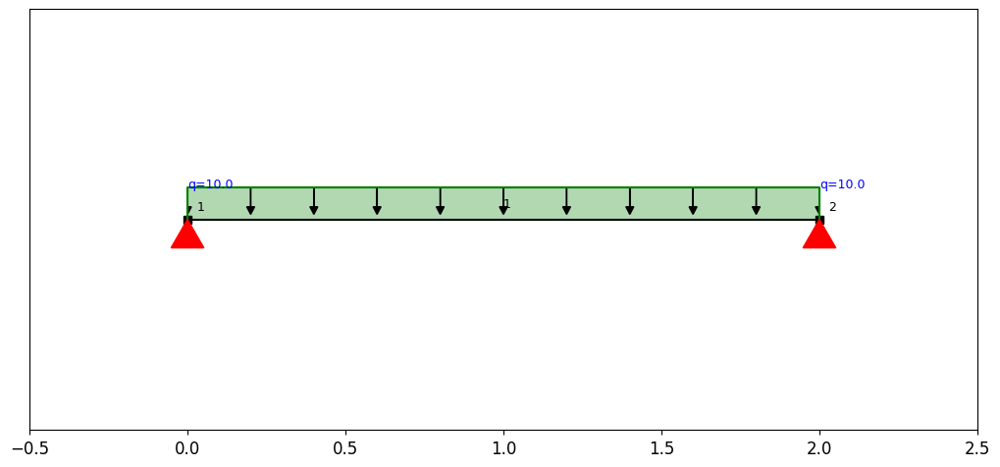

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

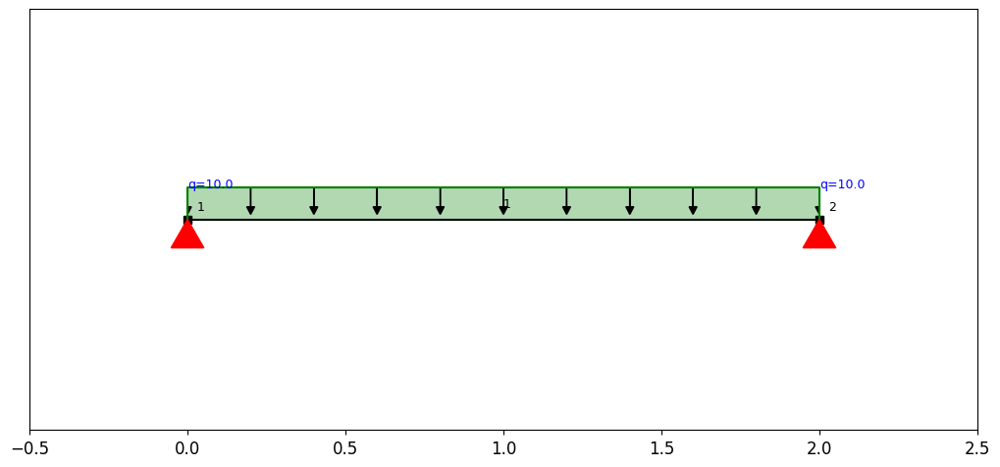

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

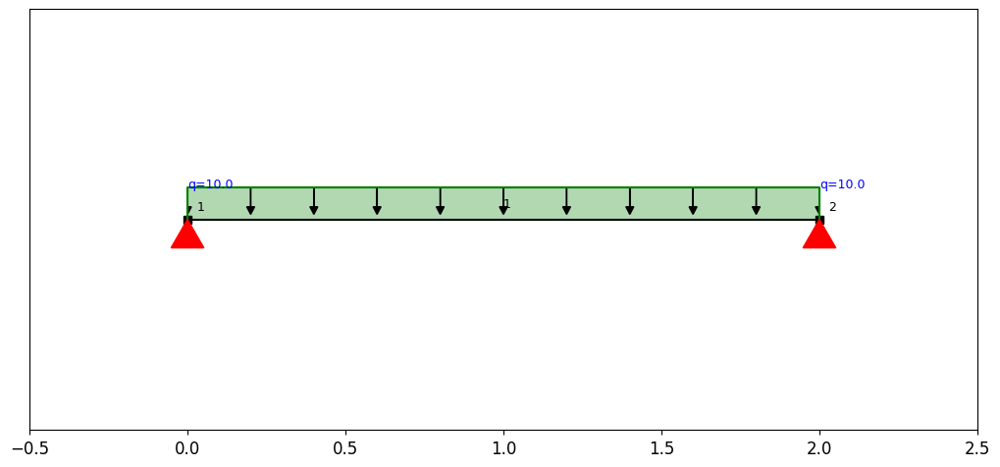

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


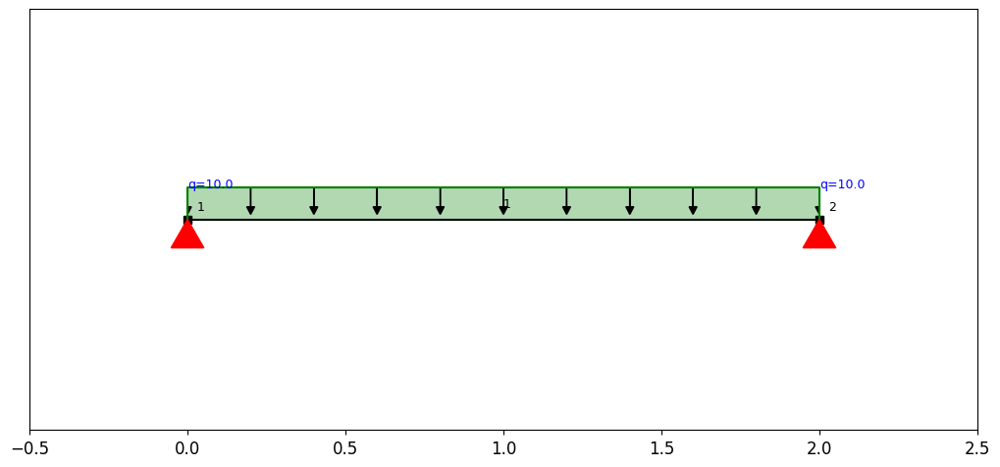

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

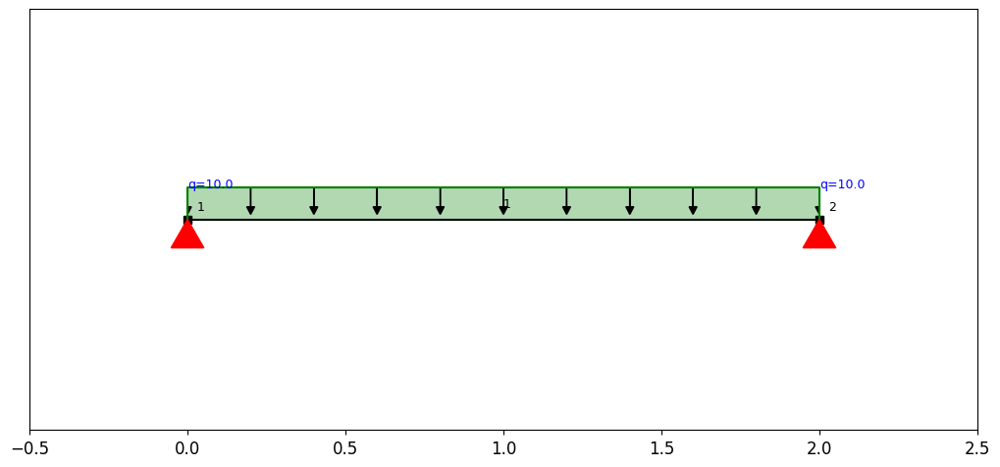

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

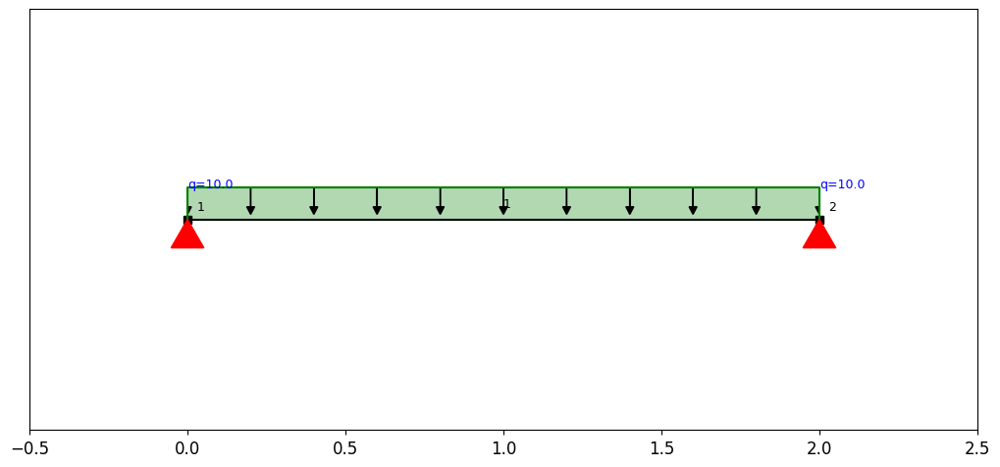

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

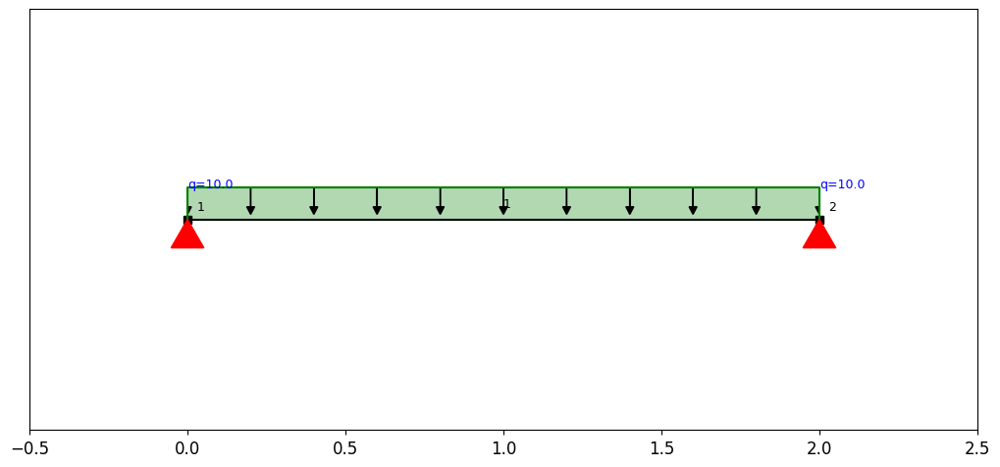

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

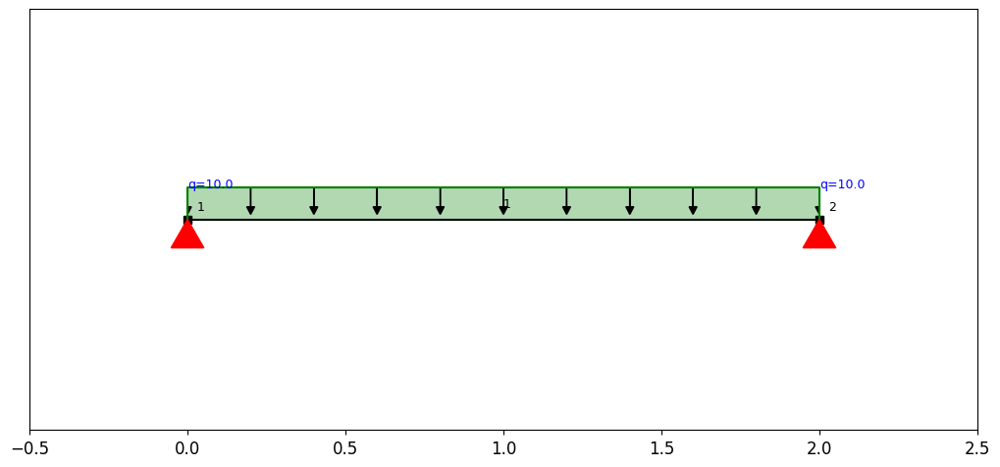

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


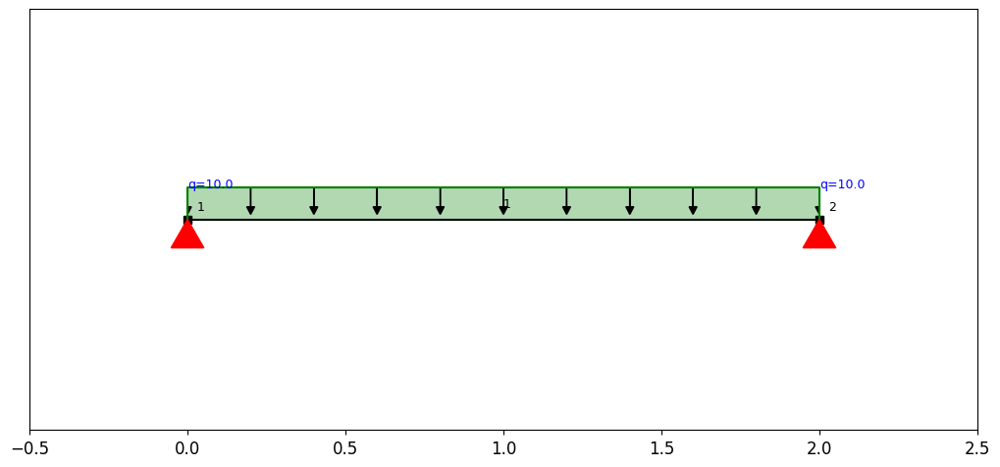

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


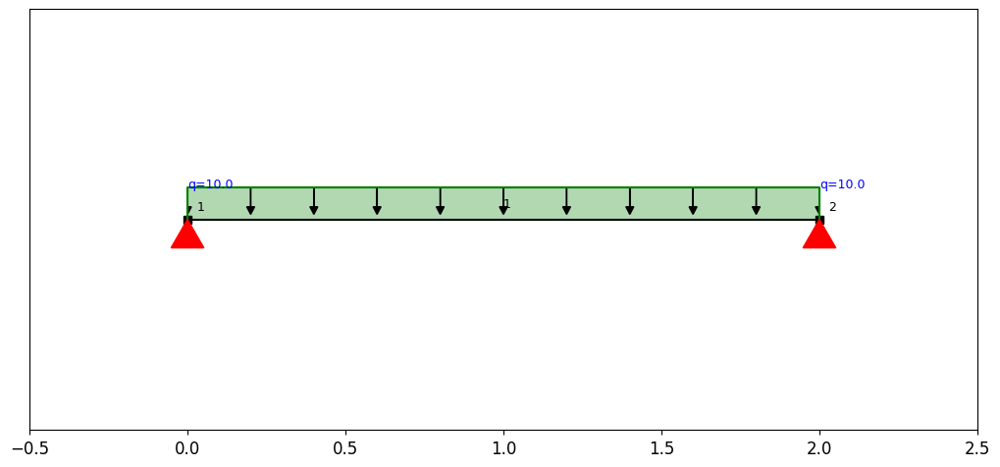

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

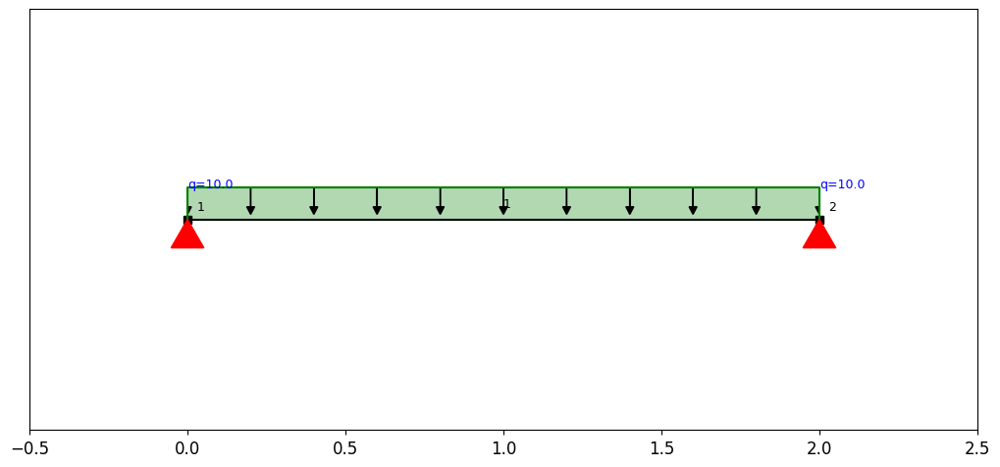

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

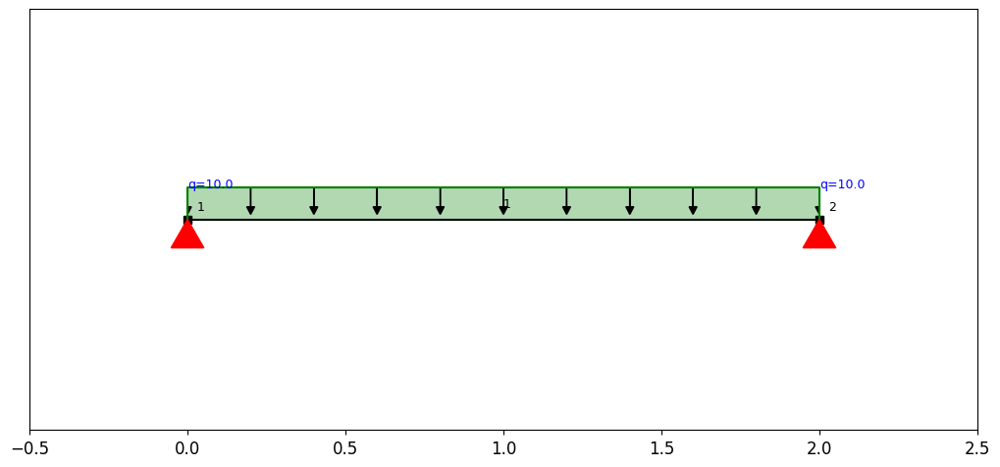

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

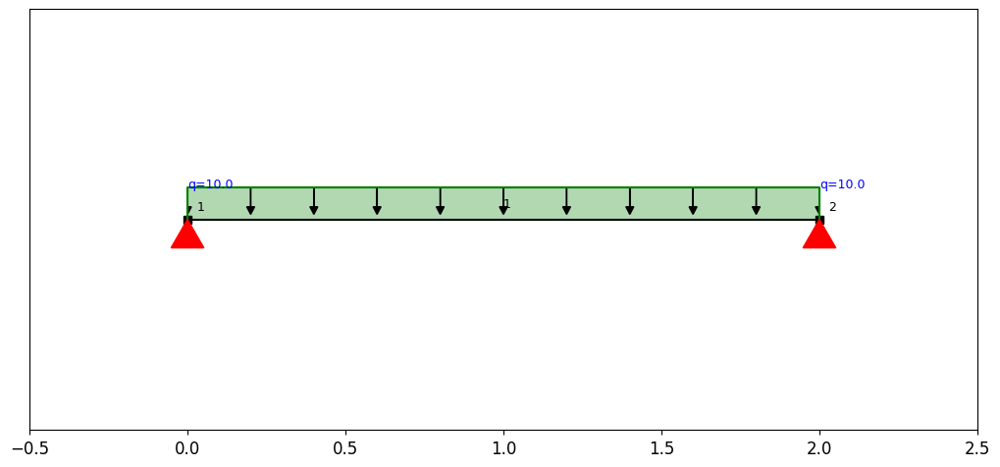

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

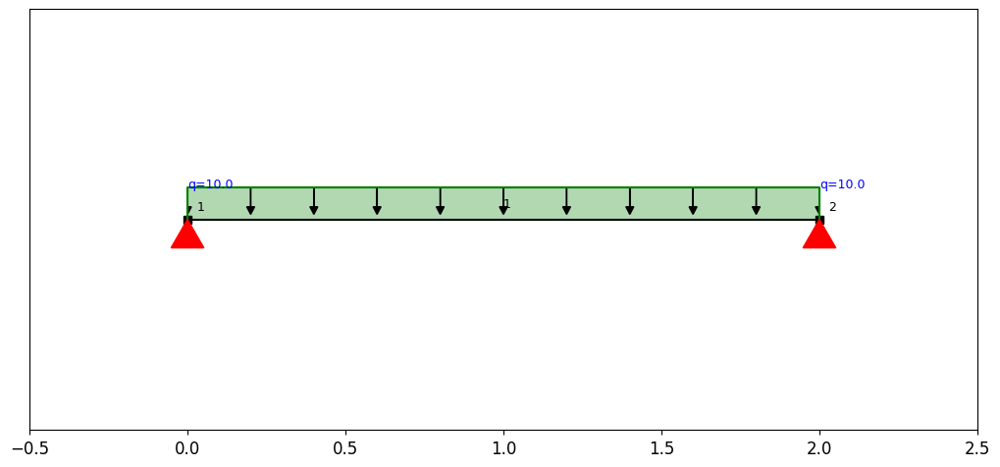

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

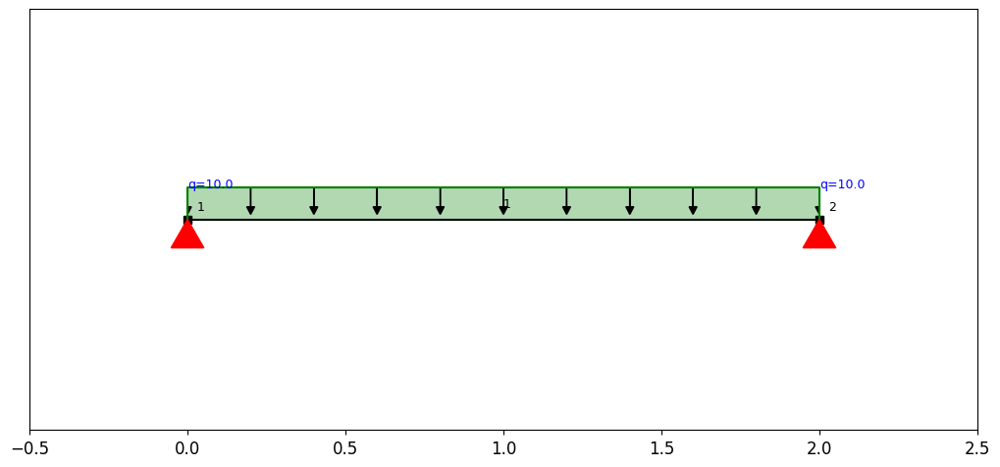

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

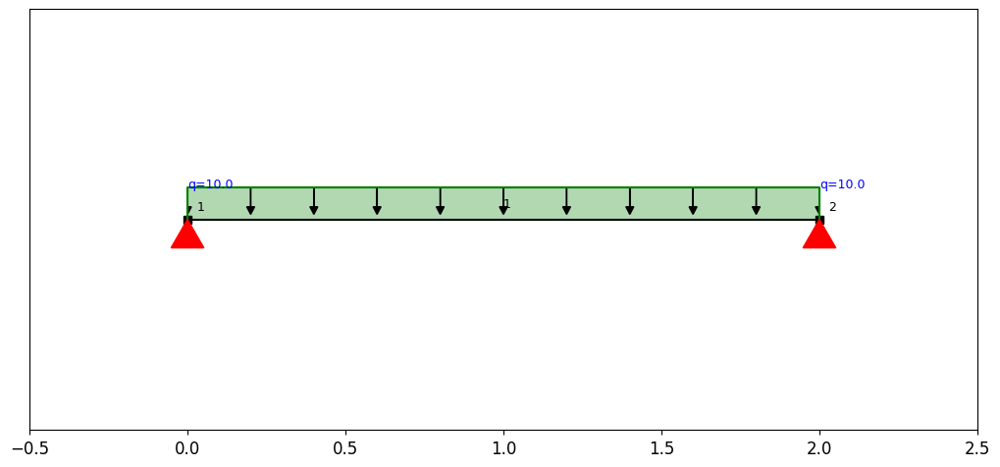

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

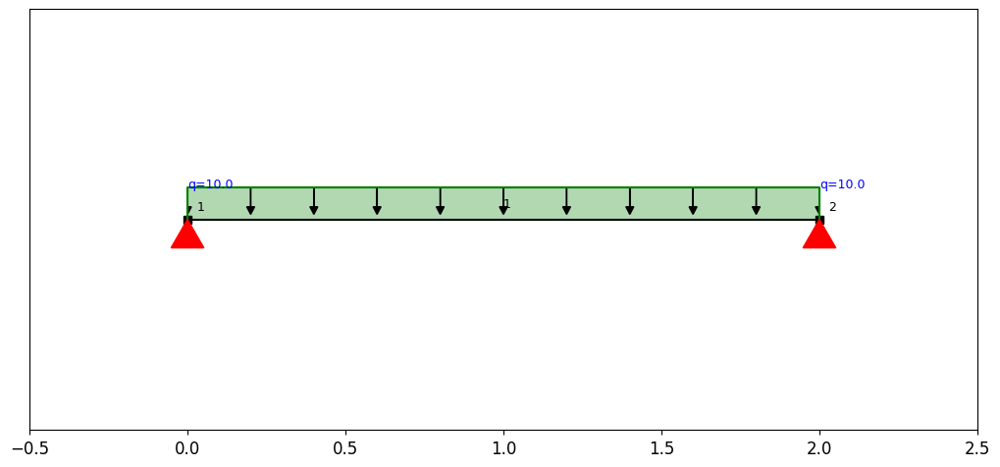

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

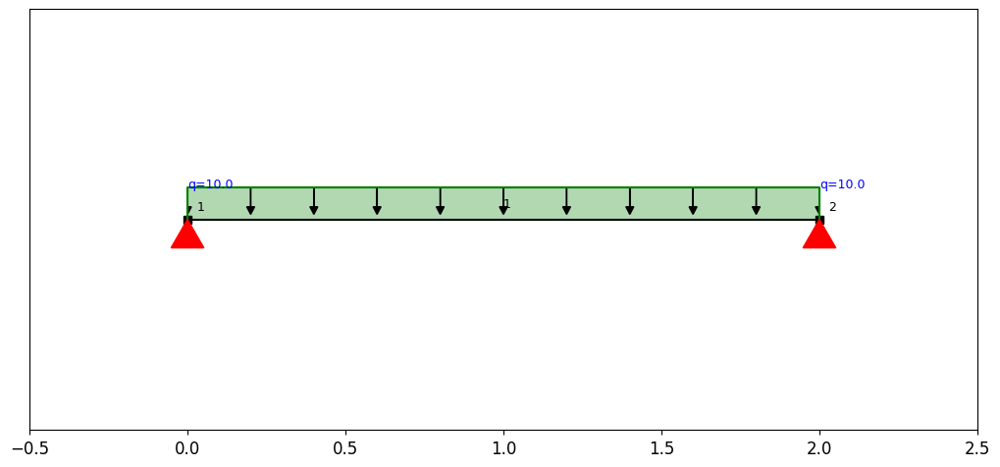

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

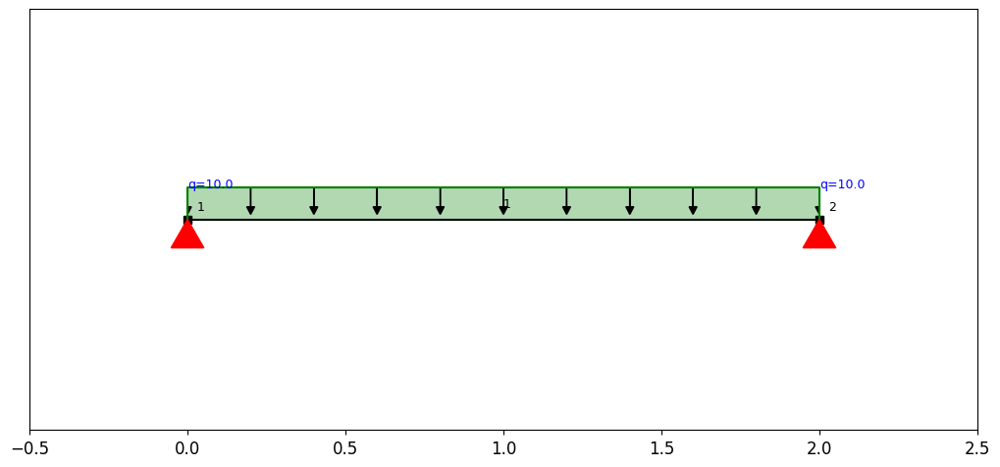

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

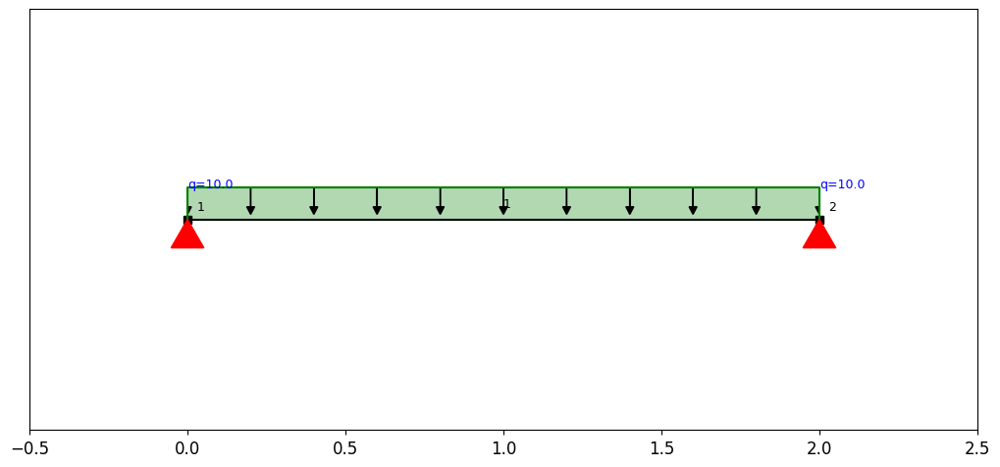

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

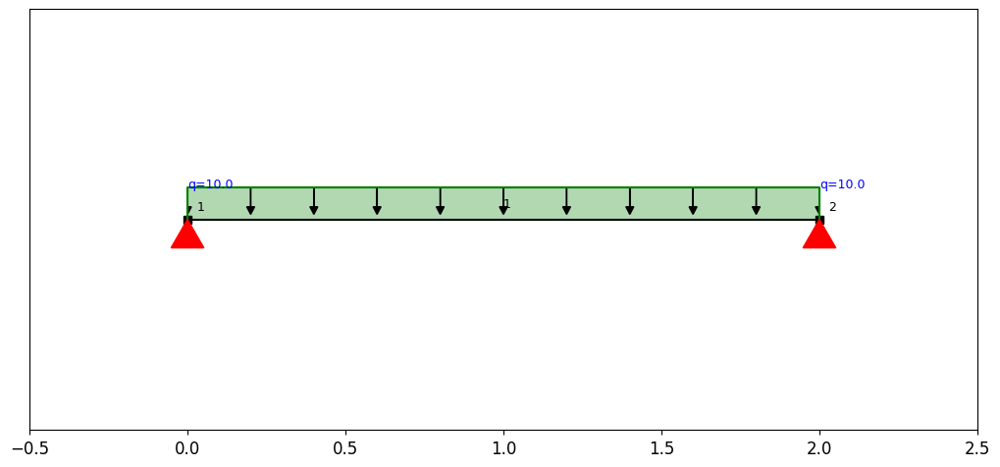

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

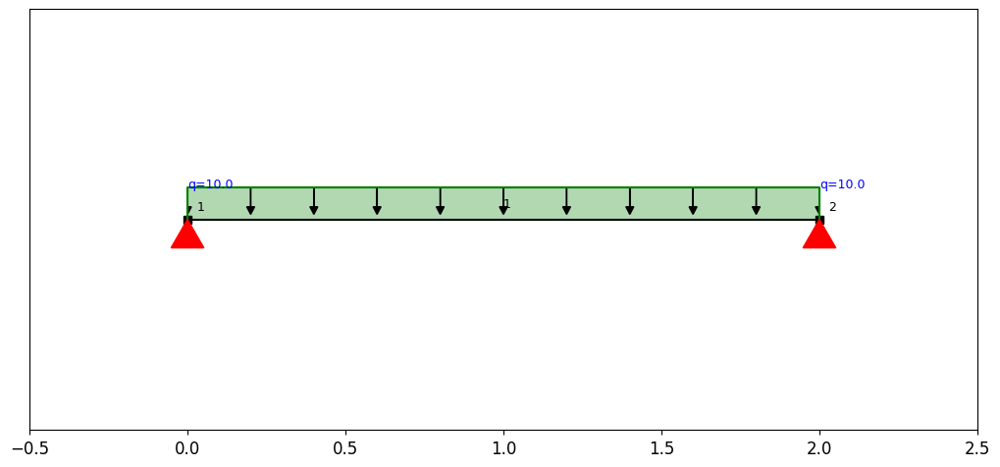

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

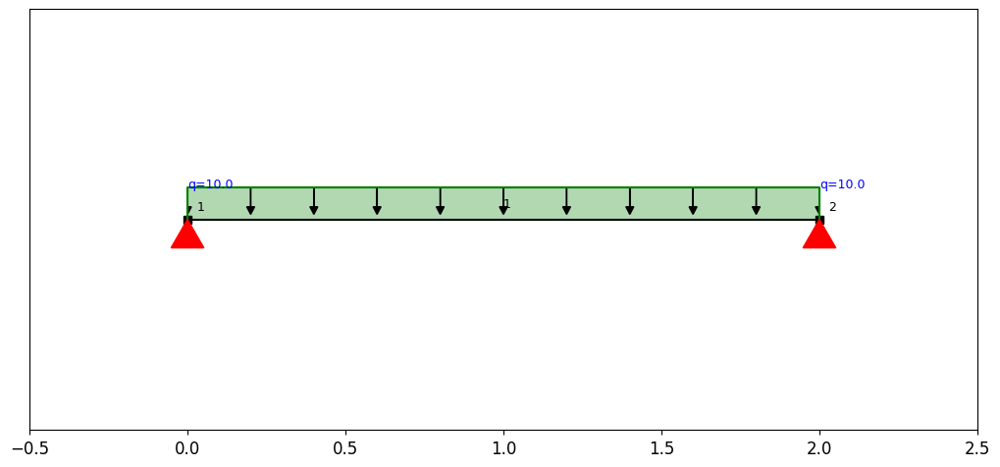

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

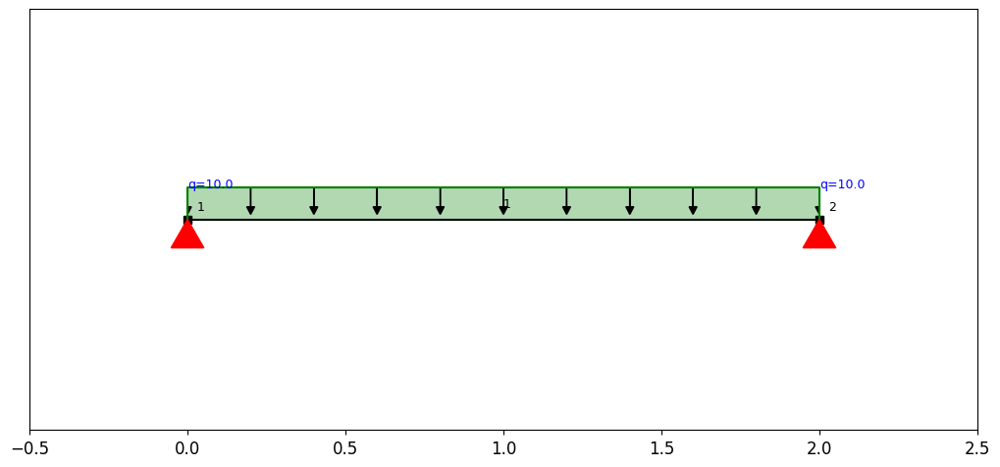

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


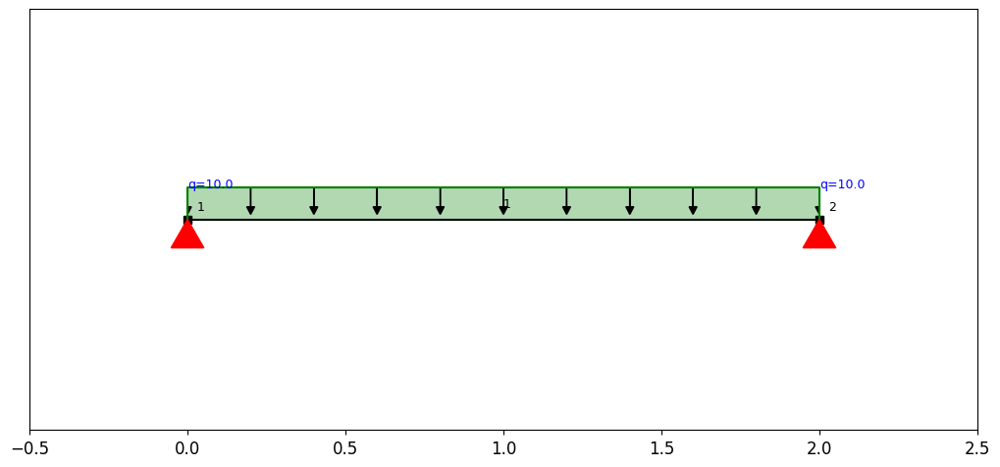

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

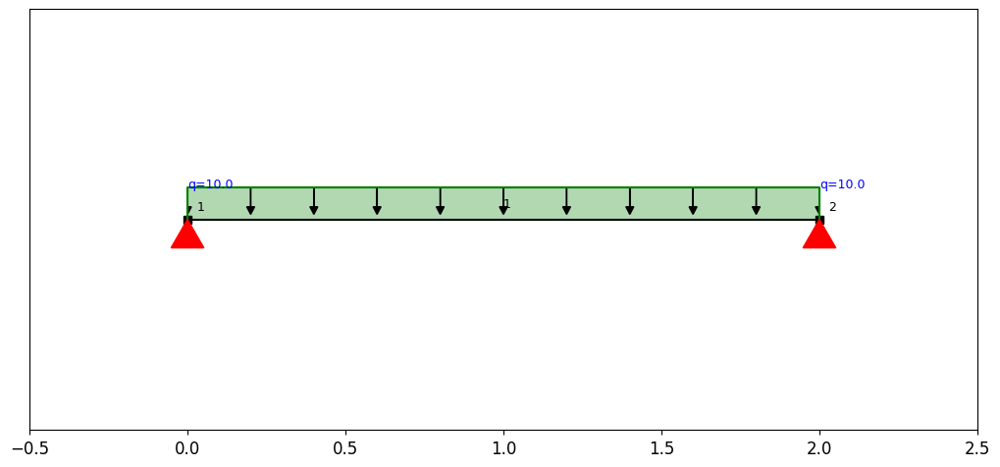

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

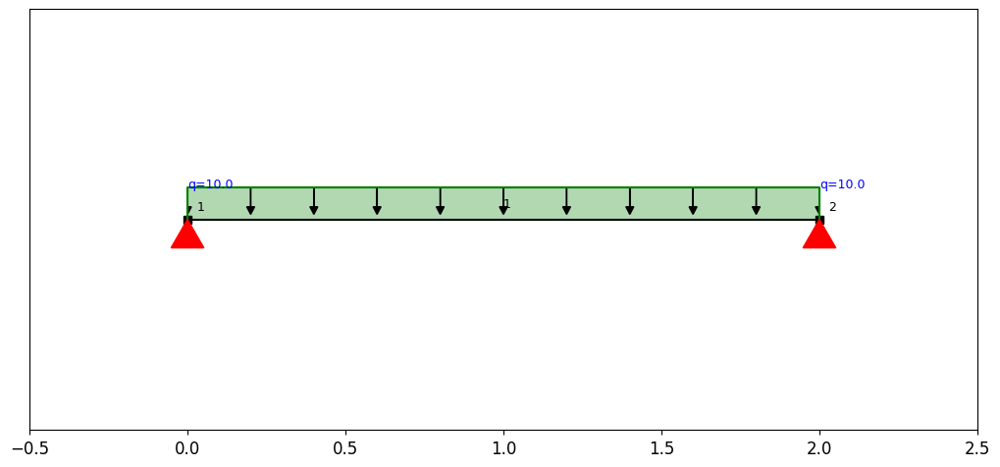

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

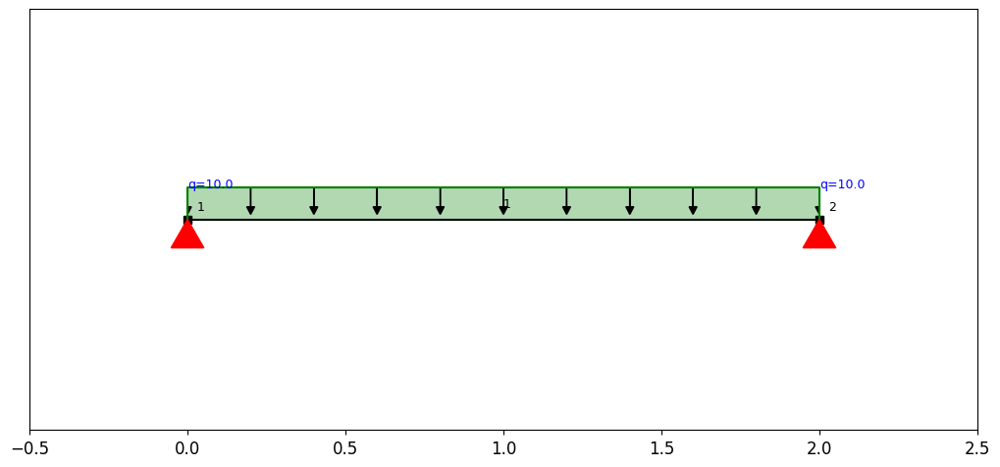

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


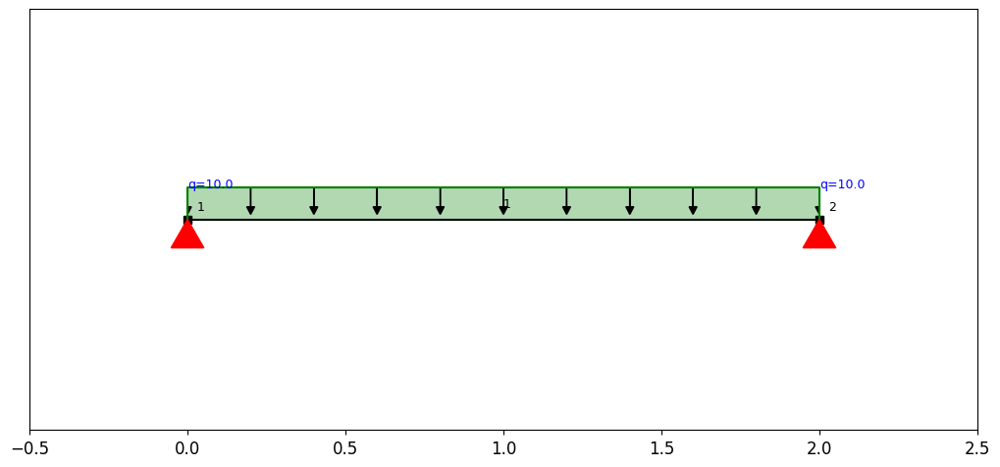

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


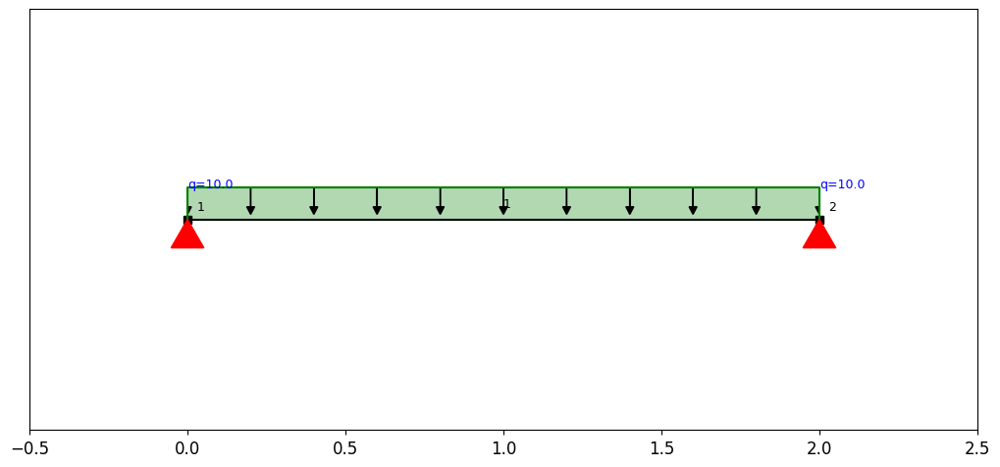

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

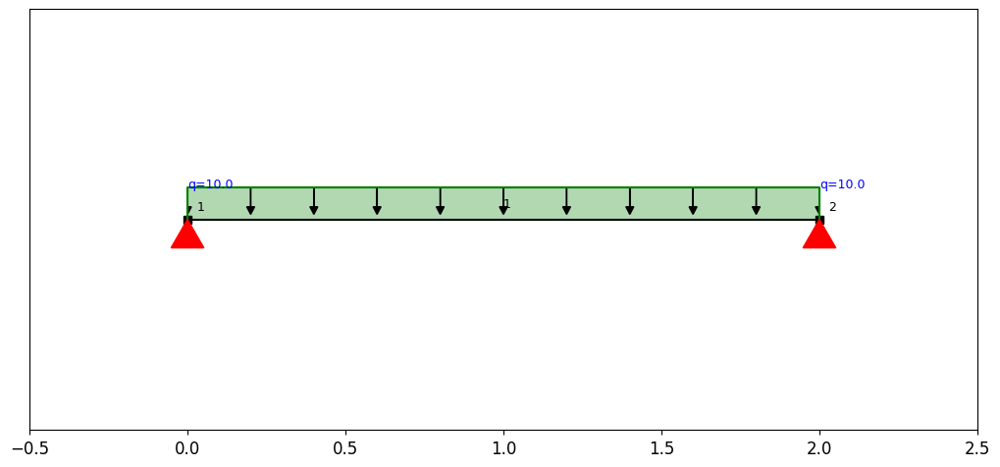

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


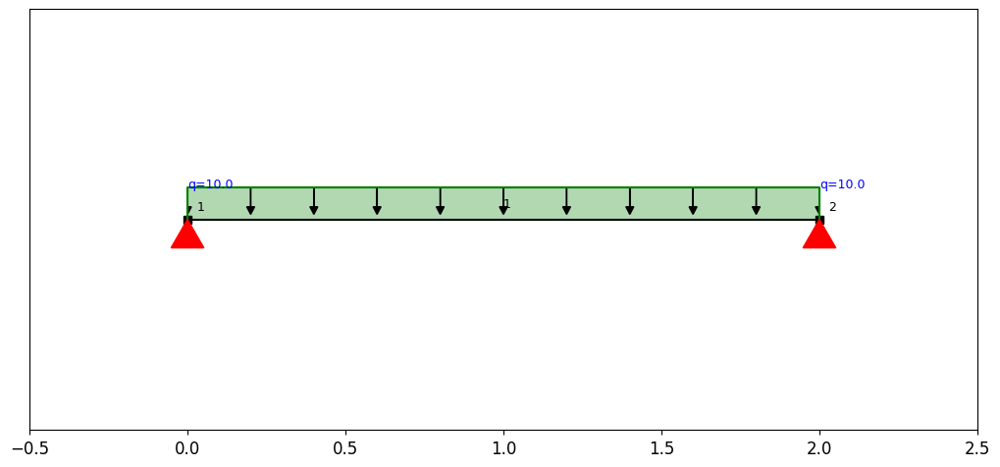

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

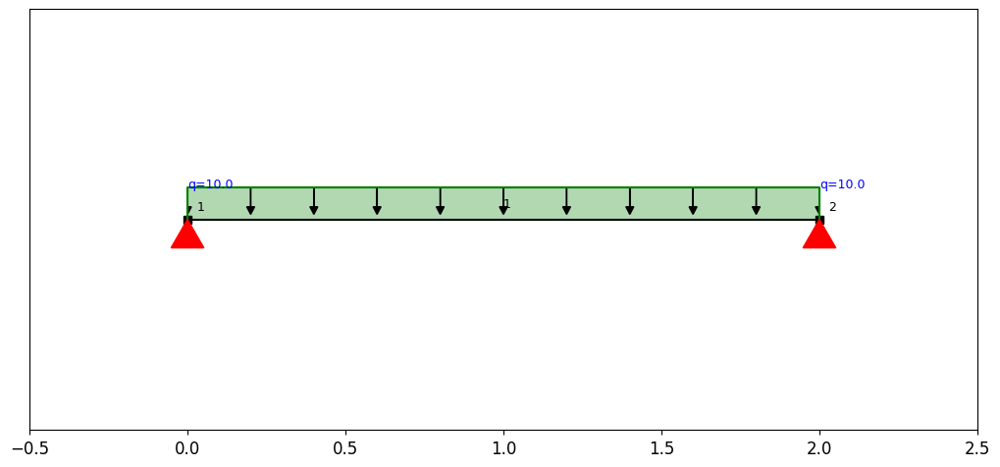

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

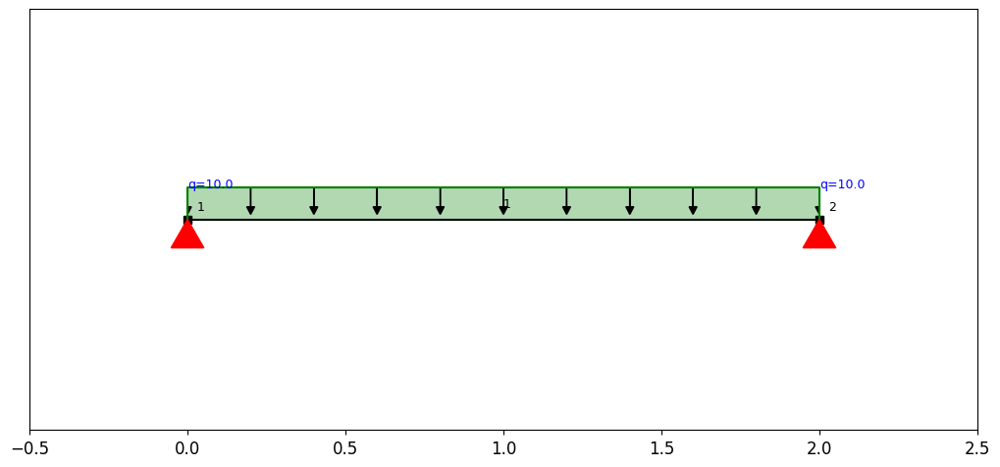

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


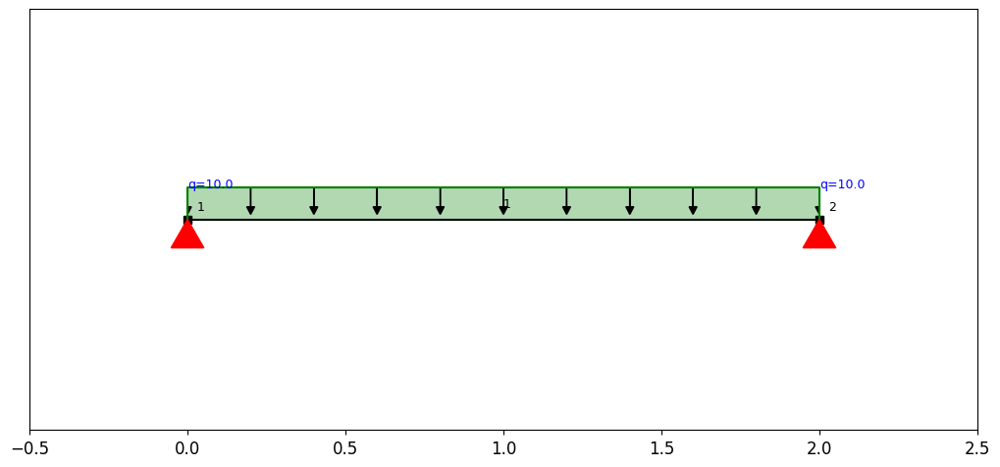

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


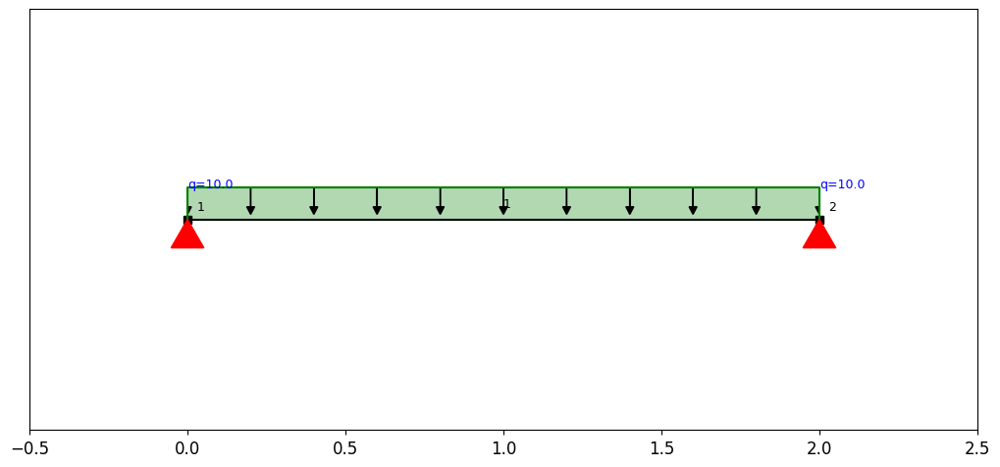

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

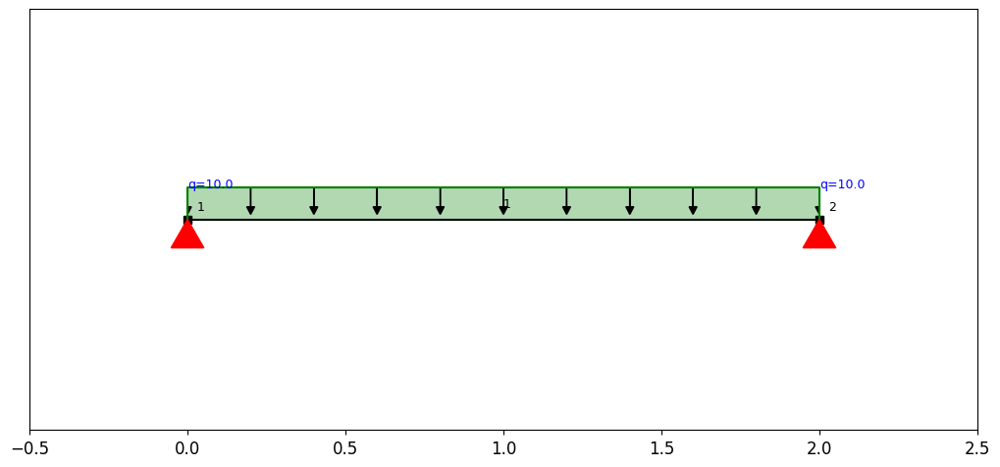

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

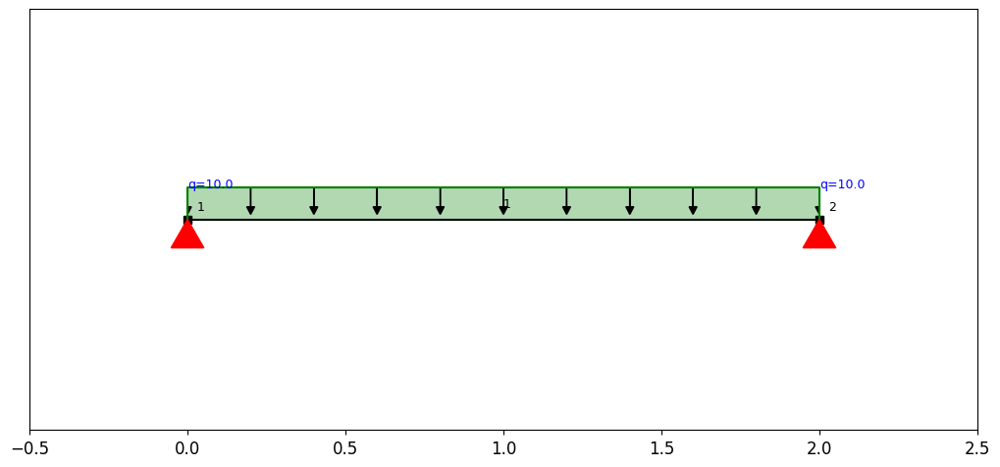

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

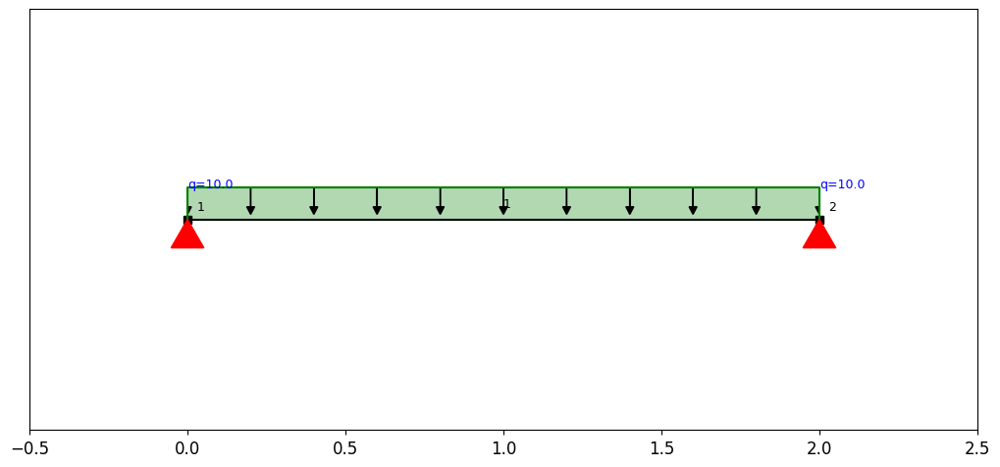

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

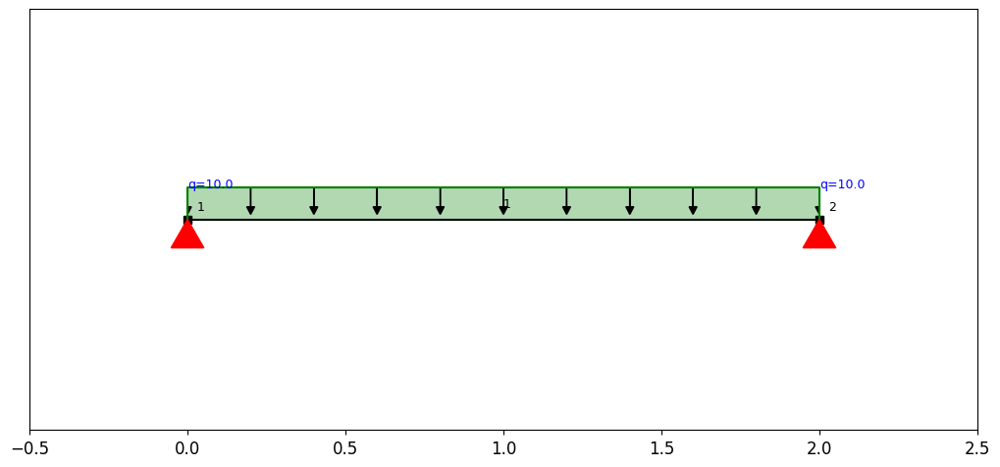

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

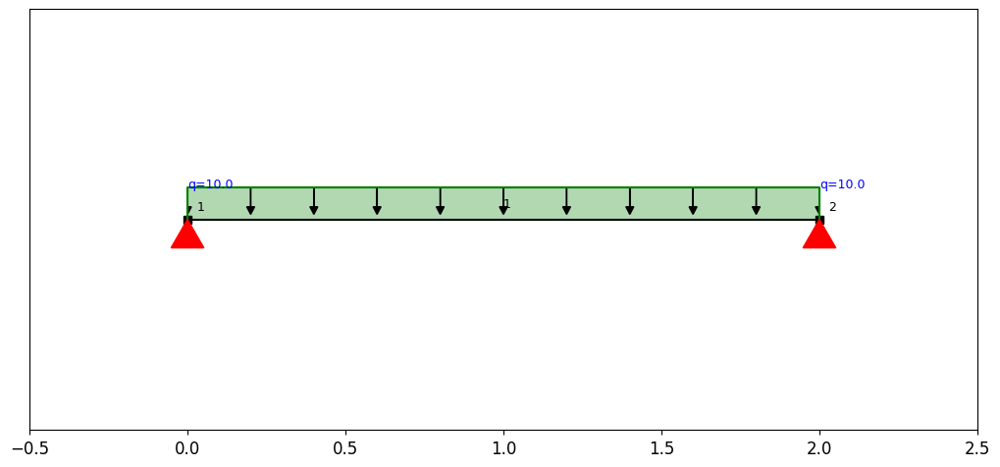

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

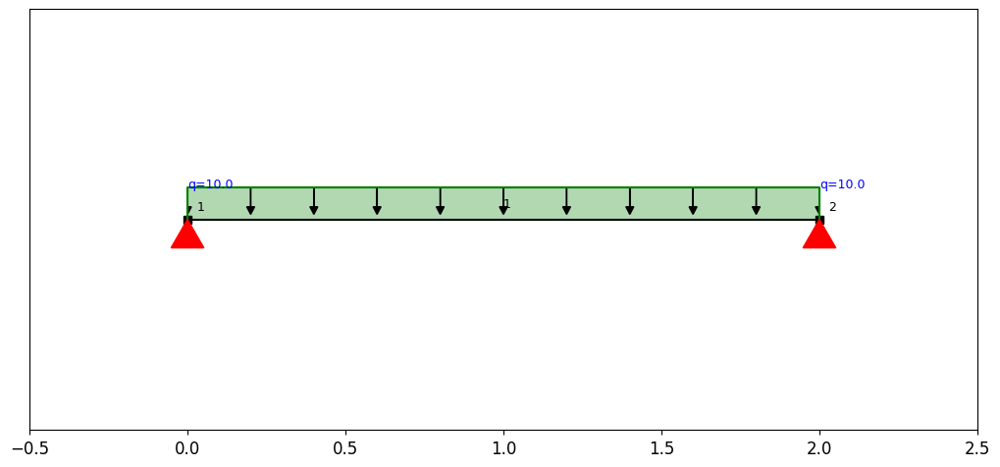

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

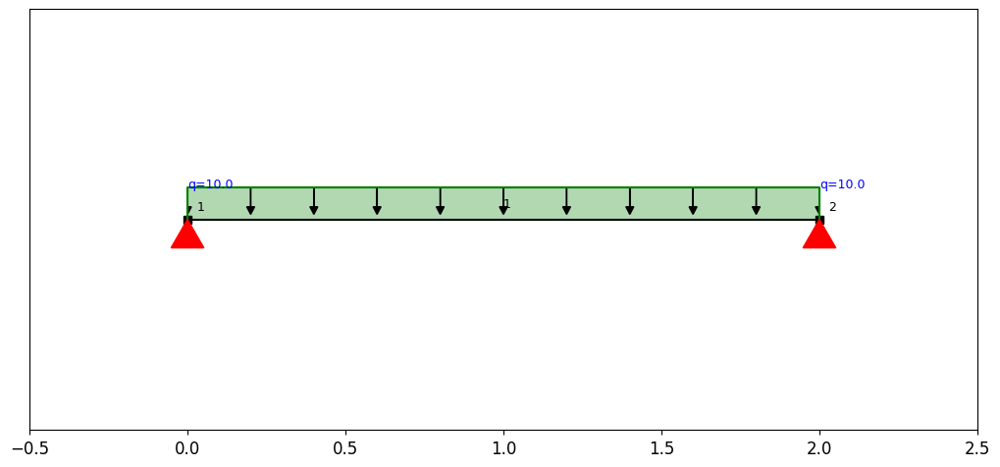

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

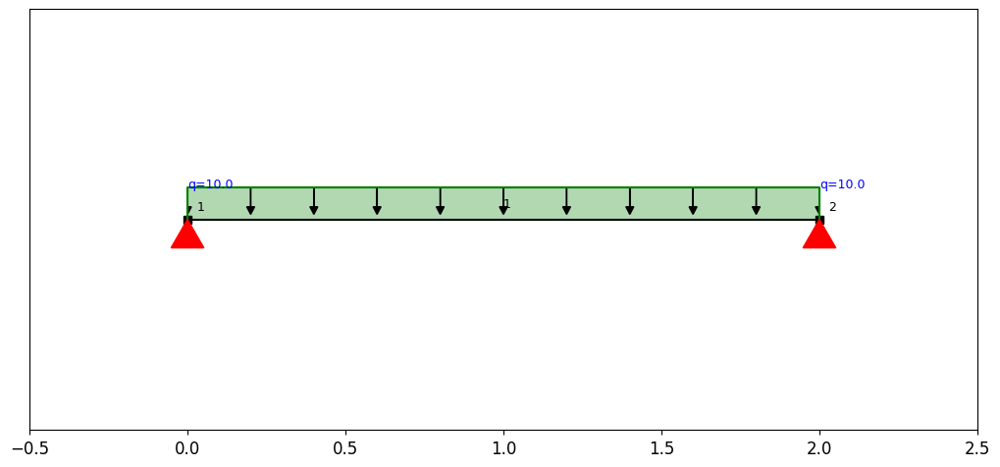

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


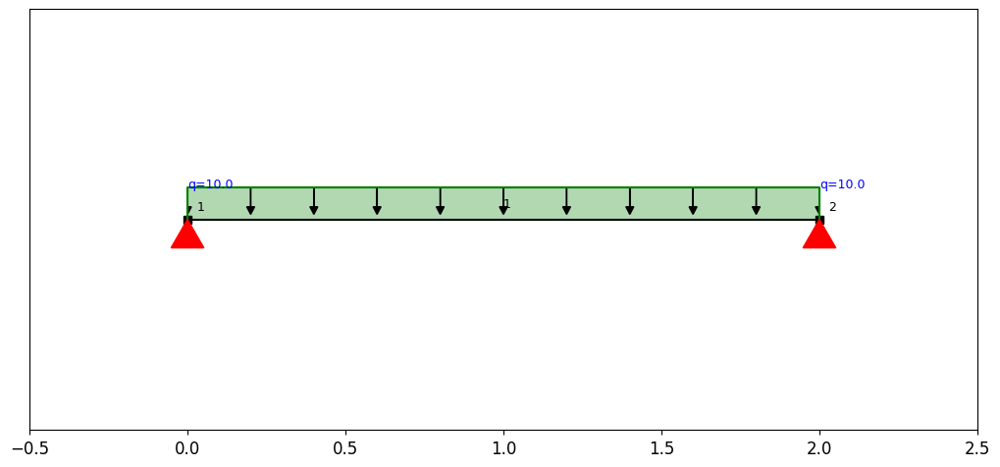

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

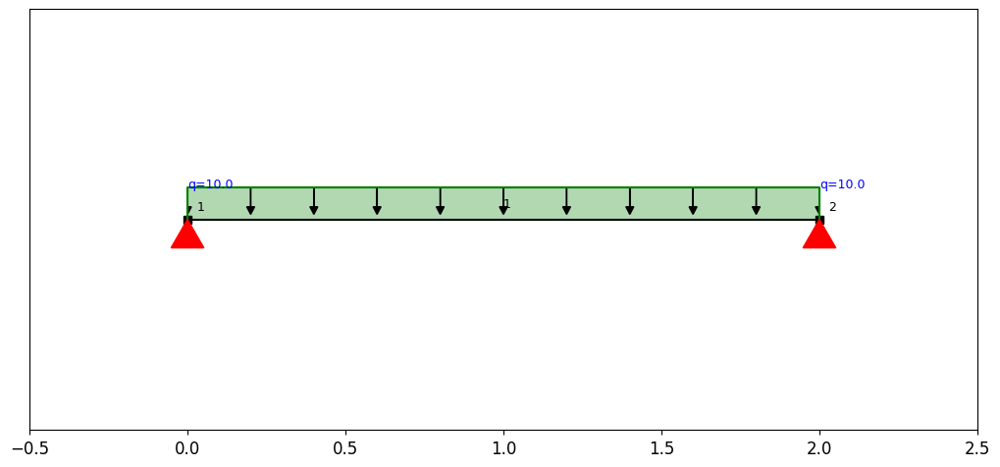

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

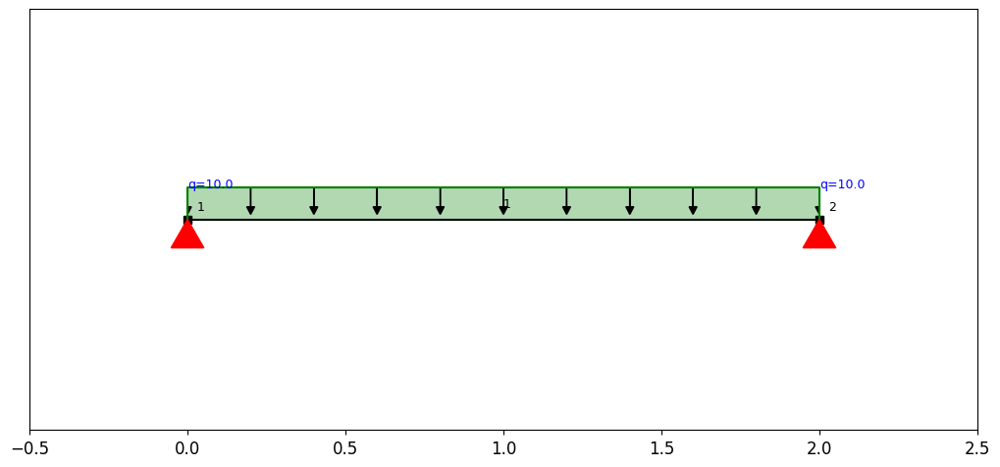

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


Beam: HE240B
Shear force: 10.85 kN
Moment: 5.42 kNm
Displacement: 0.1 mm
Shear capacity: 409.99 kN
Moment capacity: 0.23 kNm
Displacement capacity: 0.01 mm
Beam: HE240B, not suitable
Shear utilization: 2.65%
Moment utilization: 2407.65%
Displacement utilization: 1907.26%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

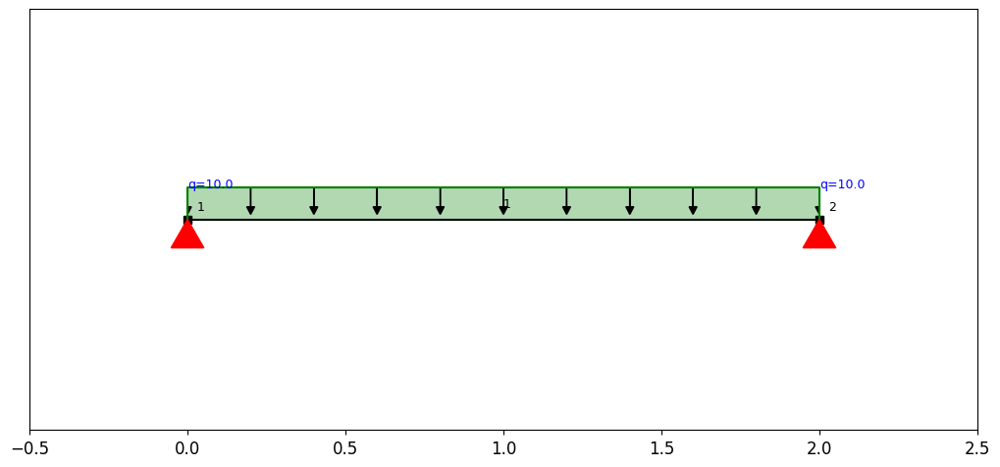

,shear,moment,reaction,displacement
0,10.95 kN,5.47 kNm,-10.95 kN,0.07 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE260B
Shear force: 10.95 kN
Moment: 5.47 kNm
Displacement: 0.07 mm
Shear capacity: 458.22 kN
Moment capacity: 0.27 kNm
Displacement capacity: 0.01 mm
Beam: HE260B, not suitable
Shear utilization: 2.39%
Moment utilization: 1997.67%
Displacement utilization: 1452.63%


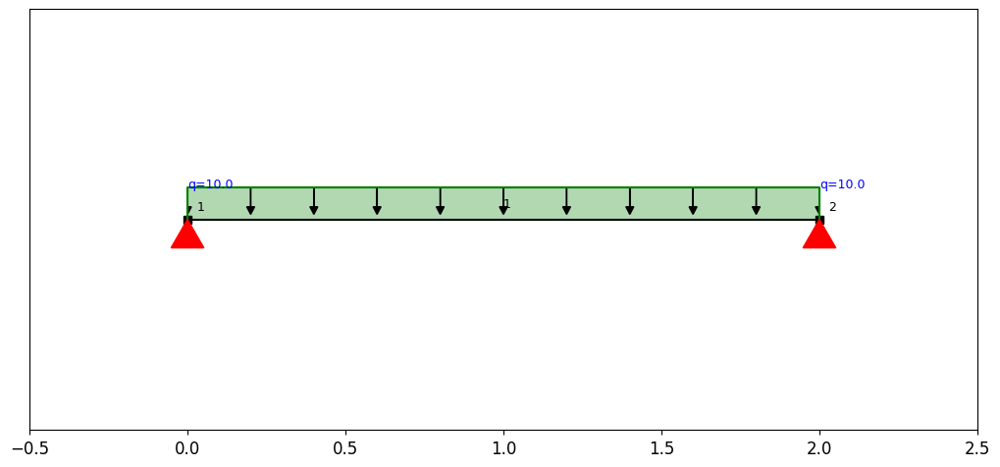

,shear,moment,reaction,displacement
0,11.05 kN,5.52 kNm,-11.05 kN,0.06 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE280B
Shear force: 11.05 kN
Moment: 5.52 kNm
Displacement: 0.06 mm
Shear capacity: 502.38 kN
Moment capacity: 0.33 kNm
Displacement capacity: 0.01 mm
Beam: HE280B, not suitable
Shear utilization: 2.2%
Moment utilization: 1685.03%
Displacement utilization: 1135.18%


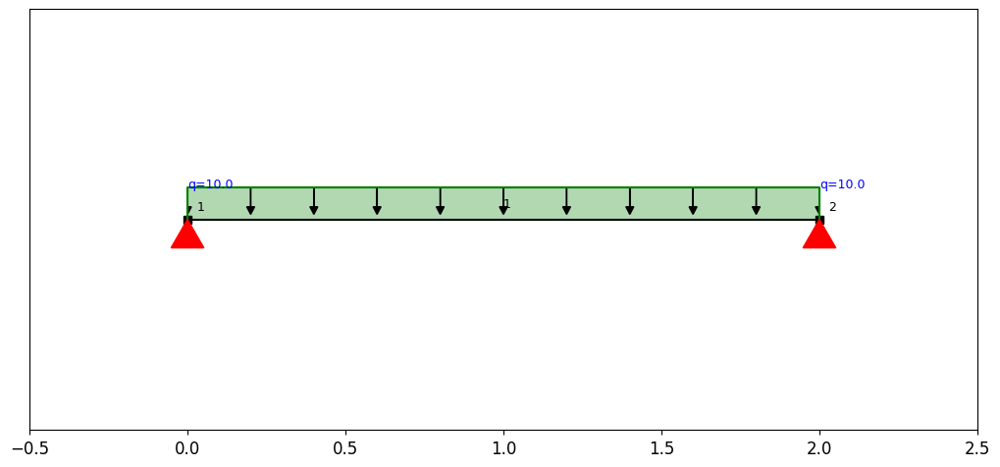

,shear,moment,reaction,displacement
0,11.19 kN,5.59 kNm,-11.19 kN,0.04 mm


Beam: HE300B
Shear force: 11.19 kN
Moment: 5.59 kNm
Displacement: 0.04 mm
Shear capacity: 584.03 kN
Moment capacity: 0.4 kNm
Displacement capacity: 0.01 mm
Beam: HE300B, not suitable
Shear utilization: 1.92%
Moment utilization: 1401.6%
Displacement utilization: 880.3%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

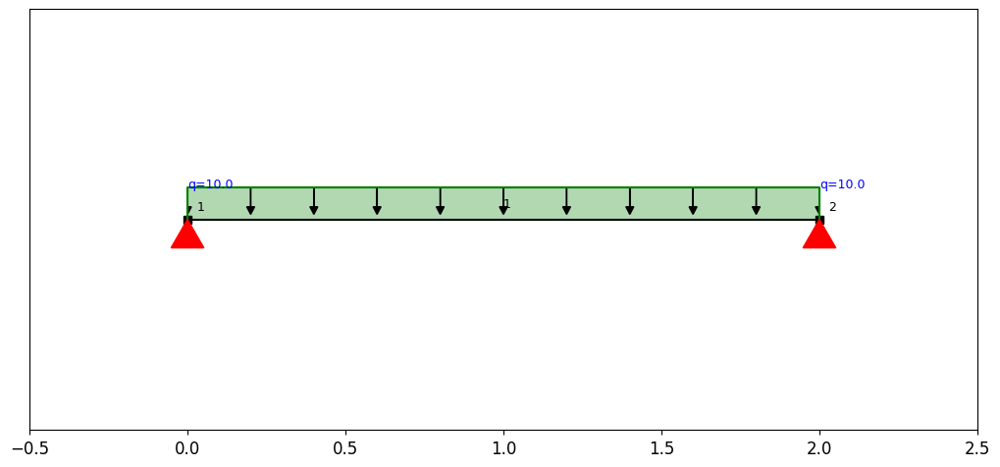

,shear,moment,reaction,displacement
0,11.29 kN,5.64 kNm,-11.29 kN,0.04 mm


Beam: HE320B
Shear force: 11.29 kN
Moment: 5.64 kNm
Displacement: 0.04 mm
Shear capacity: 634.32 kN
Moment capacity: 0.46 kNm
Displacement capacity: 0.01 mm
Beam: HE320B, not suitable
Shear utilization: 1.78%
Moment utilization: 1234.58%
Displacement utilization: 725.46%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

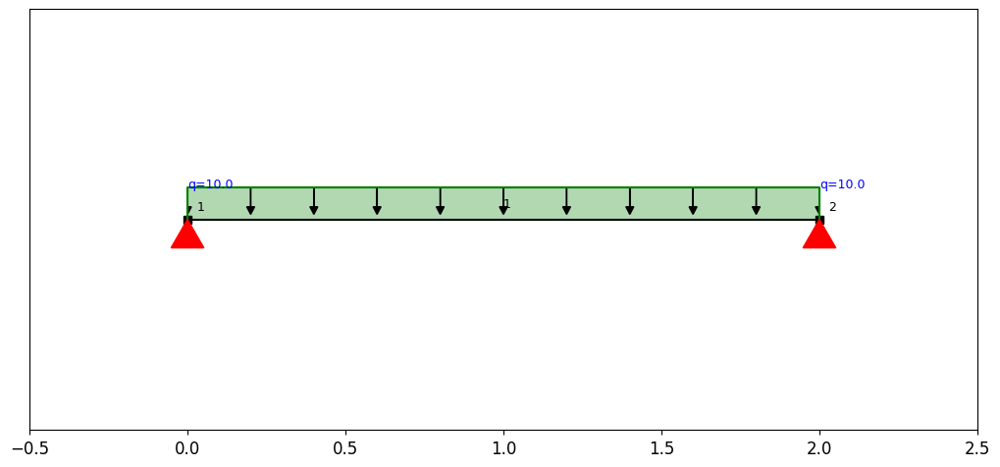

,shear,moment,reaction,displacement
0,11.36 kN,5.68 kNm,-11.36 kN,0.03 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE340B
Shear force: 11.36 kN
Moment: 5.68 kNm
Displacement: 0.03 mm
Shear capacity: 693.06 kN
Moment capacity: 0.51 kNm
Displacement capacity: 0.01 mm
Beam: HE340B, not suitable
Shear utilization: 1.64%
Moment utilization: 1107.78%
Displacement utilization: 613.75%


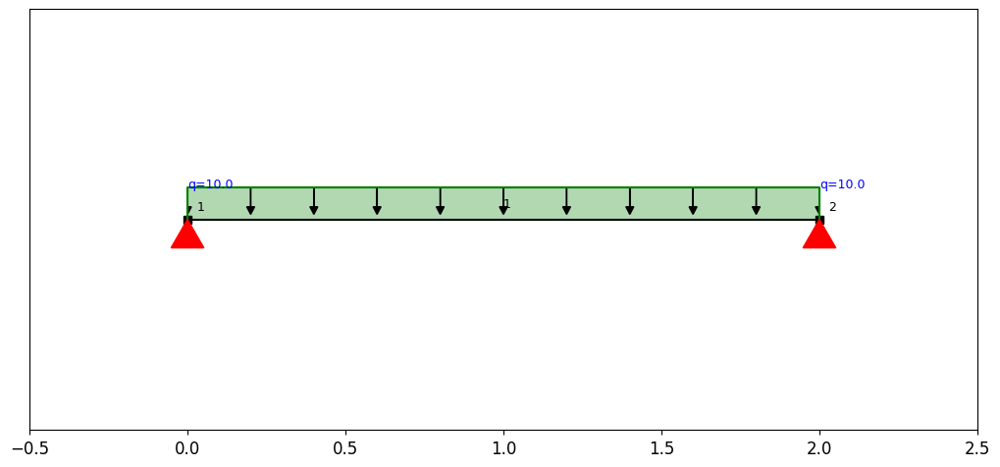

,shear,moment,reaction,displacement
0,11.45 kN,5.72 kNm,-11.45 kN,0.03 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE360B
Shear force: 11.45 kN
Moment: 5.72 kNm
Displacement: 0.03 mm
Shear capacity: 751.93 kN
Moment capacity: 0.57 kNm
Displacement capacity: 0.01 mm
Beam: HE360B, not suitable
Shear utilization: 1.52%
Moment utilization: 999.16%
Displacement utilization: 524.69%


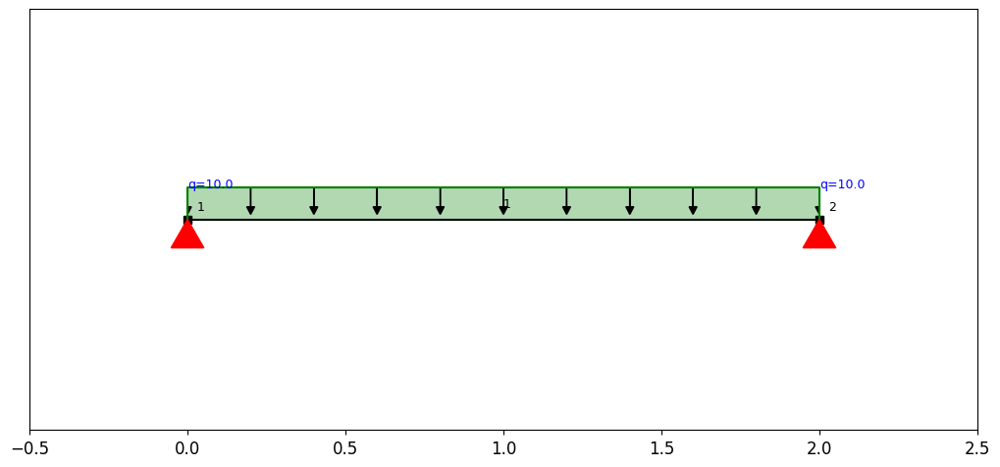

,shear,moment,reaction,displacement
0,11.58 kN,5.79 kNm,-11.58 kN,0.02 mm


Beam: HE400B
Shear force: 11.58 kN
Moment: 5.79 kNm
Displacement: 0.02 mm
Shear capacity: 865.87 kN
Moment capacity: 0.69 kNm
Displacement capacity: 0.01 mm
Beam: HE400B, not suitable
Shear utilization: 1.34%
Moment utilization: 836.02%
Displacement utilization: 397.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

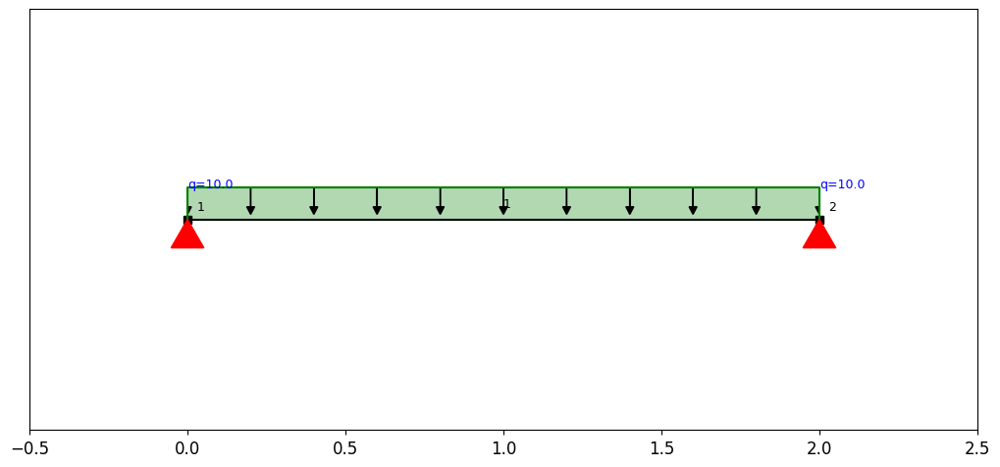

,shear,moment,reaction,displacement
0,11.74 kN,5.87 kNm,-11.74 kN,0.01 mm


Beam: HE450B
Shear force: 11.74 kN
Moment: 5.87 kNm
Displacement: 0.01 mm
Shear capacity: 982.8 kN
Moment capacity: 0.85 kNm
Displacement capacity: 0.01 mm
Beam: HE450B, not suitable
Shear utilization: 1.19%
Moment utilization: 690.16%
Displacement utilization: 290.97%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

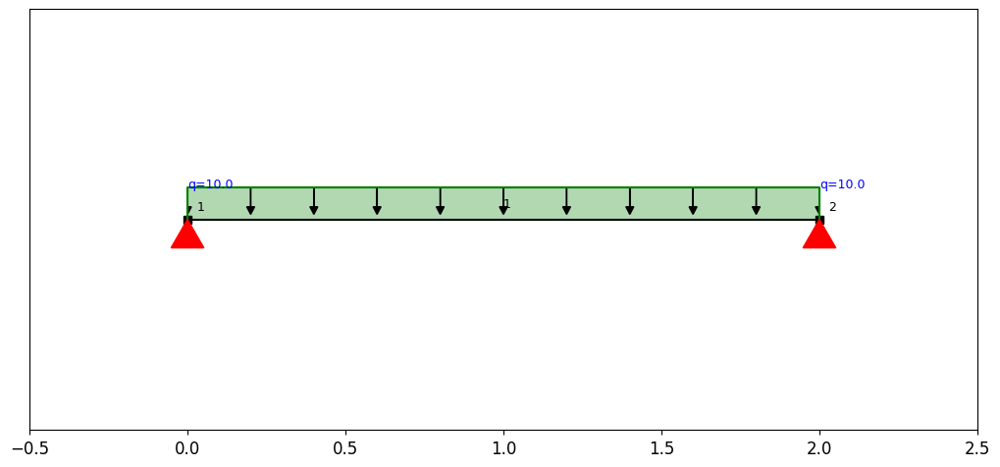

,shear,moment,reaction,displacement
0,11.9 kN,5.95 kNm,-11.9 kN,0.01 mm


Beam: HE500B
Shear force: 11.9 kN
Moment: 5.95 kNm
Displacement: 0.01 mm
Shear capacity: 1112.31 kN
Moment capacity: 1.03 kNm
Displacement capacity: 0.01 mm
Beam: HE500B, not suitable
Shear utilization: 1.07%
Moment utilization: 577.79%
Displacement utilization: 219.86%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

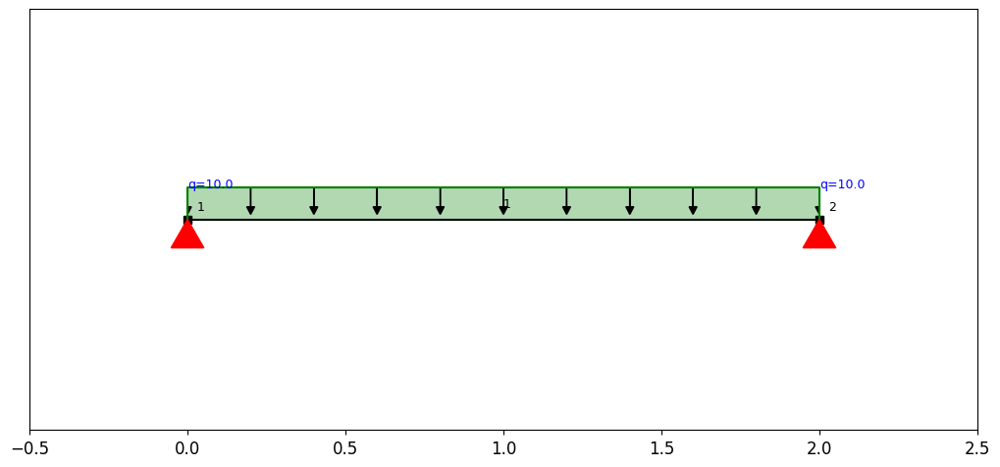

,shear,moment,reaction,displacement
0,12.03 kN,6.01 kNm,-12.03 kN,0.01 mm


Beam: HE550B
Shear force: 12.03 kN
Moment: 6.01 kNm
Displacement: 0.01 mm
Shear capacity: 1233.55 kN
Moment capacity: 1.2 kNm
Displacement capacity: 0.01 mm
Beam: HE550B, not suitable
Shear utilization: 0.97%
Moment utilization: 502.42%
Displacement utilization: 174.18%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

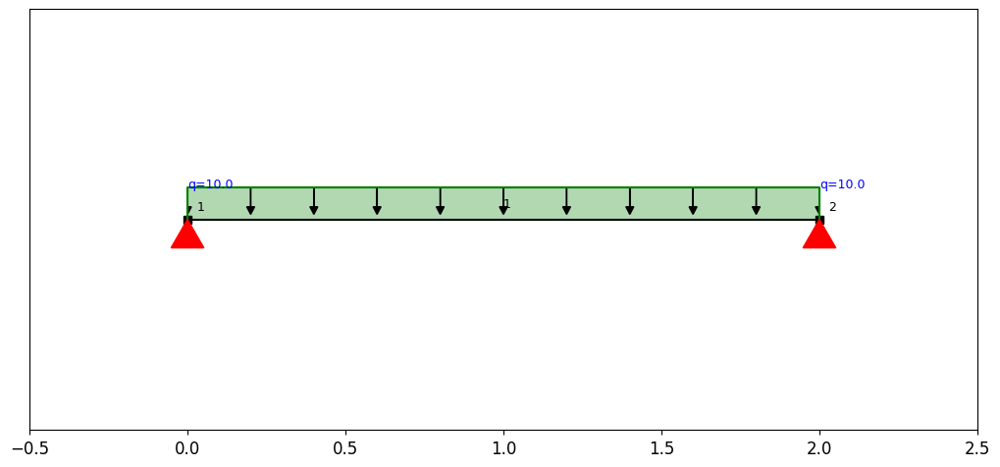

,shear,moment,reaction,displacement
0,12.16 kN,6.08 kNm,-12.16 kN,0.01 mm


Beam: HE600B
Shear force: 12.16 kN
Moment: 6.08 kNm
Displacement: 0.01 mm
Shear capacity: 1367.26 kN
Moment capacity: 1.37 kNm
Displacement capacity: 0.01 mm
Beam: HE600B, not suitable
Shear utilization: 0.89%
Moment utilization: 443.07%
Displacement utilization: 140.77%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

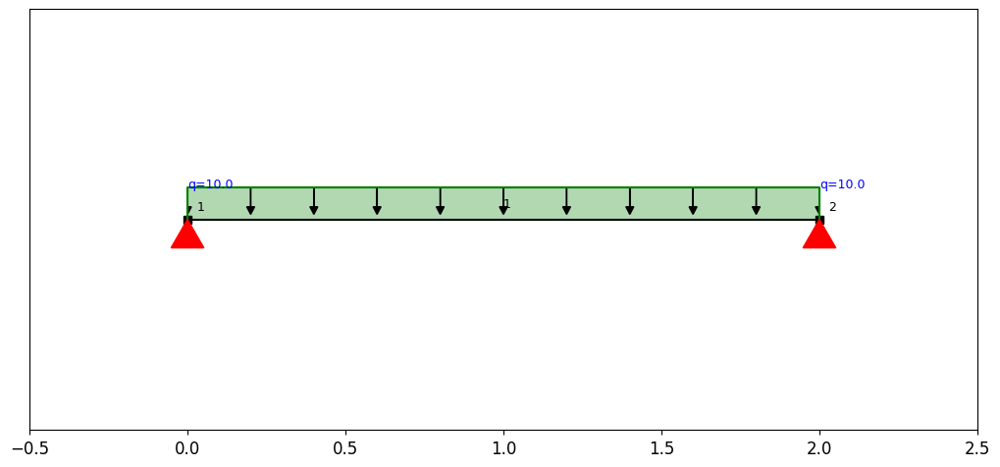

,shear,moment,reaction,displacement
0,12.29 kN,6.14 kNm,-12.29 kN,0.01 mm


Beam: HE650B
Shear force: 12.29 kN
Moment: 6.14 kNm
Displacement: 0.01 mm
Shear capacity: 1501.08 kN
Moment capacity: 1.56 kNm
Displacement capacity: 0.01 mm
Beam: HE650B, not suitable
Shear utilization: 0.82%
Moment utilization: 392.82%
Displacement utilization: 115.55%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

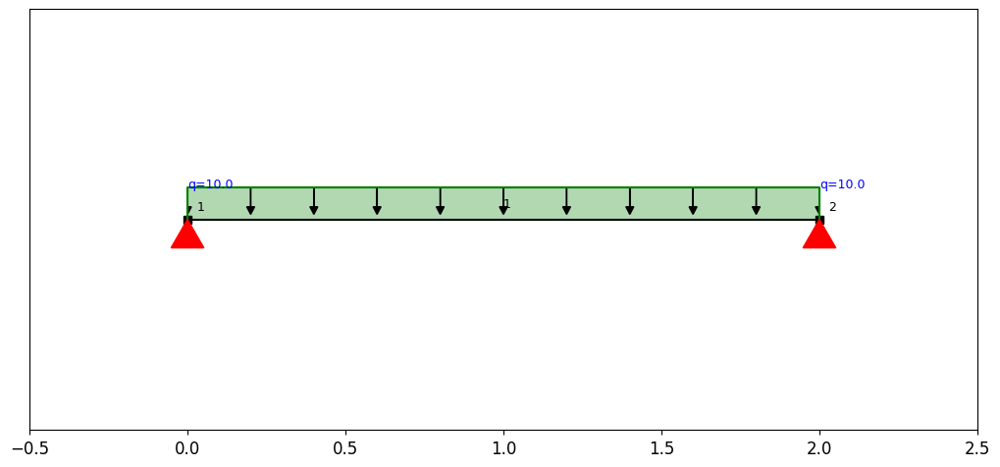

,shear,moment,reaction,displacement
0,12.45 kN,6.22 kNm,-12.45 kN,0.0 mm


Beam: HE700B
Shear force: 12.45 kN
Moment: 6.22 kNm
Displacement: 0.0 mm
Shear capacity: 1686.35 kN
Moment capacity: 1.78 kNm
Displacement capacity: 0.01 mm
Beam: HE700B, not suitable
Shear utilization: 0.74%
Moment utilization: 350.19%
Displacement utilization: 95.98%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

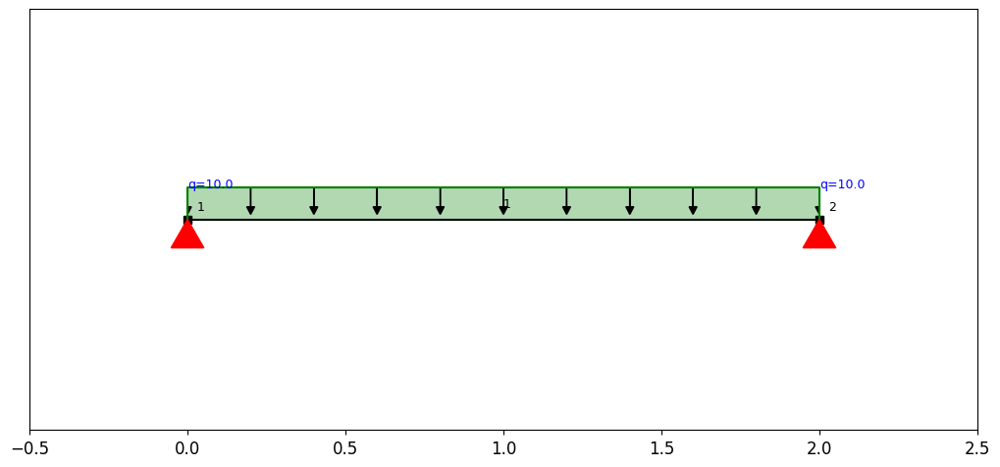

,shear,moment,reaction,displacement
0,12.67 kN,6.33 kNm,-12.67 kN,0.0 mm


Beam: HE800B
Shear force: 12.67 kN
Moment: 6.33 kNm
Displacement: 0.0 mm
Shear capacity: 1992.91 kN
Moment capacity: 2.18 kNm
Displacement capacity: 0.01 mm
Beam: HE800B, not suitable
Shear utilization: 0.64%
Moment utilization: 289.98%
Displacement utilization: 69.84%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

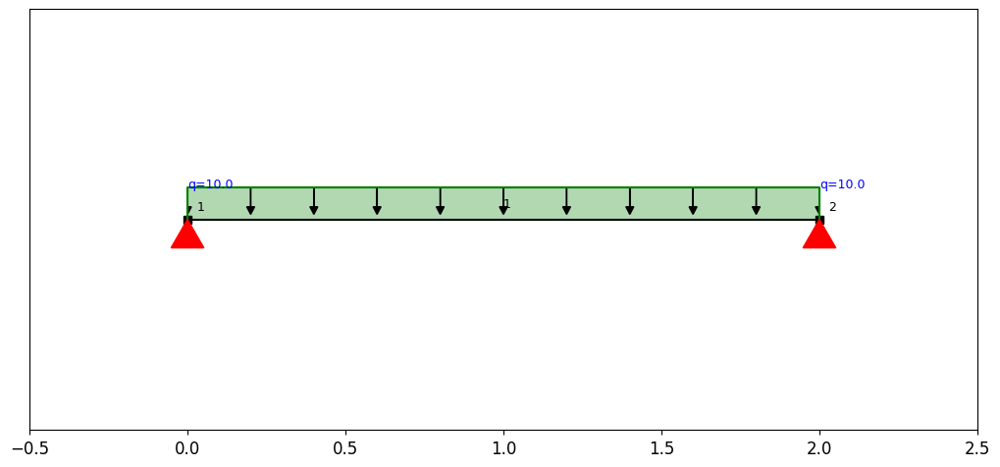

,shear,moment,reaction,displacement
0,12.96 kN,6.48 kNm,-12.96 kN,0.0 mm


Beam: HE900B
Shear force: 12.96 kN
Moment: 6.48 kNm
Displacement: 0.0 mm
Shear capacity: 2324.71 kN
Moment capacity: 2.69 kNm
Displacement capacity: 0.01 mm
Beam: HE900B, not suitable
Shear utilization: 0.56%
Moment utilization: 241.07%
Displacement utilization: 51.94%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

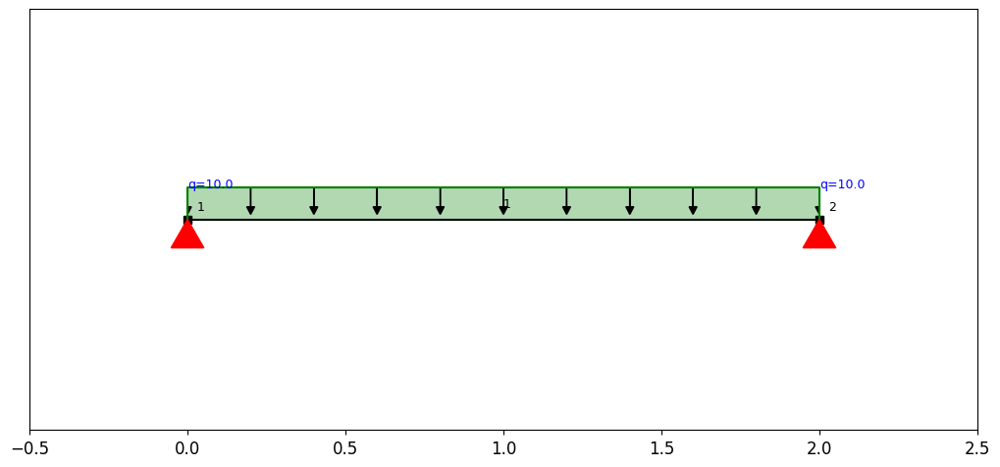

,shear,moment,reaction,displacement
0,13.2 kN,6.6 kNm,-13.2 kN,0.0 mm


Beam: HE1000B
Shear force: 13.2 kN
Moment: 6.6 kNm
Displacement: 0.0 mm
Shear capacity: 2620.3 kN
Moment capacity: 3.17 kNm
Displacement capacity: 0.01 mm
Beam: HE1000B, not suitable
Shear utilization: 0.5%
Moment utilization: 207.77%
Displacement utilization: 40.53%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

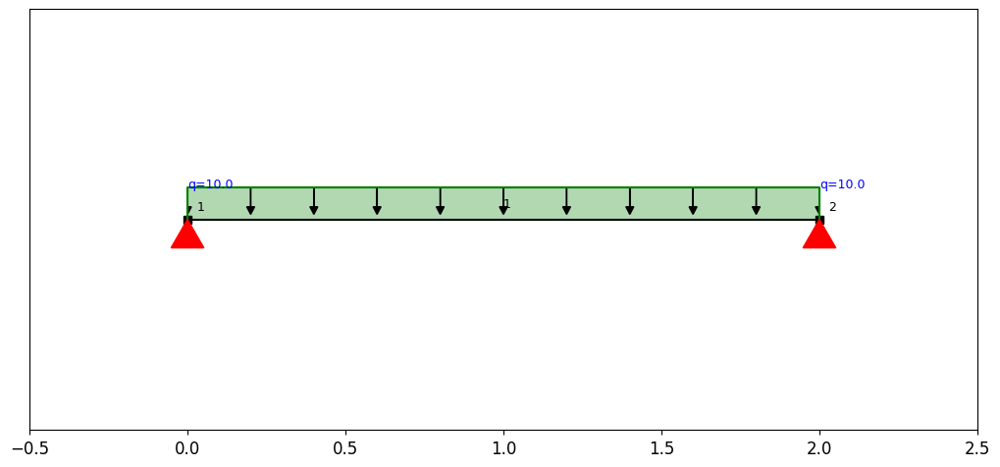

,shear,moment,reaction,displacement
0,10.21 kN,5.1 kNm,-10.21 kN,2.25 mm


Beam: HE100B
Shear force: 10.21 kN
Moment: 5.1 kNm
Displacement: 2.25 mm
Shear capacity: 111.01 kN
Moment capacity: 0.02 kNm
Displacement capacity: 0.01 mm
Beam: HE100B, not suitable
Shear utilization: 9.2%
Moment utilization: 22962.02%
Displacement utilization: 44910.23%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

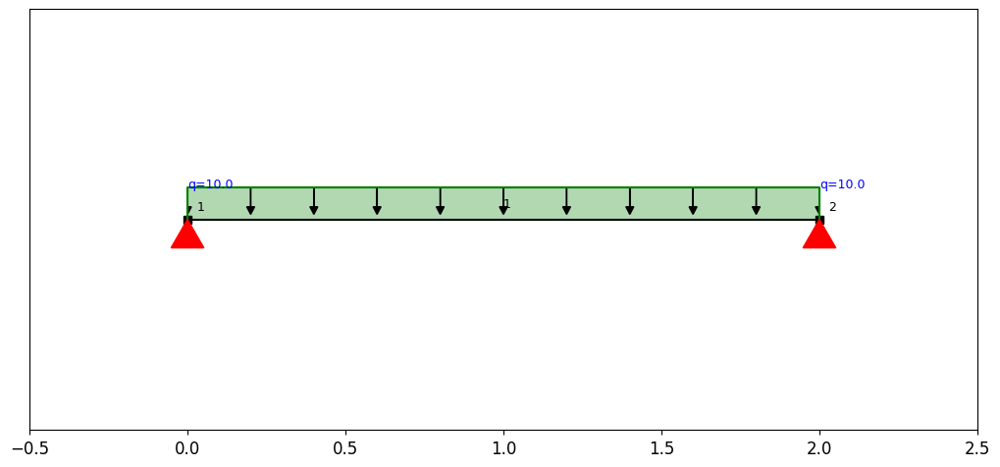

,shear,moment,reaction,displacement
0,10.27 kN,5.13 kNm,-10.27 kN,1.18 mm


Beam: HE120B
Shear force: 10.27 kN
Moment: 5.13 kNm
Displacement: 1.18 mm
Shear capacity: 135.12 kN
Moment capacity: 0.04 kNm
Displacement capacity: 0.01 mm
Beam: HE120B, not suitable
Shear utilization: 7.6%
Moment utilization: 14563.99%
Displacement utilization: 23537.75%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

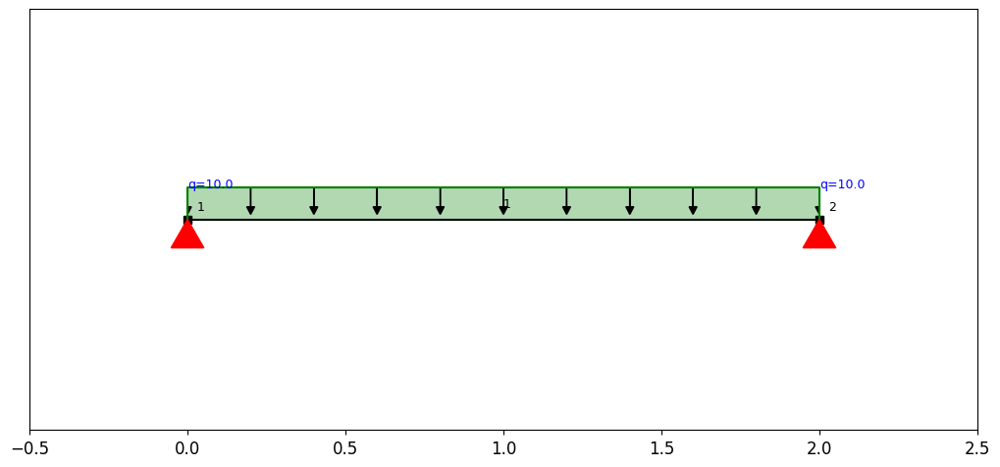

,shear,moment,reaction,displacement
0,10.34 kN,5.17 kNm,-10.34 kN,0.68 mm


Beam: HE140B
Shear force: 10.34 kN
Moment: 5.17 kNm
Displacement: 0.68 mm
Shear capacity: 161.83 kN
Moment capacity: 0.05 kNm
Displacement capacity: 0.01 mm
Beam: HE140B, not suitable
Shear utilization: 6.39%
Moment utilization: 9836.32%
Displacement utilization: 13561.42%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

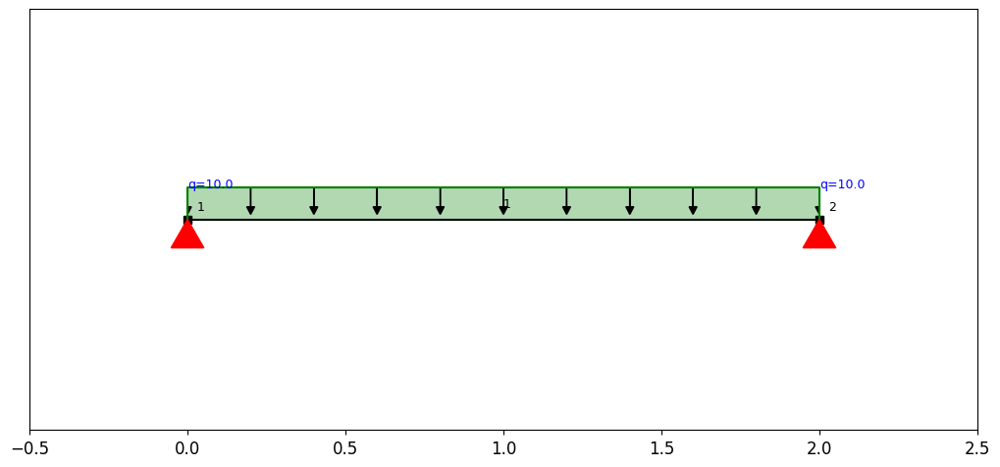

,shear,moment,reaction,displacement
0,10.43 kN,5.21 kNm,-10.43 kN,0.41 mm


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

Beam: HE160B
Shear force: 10.43 kN
Moment: 5.21 kNm
Displacement: 0.41 mm
Shear capacity: 217.58 kN
Moment capacity: 0.08 kNm
Displacement capacity: 0.01 mm
Beam: HE160B, not suitable
Shear utilization: 4.8%
Moment utilization: 6895.31%
Displacement utilization: 8296.06%


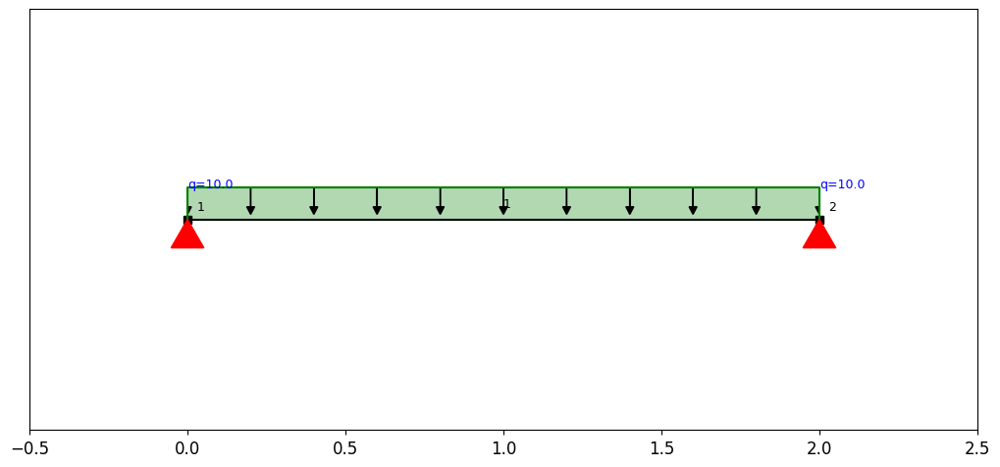

,shear,moment,reaction,displacement
0,10.52 kN,5.26 kNm,-10.52 kN,0.27 mm


Beam: HE180B
Shear force: 10.52 kN
Moment: 5.26 kNm
Displacement: 0.27 mm
Shear capacity: 250.26 kN
Moment capacity: 0.1 kNm
Displacement capacity: 0.01 mm
Beam: HE180B, not suitable
Shear utilization: 4.2%
Moment utilization: 5106.69%
Displacement utilization: 5438.79%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

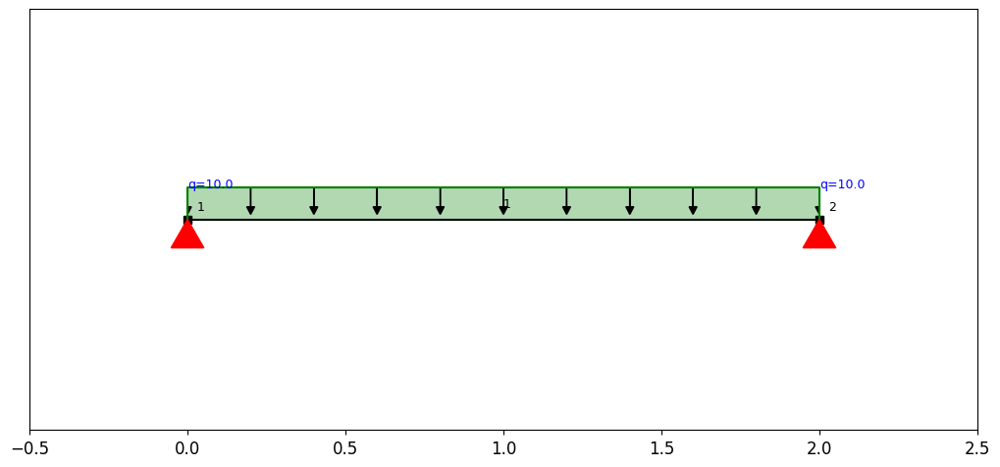

,shear,moment,reaction,displacement
0,10.62 kN,5.31 kNm,-10.62 kN,0.18 mm


Beam: HE200B
Shear force: 10.62 kN
Moment: 5.31 kNm
Displacement: 0.18 mm
Shear capacity: 306.51 kN
Moment capacity: 0.14 kNm
Displacement capacity: 0.01 mm
Beam: HE200B, not suitable
Shear utilization: 3.47%
Moment utilization: 3871.48%
Displacement utilization: 3690.21%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

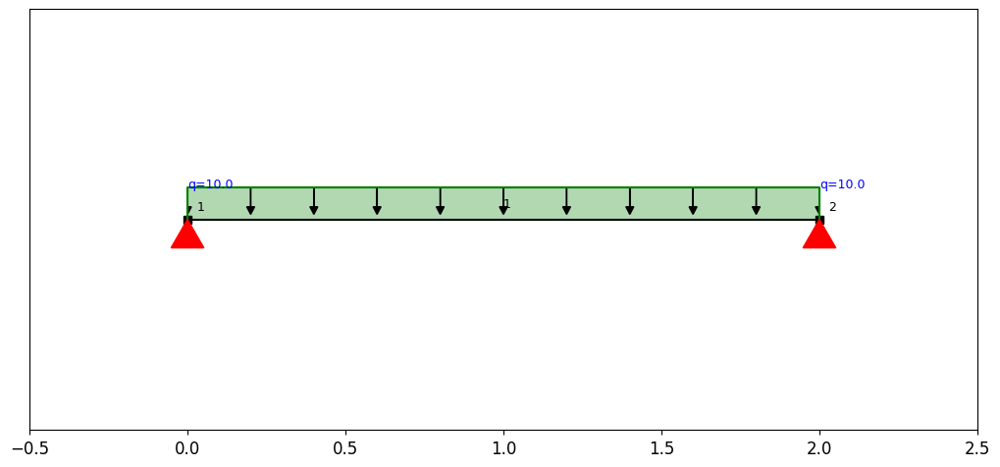

,shear,moment,reaction,displacement
0,10.73 kN,5.36 kNm,-10.73 kN,0.13 mm


Beam: HE220B
Shear force: 10.73 kN
Moment: 5.36 kNm
Displacement: 0.13 mm
Shear capacity: 343.88 kN
Moment capacity: 0.18 kNm
Displacement capacity: 0.01 mm
Beam: HE220B, not suitable
Shear utilization: 3.12%
Moment utilization: 3031.14%
Displacement utilization: 2625.44%


C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "I": float(section["Iy"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:18: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "A": float(section["A"]),
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:19: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  "g": float(section["g"]) / 98.2,
C:\Users\AsgerAndersen\AppData\Local\Temp\ipykernel_7492\1227522158.py:24: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  Wply = float(section["Wply"]) / 1e

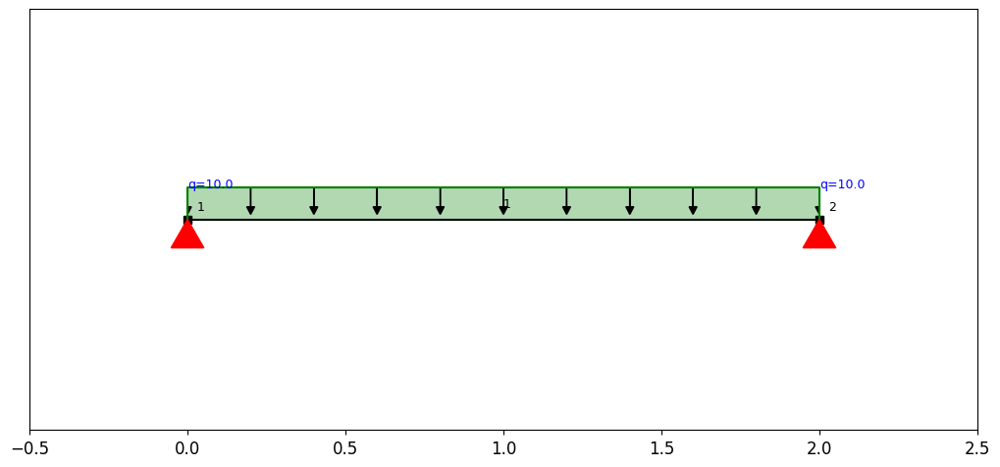

,shear,moment,reaction,displacement
0,10.85 kN,5.42 kNm,-10.85 kN,0.1 mm


In [ ]:
def optimize(Beams, q: float, L: float):
    
    shear_utilization = 101
    moment_utilization = 101
    displacement_utilization = 101
    
    E = 210000
    fyk = 235
    gamma_m0 = 1.1
    
    while shear_utilization > 100 or moment_utilization > 100 or displacement_utilization > 100:
        for beam in Beams:
            section = read_csv(filename="BeamData.csv", section=beam)
            
            params = {
                "E": E,
                "I": float(section["Iy"]),
                "A": float(section["A"]),
                "g": float(section["g"]) / 98.2,
                "L": L,
                "q": q
            }
            
            Wply = float(section["Wply"]) / 1e6
            Avy = float(section["Avy"]) / 1e6
            
            resultat = simpel_bjælke(params)
            
            shear_force = resultat["shear"]
            moment = resultat["moment"]
            displacement = resultat["displacement"]
            
            shear_capacity = ((Avy * fyk) / math.sqrt(3) * 10**3) / gamma_m0
            moment_capacity = (Wply * fyk) / gamma_m0
            displacement_capacity = (L / 400) * 1e3
            
            print(f"Beam: {beam}")
            print(f"Shear force: {round(shear_force, 2)} kN")
            print(f"Moment: {round(moment, 2)} kNm")    
            print(f"Displacement: {round(displacement, 2)} mm")
            print(f"Shear capacity: {round(shear_capacity, 2)} kN")
            print(f"Moment capacity: {round(moment_capacity, 2)} kNm")
            print(f"Displacement capacity: {round(displacement_capacity, 2)} mm")
            

            shear_utilization = (shear_force / shear_capacity) * 100
            moment_utilization = (moment / moment_capacity) * 100
            displacement_utilization = (displacement / displacement_capacity) * 100
            
            if shear_utilization > 100 or moment_utilization > 100 or displacement_utilization > 100:
                print(f"Beam: {beam}, not suitable")
                print(f"Shear utilization: {round(shear_utilization, 2)}%")
                print(f"Moment utilization: {round(moment_utilization, 2)}%")
                print(f"Displacement utilization: {round(displacement_utilization, 2)}%")
            elif shear_utilization < 100 and moment_utilization < 100 and displacement_utilization < 100:
                print(f"Beam: {beam}, suitable")
                print(f"Shear utilization: {round(shear_utilization, 2)}%")
                print(f"Moment utilization: {round(moment_utilization, 2)}%")
                print(f"Displacement utilization: {round(displacement_utilization, 2)}%")

optimize(Beams, -10, 2)
            
    
    